In [1]:
import re
import numpy as np
import pandas as pd
from pprint import pprint

# Gensim
import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel

# Plotting tools
import pyLDAvis
import pyLDAvis.gensim  # don't skip this
import matplotlib.pyplot as plt

# spacy for lemmatization
import spacy
import json
import warnings
import networkx as nx

warnings.filterwarnings("ignore",category=DeprecationWarning)

import nltk
nltk.download('stopwords')
nltk.download('words')

# NLTK Stop words
from nltk.corpus import stopwords
stop_words = stopwords.words('english')

from nltk.corpus import words
eng_words = words.words('en')

from langdetect import detect
# to enforce consistent results, check github langdetect readme
from langdetect import DetectorFactory
DetectorFactory.seed = 0


import os 

import requests

[nltk_data] Downloading package stopwords to
[nltk_data]     /home/ragulan550/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package words to /home/ragulan550/nltk_data...
[nltk_data]   Package words is already up-to-date!


In [ ]:
count = 0
array = []
def getTextFromJson():
    global count
    for file in os.listdir('tweetFiles'):
        print(file)
        if count < 200:
            with open('tweetFiles/' + file, "r") as f:
                for line in f:
                    for key, value in json.loads(line).items():
                        if(key =="text"):
                            if(len(value) >=100):
                                # get english tweets
                                try:
                                    if (detect(value)=="en"):
                                        # print (detect(value))
                                        array.append(value)
                                except:
                                    pass
        count = count + 1

def remove_stopwords(texts):
    return [[word for word in simple_preprocess(str(doc)) if word not in stop_words] for doc in texts]

getTextFromJson()

print("FINI")

57 (4).json
49 (2).json
51.json
13 (2).json
46.json
61.json
04 (2).json
47.json
15.json
02 (2).json
10 (4).json
45.json
12.json
28.json
57.json
12 (3).json
59 (3).json
27.json
09.json
10 (2).json
14 (3).json
56 (3).json
25.json
34.json
38 (4).json
54.json
42.json
32 (2).json
21.json
29 (2).json
41 (3).json
04.json
14 (2).json
24 (2).json
60.json
45 (3).json
09 (2).json
40 (2).json
44 (2).json
20 (2).json
15 (3).json
07 (3).json
52.json
55 (4).json
06.json
17 (2).json
55 (2).json
42 (3).json
58 (3).json
29.json
01 (2).json
58 (2).json
38 (2).json
52 (3).json
10.json
06 (2).json
23.json
25 (2).json
05.json
24 (3).json
24.json
45 (2).json
47 (2).json
23 (3).json
01 (3).json
17.json
06 (3).json
46 (3).json
13 (3).json
28 (2).json
40.json
38.json
00 (3).json
22 (3).json
04 (4).json


In [ ]:
data = array

# Remove links
data = [re.sub('http[s]?://(?:[a-zA-Z]|[0-9]|[$-_@.&+]|[!*\(\),]|(?:%[0-9a-fA-F][0-9a-fA-F]))+', '', sent) for sent in data]

# Remove new line characters
data = [re.sub('\s+', ' ', sent) for sent in data]

# Remove distracting single quotes
data = [re.sub("\'", "", sent) for sent in data]

# Remove hashtag
data = [re.sub("#", "", sent) for sent in data]

#remove non-ascii characters need to fix leaves blank lines
#data = [re.sub(r'[^\x00-\x7F]+','', sent) for sent in data]

def remove_non_english_words(tweets):
     return [[word for word in simple_preprocess(str(tweet)) if word in eng_words] for tweet in tweets]

def remove_empty_sent(tweets) :
    res = []
    for tweet in tweets:
        if len(tweet) != 0:
            res.append(tweet)
    return res

#data = remove_non_english_words(data)

data = remove_empty_sent(data)

print("PLS")


In [ ]:
def sent_to_words(sentences):
    for sentence in sentences:
        yield(gensim.utils.simple_preprocess(str(sentence), deacc=True))  # deacc=True removes punctuations


data_words = list(sent_to_words(data))

data_words_no_stp = remove_stopwords(data_words)


print(data_words_no_stp[:1])

def lemmatization(texts, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV']):
    """https://spacy.io/api/annotation"""
    texts_out = []
    for sent in texts:
        doc = nlp(" ".join(sent)) 
        texts_out.append([token.lemma_ for token in doc if token.pos_ in allowed_postags])
    return texts_out

In [ ]:

# Initialize spacy 'en' model, keeping only tagger component (for efficiency)
# python3 -m spacy download en
# nlp = spacy.load('en', disable=['parser', 'ner'])

# # Do lemmatization keeping only noun, adj, vb, adv
data_lemmatized = lemmatization(data_words_no_stp, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV'])

In [ ]:
with open('preprocesseddata.txt', 'w') as f:
    for row in data_lemmatized:
        f.write("%s\n" % row)

In [2]:
import json
import ast
data_lemmatized = []
with open('preprocesseddata.txt', "r") as f:
    for line in f:
        data_lemmatized.append(ast.literal_eval(line))

# Create Dictionary
id2word = corpora.Dictionary(data_lemmatized)

# Create Corpus
# type(data_lemmatized)
# print (data_lemmatized)
texts = data_lemmatized

print(data_lemmatized[:1])

[['private', 'travel', 'mix', 'personal', 'political', 'biz', 'coziness', 'allege', 'scam', 'pac', 'keep', 'secretaryzinke', 'scandal']]


In [3]:
print (len (data_lemmatized))

84332


In [4]:
# Term Document Frequency
corpus = [id2word.doc2bow(text) for text in texts]

# Human readable format of corpus (term-frequency)
print([[(id2word[id], freq) for id, freq in cp] for cp in corpus[:1]])

# Build LDA model
lda_model = gensim.models.ldamulticore.LdaMulticore(corpus=corpus,id2word=id2word,num_topics=20, passes=10, workers=7)

# Print the Keyword in the 10 topics
pprint(lda_model.print_topics())
doc_lda = lda_model[corpus]

# Compute Perplexity
print('\nPerplexity: ', lda_model.log_perplexity(corpus))  # a measure of how good the model is. lower the better.

# Compute Coherence Score
# coherence_model_lda = CoherenceModel(model=lda_model, texts=data_words_no_stp, dictionary=id2word, coherence='c_v')
# coherence_lda = coherence_model_lda.get_coherence()
# print('\nCoherence Score: ', coherence_lda)


[[('allege', 1), ('biz', 1), ('coziness', 1), ('keep', 1), ('mix', 1), ('pac', 1), ('personal', 1), ('political', 1), ('private', 1), ('scam', 1), ('scandal', 1), ('secretaryzinke', 1), ('travel', 1)]]
[(0,
  '0.015*"halloween" + 0.011*"thank" + 0.011*"amp" + 0.007*"retweet" + '
  '0.006*"love" + 0.006*"today" + 0.005*"help" + 0.005*"open" + 0.005*"brown" '
  '+ 0.005*"make"'),
 (1,
  '0.069*"not" + 0.045*"do" + 0.032*"be" + 0.017*"thing" + 0.017*"say" + '
  '0.014*"can" + 0.012*"people" + 0.010*"even" + 0.009*"go" + 0.009*"make"'),
 (2,
  '0.015*"city" + 0.014*"job" + 0.014*"see" + 0.009*"year" + 0.009*"right" + '
  '0.008*"party" + 0.008*"raise" + 0.007*"great" + 0.007*"amazing" + '
  '0.007*"s"'),
 (3,
  '0.024*"wanna" + 0.016*"album" + 0.015*"nothing" + 0.014*"photo" + '
  '0.013*"release" + 0.011*"get" + 0.011*"make" + 0.010*"nice" + 0.009*"https" '
  '+ 0.009*"class"'),
 (4,
  '0.067*"_" + 0.014*"birthday" + 0.013*"kid" + 0.012*"good" + 0.011*"happy" + '
  '0.010*"come" + 0.009*"

In [5]:

# Visualize the topics
#pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim.prepare(lda_model, corpus, id2word)
pyLDAvis.save_html(vis, 'LDA_Visualization.html')


/home/ragulan550/.local/lib/python3.5/site-packages/pyLDAvis/_prepare.py:257: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  return pd.concat([default_term_info] + list(topic_dfs))


In [6]:
def format_topics_sentences(ldamodel=lda_model, corpus=corpus, texts=data_lemmatized):
    # Init output
    sent_topics_df = pd.DataFrame()

    # Get main topic in each document
    for i, row in enumerate(ldamodel[corpus]):
        print(row) 
        topics = []
        row = sorted(row, key=lambda x: (x[1]), reverse=True) 
        for j, (topic_num, prop_topic) in enumerate(row):
            if j in [0,1,2]: 
                topics.append(topic_num)
        # Get the Dominant topic, Perc Contribution and Keywords for each document
        for j, (topic_num, prop_topic) in enumerate(row):
#             if j in [0,1,2]: #top 3 dominant topics
            if j == 0:  # => dominant topic
                wp = ldamodel.show_topic(topic_num)
                topic_keywords = ", ".join([word for word, prop in wp])
                sent_topics_df = sent_topics_df.append(pd.Series([topics, round(prop_topic,4), topic_keywords]), ignore_index=True)
            else:
                break
    sent_topics_df.columns = ['Dominant_Topic', 'Perc_Contribution', 'Topic_Keywords']

    # Add original text to the end of the output
    contents = pd.Series(texts)
    sent_topics_df = pd.concat([sent_topics_df, contents], axis=1)
    return(sent_topics_df)


df_topic_sents_keywords = format_topics_sentences(ldamodel=lda_model, corpus=corpus, texts=data_lemmatized)

[(15, 0.93214285)]
[(4, 0.50150865), (16, 0.34849137)]
[(5, 0.22569413), (15, 0.5943059)]
[(15, 0.8028312), (18, 0.107168786)]
[(7, 0.93214285)]
[(13, 0.3756435), (15, 0.47435653)]
[(1, 0.4738935), (3, 0.09002622), (11, 0.375366)]
[(0, 0.7485265), (4, 0.16965532)]
[(9, 0.010000001), (14, 0.010000001), (16, 0.81000006)]
[(1, 0.61495143), (4, 0.28504854)]
[(13, 0.5165394), (15, 0.35488915)]
[(0, 0.18053426), (4, 0.1708572), (5, 0.15488791), (13, 0.39372066)]
[(13, 0.81000006)]
[(2, 0.101314306), (10, 0.10140515), (16, 0.14165983), (19, 0.58289343)]
[(8, 0.5255932), (11, 0.36190683)]
[(1, 0.31086057), (15, 0.24168324), (18, 0.37018344)]
[(0, 0.025000002), (1, 0.525), (2, 0.025000002), (3, 0.025000002), (4, 0.025000002), (5, 0.025000002), (6, 0.025000002), (7, 0.025000002), (8, 0.025000002), (9, 0.025000002), (10, 0.025000002), (11, 0.025000002), (12, 0.025000002), (13, 0.025000002), (14, 0.025000002), (15, 0.025000002), (16, 0.025000002), (17, 0.025000002), (18, 0.025000002), (19, 0.02500

[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.012500001), (5, 0.0125), (6, 0.0125), (7, 0.45285937), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.3221406), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(12, 0.88125)]
[(2, 0.6732376), (16, 0.16125658), (19, 0.09467244)]
[(3, 0.60964805), (5, 0.26178053)]
[(2, 0.41000074), (8, 0.010000001), (14, 0.40999922), (15, 0.010000001)]
[(4, 0.10639312), (17, 0.81178874)]
[(0, 0.9441176)]
[(3, 0.7367523), (19, 0.17324774)]
[(7, 0.20065296), (12, 0.64934707)]
[(8, 0.9136364)]
[(8, 0.9136364)]
[(6, 0.1618433), (9, 0.50112414), (12, 0.2307826)]
[(4, 0.40462103), (8, 0.24264343), (9, 0.14796524), (14, 0.13810359)]
[(3, 0.81000006), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (10, 0.010000001), (13, 0.010000001), (15, 0.010000001), (17, 0.010000001)]
[(7, 0.81000006)]
[(0, 0.025), (1, 0.025), (2, 0.52500004), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0

[(1, 0.62606007), (7, 0.27393997)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.68333334)]
[(1, 0.77261084), (4, 0.12738922)]
[(1, 0.2296142), (9, 0.11977622), (12, 0.16147156), (13, 0.092628546), (17, 0.33400944)]
[(15, 0.25156784), (17, 0.6584321)]
[(0, 0.23326805), (7, 0.37203127), (13, 0.30970067)]
[(1, 0.17942113), (4, 0.122645974), (5, 0.09900334), (8, 0.52620226)]
[(2, 0.9136364)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.3493745), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.3506255), (14, 0.016666668), (15, 0.016666668), (16,

[(5, 0.11701302), (8, 0.6210801), (10, 0.17690687)]
[(4, 0.4667629), (9, 0.12152866), (17, 0.317264)]
[(8, 0.9269231)]
[(8, 0.9269231)]
[(16, 0.9269231)]
[(8, 0.9269231)]
[(4, 0.72058177), (14, 0.11663131), (16, 0.09195361)]
[(1, 0.25294107), (4, 0.65705895)]
[(10, 0.17603678), (13, 0.36168417), (15, 0.35602903)]
[(1, 0.44002157), (9, 0.3320901), (16, 0.13344385)]
[(8, 0.24429801), (13, 0.643202)]
[(17, 0.81000006)]
[(0, 0.43791777), (15, 0.44958228)]
[(2, 0.10176042), (4, 0.2069905), (10, 0.61397636)]
[(1, 0.16916378), (11, 0.5991648), (17, 0.1543987)]
[(2, 0.19760714), (4, 0.6898929)]
[(8, 0.9269231)]
[(8, 0.9269231)]
[(1, 0.21720299), (4, 0.010000001), (12, 0.010000001), (14, 0.010000001), (15, 0.602797)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.525), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(7, 0.44301644), (17, 0.376983

[(9, 0.111526765), (14, 0.79847324)]
[(13, 0.89444447)]
[(6, 0.13536096), (10, 0.2928064), (13, 0.43016598)]
[(13, 0.89444447)]
[(12, 0.2553955), (15, 0.67537373)]
[(1, 0.3817232), (8, 0.20176), (19, 0.27485016)]
[(6, 0.27172697), (16, 0.63827306)]
[(12, 0.15650496), (16, 0.7684951)]
[(4, 0.2063175), (8, 0.7293968)]
[(5, 0.17015181), (12, 0.48078662), (17, 0.227633)]
[(3, 0.15979819), (7, 0.55903035), (13, 0.15974288)]
[(17, 0.93214285)]
[(4, 0.39489046), (12, 0.45510957)]
[(0, 0.0125), (1, 0.0125), (2, 0.26250124), (3, 0.0125), (4, 0.0125), (5, 0.51249874), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(1, 0.21318874), (15, 0.29284734), (16, 0.35229725)]
[(8, 0.69297266), (11, 0.17845592)]
[(13, 0.93214285)]
[(7, 0.81964636), (11, 0.0985354)]
[(7, 0.86428577)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.01

[(0, 0.68333334), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(1, 0.3173441), (19, 0.59265596)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.68333334), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(1, 0.6460794), (2, 0.08962877), (15, 0.1128149), (18, 0.08993847)]
[(2, 0.26294), (13, 0.63706)]
[(2, 0.86428577)]
[(2, 0.057440888), (3, 0.76990724), (13, 0.10181855)]
[(10, 0.21196714), (12, 0.18189684), (13, 0.5288633)]


[(3, 0.5918705), (11, 0.13824624), (13, 0.17543888)]
[(13, 0.2724733), (15, 0.3851216), (17, 0.27157173)]
[(10, 0.8416667)]
[(3, 0.18943676), (10, 0.7413325)]
[(2, 0.076118805), (14, 0.8595955)]
[(0, 0.012500001), (1, 0.4057357), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.3692643), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500002), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(0, 0.5585451), (10, 0.26145488), (13, 0.010000001)]
[(7, 0.6970373), (15, 0.22796267)]
[(7, 0.15319207), (10, 0.14603913), (13, 0.22788459), (15, 0.3728842)]
[(1, 0.7501796), (13, 0.13732044)]
[(0, 0.14699158), (4, 0.20629457), (8, 0.5617138)]
[(2, 0.32242727), (10, 0.60834193)]
[(2, 0.08376628), (5, 0.17469388), (12, 0.68082553)]
[(2, 0.3467012), (13, 0.31805086), (19, 0.19358128)]
[(7, 0.81000006)]
[(1, 0.16020033), (7, 0.7272997)

[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.34629261), (14, 0.016666668), (15, 0.016666668), (16, 0.35370734), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(6, 0.22377324), (12, 0.23934194), (15, 0.27311137), (16, 0.20223495)]
[(8, 0.92083335)]
[(0, 0.53328604), (8, 0.116204016), (14, 0.28512532)]
[(0, 0.012500002), (1, 0.012500002), (2, 0.012500002), (3, 0.012500002), (4, 0.012500002), (5, 0.012500002), (6, 0.012500002), (7, 0.012500002), (8, 0.012500003), (9, 0.012500002), (10, 0.012500002), (11, 0.012500002), (12, 0.012500002), (13, 0.012500002), (14, 0.012500002), (15, 0.012500002), (16, 0.012500002), (17, 0.012500002), (18, 0.012500002), (19, 0.7625)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.3493742), (5, 0.016666668), (6, 0.01666666

[(14, 0.8642857)]
[(11, 0.73025775), (18, 0.17974225)]
[(1, 0.11246083), (9, 0.23910679), (15, 0.42227742), (17, 0.09017614), (18, 0.08597884)]
[(0, 0.51216954), (17, 0.37533048)]
[(14, 0.6638268), (16, 0.27188748)]
[(8, 0.2080211), (10, 0.44146714), (17, 0.27967843)]
[(8, 0.44130027), (16, 0.48369977)]
[(16, 0.88124996)]
[(8, 0.7775427), (10, 0.1224573)]
[(4, 0.88125)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.76250005), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(2, 0.08241427), (6, 0.7072518), (14, 0.15366733)]
[(1, 0.47568312), (9, 0.32026854), (17, 0.11904831)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.68

[(5, 0.10603388), (11, 0.14919557), (12, 0.1981246), (17, 0.44664598)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.26250002), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.26157022), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.2634298)]
[(1, 0.1640205), (2, 0.6925145), (6, 0.08679834)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.012500001), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.76250005)]
[(3, 0.07769585), (7, 0.25437477), (15, 0.35763687), (18, 0.25695917)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668)

[(18, 0.89444447)]
[(0, 0.010000001), (1, 0.010000002), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000002), (6, 0.010000001), (7, 0.81), (8, 0.010000001), (9, 0.010000002), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.010000002), (14, 0.010000002), (15, 0.010000002), (16, 0.010000001), (17, 0.010000002), (18, 0.010000001), (19, 0.010000001)]
[(17, 0.90500003)]
[(16, 0.8642857)]
[(3, 0.080339655), (8, 0.85537463)]
[(0, 0.7806908), (11, 0.119309224)]
[(3, 0.14066608), (4, 0.4067947), (17, 0.38715458)]
[(11, 0.56041986), (18, 0.33958012)]
[(1, 0.08681168), (6, 0.2379549), (7, 0.25658417), (14, 0.35198256)]
[(8, 0.28190854), (13, 0.6488607)]
[(12, 0.9269231)]
[(1, 0.81000006), (3, 0.010000001)]
[(5, 0.86428577)]
[(7, 0.78161186), (11, 0.118388176)]
[(3, 0.21831898), (6, 0.25482163), (19, 0.4054308)]
[(18, 0.86428577)]
[(15, 0.8416667)]
[(11, 0.38591388), (14, 0.4243409), (15, 0.11247247)]
[(2, 0.24398112), (6, 0.13018976), (9, 0.21868612), (17, 0.2928

[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.7625), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.012500006)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.7625), (18, 0.0125), (19, 0.0125)]
[(14, 0.9136364)]
[(0, 0.0125), (1, 0.5121629), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.012500001), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.26283705), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(17, 0.11477688), (18, 0.803405)]
[(6, 0.0965501), (13, 0.8284499)]
[(5, 0.71623033), (16, 0.2087697)]
[(7, 0.57212335), (18, 0.29930526)]
[(0, 0.01666

[(10, 0.90500003)]
[(12, 0.1755185), (13, 0.46525097), (15, 0.23780195)]
[(10, 0.41), (17, 0.21), (18, 0.21)]
[(13, 0.15045103), (14, 0.749549)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.012500002), (18, 0.7625), (19, 0.0125)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.35), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.35000002), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001

[(3, 0.3026636), (6, 0.5848364)]
[(3, 0.1536238), (6, 0.18507482), (12, 0.13877213), (14, 0.14154182), (17, 0.31848738)]
[(7, 0.78286207), (18, 0.11713788)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.68333334), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(13, 0.86428577)]
[(2, 0.92083335)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.76250005), (15, 0.0125), (16, 0.012500001), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(13, 0.86428577)]
[(15, 0.17727515), (17, 0.15579422), (18, 0.54550207)]
[(15, 0.93666667)]
[(5, 0.28994453), (13, 0.4288748), (18, 0.20390798)]
[(15, 0.72

[(3, 0.9136364)]
[(0, 0.012500001), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.7625), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(2, 0.81000006), (9, 0.010000001), (13, 0.010000001), (14, 0.010000001)]
[(12, 0.35067365), (14, 0.16623251), (15, 0.38864943)]
[(8, 0.10798356), (14, 0.7795164)]
[(6, 0.15526986), (13, 0.5320492), (18, 0.259556)]
[(18, 0.81000006)]
[(0, 0.47735396), (4, 0.44764602)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.010000001), (14, 0.010000001), (15, 0.010000001), (16, 0.010000001), (17, 0.010000001), (18, 0.81), (19, 0.010000001)]
[(11, 0.21005924), (18, 0.6099407)]
[(1, 0.13673519), (18, 0.76326483)]
[(

[(1, 0.21811719), (7, 0.4992006), (14, 0.16125362)]
[(4, 0.23086646), (9, 0.33612582), (18, 0.33856326)]
[(6, 0.23235552), (13, 0.010000001), (15, 0.58764446)]
[(7, 0.19409144), (11, 0.33602154), (14, 0.3926143)]
[(1, 0.37464982), (5, 0.3153846), (12, 0.18853699)]
[(11, 0.81000006), (15, 0.010000001)]
[(18, 0.86428577)]
[(18, 0.41066098), (19, 0.47683904)]
[(1, 0.010000001), (2, 0.010000001), (4, 0.39666563), (7, 0.4233343)]
[(13, 0.23673193), (15, 0.39187187), (18, 0.3005629)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.68333334), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(18, 0.8416667)]
[(2, 0.4068696), (19, 0.4431304)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025)

[(3, 0.29285717), (11, 0.14999999), (18, 0.43571427)]
[(3, 0.35747236), (5, 0.22963512), (9, 0.24289253), (11, 0.010000001)]
[(9, 0.90500003)]
[(18, 0.81000006)]
[(1, 0.51702374), (5, 0.3303192), (7, 0.08727246)]
[(9, 0.13587725), (17, 0.22214536), (18, 0.53572744)]
[(18, 0.9136364)]
[(10, 0.86428577)]
[(0, 0.88125)]
[(9, 0.33910063), (18, 0.5790812)]
[(2, 0.20860817), (7, 0.42815715), (12, 0.29785007)]
[(3, 0.9136364)]
[(4, 0.7219852), (18, 0.19619662)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.30393955), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.47106043), (19, 0.0125)]
[(0, 0.23576817), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.53923184), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125

[(0, 0.0125), (1, 0.012500001), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.76250005), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(1, 0.23628357), (9, 0.44885397), (11, 0.2581958)]
[(0, 0.35), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.35), (18, 0.016666668), (19, 0.016666668)]
[(3, 0.32046053), (13, 0.2808671), (17, 0.25700572)]
[(4, 0.93214285)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.28170204), (15, 0.0125), (16, 0.0125), (17, 0.

[(11, 0.37779617), (12, 0.4936324)]
[(18, 0.81000006)]
[(17, 0.3986699), (18, 0.51951194)]
[(1, 0.54984593), (13, 0.3501541)]
[(0, 0.21920252), (7, 0.40079752), (9, 0.21)]
[(0, 0.0125), (1, 0.012500004), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.5125668), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.26243317), (18, 0.0125), (19, 0.0125)]
[(3, 0.14622384), (5, 0.1295704), (6, 0.26683983), (14, 0.35736597)]
[(5, 0.117814645), (13, 0.7921853)]
[(13, 0.9136364)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.47550017), (4, 0.0125), (5, 0.2994998), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(2, 0.5514411), (9, 0.29855892)]
[(3, 0.26216242), (13, 0.36144027), (14, 0.3110127)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3

[(1, 0.15319839), (6, 0.47272092), (17, 0.25265214)]
[(3, 0.81000006)]
[(10, 0.89444447)]
[(0, 0.10918364), (5, 0.25904426), (9, 0.3921457), (16, 0.1507375)]
[(11, 0.15894963), (15, 0.71247894)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.5125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.2625), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(4, 0.24137871), (15, 0.27215186), (17, 0.17061903), (19, 0.18251705)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.525), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(0, 0.42899227), (7, 0.39139873), (17, 0.10233629)]
[(3, 0.010000003), (15, 0.81000006)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.26104367), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125),

[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.35000536), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.34999463)]
[(1, 0.41275313), (8, 0.3486638), (14, 0.065048285), (17, 0.12020146)]
[(4, 0.2442958), (14, 0.1599554), (18, 0.4894988)]
[(15, 0.60317993), (17, 0.24682009)]
[(5, 0.11924575), (14, 0.81646854)]
[(8, 0.86428577)]
[(5, 0.47768942), (8, 0.12358143), (16, 0.3137292)]
[(2, 0.3876056), (6, 0.17983405), (13, 0.33811593)]
[(4, 0.21811642), (19, 0.7218836)]
[(3, 0.89444447)]
[(2, 0.28095895), (13, 0.5904696)]
[(17, 0.88124996)]
[(1, 0.40558296), (10, 0.29080695), (16, 0.18218149)]
[(1, 0.34262294), (2, 0.2125613), (3, 0.19351095), (15, 0.19797148)]
[(2, 0.5385138), (17, 0.34898624)]
[(7, 0.89444447)]
[(13, 0.5098093), (14, 0.171404

[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.52500004), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(6, 0.54973024), (12, 0.13085638), (17, 0.26628837)]
[(1, 0.17862868), (12, 0.102662325), (15, 0.17138053), (17, 0.088289835), (18, 0.39653862)]
[(12, 0.88125)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.35579035), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.34420964), (18, 0.016666668), (19, 0.016666668)]
[(1, 0.17847714), (5, 0.12990901), (14, 0.128175), (18, 0.47454998)]
[(3, 0.15705635), (4, 0.7679436)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.35), (6, 0.01

[(6, 0.81000006)]
[(1, 0.31307226), (4, 0.3932904), (8, 0.18738736)]
[(1, 0.19041617), (6, 0.35514852), (13, 0.3599908)]
[(3, 0.42431763), (8, 0.4256824)]
[(4, 0.45823193), (6, 0.45176807)]
[(5, 0.06952443), (6, 0.14296018), (8, 0.22178774), (18, 0.4930004)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.68333334), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(5, 0.28365895), (7, 0.13411365), (14, 0.10086322), (18, 0.4146975)]
[(16, 0.25729492), (18, 0.6302051)]
[(9, 0.825189), (15, 0.10558026)]
[(16, 0.51925284), (18, 0.41646147)]
[(7, 0.38416892), (9, 0.087722205), (12, 0.4336644)]
[(2, 0.6901133), (18, 0.15988666)]
[(1, 0.65121645), (18, 0.19878356)]
[(17, 0.89444447)]
[(13, 0.86428577)]
[(2, 0.68594456), (18, 0.2240554

[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.525), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(1, 0.1767096), (4, 0.27973333), (12, 0.44911262)]
[(4, 0.4100111), (15, 0.40998888)]
[(3, 0.9269231)]
[(13, 0.6094564), (14, 0.21054351)]
[(4, 0.16538505), (8, 0.70604354)]
[(0, 0.016666668), (1, 0.3508825), (2, 0.016666668), (3, 0.016666668), (4, 0.34911752), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(4, 0.53388774), (5, 0.010000001), (15, 0.28611225)]
[(18, 0.8416667)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.0

[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.525), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(5, 0.32097208), (8, 0.15316291), (13, 0.09155781), (17, 0.2005526), (18, 0.17125458)]
[(17, 0.81000006)]
[(3, 0.34082562), (9, 0.10881369), (11, 0.13700686), (17, 0.17271625), (19, 0.18706614)]
[(6, 0.20537207), (13, 0.50426745), (16, 0.20536049)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.34944), (17, 0.016666668), (18, 0.016666668), (19, 0.35055995)]
[(1, 0.7458947), (6, 0.14160532)]
[(11, 0.6084121), (14, 0.3315879)]
[(7, 0.4358848), (9, 0.43554375)]
[(0, 0.010000001), (1, 0.52178

[(14, 0.93666667)]
[(0, 0.37102935), (10, 0.09987282), (13, 0.45182514)]
[(11, 0.9136364)]
[(12, 0.89444447)]
[(5, 0.35523584), (16, 0.11190243), (18, 0.4674771)]
[(1, 0.73024404), (6, 0.15709265), (17, 0.055996697)]
[(3, 0.86428577)]
[(5, 0.13220845), (10, 0.7985608)]
[(8, 0.8642857)]
[(4, 0.34338224), (9, 0.19468166), (17, 0.2078417), (18, 0.1813671)]
[(7, 0.09748472), (19, 0.8332845)]
[(9, 0.73015064), (18, 0.19484936)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.68333334), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(3, 0.06867693), (7, 0.8620923)]
[(6, 0.2010497), (13, 0.64895034)]
[(3, 0.19369546), (8, 0.7370738)]
[(1, 0.4918104), (8, 0.14520533), (14, 0.23412406), (15, 0.081801385)]
[(0, 0.016666668), (1, 0.0166

[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.7625), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(0, 0.40330487), (1, 0.50669515)]
[(5, 0.10764381), (10, 0.09694158), (13, 0.7181419)]
[(0, 0.0125), (1, 0.0125), (2, 0.012500001), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.25516042), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.012500001), (16, 0.0125), (17, 0.012500001), (18, 0.0125), (19, 0.5198396)]
[(4, 0.08248769), (15, 0.24315031), (17, 0.08921511), (18, 0.52800405)]
[(9, 0.10415126), (17, 0.19984151), (18, 0.61873454)]
[(5, 0.095454544), (7, 0.82272726)]
[(19, 0.8416667)]
[(1, 0.34421077), (7, 0.112212114), (8, 0.4963549)]
[(1, 0.19370319), (15

[(10, 0.7833333), (12, 0.11666665)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.81), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.010000001), (14, 0.010000001), (15, 0.010000001), (16, 0.010000001), (17, 0.010000001), (18, 0.010000001), (19, 0.010000001)]
[(2, 0.20297575), (11, 0.15844525), (18, 0.532329)]
[(4, 0.14610107), (5, 0.09053326), (8, 0.2857315), (18, 0.42049137)]
[(13, 0.92083335)]
[(18, 0.89444447)]
[(17, 0.81000006), (18, 0.010000001)]
[(4, 0.010000001), (12, 0.81000006)]
[(2, 0.92083335)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.525), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(0, 0.016666666), (1, 0.016666666), (2, 0.016666666), (3, 0.016666666), (4, 0.016666666), (5, 0.

[(10, 0.89444447)]
[(17, 0.2399803), (18, 0.61001974)]
[(10, 0.68623763), (15, 0.21376234)]
[(5, 0.12355322), (8, 0.5671998), (15, 0.2485327)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.68333334), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(1, 0.5036923), (7, 0.34630764)]
[(12, 0.39218673), (13, 0.37448516), (17, 0.12707809)]
[(4, 0.4004141), (15, 0.26896277), (18, 0.25335038)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.525), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(4, 0.55803496), (19, 0.26196507)]
[(10, 0.7573827), (18, 0.13011734)]
[(0, 0.0125), (1, 0.01

[(3, 0.5892376), (4, 0.34153163)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.68333334), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.012500001), (1, 0.2540479), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.5209521)]
[(3, 0.10720433), (14, 0.10836665), (19, 0.69942904)]
[(8, 0.86428577)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.68333334), (8, 0.0166666

[(2, 0.21094546), (4, 0.38394982), (12, 0.010000001), (19, 0.23510471)]
[(8, 0.675), (17, 0.175)]
[(9, 0.16869889), (15, 0.44960776), (18, 0.32502672)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.525), (17, 0.025), (18, 0.025), (19, 0.025)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.68333334), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.5478281), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000002), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010

[(17, 0.81000006)]
[(2, 0.23154801), (7, 0.63988054)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.7625), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(4, 0.45946732), (8, 0.26732635), (14, 0.10212052), (15, 0.09835849)]
[(15, 0.104999945), (18, 0.805)]
[(7, 0.010000003), (8, 0.53386736), (16, 0.28613263)]
[(0, 0.12179802), (8, 0.62502337), (12, 0.1587342)]
[(0, 0.08543999), (8, 0.50475985), (14, 0.20221458), (18, 0.15044273)]
[(5, 0.2509494), (11, 0.1600187), (14, 0.20526339), (15, 0.09981415), (16, 0.22145434)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.35), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668),

[(11, 0.88125)]
[(1, 0.60683316), (11, 0.2131668)]
[(11, 0.6184897), (12, 0.25293893)]
[(17, 0.8416667)]
[(8, 0.5171121), (12, 0.19284669), (15, 0.14837457)]
[(7, 0.90500003)]
[(2, 0.100738995), (14, 0.8518926)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.010000001), (14, 0.010000001), (15, 0.010000001), (16, 0.010000001), (17, 0.81), (18, 0.010000001), (19, 0.010000001)]
[(1, 0.89444447)]
[(15, 0.90500003)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.3894744), (18, 0.0125), (19, 0.38552558)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), 

[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.68333334), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(7, 0.4549244), (8, 0.3650756), (15, 0.010000001)]
[(4, 0.44816568), (11, 0.4393343)]
[(0, 0.010000001), (5, 0.010000001), (6, 0.010000001), (8, 0.010000001), (9, 0.010000002), (10, 0.81000006), (13, 0.010000001)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.3500009), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.34999907), (19, 0.016666668)]
[(0, 0.11666666), (10, 0.33888888), (11, 0.1166

[(4, 0.39553854), (18, 0.42446145)]
[(14, 0.14743039), (18, 0.7400696)]
[(8, 0.2217172), (10, 0.6266368), (14, 0.090931766)]
[(1, 0.4747986), (10, 0.39663)]
[(3, 0.23175718), (5, 0.21568118), (10, 0.13766696), (15, 0.15354103), (18, 0.19317178)]
[(4, 0.21013978), (10, 0.6612888)]
[(0, 0.025), (1, 0.025), (2, 0.525), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025000002), (19, 0.025)]
[(6, 0.24847496), (9, 0.07278679), (11, 0.5724883)]
[(9, 0.20315154), (11, 0.3047279), (12, 0.39767605)]
[(3, 0.9136364)]
[(15, 0.8642857)]
[(3, 0.9136364)]
[(15, 0.88124996)]
[(14, 0.89444447)]
[(18, 0.8416667)]
[(13, 0.9136364)]
[(2, 0.36858577), (5, 0.10640474), (6, 0.32586843), (8, 0.119141065)]
[(0, 0.016666666), (1, 0.68333334), (2, 0.016666666), (3, 0.016666666), (4, 0.016666666), (5, 0.016666666), (6, 0.016666666), (7, 0.016666666), (8, 0.016666666),

[(0, 0.11186668), (11, 0.8131333)]
[(18, 0.81000006)]
[(17, 0.010000001), (18, 0.81000006)]
[(3, 0.86428577)]
[(9, 0.88125)]
[(1, 0.24581146), (17, 0.41062266), (18, 0.1735659)]
[(1, 0.55958956), (5, 0.31183904)]
[(2, 0.20688546), (7, 0.34301484), (10, 0.13823709), (13, 0.17852925)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125000095), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.2625), (12, 0.5125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.012500001), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.76250005), (19, 0.0125)]
[(4, 0.210356), (10, 0.66107255)]
[(15, 0.53033483), (18, 0.34109378)]
[(1, 0.50964814), (7, 0.13235655), (10, 0.27299532)]
[(7, 0.14159724), (11, 0.14942926),

[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.7625), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.012500001), (18, 0.012500001), (19, 0.0125)]
[(8, 0.2175596), (10, 0.20004372), (14, 0.22750235), (17, 0.19489433)]
[(4, 0.12335465), (14, 0.79482716)]
[(2, 0.14518665), (6, 0.41137305), (18, 0.32201174)]
[(0, 0.016666668), (1, 0.68333334), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(1, 0.010000001), (4, 0.39508948), (18, 0.4249105)]
[(11, 0.5241907), (16, 0.34723788)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.2625), (5, 0.5125), (6, 0.0125), (7, 0.01

[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.68333334), (19, 0.016666668)]
[(11, 0.8416667)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.7625), (19, 0.0125)]
[(1, 0.7664309), (3, 0.08637563), (6, 0.08647917)]
[(12, 0.81000006)]
[(17, 0.90500003)]
[(1, 0.22781524), (4, 0.2581064), (16, 0.09912818), (19, 0.35780734)]
[(2, 0.45598596), (18, 0.41544262)]
[(4, 0.21913177), (7, 0.49637842), (17, 0.20721711)]
[(8, 0.5471757), (13, 0.16482739), (14, 0.21716352)]
[(17, 0.010000001), (18, 0.81000006)]
[(

[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.68333334), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.9269231)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.35), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.01666667), (15, 0.016666668), (16, 0.35), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500002), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), 

[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.68333334), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.68333334), (19, 0.016666668)]
[(8, 0.23270822), (13, 0.22058105), (16, 0.23591709), (18, 0.2492552)]
[(19, 0.90500003)]
[(4, 0.13593073), (5, 0.59201705), (19, 0.18705228)]
[(10, 0.2300956), (12, 0.66990435)]
[(18, 0.8416667)]
[(15, 0.010000001), (18, 0.81000006)]
[(4, 0.26130044), (8, 0.6

[(6, 0.89444447)]
[(5, 0.31066933), (17, 0.13369584), (18, 0.48480153)]
[(13, 0.3972709), (14, 0.38755405), (18, 0.1379023)]
[(15, 0.90500003)]
[(1, 0.37773526), (11, 0.25276625), (15, 0.15985097), (18, 0.1207586)]
[(1, 0.36274564), (2, 0.24230208), (9, 0.27352372)]
[(2, 0.93666667)]
[(12, 0.18606608), (18, 0.66393393)]
[(6, 0.14999999), (17, 0.23501365), (18, 0.49355775)]
[(17, 0.010000001), (18, 0.81000006)]
[(17, 0.30510563), (18, 0.54489434)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.68333334), (16, 0.016666668), (17, 0.016666679), (18, 0.016666668), (19, 0.016666668)]
[(4, 0.17979358), (6, 0.18500923), (12, 0.2089113), (17, 0.37922704)]
[(4, 0.2612292), (16, 0.38589007), (17, 0.26788074)]
[(14, 0.44064096), (17, 0.40935907)]
[(0, 0.012500001), 

[(13, 0.12231199), (14, 0.124371536), (15, 0.5925412), (18, 0.094108574)]
[(17, 0.90500003)]
[(1, 0.2920651), (4, 0.6436492)]
[(4, 0.21611947), (15, 0.5560697), (17, 0.15053815)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.68333334), (19, 0.016666668)]
[(8, 0.6312771), (19, 0.25622296)]
[(11, 0.50683725), (15, 0.40316272)]
[(0, 0.3942533), (8, 0.47717527)]
[(17, 0.89444447)]
[(0, 0.016666668), (1, 0.68333334), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666

[(4, 0.34284455), (18, 0.58792466)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.23446195), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.5855381), (14, 0.010000001), (15, 0.010000001), (16, 0.010000001), (17, 0.010000001), (18, 0.010000001), (19, 0.010000001)]
[(8, 0.76667476), (9, 0.09367746), (18, 0.07893351)]
[(0, 0.5079905), (1, 0.0125), (2, 0.0125), (3, 0.012500001), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.26700953), (19, 0.0125)]
[(12, 0.65772885), (18, 0.24227118)]
[(1, 0.4069517), (18, 0.44304827)]
[(13, 0.88125)]
[(1, 0.17839152), (4, 0.5790549), (8, 0.177169)]
[(5, 0.20663638), (10, 0.23789652), (17, 0.33529893), (18, 0.17806293)]
[(2, 0.8642857)]
[(0, 0.016666668), (1, 0.016666668

[(15, 0.17500097), (18, 0.674999)]
[(17, 0.90500003)]
[(4, 0.15494691), (18, 0.7325531)]
[(8, 0.17513487), (9, 0.6748651)]
[(1, 0.118176594), (3, 0.44455603), (5, 0.12118263), (8, 0.22719587)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.68333334), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.68333334), (19, 0.016666668)]
[(18, 0.8416667)]
[(1, 0.07375158), (3, 0.09631713), (5, 0.07987038

[(18, 0.90500003)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.7625), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(1, 0.23760413), (10, 0.18774587), (18, 0.4973773)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.35000002), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.35), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(3, 0.32627827), (4, 0.35225973), (10, 0.17979534)]
[(4, 0.55115795), (17, 0.34884202)]
[(0, 0.012500003), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (

[(18, 0.81000006)]
[(6, 0.81000006)]
[(5, 0.17146936), (14, 0.6999592)]
[(8, 0.1385528), (18, 0.7489472)]
[(1, 0.010000001), (4, 0.28245422), (11, 0.53754574)]
[(17, 0.89444447)]
[(7, 0.33297625), (8, 0.51702374)]
[(17, 0.90500003)]
[(14, 0.15768863), (17, 0.69231135)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.525), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(13, 0.86428577)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.7625), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.012500001), (18, 0.012500001), (19, 0.0125)]
[(18, 0.81000006)]
[(1, 0.11795508), (8, 0.36341837), (15, 0.17643392), (18, 0.26946542)]
[(1, 0.27043492), (8, 0.27131408), (13, 0.26680458), (17, 0.1114464)]
[(0, 0.12747774), (

[(4, 0.62797964), (17, 0.22202034)]
[(2, 0.09117791), (17, 0.2738298), (18, 0.564159)]
[(1, 0.62699115), (17, 0.24443743)]
[(4, 0.11687737), (9, 0.23739022), (18, 0.5512879)]
[(10, 0.08427521), (15, 0.33049577), (17, 0.52451473)]
[(1, 0.24878232), (5, 0.22340266), (18, 0.38614836)]
[(15, 0.17658591), (16, 0.6948427)]
[(10, 0.93214285)]
[(14, 0.10935647), (18, 0.8006435)]
[(6, 0.18865113), (7, 0.18518525), (9, 0.12698157), (14, 0.4325154)]
[(5, 0.81000006)]
[(3, 0.2440405), (6, 0.16873753), (18, 0.5163886)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.7625), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(0, 0.012500001), (1, 0.24171814), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.01250000

[(15, 0.8416667)]
[(0, 0.5544414), (12, 0.37055865)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.7625), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(12, 0.20302106), (15, 0.6469789)]
[(3, 0.90500003)]
[(5, 0.50209576), (8, 0.4079043)]
[(7, 0.48442897), (10, 0.44057104)]
[(2, 0.5865385), (15, 0.31346157)]
[(14, 0.89444447)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.7625), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(4, 0.5530482), (19, 0.31838042)]
[(9, 0.9136364)]
[(0, 0.010000001), (1, 0.010000002), (2, 0.010000001), (3, 0.21630225), (4, 0.20

[(0, 0.0125), (1, 0.48350194), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.29149806), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.012500001), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.7625), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(12, 0.90500003)]
[(12, 0.88125)]
[(0, 0.0125), (1, 0.7625), (2, 0.0125), (3, 0.0125), (4, 0.012500001), (5, 0.012500001), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(3, 0.7055895), (12, 0.21259235)]
[(5, 0.22275831), (7, 0.24082081), (13, 0.17733592), (16, 0.19116938), (17, 0.10541556)]
[(0, 

[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.68333334), (19, 0.016666668)]
[(9, 0.115377285), (10, 0.20947501), (15, 0.59014773)]
[(6, 0.2873804), (11, 0.2170377), (17, 0.3539152)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666679), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.68333334), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(1, 0.92083335)]
[(1, 0.65766966), (4, 0.19233033)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.0100

[(1, 0.4263021), (6, 0.43216237), (13, 0.09153553)]
[(16, 0.90500003)]
[(4, 0.21634473), (13, 0.63365525)]
[(18, 0.81000006)]
[(9, 0.35249108), (10, 0.14612432), (12, 0.41638455)]
[(2, 0.37888005), (9, 0.26878238), (14, 0.23090899)]
[(5, 0.29873314), (6, 0.24518701), (16, 0.28607982)]
[(2, 0.93214285)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.76250005)]
[(11, 0.27868113), (15, 0.48140463), (18, 0.14546983)]
[(4, 0.40438676), (15, 0.24084015), (16, 0.2131064)]
[(4, 0.9269231)]
[(8, 0.26746082), (11, 0.6725392)]
[(1, 0.17500743), (5, 0.08840622), (9, 0.5869761), (12, 0.08807181)]
[(0, 0.16219953), (2, 0.38639793), (11, 0.32997397)]
[(2, 0.10297213), (8, 0.13159738), (12, 0.5412162), (14, 0.15148704)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5,

[(4, 0.20270571), (13, 0.18930888), (15, 0.46631876)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.012500003), (11, 0.0125), (12, 0.26165676), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.5133432)]
[(2, 0.10437628), (5, 0.8138056)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.7625), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(7, 0.72209996), (14, 0.17790002)]
[(13, 0.2233558), (14, 0.18301056), (16, 0.42363366)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.26984122), (18, 0.5051588), (19,

[(9, 0.4069438), (12, 0.17547196), (14, 0.12393474), (15, 0.23211104)]
[(1, 0.25383767), (6, 0.2937258), (10, 0.14869148), (12, 0.21485618)]
[(8, 0.32939056), (13, 0.58060944)]
[(0, 0.46100247), (1, 0.28846526), (17, 0.17969896)]
[(10, 0.9136364)]
[(1, 0.90500003)]
[(4, 0.28323007), (8, 0.5890502), (17, 0.0710531)]
[(2, 0.8038426), (16, 0.11433923)]
[(7, 0.61592513), (17, 0.23407488)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.010000001), (14, 0.010000001), (15, 0.81), (16, 0.010000001), (17, 0.010000001), (18, 0.010000001), (19, 0.010000001)]
[(7, 0.436064), (8, 0.3675061), (11, 0.11142987)]
[(3, 0.7270345), (4, 0.09983794), (16, 0.095854804)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.68333334), (6, 0.016666668), (7, 0.016666668), (

[(1, 0.940625)]
[(8, 0.93214285)]
[(9, 0.84941274), (19, 0.08630157)]
[(0, 0.7625), (1, 0.012500001), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(3, 0.4986526), (13, 0.32134742)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.37486354), (10, 0.016666668), (11, 0.32513642), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(1, 0.31629467), (13, 0.5712054)]
[(2, 0.10318367), (6, 0.13069573), (8, 0.2376296), (10, 0.45576373)]
[(3, 0.33077738), (7, 0.5692226)]
[(1, 0.36946225), (8, 0.15449214), (13, 0.26447028), (16, 0.15443249)]
[(0, 0.6885834), (17, 0.15047497), (18, 0

[(13, 0.6712599), (15, 0.21624014)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.525), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(14, 0.9269231)]
[(1, 0.5871805), (13, 0.09393813), (15, 0.17213538), (18, 0.085207514)]
[(3, 0.069868244), (7, 0.43212092), (8, 0.34934777), (9, 0.095329724)]
[(7, 0.15892023), (12, 0.75926155)]
[(2, 0.54121214), (4, 0.17726006), (12, 0.20425509)]
[(1, 0.16238837), (8, 0.2550411), (11, 0.3817425), (13, 0.12810074)]
[(0, 0.17408974), (2, 0.5129709), (5, 0.12008451), (13, 0.11285478)]
[(0, 0.45656696), (1, 0.21947698), (15, 0.2025275)]
[(2, 0.19826193), (8, 0.72673804)]
[(2, 0.89444447)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.68333334), (10, 0.016666668), (11, 0.016666668), (1

[(3, 0.92083335)]
[(13, 0.92083335)]
[(1, 0.54702383), (4, 0.38869047)]
[(0, 0.012499998), (1, 0.012499998), (2, 0.012499998), (3, 0.012499998), (4, 0.012499998), (5, 0.012499998), (6, 0.012499998), (7, 0.012499998), (8, 0.012499998), (9, 0.012499999), (10, 0.012499998), (11, 0.012499998), (12, 0.012499998), (13, 0.2625001), (14, 0.012499998), (15, 0.012499998), (16, 0.012499998), (17, 0.012499998), (18, 0.012499998), (19, 0.51249987)]
[(2, 0.49763486), (5, 0.15766549), (15, 0.27931502)]
[(9, 0.83030456), (16, 0.09469548)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.68333334), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(3, 0.86428577)]
[(12, 0.107485965), (15, 0.70138973), (18, 0.113851614)]
[(1, 0.20489694), (4, 0.25

[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.525), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(0, 0.0125), (1, 0.27931142), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.2625), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.24568859), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(11, 0.06316537), (12, 0.09992984), (13, 0.5243352), (16, 0.24590291)]
[(0, 0.6736458), (8, 0.25712344)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.35), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.35), (19, 0.016666668)]
[(0, 0.

[(1, 0.6000578), (9, 0.29994223)]
[(5, 0.010000001), (11, 0.010000001), (13, 0.81000006)]
[(8, 0.41406786), (9, 0.30616963), (12, 0.21437794)]
[(13, 0.31949067), (17, 0.5305093)]
[(3, 0.14485404), (10, 0.6966951), (18, 0.087617524)]
[(1, 0.51405966), (8, 0.1359256), (14, 0.2083481)]
[(0, 0.68333334), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.468859), (10, 0.30614102), (11, 0.0125), (12, 0.0125), (13, 0.012500001), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(15, 0.81000006)]
[(0, 0.24484785), (15, 0.39683107), (16, 0.08

[(14, 0.90500003)]
[(0, 0.68333334), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(14, 0.90500003)]
[(7, 0.18977019), (13, 0.6977298)]
[(14, 0.90500003)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.7625), (19, 0.0125)]
[(10, 0.89444447)]
[(14, 0.90500003)]
[(5, 0.36322823), (10, 0.50820035)]
[(14, 0.90500003)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.01666

[(1, 0.010000007), (6, 0.80999994)]
[(1, 0.010000001), (6, 0.81000006)]
[(2, 0.8416667)]
[(1, 0.010000001), (6, 0.81000006)]
[(0, 0.010000001), (1, 0.010000002), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.81), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.010000001), (14, 0.010000001), (15, 0.010000001), (16, 0.010000001), (17, 0.010000001), (18, 0.010000001), (19, 0.010000001)]
[(1, 0.010000001), (6, 0.81000006)]
[(0, 0.09661092), (1, 0.092204735), (4, 0.10750242), (8, 0.1809757), (12, 0.2937094), (15, 0.18233013)]
[(11, 0.8416667)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.525), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(5, 0.13847356), (8, 0.28181487), (10, 0.19484326), (17, 0.30486828)]
[(5, 0.2323118), (9, 0.11195654

[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.012500001), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.7625), (19, 0.0125)]
[(4, 0.20299721), (8, 0.35881868), (12, 0.38505915)]
[(0, 0.23151207), (1, 0.18388847), (10, 0.15598793), (13, 0.32861152)]
[(4, 0.86428577)]
[(0, 0.025), (1, 0.52500004), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025000002)]
[(0, 0.4369239), (6, 0.3691678), (16, 0.10890833)]
[(0, 0.6089908), (15, 0.010000001), (16, 0.21100919)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.7625), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), 

[(18, 0.9136364)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000005), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.010000001), (14, 0.010000001), (15, 0.010000001), (16, 0.010000001), (17, 0.010000001), (18, 0.81), (19, 0.010000001)]
[(4, 0.81000006), (8, 0.010000001), (12, 0.010000001), (19, 0.010000001)]
[(8, 0.88125)]
[(0, 0.7625), (1, 0.012500006), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(10, 0.6409696), (16, 0.20903039)]
[(1, 0.3369797), (4, 0.3060701), (9, 0.19478211), (15, 0.08216809)]
[(15, 0.9136364)]
[(4, 0.1950538), (18, 0.6763748)]
[(0, 0.010000001), (1, 0.010000002), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.

[(19, 0.9136364)]
[(1, 0.60521567), (4, 0.13430205), (15, 0.15423231)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.259573), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.3000462), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.22788078), (19, 0.0125)]
[(11, 0.11021149), (15, 0.80797035)]
[(5, 0.52387226), (15, 0.4161277)]
[(4, 0.56232226), (7, 0.22840643), (13, 0.10302131)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.525), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(3, 0.010000001), (7, 0.010000002), (15, 0.010000001), (16, 0.80999994)]
[(4, 0.28946596), (11, 0.2191938), (15, 0.34967357)]
[(1, 0.28024846), (3, 0.20082088), (15, 0.44809732)]
[(1, 0.16389064), (15, 0.5125053), (18, 0.18193738)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), 

[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.35), (17, 0.016666668), (18, 0.016666668), (19, 0.35)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.7625), (18, 0.0125), (19, 0.0125)]
[(3, 0.12076616), (15, 0.65275294), (19, 0.1320365)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.525), (19, 0.025)]
[(0, 0.025000002), (1, 0.025000002), (2, 0.025000002), (3, 0.0250000

[(6, 0.90500003)]
[(2, 0.22173114), (17, 0.3577306), (18, 0.34326556)]
[(6, 0.7301252), (14, 0.1413034)]
[(1, 0.010000002), (2, 0.6038851), (4, 0.21611485), (13, 0.010000001)]
[(18, 0.89444447)]
[(0, 0.010000007), (2, 0.010000001), (3, 0.80999994)]
[(8, 0.1185297), (13, 0.80647033)]
[(2, 0.22159496), (17, 0.35906473), (18, 0.34206754)]
[(12, 0.28081965), (13, 0.14969096), (19, 0.46323937)]
[(0, 0.3982076), (9, 0.21057741), (11, 0.22121498), (12, 0.010000001)]
[(0, 0.7625), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(2, 0.73166466), (18, 0.1865172)]
[(15, 0.92083335)]
[(0, 0.012500002), (1, 0.012500001), (2, 0.012500001), (3, 0.28516436), (4, 0.012500001), (5, 0.012500001), (6, 0.012500002), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.01250

[(1, 0.380567), (17, 0.35000014), (18, 0.16318288)]
[(1, 0.5670498), (8, 0.30437878)]
[(5, 0.229512), (14, 0.17862763), (16, 0.5068604)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.68333334), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(1, 0.15218997), (9, 0.12588169), (15, 0.62748396)]
[(7, 0.36457685), (19, 0.553605)]
[(12, 0.89444447)]
[(3, 0.8394992), (4, 0.07050085)]
[(14, 0.34741023), (15, 0.50258976)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.68333334), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17

[(11, 0.010000001), (15, 0.18812789), (18, 0.2491593), (19, 0.3927128)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.5125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.2625), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(2, 0.12209068), (19, 0.77790934)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.68333334), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(18, 0.81000006)]
[(9, 0.17601867), (18, 0.6739813)]
[(1, 0.81000006)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.35), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 

[(4, 0.3485105), (18, 0.50148946)]
[(2, 0.81000006), (4, 0.010000001), (15, 0.010000001), (16, 0.010000001), (18, 0.010000001)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.68333334), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(3, 0.500755), (18, 0.18292661), (19, 0.17465176)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.7625), (18, 0.0125), (19, 0.0125)]
[(9, 0.27619508), (13, 0.5738049)]
[(10, 0.88124996)]
[(5, 0.15097876), (17, 0.47952333), (18, 0.24806938)]
[(11, 0.23703955), (13, 0.5038448), (18, 0.15286566)]
[(10, 0.5824375),

[(9, 0.22488925), (16, 0.15047108), (18, 0.51838964)]
[(8, 0.88125)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.010000001), (14, 0.010000001), (15, 0.010000001), (16, 0.010000001), (17, 0.010000001), (18, 0.81), (19, 0.010000001)]
[(5, 0.88125)]
[(1, 0.30445126), (2, 0.27591494), (11, 0.099678986), (15, 0.15269347), (18, 0.10476137)]
[(12, 0.8642857)]
[(0, 0.18347862), (7, 0.40946636), (18, 0.23705499)]
[(4, 0.5944222), (17, 0.22557779)]
[(1, 0.17461975), (19, 0.7435621)]
[(3, 0.38800922), (5, 0.26435652), (8, 0.2413843)]
[(9, 0.73074895), (18, 0.19425106)]
[(13, 0.54953754), (17, 0.321891)]
[(13, 0.8416667)]
[(1, 0.37233126), (2, 0.15531479), (8, 0.10773547), (11, 0.32017404)]
[(2, 0.18696101), (3, 0.66303897)]
[(2, 0.38737231), (6, 0.13126928), (7, 0.12778775), (19, 0.25357068)]
[(4, 0

[(12, 0.58218044), (17, 0.23781952), (18, 0.010000001)]
[(0, 0.36208394), (9, 0.44325477), (16, 0.11738853)]
[(19, 0.8416667)]
[(0, 0.057922173), (1, 0.110115595), (3, 0.06037648), (8, 0.3006567), (9, 0.21351443), (10, 0.055298075), (14, 0.07790869), (19, 0.08670789)]
[(10, 0.51210076), (17, 0.3593278)]
[(0, 0.5629916), (4, 0.11790298), (9, 0.23410538)]
[(9, 0.86428577)]
[(0, 0.107665345), (1, 0.23942794), (9, 0.13893059), (13, 0.45243767)]
[(7, 0.11652172), (18, 0.8142475)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.525), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(7, 0.23407218), (8, 0.43571427), (17, 0.20878495)]
[(11, 0.7953922), (12, 0.104607806)]
[(3, 0.20492804), (7, 0.705072)]
[(7, 0.49139118), (13, 0.20471425), (15, 0.22662182)]
[(1, 0.7505), (18, 0.13699995)]
[(11, 0.50893337), (13, 0.37856668)]
[(10, 0.89444447)]
[(6,

[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.81), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.010000001), (14, 0.010000001), (15, 0.010000001), (16, 0.010000001), (17, 0.010000001), (18, 0.010000001), (19, 0.010000001)]
[(1, 0.2384373), (3, 0.24918284), (8, 0.46237984)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.68333334), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(6, 0.10139858), (8, 0.08438525), (15, 0.7433829)]
[(1, 0.21014139), (11, 0.44499603), (13, 0.223434)]
[(11, 0.90500003)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), 

[(1, 0.5467973), (2, 0.110423885), (7, 0.1794588), (14, 0.09665338)]
[(4, 0.40570706), (13, 0.21028836), (19, 0.21400456)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.51282585), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.012500005), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.26217416)]
[(17, 0.8416667)]
[(3, 0.25379473), (8, 0.33813566), (17, 0.31362516)]
[(12, 0.9269231)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.7625), (18, 0.0125), (19, 0.0125)]
[(0, 0.940625)]
[(1, 0.11609867), (9, 0.1173007), (17, 0.11667509), (18, 0.3389789), (19, 0.22761337)]
[(0, 0.0125), (1, 0.7625), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.012500001), (8, 0.0125), (9, 0.0

[(1, 0.2964091), (3, 0.23058821), (12, 0.11288378), (13, 0.30297604)]
[(13, 0.18073757), (16, 0.6692624)]
[(3, 0.25166133), (10, 0.13774148), (11, 0.14105457), (15, 0.36954263)]
[(4, 0.49512345), (5, 0.11966015), (10, 0.1456032), (12, 0.17807475)]
[(1, 0.24193767), (12, 0.38261324), (15, 0.26919907)]
[(1, 0.18414226), (2, 0.5611112), (5, 0.16030215)]
[(1, 0.12800933), (13, 0.79699063)]
[(17, 0.67621213), (18, 0.26378787)]
[(1, 0.18851456), (3, 0.69898546)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.76250005), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(1, 0.7332039), (11, 0.11718485), (18, 0.0842266)]
[(0, 0.05), (1, 0.05), (2, 0.05), (3, 0.05), (4, 0.05), (5, 0.05), (6, 0.05), (7, 0.05), (8, 0.05), (9, 0.05), (10, 0.05), (11, 0.05), (12, 0.05), (13, 0.05), (14, 0.05), (15, 0.05), (16, 0.05), (17, 0.05), (18, 

[(12, 0.81000006)]
[(0, 0.0125), (1, 0.26421744), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.012500001), (16, 0.0125), (17, 0.0125), (18, 0.51078254), (19, 0.0125)]
[(4, 0.5486048), (8, 0.39139518)]
[(1, 0.4852785), (4, 0.21622957), (15, 0.20404752)]
[(1, 0.46487305), (5, 0.4065555)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.525), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(2, 0.2185307), (15, 0.60146934), (19, 0.010000001)]
[(1, 0.08684505), (4, 0.087027974), (8, 0.33124426), (14, 0.2611817), (18, 0.17120104)]
[(12, 0.72781163), (15, 0.17218833)]
[(10, 0.18968564), (15, 0.71031433)]
[(3, 0.8642857)]
[(11, 0.20999996), (13, 0.010000001), (14, 0.61)]
[(0, 0.6108797), (5, 0.28912032)]
[(7, 0.18

[(0, 0.19515654), (7, 0.5522669), (12, 0.16757658)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.68333334), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(1, 0.7304171), (8, 0.18776475)]
[(0, 0.49735937), (16, 0.44264066)]
[(1, 0.7191507), (9, 0.21656357)]
[(10, 0.15082598), (18, 0.7206026)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.7625), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(0, 0.012500001), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (

[(17, 0.2006019), (19, 0.6868981)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.525), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(0, 0.012500001), (1, 0.012500002), (2, 0.012500001), (3, 0.55300695), (4, 0.012500001), (5, 0.012500002), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.22199307), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(1, 0.83051175), (17, 0.09448824)]
[(0, 0.35580167), (2, 0.5156269)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668),

[(3, 0.86428577)]
[(10, 0.10888221), (15, 0.5942069), (18, 0.21191089)]
[(2, 0.59502286), (18, 0.22497714)]
[(15, 0.3761248), (17, 0.4738752)]
[(17, 0.90500003)]
[(7, 0.5903058), (13, 0.3496942)]
[(8, 0.37163922), (18, 0.5383608)]
[(1, 0.34084478), (18, 0.5841552)]
[(17, 0.90500003)]
[(4, 0.4940974), (5, 0.17238176), (13, 0.21209227)]
[(7, 0.86428577)]
[(7, 0.93214285)]
[(9, 0.2291174), (19, 0.7065969)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.81), (12, 0.010000001), (13, 0.010000001), (14, 0.010000001), (15, 0.010000001), (16, 0.010000001), (17, 0.010000001), (18, 0.010000001), (19, 0.010000001)]
[(8, 0.76570725), (9, 0.1592927)]
[(14, 0.15195541), (17, 0.26878315), (19, 0.47301146)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.0166666

[(10, 0.56484234), (18, 0.37515768)]
[(4, 0.24492352), (15, 0.35437283), (18, 0.33531904)]
[(4, 0.7313315), (7, 0.19366848)]
[(7, 0.10009987), (9, 0.20091699), (13, 0.30752304), (16, 0.32992166)]
[(6, 0.92083335)]
[(4, 0.13855733), (5, 0.089958824), (13, 0.42401883), (15, 0.28592652)]
[(18, 0.81000006)]
[(14, 0.90500003)]
[(15, 0.5823215), (19, 0.3276785)]
[(1, 0.17645192), (12, 0.10821975), (15, 0.5333926), (18, 0.11526906)]
[(0, 0.36106944), (3, 0.1077743), (13, 0.29259947), (17, 0.16582954)]
[(2, 0.19242181), (5, 0.65757823)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.4338757), (4, 0.3411243), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(10, 0.94062495)]
[(2, 0.819454), (13, 0.09872776)]
[(4, 0.58098537), (13, 0.2690146)]
[(10, 0.50

[(6, 0.75021046), (12, 0.17478955)]
[(6, 0.3332699), (7, 0.26660067), (15, 0.14491011), (17, 0.18249202)]
[(2, 0.27456567), (6, 0.010000001), (7, 0.010000001), (9, 0.010000001), (10, 0.5454343)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.81), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.010000001), (14, 0.010000001), (15, 0.010000001), (16, 0.010000001), (17, 0.010000001), (18, 0.010000001), (19, 0.010000001)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.35), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.35000002)]
[(12, 0.15348755), (15, 0.7465124)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3

[(4, 0.90500003)]
[(7, 0.29292554), (13, 0.5570744)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.7625), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(0, 0.0125), (1, 0.27929708), (2, 0.0125), (3, 0.26415345), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.24404946), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(6, 0.34173656), (16, 0.50826347)]
[(0, 0.90500003)]
[(4, 0.67354953), (19, 0.17645046)]
[(16, 0.89444447)]
[(1, 0.3456621), (2, 0.30676258), (9, 0.093681924), (19, 0.19235495)]
[(3, 0.13124979), (7, 0.75625026)]
[(4, 0.6428822), (19, 0.2821178)]
[(14, 0.89444447)]
[(6, 0.6045081), (11, 0.1474502

[(7, 0.65021724), (8, 0.22121134)]
[(2, 0.24057464), (10, 0.21640527), (12, 0.33937898), (19, 0.13697447)]
[(2, 0.69513446), (16, 0.1762941)]
[(0, 0.9269231)]
[(19, 0.88124996)]
[(19, 0.89444447)]
[(4, 0.4301163), (10, 0.122126676), (16, 0.23663539), (17, 0.13839434)]
[(3, 0.20631734), (9, 0.47968796), (19, 0.20774473)]
[(2, 0.010000001), (12, 0.24702458), (13, 0.5729754)]
[(1, 0.5079354), (4, 0.26517543), (5, 0.1560558)]
[(1, 0.22632347), (9, 0.538754), (14, 0.16953795)]
[(3, 0.24440569), (8, 0.26148683), (12, 0.25853294), (14, 0.14668564)]
[(15, 0.92083335)]
[(3, 0.06957715), (13, 0.6333079), (15, 0.24044833)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.30928916), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.39071083), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(1, 0.3953

[(5, 0.010000001), (15, 0.39922044), (16, 0.42077953)]
[(1, 0.28942052), (3, 0.112465054), (4, 0.13268207), (11, 0.29471806), (18, 0.102532476)]
[(7, 0.3458026), (9, 0.24029286), (15, 0.2178783), (17, 0.107137315)]
[(6, 0.24538465), (7, 0.28076923), (14, 0.36759612)]
[(1, 0.3110184), (3, 0.22514081), (12, 0.23615552), (16, 0.16614681)]
[(9, 0.10234209), (11, 0.12013086), (16, 0.69252706)]
[(0, 0.21716923), (13, 0.6328308)]
[(1, 0.23494795), (5, 0.14523669), (17, 0.5348154)]
[(16, 0.8416667)]
[(1, 0.81000006)]
[(8, 0.93214285)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.76250005), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(3, 0.3398593), (13, 0.59090996)]
[(19, 0.8416667)]
[(7, 0.25589573), (15, 0.24431519), (17, 0.35812238)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500

[(1, 0.7423381), (4, 0.19337618)]
[(9, 0.8416667)]
[(6, 0.22777778), (19, 0.67222226)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.81), (12, 0.010000001), (13, 0.010000001), (14, 0.010000001), (15, 0.010000001), (16, 0.010000001), (17, 0.010000001), (18, 0.010000001), (19, 0.010000001)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.35), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.35), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.012500001), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.4608157), (13, 0.0125

[(0, 0.012500001), (1, 0.012500001), (2, 0.7625), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500002), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500019), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(7, 0.7499334), (19, 0.16824843)]
[(19, 0.92083335)]
[(1, 0.19565478), (8, 0.49171942), (12, 0.2472412)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.68333334), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.7625), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125),

[(14, 0.6911337), (15, 0.18029489)]
[(4, 0.38087893), (5, 0.14193551), (13, 0.119493596), (18, 0.2849647)]
[(7, 0.90500003)]
[(1, 0.4802195), (3, 0.12925501), (10, 0.32514086)]
[(1, 0.34166667), (6, 0.175), (15, 0.34166667)]
[(1, 0.71634483), (10, 0.15508373)]
[(4, 0.17659006), (13, 0.19536911), (15, 0.55076814)]
[(1, 0.19127272), (4, 0.40308332), (18, 0.32064396)]
[(8, 0.07223221), (13, 0.86776775)]
[(4, 0.71383506), (11, 0.09967316), (13, 0.10921908)]
[(5, 0.18136193), (11, 0.24884926), (17, 0.20976284), (18, 0.31296712)]
[(5, 0.81000006), (17, 0.010000005)]
[(6, 0.7689344), (13, 0.15606554)]
[(12, 0.8416667)]
[(11, 0.6756355), (13, 0.17436448)]
[(2, 0.11215624), (4, 0.25289553), (6, 0.077062674), (7, 0.4045826), (16, 0.09080297)]
[(1, 0.33516562), (11, 0.31379858), (12, 0.26603583)]
[(4, 0.57795167), (19, 0.30954835)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 

[(0, 0.3213315), (19, 0.6036685)]
[(1, 0.79575795), (8, 0.10424202)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.35000536), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.34999463), (19, 0.016666668)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.68333334), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(8, 0.10972256), (14, 0.10399618), (15, 0.6180541), (17, 0.10156046)]
[(4, 0.30064923), (5, 0.42364693), (14, 0.16945381)]
[(9, 0.44189128), (10, 0.1843164), (17, 0.2321257)]
[(0, 0.0125), (1

[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.76250005), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.012500004)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.525), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(1, 0.42206055), (13, 0.27457958), (19, 0.21835987)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.010000001), (14, 0.010000001), (15, 0.010000001), (16, 0.010000001), (17, 0.010000001), (18, 0.81), (19, 0.010000001)]
[(0, 0.0125), (1, 0.520029), (2, 0.0125), (3, 0.012

[(12, 0.90500003)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.35358164), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.34641838), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(4, 0.536212), (15, 0.351288)]
[(19, 0.8416667)]
[(2, 0.33104882), (4, 0.33284232), (18, 0.1944422)]
[(1, 0.21687166), (15, 0.341565), (18, 0.29989666)]
[(2, 0.17331791), (18, 0.69811064)]
[(1, 0.89444447)]
[(1, 0.38649738), (17, 0.50100267)]
[(0, 0.34166515), (7, 0.5083349)]
[(7, 0.6846458), (14, 0.2403542)]
[(3, 0.46152803), (6, 0.40990055)]
[(12, 0.7214286), (16, 0.14999999)]
[(14, 0.13618606), (19, 0.77381396)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.0166

[(7, 0.9136364)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.012500001), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.7625), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.016666679), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.68333334), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(6, 0.39414176), (7, 0.23931402), (8, 0.2720998)]
[(7, 0.93666667)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.525), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(16, 0.9136364)]

[(4, 0.78365), (12, 0.15635003)]
[(0, 0.012500001), (1, 0.7625), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.26587054), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.50912946), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(7, 0.30592212), (10, 0.60407794)]
[(5, 0.6326668), (13, 0.118660524), (16, 0.17139997)]
[(17, 0.21135485), (18, 0.6386451)]
[(0, 0.05), (1, 0.05), (2, 0.05), (3, 0.05), (4, 0.05), (5, 0.05), (6, 0.05), (7, 0.05), (8, 0.05), (9, 0.

[(7, 0.11666666), (8, 0.56377023), (9, 0.22511864)]
[(4, 0.8469995), (11, 0.0837697)]
[(0, 0.010000001), (1, 0.22601998), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.010000001), (14, 0.010000001), (15, 0.010000001), (16, 0.59398), (17, 0.010000001), (18, 0.010000001), (19, 0.010000001)]
[(5, 0.90500003)]
[(1, 0.85949785), (10, 0.07621644)]
[(5, 0.88125)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.525), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(8, 0.1341215), (10, 0.61418796), (12, 0.14544053)]
[(14, 0.9269231)]
[(12, 0.5980931), (13, 0.3200887)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.51250046), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), 

[(6, 0.70505077), (15, 0.23066351)]
[(9, 0.70462394), (18, 0.2261453)]
[(8, 0.33358827), (9, 0.33596995), (15, 0.26505718)]
[(10, 0.16979627), (12, 0.29609075), (18, 0.28423536), (19, 0.19273476)]
[(9, 0.8416667)]
[(1, 0.36639795), (2, 0.07923041), (5, 0.23112594), (7, 0.08685783), (13, 0.08031738), (14, 0.106070474)]
[(1, 0.9136364)]
[(11, 0.71378535), (17, 0.21698388)]
[(9, 0.07), (13, 0.87)]
[(6, 0.86428577)]
[(8, 0.80222654), (14, 0.10777346)]
[(11, 0.81000006)]
[(6, 0.5606931), (8, 0.22777778), (10, 0.117084704)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.68333334), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(11, 0.8416667)]
[(9, 0.2969374), (15, 0.60306257)]
[(0, 0.31346664), (1, 0.016666668), (2, 0.38653338), 

[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.68333334), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(2, 0.15449537), (18, 0.7169332)]
[(5, 0.30405223), (7, 0.4228351), (12, 0.1668627)]
[(12, 0.76694643), (15, 0.1638228)]
[(7, 0.40256014), (12, 0.24075885), (16, 0.186681)]
[(7, 0.36955637), (13, 0.5612129)]
[(0, 0.2799415), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.24505849), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.2625), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(8, 0.43685102), (18, 0.49391824)]
[(2, 0.28449517), (8, 0.3378009), (10, 0.20770395)]
[(15, 0.88124996)]
[(4, 0.15324515), (5, 0.20684314), (

[(9, 0.23688367), (13, 0.70311636)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.33094037), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.44405964), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(2, 0.11712042), (10, 0.7828796)]
[(4, 0.38405415), (13, 0.18898892), (15, 0.33251244)]
[(7, 0.90500003)]
[(6, 0.93214285)]
[(11, 0.8416667)]
[(13, 0.81000006), (15, 0.010000003), (18, 0.010000001)]
[(15, 0.32920605), (17, 0.5207939)]
[(7, 0.92083335)]
[(11, 0.84166664)]
[(7, 0.2100291), (17, 0.010000001), (18, 0.60997087)]
[(1, 0.44711825), (2, 0.40288177)]
[(13, 0.8416667)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.68333334), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668

[(1, 0.32566756), (11, 0.38272795), (18, 0.20660453)]
[(1, 0.3049479), (18, 0.6050521)]
[(0, 0.8416667)]
[(9, 0.3154216), (10, 0.288647), (13, 0.2259314)]
[(1, 0.6802303), (8, 0.24476965)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.7625), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(4, 0.55937463), (15, 0.2906253)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.28781366), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.48718634), (19, 0.0125)]
[(1, 0.17437787), (10, 0.1755038), (11, 0.50845164)]
[(1, 0.7806215), (9, 0.119378485)]
[(8, 0.93214285)]
[(15, 0.2312145), (17, 0.38898814), (18, 0.29479736)]
[(18, 0.81000006)]
[(5, 0.5271616), (8, 0.4085527)]
[(1, 0.7234111

[(0, 0.016666668), (1, 0.68333334), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(7, 0.9136364)]
[(3, 0.88125)]
[(4, 0.3229263), (10, 0.4106539), (16, 0.14499122)]
[(1, 0.2353968), (6, 0.27625805), (13, 0.34482032), (17, 0.081986345)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.68333334), (18, 0.016666668), (19, 0.016666668)]
[(7, 0.93214285)]
[(1, 0.4458319), (7, 0.10647995), (10, 0.3768548)]
[(1, 0.26951188), (2, 0.6612574)]
[(

[(1, 0.3308048), (2, 0.6162541)]
[(10, 0.5563046), (12, 0.29369542)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.5125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.2625), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(1, 0.3400528), (3, 0.076888114), (4, 0.34673032), (6, 0.18299541)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.68333334), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(9, 0.23298672), (13, 0.6670132)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.525), (14, 0.025), 

[(6, 0.19024372), (12, 0.6597563)]
[(4, 0.6396998), (8, 0.13555081), (12, 0.13030495)]
[(8, 0.27903432), (13, 0.20062663), (19, 0.41408908)]
[(9, 0.21526296), (13, 0.634737)]
[(1, 0.17358458), (3, 0.104396544), (8, 0.27942047), (10, 0.18784012), (11, 0.19225828)]
[(1, 0.2833874), (7, 0.6266126)]
[(14, 0.92083335)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.01666667), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.34999996), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.35000002), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.28892076), (8, 0.3322601), (14, 0.20881912), (15, 0.010000001)]
[(16, 0.9269231)]
[(3, 0.24762036), (7, 0.5213253), (10, 0.15378162)]
[(6, 0.88125)]
[(12, 0.22882539), (15, 0.18555033), (18, 0.49117988)]
[(0, 0.57010514), (15, 0.3173949)]
[(0, 0.13815832), (5, 0.5144323), (15, 0.2866951)]
[(5, 0.93666667)]
[

[(4, 0.07397467), (10, 0.16856733), (12, 0.29102778), (19, 0.39370298)]
[(4, 0.90500003)]
[(9, 0.17918146), (13, 0.5266717), (17, 0.15248021)]
[(0, 0.0125), (1, 0.012500001), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.7625), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.012500001), (14, 0.012500001), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(3, 0.34302235), (8, 0.5069776)]
[(3, 0.81000006), (12, 0.010000001)]
[(1, 0.43165135), (6, 0.10967531), (7, 0.12102095), (16, 0.27098572)]
[(5, 0.80999994), (6, 0.010000007)]
[(1, 0.78595436), (16, 0.1448149)]
[(3, 0.12739135), (8, 0.7976086)]
[(8, 0.27160177), (16, 0.6533982)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.525), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(0, 0.32647333), (1, 0.016666668), (2,

[(1, 0.72035867), (11, 0.18964134)]
[(14, 0.20636992), (18, 0.7186301)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.23017657), (15, 0.0125), (16, 0.0125), (17, 0.54482347), (18, 0.0125), (19, 0.0125)]
[(3, 0.073162295), (8, 0.80037564), (18, 0.069795445)]
[(6, 0.27635714), (7, 0.22191812), (14, 0.44101042)]
[(11, 0.90500003)]
[(0, 0.15152483), (6, 0.7792444)]
[(13, 0.010000002), (16, 0.21306252), (17, 0.20706646), (18, 0.40987095), (19, 0.010000002)]
[(0, 0.31482232), (14, 0.5851777)]
[(6, 0.4159272), (8, 0.31433046), (11, 0.095454544), (14, 0.101560526)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.34990153), (12, 0.35009846), (13, 0.016666668), (14, 0.016666668), (15, 0.0166666

[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.525), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(10, 0.25414675), (13, 0.6333533)]
[(3, 0.65703225), (11, 0.19296774)]
[(12, 0.89444447)]
[(6, 0.11689303), (10, 0.27152607), (11, 0.5265809)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.68333334), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(15, 0.8416667)]
[(1, 0.23372832), (3, 0.4011919), (10, 0.2800798)]
[(0, 0.012500001), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.012500001), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125

[(15, 0.86428577)]
[(4, 0.13519374), (8, 0.1508508), (16, 0.5925269)]
[(18, 0.8642857)]
[(1, 0.08649289), (9, 0.84427637)]
[(4, 0.8189821), (6, 0.09919967)]
[(11, 0.84166664)]
[(4, 0.13502419), (8, 0.15075313), (16, 0.5927941)]
[(4, 0.13520668), (8, 0.15085785), (16, 0.5925069)]
[(5, 0.46953827), (12, 0.40189028)]
[(4, 0.13526173), (8, 0.15089528), (16, 0.59241444)]
[(0, 0.33058998), (2, 0.17649043), (4, 0.29492214), (17, 0.10910853)]
[(11, 0.22271612), (12, 0.29236174), (17, 0.3634936)]
[(10, 0.90500003)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666671), (7, 0.68333334), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(17, 0.010000001), (18, 0.81000006)]
[(8, 0.15584141), (16, 0.3335654), (18, 0.43332043)]
[(3, 0.26994625), (6, 0.141

[(5, 0.14367741), (7, 0.2663828), (15, 0.49549526)]
[(1, 0.30051306), (7, 0.2941281), (9, 0.23535886)]
[(6, 0.16350988), (15, 0.75467193)]
[(14, 0.9269231)]
[(17, 0.93214285)]
[(3, 0.24425438), (7, 0.17878182), (19, 0.51157916)]
[(3, 0.14803344), (15, 0.118675746), (16, 0.63884634)]
[(4, 0.34255975), (16, 0.119435824), (18, 0.44356)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.68333334), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(6, 0.45201814), (10, 0.41941044)]
[(5, 0.14492816), (13, 0.3028542), (19, 0.41055095)]
[(11, 0.8416667)]
[(1, 0.6848924), (8, 0.24010764)]
[(1, 0.43948638), (18, 0.41051364)]
[(7, 0.77939534), (11, 0.13878648)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.01

[(2, 0.44912472), (8, 0.2984024), (14, 0.14622287)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500003), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.7625), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000002), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.40979123), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.010000001), (14, 0.010000001), (15, 0.0100000035), (16, 0.010000001), (17, 0.4102088), (18, 0.010000001), (19, 0.010000001)]
[(19, 0.90500003)]
[(0, 0.2834471), (1, 0.49155292), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500006

[(13, 0.88124996)]
[(8, 0.19064069), (10, 0.22706452), (12, 0.4972948)]
[(4, 0.42576402), (15, 0.08093508), (17, 0.08082606), (18, 0.355332)]
[(12, 0.81000006)]
[(14, 0.86428577)]
[(7, 0.88125)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.68333334), (19, 0.016666668)]
[(12, 0.9586956)]
[(4, 0.48492312), (12, 0.19444591), (17, 0.1992024)]
[(0, 0.4745326), (9, 0.12417429), (18, 0.30684868)]
[(3, 0.78160936), (4, 0.105890654)]
[(6, 0.08311325), (7, 0.84765595)]
[(1, 0.6849185), (2, 0.09444438), (3, 0.16397046)]
[(2, 0.7115172), (10, 0.11043683), (14, 0.128046)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025000013), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025),

[(4, 0.86428577)]
[(1, 0.57211053), (4, 0.33788946)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.525), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(3, 0.21204296), (17, 0.607957)]
[(3, 0.16458794), (15, 0.70684063)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.5130819), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.26191807), (19, 0.0125)]
[(7, 0.13519177), (11, 0.23256913), (15, 0.5549664)]
[(18, 0.8642857)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.81), (5, 0.010000001), (6, 0.010000002), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.010000001), (14, 0.010000001), (15, 0.0

[(14, 0.86428577)]
[(9, 0.17500804), (18, 0.6749919)]
[(6, 0.20821527), (16, 0.2177832), (17, 0.452573)]
[(15, 0.89444447)]
[(0, 0.27407047), (1, 0.591909), (12, 0.08089557)]
[(18, 0.81000006)]
[(13, 0.8642857)]
[(1, 0.88125)]
[(14, 0.86428577)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.525), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.23049796), (10, 0.26251236), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.29448968)]
[(17, 0.90500003)]
[(0, 0.0125), (1, 0.0125), (2, 0.2625), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.5125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), 

[(16, 0.89444447)]
[(10, 0.8416667)]
[(13, 0.9269231)]
[(2, 0.17504068), (9, 0.17516053), (17, 0.5081321)]
[(9, 0.5860958), (18, 0.3496185)]
[(13, 0.40455636), (18, 0.51362544)]
[(1, 0.71356577), (18, 0.15786283)]
[(3, 0.1166624), (4, 0.7833376)]
[(6, 0.7347346), (18, 0.15276541)]
[(2, 0.08947057), (4, 0.4190571), (19, 0.4260877)]
[(3, 0.92083335)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.33792675), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.36207327), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.48783812), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.2871619), (19, 0.0125)]
[(

[(2, 0.43412927), (4, 0.102830775), (13, 0.0865802), (18, 0.32312644)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.7625), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.012500023), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(3, 0.9136364)]
[(4, 0.2352517), (6, 0.1419981), (13, 0.51650023)]
[(18, 0.88125)]
[(0, 0.3692379), (1, 0.18022335), (8, 0.30887207)]
[(3, 0.4059921), (8, 0.41400796), (16, 0.010000001)]
[(3, 0.12792568), (5, 0.08872369), (7, 0.50961787), (14, 0.17478131), (16, 0.057284806)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.68333334), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(12, 

[(7, 0.46242562), (15, 0.45575622)]
[(3, 0.10273778), (19, 0.8222622)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.35), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.35), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(11, 0.42314228), (12, 0.39685768)]
[(1, 0.42465034), (3, 0.08756534), (7, 0.09686576), (10, 0.11654401), (17, 0.21668226)]
[(6, 0.86428577)]
[(12, 0.35745376), (16, 0.46254626)]
[(1, 0.010000001), (5, 0.81000006), (15, 0.010000001)]
[(1, 0.6921641), (17, 0.23860511)]
[(3, 0.7270481), (14, 0.18295187)]
[(8, 0.8642857)]
[(2, 0.16301982), (6, 0.13621445), (12, 0.6507657)]
[(12, 0.9269231)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.012500001), (10, 0.0125), (11, 0.27210194), (12, 0.0125)

[(3, 0.17299876), (17, 0.67700124)]
[(2, 0.3339934), (13, 0.18270147), (17, 0.34163845)]
[(9, 0.26477996), (10, 0.58522004)]
[(1, 0.35574389), (11, 0.27659756), (18, 0.17409426), (19, 0.13202585)]
[(2, 0.25878605), (3, 0.32774642), (14, 0.10639644), (18, 0.2181822)]
[(3, 0.40997013), (12, 0.010000001), (18, 0.41002983)]
[(4, 0.18391587), (16, 0.33058584), (18, 0.34383166)]
[(0, 0.5658005), (1, 0.2541995)]
[(4, 0.86428577)]
[(3, 0.9136364)]
[(1, 0.93214285)]
[(15, 0.89444447)]
[(2, 0.7778889), (9, 0.109611034)]
[(14, 0.36576843), (17, 0.52173156)]
[(9, 0.22207674), (17, 0.17436774), (18, 0.53817093)]
[(6, 0.13699517), (12, 0.4905641), (13, 0.2661907)]
[(3, 0.26127285), (12, 0.09124046), (15, 0.11314755), (18, 0.47719625)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.2262425), (9, 0.010000001), (10, 0.010000001), (11, 0.26049963), (12, 0.010000001), (13, 0.3432579), (14, 0.010000001)

[(3, 0.27996892), (6, 0.08173633), (11, 0.098756365), (15, 0.36591563), (16, 0.12005131)]
[(5, 0.18879375), (8, 0.55207235), (14, 0.18830055)]
[(0, 0.2064104), (8, 0.5411295), (14, 0.18707547)]
[(10, 0.89444447)]
[(2, 0.5544473), (11, 0.2448065), (19, 0.115746245)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.52500004), (19, 0.025)]
[(2, 0.7023402), (15, 0.19765975)]
[(1, 0.8416667)]
[(4, 0.63989866), (15, 0.15792882), (16, 0.1171725)]
[(10, 0.69864213), (16, 0.18885785)]
[(4, 0.28485838), (8, 0.5428053), (18, 0.09506359)]
[(8, 0.2064467), (13, 0.7117351)]
[(15, 0.73327273), (18, 0.15422727)]
[(5, 0.4468468), (15, 0.48392242)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 

[(4, 0.34498125), (13, 0.5264473)]
[(7, 0.5376653), (13, 0.3123347)]
[(2, 0.9136364)]
[(6, 0.17264892), (9, 0.7148511)]
[(0, 0.025), (1, 0.025), (2, 0.525), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.68333334), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(16, 0.9136364)]
[(0, 0.025), (1, 0.525), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19

[(15, 0.20372714), (16, 0.7270421)]
[(1, 0.092650555), (5, 0.08138019), (8, 0.76058465)]
[(17, 0.9136364)]
[(8, 0.2454239), (13, 0.18577664), (14, 0.2538216), (15, 0.2483112)]
[(0, 0.5067918), (12, 0.31878334), (17, 0.10359153)]
[(13, 0.9136364)]
[(0, 0.012500009), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.7625), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.525), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(1, 0.30816448), (14, 0.6275498)]
[(5, 0.6466202), (13, 0.2408798)]
[(0, 0.47960082), (8, 0.27017656), (9, 0.18950835)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), 

[(6, 0.08821697), (11, 0.10280583), (16, 0.27421317), (19, 0.46203673)]
[(1, 0.14354391), (3, 0.28517923), (4, 0.33319536), (16, 0.17141479)]
[(12, 0.8416667)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.35020766), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.34979233), (19, 0.016666668)]
[(8, 0.8416667)]
[(4, 0.37030143), (8, 0.30880028), (10, 0.1994697)]
[(15, 0.89444447)]
[(7, 0.90500003)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.7625), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.2037361), (8, 0.36055627), (11, 0.094398126), (12, 0.1629061), (18, 0.12071112)]
[(2, 0

[(5, 0.5984211), (8, 0.13614765), (18, 0.15918124)]
[(0, 0.76250005), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.012500009), (1, 0.012500001), (2, 0.012500001), (3, 0.7625), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(12, 0.12694702), (13, 0.80876726)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.68333334), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.0166666

[(1, 0.9136364)]
[(8, 0.23452637), (10, 0.69624287)]
[(1, 0.4239994), (5, 0.25326866), (15, 0.15273197)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.52500004), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(1, 0.26900396), (11, 0.630996)]
[(8, 0.30769002), (14, 0.4531688), (16, 0.14469671)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.525), (19, 0.025)]
[(15, 0.43930927), (19, 0.44819075)]
[(8, 0.37102357), (14, 0.56469077)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.68333334), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016

[(1, 0.1796119), (4, 0.48358753), (15, 0.26596722)]
[(6, 0.28756735), (8, 0.3521409), (18, 0.21862513)]
[(0, 0.36689252), (5, 0.14655885), (6, 0.20563622), (11, 0.19202349)]
[(14, 0.88125)]
[(5, 0.08106029), (11, 0.21173243), (18, 0.646493)]
[(5, 0.3539556), (10, 0.517473)]
[(7, 0.182015), (8, 0.40413383), (14, 0.3076012)]
[(8, 0.8165756), (14, 0.10160626)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.68333334), (19, 0.016666668)]
[(0, 0.15248647), (12, 0.7189421)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0

[(5, 0.8416667)]
[(14, 0.6717185), (15, 0.23828156)]
[(5, 0.8416667)]
[(1, 0.13645901), (6, 0.14915802), (19, 0.6489984)]
[(8, 0.81000006)]
[(2, 0.5549097), (12, 0.31651884)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.34990183), (12, 0.35009813), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(5, 0.8416667)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.35000038), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.34999964)]
[(1, 0.27962205), (8, 0.5165727), (19, 0.118805215)]
[(0, 0.016666668)

[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.68333334), (19, 0.016666668)]
[(1, 0.542388), (14, 0.15884796), (15, 0.20431957)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.525), (19, 0.025)]
[(2, 0.23572752), (4, 0.091210015), (5, 0.07142196), (8, 0.46384296), (17, 0.08779755)]
[(4, 0.86428577)]
[(13, 0.88125)]
[(4, 0.20506305), (6, 0.44807535), (9, 0.29019496)]
[(8, 0.13091937), (10, 0.105211064), (15, 0.7072029)]
[(3, 0.08766732), (12, 0.42327714), (15, 0.16575469), (16, 0.266158)]
[(2, 0.28314206), (4, 0.35198

[(8, 0.8642857)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.012500001), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.7625)]
[(10, 0.66486377), (17, 0.23513627)]
[(13, 0.9269231)]
[(2, 0.105192415), (4, 0.47826222), (8, 0.3392727)]
[(5, 0.11598458), (12, 0.80901545)]
[(16, 0.93214285)]
[(8, 0.5946679), (14, 0.33033213)]
[(3, 0.81000006)]
[(0, 0.68344617), (2, 0.11013799), (3, 0.111971445)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000002), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.010000001), (14, 0.010000001), (15, 0.010000001), (16, 0.010000001), (17, 0.81), (18, 0.010000001), (19, 0.010000001)]
[(10, 0.8416667)]
[(3, 0.19034415), (7, 0.65965587)]
[(3, 0.5311386), (15, 

[(0, 0.3405253), (8, 0.422157), (14, 0.1310677)]
[(15, 0.8416667)]
[(12, 0.61747825), (13, 0.27002174)]
[(4, 0.7339434), (17, 0.16605659)]
[(9, 0.18485673), (18, 0.66514325)]
[(0, 0.0125), (1, 0.012500001), (2, 0.0125), (3, 0.012500001), (4, 0.0125), (5, 0.5124999), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.012500001), (10, 0.2625001), (11, 0.012500001), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(1, 0.3723526), (15, 0.5151474)]
[(0, 0.016666668), (1, 0.68333334), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(2, 0.81000006)]
[(1, 0.7791623), (4, 0.09163804), (6, 0.0760747)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (

[(4, 0.3259034), (5, 0.49409658), (17, 0.010000001)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.525), (19, 0.025)]
[(10, 0.46560532), (11, 0.43439472)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.68333334), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(1, 0.48879215), (13, 0.22834484), (14, 0.21202968)]
[(6, 0.49451607), (8, 0.18089423), (19, 0.23958969)]
[(3, 0.18748878), (7, 0.66251117)]
[(10, 0.81000006), (12, 0.010000001)]
[(0, 0.010000001), (9, 0.010000001), (12, 0.010000001), (13, 0.26697135), (18, 0.55302864)]
[(4, 0.010000001)

[(12, 0.92083335)]
[(7, 0.9269231)]
[(0, 0.16669329), (14, 0.12778209), (18, 0.5840961)]
[(0, 0.82272726), (7, 0.095454544)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.76250005), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.012500001), (19, 0.0125)]
[(4, 0.14707008), (9, 0.59536684), (15, 0.16311865)]
[(9, 0.1787205), (11, 0.27310523), (19, 0.44192427)]
[(5, 0.1376441), (18, 0.74985594)]
[(11, 0.22017285), (16, 0.5998272)]
[(2, 0.35182238), (10, 0.5196062)]
[(10, 0.09673659), (17, 0.8389777)]
[(3, 0.29703593), (8, 0.34791562), (11, 0.09543142), (13, 0.19807854)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.2625), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.5125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(9, 

[(2, 0.12270659), (5, 0.15878509), (9, 0.35113183), (18, 0.28737646)]
[(17, 0.90500003)]
[(8, 0.45470265), (12, 0.39529735)]
[(5, 0.16609508), (7, 0.63663274), (16, 0.11227224)]
[(5, 0.5853242), (13, 0.32467577)]
[(2, 0.88125)]
[(10, 0.93666667)]
[(6, 0.08749999), (11, 0.32907706), (17, 0.51258963)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.525), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(4, 0.29674816), (10, 0.17017457), (15, 0.1170167), (18, 0.34333327)]
[(10, 0.64064837), (15, 0.29012087)]
[(0, 0.1869275), (1, 0.6630725)]
[(4, 0.8416667)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.68333334), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.01666666

[(4, 0.92083335)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.5125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.26250002), (19, 0.0125)]
[(1, 0.010000001), (14, 0.81000006)]
[(3, 0.77244234), (10, 0.13755766)]
[(4, 0.92083335)]
[(0, 0.05), (1, 0.05), (2, 0.05), (3, 0.05), (4, 0.05), (5, 0.05), (6, 0.05), (7, 0.05), (8, 0.05), (9, 0.05), (10, 0.05), (11, 0.05), (12, 0.05), (13, 0.05), (14, 0.05), (15, 0.05), (16, 0.05), (17, 0.05), (18, 0.05), (19, 0.05)]
[(0, 0.18058787), (5, 0.28491604), (13, 0.4400516)]
[(5, 0.5897712), (15, 0.25615165), (19, 0.08869255)]
[(14, 0.292142), (18, 0.5792866)]
[(6, 0.5984159), (12, 0.010000001), (19, 0.22158411)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.0100

[(6, 0.54792106), (15, 0.3520789)]
[(15, 0.90500003)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.010000001), (14, 0.010000001), (15, 0.010000001), (16, 0.010000001), (17, 0.010000001), (18, 0.81), (19, 0.010000001)]
[(9, 0.31892097), (12, 0.58107907)]
[(10, 0.49180946), (15, 0.4263724)]
[(0, 0.10135359), (12, 0.08219898), (17, 0.73917466)]
[(7, 0.69848), (12, 0.22651999)]
[(0, 0.17779112), (3, 0.14929706), (9, 0.46628225), (17, 0.106629565)]
[(5, 0.86428577)]
[(15, 0.50192094), (17, 0.06871799), (18, 0.33491665)]
[(18, 0.88125)]
[(1, 0.33051047), (13, 0.54091805)]
[(5, 0.5271584), (8, 0.4085559)]
[(15, 0.90500003)]
[(0, 0.10371596), (10, 0.09671262), (14, 0.38004017), (17, 0.2558309), (18, 0.10120037)]
[(1, 0.13384981), (13, 0.20045558), (15, 0.5712502)]
[(0, 0.025000002), (1, 0.02500000

[(6, 0.89772236), (17, 0.046027657)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.76250005), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.7625), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.012500001), (18, 0.012500001), (19, 0.0125)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.68333334), (19, 0.016666668)]
[(0, 0.05), (1, 0.05), (2, 0.05), (3,

[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.5145335), (8, 0.26046652), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(0, 0.14531365), (3, 0.08994422), (5, 0.18720254), (17, 0.5275396)]
[(13, 0.9136364)]
[(5, 0.88124996)]
[(4, 0.095454834), (8, 0.63566655), (12, 0.19160591)]
[(0, 0.27963457), (1, 0.30869204), (15, 0.29024485)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500002), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.42617723), (14, 0.012500002), (15, 0.34882277), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(7, 0.47401884), (13, 0.37598112)]
[(9, 0.64967436

[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.525), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.68333334), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(4, 0.12481138), (8, 0.3754582), (11, 0.4288971)]
[(10, 0.36451262), (18, 0.5754874)]
[(8, 0.23674074), (11, 0.67325926)]
[(14, 0.8416667)]
[(7, 0.93214285)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.7625), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 

[(19, 0.88125)]
[(4, 0.56720275), (9, 0.20086525), (12, 0.12568201)]
[(3, 0.1050182), (14, 0.21218076), (18, 0.30494207), (19, 0.29785895)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.525), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(1, 0.35374576), (4, 0.010000001), (10, 0.46625417), (15, 0.010000001), (16, 0.010000001)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.7625), (16, 0.0125), (17, 0.0125), (18, 0.012500001), (19, 0.0125)]
[(0, 0.17530079), (1, 0.5080194), (7, 0.17501317)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.01

[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.7625), (18, 0.012500001), (19, 0.012500001)]
[(0, 0.34342015), (12, 0.25326622), (14, 0.35331368)]
[(16, 0.9269231)]
[(0, 0.35041496), (12, 0.15808298), (15, 0.105411075), (17, 0.23054779), (18, 0.093043186)]
[(1, 0.43025425), (13, 0.23118228), (14, 0.19689682)]
[(8, 0.14446732), (17, 0.79124695)]
[(2, 0.5377528), (18, 0.40599722)]
[(12, 0.90500003)]
[(0, 0.05), (1, 0.05), (2, 0.05), (3, 0.05), (4, 0.05), (5, 0.05), (6, 0.05), (7, 0.05), (8, 0.05), (9, 0.05), (10, 0.05), (11, 0.05), (12, 0.05), (13, 0.05), (14, 0.05), (15, 0.05), (16, 0.05), (17, 0.05), (18, 0.05), (19, 0.05)]
[(10, 0.89444447)]
[(2, 0.32492045), (10, 0.37047547), (18, 0.13460408)]
[(0, 0.50375676), (12,

[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.35000026), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.3499997), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(1, 0.3132855), (8, 0.23513883), (18, 0.37430295)]
[(1, 0.8642857)]
[(1, 0.940625)]
[(2, 0.32412913), (9, 0.13315956), (15, 0.4364613)]
[(8, 0.175), (18, 0.675)]
[(0, 0.3558251), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.41917488), (10, 0.012500001), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 

[(5, 0.08460318), (11, 0.557625), (15, 0.29705757)]
[(3, 0.16356152), (4, 0.31606466), (10, 0.31933433), (11, 0.12103947)]
[(10, 0.7713417), (13, 0.1643726)]
[(5, 0.44842067), (8, 0.18804249), (10, 0.27853686)]
[(9, 0.7307215), (18, 0.19427848)]
[(10, 0.49625623), (18, 0.4037437)]
[(1, 0.6318915), (4, 0.21810849)]
[(1, 0.43564877), (11, 0.47435126)]
[(10, 0.4515303), (16, 0.44846976)]
[(7, 0.010000001), (15, 0.81000006)]
[(4, 0.42978522), (12, 0.42021477)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.7625), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(8, 0.7828999), (18, 0.11710007)]
[(5, 0.88125)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.52500004), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (

[(4, 0.010000001), (6, 0.61), (14, 0.010000001), (16, 0.21)]
[(10, 0.19802763), (11, 0.22815453), (19, 0.4321512)]
[(1, 0.47426835), (13, 0.28107563), (15, 0.19153108)]
[(16, 0.89444447)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.68333334), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(1, 0.90500003)]
[(2, 0.18279201), (4, 0.35268143), (15, 0.39369324)]
[(5, 0.76380694), (8, 0.14619312)]
[(2, 0.51609546), (5, 0.20848444), (11, 0.15399155)]
[(5, 0.2044004), (12, 0.6830996)]
[(3, 0.692939), (15, 0.19456106)]
[(13, 0.72302455), (17, 0.14840406)]
[(18, 0.8416667)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (

[(8, 0.93214285)]
[(3, 0.9136364)]
[(10, 0.93214285)]
[(1, 0.44783038), (18, 0.42359823)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.7625), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.35), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.35)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.012500001), (13, 0.01

[(2, 0.28489122), (11, 0.2373899), (17, 0.33605224)]
[(10, 0.81000006)]
[(4, 0.3925616), (7, 0.21005169), (15, 0.22738667)]
[(4, 0.89444447)]
[(13, 0.86428577)]
[(1, 0.81000006)]
[(4, 0.8416667)]
[(7, 0.24360482), (12, 0.10362701), (13, 0.56776816)]
[(0, 0.44216305), (14, 0.49355125)]
[(6, 0.6351636), (9, 0.2956056)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.45401967), (16, 0.0125), (17, 0.0125), (18, 0.32098034), (19, 0.0125)]
[(16, 0.66636413), (17, 0.22113587)]
[(0, 0.9136364)]
[(0, 0.2489112), (8, 0.6385888)]
[(19, 0.90500003)]
[(9, 0.7305586), (18, 0.19444142)]
[(7, 0.34633482), (11, 0.5036652)]
[(5, 0.86428577)]
[(12, 0.3652475), (14, 0.5222525)]
[(12, 0.21623701), (13, 0.67126304)]
[(2, 0.6896045), (18, 0.16039544)]
[(10, 0.89444447)]
[(3, 0.44708246), (8, 0.18709454), (17, 0.16056356), (19, 0.12525943)]
[(6, 0.3306

[(1, 0.12090584), (18, 0.7665941)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.46361703), (14, 0.012500001), (15, 0.31138298), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.525), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.010000001), (14, 0.81), (15, 0.010000001), (16, 0.010000001), (17, 0.010000001), (18, 0.010000001), 

[(4, 0.15178223), (7, 0.14902374), (13, 0.57776546)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.35), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.35), (19, 0.016666668)]
[(12, 0.92083335)]
[(8, 0.56191856), (18, 0.35626328)]
[(7, 0.19978751), (9, 0.13537495), (12, 0.5231709)]
[(2, 0.5897677), (9, 0.23023231)]
[(6, 0.2373846), (11, 0.010000001), (13, 0.58261544)]
[(0, 0.18763418), (12, 0.72236586)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.7625), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(12, 0.88125)]
[(14, 0.92083335)]
[(13, 0.86428577)]
[(13, 0.92083335)]
[(9, 0.6511811)

[(5, 0.2490815), (7, 0.36269912), (11, 0.2465527)]
[(4, 0.5486674), (18, 0.3695145)]
[(8, 0.50156856), (17, 0.42920068)]
[(3, 0.33229953), (11, 0.5552005)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.5078713), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.012500001), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.2671287), (19, 0.0125)]
[(4, 0.14343138), (14, 0.7279972)]
[(8, 0.92083335)]
[(13, 0.7562429), (18, 0.13125706)]
[(2, 0.20941938), (6, 0.0826128), (15, 0.65796787)]
[(4, 0.10162843), (5, 0.20439099), (10, 0.15712434), (17, 0.44796732)]
[(5, 0.92083335)]
[(9, 0.21001318), (18, 0.6099868)]
[(3, 0.8083427), (7, 0.109839104)]
[(0, 0.5154224), (14, 0.23191927), (16, 0.17538565)]
[(1, 0.33095962), (2, 0.61609924)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.7625), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (

[(13, 0.13130233), (16, 0.41484466), (17, 0.34760302)]
[(10, 0.43478328), (17, 0.2821533), (19, 0.1980634)]
[(2, 0.12021245), (9, 0.1237311), (15, 0.67105645)]
[(1, 0.010000001), (8, 0.36430863), (11, 0.21026571), (16, 0.25542563)]
[(1, 0.34374702), (7, 0.4628925), (8, 0.10836047)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.7625), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(15, 0.8416667)]
[(1, 0.9136364)]
[(3, 0.89444447)]
[(0, 0.012500001), (1, 0.0125), (2, 0.012500001), (3, 0.0125), (4, 0.0125), (5, 0.012500002), (6, 0.012500037), (7, 0.0125), (8, 0.012500002), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.7625), (13, 0.012500001), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125

[(7, 0.38741565), (8, 0.43258435)]
[(0, 0.3421556), (3, 0.15508194), (7, 0.18999222), (16, 0.17943692)]
[(15, 0.8416667)]
[(3, 0.6768031), (10, 0.17319684)]
[(6, 0.29310995), (9, 0.27509326), (10, 0.32554677)]
[(8, 0.34334114), (9, 0.1205343), (13, 0.44168007)]
[(3, 0.88125)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.68333334), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.01666667)]
[(7, 0.90500003)]
[(8, 0.8579498), (11, 0.07776449)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.51250005), (16, 0.

[(4, 0.107685715), (14, 0.7923143)]
[(0, 0.525), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025000004), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(7, 0.17741165), (17, 0.7100884)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.35), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.35), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(3, 0.09241795), (11, 0.07751328), (15, 0.76935446)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.52789396), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.010000001), (14, 

[(15, 0.12745292), (17, 0.77254707)]
[(13, 0.75625), (16, 0.13125)]
[(12, 0.92083335)]
[(12, 0.14842397), (14, 0.19540085), (15, 0.5347466)]
[(7, 0.9136364)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.525), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(7, 0.28044236), (12, 0.08825473), (13, 0.36437514), (17, 0.20538929)]
[(19, 0.86428577)]
[(1, 0.23810066), (2, 0.68689936)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.68333334), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.012500001), (1, 0.012500002), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 

[(3, 0.175), (5, 0.22578932), (11, 0.45754406)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.525), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(5, 0.89444447)]
[(3, 0.17837362), (8, 0.21300882), (18, 0.50236756)]
[(5, 0.120651975), (13, 0.779348)]
[(2, 0.39226934), (11, 0.5077307)]
[(5, 0.92083335)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.012500004), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.7625)]
[(1, 0.12729795), (6, 0.19381101), (8, 0.5531222), (9, 0.07870992)]
[(4, 0.88125)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.68333334), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10

[(4, 0.88125)]
[(11, 0.31428757), (14, 0.2935184), (19, 0.27076548)]
[(4, 0.18332878), (8, 0.429667), (14, 0.26557568)]
[(2, 0.3875347), (9, 0.28126746), (18, 0.24619786)]
[(0, 0.3288496), (8, 0.5711504)]
[(0, 0.010000001), (3, 0.010000001), (5, 0.80999994), (6, 0.010000005), (15, 0.010000001)]
[(7, 0.8209785), (9, 0.10979067)]
[(5, 0.81000006)]
[(0, 0.5507941), (7, 0.3592059)]
[(0, 0.18348439), (7, 0.63651556)]
[(14, 0.43140724), (17, 0.499362)]
[(6, 0.70325154), (11, 0.18424846)]
[(2, 0.23108667), (6, 0.45090926), (11, 0.1763374)]
[(13, 0.90500003)]
[(3, 0.86428577)]
[(7, 0.675), (12, 0.175)]
[(1, 0.29421866), (8, 0.23863739), (12, 0.40175933)]
[(7, 0.90500003)]
[(7, 0.79959184), (8, 0.118590005)]
[(0, 0.42330924), (3, 0.14466752), (15, 0.34702328)]
[(14, 0.86428577)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.7625), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 

[(1, 0.13020702), (14, 0.77979296)]
[(3, 0.097109444), (5, 0.21851338), (6, 0.48610434), (14, 0.13160615)]
[(2, 0.41056752), (12, 0.46086103)]
[(0, 0.6884442), (11, 0.22973762)]
[(0, 0.012500001), (1, 0.49321365), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.28178632), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(10, 0.114992745), (13, 0.70919687), (17, 0.098537646)]
[(5, 0.3474719), (10, 0.13327357), (12, 0.27581787), (13, 0.14343669)]
[(0, 0.41051784), (6, 0.21000001), (17, 0.20948216)]
[(9, 0.175), (15, 0.27935112), (17, 0.4039822)]
[(12, 0.2850501), (13, 0.6506642)]
[(4, 0.3626726), (7, 0.2810026), (11, 0.16032533), (14, 0.1293328)]
[(0, 0.08585899), (1, 0.30368426), (8, 0.4590089), (9, 0.089909375)]
[(1, 0.1256384), (6, 0.22741191), (8, 0.17028326), (

[(4, 0.21633577), (8, 0.5920132), (19, 0.10665105)]
[(2, 0.93666667)]
[(4, 0.61980075), (16, 0.098740034), (18, 0.2106259)]
[(0, 0.17255436), (1, 0.10199004), (8, 0.5334457), (10, 0.13867651)]
[(0, 0.012499998), (1, 0.012499998), (2, 0.012499998), (3, 0.012499998), (4, 0.012499998), (5, 0.012499998), (6, 0.5033006), (7, 0.012499998), (8, 0.012499998), (9, 0.012499998), (10, 0.012499998), (11, 0.012499998), (12, 0.012499998), (13, 0.27169937), (14, 0.012499998), (15, 0.012499998), (16, 0.012499998), (17, 0.012499998), (18, 0.012499998), (19, 0.012499998)]
[(11, 0.47475585), (14, 0.39667273)]
[(3, 0.18833166), (10, 0.13072392), (15, 0.18160713), (17, 0.38505158)]
[(5, 0.3136495), (6, 0.22941956), (11, 0.2869309)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.35), (3, 0.016666668), (4, 0.35), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668)

[(0, 0.100960076), (8, 0.20522965), (13, 0.62297696)]
[(7, 0.26538163), (14, 0.62211835)]
[(13, 0.3122552), (17, 0.5377448)]
[(10, 0.38467327), (12, 0.12524731), (16, 0.13444929), (19, 0.25563014)]
[(1, 0.9136364)]
[(2, 0.8642857)]
[(1, 0.12488777), (10, 0.14688273), (11, 0.12780756), (12, 0.20268402), (17, 0.33523792)]
[(1, 0.115946844), (2, 0.8197674)]
[(0, 0.010000001), (7, 0.59124136), (8, 0.22875862)]
[(3, 0.51245886), (10, 0.3075412), (12, 0.010000001)]
[(3, 0.81000006)]
[(8, 0.88125)]
[(10, 0.44595242), (14, 0.27483898), (15, 0.12354404), (17, 0.08899791)]
[(0, 0.21), (17, 0.61)]
[(0, 0.25327685), (17, 0.11066867), (19, 0.55878174)]
[(1, 0.11947036), (15, 0.47513178), (16, 0.3400133)]
[(3, 0.14360671), (5, 0.10277448), (12, 0.11029917), (17, 0.13987142), (19, 0.4593306)]
[(1, 0.2338729), (8, 0.5830449), (10, 0.1122489)]
[(4, 0.9136364)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668),

[(1, 0.7597107), (13, 0.17105845)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.68333334), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(3, 0.13395034), (12, 0.3034239), (13, 0.45637578)]
[(4, 0.89444447)]
[(4, 0.8416667)]
[(14, 0.6942574), (17, 0.23074259)]
[(1, 0.2876628), (3, 0.09829205), (4, 0.10647483), (8, 0.18830225), (9, 0.12577929), (14, 0.12985243)]
[(0, 0.14441279), (3, 0.21513657), (9, 0.18730554), (12, 0.3731451)]
[(5, 0.3153944), (12, 0.26053247), (16, 0.34680045)]
[(0, 0.09412693), (9, 0.8308731)]
[(8, 0.20004174), (12, 0.2959006), (15, 0.39780763)]
[(0, 0.12563822), (17, 0.7743618)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668

[(1, 0.010000001), (3, 0.010000001), (5, 0.31102058), (9, 0.50897944)]
[(15, 0.9136364)]
[(4, 0.88125)]
[(0, 0.010000001), (7, 0.81000006), (17, 0.010000001)]
[(16, 0.81000006)]
[(4, 0.81000006), (7, 0.010000003)]
[(0, 0.068605304), (15, 0.59576434), (17, 0.28563043)]
[(7, 0.86428577)]
[(1, 0.5516657), (3, 0.14667779), (11, 0.18022792)]
[(3, 0.104682535), (12, 0.8134993)]
[(6, 0.33575964), (12, 0.5892404)]
[(8, 0.17094338), (12, 0.11368728), (14, 0.63036937)]
[(0, 0.012500001), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.46483022), (8, 0.3101698), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(4, 0.41), (18, 0.41)]
[(10, 0.35933143), (12, 0.5281686)]
[(4, 0.7129492), (8, 0.22276506)]
[(1, 0.37634635), (2, 0.49508223)]
[(0, 0.0834208), (15, 0.07636333), (17, 0.1462384), (18, 0.14291164), (19, 0.4974944)]
[(2, 0.90500003)]
[(17, 0.86428577)]


[(1, 0.31153858), (10, 0.13852672), (11, 0.2843114), (16, 0.2040848)]
[(4, 0.40269548), (8, 0.35264122), (17, 0.15021884)]
[(6, 0.92083335)]
[(0, 0.17483893), (13, 0.7251611)]
[(1, 0.23504189), (5, 0.071516275), (11, 0.5619617), (12, 0.07814682)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.25347453), (12, 0.5215255), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.49147213), (5, 0.08470251), (11, 0.17493732), (12, 0.18734957)]
[(0, 0.61990964), (17, 0.2675904)]
[(1, 0.89444447)]
[(7, 0.22242905), (13, 0.7083402)]
[(0, 0.15836152), (4, 0.24329843), (15, 0.5452151)]
[(5, 0.21), (6, 0.20999989), (19, 0.41000015)]
[(0, 0.010000001), (1, 0.010000002), (2, 0.010000001), (3, 0.010000002), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001)

[(3, 0.79049414), (8, 0.066024564), (16, 0.08681464)]
[(10, 0.32086983), (13, 0.55055875)]
[(0, 0.05), (1, 0.05), (2, 0.05), (3, 0.05), (4, 0.05), (5, 0.05), (6, 0.05), (7, 0.05), (8, 0.05), (9, 0.05), (10, 0.05), (11, 0.05), (12, 0.05), (13, 0.05), (14, 0.05), (15, 0.05), (16, 0.05), (17, 0.05), (18, 0.05), (19, 0.05)]
[(6, 0.44452652), (15, 0.42690203)]
[(11, 0.37062088), (19, 0.51687914)]
[(0, 0.18044394), (8, 0.49939993), (18, 0.17848946)]
[(6, 0.71178293), (11, 0.15964568)]
[(7, 0.13636126), (16, 0.7350673)]
[(5, 0.21944961), (6, 0.12372858), (7, 0.23302132), (12, 0.23627229), (18, 0.11934639)]
[(15, 0.8416667)]
[(2, 0.24785157), (13, 0.55776024), (16, 0.11711543)]
[(3, 0.37875202), (6, 0.12711023), (10, 0.11950339), (12, 0.12546074), (19, 0.2022986)]
[(0, 0.016666668), (1, 0.68333334), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.01666666

[(11, 0.25350434), (18, 0.6179242)]
[(0, 0.22043802), (1, 0.13992596), (8, 0.1730086), (9, 0.089632705), (10, 0.23547785), (11, 0.08767068)]
[(1, 0.35434785), (3, 0.09794875), (4, 0.34413266), (19, 0.12357072)]
[(11, 0.25048697), (12, 0.599513)]
[(8, 0.89444447)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.68333334), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(2, 0.09756726), (8, 0.10136535), (10, 0.38996395), (12, 0.33837616)]
[(6, 0.8416667)]
[(9, 0.81000006)]
[(0, 0.073327504), (3, 0.14782688), (8, 0.19843128), (12, 0.45105824), (19, 0.07935611)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.7625), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125)

[(6, 0.6723997), (11, 0.17760031)]
[(1, 0.44754314), (2, 0.07334426), (13, 0.4259876)]
[(13, 0.84166664)]
[(1, 0.6190575), (13, 0.22483572), (15, 0.106106766)]
[(5, 0.20500603), (6, 0.43402815), (16, 0.2759658)]
[(8, 0.4287548), (9, 0.39124516)]
[(1, 0.08752632), (8, 0.5041667), (12, 0.3374736)]
[(0, 0.16779739), (12, 0.73220265)]
[(0, 0.28640878), (3, 0.34167293), (15, 0.23025165)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.68333334), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.01666667), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.012500001), (1, 0.7625), (2, 0.0125), (3, 0.0125), (4, 0.012500001), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0

[(1, 0.70903444), (6, 0.1909655)]
[(7, 0.32865542), (8, 0.3870886), (10, 0.16282739)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.525), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(7, 0.14920792), (8, 0.56443864), (13, 0.1649249)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.27368107), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.50131893)]
[(13, 0.17008156), (16, 0.7299184)]
[(15, 0.4747059), (16, 0.39672264)]
[(4, 0.3154469), (8, 0.5014996), (10, 0.12233919)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.01

[(1, 0.12368497), (9, 0.32951528), (13, 0.47596636)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.68333334), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.52122134), (8, 0.120266035), (13, 0.12628023), (16, 0.15223238)]
[(4, 0.18365896), (10, 0.72634107)]
[(5, 0.2758313), (14, 0.13655643), (15, 0.51033956)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.3761847), (4, 0.32381532), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(4, 0.21694286), (9, 0.6330571)]
[(2, 0.21), (3

[(1, 0.40020937), (6, 0.36846226), (7, 0.12507837)]
[(17, 0.84166664)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.51250005), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.2625)]
[(4, 0.89444447)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.38770673), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.31229326), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(12, 0.15081273), (14, 0.7591872)]
[(3, 0.08556732), (4, 0.09226281), (6, 0.08309885), (8, 0.45437542), (10, 0.07791364), (16, 0.07255918), (17, 0.08422278)]
[(1, 0.5738208), (8, 0.22012715), (10, 0.121052004)]
[(9, 0.7901169), (13, 0.13488312)]
[(0, 0.0125), (1, 0.

[(1, 0.010000001), (5, 0.010000001), (12, 0.40995377), (14, 0.20999844), (15, 0.010000005), (19, 0.21004777)]
[(1, 0.31291977), (6, 0.10504881), (14, 0.119570866), (16, 0.38246053)]
[(0, 0.1559916), (7, 0.37604755), (9, 0.2498419), (10, 0.12923005)]
[(13, 0.66967976), (14, 0.18032025)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.68333334), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(1, 0.38551173), (2, 0.10178199), (9, 0.16274337), (13, 0.28329623)]
[(5, 0.085983165), (7, 0.18192299), (8, 0.48498523), (14, 0.09436392), (16, 0.0902447)]
[(3, 0.3825919), (10, 0.106064446), (17, 0.42634368)]
[(7, 0.5323543), (8, 0.08593689), (9, 0.19150941), (15, 0.12866096)]
[(0, 0.0125), (1, 0.3311641), (2, 0.0125), (3, 0.0125), (4, 0.

[(15, 0.9136364)]
[(7, 0.90500003)]
[(1, 0.16021006), (7, 0.72729)]
[(7, 0.2664188), (11, 0.24269286), (12, 0.32088834)]
[(12, 0.89444447)]
[(0, 0.05), (1, 0.05), (2, 0.05), (3, 0.05), (4, 0.05), (5, 0.05), (6, 0.05), (7, 0.05), (8, 0.05), (9, 0.05), (10, 0.05), (11, 0.05), (12, 0.05), (13, 0.05), (14, 0.05), (15, 0.05), (16, 0.05), (17, 0.05), (18, 0.05), (19, 0.05)]
[(2, 0.1441906), (8, 0.42914897), (18, 0.11828909), (19, 0.22837135)]
[(4, 0.20615336), (7, 0.21011591), (14, 0.4137307)]
[(0, 0.40500093), (14, 0.205), (19, 0.30499908)]
[(15, 0.28208938), (18, 0.6279106)]
[(1, 0.15835264), (11, 0.6360782), (12, 0.1448549)]
[(11, 0.8299344), (16, 0.10577987)]
[(1, 0.42798644), (2, 0.16610934), (6, 0.3405196)]
[(11, 0.11850537), (12, 0.44525585), (19, 0.35123876)]
[(0, 0.5187854), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.2562146), (14, 0.0125), (15, 0.0125), (16, 0.

[(3, 0.334511), (14, 0.51548904)]
[(13, 0.14959943), (15, 0.75040054)]
[(6, 0.6545495), (11, 0.23295054)]
[(18, 0.89444447)]
[(1, 0.5044924), (8, 0.11037291), (15, 0.26370612)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.7625), (18, 0.0125), (19, 0.0125)]
[(8, 0.29613745), (13, 0.5116651), (19, 0.11492472)]
[(1, 0.30594087), (8, 0.109300286), (14, 0.51937425)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.525), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(0, 0.27365452), (12, 0.38055864), (17, 0.28507254)]
[(17, 0.93214285)]
[(1, 0.11259747), (6, 0.08467332), (8, 0.1989529), (15, 0.5371096)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 

[(0, 0.09444422), (6, 0.1045214), (11, 0.4981324), (16, 0.24136351)]
[(2, 0.3392975), (6, 0.10675382), (15, 0.21302979), (16, 0.1801427), (18, 0.09827617)]
[(0, 0.0125), (1, 0.0125), (2, 0.012500001), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.76250005), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.525)]
[(19, 0.90500003)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.012500001), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.012500001), (13, 0.47544444), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.29955554)]
[(0, 

[(10, 0.4697107), (17, 0.45528933)]
[(14, 0.12139797), (18, 0.788602)]
[(6, 0.7128894), (17, 0.18711066)]
[(2, 0.31882438), (3, 0.39258853), (10, 0.20358709)]
[(5, 0.49246636), (15, 0.35753366)]
[(5, 0.4304075), (16, 0.23013547), (19, 0.24501255)]
[(1, 0.18248683), (3, 0.31157535), (16, 0.2981116), (18, 0.118937306)]
[(7, 0.23062865), (11, 0.010000001), (12, 0.5893713)]
[(6, 0.86428577)]
[(5, 0.9269231)]
[(7, 0.19227958), (11, 0.17836407), (13, 0.52310634)]
[(18, 0.9136364)]
[(0, 0.1523675), (2, 0.2076763), (13, 0.49828956)]
[(4, 0.20114513), (8, 0.21395132), (12, 0.1359153), (14, 0.34898826)]
[(1, 0.16302916), (7, 0.7840296)]
[(0, 0.71399075), (1, 0.13546394), (17, 0.079711996)]
[(1, 0.09741686), (2, 0.34825772), (4, 0.11478375), (13, 0.35954162)]
[(1, 0.42424002), (7, 0.11329604), (10, 0.38519123)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.

[(2, 0.010000001), (7, 0.010000001), (12, 0.81000006)]
[(8, 0.18622093), (11, 0.17279558), (15, 0.120459266), (16, 0.18644165), (19, 0.2805111)]
[(4, 0.81000006)]
[(0, 0.11500004), (4, 0.8031817)]
[(14, 0.41001278), (17, 0.21), (19, 0.20998721)]
[(1, 0.20191789), (6, 0.3646769), (8, 0.34840518)]
[(1, 0.23128241), (14, 0.22150819), (16, 0.40554276)]
[(13, 0.27461115), (18, 0.57538885)]
[(18, 0.90500003)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.7625), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.012500001), (18, 0.0125), (19, 0.0125)]
[(2, 0.9136364)]
[(3, 0.11976567), (17, 0.22942825), (18, 0.5799728)]
[(2, 0.16184287), (16, 0.17352629), (18, 0.5229642)]
[(0, 0.27709404), (12, 0.57290596)]
[(3, 0.10937459), (7, 0.16343991), (10, 0.1765792), (15, 0.2861236), (19, 0.2144827)]
[(8, 0.93666667)]
[(1, 0.88125)]
[(6, 0.35415387), (9, 0.4201222), (11, 

[(5, 0.5061923), (14, 0.38130772)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.5125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.26250002), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(1, 0.1139804), (7, 0.42831388), (8, 0.37270576)]
[(3, 0.64599586), (6, 0.11451048), (10, 0.15449364)]
[(6, 0.39946485), (7, 0.4719637)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500003), (8, 0.012500001), (9, 0.012500001), (10, 0.26250002), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.26250002), (17, 0.012500001), (18, 0.012500001), (19, 0.26250002)]
[(6, 0.15001749), (15, 0.7214111)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.525), (1

[(8, 0.1734435), (18, 0.35962626), (19, 0.39609694)]
[(3, 0.30200258), (4, 0.5479974)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.525), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(1, 0.14270785), (6, 0.32878476), (8, 0.19534802), (16, 0.27162087)]
[(0, 0.3455364), (18, 0.5726454)]
[(2, 0.940625)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.35000432), (12, 0.016666668), (13, 0.3499957), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(14, 0.89444447)]
[(0, 0.0125), (1, 0.5125088), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.

[(9, 0.64233005), (11, 0.24516992)]
[(7, 0.22243379), (13, 0.27727276), (14, 0.42302075)]
[(7, 0.89444447)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.48644954), (3, 0.2124556), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.010000001), (14, 0.1310949), (15, 0.010000001), (16, 0.010000001), (17, 0.010000001), (18, 0.010000001), (19, 0.010000001)]
[(15, 0.6251112), (17, 0.1948888)]
[(0, 0.0125), (1, 0.26250678), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.5124932), (19, 0.0125)]
[(6, 0.93214285)]
[(4, 0.14489831), (8, 0.18904068), (12, 0.17970456), (13, 0.38635647)]
[(16, 0.19318177), (19, 0.6568182)]
[(2, 0.11076295), (3, 0.3320942), (4, 0.19388177), (5, 0.24897535)]
[(11, 0.48987705), (

[(1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (13, 0.010000002), (15, 0.81000006)]
[(1, 0.5747247), (10, 0.21547784), (14, 0.13896416)]
[(3, 0.0988872), (7, 0.13465689), (9, 0.095727645), (14, 0.60406166)]
[(1, 0.2777703), (5, 0.21908031), (8, 0.31948012), (10, 0.11700257)]
[(12, 0.7527923), (15, 0.1779769)]
[(14, 0.12574674), (15, 0.7924351)]
[(7, 0.51951784), (15, 0.15650788), (18, 0.26326004)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.3175911), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.19237778), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.27753115), (19, 0.0125)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.35), (5, 0.016666668), (6, 0.016666668), (7, 0.35), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.01

[(4, 0.25757518), (10, 0.32241198), (15, 0.36334613)]
[(0, 0.5330425), (8, 0.11640534), (14, 0.28516752)]
[(1, 0.13319676), (10, 0.16520673), (17, 0.23642427), (18, 0.37628338)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.68333334)]
[(8, 0.21310328), (11, 0.60031354), (15, 0.109310485)]
[(2, 0.18994641), (8, 0.48505363), (17, 0.25416666)]
[(6, 0.10937442), (12, 0.34683114), (13, 0.45879444)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.525), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(9, 0.7050229), (16, 0.1664057)]
[(4, 

[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.7625), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(5, 0.2725326), (11, 0.1455611), (13, 0.3305459), (17, 0.17136037)]
[(5, 0.5262725), (8, 0.15826885), (10, 0.1032705), (12, 0.14552149)]
[(3, 0.7561245), (4, 0.11530405)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.68333334)]
[(7, 0.24990028), (9, 0.1359862), (13, 0.5078635)]
[(19, 0.90500003)]
[(0, 0.012500001), (1, 0.7625), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.0125000

[(10, 0.11164786), (15, 0.6918973), (17, 0.11145483)]
[(0, 0.05), (1, 0.05), (2, 0.05), (3, 0.05), (4, 0.05), (5, 0.05), (6, 0.05), (7, 0.05), (8, 0.05), (9, 0.05), (10, 0.05), (11, 0.05), (12, 0.05), (13, 0.05), (14, 0.05), (15, 0.05), (16, 0.05), (17, 0.05), (18, 0.05), (19, 0.05)]
[(3, 0.5611171), (5, 0.11666665), (7, 0.22777176)]
[(16, 0.81000006)]
[(8, 0.28722692), (11, 0.10019124), (12, 0.56258184)]
[(3, 0.41093794), (13, 0.3197899), (18, 0.20388757)]
[(0, 0.010000001), (1, 0.010000001), (3, 0.010000001), (4, 0.010000001), (7, 0.010000001), (9, 0.010000001), (10, 0.27922794), (13, 0.010000001), (14, 0.540772), (15, 0.010000001)]
[(8, 0.32115665), (12, 0.17445531), (16, 0.42711532)]
[(8, 0.9136364)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.525), (18, 0.025), (19, 0.025)]
[(9, 0.15922773), (13, 0.5215515), 

[(1, 0.90500003)]
[(7, 0.56381637), (10, 0.36118364)]
[(13, 0.71904737), (15, 0.20595266)]
[(0, 0.13125001), (7, 0.63126755), (11, 0.1312325)]
[(1, 0.10840634), (8, 0.8223629)]
[(1, 0.603573), (5, 0.09111333), (6, 0.08278739), (8, 0.086914584), (12, 0.08204025)]
[(0, 0.9136364)]
[(7, 0.2714161), (8, 0.23818618), (18, 0.413125)]
[(4, 0.38462603), (11, 0.25479737), (15, 0.1905766)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.68333334), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(8, 0.45921355), (12, 0.3626448), (13, 0.10086889)]
[(1, 0.4532624), (15, 0.44673765)]
[(1, 0.40936846), (4, 0.17196763), (7, 0.24866395)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.525), (7, 0.025), (8, 0.025)

[(1, 0.47995982), (5, 0.24537936), (12, 0.18966079)]
[(1, 0.2948036), (3, 0.105309226), (11, 0.52905387)]
[(3, 0.26267806), (16, 0.19979909), (19, 0.47213826)]
[(9, 0.7833333), (15, 0.11666665)]
[(6, 0.098451346), (8, 0.087495), (11, 0.23990339), (15, 0.42415562), (19, 0.087494634)]
[(1, 0.3798628), (3, 0.37470037), (5, 0.13918686)]
[(1, 0.24758737), (10, 0.43140206), (19, 0.23601055)]
[(3, 0.29982603), (5, 0.15357889), (6, 0.46932232)]
[(6, 0.34569234), (7, 0.010000001), (9, 0.4743077)]
[(1, 0.6233074), (7, 0.15030302), (18, 0.14138956)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.525), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(16, 0.940625)]
[(6, 0.175), (13, 0.3502538), (16, 0.1567814), (18, 0.18463148)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.3242134

[(5, 0.14340974), (15, 0.5179341), (19, 0.2613834)]
[(0, 0.05), (1, 0.05), (2, 0.05), (3, 0.05), (4, 0.05), (5, 0.05), (6, 0.05), (7, 0.05), (8, 0.05), (9, 0.05), (10, 0.05), (11, 0.05), (12, 0.05), (13, 0.05), (14, 0.05), (15, 0.05), (16, 0.05), (17, 0.05), (18, 0.05), (19, 0.05)]
[(2, 0.31132275), (3, 0.13965647), (10, 0.1719171), (15, 0.2771037)]
[(5, 0.19853039), (7, 0.2192656), (9, 0.15808102), (15, 0.33523405)]
[(11, 0.175), (15, 0.3182429), (17, 0.36509046)]
[(1, 0.81000006)]
[(7, 0.14673612), (8, 0.38007927), (15, 0.27086714), (17, 0.13565077)]
[(5, 0.175), (9, 0.675)]
[(14, 0.9136364)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.35), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.35), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (

[(0, 0.7007833), (4, 0.2242167)]
[(2, 0.3949317), (10, 0.16038479), (18, 0.3232549)]
[(7, 0.12059597), (10, 0.15671387), (17, 0.1755034), (18, 0.46718675)]
[(7, 0.73043275), (12, 0.1570673)]
[(2, 0.19534673), (4, 0.57698625), (7, 0.12141702)]
[(1, 0.3016347), (9, 0.18688846), (13, 0.3698102)]
[(17, 0.34449276), (18, 0.50550723)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.4938955), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.2811045), (11, 0.012500001), (12, 0.012500003), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(0, 0.0125), (1, 0.5125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.012500001), (10, 0.0125), (11, 0.012500001), (12, 0.012500001), (13, 0.0125), (14, 0.2625), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.012500001)]
[(0, 0.0166

[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.7625), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(1, 0.69556856), (5, 0.20443147)]
[(8, 0.74057007), (19, 0.14692996)]
[(4, 0.20798871), (10, 0.19271554), (15, 0.49304575)]
[(5, 0.48376408), (15, 0.43441775)]
[(2, 0.6313122), (4, 0.25618783)]
[(6, 0.13548061), (7, 0.78270125)]
[(5, 0.14999999), (6, 0.29285714), (9, 0.2504928), (11, 0.19236432)]
[(0, 0.35), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.35), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(2, 0.5509322), (18, 0.34906775)]
[(0, 0.38609946), (6, 0.52390057)]
[(0

[(2, 0.32668287), (13, 0.54474574)]
[(17, 0.90500003)]
[(1, 0.58212465), (18, 0.32787532)]
[(11, 0.23935428), (17, 0.19273916), (19, 0.3979065)]
[(6, 0.08103459), (7, 0.8497346)]
[(3, 0.49926147), (5, 0.10500158), (12, 0.31073695)]
[(0, 0.2205339), (1, 0.21395274), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.35301334), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.7625), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), 

[(0, 0.20716074), (2, 0.24256893), (8, 0.23645256), (19, 0.18048444)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.36727664), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.40772334), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(13, 0.15088102), (18, 0.38295186), (19, 0.40078256)]
[(4, 0.7275226), (18, 0.19747743)]
[(2, 0.8416667)]
[(11, 0.88125)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.525)]
[(1, 0.56476986), (10, 0.010000001), (15, 0.25523013)]
[(2, 0.8416667)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.7625), (5, 0.012500001), (6, 0.012500001), (7, 0.012500002), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012

[(14, 0.26933247), (17, 0.66143674)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.7625), (19, 0.012500001)]
[(6, 0.70727944), (18, 0.18022056)]
[(0, 0.19829558), (13, 0.4740034), (19, 0.15770099)]
[(2, 0.7519874), (10, 0.14801258)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.22380193), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.30397603), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.010000001), (14, 0.010000001), (15, 0.010000001), (16, 0.010000001), (17, 0.010000001), (18, 0.30222207), (19, 0.010000001)]
[(14, 0.31816444), (16, 0.60001737)]
[(9, 0.940625)]
[(4, 0.15003161), (18, 0.7213969)]
[(0, 0.016666668)

[(15, 0.6229263), (18, 0.22707373)]
[(1, 0.9136364)]
[(1, 0.29334694), (13, 0.6166531)]
[(0, 0.5323722), (3, 0.3268001), (8, 0.0877027)]
[(3, 0.6668552), (14, 0.2688591)]
[(18, 0.8416667)]
[(18, 0.89444447)]
[(2, 0.14704661), (4, 0.44559678), (6, 0.105036095), (13, 0.22232047)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.525), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(0, 0.13887875), (1, 0.12809616), (5, 0.13139807), (7, 0.51273817)]
[(18, 0.81000006)]
[(3, 0.25423187), (9, 0.15198232), (16, 0.5371191)]
[(17, 0.37564245), (18, 0.5600718)]
[(2, 0.21), (3, 0.010000001), (9, 0.37312514), (11, 0.010000001), (12, 0.24687488)]
[(0, 0.0125), (1, 0.012500001), (2, 0.0125), (3, 0.0125), (4, 0.012500001), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.012500001), (10, 0.3602888), (11, 0.012500001), (12, 0.0125), (13, 0.0125000

[(0, 0.012500002), (1, 0.012500001), (2, 0.35001796), (3, 0.012500001), (4, 0.012500001), (5, 0.42498204), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500002), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(0, 0.18477198), (1, 0.42813325), (4, 0.0763518), (5, 0.17874604), (14, 0.08512192)]
[(5, 0.22116844), (15, 0.507403), (16, 0.15)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.76250005), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(1, 0.13192064), (2, 0.28444073), (7, 0.23879299), (16, 0.16909073), (17, 0.107573085)]
[(13, 0.13323471), (19, 0.7767652)]
[(2, 0.38385147), (7, 0.100349426), (8, 0.45508483)]
[(1, 0.4416829), (6, 0.17955603), (15, 0.22268

[(0, 0.012500001), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.40756062), (14, 0.0125), (15, 0.36743936), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(11, 0.9136364)]
[(7, 0.49800494), (17, 0.42017686)]
[(8, 0.8458929), (14, 0.084876336)]
[(13, 0.21918394), (16, 0.6522446)]
[(13, 0.34981388), (17, 0.1544925), (18, 0.40124914)]
[(5, 0.92083335)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.525), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(5, 0.39220098), (8, 0.507799)]
[(8, 0.24073777), (17, 0.5792622)]
[(1, 0.12392124), (4, 0.17480116), (5, 0.3178982), (17, 0.30337936)]
[(7, 0.41), (8, 0.41)]
[(1, 0.15218176), (9, 0.11207544), (12, 0.11899961), (18, 0.5440159)]
[(1, 0.010000001), (2, 0.010000001), 

[(1, 0.5058914), (18, 0.34410858)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.5036497), (5, 0.0125), (6, 0.0125), (7, 0.27135026), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(3, 0.20180346), (6, 0.44622743), (9, 0.121699266), (16, 0.1575426)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.525)]
[(17, 0.89444447)]
[(10, 0.2149345), (11, 0.010000001), (12, 0.40506172), (18, 0.21000378)]
[(4, 0.5764871), (18, 0.35922718)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (

[(17, 0.18363558), (18, 0.66636443)]
[(1, 0.24522008), (5, 0.111434035), (6, 0.2114551), (11, 0.29101667), (16, 0.08730268)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.2625), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.5125), (19, 0.0125)]
[(3, 0.09355539), (15, 0.7099348), (19, 0.13112524)]
[(15, 0.93214285)]
[(6, 0.3993218), (13, 0.4506782)]
[(1, 0.5649207), (18, 0.33507925)]
[(0, 0.29311797), (3, 0.24666584), (7, 0.31854948)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.68333334), (19, 0.016666668)]
[(0, 0.35), (1, 0.016666668), (2, 0.01666

[(1, 0.26016614), (11, 0.6273339)]
[(2, 0.19935955), (8, 0.3034454), (15, 0.35552838)]
[(5, 0.35487074), (9, 0.21719871), (16, 0.35065782)]
[(1, 0.9269231)]
[(1, 0.23926185), (4, 0.18183546), (19, 0.50806934)]
[(1, 0.62410647), (6, 0.27589357)]
[(4, 0.10588146), (6, 0.106078126), (10, 0.10290704), (15, 0.14590444), (17, 0.30922472), (18, 0.16636783)]
[(2, 0.36760512), (8, 0.34436977), (16, 0.2107524)]
[(19, 0.8416667)]
[(2, 0.12585062), (11, 0.38336393), (13, 0.11746768), (16, 0.28442892)]
[(1, 0.81000006)]
[(2, 0.23202418), (15, 0.44917294), (17, 0.24153017)]
[(3, 0.2647047), (15, 0.22568107), (18, 0.36794758)]
[(1, 0.90500003)]
[(19, 0.90500003)]
[(17, 0.8416667)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.2794349), (7, 0.24556483), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.26250026), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(6, 0.22709802), (12, 0.11871965), (13, 0.

[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.2629649), (10, 0.0125), (11, 0.5120351), (12, 0.0125), (13, 0.012500001), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(1, 0.2993548), (6, 0.42062905), (13, 0.18557172)]
[(0, 0.5215338), (4, 0.3659662)]
[(0, 0.90500003)]
[(2, 0.12977038), (4, 0.12325932), (16, 0.49848408), (17, 0.15959737)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.7625), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.012500002), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(7, 0.17358567), (8, 0.72641426)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.7625), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17,

[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.7625), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.7625), (19, 0.0125)]
[(2, 0.22376704), (17, 0.35153913), (18, 0.34742108)]
[(5, 0.19808534), (10, 0.20213738), (15, 0.35765493), (17, 0.18058386)]
[(1, 0.93214285)]
[(5, 0.3526676), (8, 0.5873324)]
[(8, 0.90500003)]
[(1, 0.13072278), (2, 0.1442699), (3, 0.3081958), (7, 0.22734295), (8, 0.10613522)]
[(13, 0.22286548), (15, 0.31710598), (17, 0.38919523)]
[(6, 0.175), (18, 0.675)]
[(0, 0.7625), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500

[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.3238476), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.3761524)]
[(4, 0.010000001), (12, 0.48797137), (15, 0.010000001), (19, 0.33202863)]
[(2, 0.8416667)]
[(2, 0.2662209), (9, 0.5837791)]
[(0, 0.31504112), (11, 0.28764024), (15, 0.30287418)]
[(1, 0.38853976), (3, 0.4989603)]
[(1, 0.19350187), (9, 0.07908158), (14, 0.6667023)]
[(2, 0.21502876), (11, 0.1406632), (13, 0.5498636)]
[(8, 0.44588974), (12, 0.44161028)]
[(7, 0.10229522), (10, 0.09397773), (13, 0.52699125), (17, 0.21006913)]
[(4, 0.9136364)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.0166

[(10, 0.67067677), (16, 0.2543232)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.525), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(8, 0.085357785), (12, 0.85839224)]
[(1, 0.26994455), (2, 0.5630565), (19, 0.09616555)]
[(6, 0.350553), (9, 0.15448976), (18, 0.41768447)]
[(7, 0.90500003)]
[(0, 0.29382333), (6, 0.16616194), (9, 0.2757574), (11, 0.14997157)]
[(0, 0.29658315), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.22839083), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.26252604)]
[(1, 0.3419466), (11, 0.29520267), (13, 0.26840627)]
[(5, 0.47044966), (14, 0.21163522), (19, 0.17624848)]
[(3, 0.1882396), (13, 0.3650502), (15, 0.34046024)]
[(4, 0.1828062), (8, 0.24972615), (15, 0.446

[(8, 0.4966006), (11, 0.15858968), (13, 0.22338115)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.5857834), (13, 0.010000001), (14, 0.010000001), (15, 0.010000001), (16, 0.010000001), (17, 0.23421662), (18, 0.010000001), (19, 0.010000001)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.525), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(13, 0.9136364)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.012500001), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.7625), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(4, 0.47671244), (8, 0.24717301),

[(9, 0.16637391), (13, 0.7211261)]
[(3, 0.15729775), (13, 0.16410293), (15, 0.40281323), (16, 0.16150035)]
[(9, 0.21746154), (13, 0.20351103), (15, 0.5081941)]
[(9, 0.88125)]
[(1, 0.9269231)]
[(6, 0.6736287), (9, 0.24455318)]
[(11, 0.89444447)]
[(6, 0.8642857)]
[(3, 0.50946087), (15, 0.27455953), (16, 0.13097957)]
[(1, 0.010000001), (6, 0.39134443), (10, 0.42865556), (13, 0.010000001)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.34590623), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.3540938), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.35), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.01666

[(8, 0.5042668), (10, 0.38323316)]
[(15, 0.8642857)]
[(2, 0.5059804), (5, 0.24271277), (18, 0.16630693)]
[(11, 0.88125)]
[(1, 0.24522404), (9, 0.29234952), (10, 0.19360352), (11, 0.19609566)]
[(12, 0.93666667)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.525), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(0, 0.083923645), (13, 0.33155188), (15, 0.38615155), (19, 0.14837296)]
[(7, 0.8096291), (15, 0.108552694)]
[(2, 0.3027129), (14, 0.5972871)]
[(3, 0.60855234), (9, 0.21144767), (15, 0.010000001)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.35), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.01666666

[(3, 0.27145723), (6, 0.6467246)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.23462152), (9, 0.0125), (10, 0.2625), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.29037848), (19, 0.0125)]
[(4, 0.10926024), (6, 0.11950245), (15, 0.29525256), (16, 0.39598477)]
[(4, 0.13784738), (15, 0.5499729), (16, 0.21773528)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.68333334), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(3, 0.74435014), (10, 0.14314988)]
[(16, 0.93214285)]
[(7, 0.1271669), (15, 0.20842813), (16, 0.36538833), (18, 0.21012773)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (

[(1, 0.7709938), (17, 0.12900619)]
[(4, 0.18408893), (10, 0.22904587), (13, 0.5301985)]
[(1, 0.15470399), (10, 0.76347786)]
[(3, 0.18815885), (10, 0.15053931), (13, 0.3239484), (14, 0.20402008)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.012500001), (11, 0.5074146), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.2675854), (16, 0.0125), (17, 0.0125), (18, 0.012500001), (19, 0.0125)]
[(1, 0.010000001), (4, 0.40152988), (7, 0.41847008)]
[(7, 0.17285286), (10, 0.19738892), (12, 0.5447582)]
[(15, 0.8416667)]
[(0, 0.1536327), (2, 0.17646758), (16, 0.5636498)]
[(10, 0.90500003)]
[(7, 0.41182023), (8, 0.1224744), (13, 0.35945535)]
[(1, 0.14764056), (10, 0.40770075), (13, 0.1825654), (14, 0.20875996)]
[(10, 0.4459704), (12, 0.2120558), (13, 0.2357238)]
[(3, 0.72142905), (9, 0.1499995)]
[(0, 0.22974598), (7, 0.553889), (16, 0.16324006)]
[(8, 0.7900936), (16, 0.14990637)]
[(7, 0.4960743), (13, 0.35392

[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.24466872), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.53033125)]
[(0, 0.012500001), (1, 0.7625), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500003), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(11, 0.15246837), (13, 0.7725317)]
[(1, 0.86428577)]
[(2, 0.1196239), (3, 0.19782837), (6, 0.11733404), (18, 0.47632477)]
[(0, 0.112031944), (3, 0.31406572), (9, 0.17021392), (15, 0.13149518), (17, 0.2040114)]
[(2, 0.9136364)]
[(2, 0.10774239), (3, 0.57167244), (12, 0.09158814), (14, 0.16745856)]
[(7, 0.36335307), (8, 0.13171612), (13, 0.39868084)]
[(9

[(6, 0.3328206), (7, 0.18345983), (11, 0.07770319), (16, 0.21186993), (19, 0.119146444)]
[(8, 0.33969218), (17, 0.5478079)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.68333334), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.68333334), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(1, 0.4382418), (3, 0.08245688), (7, 0.42263466)]
[(11, 0.39043483), (13, 0.48099375)]
[(0, 0.12706074), (7, 0.45866463), (12, 0.343441

[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.24612829), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.5288717), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(5, 0.4171939), (13, 0.4028061), (17, 0.010000001)]
[(5, 0.15978763), (9, 0.12724613), (12, 0.6356935)]
[(3, 0.21774453), (19, 0.6822555)]
[(17, 0.8416667)]
[(13, 0.90500003)]
[(1, 0.46909785), (7, 0.24519303), (15, 0.17945911)]
[(0, 0.3435113), (10, 0.34556407), (13, 0.1456258), (17, 0.08529882)]
[(0, 0.34503487), (1, 0.26157948), (7, 0.112056784), (8, 0.12995228), (12, 0.10137657)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.7625), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (

[(9, 0.3609518), (13, 0.5265482)]
[(0, 0.025), (1, 0.025), (2, 0.52500004), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.7625), (5, 0.012500002), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500002), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(1, 0.42028728), (13, 0.51048195)]
[(9, 0.4453734), (14, 0.4903409)]
[(3, 0.37969273), (15, 0.3300222), (16, 0.19584061)]
[(0, 0.22011136), (3, 0.17455874), (15, 0.5108855)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500002), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.

[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.5125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.2625), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(1, 0.23287188), (8, 0.70712817)]
[(5, 0.15070777), (9, 0.29373592), (10, 0.17342013), (19, 0.28213617)]
[(3, 0.400359), (8, 0.13078564), (17, 0.20533888), (19, 0.1746276)]
[(0, 0.3375859), (1, 0.277371), (15, 0.27879313)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.7625), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(16, 0.92083335)]
[(1, 0.7253703), (8, 0.19962975)]
[(6, 0.1877632), (11, 0.6997368)]
[(8, 0.39570305), (14, 0.3779883), (16, 0.16092403)]
[(3, 0.21729654), (8, 0.20208746), (15, 0.5152314)]
[(0, 0.010000002), (1, 0.010000001), (2, 0

[(5, 0.90500003)]
[(6, 0.31118348), (15, 0.5388165)]
[(0, 0.0125), (1, 0.0125), (2, 0.012500001), (3, 0.012500001), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.012500001), (8, 0.0125), (9, 0.012500001), (10, 0.0125), (11, 0.012500001), (12, 0.7625), (13, 0.012500001), (14, 0.0125), (15, 0.012500001), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.012500001)]
[(11, 0.7793079), (13, 0.12069215)]
[(0, 0.0125), (1, 0.3396661), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.43533388), (14, 0.0125), (15, 0.012500001), (16, 0.0125), (17, 0.012500001), (18, 0.0125), (19, 0.0125)]
[(3, 0.25625), (5, 0.63125)]
[(0, 0.88125)]
[(12, 0.92083335)]
[(9, 0.92083335)]
[(12, 0.9269231)]
[(1, 0.14163141), (4, 0.2627552), (8, 0.22434005), (15, 0.19639239), (19, 0.117188655)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668)

[(3, 0.12952368), (4, 0.20028025), (10, 0.15558434), (14, 0.12764199), (17, 0.17579882), (19, 0.16117093)]
[(1, 0.59458613), (2, 0.29291388)]
[(4, 0.76814014), (11, 0.15685983)]
[(1, 0.33073437), (2, 0.6163245)]
[(10, 0.673723), (15, 0.1977056)]
[(6, 0.4121712), (16, 0.45925733)]
[(9, 0.35315165), (11, 0.17274831), (18, 0.35267147)]
[(2, 0.15259297), (9, 0.28117076), (12, 0.29303336), (17, 0.15891719)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.26250002), (12, 0.012500001), (13, 0.012500001), (14, 0.26250002), (15, 0.012500001), (16, 0.012500001), (17, 0.26250002), (18, 0.012500002), (19, 0.012500001)]
[(0, 0.36121452), (1, 0.41229582), (16, 0.14148968)]
[(0, 0.025), (1, 0.525), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025000004), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.

[(13, 0.8416667)]
[(10, 0.86428577)]
[(1, 0.010000001), (7, 0.61), (14, 0.21)]
[(19, 0.90500003)]
[(0, 0.012500035), (1, 0.012500001), (2, 0.012500001), (3, 0.7625), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500002), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(0, 0.89444447)]
[(4, 0.1509877), (14, 0.7797815)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.7625), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.2632318), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.01

[(9, 0.11143439), (15, 0.8135656)]
[(3, 0.7169022), (6, 0.1545264)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.68333334), (19, 0.016666668)]
[(7, 0.81000006), (11, 0.0100000035)]
[(1, 0.18083201), (4, 0.28048146), (5, 0.1024659), (13, 0.28431362), (17, 0.094214715)]
[(4, 0.9136364)]
[(1, 0.40638742), (15, 0.50361264)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500002), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.7625)]
[(8, 0.1348585), 

[(3, 0.17830795), (7, 0.42165756), (12, 0.30559003)]
[(18, 0.9136364)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.3480678), (6, 0.012500001), (7, 0.012500002), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500002), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.42693222), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(1, 0.4730401), (9, 0.32769415), (12, 0.12199301)]
[(6, 0.17114918), (7, 0.1013949), (8, 0.2359194), (15, 0.42999804)]
[(15, 0.86428577)]
[(16, 0.90500003)]
[(5, 0.3637009), (9, 0.26807278), (11, 0.13656205), (16, 0.13166425)]
[(2, 0.39854363), (13, 0.18006842), (15, 0.2797213)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.7625), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.01

[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.68333334), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(11, 0.8416667)]
[(16, 0.92083335)]
[(1, 0.61), (7, 0.010000001), (15, 0.21)]
[(3, 0.13900018), (16, 0.7484998)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.525), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(4, 0.78634894), (12, 0.1318329)]
[(0, 0.0125), (1, 0.34530464), (2, 0.0125), (3, 0.012500001), (4, 0.0125), (5, 0.42969537), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (1

[(10, 0.88125)]
[(1, 0.22245689), (6, 0.010000001), (14, 0.5975431)]
[(1, 0.50548863), (19, 0.4126932)]
[(4, 0.89444447)]
[(4, 0.6249018), (14, 0.24652675)]
[(0, 0.0125), (1, 0.0125), (2, 0.7625), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.012500002), (18, 0.0125), (19, 0.0125)]
[(4, 0.42087722), (5, 0.028107904), (16, 0.48563024)]
[(4, 0.3222551), (13, 0.3661132), (16, 0.23435901)]
[(2, 0.5846429), (7, 0.16191545), (13, 0.18260832)]
[(10, 0.46496713), (11, 0.23265676), (14, 0.11937844), (18, 0.11027043)]
[(0, 0.5729397), (4, 0.2112166), (17, 0.14501032)]
[(0, 0.24311593), (15, 0.28557733), (16, 0.3768623)]
[(0, 0.016666668), (1, 0.38589606), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.0166666

[(0, 0.025), (1, 0.525), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(1, 0.28538775), (4, 0.15142685), (6, 0.14966214), (12, 0.29923755)]
[(0, 0.58724254), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.2327575), (11, 0.010000001), (12, 0.010000001), (13, 0.010000001), (14, 0.010000001), (15, 0.010000001), (16, 0.010000001), (17, 0.010000001), (18, 0.010000001), (19, 0.010000001)]
[(4, 0.3558712), (5, 0.51555735)]
[(3, 0.2085083), (6, 0.14248852), (15, 0.23206833), (17, 0.30264908)]
[(1, 0.20903535), (4, 0.1933328), (11, 0.08570394), (15, 0.45859462)]
[(3, 0.30562267), (9, 0.4769131), (10, 0.11121426)]
[(1, 0.346535), (4, 0.24794208), (10, 0.34013832)]
[(0, 0.016666668), (1, 0.016666668

[(1, 0.21496478), (6, 0.22868426), (15, 0.010000001), (16, 0.38635096)]
[(1, 0.8416667)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.349563), (14, 0.016666668), (15, 0.016666668), (16, 0.01666667), (17, 0.016666668), (18, 0.016666668), (19, 0.35043696)]
[(0, 0.43432972), (7, 0.2927981), (11, 0.15144359)]
[(2, 0.24305187), (9, 0.17935148), (15, 0.51688236)]
[(8, 0.9136364)]
[(1, 0.1580138), (3, 0.5676633), (4, 0.07675489), (16, 0.15312354)]
[(8, 0.9136364)]
[(1, 0.44174787), (3, 0.23067039), (10, 0.17820723), (17, 0.08783601)]
[(16, 0.55624014), (17, 0.38375992)]
[(12, 0.26222485), (15, 0.11851366), (16, 0.46309486), (19, 0.09902382)]
[(19, 0.90500003)]
[(12, 0.5157507), (16, 0.112126134), (18, 0.14127567), (19, 0.15084746)]
[(1, 0.92083335)]
[(4, 0.09728037), (5, 0.37688518), (7, 0.465120

[(1, 0.11126586), (3, 0.305207), (5, 0.092482485), (7, 0.11036031), (17, 0.1116825), (18, 0.105711386), (19, 0.09829042)]
[(3, 0.37610027), (6, 0.17265865), (14, 0.34499106)]
[(2, 0.54203296), (13, 0.27796704)]
[(6, 0.590379), (11, 0.20522186), (19, 0.14773247)]
[(15, 0.90500003)]
[(5, 0.14935209), (16, 0.6130158), (19, 0.18450719)]
[(1, 0.82170624), (13, 0.10329378)]
[(8, 0.81000006)]
[(1, 0.38808876), (9, 0.1960677), (14, 0.10943162), (17, 0.088236645), (18, 0.09601997), (19, 0.06830911)]
[(1, 0.39973575), (5, 0.21130577), (7, 0.2675299)]
[(3, 0.35147026), (4, 0.07370859), (13, 0.13996357), (19, 0.3681909)]
[(1, 0.9269231)]
[(1, 0.43508545), (11, 0.48991454)]
[(4, 0.30288926), (7, 0.38717678), (15, 0.1885054)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (1

[(2, 0.13664955), (6, 0.1409025), (12, 0.2425073), (19, 0.39994064)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.4254386), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.012500001), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.34956136), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.525), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(8, 0.13165332), (9, 0.49293268), (13, 0.29814127)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000002), (3, 0.010000001), (4, 0.81), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.010000001), (14, 0.010000001), (15, 0.010000002), (16, 0.010000001), (17, 0.010000001), (18, 0.010000001),

[(14, 0.93214285)]
[(0, 0.08650673), (1, 0.12496513), (8, 0.2982864), (12, 0.16479933), (13, 0.14467487), (18, 0.1370175)]
[(0, 0.32235795), (1, 0.12053265), (6, 0.4721094)]
[(13, 0.90500003)]
[(1, 0.11962788), (5, 0.09307517), (7, 0.098260894), (9, 0.16474764), (15, 0.4665961)]
[(0, 0.11675198), (1, 0.31692392), (10, 0.39780584), (15, 0.111375436)]
[(2, 0.62180793), (17, 0.22819209)]
[(0, 0.10516557), (9, 0.27045038), (14, 0.25204384), (18, 0.29961294)]
[(0, 0.23528533), (4, 0.16000031), (8, 0.084804185), (11, 0.104732715), (14, 0.35267746)]
[(4, 0.41432723), (6, 0.12970942), (19, 0.3709633)]
[(2, 0.28955847), (7, 0.43108463), (13, 0.1579283)]
[(0, 0.39626014), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.22359027), (10, 0.2101496), (11, 0.010000001), (12, 0.010000001), (13, 0.010000001), (14, 0.010000001), (15, 0.010000001), (16, 0.010000001), (17, 0.010000001), (18, 0.010000001),

[(9, 0.29906273), (11, 0.45590004), (19, 0.13878725)]
[(3, 0.1264167), (8, 0.79858327)]
[(0, 0.15153882), (8, 0.79221123)]
[(2, 0.15902811), (7, 0.21586764), (14, 0.37976253), (18, 0.14534172)]
[(0, 0.17993785), (1, 0.6914907)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.68333334), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.13629904), (1, 0.4531707), (6, 0.119549714), (17, 0.21098058)]
[(3, 0.82085294), (16, 0.1099163)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.525), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(4, 0.36448437), (10, 0.5230157)]
[(0, 0.0125

[(5, 0.20241359), (7, 0.669015)]
[(15, 0.3678053), (16, 0.5196947)]
[(1, 0.7206824), (17, 0.19749938)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.21935117), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.6006488), (14, 0.010000001), (15, 0.010000001), (16, 0.010000001), (17, 0.010000001), (18, 0.010000001), (19, 0.010000001)]
[(7, 0.12804428), (13, 0.5457164), (17, 0.26085475)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.2099853), (10, 0.010000001), (11, 0.21000001), (12, 0.010000001), (13, 0.010000001), (14, 0.010000001), (15, 0.010000001), (16, 0.010000001), (17, 0.41001472), (18, 0.010000001), (19, 0.010000001)]
[(1, 0.7086803), (13, 0.22703399)]
[(0, 0.0125), (1, 0.5595052), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0

[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025000002), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.525), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(5, 0.81000006)]
[(5, 0.09799698), (6, 0.49774206), (17, 0.32698822)]
[(6, 0.2168891), (11, 0.5425854), (17, 0.14608113)]
[(1, 0.16515923), (3, 0.7348408)]
[(17, 0.81000006)]
[(8, 0.71062535), (10, 0.098242566), (15, 0.11385936)]
[(1, 0.43515328), (2, 0.22137946), (15, 0.23721728)]
[(3, 0.26343906), (5, 0.32179984), (8, 0.1491911), (9, 0.19284277)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.15426715), (3, 0.010000001), (4, 0.22026469), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.45546818), (11, 0.010000002), (12, 0.010000001), (13, 0.010000001), (14, 0.010000001), (15, 0.010000001), (16, 0.010000001), (17, 0.010000001), (18, 0.010000001), (19, 0.010000001)]
[(9, 0.88125)]
[(0, 0.0

[(4, 0.16751589), (6, 0.12571043), (13, 0.46148852), (17, 0.17861849)]
[(0, 0.13023667), (4, 0.28627723), (5, 0.122953296), (15, 0.13528284), (18, 0.25024992)]
[(0, 0.10010176), (2, 0.40120173), (11, 0.10968904), (15, 0.31628022)]
[(3, 0.92083335)]
[(1, 0.64701575), (13, 0.2711661)]
[(10, 0.8416667)]
[(0, 0.012500002), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.7625)]
[(15, 0.86428577)]
[(8, 0.51140034), (10, 0.10533474), (19, 0.29826492)]
[(1, 0.2809462), (14, 0.3254535), (19, 0.22360031)]
[(1, 0.48889306), (5, 0.18354513), (8, 0.18589513)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.0125

[(4, 0.07512224), (10, 0.37100124), (14, 0.110442914), (15, 0.38189518)]
[(1, 0.3940099), (16, 0.18299642), (17, 0.3379937)]
[(10, 0.81000006)]
[(3, 0.15190424), (6, 0.13008799), (10, 0.62356335)]
[(2, 0.41642004), (17, 0.50858)]
[(4, 0.5620545), (13, 0.33794546)]
[(3, 0.24174982), (8, 0.4205145), (16, 0.2314857)]
[(6, 0.5373629), (16, 0.31263712)]
[(5, 0.18107189), (12, 0.26178515), (16, 0.15000011), (19, 0.29285717)]
[(0, 0.18597116), (6, 0.6457495), (18, 0.09100659)]
[(10, 0.22529761), (14, 0.45803574), (16, 0.175)]
[(1, 0.49138552), (9, 0.14118652), (12, 0.1349039), (19, 0.13252409)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.525), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(10, 0.11329243), (12, 0.08796313), (13, 0.22343504), (14, 0.0973406), (15, 0.42439738)]
[(0, 0.0125), (1, 0.0125), (2, 0.20721579), (3, 0.0125), (4, 0.0

[(2, 0.88125)]
[(0, 0.17590545), (2, 0.1992749), (8, 0.34732747), (9, 0.21082555)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.76250005), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(2, 0.12350596), (3, 0.09078775), (12, 0.656158), (14, 0.06800987)]
[(12, 0.34198853), (15, 0.52944005)]
[(2, 0.6592305), (8, 0.1176454), (19, 0.15773956)]
[(5, 0.42133412), (12, 0.48866588)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.3673763), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.33262372)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.02

[(4, 0.175), (12, 0.675)]
[(1, 0.88125)]
[(1, 0.09693861), (19, 0.8212432)]
[(1, 0.47442144), (2, 0.077080324), (3, 0.09262879), (12, 0.3025361)]
[(1, 0.89444447)]
[(0, 0.012500002), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.2625008), (10, 0.0125), (11, 0.0125), (12, 0.5124992), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(4, 0.92083335)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.68333334), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.0929627), (7, 0.20849442), (15, 0.09456884), (16, 0.5468312)]
[(0, 0.012500001), (1, 0.012500002), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.01

[(9, 0.81000006)]
[(0, 0.71071804), (7, 0.17678195)]
[(8, 0.5196411), (12, 0.35178748)]
[(0, 0.58594865), (14, 0.3015514)]
[(7, 0.8135507), (8, 0.11144925)]
[(6, 0.1268007), (10, 0.7913811)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.525), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(0, 0.0125), (1, 0.0125), (2, 0.012500001), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.515918), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.25908196)]
[(2, 0.37957016), (3, 0.22493859), (6, 0.22549124)]
[(3, 0.29296246), (12, 0.5784661)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.7625), (12, 0.0125), (13, 0.0125), (1

[(13, 0.6378604), (17, 0.2721396)]
[(4, 0.8204498), (8, 0.11031937)]
[(2, 0.72118837), (3, 0.1788116)]
[(10, 0.2682633), (11, 0.6192367)]
[(1, 0.58527654), (4, 0.19946903), (15, 0.13798167)]
[(0, 0.1734263), (1, 0.27913907), (4, 0.104142144), (5, 0.16205972), (11, 0.1149644), (14, 0.096268356)]
[(1, 0.93214285)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.01666667), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.68333334), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.35), (15, 0.016666668), (16, 0.016666668), (17, 0.35)

[(1, 0.4208362), (7, 0.4291638)]
[(1, 0.1411543), (4, 0.81598854)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.68333334), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.76250005), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(7, 0.6728354), (18, 0.22716458)]
[(9, 0.8416667)]
[(1, 0.5761295), (10, 0.3113705)]
[(1, 0.9269231)]
[(12, 0.60998994), (15, 0.21001008)]
[(8, 0.2980768), (18, 0.61192316)]
[(10, 0.09425528), (11, 0.6317268), (15, 0.20863335)]
[(0, 0.1371937), (1, 0.13125), (4, 0.25625), (10, 0.3753063

[(13, 0.88125)]
[(1, 0.121050864), (4, 0.6770175), (7, 0.1310983)]
[(15, 0.81000006)]
[(0, 0.26901212), (2, 0.5187043), (10, 0.1178391)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.525), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(6, 0.92083335)]
[(14, 0.8416667)]
[(3, 0.7946216), (8, 0.11537838)]
[(1, 0.447156), (2, 0.3357976), (5, 0.078124724), (7, 0.0855883)]
[(2, 0.50834185), (11, 0.1749915), (14, 0.175)]
[(3, 0.2045281), (4, 0.37126324), (15, 0.15992187), (17, 0.15000108)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.76250005), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.26305434), 

[(12, 0.8416667)]
[(7, 0.7666918), (10, 0.120808125)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.50856316), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.26643687), (18, 0.0125), (19, 0.0125)]
[(16, 0.93214285)]
[(1, 0.13370669), (7, 0.7970625)]
[(0, 0.0125), (1, 0.0125), (2, 0.31215355), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.46284643), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.012500001), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(12, 0.20283937), (17, 0.7371606)]
[(0, 0.17615055), (7, 0.15200593), (15, 0.5504149)]
[(9, 0.2517456), (13, 0.41484365), (17, 0.2389663)]
[(6, 0.61404324), (14, 0.25738534)]
[(0, 0.016666668), (1, 0.35), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668)

[(3, 0.13727042), (13, 0.20668869), (14, 0.119281545), (19, 0.45675936)]
[(5, 0.37378925), (10, 0.30133083), (18, 0.2594953)]
[(0, 0.010000001), (1, 0.23601349), (9, 0.5839865)]
[(9, 0.89444447)]
[(0, 0.17941089), (14, 0.15086472), (17, 0.4880704), (18, 0.12451116)]
[(14, 0.89444447)]
[(5, 0.940625)]
[(1, 0.30436215), (2, 0.114971876), (10, 0.38473263), (11, 0.11593332)]
[(1, 0.7162766), (3, 0.20872341)]
[(10, 0.88125)]
[(0, 0.43372402), (9, 0.14837536), (11, 0.296472)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.25783262), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.5171674), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(16, 0.81000006)]
[(1, 0.69660604), (6, 0.17482255)]
[(8, 0.33968732), (17, 0.5478127)]
[(1, 0.26575452), (13, 0.356979), (19, 0.31188187)]
[(14, 0.86428577)]
[(7, 0.8416667)]
[(0, 0.114993036), (8, 0.41762286), (12, 0.20349297), (15, 0.20674823)

[(4, 0.09271473), (8, 0.106562674), (9, 0.29262415), (15, 0.32746404), (18, 0.13651673)]
[(0, 0.24663001), (7, 0.13471745), (8, 0.36196232), (18, 0.09501158), (19, 0.09917867)]
[(2, 0.010000001), (11, 0.010000001), (13, 0.81000006), (14, 0.010000001)]
[(13, 0.15456799), (15, 0.2644901), (16, 0.1543798), (17, 0.36941928)]
[(2, 0.6414286), (5, 0.26857144)]
[(7, 0.25438544), (12, 0.22455408), (18, 0.37939382)]
[(4, 0.6897781), (9, 0.24593623)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.76250005), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(1, 0.010000001), (7, 0.3403318), (15, 0.010000001), (17, 0.4796682)]
[(5, 0.1011643), (9, 0.10679271), (12, 0.46686238), (14, 0.24518058)]
[(0, 0.18299301), (7, 0.1813897), (8, 0.55834454)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.68333334), (4, 0.016666668)

[(4, 0.116048805), (10, 0.31123286), (12, 0.4444881), (18, 0.07489689)]
[(1, 0.1387706), (3, 0.271528), (4, 0.09946809), (8, 0.41023335)]
[(2, 0.40861338), (4, 0.33152345), (19, 0.15361318)]
[(5, 0.5345117), (8, 0.36548835)]
[(11, 0.88125)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.29025912), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.48474085), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(3, 0.364243), (13, 0.455757)]
[(11, 0.64444375), (16, 0.2863255)]
[(8, 0.59384793), (12, 0.17740157), (17, 0.1680362)]
[(4, 0.3434095), (10, 0.28538406), (13, 0.29393375)]
[(1, 0.2069461), (4, 0.27554283), (10, 0.1927214), (19, 0.23590074)]
[(6, 0.41), (9, 0.41), (14, 0.010000001)]
[(5, 0.1904548), (15, 0.6970452)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (1

[(4, 0.25405064), (8, 0.6459493)]
[(12, 0.88125)]
[(6, 0.51110095), (15, 0.4070809)]
[(19, 0.90500003)]
[(8, 0.90500003)]
[(0, 0.0125), (1, 0.012500001), (2, 0.0125), (3, 0.012500001), (4, 0.012500001), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.012500001), (16, 0.0125), (17, 0.7625), (18, 0.0125), (19, 0.0125)]
[(8, 0.55488193), (15, 0.29511806)]
[(12, 0.3459995), (13, 0.55400056)]
[(1, 0.27749273), (11, 0.57250726)]
[(4, 0.9136364)]
[(19, 0.8416667)]
[(0, 0.16440582), (3, 0.20882188), (6, 0.20534237), (13, 0.3071442)]
[(13, 0.9136364)]
[(1, 0.08360209), (6, 0.052226264), (12, 0.23067482), (13, 0.30518302), (16, 0.28664708)]
[(1, 0.14330569), (2, 0.5783263), (12, 0.15693946)]
[(16, 0.5562465), (17, 0.38375348)]
[(4, 0.46178657), (10, 0.119495966), (15, 0.34144473)]
[(0, 0.08048819), (2, 0.07541316), (8, 0.17611362), (9, 0.08940255), (10, 0.076548554), (11, 0.11294241), (15, 0.19331254), 

[(0, 0.3004737), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.39952627), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(7, 0.284134), (13, 0.43818897), (16, 0.23517704)]
[(2, 0.6075106), (4, 0.21248935)]
[(1, 0.21402009), (4, 0.29696152), (6, 0.3600656), (16, 0.07561944)]
[(8, 0.93666667)]
[(4, 0.31888956), (10, 0.11177553), (14, 0.4843349)]
[(1, 0.4965682), (2, 0.4134318)]
[(8, 0.3738019), (12, 0.3859401), (13, 0.134008)]
[(3, 0.35194412), (5, 0.14143077), (11, 0.20772949), (17, 0.21000671)]
[(11, 0.11620656), (15, 0.27001545), (19, 0.5365053)]
[(3, 0.07608212), (8, 0.7684995), (18, 0.09470411)]
[(1, 0.060920898), (2, 0.10488897), (5, 0.76335675)]
[(1, 0.8078602), (11, 0.04793927), (15, 0.09107556)]
[(12, 0.9136364)]
[(1, 0.3405899), (9, 0

[(11, 0.3781781), (14, 0.4718219)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.7625), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(1, 0.39279762), (8, 0.4043641), (9, 0.11783828)]
[(3, 0.2517741), (15, 0.5682259), (19, 0.010000001)]
[(0, 0.93214285)]
[(4, 0.39917624), (7, 0.3842962), (10, 0.1220831)]
[(1, 0.47062036), (4, 0.1776576), (19, 0.28088874)]
[(11, 0.88125)]
[(8, 0.33027855), (9, 0.07679426), (10, 0.09845913), (16, 0.07926054), (19, 0.36163607)]
[(0, 0.0125), (1, 0.5051371), (2, 0.012500007), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.26986295), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(1, 0.31945536), (8, 0.35572582), (11, 0.20339023)]
[(2, 0.2166846), (8, 0.32079

[(1, 0.010000001), (6, 0.30248004), (7, 0.010000001), (9, 0.30495685), (14, 0.22256303), (15, 0.010000001), (19, 0.010000001)]
[(0, 0.17499872), (6, 0.17500001), (16, 0.50833464)]
[(6, 0.21825273), (11, 0.14118919), (16, 0.14253476), (17, 0.3980233)]
[(15, 0.6834037), (19, 0.1880249)]
[(1, 0.15433304), (14, 0.26242042), (16, 0.26125133), (18, 0.2331063)]
[(1, 0.69164383), (9, 0.22653797)]
[(0, 0.29114422), (1, 0.36376956), (14, 0.20341958)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.7625), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.012500001), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(8, 0.88124996)]
[(8, 0.2721132), (16, 0.6528868)]
[(7, 0.17506443), (9, 0.5101906), (13, 0.17307828)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.68333334), (7, 0.016666668), (8, 0.016666668), (9, 0.0166666

[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.2926852), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.48231477), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(16, 0.34166667), (18, 0.34166667), (19, 0.175)]
[(0, 0.14466608), (17, 0.18103339), (18, 0.15222032), (19, 0.45541355)]
[(4, 0.89444447)]
[(2, 0.39208025), (11, 0.5079197)]
[(7, 0.26409566), (8, 0.57726175), (18, 0.09325801)]
[(16, 0.9269231)]
[(8, 0.86428577)]
[(13, 0.6953694), (18, 0.2296306)]
[(12, 0.32292747), (13, 0.49707252)]
[(0, 0.05), (1, 0.05), (2, 0.05), (3, 0.05), (4, 0.05), (5, 0.05), (6, 0.05), (7, 0.05), (8, 0.05), (9, 0.05), (10, 0.05), (11, 0.05), (12, 0.05), (13, 0.05), (14, 0.05), (15, 0.05), (16, 0.05), (17, 0.05), (18, 0.05), (19, 0.05)]
[(1, 0.59974664), (3, 0.33102256)]
[(0, 0.72451067), (7, 0.20048936)]
[(0, 0.2434111), (14, 0.6280174)]
[(5, 0.89444447)]
[(0, 0.29571047), (14, 0.5757181)

[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.13752957), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.56247044), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(4, 0.1059087), (8, 0.8122731)]
[(4, 0.83750004), (19, 0.0875)]
[(0, 0.0125), (1, 0.012500002), (2, 0.0125), (3, 0.012500001), (4, 0.0125), (5, 0.7625), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.012500001), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.35), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.35), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668),

[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.5068077), (14, 0.010000001), (15, 0.31319234), (16, 0.010000001), (17, 0.010000001), (18, 0.010000001), (19, 0.010000001)]
[(9, 0.16368264), (10, 0.45459238), (18, 0.2400583)]
[(15, 0.47221392), (18, 0.4635004)]
[(14, 0.86428577)]
[(7, 0.17514218), (11, 0.08970822), (15, 0.57695), (16, 0.091532886)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.68333334), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(10, 0.11524602), (14, 0.34368905), (15, 0.45606494)]
[(2, 0.09077134), (8, 0.59446

[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500002), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.18368344), (14, 0.5913166), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(15, 0.8416667)]
[(7, 0.2306752), (12, 0.6875066)]
[(13, 0.88124996)]
[(14, 0.92083335)]
[(10, 0.90500003)]
[(1, 0.18191023), (15, 0.3406882), (18, 0.33573493)]
[(5, 0.8018808), (17, 0.1288885)]
[(3, 0.34728763), (9, 0.4589763), (17, 0.116463356)]
[(5, 0.86428577)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.68333334), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.0166666

[(0, 0.38179186), (1, 0.10405806), (9, 0.18362033), (11, 0.09979209), (18, 0.16823764)]
[(1, 0.3226757), (8, 0.28385702), (13, 0.19404767), (16, 0.06862507), (17, 0.07722308)]
[(1, 0.13320155), (4, 0.1601761), (5, 0.34480098), (18, 0.26182136)]
[(8, 0.48559895), (13, 0.28501675), (16, 0.17625935)]
[(3, 0.59496725), (4, 0.010000001), (8, 0.22503272), (15, 0.010000001), (16, 0.010000001)]
[(3, 0.6722222), (12, 0.22777775)]
[(13, 0.88124996)]
[(0, 0.7382324), (10, 0.16176759)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.525), (18, 0.025), (19, 0.025)]
[(1, 0.38492125), (4, 0.11127703), (6, 0.2065658), (7, 0.11633203), (19, 0.11272206)]
[(13, 0.88125)]
[(4, 0.2154941), (7, 0.63450587)]
[(2, 0.4964464), (8, 0.3535536)]
[(4, 0.6806494), (15, 0.19077912)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.01666

[(1, 0.35259485), (5, 0.34738994), (13, 0.19376525)]
[(6, 0.26383054), (16, 0.6361695)]
[(18, 0.7214286), (19, 0.14999999)]
[(6, 0.81000006)]
[(17, 0.20802805), (18, 0.691972)]
[(2, 0.381673), (3, 0.106854826), (8, 0.44063887)]
[(3, 0.14083067), (12, 0.15813187), (16, 0.5947875)]
[(17, 0.90500003)]
[(2, 0.2802035), (15, 0.5697965)]
[(1, 0.49498913), (4, 0.197555), (8, 0.12321997), (14, 0.09534698)]
[(11, 0.1365718), (17, 0.27058482), (18, 0.48659337)]
[(3, 0.20543121), (4, 0.3718623), (13, 0.20036156), (15, 0.13345598)]
[(4, 0.88124996)]
[(1, 0.17316045), (16, 0.08763842), (17, 0.22815782), (18, 0.44950485)]
[(9, 0.46349776), (15, 0.18765455), (18, 0.2834631)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001)

[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.26250455), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.51249546), (19, 0.012500001)]
[(0, 0.26216772), (9, 0.6628323)]
[(1, 0.86428577)]
[(15, 0.37809533), (17, 0.21017651), (18, 0.32672817)]
[(2, 0.08395644), (10, 0.36299068), (11, 0.15981577), (13, 0.16908762), (15, 0.16645719)]
[(0, 0.30123985), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.47376013), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(4, 0.26368487), (7, 0.17941268), (10, 0.41193846), (19, 0.08342559)]
[(1, 0.71509385), (2, 0.20990613)]
[(1, 0.5199757), (12, 0.1314798), (17, 0.24229454

[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.525), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(7, 0.37041834), (9, 0.47958168)]
[(19, 0.90500003)]
[(1, 0.010000001), (6, 0.33227447), (18, 0.4877255)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.68333334), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(11, 0.9136364)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.7625), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125

[(0, 0.0125), (1, 0.012500001), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.7625), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.012500001), (14, 0.0125), (15, 0.012500001), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(1, 0.6784273), (4, 0.114735425), (6, 0.146123)]
[(11, 0.86428577)]
[(2, 0.2832547), (8, 0.16925344), (18, 0.42606327)]
[(16, 0.79579383), (17, 0.15683775)]
[(1, 0.31591853), (8, 0.39290762), (16, 0.1967294)]
[(1, 0.7400579), (15, 0.19071133)]
[(2, 0.57857144), (6, 0.29285714)]
[(6, 0.40079236), (15, 0.44920766)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.7625), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.012500001), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 

[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.53701234), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.23798764), (18, 0.0125), (19, 0.0125)]
[(0, 0.010000001), (8, 0.010000001), (9, 0.010000001), (11, 0.2100453), (16, 0.6099547)]
[(10, 0.15665114), (18, 0.7147774)]
[(0, 0.0125), (1, 0.0125), (2, 0.012500004), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.5125), (16, 0.0125), (17, 0.012500001), (18, 0.2625), (19, 0.0125)]
[(10, 0.1106293), (12, 0.17714503), (16, 0.6272257)]
[(0, 0.19732498), (2, 0.11120602), (12, 0.18521214), (15, 0.20375545), (19, 0.24892996)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.525), (12, 0.025), (13, 0.025), 

[(0, 0.35), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.35), (15, 0.016666668), (16, 0.01666667), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(4, 0.12721758), (19, 0.744211)]
[(8, 0.27207518), (16, 0.6529248)]
[(0, 0.012499998), (1, 0.012499998), (2, 0.012499998), (3, 0.012499998), (4, 0.7625), (5, 0.012499998), (6, 0.012499998), (7, 0.012499998), (8, 0.012499998), (9, 0.012499998), (10, 0.012499998), (11, 0.012499998), (12, 0.012499998), (13, 0.012499998), (14, 0.012499998), (15, 0.012499998), (16, 0.012499998), (17, 0.012499998), (18, 0.012499998), (19, 0.012499998)]
[(0, 0.117249824), (9, 0.29730216), (10, 0.09479806), (17, 0.099984095), (19, 0.32248402)]
[(15, 0.5228818), (17, 0.36461818)]
[(8, 0.19558817), (11, 0.37164164), (19, 0.3265202)]
[(7, 0.7479996), (11, 0.16200

[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.012500002), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.7625)]
[(0, 0.28544453), (11, 0.6327373)]
[(18, 0.92083335)]
[(13, 0.11542464), (19, 0.8027572)]
[(0, 0.21269348), (8, 0.24672443), (15, 0.48391542)]
[(4, 0.34856766), (6, 0.5696142)]
[(14, 0.16318856), (15, 0.5596021), (18, 0.1557808)]
[(4, 0.7366667), (6, 0.20333332)]
[(2, 0.5910726), (3, 0.08822063), (16, 0.19927816)]
[(4, 0.14609331), (14, 0.4718479), (15, 0.19470072), (17, 0.11463077)]
[(10, 0.34125), (15, 0.33572638), (16, 0.22857921)]
[(16, 0.89444447)]
[(0, 0.41615477), (3, 0.21000001), (4, 0.010000001), (11, 0.010000001), (12, 0.20384522)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.0166666

[(0, 0.38767684), (3, 0.08556374), (12, 0.12952802), (15, 0.25473508), (17, 0.08480399)]
[(0, 0.13733228), (3, 0.52734935), (7, 0.08925958), (14, 0.19272545)]
[(1, 0.5295691), (13, 0.32043087)]
[(2, 0.06308311), (4, 0.18262015), (10, 0.7042967)]
[(3, 0.89444447)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.7625), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(4, 0.84166664)]
[(3, 0.39685363), (7, 0.38621807), (19, 0.15621401)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.525), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(0, 0.106801815), (5, 0.18844461), (10, 0.2959031), (13, 0.347312)]
[(12, 0.15200251), (15, 0.52603555), (19, 0.21571195)]
[(7, 0.709007), (8,

[(5, 0.13309184), (7, 0.5630011), (9, 0.24319282)]
[(0, 0.08552373), (3, 0.25498486), (9, 0.5886581)]
[(3, 0.10649727), (12, 0.70347303), (16, 0.10502964)]
[(3, 0.14180146), (19, 0.77638036)]
[(0, 0.11039038), (1, 0.27266032), (5, 0.25000727), (8, 0.08139551), (10, 0.22785424)]
[(1, 0.40387318), (3, 0.15104805), (8, 0.1195126), (16, 0.26842335)]
[(4, 0.010000001), (7, 0.81000006), (13, 0.010000001)]
[(1, 0.20128603), (3, 0.19777086), (8, 0.22137997), (11, 0.21956313)]
[(0, 0.5399799), (13, 0.34752017)]
[(1, 0.46592954), (13, 0.3840705)]
[(4, 0.14516453), (11, 0.17599949), (12, 0.14472388), (17, 0.48411214)]
[(1, 0.26839083), (9, 0.6191092)]
[(1, 0.28098518), (7, 0.41041803), (8, 0.22359678)]
[(3, 0.47239247), (5, 0.19592114), (9, 0.19001974)]
[(7, 0.7496955), (12, 0.1753045)]
[(5, 0.35031182), (9, 0.1256319), (13, 0.44678354)]
[(17, 0.8642857)]
[(11, 0.540563), (12, 0.36943698)]
[(0, 0.025), (1, 0.525), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025),

[(2, 0.1786732), (12, 0.6713268)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.7625), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(2, 0.175), (9, 0.1749513), (18, 0.508382)]
[(4, 0.2894094), (5, 0.3110013), (8, 0.32231656)]
[(6, 0.2649442), (7, 0.2729144), (8, 0.37714142)]
[(1, 0.760176), (8, 0.16482401)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.2625002), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.012500001), (8, 0.012500004), (9, 0.0125), (10, 0.5124998), (11, 0.0125), (12, 0.0125), (13, 0.012500001), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(4, 0.54827803), (7, 0.30172196)]
[(1, 0.16648103), (11, 0.63220865), (17, 0.10686588)]
[(16, 0.92083335)]
[(1, 0.3471237), (9, 0.36204973), (10, 0.19638212)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.0166

[(1, 0.9269231)]
[(2, 0.30317834), (4, 0.21541943), (12, 0.11132448), (19, 0.27007774)]
[(8, 0.21080749), (13, 0.6091925), (19, 0.010000001)]
[(1, 0.49245062), (7, 0.17771983), (15, 0.18816286)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.68333334), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500002), (4, 0.012500001), (5, 0.012500002), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.47360522), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.3013948), (18, 0.012500001), (19, 0.012500001)]
[(1, 0.3385015), (4, 0.1130065), (8, 0.19808273), (13, 0.20417239),

[(7, 0.2290217), (11, 0.23894203), (13, 0.41060773)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000002), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.81), (10, 0.010000002), (11, 0.010000001), (12, 0.010000001), (13, 0.010000001), (14, 0.010000001), (15, 0.010000002), (16, 0.010000001), (17, 0.010000001), (18, 0.010000001), (19, 0.010000002)]
[(1, 0.010000001), (15, 0.20979448), (16, 0.61020553)]
[(5, 0.30094114), (13, 0.44631505), (16, 0.14649384)]
[(19, 0.8642857)]
[(1, 0.16904794), (12, 0.7617213)]
[(8, 0.121257074), (9, 0.57253456), (11, 0.11411691), (19, 0.12542476)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.525), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(14, 0.5070982), (16, 0.15074544), (19, 0.2359064)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.01

[(3, 0.86428577)]
[(2, 0.11226954), (3, 0.26999864), (4, 0.09133801), (5, 0.07482294), (6, 0.086936444), (15, 0.32088444)]
[(2, 0.4478639), (8, 0.26377875), (15, 0.16692877)]
[(11, 0.29733747), (14, 0.6334318)]
[(6, 0.36572587), (8, 0.15292865), (11, 0.24365088), (15, 0.15769458)]
[(6, 0.25812805), (14, 0.4254222), (19, 0.2510652)]
[(15, 0.88125)]
[(2, 0.32800373), (14, 0.54342484)]
[(4, 0.38751283), (5, 0.14116012), (7, 0.1696975), (16, 0.18734387)]
[(0, 0.016666668), (1, 0.01666669), (2, 0.016666668), (3, 0.68333334), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.2678548), (4, 0.5071452), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001),

[(8, 0.8416667)]
[(8, 0.11690569), (10, 0.39615944), (14, 0.124406956), (15, 0.28252792)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.18485989), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000002), (10, 0.010000001), (11, 0.010000001), (12, 0.43513098), (13, 0.010000001), (14, 0.010000001), (15, 0.010000001), (16, 0.010000001), (17, 0.21000917), (18, 0.010000001), (19, 0.010000001)]
[(0, 0.17361137), (12, 0.42256245), (17, 0.31882617)]
[(1, 0.16031276), (15, 0.7796872)]
[(3, 0.14112176), (13, 0.13408048), (17, 0.45819885), (19, 0.16659889)]
[(10, 0.09582779), (19, 0.8223541)]
[(1, 0.7086298), (13, 0.22708447)]
[(7, 0.67707145), (8, 0.24111035)]
[(0, 0.28868228), (2, 0.26564357), (11, 0.010000001), (16, 0.27567413)]
[(1, 0.24574487), (9, 0.4566133), (10, 0.10666139), (12, 0.1243138)]
[(0, 0.012500001), (1, 0.53248733), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.01

[(8, 0.6096305), (12, 0.33742827)]
[(0, 0.09436402), (7, 0.6362326), (9, 0.10062504), (14, 0.09605112)]
[(15, 0.19221507), (18, 0.7177849)]
[(4, 0.010000001), (7, 0.010000001), (12, 0.5106821), (15, 0.3093179)]
[(13, 0.22794536), (17, 0.67205465)]
[(0, 0.7625), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(3, 0.86428577)]
[(2, 0.25692025), (14, 0.673849)]
[(9, 0.5882272), (12, 0.1917602), (14, 0.14273988)]
[(1, 0.105000034), (8, 0.2654929), (14, 0.23609881), (16, 0.10624313), (17, 0.10500034), (18, 0.11216475)]
[(5, 0.2216961), (10, 0.52868927), (12, 0.17234188)]
[(4, 0.23129354), (18, 0.69370645)]
[(11, 0.46766782), (19, 0.40376073)]
[(7, 0.313855), (10, 0.29026815), (11, 0.22587685)]
[(5, 0.1729852), (7, 0.21624278), (11, 0.38316748), (12, 0.16093789)]
[(3, 0.20811822), (12,

[(3, 0.28702873), (4, 0.3685707), (12, 0.2671279)]
[(1, 0.9136364)]
[(1, 0.26361644), (15, 0.6238836)]
[(0, 0.10721997), (1, 0.3871928), (8, 0.14184763), (11, 0.27485073)]
[(19, 0.88125)]
[(3, 0.5454638), (12, 0.38530546)]
[(0, 0.35), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.35), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.37638327), (9, 0.47361672)]
[(19, 0.88125)]
[(18, 0.93214285)]
[(1, 0.30790725), (2, 0.35137472), (19, 0.17071807)]
[(1, 0.34377086), (3, 0.11479762), (5, 0.4705982)]
[(7, 0.45887715), (12, 0.2265451), (16, 0.12957093), (19, 0.10500687)]
[(4, 0.1617805), (7, 0.59901476), (8, 0.14476028)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.35), (6, 0.016666668), (7, 

[(3, 0.12194335), (4, 0.72805667)]
[(1, 0.12725863), (4, 0.35901752), (5, 0.45300958)]
[(3, 0.121911414), (4, 0.7280886)]
[(3, 0.12199548), (4, 0.7280045)]
[(3, 0.122014284), (4, 0.7279857)]
[(3, 0.1221067), (4, 0.7278933)]
[(2, 0.19901039), (5, 0.11576567), (8, 0.3877206), (14, 0.21750331)]
[(3, 0.12135264), (4, 0.7286474)]
[(3, 0.121945105), (4, 0.72805494)]
[(0, 0.47867393), (6, 0.1090017), (8, 0.16368634), (17, 0.17591077)]
[(3, 0.12163723), (4, 0.7283628)]
[(3, 0.12207633), (4, 0.72792363)]
[(3, 0.12203679), (4, 0.7279632)]
[(3, 0.12180752), (4, 0.7281925)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.2634167), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.26250002), (18, 0.0125), (19, 0.26158327)]
[(1, 0.78325486), (16, 0.13492692)]
[(1, 0.11698186), (15, 0.13472453), (17, 0.67102087)]
[(0, 0.23339711), (6, 0.20235623), (10, 0.2663494), (15, 0.

[(0, 0.1719435), (2, 0.23176558), (13, 0.3954495), (14, 0.11195254)]
[(2, 0.12904929), (6, 0.30706212), (11, 0.3375898), (17, 0.12629884)]
[(3, 0.14192821), (12, 0.61343557), (16, 0.13838622)]
[(1, 0.5463784), (12, 0.39362162)]
[(4, 0.89444447)]
[(2, 0.90500003)]
[(4, 0.2672189), (7, 0.23029155), (10, 0.16060096), (13, 0.27522194)]
[(8, 0.15497732), (13, 0.6476433), (16, 0.12010663)]
[(1, 0.22364326), (7, 0.18987757), (11, 0.15195721), (12, 0.25309014), (17, 0.11324999)]
[(0, 0.40448523), (4, 0.4455148)]
[(7, 0.20035619), (13, 0.31842008), (15, 0.33955708)]
[(0, 0.4396459), (1, 0.26177746), (12, 0.22774331)]
[(1, 0.2810157), (10, 0.6064843)]
[(6, 0.88125)]
[(1, 0.14661747), (8, 0.7933825)]
[(4, 0.25751337), (18, 0.6782009)]
[(1, 0.8416667)]
[(15, 0.8416667)]
[(4, 0.15141046), (8, 0.5749263), (14, 0.15223464)]
[(4, 0.2816938), (6, 0.39816228), (9, 0.2594297)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.0

[(3, 0.14553505), (12, 0.77946496)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.22787876), (10, 0.21000001), (11, 0.010000002), (12, 0.010000001), (13, 0.010000001), (14, 0.010000001), (15, 0.39212126), (16, 0.010000001), (17, 0.010000001), (18, 0.010000001), (19, 0.010000001)]
[(10, 0.16413724), (13, 0.72336274)]
[(13, 0.89444447)]
[(11, 0.55381674), (15, 0.3818975)]
[(19, 0.9136364)]
[(1, 0.45550275), (10, 0.19063772), (15, 0.19703156), (19, 0.0901613)]
[(1, 0.27751443), (12, 0.55225956), (16, 0.09939269)]
[(19, 0.9269231)]
[(0, 0.0125), (1, 0.51250225), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.26249772)]
[(8, 0.27112287), (15, 0.18546753), (16, 0.16862912), (19, 0.260

[(5, 0.66597754), (7, 0.25220424)]
[(9, 0.23075655), (17, 0.5892435)]
[(2, 0.9269231)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.525)]
[(0, 0.016666668), (1, 0.016666671), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.68333334), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.14581619), (1, 0.5202), (4, 0.09168361), (8, 0.118859604), (15, 0.07656554)]
[(7, 0.5374314), (13, 0.3725686)]
[(0, 0.1103752), (4, 0.34817258), (12, 0.4847856)]
[(8, 0.93666667)]
[(0, 0.45557022), (8, 0.32921296), (18, 0.13021682)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.012500

[(1, 0.010000001), (8, 0.010000001), (9, 0.010000001), (14, 0.21775897), (15, 0.010000001), (18, 0.60224104)]
[(10, 0.07504157), (11, 0.03472363), (16, 0.077589385), (18, 0.7593121)]
[(1, 0.010000001), (5, 0.21), (8, 0.010000001), (9, 0.61)]
[(18, 0.9136364)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.68333334), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.01666667), (11, 0.016666668), (12, 0.016666668), (13, 0.01666667), (14, 0.01666667), (15, 0.01666667), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.01666667)]
[(14, 0.7153616), (17, 0.13463843)]
[(0, 0.012500002), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500002), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.7625), (18, 0.0125

[(10, 0.21226236), (11, 0.21000001), (12, 0.010000001), (13, 0.21), (19, 0.20773764)]
[(1, 0.72857594), (13, 0.18960585)]
[(0, 0.010000001), (1, 0.010000002), (2, 0.010000001), (3, 0.010000001), (4, 0.81), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.010000001), (14, 0.010000001), (15, 0.010000001), (16, 0.010000001), (17, 0.010000001), (18, 0.010000001), (19, 0.010000001)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.010000001), (14, 0.21000001), (15, 0.010000001), (16, 0.010000001), (17, 0.61), (18, 0.010000001), (19, 0.010000001)]
[(4, 0.5650992), (7, 0.28490084)]
[(8, 0.12386783), (17, 0.42180213), (18, 0.13191207), (19, 0.2557513)]
[(5, 0.26698592), (18, 0.60444266)]
[(0, 0.762

[(0, 0.29518557), (11, 0.57624304)]
[(7, 0.359987), (11, 0.5581949)]
[(3, 0.17038494), (9, 0.679615)]
[(2, 0.33621842), (8, 0.26698908), (14, 0.31179246)]
[(3, 0.8416667)]
[(4, 0.09891261), (13, 0.1913704), (15, 0.4728342), (19, 0.1568828)]
[(3, 0.9269231)]
[(7, 0.3250832), (13, 0.5930986)]
[(6, 0.82517946), (11, 0.099820554)]
[(10, 0.15142688), (15, 0.39467362), (19, 0.3594551)]
[(1, 0.15360215), (6, 0.6663978), (10, 0.010000001)]
[(1, 0.21183324), (8, 0.3216831), (13, 0.21898481), (16, 0.19035599)]
[(4, 0.9136364)]
[(0, 0.8642857)]
[(6, 0.243404), (13, 0.22776358), (16, 0.3588324)]
[(3, 0.7258444), (4, 0.14558418)]
[(18, 0.86428577)]
[(18, 0.81000006)]
[(1, 0.43254715), (6, 0.19748631), (10, 0.14263812), (18, 0.14732839)]
[(1, 0.115957245), (2, 0.81975704)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.0100

[(5, 0.16732298), (12, 0.720177)]
[(9, 0.115954205), (15, 0.54431784), (18, 0.254728)]
[(11, 0.4779005), (17, 0.3125404), (19, 0.13872574)]
[(2, 0.2855897), (11, 0.15588596), (19, 0.4370958)]
[(2, 0.22880785), (9, 0.40865502), (12, 0.1925371)]
[(8, 0.81000006)]
[(9, 0.3983318), (15, 0.53243744)]
[(10, 0.28470212), (17, 0.29713997), (18, 0.33315784)]
[(6, 0.41144484), (18, 0.45998377)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.5371208), (16, 0.012500001), (17, 0.23787922), (18, 0.012500001), (19, 0.012500001)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500002), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0

[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.68333334), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.7625), (18, 0.0125), (19, 0.0125)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.7625), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(3, 0.20054333), (15, 0.7094567)]
[(17, 0.17763515), (18, 0.19583477), (19, 0.48486343)

[(1, 0.45010892), (5, 0.09534918), (9, 0.08621732), (10, 0.31118172)]
[(1, 0.5110626), (5, 0.39893737)]
[(17, 0.90500003)]
[(15, 0.86428577)]
[(12, 0.8642857)]
[(3, 0.22807197), (6, 0.16508116), (16, 0.4651802)]
[(18, 0.86428577)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.68333334), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(10, 0.39257395), (17, 0.5174261)]
[(9, 0.81254095), (11, 0.11245906)]
[(1, 0.40440682), (18, 0.5263625)]
[(1, 0.11422401), (3, 0.79577595)]
[(15, 0.33698672), (16, 0.5730133)]
[(1, 0.60993063), (13, 0.29006943)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125)

[(7, 0.26176012), (13, 0.51763725), (15, 0.12615818)]
[(4, 0.3896609), (8, 0.4303391)]
[(7, 0.29285714), (10, 0.21576294), (14, 0.14999999), (18, 0.22709419)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.32897213), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.37102783), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(7, 0.2128673), (14, 0.49074697), (17, 0.22555242)]
[(10, 0.48009628), (18, 0.41990376)]
[(1, 0.5439127), (2, 0.08878198), (5, 0.08999317), (17, 0.21577366)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.010000001), (14, 0.010000001), (15, 0.010000001), (16, 0.010000001),

[(8, 0.30989534), (18, 0.62087387)]
[(18, 0.8416667)]
[(1, 0.89444447)]
[(13, 0.2709639), (15, 0.6165361)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.27159885), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.50340116), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.21), (1, 0.20916262), (4, 0.2108374), (5, 0.21)]
[(1, 0.4105311), (15, 0.46089745)]
[(2, 0.40085688), (13, 0.517325)]
[(18, 0.89444447)]
[(3, 0.43116894), (13, 0.33558026), (15, 0.13880631)]
[(7, 0.010000001), (15, 0.81000006)]
[(15, 0.88124996)]
[(1, 0.8570837), (8, 0.07863065)]
[(0, 0.016666668), (1, 0.68333334), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666

[(1, 0.60101926), (5, 0.10193908), (11, 0.06847669), (18, 0.17856494)]
[(1, 0.2629157), (17, 0.22682483), (18, 0.4394261)]
[(1, 0.29071352), (7, 0.35666573), (8, 0.2817874)]
[(2, 0.23573175), (10, 0.21646023), (17, 0.37780803)]
[(2, 0.18174331), (13, 0.6682567)]
[(1, 0.7078074), (11, 0.16362119)]
[(14, 0.38995823), (15, 0.29335687), (18, 0.17501825)]
[(18, 0.94062495)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.27340388), (17, 0.50159615), (18, 0.012500001), (19, 0.012500001)]
[(13, 0.8233618), (16, 0.107407376)]
[(2, 0.21008158), (15, 0.21743438), (17, 0.40248403)]
[(1, 0.19760743), (5, 0.38408247), (6, 0.09237357), (12, 0.2726032)]
[(0, 0.5827253), (13, 0.14203365), (17, 0.15381248)]
[(1, 0.32363132), (9, 0.2345332), (15, 0.32040

[(4, 0.16065466), (7, 0.5156561), (9, 0.22924481)]
[(4, 0.15003629), (18, 0.7213923)]
[(13, 0.10412348), (15, 0.18461958), (17, 0.32911196), (18, 0.32500216)]
[(6, 0.010000002), (7, 0.81000006)]
[(19, 0.93214285)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.40563622), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.36936378), (18, 0.012500001), (19, 0.012500001)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.5125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.2625), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(18, 0.81000006)]
[(17, 0.527041), (18, 0.3443876)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.20671146), (5,

[(3, 0.92083335)]
[(7, 0.33775648), (16, 0.175), (19, 0.34557685)]
[(0, 0.86428577)]
[(1, 0.010000001), (2, 0.36278442), (3, 0.010000001), (18, 0.45721555), (19, 0.010000001)]
[(0, 0.8416667)]
[(0, 0.7625), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(5, 0.41943774), (14, 0.08675313), (15, 0.08876145), (16, 0.19878355), (19, 0.14857183)]
[(3, 0.92083335)]
[(2, 0.23450659), (9, 0.13243417), (18, 0.4602273), (19, 0.10010467)]
[(10, 0.17394274), (18, 0.6760573)]
[(1, 0.42458168), (9, 0.23627087), (15, 0.25414747)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.01666

[(0, 0.012500002), (1, 0.012500002), (2, 0.26206356), (3, 0.012500002), (4, 0.012500002), (5, 0.012500002), (6, 0.012500002), (7, 0.012500002), (8, 0.012500002), (9, 0.5129364), (10, 0.012500008), (11, 0.012500002), (12, 0.012500002), (13, 0.012500002), (14, 0.012500002), (15, 0.012500002), (16, 0.012500002), (17, 0.012500002), (18, 0.012500002), (19, 0.012500002)]
[(2, 0.6898489), (18, 0.16015108)]
[(1, 0.9136364)]
[(4, 0.19434218), (12, 0.19127984), (15, 0.4727113)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.012500001), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.76250005), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.01

[(2, 0.26942036), (17, 0.21323109), (18, 0.3756819)]
[(13, 0.88125)]
[(1, 0.44162747), (17, 0.49408683)]
[(1, 0.5720029), (7, 0.13616942), (15, 0.19738324)]
[(2, 0.5172625), (10, 0.24263443), (12, 0.16283037)]
[(11, 0.20776154), (13, 0.663667)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.012500001), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.012500001), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.7625), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(8, 0.9269231)]
[(19, 0.93214285)]
[(17, 0.3860566), (18, 0.5239434)]
[(2, 0.80999994), (18, 0.010000017)]
[(13, 0.8416667)]
[(13, 0.80999994), (15, 0.01000001)]
[(16, 0.92083335)]
[(8, 0.07637408), (13, 0.8636259)]
[(8, 0.8642857)]
[(0, 0.012499998), (1, 0.012499998), (2, 0.012499998), (3, 0.012499998), (4, 0.012499998), (5, 0.26250166), (6, 0.012499998), (7, 0.012499998), (8, 0.012499998), (9, 0.012499998), (10, 0.012499998), (11, 0.012499998), (12, 0.012499998), (13

[(1, 0.41), (17, 0.41)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.43936077), (18, 0.3356392), (19, 0.0125)]
[(4, 0.80999994), (11, 0.01000001), (12, 0.010000001)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.010000001), (14, 0.010000001), (15, 0.010000001), (16, 0.010000001), (17, 0.010000001), (18, 0.81), (19, 0.010000001)]
[(6, 0.23386413), (8, 0.09237778), (16, 0.60292476)]
[(3, 0.73462135), (19, 0.15287869)]
[(1, 0.24859285), (10, 0.34904358), (18, 0.30791914)]
[(18, 0.7214286), (19, 0.14999999)]
[(6, 0.26386505), (16, 0.636135)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.01250

[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.012500001), (6, 0.7625), (7, 0.0125), (8, 0.012500001), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.012500001), (13, 0.012500001), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(1, 0.45631057), (15, 0.28897637), (16, 0.18932846)]
[(0, 0.175), (15, 0.675)]
[(1, 0.81000006)]
[(3, 0.07904539), (17, 0.2986745), (18, 0.5514468)]
[(6, 0.10346645), (13, 0.69220686), (18, 0.119326755)]
[(8, 0.32792836), (14, 0.5435002)]
[(10, 0.79029846), (16, 0.11970158)]
[(2, 0.19266552), (9, 0.22731379), (10, 0.41002068)]
[(4, 0.86428577)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.81), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.010000001), (14, 0.010000001), (15, 0.010000001), (16, 0.010000001), (17, 0.010000001), (18, 0.010000001), (19, 0.010000001

[(12, 0.13952745), (13, 0.79124177)]
[(13, 0.92083335)]
[(8, 0.1358942), (11, 0.5222792), (16, 0.23557663)]
[(5, 0.90500003)]
[(3, 0.31147844), (15, 0.5085215)]
[(3, 0.15893228), (8, 0.7124963)]
[(7, 0.2646131), (11, 0.5853869)]
[(4, 0.16900985), (15, 0.5146015), (18, 0.17472197)]
[(12, 0.25866893), (18, 0.6288311)]
[(17, 0.89444447)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.7625), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.012500001), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.010000002), (1, 0.010000001), (2, 0.010000001), (3, 0.010000002), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.010000001), (14, 0.010000001), (15, 0.010000001), (16, 0.010000001), (17, 0.010000001), (18, 0.81), (19, 0.010000001)]
[(1, 0.152962), (6, 0.1

[(9, 0.53828794), (15, 0.36171207)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.21038651), (5, 0.0125), (6, 0.31209683), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.26501665), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.08623139), (1, 0.26694086), (4, 0.061374836), (7, 0.5433476)]
[(5, 0.17909299), (18, 0.670907)]
[(14, 0.4780995), (16, 0.47190052)]
[(6, 0.72142816), (10, 0.15000044)]
[(19, 0.8642857)]
[(1, 0.08117964), (11, 0.71662354), (15, 0.11719681)]
[(17, 0.010000001), (18, 0.81000006)]
[(1, 0.010000001), (12, 0.010000001), (13, 0.010000001), (15, 0.010000002), (18, 0.28162807), (19, 0.5383719)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.52500004), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(0, 0.4600956), (8, 0.439904

[(8, 0.17686713), (12, 0.23894878), (13, 0.19720529), (14, 0.25364545)]
[(17, 0.93214285)]
[(0, 0.31695524), (2, 0.3714842), (19, 0.1698939)]
[(17, 0.93214285)]
[(3, 0.13892475), (9, 0.4680254), (12, 0.30804986)]
[(13, 0.7355844), (18, 0.15191564)]
[(1, 0.3755153), (2, 0.19077247), (11, 0.23559074), (13, 0.0981215)]
[(8, 0.9136364)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.7625), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(8, 0.9136364)]
[(8, 0.9136364)]
[(8, 0.9136364)]
[(8, 0.9136364)]
[(7, 0.23265103), (15, 0.2519663), (17, 0.2408339), (19, 0.18565992)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668),

[(8, 0.17308593), (9, 0.5833413), (13, 0.122144185)]
[(4, 0.24742061), (14, 0.35222638), (18, 0.25868633)]
[(1, 0.45666102), (7, 0.43083897)]
[(17, 0.93214285)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.81), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.010000001), (14, 0.010000001), (15, 0.010000001), (16, 0.010000001), (17, 0.010000001), (18, 0.010000001), (19, 0.010000001)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.22618063), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.2639827), (14, 0.0125), (15, 0.29733667), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(4, 0.15109628), (7, 0.27169445), (10, 0.12708843), (18, 0.38345414)]
[(1, 0.24145189), (4, 0.14100169), (10, 0.08422679), (12, 0.10819672), (13, 0.30066797), (16, 0.077788286)]
[(0, 0.7608245

[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.012500019), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.012500001), (13, 0.0125), (14, 0.012500001), (15, 0.7625), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(1, 0.81000006), (11, 0.010000001)]
[(0, 0.16130032), (1, 0.24490051), (14, 0.13922015), (15, 0.25991684), (18, 0.1505445)]
[(6, 0.25157428), (8, 0.63592577)]
[(6, 0.23601507), (12, 0.099845454), (15, 0.6074728)]
[(1, 0.36579543), (6, 0.1174073), (7, 0.11327229), (13, 0.323525)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.7625), (19, 0.0125)]
[(0, 0.62936205), (8, 0.25813797)]
[(3, 0.47971466), (4, 0.079628974), (6, 0.08971697), (9, 0.07557406), (13, 0.22849035)]
[(1, 0.39096013), (11, 0.5190399)]
[(1,

[(14, 0.93214285)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.35), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.35), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(17, 0.8416667)]
[(4, 0.19077016), (6, 0.23954685), (15, 0.17868248), (16, 0.083722755), (19, 0.2537063)]
[(1, 0.6550086), (11, 0.25499138)]
[(10, 0.5328249), (19, 0.31717515)]
[(0, 0.15210097), (13, 0.5186352), (15, 0.22301386)]
[(0, 0.012500001), (1, 0.0125), (2, 0.7625), (3, 0.0125), (4, 0.012500019), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(7, 0.2584663), (10, 0.33459315), (15, 0.13479401), (16, 0.21881323)]
[(2, 0.347915), (7, 0.1052276), (18, 0.46

[(18, 0.81000006)]
[(8, 0.23063682), (10, 0.24484502), (13, 0.44724542)]
[(1, 0.4949378), (18, 0.41506225)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.68333334), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.68333334), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(6, 0.2596501), (7, 0.14850779), (10, 0.2924996), (11, 0.11374512), (16, 0.11741555)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.0125

[(7, 0.42496705), (13, 0.23830521), (18, 0.26589444)]
[(3, 0.09604675), (6, 0.2008596), (10, 0.62582093)]
[(3, 0.8416667)]
[(0, 0.010000001), (1, 0.46635985), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.35364017), (14, 0.010000001), (15, 0.010000001), (16, 0.010000001), (17, 0.010000001), (18, 0.010000001), (19, 0.010000001)]
[(17, 0.92083335)]
[(14, 0.81000006)]
[(0, 0.010000001), (1, 0.010000001), (4, 0.010000001), (6, 0.29023975), (7, 0.010000001), (9, 0.010000001), (11, 0.28049833), (15, 0.010000001), (17, 0.25926188)]
[(0, 0.7078635), (2, 0.16356502)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.7625), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(

[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.7625), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.35), (14, 0.016666668), (15, 0.35), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(6, 0.1756086), (9, 0.4443914), (12, 0.21000001), (18, 0.010000001)]
[(3, 0.2726771), (8, 0.17496455), (13, 0.4106917)]
[(1, 0.010000001), (15, 0.6064703), (17, 0.21352966), (18, 0.010000001)]
[(4, 0.1672219), (13, 0.70420665)]
[(4, 0.20428243), (6, 0.2712826), (10, 0.24447204), (16, 0.11561546), (19, 0.106655106)]
[(9, 0.41), (16, 0.010000003), (17, 0.41)]
[(1, 0.2094

[(1, 0.5300417), (8, 0.38814017)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.68333334), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(1, 0.5961949), (4, 0.13232084), (13, 0.17703974)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.16768861), (12, 0.0125), (13, 0.0125), (14, 0.6073114), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(17, 0.81000006)]
[(5, 0.124834046), (15, 0.3637773), (16, 0.38717085), (17, 0.062679306)]
[(0, 0.0125), (1, 0.49970028), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.2752997), (10, 0.0125), (11, 0.0125), (12, 0.0

[(6, 0.27341923), (14, 0.14489697), (17, 0.47543383)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.68333334), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(8, 0.4387309), (9, 0.12633061), (18, 0.34993845)]
[(6, 0.25010154), (13, 0.6373985)]
[(8, 0.66652507), (16, 0.24347492)]
[(2, 0.33401328), (9, 0.21), (15, 0.28598672)]
[(6, 0.21), (7, 0.21), (15, 0.2172085), (17, 0.20279148)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.68333334), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668

[(6, 0.9136364)]
[(0, 0.025), (1, 0.525), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(15, 0.7325926), (18, 0.19817664)]
[(9, 0.5083333), (17, 0.34166667)]
[(3, 0.5821997), (5, 0.23780024)]
[(4, 0.90500003)]
[(0, 0.14736195), (2, 0.2358228), (5, 0.079114154), (9, 0.13897148), (13, 0.08002434), (16, 0.11315707), (17, 0.16221488)]
[(7, 0.740068), (18, 0.147432)]
[(3, 0.07574399), (4, 0.60165954), (8, 0.20846635), (9, 0.069685735)]
[(6, 0.5497198), (12, 0.13086279), (17, 0.26629236)]
[(8, 0.37929776), (15, 0.14692965), (16, 0.058550272), (18, 0.35368383)]
[(1, 0.43710408), (4, 0.462896)]
[(1, 0.54906553), (2, 0.17314586), (13, 0.19278863)]
[(1, 0.010000001), (4, 0.388749), (8, 0.21000025), (9, 0.23125076)]
[(4, 0.07497391), (8, 0.86502606)]
[(1, 0.67341805), (10, 0.17658196)]
[(12, 0.90500003)]
[(0, 0.3110937

[(3, 0.90500003)]
[(2, 0.31588387), (9, 0.16284487), (10, 0.23628561), (16, 0.104782306), (19, 0.10520333)]
[(5, 0.10835194), (6, 0.11315606), (8, 0.45019445), (12, 0.2555703)]
[(1, 0.3915392), (10, 0.53346086)]
[(12, 0.44332317), (15, 0.26347315), (19, 0.19875921)]
[(11, 0.86428577)]
[(3, 0.19227727), (6, 0.3235601), (12, 0.08958704), (15, 0.3330371)]
[(0, 0.05), (1, 0.05), (2, 0.05), (3, 0.05), (4, 0.05), (5, 0.05), (6, 0.05), (7, 0.05), (8, 0.05), (9, 0.05), (10, 0.05), (11, 0.05), (12, 0.05), (13, 0.05), (14, 0.05), (15, 0.05), (16, 0.05), (17, 0.05), (18, 0.05), (19, 0.05)]
[(8, 0.25587988), (11, 0.16651171), (15, 0.11007561), (17, 0.23827234), (18, 0.15426043)]
[(1, 0.1230383), (2, 0.15564856), (3, 0.11168876), (4, 0.14169978), (19, 0.3997428)]
[(1, 0.17499907), (2, 0.5083342), (7, 0.175)]
[(19, 0.92083335)]
[(2, 0.26496875), (3, 0.16339129), (12, 0.41358945), (16, 0.09651203)]
[(1, 0.93214285)]
[(3, 0.73412585), (19, 0.19664338)]
[(6, 0.5250247), (7, 0.32497528)]
[(6, 0.306352),

[(12, 0.5703786), (14, 0.20364624), (18, 0.13153072)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.4116387), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.36336127), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.2695876), (3, 0.64041245)]
[(2, 0.6057279), (19, 0.2142721)]
[(9, 0.93214285)]
[(8, 0.53676814), (11, 0.136289), (12, 0.27381787)]
[(0, 0.016666668), (1, 0.016666671), (2, 0.016666668), (3, 0.68333334), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(4, 0.2964801), (8, 0.195295), (12, 0.4019749)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.

[(8, 0.8416667)]
[(1, 0.93214285)]
[(1, 0.08210752), (7, 0.120569244), (15, 0.69250524), (17, 0.06037353)]
[(9, 0.45570144), (15, 0.22352362), (19, 0.17910826)]
[(7, 0.89444447)]
[(8, 0.8416667)]
[(0, 0.0125), (1, 0.0125), (2, 0.012500001), (3, 0.0125), (4, 0.0125), (5, 0.012500007), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.012500001), (10, 0.0125), (11, 0.7625), (12, 0.0125), (13, 0.012500001), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.012500001), (19, 0.012500001)]
[(1, 0.1198483), (4, 0.33765247), (5, 0.25847948), (8, 0.1321107), (18, 0.089409016)]
[(0, 0.54855955), (3, 0.13268754), (14, 0.16824003), (15, 0.093370035)]
[(8, 0.8416667)]
[(8, 0.8416667)]
[(3, 0.11584387), (5, 0.24613985), (9, 0.12251526), (13, 0.2003444), (16, 0.24015662)]
[(13, 0.53155077), (19, 0.31844926)]
[(3, 0.17091456), (11, 0.09056215), (13, 0.4451727), (14, 0.23620772)]
[(7, 0.26689717), (9, 0.14946891), (12, 0.18444397), (15, 0.31030107)]
[(12, 0.70350033), (13, 0.23221397)]
[(9, 0.1

[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.68333334), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(14, 0.32850686), (15, 0.1958154), (19, 0.38123325)]
[(8, 0.8416667)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.5754632), (12, 0.010000001), (13, 0.010000001), (14, 0.24453685), (15, 0.010000001), (16, 0.010000001), (17, 0.010000001), (18, 0.010000001), (19, 0.010000001)]
[(0, 0.3677912), (2, 0.12453433), (13, 0.41323)]
[(0, 0.12546267), (4, 0.15536264), (6, 0.19067742), (7, 0.46183062)]
[(8, 0.5351464), (13, 0.4048536)]
[(0, 0.90500003)]
[(12, 0.32935768), (1

[(0, 0.40262708), (11, 0.39825177), (16, 0.1141211)]
[(4, 0.4902663), (11, 0.39723372)]
[(4, 0.4902599), (11, 0.39724013)]
[(0, 0.54428047), (1, 0.38071954)]
[(1, 0.4664023), (17, 0.4050263)]
[(4, 0.49026468), (11, 0.39723533)]
[(3, 0.9136364)]
[(15, 0.1844594), (19, 0.68696916)]
[(0, 0.28540835), (7, 0.61459166)]
[(5, 0.010000001), (7, 0.5591948), (8, 0.26080516), (11, 0.010000002)]
[(13, 0.33037665), (14, 0.57962334)]
[(2, 0.5335209), (8, 0.3972484)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.35), (17, 0.35), (18, 0.016666668), (19, 0.016666668)]
[(2, 0.075312085), (6, 0.08172487), (12, 0.21204513), (15, 0.2320038), (16, 0.35724744)]
[(3, 0.2219265), (5, 0.6280735)]
[(1, 0.86428577)]
[(4, 0.4902682), (11, 0.39723182)]
[(10, 0.090

[(12, 0.81000006)]
[(1, 0.6663029), (5, 0.26446635)]
[(0, 0.33767605), (1, 0.24256162), (2, 0.14255033), (12, 0.20448472)]
[(1, 0.6351584), (3, 0.17434359), (9, 0.12511343)]
[(4, 0.44905284), (10, 0.21784697), (16, 0.22685017)]
[(19, 0.89444447)]
[(7, 0.3142204), (12, 0.16740718), (15, 0.39694384)]
[(7, 0.37729582), (13, 0.4735542), (17, 0.08376539)]
[(7, 0.8416667)]
[(0, 0.1128448), (7, 0.4917965), (10, 0.1503757), (13, 0.16498299)]
[(8, 0.1706056), (13, 0.39199907), (17, 0.36012265)]
[(1, 0.24262024), (19, 0.6288083)]
[(10, 0.36804965), (13, 0.54195035)]
[(0, 0.30224386), (14, 0.54775614)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.3500054), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.34999463)]
[(0, 0.0125), (1, 0.0125), (2, 0.

[(11, 0.7412062), (12, 0.18956304)]
[(0, 0.48698977), (3, 0.17451537), (7, 0.19682814)]
[(1, 0.6777235), (2, 0.12982896), (16, 0.10744753)]
[(8, 0.27081832), (15, 0.60061026)]
[(8, 0.511397), (10, 0.10533272), (19, 0.2982703)]
[(1, 0.88125)]
[(8, 0.7212524), (11, 0.15017617)]
[(2, 0.6072422), (4, 0.10228335), (19, 0.2373494)]
[(8, 0.2719528), (16, 0.6530472)]
[(1, 0.09407419), (6, 0.10798174), (8, 0.7271107)]
[(7, 0.2835612), (15, 0.56643873)]
[(7, 0.36416274), (15, 0.35135704), (17, 0.16305165)]
[(4, 0.21), (11, 0.40311518), (12, 0.2168848)]
[(1, 0.20108135), (7, 0.7389186)]
[(1, 0.24426995), (9, 0.38590375), (14, 0.24839775)]
[(11, 0.3074154), (15, 0.5425846)]
[(3, 0.21000001), (6, 0.60999995), (8, 0.010000001), (12, 0.010000001)]
[(0, 0.6244087), (10, 0.11091336), (12, 0.13088198), (17, 0.06712927)]
[(13, 0.6374239), (14, 0.08976416), (17, 0.20742734)]
[(0, 0.5793918), (8, 0.3456082)]
[(1, 0.42617157), (5, 0.1451907), (12, 0.35136506)]
[(1, 0.26187077), (2, 0.11440409), (8, 0.410651

[(1, 0.46921325), (2, 0.10439429), (5, 0.10753405), (13, 0.25219175)]
[(0, 0.1794068), (1, 0.6743952), (17, 0.080813415)]
[(5, 0.13308738), (8, 0.34674197), (13, 0.30350468), (16, 0.13666591)]
[(11, 0.9136364)]
[(14, 0.90500003)]
[(4, 0.010000002), (5, 0.81000006)]
[(0, 0.22632647), (1, 0.3146908), (7, 0.31731606)]
[(0, 0.18889543), (5, 0.40217566), (14, 0.23892888)]
[(0, 0.19648905), (12, 0.24775623), (14, 0.22990043), (18, 0.19252098)]
[(0, 0.7615057), (19, 0.14849429)]
[(2, 0.41743174), (8, 0.010000001), (10, 0.40256828)]
[(3, 0.5416729), (5, 0.14959066), (13, 0.23146376)]
[(1, 0.3017375), (19, 0.56969106)]
[(6, 0.86428577)]
[(2, 0.15330589), (16, 0.71812266)]
[(5, 0.19545494), (9, 0.6759736)]
[(3, 0.90500003)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.525), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(3, 0.22539416), (9, 0.3

[(0, 0.30973005), (13, 0.103256315), (19, 0.4807636)]
[(9, 0.92083335)]
[(0, 0.0125), (1, 0.51250005), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.2625), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(3, 0.6593854), (13, 0.13654026), (19, 0.11907438)]
[(0, 0.11666649), (11, 0.26387537), (13, 0.5250137)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500002), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.7625), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(0, 0.2070377), (4, 0.23603927), (8, 0.11241936), (11, 0.11742492), (19, 0.2588969)]
[(2, 0.3364823), (8, 0.3552595), (12, 0.23742487)]
[(0, 0.8642857)]
[(12, 0.9136364)]
[(0, 0.01

[(17, 0.88124996)]
[(12, 0.90500003)]
[(1, 0.6681787), (13, 0.25000313)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.7625), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(12, 0.9269231)]
[(1, 0.3764707), (2, 0.4435293), (6, 0.010000001)]
[(1, 0.8249533), (4, 0.11879669)]
[(0, 0.525), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(1, 0.23201387), (5, 0.22708789), (15, 0.33273607), (17, 0.12816218)]
[(16, 0.41007113), (17, 0.40992886)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.3447233), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.01250000

[(1, 0.13906755), (13, 0.41684958), (18, 0.3496384)]
[(1, 0.21972096), (4, 0.60027903)]
[(4, 0.6749998), (5, 0.17500019)]
[(10, 0.81000006)]
[(5, 0.010000001), (7, 0.47067165), (8, 0.010000001), (11, 0.010000001), (12, 0.010000001), (15, 0.010000001), (16, 0.34932837)]
[(3, 0.15583323), (4, 0.2600918), (11, 0.35431278), (16, 0.10979045), (18, 0.06997173)]
[(1, 0.3513618), (2, 0.19378151), (6, 0.11730635), (10, 0.24866141)]
[(7, 0.25854212), (11, 0.54864264), (12, 0.11554249)]
[(3, 0.88125)]
[(1, 0.81000006), (11, 0.010000001)]
[(4, 0.14080371), (5, 0.17856091), (6, 0.108156465), (15, 0.5058122)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.36726546), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.4077345)]
[(0, 0.012499998), (1, 0.7625), (2, 0.012499998), (3, 0.012499998), (4, 0.012499998), (5, 0.012499998), (6, 0.012499998

[(2, 0.12820937), (4, 0.078789495), (14, 0.16959707), (15, 0.5662612)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.010000001), (14, 0.010000001), (15, 0.60921085), (16, 0.010000001), (17, 0.010000001), (18, 0.010000001), (19, 0.21078917)]
[(0, 0.29052657), (12, 0.4588231), (13, 0.1444003)]
[(19, 0.81000006)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.76250005), (14, 0.0125), (15, 0.012500001), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.0125), (1, 0.0125), (2, 0.012500001), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.7625), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15

[(0, 0.22075489), (6, 0.06584994), (8, 0.6361224)]
[(0, 0.2832894), (12, 0.5881392)]
[(3, 0.2668266), (4, 0.121588975), (6, 0.2297496), (16, 0.24850148)]
[(4, 0.5735515), (6, 0.19963536), (12, 0.14181319)]
[(10, 0.010000001), (12, 0.81000006)]
[(1, 0.22435848), (12, 0.7113558)]
[(8, 0.59475034), (11, 0.25524968)]
[(3, 0.48285854), (8, 0.4421415)]
[(7, 0.3812569), (10, 0.4687431)]
[(15, 0.3346915), (16, 0.5031564), (18, 0.09131872)]
[(0, 0.88124996)]
[(1, 0.175), (2, 0.175), (13, 0.17314225), (16, 0.17685775), (17, 0.175)]
[(1, 0.44014797), (15, 0.4780339)]
[(1, 0.5667416), (12, 0.2832584)]
[(10, 0.601405), (19, 0.24859498)]
[(13, 0.940625)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.0125), (3, 0.012500002), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.012500001), (8, 0.012500001), (9, 0.7625), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.012500001), (14, 0.0125), (15, 0.012500001), (16, 0.012500001), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(3, 0.112364076), (6, 0.1703894), (14, 

[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000002), (9, 0.010000001), (10, 0.010000002), (11, 0.010000001), (12, 0.010000001), (13, 0.81), (14, 0.010000001), (15, 0.010000001), (16, 0.010000001), (17, 0.010000001), (18, 0.010000001), (19, 0.010000001)]
[(12, 0.29604986), (16, 0.5753787)]
[(3, 0.506914), (8, 0.393086)]
[(4, 0.19603208), (8, 0.69458073), (14, 0.06216503)]
[(1, 0.68986565), (17, 0.11212138), (18, 0.113012984)]
[(1, 0.41442883), (14, 0.47307116)]
[(7, 0.41001335), (18, 0.010000004), (19, 0.40998664)]
[(2, 0.3020906), (4, 0.40725127), (19, 0.20565817)]
[(1, 0.46530372), (9, 0.24472246), (10, 0.18120135), (18, 0.047234025)]
[(5, 0.19884911), (15, 0.5382285), (16, 0.19208902)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0

[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.26250002), (16, 0.2625892), (17, 0.26241085), (18, 0.012500001), (19, 0.012500001)]
[(4, 0.180865), (16, 0.639135)]
[(4, 0.33135343), (13, 0.368799), (16, 0.20540313)]
[(8, 0.21938464), (9, 0.17057636), (19, 0.54465437)]
[(1, 0.2997568), (16, 0.5502432)]
[(14, 0.2595471), (15, 0.45125917), (17, 0.14752704)]
[(7, 0.4103928), (8, 0.4065481), (10, 0.11222579)]
[(5, 0.18178314), (7, 0.5083333), (16, 0.16821684)]
[(1, 0.2994714), (16, 0.5505286)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.0166666

[(0, 0.22411127), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.39293548), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.21295328), (12, 0.010000001), (13, 0.010000001), (14, 0.010000001), (15, 0.010000001), (16, 0.010000001), (17, 0.010000001), (18, 0.010000001), (19, 0.010000001)]
[(3, 0.3900507), (6, 0.16684683), (11, 0.19320592), (12, 0.18835807)]
[(1, 0.34400147), (9, 0.081789374), (13, 0.52108413)]
[(17, 0.8416667)]
[(0, 0.21808836), (2, 0.010000001), (12, 0.60191166), (18, 0.010000001)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.35), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.35), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(7, 0.15599649), (12, 0.28474337), (17, 0.47426015)]
[(1, 0

[(11, 0.3751231), (14, 0.5430587)]
[(0, 0.012500004), (1, 0.0125), (2, 0.26944795), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.25207776), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.26597425), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(7, 0.34307045), (8, 0.17959103), (15, 0.4000658)]
[(1, 0.6070941), (12, 0.32367513)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.2665809), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.2584191), (9, 0.2625), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.18374003), (4, 0.10556072), (7, 0.5456804), (19, 0.10348035)]
[(1, 0.59565234), (8, 0.19292939), (18, 0.116973795)]
[(1, 0.2836928), (5, 0.09520036), (7, 0.28618556), (9, 0.0884853), (10, 0.18393594)]
[(7, 0.5014104), (8, 0.25396714), (13, 0.17378908)]
[(7, 0.680226), (9, 0.20727402)]
[(1, 0.92083335)]
[(

[(4, 0.09775031), (13, 0.6308133), (16, 0.21476972)]
[(8, 0.5352949), (10, 0.15196387), (13, 0.1913127)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.68333334), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.31050542), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.23381595), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.24317864), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(1, 0.43736342), (7, 0.5026366)]
[(1, 0.4455752), (19, 0.4258534)]
[(0, 0.18228263), (14, 0.56111115), (15, 0.1621618)]
[(0, 0.016666668), (1, 0.016666668),

[(2, 0.109853916), (8, 0.61104983), (16, 0.20826292)]
[(1, 0.45186302), (5, 0.1350583), (14, 0.1380542), (15, 0.17502448)]
[(1, 0.37063444), (2, 0.21770257), (13, 0.35499635)]
[(3, 0.86428577)]
[(4, 0.13320209), (7, 0.47824088), (8, 0.3112843)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.26250002), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.26250002), (15, 0.012500001), (16, 0.26250002), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(15, 0.8416667)]
[(6, 0.15819655), (10, 0.7599852)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.68333334), (16, 0.016666668), (17, 0.016666668), (1

[(4, 0.105), (7, 0.2421227), (11, 0.3675653), (13, 0.10512396), (17, 0.10518809)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.7625), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.13995744), (7, 0.2809081), (13, 0.2949386), (16, 0.18419585)]
[(3, 0.32505265), (4, 0.09296039), (15, 0.50471425)]
[(7, 0.2091448), (11, 0.2162997), (16, 0.20949805), (17, 0.20505741)]
[(0, 0.26072562), (4, 0.124607444), (13, 0.20852947), (18, 0.31724855)]
[(6, 0.1359733), (12, 0.19840918), (17, 0.5806175)]
[(0, 0.025), (1, 0.52500004), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(12, 0.6256936), (18, 0.2924882)]
[(4, 0.29285714), (6, 0.57857144)]
[(0, 

[(3, 0.25424105), (4, 0.23574606), (8, 0.22176246), (11, 0.20825043)]
[(0, 0.55551875), (8, 0.12421636), (9, 0.21401486)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.68333334), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(1, 0.14404742), (5, 0.10727915), (8, 0.38769054), (15, 0.2882556)]
[(2, 0.23989984), (10, 0.6601002)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.012500001), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.76250005), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.13551441), (1, 0.3086446), (10, 0.46139657)]
[(1, 0.5940108), (9, 0.22598922)]
[(3, 0.22977938), (13, 0.56949764), (1

[(3, 0.3258484), (8, 0.24169898), (13, 0.19298857), (14, 0.17792559)]
[(0, 0.4592393), (6, 0.27712435), (16, 0.18636364)]
[(5, 0.24942893), (12, 0.675571)]
[(0, 0.3138982), (15, 0.2079926), (16, 0.24967316), (17, 0.13954714)]
[(19, 0.9136364)]
[(8, 0.45240456), (13, 0.47836465)]
[(10, 0.6653819), (16, 0.2527999)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.7625), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(1, 0.15950269), (4, 0.10915881), (13, 0.29231882), (15, 0.3055274), (17, 0.08349231)]
[(1, 0.92083335)]
[(4, 0.2808302), (12, 0.41621542), (19, 0.20850989)]
[(17, 0.92083335)]
[(7, 0.10193049), (9, 0.30612996), (10, 0.13317665), (12, 0.13345267), (19, 0.25712842)]
[(11, 0.5605617), (13, 0.28943828)]
[(1, 0.43242556)

[(2, 0.06787286), (6, 0.29623905), (13, 0.16989188), (14, 0.4189374)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.68333334), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(3, 0.12122599), (7, 0.10481254), (14, 0.21168876), (15, 0.49560606)]
[(5, 0.16324984), (14, 0.35130173), (18, 0.36401984)]
[(13, 0.54892254), (14, 0.35107744)]
[(8, 0.09264), (9, 0.2103144), (15, 0.631661)]
[(0, 0.012500003), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.7625), (15, 0.012500001), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(1, 0.28414276), (12, 0.5358572)]
[(0, 0.16793312), (4, 0.16451685), 

[(1, 0.23294425), (3, 0.22945607), (8, 0.16714014), (11, 0.10910211), (15, 0.18635745)]
[(12, 0.28112528), (13, 0.4397249), (19, 0.18470538)]
[(1, 0.5095563), (13, 0.3904437)]
[(1, 0.6118365), (14, 0.23816347)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.40545952), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.29454046), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(9, 0.254921), (15, 0.632579)]
[(13, 0.88124996)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.525), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(10, 0.17209008), (15, 0.7279099)]
[(4, 0.12862998), (10, 0.1641398), (11, 0.22204867), (13, 0.3962926)]
[(0, 0.14096

[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.7625), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(8, 0.45724538), (13, 0.24475542), (18, 0.17657061)]
[(2, 0.22167459), (17, 0.35940528), (18, 0.34164745)]
[(0, 0.0125), (1, 0.012500001), (2, 0.0125), (3, 0.012500002), (4, 0.0125), (5, 0.012500001), (6, 0.0125), (7, 0.0125), (8, 0.012500001), (9, 0.012500001), (10, 0.0125), (11, 0.0125), (12, 0.012500001), (13, 0.0125), (14, 0.5125032), (15, 0.012500001), (16, 0.012500001), (17, 0.0125), (18, 0.26249683), (19, 0.012500001)]
[(5, 0.13124998), (6, 0.6490563), (15, 0.11344368)]
[(1, 0.9269231)]
[(2, 0.43571433), (5, 0.3005734), (14, 0.1422837)]
[(0, 0.2085876), (1, 0.41), (18, 0.21141239)]
[(1, 0.7669351), (17, 0.17306492)]
[(0, 0.2738775), (4, 0.11547284), (13, 0.24831405), (16, 0.28960833)]
[(6, 0.41), (11, 0.41), (13

[(9, 0.39024603), (12, 0.22253275), (16, 0.2927768)]
[(7, 0.34260315), (12, 0.5673969)]
[(8, 0.23442209), (10, 0.22521581), (11, 0.15471844), (17, 0.27135795)]
[(2, 0.29809287), (18, 0.5519071)]
[(0, 0.05), (1, 0.05), (2, 0.05), (3, 0.05), (4, 0.05), (5, 0.05), (6, 0.05), (7, 0.05), (8, 0.05), (9, 0.05), (10, 0.05), (11, 0.05), (12, 0.05), (13, 0.05), (14, 0.05), (15, 0.05), (16, 0.05), (17, 0.05), (18, 0.05), (19, 0.05)]
[(1, 0.71566945), (18, 0.1557591)]
[(0, 0.016666666), (1, 0.016666666), (2, 0.016666666), (3, 0.016666666), (4, 0.016666666), (5, 0.016666666), (6, 0.016666666), (7, 0.016666666), (8, 0.016666666), (9, 0.016666666), (10, 0.016666666), (11, 0.016666666), (12, 0.016666666), (13, 0.016666666), (14, 0.016666666), (15, 0.016666666), (16, 0.016666668), (17, 0.016666666), (18, 0.016666666), (19, 0.68333334)]
[(0, 0.86428577)]
[(1, 0.26784572), (6, 0.41943166), (10, 0.21827818)]
[(3, 0.16536716), (15, 0.43586126), (19, 0.277343)]
[(3, 0.92083335)]
[(9, 0.5976096), (18, 0.2898

[(4, 0.3010324), (6, 0.2211848), (14, 0.40051007)]
[(9, 0.86428577)]
[(0, 0.17717078), (4, 0.4597881), (12, 0.30637446)]
[(0, 0.016666666), (1, 0.016666666), (2, 0.016666666), (3, 0.016666666), (4, 0.016666666), (5, 0.016666666), (6, 0.016666666), (7, 0.016666666), (8, 0.016666666), (9, 0.016666666), (10, 0.34604618), (11, 0.016666666), (12, 0.016666666), (13, 0.016666666), (14, 0.3539538), (15, 0.016666666), (16, 0.016666666), (17, 0.016666666), (18, 0.016666666), (19, 0.016666666)]
[(13, 0.88124996)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.7625), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500003), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500002), (18, 0.012500001), (19, 0.012500004)]
[(7, 0.68944466), (13, 0.2205553)]
[(0, 0.17410387), (3, 0.13502052), (15, 0.12563705), (17, 0.47634968)]
[(4, 0.605), (18, 0.

[(7, 0.15099011), (13, 0.7590099)]
[(14, 0.22556138), (15, 0.5944386)]
[(14, 0.89444447)]
[(16, 0.81000006), (18, 0.010000001)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.525), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(14, 0.9136364)]
[(8, 0.50630486), (13, 0.39369518)]
[(9, 0.19181949), (12, 0.42951027), (17, 0.123428226), (19, 0.16635309)]
[(15, 0.88125)]
[(0, 0.93214285)]
[(1, 0.19960533), (2, 0.15813798), (14, 0.3040394), (15, 0.23821731)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.01666667), (6, 0.016666668), (7, 0.68333334), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(7, 0.12248325), (15

[(2, 0.21379317), (16, 0.23152895), (18, 0.47740513)]
[(1, 0.25621206), (8, 0.653788)]
[(2, 0.81000006)]
[(3, 0.86428577)]
[(7, 0.15000299), (18, 0.7214256)]
[(18, 0.8416667)]
[(2, 0.28947675), (9, 0.39458513), (14, 0.08034084), (17, 0.0815912), (18, 0.10713112)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.525), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.7625), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(10, 0.34166577), (19, 0.5083342)]
[(15, 0.19799776), (17, 0.2729723), (18, 0.46831566)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.

[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500011), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.7625), (18, 0.012500001), (19, 0.012500001)]
[(9, 0.675), (18, 0.175)]
[(1, 0.81000006), (17, 0.010000001)]
[(13, 0.515677), (16, 0.4200373)]
[(5, 0.12714067), (6, 0.3355754), (8, 0.4310339)]
[(18, 0.90500003)]
[(14, 0.88125)]
[(18, 0.81000006)]
[(10, 0.81000006)]
[(0, 0.1322434), (1, 0.5397773), (9, 0.22172935)]
[(14, 0.81916505), (15, 0.10583491)]
[(3, 0.19798489), (5, 0.18836486), (11, 0.17701845), (15, 0.30329844)]
[(1, 0.14713679), (2, 0.0954326), (8, 0.13157204), (15, 0.27572706), (17, 0.25638148)]
[(1, 0.21919776), (8, 0.6989841)]
[(10, 0.18137585), (13, 0.66862416)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.0

[(3, 0.88124996)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.68333334), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(5, 0.8642857)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.81), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.010000001), (14, 0.010000001), (15, 0.010000001), (16, 0.010000001), (17, 0.010000001), (18, 0.010000001), (19, 0.010000001)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.26250002), (6, 0.26250002), (7, 0.26250002), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.01250000

[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.25676334), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.51823664), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(9, 0.940625)]
[(1, 0.8453938), (16, 0.08537544)]
[(4, 0.010000008), (5, 0.80999994)]
[(12, 0.93214285)]
[(3, 0.29107943), (5, 0.19968696), (9, 0.051519193), (10, 0.21278408), (15, 0.19805537)]
[(4, 0.53411406), (5, 0.010000001), (15, 0.2858859)]
[(0, 0.010000001), (1, 0.25028956), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.56971043), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.010000001), (14, 0.010000001), (15, 0.010000001), (16, 0.010000001), (17, 0.010000001), (18, 0.010000001), (19, 0.010000002)]
[(1, 0.19802868), (18, 0.5110634), (19, 0.2255233)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001

[(1, 0.3119862), (7, 0.26388916), (12, 0.15102626), (14, 0.17309837)]
[(2, 0.34362188), (15, 0.5063781)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.26153407), (8, 0.0125), (9, 0.0125), (10, 0.2634542), (11, 0.0125), (12, 0.0125), (13, 0.26251176), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(18, 0.81000006)]
[(0, 0.012500001), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.012500001), (5, 0.0125), (6, 0.0125), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.0125), (12, 0.012500001), (13, 0.0125), (14, 0.0125), (15, 0.7625), (16, 0.012500001), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.012500009), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.76250005)]
[(0

[(13, 0.38449815), (17, 0.4869304)]
[(1, 0.81000006), (13, 0.010000001)]
[(7, 0.43770787), (14, 0.11303398), (15, 0.1915942), (17, 0.20433061)]
[(2, 0.72388893), (19, 0.1475396)]
[(2, 0.2910273), (6, 0.19236015), (8, 0.2961731), (16, 0.16329655)]
[(15, 0.8416667)]
[(15, 0.81000006), (18, 0.010000001)]
[(10, 0.18294668), (15, 0.71705335)]
[(4, 0.23103823), (9, 0.33595458), (18, 0.33856273)]
[(1, 0.6693226), (11, 0.202106)]
[(2, 0.50058657), (13, 0.17564683), (14, 0.20233802)]
[(8, 0.2928235), (12, 0.39871117), (15, 0.23119265)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.40525472), (8, 0.29474527), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.0

[(10, 0.5740274), (15, 0.24597256)]
[(0, 0.8416667)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.68333334), (13, 0.016666686), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.29908276), (3, 0.15000005), (15, 0.42948863)]
[(3, 0.07277682), (4, 0.22557227), (7, 0.095187925), (10, 0.09165328), (13, 0.28245327), (17, 0.17402308)]
[(0, 0.32978594), (13, 0.59521407)]
[(3, 0.62664634), (7, 0.2117729), (13, 0.100866474)]
[(6, 0.12029864), (8, 0.56141686), (12, 0.2238401)]
[(3, 0.38332334), (17, 0.48810527)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (1

[(3, 0.88124996)]
[(5, 0.8416667)]
[(0, 0.11666665), (6, 0.7833333)]
[(1, 0.35050303), (4, 0.12688734), (12, 0.0684007), (16, 0.0739969), (17, 0.33021203)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.012500001), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.76250005), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(4, 0.17460808), (6, 0.27398747), (13, 0.362749), (16, 0.1315126)]
[(12, 0.9269231)]
[(5, 0.13907835), (11, 0.19819802), (13, 0.3467724), (15, 0.22706233)]
[(9, 0.8416667)]
[(1, 0.24919565), (14, 0.4252206), (17, 0.2547504)]
[(4, 0.8416667)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.012500001), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.76250005)]
[(0, 0.016666668), (1, 0.016666668), (2, 

[(0, 0.43874744), (14, 0.4326811)]
[(0, 0.4387629), (14, 0.43266568)]
[(0, 0.20288642), (8, 0.17559586), (10, 0.09248305), (13, 0.46163765)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.68333334), (19, 0.016666668)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.012500001), (7, 0.5125), (8, 0.0125), (9, 0.0125), (10, 0.012500001), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.2625), (18, 0.0125), (19, 0.0125)]
[(13, 0.86428577)]
[(17, 0.81000006)]
[(5, 0.9525)]
[(0, 0.6635674), (18, 0.18643259)]
[(5, 0.0770884), (9, 0.30734667), (11, 0.2849977), (15, 0.2416783)]
[(5, 0.089776106), (7, 0.6237081), (10, 0.2258015)]
[

[(5, 0.20623557), (7, 0.70376444)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.68333334)]
[(13, 0.7628169), (16, 0.1553649)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.68333334), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(8, 0.93214285)]
[(3, 0.24524294), (15, 0.6047571)]
[(10, 0.81000006)]
[(11, 0.81000006)]
[(3, 0.9441176)]
[(1, 0.51764756), (10, 0.21244247), (13, 0.16365997)]
[(1, 0.1439826), (9, 0.80307

[(5, 0.6772021), (9, 0.25851217)]
[(6, 0.25030357), (14, 0.3703744), (18, 0.209322)]
[(8, 0.5702895), (16, 0.14884178), (18, 0.15944012)]
[(3, 0.12000444), (15, 0.28301862), (16, 0.11084174), (19, 0.41340792)]
[(5, 0.43377656), (15, 0.2928569), (19, 0.15193798)]
[(2, 0.23329899), (12, 0.59523165), (16, 0.07702497)]
[(16, 0.9269231)]
[(8, 0.86428577)]
[(0, 0.22322337), (7, 0.27219355), (8, 0.19075307), (12, 0.23382998)]
[(1, 0.36194104), (13, 0.38882703), (18, 0.17839861)]
[(0, 0.5125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.2625), (19, 0.0125)]
[(2, 0.14650302), (3, 0.32580256), (10, 0.46698013)]
[(0, 0.0125), (1, 0.0125), (2, 0.012500001), (3, 0.54351616), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14

[(1, 0.67347187), (9, 0.23652811)]
[(0, 0.7625), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500002), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(8, 0.45403892), (9, 0.38382787), (17, 0.096748576)]
[(0, 0.7625), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(0, 0.51250005), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.012500001), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125

[(9, 0.34166667), (13, 0.5083334)]
[(1, 0.17819822), (2, 0.17650452), (7, 0.5036306)]
[(8, 0.48559773), (12, 0.27560478), (13, 0.13254747)]
[(11, 0.8416667)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.525), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(1, 0.15983193), (14, 0.45092526), (19, 0.2829928)]
[(1, 0.41046837), (2, 0.40978813), (8, 0.10891017)]
[(1, 0.24759828), (8, 0.19392356), (10, 0.4137125), (16, 0.07809901)]
[(6, 0.3181308), (8, 0.48392493), (18, 0.11294427)]
[(8, 0.60612065), (9, 0.3246486)]
[(10, 0.78333336), (18, 0.11666666)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.42570353), (13, 0.0125), (14, 0.34929648), (15, 0.012500001), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(5, 0.73

[(0, 0.22260648), (1, 0.45326898), (6, 0.17548335), (16, 0.09149832)]
[(0, 0.27999753), (7, 0.24766877), (9, 0.23448506), (13, 0.18070579)]
[(18, 0.8416667)]
[(1, 0.4390852), (7, 0.47091484)]
[(9, 0.3117704), (15, 0.5982296)]
[(0, 0.016666668), (1, 0.68333334), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(4, 0.1595944), (8, 0.39696872), (10, 0.08172906), (12, 0.09867998), (17, 0.20533553)]
[(1, 0.5082061), (4, 0.17512208), (5, 0.17500512)]
[(1, 0.26225784), (5, 0.20646101), (15, 0.38961446)]
[(1, 0.53105193), (7, 0.37894812)]
[(9, 0.18753646), (15, 0.6624635)]
[(6, 0.14139879), (9, 0.13379312), (13, 0.6185581)]
[(13, 0.86428577)]
[(4, 0.81000006), (15, 0.010000001)]
[(5, 0.13089487), (15, 0.3232736),

[(3, 0.082048684), (8, 0.22889182), (13, 0.6236749)]
[(15, 0.90500003)]
[(9, 0.9136364)]
[(16, 0.9136364)]
[(6, 0.2598187), (10, 0.5970972), (15, 0.08641739)]
[(1, 0.21258797), (12, 0.72312635)]
[(0, 0.22764911), (9, 0.2414923), (12, 0.3107611), (15, 0.120097496)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.28643265), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.4135673), (19, 0.016666668)]
[(15, 0.57966805), (18, 0.24033193)]
[(4, 0.5320252), (9, 0.4150336)]
[(8, 0.3895747), (11, 0.19270426), (13, 0.010000001), (16, 0.247721)]
[(19, 0.86428577)]
[(0, 0.27866772), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15

[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.525), (17, 0.025), (18, 0.025), (19, 0.025)]
[(4, 0.5828453), (12, 0.34215477)]
[(0, 0.24076286), (7, 0.39470476), (8, 0.19453241)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.7625)]
[(14, 0.26738882), (15, 0.48302722), (18, 0.14333396)]
[(6, 0.13606353), (10, 0.7514364)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.012500001), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.7625), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.0125), (1, 0.0125)

[(7, 0.17298338), (13, 0.2998394), (15, 0.20211561), (16, 0.2635231)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.2521642), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500002), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.26470304), (16, 0.2706328), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(3, 0.22876067), (5, 0.24725728), (11, 0.35398203), (15, 0.010000001)]
[(10, 0.89444447)]
[(1, 0.2444797), (3, 0.18404268), (12, 0.19201781), (15, 0.32231694)]
[(1, 0.52522975), (11, 0.18917812), (14, 0.20831941)]
[(9, 0.1424498), (12, 0.4020376), (17, 0.21486758), (19, 0.14064504)]
[(3, 0.4928966), (15, 0.33153757), (17, 0.10473248)]
[(7, 0.12472317), (8, 0.19643348), (14, 0.17440458), (19, 0.43777207)]
[(1, 0.3568827), (4, 0.18477537), (12, 0.123646), (15, 0.25469592)]
[(15, 0.88124996)]
[(0, 0.0125), (1, 0.012500001), (2, 0.0125), (3, 0.0125), (4, 0.0125

[(9, 0.46409544), (11, 0.35590455), (12, 0.010000001)]
[(7, 0.33556822), (13, 0.17357635), (16, 0.18208525), (17, 0.17543682)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.34530786), (6, 0.016666668), (7, 0.016666668), (8, 0.3546921), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.68333334), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.01666667), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(8, 0.28684846), (12, 0.08362098), (13, 0.08519313), (14, 0.048420407), (19, 0.44591707)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.01

[(4, 0.8416667)]
[(0, 0.4234756), (10, 0.3965244)]
[(0, 0.32929623), (5, 0.10767381), (12, 0.47802997)]
[(12, 0.56093127), (15, 0.33906877)]
[(7, 0.48712838), (8, 0.10741627), (11, 0.22302511), (16, 0.1290969)]
[(7, 0.1263901), (15, 0.22818105), (16, 0.55098444)]
[(8, 0.9136364)]
[(4, 0.90500003)]
[(1, 0.13802016), (2, 0.11666666), (13, 0.6508687)]
[(1, 0.13008794), (14, 0.779912)]
[(0, 0.0125), (1, 0.0125), (2, 0.5188753), (3, 0.0125), (4, 0.0125), (5, 0.012500001), (6, 0.0125), (7, 0.0125), (8, 0.012500002), (9, 0.012500001), (10, 0.0125), (11, 0.0125), (12, 0.012500001), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.2561247), (18, 0.0125), (19, 0.0125)]
[(8, 0.59313), (10, 0.22229668), (14, 0.0995733)]
[(0, 0.4507801), (1, 0.25630412), (4, 0.17148723)]
[(1, 0.45310482), (11, 0.16314927), (16, 0.09341952), (19, 0.22878793)]
[(2, 0.09699788), (7, 0.14142926), (8, 0.3599145), (13, 0.10500616), (15, 0.22165215)]
[(0, 0.30934718), (9, 0.24371985), (15, 0.16602556), (19, 

[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.7625), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.012500001), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.012500001), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(7, 0.1019114), (12, 0.29285723), (19, 0.5445171)]
[(16, 0.8227273), (17, 0.09545452)]
[(0, 0.1690488), (6, 0.1809481), (7, 0.1750128), (18, 0.34165698)]
[(3, 0.7487805), (13, 0.1226481)]
[(8, 0.1824082), (11, 0.09833237), (15, 0.22556557), (16, 0.38117853), (17, 0.06839771)]
[(0, 0.05), (1, 0.05), (2, 0.05), (3, 0.05), (4, 0.05), (5, 0.05), (6, 0.05), (7, 0.05), (8, 0.05), (9, 0.05), (10, 0.05), (11, 0.05), (12, 0.05), (13, 0.05), (14, 0.05), (15, 0.05), (16, 0.05), (17, 0.05), (18, 0.05), (19, 0.05)]
[(1, 0.27042434), (8, 0.06659593), (11, 0.11666846), (13, 0.47964463)]
[(0, 0.010000001), (1, 0.21980731), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.0100000

[(4, 0.13671294), (18, 0.19321008), (19, 0.5486484)]
[(0, 0.025), (1, 0.025), (2, 0.52500004), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(0, 0.0125), (1, 0.50454426), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.012500001), (16, 0.27045572), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.012500001), (14, 0.0125), (15, 0.76250005), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.30127543), (3, 0.10174141), (9, 0.30908075), (13, 0.11513296), (15, 0.1311028)]
[(12, 0.16101843), (15, 0.72648156)]
[(1

[(7, 0.36577347), (10, 0.22528844), (15, 0.35581312)]
[(6, 0.089277305), (13, 0.32849404), (14, 0.51139534)]
[(8, 0.3690202), (12, 0.5409798)]
[(11, 0.90500003)]
[(8, 0.23921528), (9, 0.59944075), (11, 0.10062966)]
[(0, 0.86428577)]
[(1, 0.39327866), (8, 0.30373955), (16, 0.15415064), (18, 0.087292686)]
[(3, 0.9136364)]
[(3, 0.585614), (4, 0.22241622), (14, 0.1211364)]
[(0, 0.11017193), (8, 0.22212498), (11, 0.48054606), (13, 0.107157014)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.7625), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(3, 0.13142514), (10, 0.3384102), (15, 0.43572026)]
[(3, 0.21416089), (13, 0.16822061), (16, 0.49618992)]
[(7, 0.2757756), (8, 0.10500109), (11, 0.5342233)]
[(0, 0.49305478), (6, 0.31231177

[(0, 0.07549684), (1, 0.23089738), (10, 0.6328915)]
[(0, 0.016666666), (1, 0.016666666), (2, 0.016666666), (3, 0.016666666), (4, 0.016666666), (5, 0.016666666), (6, 0.016666666), (7, 0.016666666), (8, 0.016666666), (9, 0.016666666), (10, 0.016666666), (11, 0.016666666), (12, 0.016666666), (13, 0.016666666), (14, 0.016666666), (15, 0.68333334), (16, 0.016666666), (17, 0.016666666), (18, 0.016666666), (19, 0.016666666)]
[(1, 0.40755647), (3, 0.10214712), (8, 0.4249118)]
[(4, 0.81000006)]
[(3, 0.15491265), (13, 0.7550873)]
[(7, 0.17223784), (8, 0.5705726), (16, 0.20996729)]
[(0, 0.0125), (1, 0.012500001), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.7625), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.012500005), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(8, 0.75949556), (12, 0.15868624)]
[(8, 0.9136364)]
[(4, 0.24364005), (7, 0.6063599)]
[(2, 0.12064392), (3, 0.13513555), (4, 0.1754291), (15

[(1, 0.93214285)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.68333334), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.012500002), (1, 0.012500002), (2, 0.7625), (3, 0.012500002), (4, 0.012500002), (5, 0.012500002), (6, 0.012500002), (7, 0.012500002), (8, 0.012500002), (9, 0.012500002), (10, 0.012500002), (11, 0.012500002), (12, 0.012500002), (13, 0.012500002), (14, 0.012500002), (15, 0.012500002), (16, 0.012500002), (17, 0.012500002), (18, 0.012500002), (19, 0.012500002)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.76250005), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125),

[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.7625), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(11, 0.18510799), (17, 0.66489196)]
[(3, 0.17216815), (14, 0.38857192), (18, 0.19477051), (19, 0.15560049)]
[(4, 0.16520293), (6, 0.52468747), (11, 0.10822329), (19, 0.12915906)]
[(7, 0.89444447)]
[(1, 0.58606684), (5, 0.11446211), (7, 0.0897237), (8, 0.1430807)]
[(7, 0.9136364)]
[(12, 0.89444447)]
[(1, 0.010000001), (3, 0.28765935), (4, 0.53234065), (13, 0.010000001), (15, 0.010000001)]
[(0, 0.3054842), (11, 0.22237486), (14, 0.33047423)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.26511782), (11, 0.016666668), (12, 0.43488216), (13, 0.016666668), (14, 0.016666668), (15, 0.016

[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.012500001), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.7625)]
[(13, 0.90500003)]
[(13, 0.90500003)]
[(13, 0.90500003)]
[(1, 0.36972755), (8, 0.11599593), (15, 0.20204842), (17, 0.23222807)]
[(3, 0.13045748), (4, 0.19966036), (12, 0.3712917), (14, 0.2515316)]
[(1, 0.28756618), (11, 0.61243385)]
[(1, 0.3140353), (6, 0.18350908), (9, 0.23396587), (11, 0.09720878), (17, 0.11358866)]
[(1, 0.66555154), (10, 0.09573546), (13, 0.15371303)]
[(12, 0.553981), (13, 0.3642008)]
[(3, 0.4335163), (11, 0.16852893), (15, 0.14108185), (19, 0.19020623)]
[(2, 0.24125934), (5, 0.35921434), (11, 0.22952631)]
[(6, 0.5496267), (7, 0.11524534), (10, 0.116311856), (17, 0.16548273)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.68333334), (4, 0.016666668), (5, 0.016666668), (6, 0.0166666

[(5, 0.86428577)]
[(3, 0.15000005), (8, 0.2928571), (14, 0.43571427)]
[(2, 0.12871087), (13, 0.68091375), (14, 0.10537543)]
[(0, 0.010000002), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.20552604), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.3951201), (14, 0.22935387), (15, 0.010000001), (16, 0.010000001), (17, 0.010000001), (18, 0.010000001), (19, 0.010000001)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.4792191), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.2957809), (19, 0.0125)]
[(1, 0.44504133), (17, 0.40495864)]
[(6, 0.81000006)]
[(1, 0.4618801), (6, 0.090223156), (15, 0.38251212)]
[(4, 0.21677063), (6, 0.0989462), (11, 0.08423057), (18, 0.53851414)]
[(4, 0.76142144), (12, 0.17857859)]
[(1, 0.4557964), (1

[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.26250452), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.51249546), (19, 0.0125)]
[(8, 0.42645448), (11, 0.44497412)]
[(1, 0.93214285)]
[(0, 0.32984504), (2, 0.010000001), (10, 0.49015492), (11, 0.010000001)]
[(4, 0.59762746), (15, 0.2223725)]
[(1, 0.33016142), (4, 0.48983854)]
[(13, 0.675), (16, 0.175)]
[(1, 0.14111845), (4, 0.8160244)]
[(2, 0.33992037), (13, 0.17532349), (17, 0.34308946)]
[(4, 0.072669655), (8, 0.2422867), (9, 0.10146922), (13, 0.2929108), (14, 0.23709223)]
[(5, 0.51921463), (8, 0.38078535)]
[(10, 0.42628288), (18, 0.4237171)]
[(0, 0.33002588), (2, 0.010000001), (10, 0.4899741), (11, 0.010000001)]
[(3, 0.86428577)]
[(6, 0.3259911), (13, 0.5840089)]
[(2, 0.73166454), (18, 0.1865173)]
[(4, 0.1068974), (9, 0.19962896), (13, 0.61620086)]
[(1, 0.17775907), (6, 0.08798588), (11, 

[(0, 0.0125), (1, 0.0125), (2, 0.2624998), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.51250017), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(6, 0.17883071), (9, 0.53617895), (19, 0.1635618)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.76250005), (18, 0.012500004), (19, 0.0125)]
[(1, 0.44986227), (13, 0.20416823), (16, 0.23971951)]
[(11, 0.19135477), (17, 0.62864524)]
[(10, 0.48577034), (18, 0.17920445), (19, 0.19335854)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.5125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.2625), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (

[(2, 0.2221407), (17, 0.3597634), (18, 0.34082314)]
[(3, 0.9136364)]
[(0, 0.24320398), (1, 0.42542452), (11, 0.123584285), (12, 0.11889829)]
[(5, 0.12943323), (12, 0.14342697), (13, 0.2586055), (15, 0.25675526), (19, 0.14927906)]
[(0, 0.2747804), (3, 0.31981882), (4, 0.09084391), (8, 0.18747021), (14, 0.06939437)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.7625), (18, 0.0125), (19, 0.0125)]
[(0, 0.8416667)]
[(13, 0.33220893), (15, 0.5392197)]
[(10, 0.69238096), (11, 0.15791059), (16, 0.0843238)]
[(4, 0.15204865), (9, 0.7193799)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.37882724), (9, 0.32117277), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668)

[(14, 0.9441176)]
[(9, 0.58594245), (18, 0.34977183)]
[(4, 0.752516), (7, 0.13498408)]
[(4, 0.7856987), (14, 0.12430127)]
[(13, 0.93214285)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025000002), (9, 0.025), (10, 0.525), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(12, 0.6512831), (17, 0.19871688)]
[(0, 0.016666668), (1, 0.3499987), (2, 0.35000125), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(12, 0.65144044), (17, 0.19855954)]
[(4, 0.5989831), (11, 0.21094212), (18, 0.1050748)]
[(0, 0.7625), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 

[(0, 0.0125), (1, 0.7625), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(1, 0.3553888), (16, 0.30477184), (18, 0.26900604)]
[(3, 0.9136364)]
[(18, 0.88125)]
[(2, 0.2382241), (8, 0.20591998), (11, 0.26784924), (16, 0.22134)]
[(10, 0.21357545), (15, 0.42838198), (16, 0.25179255)]
[(2, 0.7214286), (9, 0.14999999)]
[(1, 0.09658573), (14, 0.56657004), (15, 0.28371924)]
[(13, 0.8642857)]
[(7, 0.16496228), (8, 0.57013506), (10, 0.087573655), (19, 0.115790576)]
[(13, 0.55511355), (16, 0.20738648), (17, 0.13125)]
[(1, 0.40654355), (2, 0.010000001), (18, 0.4134565)]
[(9, 0.92083335)]
[(4, 0.81000006)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.68333334), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (1

[(0, 0.30074233), (2, 0.4012722), (3, 0.21298552)]
[(3, 0.6546041), (4, 0.25539595)]
[(0, 0.012500005), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.7625), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.012500004), (8, 0.012500001), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.012500001), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.76250005), (19, 0.0125)]
[(1, 0.010000001), (8, 0.010000001), (9, 0.81000006)]
[(17, 0.81000006), (18, 0.010000001)]
[(2, 0.08231297), (4, 0.123933904), (10, 0.14809), (12, 0.19548358), (17, 0.3924872)]
[(6, 0.28291357), (9, 0.3663851), (15, 0.22927278)]
[(2, 0.61368203), (12, 0.30449983)]
[(1, 0.8416667)]
[(1, 0.10306054), (4, 0.08884257), (12, 0.66643023)]
[(0, 0.0125),

[(8, 0.43476808), (10, 0.19297539), (13, 0.31558985)]
[(4, 0.063128985), (15, 0.876871)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.68333334), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(1, 0.3369248), (4, 0.15280122), (12, 0.44488937)]
[(12, 0.7214286), (14, 0.15)]
[(0, 0.09887086), (3, 0.11081214), (9, 0.41404834), (15, 0.09626752), (19, 0.20500116)]
[(0, 0.18583256), (17, 0.32482502), (18, 0.34767577)]
[(18, 0.28511786), (19, 0.5648821)]
[(10, 0.86428577)]
[(3, 0.81000006)]
[(3, 0.17818975), (13, 0.5702124), (16, 0.1908835)]
[(12, 0.8642857)]
[(1, 0.6727744), (17, 0.25799483)]
[(1, 0.28462267), (7, 0.6253773)]
[(0, 0.6068178), (4, 0.010000001), (12, 0.010000001), (14, 0.010000001), (18, 0.21318224)]
[(1, 0.5129093

[(0, 0.2685925), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.31338835), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.20551918), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(0, 0.016666666), (1, 0.016666666), (2, 0.016666666), (3, 0.016666666), (4, 0.016666666), (5, 0.68333334), (6, 0.016666666), (7, 0.016666666), (8, 0.016666666), (9, 0.016666666), (10, 0.016666666), (11, 0.016666666), (12, 0.016666666), (13, 0.016666666), (14, 0.016666666), (15, 0.016666666), (16, 0.016666666), (17, 0.016666666), (18, 0.016666668), (19, 0.016666666)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.3507373), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.0

[(10, 0.40097538), (17, 0.41902462)]
[(7, 0.16140594), (9, 0.16871807), (13, 0.18035045), (15, 0.37523982)]
[(2, 0.7017844), (3, 0.095334314), (10, 0.13204803)]
[(9, 0.46548635), (15, 0.35451362)]
[(5, 0.1014063), (7, 0.091919675), (9, 0.08687873), (11, 0.06568298), (16, 0.059526335), (17, 0.550836)]
[(10, 0.23199487), (18, 0.67800516)]
[(12, 0.6514753), (15, 0.19852465)]
[(3, 0.4570621), (8, 0.21713372), (12, 0.2691375)]
[(2, 0.010000001), (5, 0.81000006), (8, 0.010000001), (9, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.010000002), (15, 0.010000001), (18, 0.010000001)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.7625), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500002), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(0, 0.016666668), (1, 0.016666668), (2, 

[(2, 0.7972153), (18, 0.11278473)]
[(1, 0.58229816), (11, 0.3052019)]
[(6, 0.6899246), (16, 0.18150397)]
[(4, 0.010000001), (6, 0.60996747), (17, 0.21003254)]
[(0, 0.26549724), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.50950277), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.012500001), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(7, 0.121531256), (9, 0.45608655), (14, 0.34510943)]
[(7, 0.31718543), (8, 0.14368878), (12, 0.46185306)]
[(1, 0.22979279), (8, 0.35462403), (12, 0.35486892)]
[(7, 0.11714275), (13, 0.107322216), (17, 0.690535)]
[(1, 0.21326835), (4, 0.11869053), (11, 0.4429646), (16, 0.14507648)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.7625), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15

[(8, 0.70421124), (15, 0.12129423), (16, 0.09722183)]
[(2, 0.14250064), (3, 0.48769745), (9, 0.116211444), (12, 0.1535905)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.01666667), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.68333334), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.09821143), (8, 0.7277302), (10, 0.09678567)]
[(5, 0.6038212), (13, 0.19640602), (17, 0.12250003)]
[(1, 0.36958355), (14, 0.45041648)]
[(0, 0.010000001), (1, 0.5575453), (3, 0.26245472)]
[(0, 0.5118261), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.2631739), (19, 0.0125)]
[(14, 0.89444447)]
[(0, 0.012500001),

[(14, 0.7185768), (16, 0.18142316)]
[(17, 0.8416667)]
[(1, 0.26082218), (2, 0.4194209), (16, 0.21350692)]
[(0, 0.27091563), (1, 0.09981083), (2, 0.45142063), (11, 0.1307941)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.35), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.35), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(12, 0.26387852), (15, 0.6236215)]
[(17, 0.93214285)]
[(1, 0.43687084), (4, 0.24008337), (5, 0.088942915), (11, 0.18410292)]
[(5, 0.8416667)]
[(6, 0.1336091), (15, 0.75389093)]
[(16, 0.20878613), (19, 0.6112138)]
[(1, 0.5480773), (4, 0.17691332), (6, 0.16875942)]
[(0, 0.37197146), (8, 0.3976688), (19, 0.17723477)]
[(1, 0.46211392), (5, 0.28255674), (6, 0.14907934)]
[(1, 0.54813814), (4, 0.17680936), (6, 0.1688025)]
[(11, 0.88125)]
[(7, 0.81000006)]
[(4, 0.1066921

[(18, 0.86428577)]
[(11, 0.10737142), (13, 0.44766235), (15, 0.16908728), (17, 0.11256668), (18, 0.09513044)]
[(9, 0.90500003)]
[(9, 0.32837397), (15, 0.4382634), (16, 0.12711269)]
[(3, 0.20769508), (10, 0.13676088), (17, 0.4159363), (19, 0.15071887)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.81), (14, 0.010000001), (15, 0.010000001), (16, 0.010000001), (17, 0.010000001), (18, 0.010000001), (19, 0.010000001)]
[(4, 0.7232491), (15, 0.14817946)]
[(2, 0.88125)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.7625), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0

[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.012500001), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.7625), (19, 0.0125)]
[(2, 0.5973681), (5, 0.2901319)]
[(6, 0.10189306), (7, 0.38970375), (11, 0.25193524), (13, 0.15646793)]
[(0, 0.81000006), (1, 0.010000001), (4, 0.010000001), (7, 0.010000001), (8, 0.010000001), (15, 0.010000001)]
[(0, 0.24074101), (8, 0.10388316), (15, 0.4385352), (19, 0.15969777)]
[(9, 0.48770556), (13, 0.1433312), (16, 0.26271322)]
[(4, 0.15112181), (8, 0.72030675)]
[(7, 0.010000001), (11, 0.41), (12, 0.41)]
[(2, 0.12218075), (8, 0.48438072), (16, 0.3161658)]
[(5, 0.59676397), (8, 0.21323833), (18, 0.104997694)]
[(0, 0.10690578), (3, 0.15970588), (5, 0.42683014), (8, 0.1658031), (14, 0.08306281)]
[(4, 0.18543091), (6, 0.13147055), (7, 0.15234725), (12, 0.43075126)]
[(4, 0.89444447)]
[(1, 0.19911277), (5, 0.378882

[(1, 0.098351896), (8, 0.39485782), (14, 0.372551), (18, 0.07709646)]
[(4, 0.7395603), (14, 0.18543974)]
[(10, 0.89444447)]
[(1, 0.19214295), (7, 0.40021592), (10, 0.1178785), (11, 0.23976262)]
[(1, 0.4569536), (7, 0.29177225), (10, 0.14502417)]
[(4, 0.2644636), (5, 0.2532938), (9, 0.24683243), (12, 0.1738717)]
[(7, 0.5426777), (17, 0.32875088)]
[(5, 0.6217756), (15, 0.2496529)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.68333334), (18, 0.016666668), (19, 0.016666668)]
[(3, 0.496322), (5, 0.090117484), (8, 0.05182358), (11, 0.21016781), (17, 0.08906911)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (1

[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.525), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(8, 0.15891573), (9, 0.1268516), (14, 0.5049675), (18, 0.12926514)]
[(16, 0.90500003)]
[(13, 0.4700256), (16, 0.41747442)]
[(1, 0.32470995), (2, 0.26752356), (11, 0.33049372)]
[(6, 0.80999994), (11, 0.01000001)]
[(12, 0.8441943), (19, 0.08657496)]
[(7, 0.93214285)]
[(3, 0.16862205), (15, 0.5738457), (16, 0.15128231)]
[(6, 0.15053017), (11, 0.10499998), (17, 0.65946984)]
[(3, 0.4986781), (8, 0.41950378)]
[(0, 0.67441005), (7, 0.17559)]
[(16, 0.92083335)]
[(6, 0.6693342), (15, 0.18066579)]
[(13, 0.86428577)]
[(8, 0.08741509), (12, 0.677355), (19, 0.18210492)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.5125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125

[(2, 0.19766314), (8, 0.31894132), (11, 0.41256216)]
[(1, 0.22962731), (3, 0.64180124)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.68333334), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(1, 0.13125), (3, 0.63667154), (19, 0.1258285)]
[(1, 0.1968629), (3, 0.16005537), (17, 0.5216531)]
[(1, 0.426541), (11, 0.44488758)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.68333334)]
[(0, 0.025), (1, 0.025), (2, 0.025), (

[(9, 0.88125)]
[(3, 0.5678575), (4, 0.19787996), (12, 0.16887791)]
[(5, 0.54783493), (14, 0.32359365)]
[(10, 0.34742728), (15, 0.588287)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.7625), (5, 0.012500001), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.012500011), (18, 0.0125), (19, 0.0125)]
[(8, 0.3319421), (13, 0.14975986), (14, 0.3614275), (16, 0.103537194)]
[(5, 0.100573644), (9, 0.41742584), (11, 0.18400314), (12, 0.08112971), (15, 0.16329625)]
[(1, 0.12762125), (5, 0.3602827), (12, 0.11972343), (13, 0.33522975)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000002), (12, 0.010000001), (13, 0.010000001), (14, 0.010000001), (15, 0.010000001), (16, 0.61), (17, 0.21000001), (18, 0.010000001), (19, 0

[(8, 0.18467188), (11, 0.08760423), (12, 0.5542343), (15, 0.10682288)]
[(10, 0.37451386), (12, 0.12427399), (14, 0.32414746), (17, 0.110398)]
[(1, 0.16798179), (10, 0.08303278), (12, 0.59884393), (16, 0.08860309)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.010000001), (14, 0.010000001), (15, 0.010000001), (16, 0.010000001), (17, 0.81), (18, 0.010000001), (19, 0.010000001)]
[(1, 0.7401942), (16, 0.15980577)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.525), (5, 0.025), (6, 0.025000002), (7, 0.025000002), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(3, 0.19335869), (5, 0.10479192), (6, 0.16237234), (10, 0.48947704)]
[(4, 0.45837325), (13, 0.12164906), (14, 0.16640083), 

[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.525), (18, 0.025), (19, 0.025)]
[(5, 0.260994), (14, 0.4422072), (18, 0.17537023)]
[(3, 0.92083335)]
[(1, 0.9136364)]
[(0, 0.15560529), (1, 0.4930873), (13, 0.124277696), (14, 0.08898533), (17, 0.084472954)]
[(9, 0.13540916), (12, 0.7520909)]
[(10, 0.81000006)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.26128215), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500002), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.5137179), (19, 0.012500001)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.

[(0, 0.016666666), (1, 0.016666666), (2, 0.016666666), (3, 0.016666666), (4, 0.016666666), (5, 0.016666666), (6, 0.016666666), (7, 0.016666666), (8, 0.68333334), (9, 0.016666666), (10, 0.016666666), (11, 0.016666666), (12, 0.016666666), (13, 0.016666666), (14, 0.016666666), (15, 0.016666666), (16, 0.016666666), (17, 0.016666666), (18, 0.016666666), (19, 0.016666666)]
[(0, 0.22473393), (5, 0.4134747), (13, 0.26734692)]
[(0, 0.012500001), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.5125), (5, 0.0125), (6, 0.2625), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.012500001), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(16, 0.92083335)]
[(4, 0.47557625), (13, 0.32387742), (19, 0.12971303)]
[(14, 0.2214514), (16, 0.68854856)]
[(3, 0.79743147), (16, 0.11256852)]
[(1, 0.93214285)]
[(12, 0.86428577)]
[(0, 0.12641284), (6, 0.3841109), (13, 0.41220358)]
[(4, 0.10790897), (11, 0.4416851), (15, 0.3731332)]
[(1, 0.0993

[(15, 0.8416667)]
[(8, 0.12954767), (12, 0.7579523)]
[(18, 0.9136364)]
[(4, 0.25821167), (12, 0.5617883)]
[(1, 0.7756976), (5, 0.13430241)]
[(1, 0.5369394), (6, 0.2520459), (19, 0.11657032)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.525), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(1, 0.09662256), (13, 0.62035745), (19, 0.22989503)]
[(1, 0.5978571), (2, 0.24790229), (11, 0.07696786)]
[(1, 0.81000006)]
[(0, 0.010000001), (1, 0.81), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.010000001), (14, 0.010000001), (15, 0.010000001), (16, 0.010000001), (17, 0.010000001), (18, 0.010000001), (19, 0.010000001)]
[(4, 0.47705224), (5, 0.24286135), (6, 0.17383641)]
[(0, 0.010000001),

[(4, 0.15409145), (8, 0.41589585), (13, 0.16609757), (14, 0.14962943)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.68333334), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(1, 0.33090088), (2, 0.616158)]
[(13, 0.81497043), (15, 0.10321136)]
[(7, 0.38871372), (8, 0.28885326), (18, 0.18076636)]
[(14, 0.17256969), (19, 0.75243026)]
[(1, 0.8345481), (8, 0.101166174)]
[(1, 0.5571442), (11, 0.26285574), (16, 0.010000001), (17, 0.010000001)]
[(6, 0.26268163), (8, 0.123784065), (11, 0.0784236), (19, 0.4851107)]
[(6, 0.057961866), (10, 0.24429536), (15, 0.3558912), (16, 0.11314501), (17, 0.06903137), (19, 0.11300855)]
[(2, 0.30152398), (8, 0.5703063), (16, 0.075044736)]
[(14, 0.14915699), (16, 0.30372968), (19, 0.48172873)]
[(0, 

[(11, 0.15699475), (12, 0.18228464), (19, 0.60000634)]
[(0, 0.09785035), (5, 0.10359354), (15, 0.54590535), (17, 0.1911123)]
[(13, 0.6702874), (16, 0.17971265)]
[(1, 0.9269231)]
[(2, 0.60133505), (8, 0.22586946), (18, 0.09552278)]
[(9, 0.7065499), (16, 0.18095016)]
[(7, 0.31752062), (15, 0.35248807), (16, 0.18832469)]
[(5, 0.81000006)]
[(3, 0.47824883), (13, 0.43175116)]
[(0, 0.25794977), (7, 0.46891358), (8, 0.21242233)]
[(1, 0.48772973), (2, 0.38369885)]
[(0, 0.22119842), (12, 0.43720737), (13, 0.26432145)]
[(1, 0.23541982), (5, 0.23539655), (7, 0.3329711), (18, 0.11621251)]
[(0, 0.012500001), (1, 0.012500002), (2, 0.012500001), (3, 0.012500001), (4, 0.7625), (5, 0.012500001), (6, 0.012500001), (7, 0.012500002), (8, 0.012500001), (9, 0.012500002), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500002), (14, 0.012500001), (15, 0.012500001), (16, 0.012500002), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(1, 0.2474174), (4, 0.18758479), (6, 0.11154421),

[(4, 0.7571878), (13, 0.18656224)]
[(10, 0.19872554), (12, 0.25261495), (14, 0.42723092)]
[(12, 0.61632013), (15, 0.3274299)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.68333334), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.7625), (18, 0.0125), (19, 0.0125)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.0166666

[(0, 0.525), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025000002), (18, 0.025), (19, 0.025)]
[(3, 0.88124996)]
[(1, 0.4078369), (19, 0.46359164)]
[(15, 0.86428577)]
[(1, 0.81000006)]
[(1, 0.5471375), (12, 0.32429108)]
[(1, 0.57487005), (10, 0.21532045), (14, 0.13897623)]
[(4, 0.19049871), (5, 0.42492947), (8, 0.16456522), (12, 0.16286376)]
[(0, 0.13166569), (7, 0.2767126), (9, 0.13837795), (12, 0.31058797), (16, 0.08015581)]
[(0, 0.012500001), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.7625), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(4, 0.16960964), (7, 0.7178904)]
[(17, 0.88124996)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0

[(2, 0.109716006), (7, 0.7288491), (19, 0.09060153)]
[(1, 0.24459866), (15, 0.6268299)]
[(14, 0.33967245), (18, 0.24741024), (19, 0.33564454)]
[(0, 0.016666666), (1, 0.016666666), (2, 0.016666666), (3, 0.016666666), (4, 0.016666666), (5, 0.016666666), (6, 0.016666666), (7, 0.016666666), (8, 0.016666666), (9, 0.016666666), (10, 0.016666666), (11, 0.016666666), (12, 0.016666666), (13, 0.016666666), (14, 0.68333334), (15, 0.016666666), (16, 0.016666666), (17, 0.016666666), (18, 0.016666666), (19, 0.016666666)]
[(19, 0.86428577)]
[(15, 0.90500003)]
[(6, 0.24755551), (11, 0.60244447)]
[(5, 0.8416667)]
[(1, 0.77268845), (16, 0.15808079)]
[(0, 0.13321903), (10, 0.1258224), (11, 0.10839556), (13, 0.35998204), (16, 0.19758093)]
[(13, 0.9136364)]
[(0, 0.21371876), (3, 0.29927948), (6, 0.3453351)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.49844727), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11

[(8, 0.17698726), (11, 0.73301274)]
[(8, 0.17677419), (11, 0.7332258)]
[(13, 0.90500003)]
[(5, 0.7471862), (12, 0.07611899), (16, 0.12947266)]
[(8, 0.6248062), (14, 0.29337558)]
[(5, 0.35080194), (7, 0.3520887), (10, 0.10201153), (12, 0.122370526)]
[(1, 0.7612304), (14, 0.13876961)]
[(8, 0.17671406), (11, 0.7332859)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.68333334), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666673), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(1, 0.22256541), (8, 0.1527893), (12, 0.110540956), (13, 0.28822777), (19, 0.17900158)]
[(6, 0.6668859), (9, 0.11712494), (10, 0.13098916)]
[(8, 0.17667583), (11, 0.73332417)]
[(1, 0.59093916), (7, 0.34906086)]
[(16, 0.86428577)]
[(8, 0.3111545), (13, 0.62455976)]
[(3, 0.25583184), (15, 0.6316682)]
[(0, 0.016

[(13, 0.30692008), (14, 0.1991744), (15, 0.27747032), (19, 0.12754628)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.30007657), (10, 0.0125), (11, 0.0125), (12, 0.012500001), (13, 0.0125), (14, 0.0125), (15, 0.4749234), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(8, 0.010000001), (10, 0.21), (13, 0.61)]
[(0, 0.016666668), (1, 0.35), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.35), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(9, 0.11577228), (18, 0.81499696)]
[(2, 0.21144442), (5, 0.18561515), (13, 0.508496)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.7625), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125),

[(0, 0.7625), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500002), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.68333334), (18, 0.016666668), (19, 0.016666668)]
[(7, 0.89444447)]
[(3, 0.88124996)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.7625), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125),

[(1, 0.32683432), (4, 0.35406604), (6, 0.11865752), (8, 0.11155319)]
[(9, 0.50124055), (15, 0.40875944)]
[(4, 0.7528805), (16, 0.13461952)]
[(0, 0.012500001), (1, 0.7625), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(0, 0.10071142), (1, 0.14595212), (4, 0.22160311), (9, 0.12010909), (10, 0.23069185), (16, 0.11729603)]
[(1, 0.452256), (12, 0.124561876), (16, 0.21322088), (18, 0.13723399)]
[(17, 0.93214285)]
[(3, 0.12876004), (14, 0.80695426)]
[(4, 0.114780806), (5, 0.34380558), (13, 0.28163537), (16, 0.15977821)]
[(1, 0.17066854), (3, 0.08167401), (5, 0.10232311), (7, 0.07229839), (8, 0.07360148), (13, 0.25807762), (14, 0.20312157)]
[(15, 0.6092107), (19, 0.21078925)]
[(8, 0.8416667)]
[(9, 0.6226289),

[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.525), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(8, 0.88125)]
[(0, 0.07552612), (3, 0.12596874), (4, 0.29585156), (5, 0.10736308), (13, 0.27198216), (19, 0.07664169)]
[(12, 0.4604811), (13, 0.22703615), (18, 0.25935778)]
[(1, 0.43795806), (11, 0.31652158), (17, 0.16052032)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.35), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.35), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.01666667)]
[(7, 0.3063089), (14, 0.5436911)]
[(1, 0.18960238), (7, 0.32254636), (10, 0.07536312), (11, 0.35915482)]
[(1, 0.5782226), (7, 0.14954688), (10, 0.15080203)]
[(7, 0.0

[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.76250005), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.016666666), (1, 0.016666666), (2, 0.016666666), (3, 0.016666666), (4, 0.016666666), (5, 0.68333334), (6, 0.016666666), (7, 0.016666666), (8, 0.016666666), (9, 0.016666666), (10, 0.016666666), (11, 0.016666666), (12, 0.016666666), (13, 0.016666666), (14, 0.016666666), (15, 0.016666666), (16, 0.016666666), (17, 0.016666666), (18, 0.016666666), (19, 0.016666666)]
[(8, 0.90500003)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.68333334), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 

[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.30736896), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.51263106), (14, 0.010000001), (15, 0.010000001), (16, 0.010000001), (17, 0.010000001), (18, 0.010000001), (19, 0.010000001)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.7625), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(0, 0.6500772), (13, 0.24992281)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.7625), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (

[(4, 0.8416667)]
[(4, 0.15060428), (5, 0.09050969), (6, 0.3122959), (7, 0.224249), (13, 0.16876966)]
[(10, 0.40675512), (13, 0.44324484)]
[(1, 0.11666666), (4, 0.6718544), (12, 0.11703449)]
[(2, 0.27772307), (3, 0.15163413), (6, 0.25749323), (8, 0.11112855), (13, 0.13383918)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.7625), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.54488295), (14, 0.010000001), (15, 0.010000001), (16, 0.010000001), (17, 0.010000001), (18, 0.010000001), (19, 0.27511704)]
[(2, 0.6613908), (4, 0.18860921)]
[(8, 0.16470611), (13, 0.70672244)]
[(10, 0.34762

[(4, 0.29963765), (13, 0.34166822), (15, 0.2979799)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.26250002), (4, 0.012500001), (5, 0.26250002), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500002), (16, 0.012500001), (17, 0.012500001), (18, 0.26250002), (19, 0.012500001)]
[(3, 0.4585754), (17, 0.4414246)]
[(1, 0.8416667)]
[(1, 0.1215786), (5, 0.7884214)]
[(15, 0.88125)]
[(6, 0.21929088), (8, 0.13548659), (10, 0.15944344), (12, 0.20129567), (13, 0.24036579)]
[(0, 0.7624999), (1, 0.012499998), (2, 0.012499998), (3, 0.012499998), (4, 0.012499999), (5, 0.012499998), (6, 0.012499998), (7, 0.012499998), (8, 0.012499999), (9, 0.012499998), (10, 0.012499998), (11, 0.012499998), (12, 0.012499999), (13, 0.012500007), (14, 0.012499998), (15, 0.012499998), (16, 0.012499998), (17, 0.012499998), (18, 0.012499998), (19, 0.012499998)]
[(1, 0.89444447)]
[(1

[(1, 0.14115718), (4, 0.8159857)]
[(2, 0.22422662), (8, 0.5673778), (11, 0.13112281)]
[(15, 0.92083335)]
[(3, 0.4832876), (10, 0.32025245), (13, 0.13574569)]
[(1, 0.55880857), (12, 0.35119143)]
[(2, 0.81945574), (13, 0.09872608)]
[(5, 0.38786384), (7, 0.32602042), (9, 0.19167127)]
[(2, 0.0871003), (3, 0.31132957), (12, 0.379977), (14, 0.16005468)]
[(9, 0.28118712), (15, 0.47566643), (16, 0.15814647)]
[(7, 0.88124996)]
[(11, 0.09758758), (19, 0.82059425)]
[(1, 0.27033612), (4, 0.14150527), (10, 0.14316912), (13, 0.39498952)]
[(0, 0.10386862), (4, 0.08152306), (7, 0.23071362), (14, 0.5267519)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.68333334), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(11, 0.17506462), (13, 0.67493

[(6, 0.8416667)]
[(5, 0.90500003)]
[(1, 0.29636526), (5, 0.30406815), (12, 0.10569649), (15, 0.12811062), (17, 0.0975777)]
[(3, 0.9269231)]
[(5, 0.6822936), (10, 0.18913497)]
[(0, 0.22738378), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.47261623), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(8, 0.7488845), (19, 0.13861549)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025000002), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.525), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(2, 0.23310259), (4, 0.114829734), (8, 0.56706774)]
[(16, 0.80505943), (17, 0.104940556)]
[(6, 0.8416667)]
[(0, 0.45700058), (15, 0.43049943)]
[(6, 0.06879742), (7

[(8, 0.9136364)]
[(0, 0.26824224), (2, 0.14156131), (13, 0.5129237)]
[(4, 0.09417218), (12, 0.16842073), (16, 0.09830754), (18, 0.5724329)]
[(2, 0.23318896), (4, 0.11481166), (8, 0.5669994)]
[(1, 0.16280346), (5, 0.49515527), (13, 0.22061267)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.68333334)]
[(8, 0.27196315), (16, 0.6530369)]
[(1, 0.0960598), (6, 0.24526262), (12, 0.26911312), (14, 0.31683713)]
[(13, 0.81000006)]
[(1, 0.010000001), (13, 0.19672202), (18, 0.623278)]
[(1, 0.71934664), (14, 0.15208194)]
[(8, 0.010000001), (9, 0.41180754), (13, 0.2202098), (19, 0.19798264)]
[(1, 0.19341904), (3, 0.20808104), (4, 0.22615485), (12, 0.33023983)]
[(2, 0.31499064), (5, 0.18049479

[(0, 0.012499998), (1, 0.22772342), (2, 0.012499998), (3, 0.012499998), (4, 0.012499998), (5, 0.012499998), (6, 0.012499998), (7, 0.012499998), (8, 0.012499998), (9, 0.012499998), (10, 0.012499998), (11, 0.012499998), (12, 0.54727656), (13, 0.012499998), (14, 0.012499998), (15, 0.012499998), (16, 0.012499998), (17, 0.012499998), (18, 0.012499998), (19, 0.012499998)]
[(6, 0.36044547), (8, 0.42494524), (15, 0.14377593)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.68333334), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(6, 0.13827781), (9, 0.49081102), (15, 0.24948262)]
[(0, 0.0125), (1, 0.012500001), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.7625), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 

[(5, 0.37144104), (13, 0.538559)]
[(1, 0.105318464), (2, 0.10493143), (5, 0.60467833), (9, 0.10507177)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.68333334), (19, 0.016666668)]
[(3, 0.27455688), (8, 0.2999023), (13, 0.35470748)]
[(5, 0.23249966), (13, 0.3410591), (15, 0.3319968)]
[(1, 0.34437183), (3, 0.18608399), (5, 0.2459849), (13, 0.17355926)]
[(2, 0.1611918), (8, 0.62254816), (15, 0.13898735)]
[(1, 0.18223478), (10, 0.12221789), (18, 0.6011029)]
[(11, 0.107704125), (14, 0.80229586)]
[(0, 0.114625454), (4, 0.31105062), (12, 0.2411642), (13, 0.26649305)]
[(7, 0.124612205), (9, 0.33017543), (15, 0.48854572)]
[(0, 0.15956005), (7, 0.2902769), (12, 0.46516305)]
[(9, 0.26472992), (16, 0.6752701)

[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.525), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(11, 0.19192596), (17, 0.44575962), (19, 0.26786998)]
[(4, 0.8416667)]
[(1, 0.12731907), (8, 0.6584657), (10, 0.11977083)]
[(4, 0.24358714), (7, 0.010000001), (9, 0.010000001), (10, 0.33030945), (13, 0.010000001), (17, 0.010000002), (19, 0.2561034)]
[(4, 0.8416667)]
[(4, 0.8416667)]
[(4, 0.8416667)]
[(0, 0.010000003), (8, 0.2845381), (18, 0.5354619)]
[(4, 0.21482193), (12, 0.34211144), (15, 0.24643329), (17, 0.11663332)]
[(0, 0.68333334), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016

[(2, 0.59555143), (10, 0.16999604), (12, 0.15717983)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.525), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(3, 0.6450667), (13, 0.2049333)]
[(14, 0.2641866), (15, 0.63581336)]
[(15, 0.19210757), (17, 0.6578924)]
[(0, 0.582402), (13, 0.36465684)]
[(19, 0.8416667)]
[(1, 0.0787339), (5, 0.4190302), (9, 0.059761174), (11, 0.08041772), (14, 0.19215487), (16, 0.07035744), (18, 0.06130938)]
[(5, 0.3240717), (9, 0.010000001), (14, 0.4959283), (15, 0.010000001)]
[(0, 0.05), (1, 0.05), (2, 0.05), (3, 0.05), (4, 0.05), (5, 0.05), (6, 0.05), (7, 0.05), (8, 0.05), (9, 0.05), (10, 0.05), (11, 0.05), (12, 0.05), (13, 0.05), (14, 0.05), (15, 0.05), (16, 0.05), (17, 0.05), (18, 0.05), (19, 0.05)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6,

[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.76250005), (18, 0.0125), (19, 0.012500008)]
[(0, 0.25379926), (12, 0.21711415), (17, 0.27810684), (18, 0.17825244)]
[(0, 0.15907472), (1, 0.4639854), (9, 0.21961321), (11, 0.09578819)]
[(4, 0.86428577)]
[(7, 0.17450021), (10, 0.5842717), (18, 0.17039476)]
[(13, 0.8416667)]
[(1, 0.21258263), (12, 0.72313166)]
[(1, 0.33731586), (14, 0.45035464), (18, 0.117885046)]
[(15, 0.8416667)]
[(1, 0.2964875), (6, 0.12619202), (18, 0.5064872)]
[(2, 0.13055347), (12, 0.122411184), (13, 0.18520907), (19, 0.47293738)]
[(7, 0.09979031), (16, 0.72747993), (17, 0.09545705)]
[(5, 0.21486588), (7, 0.5817827), (13, 0.09710143)]
[(4, 0.25636646), (8, 0.3017494), (10, 0.08203698), (14, 0.22095257), (15, 0.0812023)]
[(1, 0.81000006)]
[(1, 0.1386894), (14, 0.14453548), (15, 0.6317

[(3, 0.7481731), (13, 0.123255454)]
[(12, 0.9269231)]
[(7, 0.010000002), (15, 0.010000001), (16, 0.81000006)]
[(8, 0.57098603), (13, 0.17463577), (14, 0.18899359)]
[(1, 0.10583021), (5, 0.10184103), (6, 0.1069515), (7, 0.36335266), (10, 0.10592687), (13, 0.14609772)]
[(1, 0.3995479), (7, 0.21346644), (15, 0.32160106)]
[(0, 0.9136364)]
[(0, 0.2308239), (1, 0.61428696), (6, 0.10488907)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.68333334), (18, 0.016666668), (19, 0.016666668)]
[(3, 0.37787884), (8, 0.36047253), (12, 0.19081527)]
[(7, 0.86428577)]
[(12, 0.92083335)]
[(9, 0.2348001), (13, 0.6901999)]
[(8, 0.88125)]
[(0, 0.012500001), (1, 0.012500002), (2, 0.51118314), (3, 0.012500001), (4, 0.012500001), (5, 0.0125000

[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.81), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.010000001), (14, 0.010000001), (15, 0.010000001), (16, 0.010000001), (17, 0.010000001), (18, 0.010000001), (19, 0.010000001)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.35000536), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.34999463), (19, 0.016666668)]
[(7, 0.90500003)]
[(3, 0.6709082), (17, 0.2472736)]
[(6, 0.92083335)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.525), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025)

[(6, 0.5722191), (7, 0.14461747), (10, 0.18871902)]
[(2, 0.010000001), (6, 0.47292596), (15, 0.347074)]
[(15, 0.90500003)]
[(10, 0.17318214), (17, 0.71431786)]
[(1, 0.22032383), (6, 0.27822885), (7, 0.13426818), (8, 0.1341902), (10, 0.14965561)]
[(15, 0.8416667)]
[(15, 0.5656178), (19, 0.30581075)]
[(1, 0.3930215), (16, 0.45697847)]
[(10, 0.22777775), (14, 0.11666666), (16, 0.11666665), (18, 0.45000002)]
[(9, 0.24833663), (19, 0.6824326)]
[(5, 0.136942), (6, 0.21812832), (8, 0.13476351), (12, 0.14395443), (19, 0.2912117)]
[(3, 0.62985736), (7, 0.24157126)]
[(2, 0.065801635), (9, 0.67754394), (12, 0.07114251), (14, 0.13845313)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.68333334), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.0166666

[(1, 0.21054208), (5, 0.076353766), (10, 0.082906865), (13, 0.5163029), (17, 0.06701941)]
[(9, 0.52312475), (13, 0.32687524)]
[(3, 0.082270674), (12, 0.8484986)]
[(19, 0.90500003)]
[(5, 0.10305595), (9, 0.41289374), (17, 0.41866574)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.81), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.010000001), (14, 0.010000001), (15, 0.010000001), (16, 0.010000001), (17, 0.010000001), (18, 0.010000001), (19, 0.010000001)]
[(17, 0.8642857)]
[(9, 0.6040623), (15, 0.31411955)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.52500004), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(11, 0.88125)]
[(2, 0.34190872), (11, 0.28293446), (14, 0.21355335), (16, 0.100065045)]
[(4,

[(4, 0.2076346), (5, 0.21005145), (8, 0.2100018), (10, 0.21231213)]
[(0, 0.525), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(1, 0.29230922), (10, 0.19046828), (16, 0.13718064), (19, 0.3000418)]
[(2, 0.6100653), (15, 0.2613633)]
[(1, 0.54530025), (4, 0.12470224), (6, 0.08722414), (15, 0.11388548), (16, 0.07888793)]
[(13, 0.4903148), (16, 0.32968515)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.81), (14, 0.010000001), (15, 0.010000001), (16, 0.010000001), (17, 0.010000001), (18, 0.010000001), (19, 0.010000001)]
[(0, 0.20735201), (7, 0.14999999), (11, 0.3783623), (19, 0.15)]
[(19, 0.81000006)]
[(0, 

[(12, 0.7404665), (15, 0.16953358)]
[(3, 0.16218466), (6, 0.27001032), (17, 0.14009799), (18, 0.36104038)]
[(2, 0.082669854), (5, 0.17934506), (13, 0.5667134), (15, 0.10973324)]
[(3, 0.12177496), (19, 0.78822505)]
[(14, 0.88125)]
[(7, 0.30445015), (13, 0.44258186), (18, 0.18758334)]
[(12, 0.3988826), (15, 0.47254595)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.68333334)]
[(1, 0.19254601), (11, 0.53103876), (12, 0.15498666)]
[(6, 0.8416667)]
[(8, 0.9136364)]
[(13, 0.88125)]
[(5, 0.09224273), (7, 0.21917108), (9, 0.20650591), (11, 0.19880882), (12, 0.22970006)]
[(0, 0.07857708), (1, 0.64977515), (4, 0.07531443), (12, 0.13919051)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.01250

[(0, 0.7625), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(2, 0.20540762), (4, 0.05123156), (7, 0.07483687), (10, 0.08791318), (19, 0.5337358)]
[(16, 0.8416667)]
[(1, 0.010000001), (2, 0.010000001), (5, 0.81000006)]
[(14, 0.9136364)]
[(10, 0.21), (11, 0.21897964), (12, 0.40102038)]
[(1, 0.5696886), (4, 0.12509862), (5, 0.11693759), (16, 0.108275175)]
[(6, 0.86428577)]
[(1, 0.9269231)]
[(1, 0.81000006)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.68333334), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(11, 0.70

[(0, 0.68333334), (1, 0.016666666), (2, 0.016666666), (3, 0.016666668), (4, 0.016666666), (5, 0.016666666), (6, 0.016666666), (7, 0.016666666), (8, 0.016666666), (9, 0.016666666), (10, 0.016666666), (11, 0.016666666), (12, 0.016666666), (13, 0.016666666), (14, 0.016666666), (15, 0.016666666), (16, 0.016666666), (17, 0.016666666), (18, 0.016666666), (19, 0.016666666)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.68333334), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(13, 0.8416667)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.525), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19,

[(7, 0.39129075), (10, 0.15837038), (13, 0.34408888)]
[(5, 0.16526105), (13, 0.54813945), (15, 0.16517092)]
[(15, 0.62225944), (16, 0.1977406), (17, 0.010000001)]
[(1, 0.121003754), (3, 0.113009974), (10, 0.086651325), (14, 0.6177965)]
[(1, 0.940625)]
[(1, 0.30983266), (5, 0.42475277), (13, 0.15916456)]
[(4, 0.675), (6, 0.17499998)]
[(8, 0.89444447)]
[(16, 0.8416667)]
[(4, 0.095443), (8, 0.8227388)]
[(13, 0.28748748), (16, 0.62251246)]
[(0, 0.44692922), (6, 0.30593753), (11, 0.14088324)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.68333334), (18, 0.016666668), (19, 0.016666668)]
[(12, 0.45536104), (13, 0.27319428), (17, 0.1500161)]
[(1, 0.7414887), (12, 0.18928051)]
[(4, 0.6717091), (14, 0.19971943)]
[(1, 0.491972

[(8, 0.28146517), (10, 0.64353484)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.525), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(1, 0.3095056), (4, 0.6212636)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.52500004), (16, 0.025), (17, 0.025000002), (18, 0.025), (19, 0.025)]
[(6, 0.605), (16, 0.305)]
[(11, 0.095454544), (15, 0.095454544), (16, 0.7318182)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.26250473), (9, 0.0125), (10, 0.0125), (11, 0.5124953), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(1, 0.46373585), (5, 0.43626416)]
[(8, 0.89444447)]
[(6, 

[(10, 0.81000006)]
[(1, 0.5145786), (7, 0.307299), (18, 0.10728913)]
[(0, 0.19106363), (1, 0.257637), (4, 0.10743319), (7, 0.1060996), (10, 0.26958475)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500002), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.7625), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(1, 0.3774783), (3, 0.07776032), (9, 0.08446935), (19, 0.4069587)]
[(0, 0.3416743), (1, 0.5083257)]
[(5, 0.92083335)]
[(8, 0.5548641), (15, 0.29513586)]
[(0, 0.11330489), (2, 0.33888885), (7, 0.2971783), (16, 0.16173905)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.44343165), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (1

[(1, 0.74642473), (18, 0.1410753)]
[(9, 0.83512104), (11, 0.08987895)]
[(3, 0.2720122), (4, 0.16796474), (11, 0.0874544), (18, 0.405902)]
[(3, 0.9269231)]
[(0, 0.0125), (1, 0.7625), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.68333334), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(5, 0.15870465), (9, 0.48691115), (15, 0.13383472), (18, 0.14054945)]
[(1, 0.6403212), (3, 0.109713525), (5, 0.1932986)]
[(1, 0.62749934), (9, 0.27250063)]
[(1, 0.32627612), (4, 0.22070855), (8, 0.256995

[(19, 0.88124996)]
[(19, 0.88125)]
[(3, 0.10892518), (8, 0.29013544), (9, 0.24889484), (15, 0.2905061)]
[(3, 0.6296525), (13, 0.22034752)]
[(3, 0.6297054), (13, 0.22029452)]
[(3, 0.62978953), (13, 0.2202105)]
[(13, 0.8416667)]
[(3, 0.6298693), (13, 0.22013067)]
[(0, 0.0125), (1, 0.25947064), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.26840463), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.25962472), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(1, 0.6016712), (2, 0.107961796), (15, 0.237242)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.525), (19, 0.025)]
[(0, 0.16149803), (3, 0.14029577), (13, 0.14441101), (17, 0.45379516)]
[(0, 0.92083335)]
[(16, 0.90500003)]
[(14, 0.6557731), (16, 0.2442269)]
[(0, 0.347

[(4, 0.10366065), (9, 0.5828088), (18, 0.24269718)]
[(17, 0.8416667)]
[(6, 0.17947409), (12, 0.72052586)]
[(1, 0.25428742), (2, 0.32283062), (6, 0.105000004), (15, 0.23788197)]
[(7, 0.21531208), (11, 0.71545714)]
[(6, 0.37624767), (9, 0.085423395), (11, 0.26415733), (14, 0.10792718), (17, 0.09806261)]
[(1, 0.502444), (18, 0.4157378)]
[(1, 0.7350443), (15, 0.21201448)]
[(4, 0.51038677), (12, 0.24547984), (19, 0.13788342)]
[(0, 0.2019314), (4, 0.24113601), (17, 0.45068255)]
[(1, 0.8416667)]
[(7, 0.63594186), (16, 0.25155813)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.525), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(17, 0.93214285)]
[(1, 0.34981585), (13, 0.33614385), (16, 0.21959583)]
[(6, 0.38124654), (12, 0.13135324), (13, 0.38115022)]
[(12, 0.38847342), (14, 0.45370445), (16, 0.09243754)]
[(17, 0.89444447)]
[(1, 0.36950058), 

[(16, 0.09420227), (17, 0.6243977), (18, 0.21056664)]
[(1, 0.32705927), (3, 0.14235757), (18, 0.46519855)]
[(0, 0.5411157), (15, 0.2662212), (18, 0.10766311)]
[(0, 0.21361698), (10, 0.4124807), (13, 0.25247374)]
[(0, 0.016666671), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.68333334), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(1, 0.7187207), (2, 0.19946109)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.27691314), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.49808684), (14, 0.0125), (15, 0.012500001), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(4, 0.088463806), (7, 0.21083792), (11, 0.629865)]
[(7, 0.8416667)]
[(10, 0.81000006)]
[(2, 0.11953

[(13, 0.8284394), (19, 0.09656057)]
[(7, 0.14114943), (8, 0.7588506)]
[(13, 0.9136364)]
[(8, 0.80999994), (19, 0.01000001)]
[(0, 0.05), (1, 0.05), (2, 0.05), (3, 0.05), (4, 0.05), (5, 0.05), (6, 0.05), (7, 0.05), (8, 0.05), (9, 0.05), (10, 0.05), (11, 0.05), (12, 0.05), (13, 0.05), (14, 0.05), (15, 0.05), (16, 0.05), (17, 0.05), (18, 0.05), (19, 0.05)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.7625), (18, 0.0125), (19, 0.0125)]
[(3, 0.010000001), (4, 0.010000001), (6, 0.81000006)]
[(0, 0.35), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.35), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (

[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.7625), (14, 0.012500001), (15, 0.012500002), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(17, 0.88125)]
[(2, 0.18206756), (3, 0.32469496), (8, 0.22676763), (12, 0.20493135)]
[(11, 0.3901659), (15, 0.20879091), (18, 0.13117304), (19, 0.16987014)]
[(4, 0.1696802), (7, 0.7178198)]
[(2, 0.46992365), (3, 0.2838758), (9, 0.09146338), (17, 0.088070504)]
[(1, 0.54203486), (2, 0.284416), (17, 0.09627648)]
[(3, 0.30613574), (18, 0.17723425), (19, 0.3749633)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.01666

[(0, 0.3558112), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.4191888), (10, 0.012500002), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(0, 0.010000001), (1, 0.48003116), (7, 0.010000001), (15, 0.010000001), (16, 0.33996886)]
[(3, 0.76096135), (16, 0.15722044)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.35), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.35000002), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(15, 0.078614525), (17, 0.78275615), (19, 0.07791508)]
[(0, 0.7625), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.01

[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.68333334), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(13, 0.8416667)]
[(1, 0.17933182), (3, 0.09720747), (13, 0.16521534), (15, 0.50824535)]
[(13, 0.8769553), (16, 0.06679466)]
[(4, 0.9269231)]
[(6, 0.86904085), (16, 0.07470914)]
[(1, 0.19726771), (7, 0.20509505), (17, 0.5126372)]
[(3, 0.086267434), (6, 0.15656398), (7, 0.08102894), (11, 0.4199393), (13, 0.08750162), (18, 0.11036536)]
[(1, 0.6345572), (11, 0.25294283)]
[(1, 0.23426467), (8, 0.13349564), (12, 0.15939508), (15, 0.24717835), (16, 0.13191624)]
[(15, 0.63532364), (18, 0.2146764)]
[(9, 0.26134035), (14, 0.15335488), (17, 0.47905475)]
[(5, 0.8416667)]
[(4, 0.8416667)]
[(3, 0.9441176)]
[(3, 0.11731757), (9, 0.67099

[(2, 0.32109663), (8, 0.29797754), (16, 0.09551013), (17, 0.13293155), (19, 0.08998415)]
[(1, 0.23275897), (12, 0.17441559), (13, 0.118529), (14, 0.17042276), (19, 0.22887366)]
[(14, 0.90500003)]
[(1, 0.29446328), (2, 0.4469464), (14, 0.18131758)]
[(3, 0.61), (15, 0.21)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.68333334), (19, 0.016666668)]
[(1, 0.27540728), (3, 0.53320867), (16, 0.1063841)]
[(6, 0.15923811), (13, 0.69076186)]
[(4, 0.086849146), (12, 0.75477564), (14, 0.09299057)]
[(4, 0.24499004), (13, 0.60501)]
[(3, 0.6770705), (10, 0.1943581)]
[(2, 0.17860653), (15, 0.67139345)]
[(11, 0.12443634), (13, 0.3202724), (19, 0.4338627)]
[(2, 0.32165888), (7, 0.2334332), (8, 0.27490792)]
[(1, 0.9

[(15, 0.90500003)]
[(2, 0.23553514), (6, 0.10143211), (8, 0.13998719), (17, 0.3612491), (18, 0.10410414)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.68333334), (19, 0.016666668)]
[(19, 0.89444447)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.41301122), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.010000001), (14, 0.010000001), (15, 0.4069888), (16, 0.010000001), (17, 0.010000001), (18, 0.010000001), (19, 0.010000001)]
[(2, 0.21), (4, 0.61)]
[(0, 0.46583262), (14, 0.20772488), (15, 0.25560915)]
[(14, 0.10499998), (17, 0.80500007)]
[(0, 0.13379611), (1, 0

[(7, 0.30193856), (13, 0.28832522), (14, 0.33890292)]
[(1, 0.5939276), (2, 0.23167205), (16, 0.09712759)]
[(13, 0.21), (15, 0.22313407), (17, 0.39686593)]
[(1, 0.73400116), (10, 0.16599888)]
[(14, 0.93214285)]
[(2, 0.24705309), (3, 0.06411997), (6, 0.16701473), (14, 0.18202074), (15, 0.28979146)]
[(0, 0.012499998), (1, 0.012499998), (2, 0.012499998), (3, 0.012499998), (4, 0.012499998), (5, 0.7625), (6, 0.012499998), (7, 0.012499998), (8, 0.012499998), (9, 0.012499998), (10, 0.012499998), (11, 0.012499998), (12, 0.012499998), (13, 0.012499998), (14, 0.012499998), (15, 0.012499998), (16, 0.012499998), (17, 0.012499998), (18, 0.012499998), (19, 0.012499998)]
[(9, 0.9136364)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.36460006), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0

[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.525), (18, 0.025), (19, 0.025)]
[(13, 0.86428577)]
[(0, 0.010000001), (6, 0.23932321), (10, 0.5806768), (17, 0.010000001)]
[(10, 0.93214285)]
[(1, 0.75297445), (14, 0.09306484), (19, 0.09324642)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.81), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.010000001), (14, 0.010000001), (15, 0.010000001), (16, 0.010000001), (17, 0.010000001), (18, 0.010000001), (19, 0.010000001)]
[(1, 0.51309866), (12, 0.10416455), (15, 0.3260701)]
[(10, 0.88125)]
[(0, 0.35412878), (12, 0.25252533), (16, 0.15742125), (19, 0.17438623)]
[(16, 0.175), (18, 0.675)]
[(1, 0.89444447)]
[(2, 0.17431629), (3, 0.070297), (7

[(4, 0.20499997), (7, 0.44741294), (14, 0.26258707)]
[(12, 0.89444447)]
[(0, 0.0125), (1, 0.012500001), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.76250005), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.08052929), (1, 0.22815119), (4, 0.08904489), (7, 0.13940556), (8, 0.113136835), (17, 0.235986), (18, 0.07041289)]
[(19, 0.8416667)]
[(6, 0.24652724), (7, 0.5169708), (11, 0.15922923)]
[(2, 0.16971517), (15, 0.54563445), (17, 0.11042053), (19, 0.10150257)]
[(4, 0.6692272), (16, 0.2407728)]
[(1, 0.57058096), (6, 0.10604816), (18, 0.25253758)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.012500001), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.27351773), (12, 0.0125), (13, 0.012500001), (14, 0.0125), (15, 0.50148225), (16, 0.012500001), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0,

[(4, 0.11276704), (5, 0.10613483), (8, 0.17581038), (10, 0.13771056), (16, 0.41400576)]
[(0, 0.05), (1, 0.05), (2, 0.05), (3, 0.05), (4, 0.05), (5, 0.05), (6, 0.05), (7, 0.05), (8, 0.05), (9, 0.05), (10, 0.05), (11, 0.05), (12, 0.05), (13, 0.05), (14, 0.05), (15, 0.05), (16, 0.05), (17, 0.05), (18, 0.05), (19, 0.05)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.68333334), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(8, 0.27211007), (16, 0.6528899)]
[(10, 0.110144354), (17, 0.53982526), (18, 0.20836373)]
[(13, 0.5070271), (16, 0.17500001), (17, 0.17630628)]
[(1, 0.5465703), (8, 0.27096125), (12, 0.12934345)]
[(1, 0.38497207), (7, 0.16740948), (11, 0.37678513)]
[(13, 0.88124996)]
[(8, 0.4473791), (10, 0.24502106), (12, 0.

[(1, 0.14999999), (5, 0.13878259), (8, 0.23335294), (10, 0.1612174), (12, 0.20950417)]
[(19, 0.90500003)]
[(3, 0.86428577)]
[(2, 0.1322776), (7, 0.23793405), (14, 0.1940338), (16, 0.36302724)]
[(14, 0.21), (16, 0.61)]
[(8, 0.7188027), (16, 0.15262586)]
[(5, 0.14705592), (17, 0.11554336), (18, 0.12269396), (19, 0.54197943)]
[(8, 0.2595392), (19, 0.64046085)]
[(13, 0.8416667)]
[(3, 0.9269231)]
[(12, 0.8416667)]
[(4, 0.21055302), (10, 0.66087556)]
[(4, 0.106335506), (5, 0.095067084), (8, 0.46525943), (15, 0.26667127)]
[(0, 0.21439415), (2, 0.09723815), (4, 0.088115245), (16, 0.5335858)]
[(3, 0.13125), (8, 0.75625)]
[(1, 0.5823461), (19, 0.32765397)]
[(2, 0.1723707), (9, 0.30091754), (12, 0.44943908)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.30203846), (7, 0.0125), (8, 0.47296152), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.012500001), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(6, 0.42

[(4, 0.4200262), (14, 0.42997375)]
[(3, 0.31829333), (7, 0.30683622), (17, 0.2898704)]
[(5, 0.89444447)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.68333334), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666675), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(3, 0.33270985), (5, 0.14757404), (10, 0.30693856), (16, 0.13277756)]
[(4, 0.89444447)]
[(16, 0.92083335)]
[(4, 0.54050744), (11, 0.27985257), (17, 0.11892571)]
[(0, 0.75546783), (19, 0.14453222)]
[(2, 0.098809555), (8, 0.5584058), (9, 0.26551187)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.52500004), (19, 0.025)]
[(3, 0.49032602), (

[(3, 0.010000001), (4, 0.010000001), (8, 0.81000006), (12, 0.010000001)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.7625), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(16, 0.88124996)]
[(2, 0.22205462), (5, 0.21009837), (7, 0.15714198), (8, 0.24505864), (14, 0.09746454)]
[(12, 0.48126388), (15, 0.32851917), (18, 0.105216995)]
[(0, 0.09669714), (5, 0.5222118), (8, 0.3038184)]
[(1, 0.3506673), (8, 0.17617303), (9, 0.31484485), (11, 0.09677636)]
[(2, 0.30685946), (8, 0.088495724), (11, 0.3926878), (12, 0.082808636), (18, 0.075576976)]
[(1, 0.29605228), (13, 0.60394776)]
[(15, 0.2994322), (17, 0.62556785)]
[(0, 0.31067634), (2, 0.1534788), (15, 0.4827199)]
[(0, 0.21520813), (1, 0.3581435), (3, 0.23756982), (8, 0.12754008)

[(11, 0.4744473), (15, 0.23107138), (19, 0.1730527)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.68333334), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.76250005), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(7, 0.86428577)]
[(6, 0.19797589), (12, 0.14388767), (15, 0.4296112), (16, 0.14852524)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666

[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.37378177), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.32621822), (18, 0.016666668), (19, 0.016666668)]
[(1, 0.09141084), (6, 0.1727252), (9, 0.6650306)]
[(7, 0.19966924), (16, 0.6203307)]
[(2, 0.19327791), (19, 0.65672207)]
[(1, 0.51540655), (2, 0.23851922), (8, 0.18535993)]
[(4, 0.26642683), (11, 0.651755)]
[(13, 0.6052874), (16, 0.18518187), (17, 0.13225801)]
[(1, 0.23012526), (2, 0.103950284), (13, 0.27962604), (18, 0.31963173)]
[(5, 0.29400727), (13, 0.36784178), (14, 0.21672238)]
[(4, 0.22481537), (14, 0.71089894)]
[(6, 0.13840881), (19, 0.7490912)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.5125), (4, 0.012500001), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.26250002), (11, 0.0125), (12, 

[(0, 0.1552885), (13, 0.73221153)]
[(0, 0.012500001), (1, 0.3286978), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.4463022), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(18, 0.8416667)]
[(2, 0.08966482), (11, 0.088791996), (12, 0.30542243), (13, 0.45458227)]
[(13, 0.16000815), (17, 0.7399919)]
[(5, 0.81000006)]
[(1, 0.8416667)]
[(5, 0.099579), (13, 0.82542104)]
[(0, 0.8416667)]
[(2, 0.33651632), (15, 0.5246315), (17, 0.078137904)]
[(4, 0.89444447)]
[(7, 0.15253076), (11, 0.22079903), (16, 0.41186148), (18, 0.16480874)]
[(3, 0.17255943), (13, 0.28074923), (17, 0.2982903), (19, 0.13411534)]
[(14, 0.93214285)]
[(0, 0.11842256), (5, 0.6649163), (11, 0.14582779)]
[(19, 0.86428577)]
[(8, 0.51906264), (11, 0.17879206), (12, 0.23676065)]
[(2, 0.57146597), (13, 0.1

[(8, 0.8416667)]
[(6, 0.1012019), (11, 0.4529437), (16, 0.16971897), (18, 0.20946878)]
[(11, 0.27391014), (12, 0.08757894), (19, 0.5853859)]
[(1, 0.6522452), (15, 0.19775473)]
[(11, 0.2115199), (12, 0.27051026), (14, 0.4471365)]
[(11, 0.34895638), (18, 0.5010436)]
[(0, 0.7042416), (18, 0.08227224), (19, 0.11904175)]
[(3, 0.3223682), (8, 0.50030595), (12, 0.12065918)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.68333334), (18, 0.016666668), (19, 0.016666668)]
[(1, 0.41618815), (4, 0.33554074), (9, 0.14202115)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.68333334), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.01

[(0, 0.0125), (1, 0.0125), (2, 0.012500001), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.7625), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(19, 0.81000006)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.012500004), (18, 0.7625), (19, 0.0125)]
[(0, 0.90500003)]
[(4, 0.27572995), (6, 0.57427007)]
[(5, 0.35527012), (8, 0.15121529), (11, 0.39907017)]
[(5, 0.35540792), (8, 0.15116142), (11, 0.39898622)]
[(7, 0.09617198), (19, 0.82200986)]
[(5, 0.35514346), (8, 0.15126163), (11, 0.39915046)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.525), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.0

[(2, 0.56027585), (15, 0.28972414)]
[(1, 0.34806463), (8, 0.46838027), (16, 0.10628233)]
[(14, 0.8416667)]
[(1, 0.13171363), (2, 0.49249974), (6, 0.06936926), (8, 0.14201085), (17, 0.11753152)]
[(8, 0.19464393), (13, 0.658543), (15, 0.081428476)]
[(0, 0.25070125), (1, 0.3398741), (2, 0.15036125), (9, 0.15906344)]
[(5, 0.81000006)]
[(15, 0.78074944), (16, 0.1192506)]
[(12, 0.1561448), (13, 0.19328952), (18, 0.09798992), (19, 0.4798485)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.7625)]
[(8, 0.8416667)]
[(10, 0.2515126), (11, 0.58747786), (19, 0.09017623)]
[(1, 0.26467678), (12, 0.5707123), (16, 0.09922627)]
[(11, 0.89444447)]
[(0, 0.81000006), (10, 0.010000001)]
[(2, 0.37256873), (13, 0.49885985)]
[(8, 0.59010214), (15, 0.32807964)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125

[(10, 0.24537933), (14, 0.14213194), (17, 0.19520435), (19, 0.3372844)]
[(4, 0.5348852), (9, 0.33654335)]
[(1, 0.18310061), (3, 0.57939935), (18, 0.13125008)]
[(0, 0.90500003)]
[(12, 0.9269231)]
[(6, 0.16744892), (7, 0.11362078), (15, 0.63393027)]
[(1, 0.08685521), (8, 0.23531388), (11, 0.09268562), (16, 0.08142312), (18, 0.44602987)]
[(0, 0.0125), (1, 0.7625), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.012500001), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(1, 0.09545453), (14, 0.82272726)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.2625), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.5125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(1, 0.86428577)]
[(7, 0.45888183), (13, 0.20422424), (16, 0.19522727)]
[(15, 0.

[(7, 0.17307769), (10, 0.16476606), (15, 0.5559063)]
[(0, 0.025), (1, 0.52500004), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025000002), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(1, 0.8646507), (11, 0.07534928)]
[(0, 0.016666666), (1, 0.016666666), (2, 0.016666668), (3, 0.016666666), (4, 0.016666666), (5, 0.68333334), (6, 0.016666666), (7, 0.016666666), (8, 0.016666666), (9, 0.016666666), (10, 0.016666666), (11, 0.016666666), (12, 0.016666666), (13, 0.016666666), (14, 0.016666666), (15, 0.016666666), (16, 0.016666666), (17, 0.016666666), (18, 0.016666666), (19, 0.016666666)]
[(2, 0.88124996)]
[(9, 0.12313509), (12, 0.19562458), (15, 0.06312125), (16, 0.46207175), (19, 0.09354731)]
[(7, 0.27460343), (13, 0.6353966)]
[(0, 0.012499998), (1, 0.012499999), (2, 0.012499998), (3, 0.012499998), (4, 0.012499998), (5, 0.012499998), (6, 0.012499998), (7, 0.0124

[(12, 0.9441176)]
[(1, 0.5862879), (5, 0.12507783), (13, 0.118770294), (19, 0.09713674)]
[(0, 0.7087145), (4, 0.1412855)]
[(5, 0.90500003)]
[(1, 0.48297328), (2, 0.3952211), (11, 0.07180559)]
[(9, 0.11492269), (15, 0.15020034), (16, 0.64987695)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.68333334), (19, 0.016666668)]
[(17, 0.81000006)]
[(5, 0.19198105), (12, 0.08877802), (14, 0.57472616), (17, 0.091181464)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.7625), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(1, 0.86428577)]
[(1

[(4, 0.11390978), (7, 0.36503068), (8, 0.11449822), (9, 0.15723449), (17, 0.17432679)]
[(4, 0.9269231)]
[(11, 0.2480653), (16, 0.6701165)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.7625), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(8, 0.49515262), (11, 0.24505961), (19, 0.19907348)]
[(3, 0.6206165), (6, 0.104447685), (10, 0.16868581)]
[(5, 0.56037754), (11, 0.25962242)]
[(0, 0.63969535), (9, 0.23173317)]
[(1, 0.36180523), (7, 0.31573415), (16, 0.16775425), (19, 0.0819791)]
[(6, 0.5416261), (9, 0.07426481), (11, 0.11195035), (13, 0.19215871)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.7625), (18, 0.0125), (19, 0.0125)]
[

[(3, 0.11400959), (13, 0.71205896), (18, 0.09665873)]
[(18, 0.9136364)]
[(1, 0.32127327), (15, 0.52872676)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.7625), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(8, 0.20499997), (17, 0.70500004)]
[(7, 0.14322081), (13, 0.6377065), (16, 0.12462822)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.32531282), (7, 0.010000001), (8, 0.010000005), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.010000001), (14, 0.010000001), (15, 0.49468717), (16, 0.010000001), (17, 0.010000001), (18, 0.010000001), (19, 0.010000001)]
[(1, 0.1458273), (17, 0.39904037), (18, 0.34888232)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (

[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.7625), (18, 0.012500001), (19, 0.012500001)]
[(4, 0.4324848), (7, 0.47751516)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.525)]
[(0, 0.5292755), (3, 0.20257172), (4, 0.20276819)]
[(0, 0.19555438), (1, 0.012500001), (2, 0.0125), (3, 0.012500001), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.5794456), (13, 0.0125), (14, 0.0125), (15, 0.012500001), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(5, 

[(7, 0.89444447)]
[(17, 0.81000006)]
[(12, 0.17141636), (14, 0.7000122)]
[(8, 0.13280815), (11, 0.085594386), (12, 0.6392396), (16, 0.0890245)]
[(12, 0.81000006)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.52500004), (18, 0.025), (19, 0.025)]
[(6, 0.18410699), (10, 0.536645), (19, 0.13758135)]
[(8, 0.88124996)]
[(0, 0.016666668), (1, 0.68333334), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.53416896), (2, 0.22650978), (6, 0.0818418), (10, 0.09594104)]
[(5, 0.099094786), (6, 0.7392295), (18, 0.09629107)]
[(0, 0.025), (1, 0.

[(0, 0.26815942), (2, 0.13463576), (8, 0.106678165), (11, 0.42385998)]
[(14, 0.8642857)]
[(1, 0.4224493), (2, 0.1296573), (3, 0.34164345)]
[(3, 0.48898336), (5, 0.38244522)]
[(4, 0.2644268), (9, 0.17666166), (15, 0.48163882)]
[(3, 0.61467403), (15, 0.23532598)]
[(0, 0.24465035), (5, 0.56764454), (11, 0.11043246)]
[(0, 0.28929234), (5, 0.1565831), (10, 0.10547438), (15, 0.37592295)]
[(10, 0.17340933), (15, 0.6980192)]
[(8, 0.2161711), (13, 0.22830068), (19, 0.49014363)]
[(8, 0.89444447)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.68333334), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(6, 0.18332501), (15, 0.66667503)]
[(5, 0.11653719), (13, 0.58839333), (16, 0.21006949)]
[(9, 0.15003614), (17, 0.73746383)]
[(6, 0.86428

[(0, 0.356222), (1, 0.46377796)]
[(1, 0.010000001), (13, 0.5886117), (19, 0.2313883)]
[(4, 0.22827826), (6, 0.19036086), (8, 0.5246942)]
[(1, 0.3307963), (2, 0.61626256)]
[(6, 0.33607793), (10, 0.21500082), (12, 0.103248365), (15, 0.2729456)]
[(6, 0.7493762), (15, 0.17562377)]
[(0, 0.3949634), (6, 0.46113804), (11, 0.08318429)]
[(0, 0.22044711), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.2970806), (14, 0.010000001), (15, 0.010000001), (16, 0.010000001), (17, 0.3124723), (18, 0.010000001), (19, 0.010000001)]
[(12, 0.48923227), (17, 0.38219628)]
[(10, 0.81000006)]
[(1, 0.81000006)]
[(2, 0.88125)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.68333334), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668

[(2, 0.08498049), (12, 0.17711422), (15, 0.18649022), (17, 0.48987663)]
[(11, 0.71925586), (16, 0.15217271)]
[(0, 0.21284239), (3, 0.18475579), (9, 0.22737692), (13, 0.24169154)]
[(11, 0.26756746), (15, 0.5524326), (18, 0.010000001)]
[(2, 0.14730924), (3, 0.2046104), (17, 0.50641364)]
[(13, 0.90500003)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.68333334), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.76250005), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(1, 0.18978997), (9, 0.37599266), (12, 0.27290562

[(6, 0.3235517), (15, 0.49644828)]
[(0, 0.095061705), (8, 0.55992717), (15, 0.2842968)]
[(0, 0.0125), (1, 0.012500001), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.76250005), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.012500001), (14, 0.0125), (15, 0.012500001), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(13, 0.26742983), (18, 0.58257014)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.7625), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(8, 0.37330258), (17, 0.51419747)]
[(5, 0.89444447)]
[(6, 0.15767547), (16, 0.72982454)]
[(5, 0.3710089), (11, 0.15095726), (12, 0.13620931), (13, 0.07216), (16, 0.115873456), (18, 0.09994492)]
[(10, 0.07595187), (11, 

[(3, 0.483213), (9, 0.42678705)]
[(8, 0.47492197), (9, 0.09636087), (10, 0.092266716), (13, 0.2697838)]
[(0, 0.6886778), (14, 0.13182639), (18, 0.10222309)]
[(3, 0.27869102), (15, 0.5713089)]
[(10, 0.05376777), (12, 0.8712322)]
[(4, 0.23249349), (8, 0.5119561), (10, 0.12543349), (16, 0.07678357)]
[(6, 0.8416667)]
[(11, 0.19209938), (12, 0.6471985), (18, 0.08986879)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.52500004), (18, 0.025), (19, 0.025)]
[(1, 0.19556339), (8, 0.60011804), (19, 0.119318545)]
[(1, 0.5218089), (2, 0.19360645), (3, 0.21375132)]
[(8, 0.6895143), (13, 0.22048566)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.28442642), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668)

[(13, 0.86428577)]
[(0, 0.09314069), (3, 0.11700418), (4, 0.45844573), (15, 0.123554945), (16, 0.13285443)]
[(9, 0.41909078), (10, 0.117112756), (13, 0.38652375)]
[(3, 0.634599), (6, 0.092844784), (15, 0.20172295)]
[(0, 0.16853985), (6, 0.09130073), (13, 0.58134115), (14, 0.09727976)]
[(0, 0.08822349), (8, 0.5895543), (14, 0.22777778)]
[(2, 0.08304439), (3, 0.16868137), (4, 0.0805301), (9, 0.1390706), (13, 0.47510213)]
[(1, 0.88125)]
[(16, 0.88125)]
[(0, 0.8416667)]
[(18, 0.86428565)]
[(5, 0.09650927), (6, 0.10052038), (8, 0.10197146), (15, 0.62827164)]
[(1, 0.41325817), (3, 0.19356537), (15, 0.25150982)]
[(1, 0.2850107), (12, 0.09457713), (14, 0.5596979)]
[(1, 0.16714686), (3, 0.20987706), (9, 0.16376023), (15, 0.34493014)]
[(4, 0.38470972), (12, 0.21886277), (16, 0.27499893)]
[(1, 0.3309214), (2, 0.61613744)]
[(0, 0.12511957), (1, 0.35403457), (8, 0.42640138)]
[(4, 0.5564276), (8, 0.27951762), (13, 0.09867013)]
[(7, 0.010000001), (13, 0.010000001), (15, 0.13010567), (16, 0.6898943)]


[(0, 0.17530969), (3, 0.17500001), (13, 0.17500001), (16, 0.341357)]
[(7, 0.20801528), (8, 0.1856482), (12, 0.24818884), (17, 0.22481436)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.010000001), (14, 0.010000001), (15, 0.010000001), (16, 0.81), (17, 0.010000001), (18, 0.010000001), (19, 0.010000001)]
[(7, 0.14607896), (10, 0.7253496)]
[(1, 0.30789337), (3, 0.19966334), (13, 0.4216099)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.525), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(0, 0.11515336), (14, 0.08517929), (15, 0.5315), (16, 0.18816742)]
[(12, 0.60112923), (13, 0.2863708)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), 

[(3, 0.53707534), (8, 0.22482678), (15, 0.06678378), (16, 0.10977568)]
[(2, 0.13918254), (4, 0.13125058), (5, 0.62331694)]
[(3, 0.32049417), (5, 0.12514569), (9, 0.2770774), (13, 0.20455545)]
[(0, 0.012500001), (1, 0.7625), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(4, 0.81000006)]
[(1, 0.09844485), (8, 0.73387355), (9, 0.09684826)]
[(0, 0.0125), (1, 0.76250005), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(1, 0.7178841), (16, 0.15354441)]
[(1, 0.43428108), (3, 0.105124116), (9, 0.33213463), (16, 0.06

[(0, 0.29560232), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.47939768), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(12, 0.010000001), (18, 0.81000006)]
[(12, 0.23636769), (17, 0.52657217), (19, 0.17167552)]
[(5, 0.2085625), (11, 0.2419581), (13, 0.40781274)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.68333334), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(7, 0.28085864), (15, 0.31613457), (17, 0.32573402)]
[(2, 0.2522211), (8, 0.34599647), (10, 0.12218354), (11, 0.089244775), (16, 0.13678268)]
[(4, 0.89444447)]
[(4, 0.391007), (6, 0.08871211), (8, 0.311163

[(14, 0.86428577)]
[(5, 0.21071239), (13, 0.18880714), (15, 0.4588138)]
[(2, 0.05210893), (5, 0.2511098), (8, 0.22918141), (16, 0.22406657), (18, 0.1810333)]
[(16, 0.8416667)]
[(3, 0.15691802), (11, 0.18022613), (13, 0.5778558)]
[(8, 0.08539106), (13, 0.3030552), (15, 0.15605916), (16, 0.31378004), (18, 0.09171452)]
[(1, 0.35297528), (15, 0.5470247)]
[(8, 0.61286527), (9, 0.2971348)]
[(9, 0.010000001), (18, 0.81000006)]
[(0, 0.40833592), (1, 0.0125), (2, 0.012500001), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.36666405), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(3, 0.10817041), (7, 0.14982116), (12, 0.4443993), (16, 0.093603514), (17, 0.12900561)]
[(7, 0.098758556), (12, 0.65137565), (14, 0.17903247)]
[(1, 0.50553715), (9, 0.41946286)]
[(1, 0.50551003), (9, 0.41948998)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0

[(2, 0.09580883), (5, 0.63587064), (19, 0.19104776)]
[(1, 0.10475598), (3, 0.07618684), (6, 0.57143503), (16, 0.1904793)]
[(3, 0.18051222), (4, 0.16797106), (9, 0.2856098), (15, 0.277018)]
[(4, 0.2100087), (12, 0.21), (17, 0.40999132)]
[(5, 0.094179824), (8, 0.41612113), (10, 0.41886568)]
[(1, 0.51060814), (7, 0.20100333), (8, 0.18213855)]
[(5, 0.6169116), (6, 0.15155843), (9, 0.08922229), (15, 0.08076923)]
[(8, 0.3296107), (18, 0.58038926)]
[(0, 0.21300595), (8, 0.43671536), (13, 0.27944538)]
[(7, 0.7053381), (14, 0.18216191)]
[(0, 0.68333334), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.01666667), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(5, 0.8416667)]
[(1, 0.46378064), (5, 0.3758144), (19, 0.08957161)]
[(12, 0.1233217), (14, 0.217

[(1, 0.5128811), (12, 0.40530074)]
[(6, 0.22510517), (8, 0.20385592), (12, 0.21039794), (15, 0.24635525)]
[(1, 0.12992762), (7, 0.19535118), (8, 0.11388226), (16, 0.30183494), (19, 0.19082217)]
[(15, 0.44132006), (16, 0.44617996)]
[(0, 0.016666668), (1, 0.68333334), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(1, 0.33034238), (19, 0.5878394)]
[(8, 0.21690695), (11, 0.17161173), (15, 0.51703686)]
[(1, 0.13125275), (5, 0.14591779), (14, 0.6165795)]
[(4, 0.5797578), (6, 0.15957071), (11, 0.13924292)]
[(8, 0.2860886), (11, 0.25979495), (18, 0.35967207)]
[(17, 0.81000006)]
[(4, 0.22400238), (15, 0.6474262)]
[(13, 0.93214285)]
[(0, 0.18117054), (2, 0.11666666), (6, 0.45000002), (8, 0.16327389)]
[(0, 0.0125

[(17, 0.9136364)]
[(0, 0.016666668), (1, 0.01666667), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.68333334), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(7, 0.39670894), (13, 0.52147293)]
[(7, 0.39650342), (13, 0.52167845)]
[(3, 0.08715653), (4, 0.086267434), (9, 0.6697149), (10, 0.09019446)]
[(7, 0.39683342), (13, 0.5213484)]
[(1, 0.010000001), (5, 0.4005677), (7, 0.17036459), (10, 0.25906768)]
[(12, 0.90500003)]
[(4, 0.7053788), (8, 0.21962123)]
[(0, 0.23869006), (1, 0.34215832), (11, 0.31290165)]
[(3, 0.72792596), (11, 0.10842195), (15, 0.09281877)]
[(1, 0.12896234), (3, 0.1608676), (6, 0.62517005)]
[(19, 0.90500003)]
[(3, 0.12202188), (5, 0.13817686), (9, 0.14249323), (18, 0.50841916)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.01000

[(8, 0.68514895), (13, 0.13151534), (16, 0.106062986)]
[(0, 0.68333334), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(3, 0.27513224), (4, 0.10421936), (15, 0.22690564), (17, 0.3322043)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.525), (17, 0.025), (18, 0.025), (19, 0.025)]
[(0, 0.31203356), (2, 0.14678298), (5, 0.27222618), (8, 0.06770589), (16, 0.13875143)]
[(4, 0.42396498), (12, 0.010000001), (17, 0.39603502)]
[(4, 0.10138152), (5, 0.24727161), (13, 0.12593423), (15, 0.23743106), (19, 0.22548153)]
[(6, 0.10076814), (15, 

[(1, 0.19360137), (3, 0.6545695), (11, 0.08644451)]
[(13, 0.86428577)]
[(10, 0.7217471), (17, 0.14968151)]
[(15, 0.88125)]
[(2, 0.13459438), (4, 0.17051591), (7, 0.18164365), (18, 0.43324605)]
[(1, 0.19358987), (3, 0.6545816), (11, 0.08644391)]
[(1, 0.19358656), (3, 0.6546086), (11, 0.08642025)]
[(3, 0.15560427), (8, 0.5405369), (11, 0.21885881)]
[(1, 0.15443636), (5, 0.090183854), (12, 0.23709165), (13, 0.4455609)]
[(5, 0.21910812), (7, 0.37053725), (16, 0.26868793)]
[(0, 0.08840181), (1, 0.7434811), (2, 0.10273249)]
[(0, 0.116017364), (7, 0.14547758), (12, 0.42775768), (14, 0.23074742)]
[(0, 0.38160118), (4, 0.17415112), (6, 0.28851104), (14, 0.08907003)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.7625), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0

[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.35), (8, 0.016666668), (9, 0.35), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.3379589), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.3620411), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.14145745), (16, 0.45823735), (19, 0.2940552)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.525), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025)

[(11, 0.087074034), (17, 0.8379259)]
[(0, 0.40041235), (1, 0.40881136), (9, 0.11350362)]
[(9, 0.19883695), (14, 0.20440468), (16, 0.42675835)]
[(0, 0.42795557), (12, 0.47204447)]
[(6, 0.62550426), (18, 0.29267752)]
[(1, 0.6092376), (10, 0.15936345), (19, 0.10997033)]
[(1, 0.13754326), (4, 0.28421706), (9, 0.48379526)]
[(6, 0.89444447)]
[(9, 0.9136364)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.68333334), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(5, 0.56474006), (7, 0.17010827), (9, 0.19431834)]
[(17, 0.90500003)]
[(8, 0.30825344), (10, 0.08983279), (15, 0.50746936)]
[(0, 0.10338829), (3, 0.07873998), (4, 0.6336266), (15, 0.1271023)]
[(13, 0.90500003)]
[(9, 0.14167444), (12, 0.7583255)]
[(4, 0.6658657), (6, 0.13464

[(0, 0.39681327), (3, 0.43862173), (6, 0.09918033)]
[(4, 0.32329142), (10, 0.57670856)]
[(3, 0.09439355), (13, 0.3490591), (17, 0.485714)]
[(4, 0.89444447)]
[(8, 0.20215464), (9, 0.396001), (18, 0.23184434), (19, 0.010000001)]
[(6, 0.12669617), (12, 0.7733038)]
[(7, 0.709108), (17, 0.10139856), (19, 0.11222069)]
[(6, 0.14827336), (13, 0.7517266)]
[(1, 0.22089945), (9, 0.14008124), (13, 0.56174654)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.21000001), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.010000001), (14, 0.010000001), (15, 0.010000001), (16, 0.010000001), (17, 0.010000001), (18, 0.010000001), (19, 0.61)]
[(4, 0.13725297), (17, 0.76274705)]
[(1, 0.20587131), (2, 0.15), (17, 0.52270013)]
[(5, 0.6181906), (16, 0.16644795), (18, 0.13808872)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.01

[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.51865834), (6, 0.0125), (7, 0.0125), (8, 0.25634167), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(8, 0.15577307), (16, 0.33356598), (18, 0.4333882)]
[(17, 0.81000006)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.22176346), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.012500001), (19, 0.55323654)]
[(13, 0.81000006)]
[(8, 0.1586669), (9, 0.12781897), (13, 0.15402223), (15, 0.44520617)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.4367753), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (1

[(2, 0.6159061), (6, 0.23409389)]
[(5, 0.12820671), (7, 0.12921283), (13, 0.42745262), (18, 0.23512784)]
[(1, 0.24497119), (4, 0.55532235), (14, 0.11470642)]
[(5, 0.24873067), (18, 0.6012693)]
[(8, 0.13610396), (13, 0.19213085), (15, 0.5944925)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025000002), (9, 0.025000008), (10, 0.025), (11, 0.525), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025000002), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(6, 0.5018818), (15, 0.42311823)]
[(2, 0.4037114), (8, 0.3033423), (13, 0.18669632)]
[(4, 0.93666667)]
[(1, 0.86428577)]
[(15, 0.8416667)]
[(3, 0.7833309), (16, 0.11666907)]
[(12, 0.8416667)]
[(1, 0.36141565), (11, 0.0850943), (13, 0.15989326), (15, 0.33645388)]
[(5, 0.2641162), (11, 0.5896281), (17, 0.08554138)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.27766275), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0

[(0, 0.23029712), (7, 0.6697029)]
[(11, 0.16203792), (13, 0.5663458), (19, 0.15018767)]
[(1, 0.105000004), (5, 0.5186911), (9, 0.2913089)]
[(1, 0.940625)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.2646603), (8, 0.012500001), (9, 0.20462637), (10, 0.31821334), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.7625)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.01666667), (4, 0.016666668), (5, 0.016666668), (6, 

[(7, 0.19264852), (8, 0.09373726), (14, 0.28830734), (16, 0.3586402)]
[(0, 0.3718112), (5, 0.558958)]
[(0, 0.05), (1, 0.05), (2, 0.05), (3, 0.05), (4, 0.05), (5, 0.05), (6, 0.05), (7, 0.05), (8, 0.05), (9, 0.05), (10, 0.05), (11, 0.05), (12, 0.05), (13, 0.05), (14, 0.05), (15, 0.05), (16, 0.05), (17, 0.05), (18, 0.05), (19, 0.05)]
[(1, 0.21274577), (5, 0.20985812), (8, 0.14546438), (13, 0.3785984)]
[(3, 0.1875998), (7, 0.54849607), (10, 0.122237444)]
[(4, 0.675), (11, 0.17500001)]
[(7, 0.2883395), (9, 0.64242977)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.2625), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.2625), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.26250002), (18, 0.012500004), (19, 0.0125)]
[(3, 0.13553824), (4, 0.5703646), (5, 0.17266859)]
[(3, 0.79774106), (4, 0.11225893)]
[(0, 0.354272), (3, 0.10364433), (5, 0.10539905), (6, 0.0725488), (11, 0.17172414), (19, 0.12241169)]
[(8, 0.29870

[(7, 0.09033955), (11, 0.33849707), (12, 0.2967141), (15, 0.11698853), (17, 0.11058577)]
[(5, 0.7414389), (10, 0.14606108)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.7625), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.76250005), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.012500001), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.010000001), (2, 0.010000001), (5, 0.81000006), (9, 0.010000001), (15, 0.010000001)]
[(12, 0.15122847), (13, 0.2980824), (16, 0.42926052)]
[(1, 0.23905632), (6, 0.10884476), (8, 0.567099)]
[(13, 0.8416667)]
[(12, 0.60972834), (19, 0.21027164)]
[(3, 0.29980087), (4, 0.43413517), (9, 0.14463536)]
[(1, 0.4549783), (9, 0.

[(13, 0.90500003)]
[(1, 0.4870193), (9, 0.10621325), (15, 0.1325904), (17, 0.2075104)]
[(6, 0.12474144), (11, 0.19756301), (12, 0.19656065), (15, 0.1336687), (17, 0.28977385)]
[(8, 0.18187444), (9, 0.18136038), (10, 0.24617438), (13, 0.13814671), (16, 0.18994409)]
[(4, 0.1224352), (5, 0.6552253), (6, 0.1278951)]
[(3, 0.35002708), (13, 0.5499729)]
[(3, 0.13125046), (8, 0.6017656), (19, 0.16073401)]
[(1, 0.010000001), (5, 0.81000006), (19, 0.010000001)]
[(13, 0.17184493), (19, 0.6995836)]
[(12, 0.89444447)]
[(1, 0.21441971), (3, 0.23291704), (7, 0.076200195), (10, 0.1846811), (16, 0.15708819), (19, 0.09094374)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.012500001), (13, 0.0125), (14, 0.2968953), (15, 0.4781047), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(16, 0.81000006)]
[(11, 0.66706985), (13, 0.23293018)]
[(0, 0.10336239), (1, 0.66431195), (14, 0.171

[(10, 0.33095703), (17, 0.569043)]
[(13, 0.33466575), (14, 0.28963172), (15, 0.14060643), (18, 0.13509615)]
[(0, 0.0125), (1, 0.7625), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.4410016), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.33399838), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(9, 0.43585786), (14, 0.32018924), (18, 0.13770293)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.68333334), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.0166666

[(1, 0.20492083), (13, 0.6665077)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.525)]
[(1, 0.4684247), (15, 0.3062097), (19, 0.16869889)]
[(9, 0.88125)]
[(19, 0.9136364)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.76250005), (18, 0.0125), (19, 0.0125)]
[(3, 0.10874475), (4, 0.09539121), (13, 0.5565742), (15, 0.18595645)]
[(1, 0.54368025), (3, 0.16205099), (5, 0.1728402)]
[(3, 0.68816465), (16, 0.21183535)]
[(6, 0.81000006)]
[(2, 0.32903826), (11, 0.15941696), (12, 0.22028), (18, 0.21126477)]
[(0, 0.012500001), (1, 0.0125), (2, 0.7625), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), 

[(13, 0.40801057), (17, 0.3497201), (18, 0.13601936)]
[(8, 0.9136364)]
[(5, 0.3121323), (11, 0.46625376), (19, 0.13661397)]
[(5, 0.10275903), (7, 0.10388254), (8, 0.24871334), (14, 0.20989545), (18, 0.2770573)]
[(1, 0.4013365), (12, 0.4316122), (16, 0.07260684)]
[(8, 0.1936938), (9, 0.21306661), (15, 0.471811)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.68333334), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.012500001), (1, 0.012500002), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.5130767), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 

[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.68333334), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(2, 0.19481105), (8, 0.23670393), (19, 0.51181835)]
[(6, 0.93214285)]
[(7, 0.13143213), (9, 0.6278699), (18, 0.13444802)]
[(19, 0.9136364)]
[(12, 0.81000006), (13, 0.0100000035)]
[(2, 0.1401662), (3, 0.06606375), (8, 0.45400795), (12, 0.09012783), (13, 0.124938674), (19, 0.074695595)]
[(0, 0.12512937), (10, 0.15492767), (12, 0.39330998), (15, 0.2539057)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.68333334), (14, 0.016666668

[(1, 0.08518205), (2, 0.09810051), (8, 0.08921843), (14, 0.1749696), (15, 0.49002942)]
[(2, 0.14999999), (8, 0.7214286)]
[(7, 0.1964591), (10, 0.7035409)]
[(7, 0.09338533), (19, 0.8373839)]
[(11, 0.8416667)]
[(6, 0.8416667)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.7625)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.61), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000002), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.21000001), (13, 0.010000001), (14, 0.010000001), (15, 0.010000001), (16, 0.010000001), (17, 0.010000001), (18, 0.010000001), (19, 0.010000001)]
[(0, 0.010000001), (1, 0.010000001), (7, 0.010000001), (9, 0.20286612), (19, 0.61713386)]
[(13, 0.15405531), (15, 0.36538926), (19, 0.3591268

[(2, 0.3451828), (6, 0.42777237), (11, 0.12079481)]
[(5, 0.63254446), (10, 0.2774555)]
[(3, 0.4647309), (17, 0.38526914)]
[(1, 0.66793054), (3, 0.114513785), (9, 0.080625854), (11, 0.086929865)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.68333334), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(5, 0.7759426), (15, 0.15482663)]
[(3, 0.14503157), (8, 0.12332106), (12, 0.19382805), (15, 0.47115263)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.26250002), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.26250002), (15, 0.012500001), (16, 0.012500001), (17, 0.26250002),

[(11, 0.46126732), (15, 0.24447666), (17, 0.15258938)]
[(0, 0.68333334), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.010000001), (1, 0.33934993), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.2455244), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.010000002), (14, 0.2451257), (15, 0.010000001), (16, 0.010000001), (17, 0.010000001), (18, 0.010000001), (19, 0.010000001)]
[(3, 0.5370666), (8, 0.22473893), (15, 0.06681495), (16, 0.10984106)]
[(9, 0.2418824), (16, 0.66811764)]
[(8, 0.26415068), (11, 0.12904328), (12, 0.55013937)]
[(3, 0.5370544), (8, 0.22460905), (15, 0.066869326

[(1, 0.36976507), (9, 0.530235)]
[(6, 0.1121771), (8, 0.45611277), (19, 0.34671015)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.7625), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(1, 0.8642857)]
[(2, 0.111610375), (10, 0.6363867), (12, 0.18116957)]
[(4, 0.11960026), (15, 0.7903998)]
[(0, 0.18188049), (7, 0.14176165), (12, 0.5346912)]
[(17, 0.81000006)]
[(0, 0.12615883), (2, 0.2255238), (5, 0.3401714), (6, 0.22814599)]
[(1, 0.10882855), (2, 0.6757955), (4, 0.12093154)]
[(7, 0.28880417), (17, 0.6111958)]
[(2, 0.28132385), (3, 0.11705548), (12, 0.16663943), (17, 0.3460923)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.76250005), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125

[(0, 0.016666668), (1, 0.40532234), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.29467764)]
[(0, 0.38228634), (4, 0.084259), (5, 0.10656185), (9, 0.079447724), (16, 0.3033274)]
[(6, 0.33952343), (8, 0.44936174), (14, 0.11667033)]
[(1, 0.6962716), (12, 0.1912284)]
[(2, 0.5038725), (7, 0.010000001), (12, 0.31612748)]
[(3, 0.17028952), (7, 0.31932893), (13, 0.24138351), (19, 0.20233136)]
[(5, 0.20334508), (11, 0.5841289), (16, 0.11808154)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0

[(2, 0.5237159), (18, 0.3477126)]
[(0, 0.0125), (1, 0.42616156), (2, 0.0125), (3, 0.0125), (4, 0.012500001), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.34883845), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.525), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(2, 0.21320306), (4, 0.20274454), (5, 0.46262383)]
[(0, 0.016666666), (1, 0.016666666), (2, 0.016666666), (3, 0.016666666), (4, 0.016666666), (5, 0.016666666), (6, 0.016666666), (7, 0.016666666), (8, 0.016666666), (9, 0.016666666), (10, 0.016666666), (11, 0.68333334), (12, 0.016666666), (13, 0.016666666), (14, 0.016666666), (15, 0.016666666), (16, 0.016666666), (17, 0.016666666), (18, 0.016666666), (19, 0.016666666)]
[(0, 0.01

[(4, 0.27596083), (5, 0.40647316), (7, 0.12507333), (17, 0.11976539)]
[(2, 0.281678), (12, 0.49475935), (18, 0.14628996)]
[(12, 0.89444447)]
[(7, 0.72810316), (19, 0.15939681)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.7625), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(5, 0.5659378), (10, 0.28406218)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000002), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.010000001), (14, 0.010000001), (15, 0.81), (16, 0.010000002), (17, 0.010000001), (18, 0.010000001), (19, 0.010000001)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3,

[(0, 0.2500218), (2, 0.5699782), (15, 0.010000001)]
[(8, 0.71424407), (11, 0.22147019)]
[(4, 0.1802144), (12, 0.2133497), (17, 0.55331093)]
[(0, 0.1815644), (11, 0.53956825), (13, 0.18442291)]
[(1, 0.36769757), (4, 0.25410014), (8, 0.31748798)]
[(4, 0.3512371), (15, 0.49876294)]
[(10, 0.18493365), (13, 0.66506636)]
[(11, 0.36388373), (15, 0.4861163)]
[(3, 0.8642857)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.22674882), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000002), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.010000001), (14, 0.010000001), (15, 0.010000001), (16, 0.010000001), (17, 0.010000001), (18, 0.59325117), (19, 0.010000001)]
[(1, 0.69776106), (8, 0.23300816)]
[(13, 0.86428577)]
[(1, 0.81457573), (3, 0.103606075)]
[(19, 0.90500003)]
[(1, 0.16097733), (5, 0.5563235), (9, 0.12190691), (11, 0.09412553)]
[(0, 0.23417369), (11, 0.6758263)]
[(5, 0.39742538), (13, 0.25592008), (14, 0.20498

[(0, 0.016666668), (1, 0.016666668), (2, 0.35), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.35), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(8, 0.88124996)]
[(13, 0.6974322), (14, 0.21256778)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666671), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.68333334), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(7, 0.5469887), (12, 0.38872555)]
[(15, 0.8416667)]
[(1, 0.29285714), (16, 0.57857144)]
[(9, 0.92083335)]
[(9, 0.92083335)]
[(5, 0.09905807), (7, 0.8259419)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.7625), (4, 0.0

[(1, 0.31013176), (12, 0.5398683)]
[(0, 0.13066348), (2, 0.20353687), (7, 0.16668764), (16, 0.39911202)]
[(12, 0.33450565), (15, 0.53692293)]
[(1, 0.096675366), (4, 0.17994936), (6, 0.1279159), (12, 0.21940431), (16, 0.3291801)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.4555889), (14, 0.010000001), (15, 0.36441112), (16, 0.010000001), (17, 0.010000001), (18, 0.010000001), (19, 0.010000001)]
[(4, 0.06963176), (6, 0.6940508), (8, 0.07152658), (15, 0.13000827)]
[(15, 0.6221984), (16, 0.19780159), (17, 0.010000001)]
[(4, 0.7946937), (6, 0.11530632)]
[(3, 0.18656108), (7, 0.15338513), (18, 0.5386252)]
[(1, 0.7415334), (12, 0.18923584)]
[(1, 0.46136138), (4, 0.09943798), (15, 0.36836734)]
[(17, 0.89444447)]
[(5, 0.19016327), (12, 0.54587346), (14, 0.1931299)]
[(0, 0.016666668), (1, 0.01666666

[(7, 0.65741986), (17, 0.21400872)]
[(11, 0.80496424), (15, 0.10503579)]
[(0, 0.14755405), (1, 0.32538828), (8, 0.2016273), (14, 0.25270307)]
[(1, 0.35346156), (3, 0.30643192), (11, 0.2628338)]
[(5, 0.080790296), (8, 0.25920355), (15, 0.4358016), (18, 0.17087121)]
[(18, 0.8416667)]
[(5, 0.90500003)]
[(2, 0.3427116), (16, 0.5072884)]
[(3, 0.116640486), (7, 0.13728553), (10, 0.18832216), (15, 0.34513476), (17, 0.12928373)]
[(2, 0.48648584), (11, 0.20693652), (15, 0.16491096)]
[(9, 0.8416667)]
[(7, 0.86428577)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000002), (3, 0.010000001), (4, 0.010000001), (5, 0.81), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.010000001), (14, 0.010000001), (15, 0.010000001), (16, 0.010000001), (17, 0.010000001), (18, 0.010000001), (19, 0.010000001)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 

[(1, 0.86428577)]
[(7, 0.664399), (11, 0.1697781), (15, 0.094989516)]
[(5, 0.1917272), (8, 0.6582728)]
[(5, 0.2614587), (12, 0.62604135)]
[(4, 0.38643), (13, 0.21902992), (15, 0.3172674)]
[(3, 0.90500003)]
[(1, 0.81000006)]
[(2, 0.08854925), (5, 0.6790118), (9, 0.08629411), (12, 0.089002)]
[(0, 0.34166667), (5, 0.5083333)]
[(0, 0.22169264), (9, 0.5983073), (16, 0.010000001)]
[(2, 0.13799334), (16, 0.69922596), (18, 0.09739609)]
[(9, 0.31896758), (11, 0.24046898), (19, 0.31913486)]
[(5, 0.44624272), (8, 0.1073887), (9, 0.20371765), (11, 0.17598425)]
[(5, 0.11145451), (11, 0.114935055), (13, 0.68861043)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.68333334), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666682), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(5, 0.29094929), (1

[(3, 0.4989806), (17, 0.3210194)]
[(0, 0.68333334), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(3, 0.010000001), (16, 0.81000006)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.2625), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.5125), (18, 0.0125), (19, 0.0125)]
[(0, 0.058336902), (4, 0.058333326), (7, 0.14502877), (11, 0.69385654)]
[(7, 0.28929636), (8, 0.08080093), (10, 0.082553364), (12, 0.4902065)]
[(3, 0.10319628), (4, 0.103818655), (5, 0.14403947), (9, 0.07203892), (16, 0.41831475), (18, 0.104745805)]
[(13, 0.8271054), (19, 0.097894646)]
[

[(13, 0.81000006), (15, 0.010000001), (16, 0.010000001)]
[(9, 0.175), (19, 0.675)]
[(3, 0.086316355), (5, 0.5643976), (9, 0.08863748), (12, 0.19911014)]
[(4, 0.3044756), (7, 0.19578414), (9, 0.06654094), (12, 0.2623523), (14, 0.11315471)]
[(1, 0.08879352), (8, 0.48555833), (12, 0.26278183), (16, 0.10132785)]
[(12, 0.262786), (19, 0.647214)]
[(4, 0.113774985), (7, 0.10695642), (12, 0.7084353)]
[(12, 0.5593645), (17, 0.36563554)]
[(2, 0.23536482), (8, 0.2821224), (10, 0.14160499), (13, 0.2681805)]
[(0, 0.175), (1, 0.34166667), (5, 0.16603483), (13, 0.18396516)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.27191812), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.5030819), (18, 0.0125), (19, 0.0125)]
[(13, 0.010000004), (15, 0.81000006)]
[(9, 0.21627791), (15, 0.20426594), (16, 0.47320613)]
[(0, 0.3901486), (1, 0.11120797), (14, 0.16135488), (16, 0.11347

[(1, 0.17093216), (8, 0.33884645), (13, 0.395777)]
[(0, 0.5342054), (6, 0.07144776), (11, 0.1717158), (12, 0.10151661), (15, 0.07111441)]
[(18, 0.7831327), (19, 0.11686728)]
[(1, 0.27764475), (5, 0.29119176), (8, 0.19954944), (12, 0.09077993), (13, 0.090834126)]
[(0, 0.76250005), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(1, 0.51259995), (4, 0.27078336), (8, 0.12217222)]
[(8, 0.1723637), (11, 0.14002886), (16, 0.17965516), (18, 0.40795225)]
[(15, 0.88124996)]
[(6, 0.86428577)]
[(0, 0.05375566), (8, 0.62262064), (14, 0.0971945), (19, 0.15976256)]
[(1, 0.52401215), (8, 0.22409934), (15, 0.15744407)]
[(8, 0.5011581), (17, 0.42961115)]
[(12, 0.39135912), (17, 0.4286409)]
[(12, 0.18504612), (13, 0.19518375), (14, 0.5135201)]
[(18, 0.33677685), (19, 0.5939924)]
[(0, 0.0125), (1, 

[(0, 0.8416667)]
[(1, 0.071178325), (9, 0.71640927), (13, 0.15574573)]
[(11, 0.24315023), (12, 0.5110931), (16, 0.096066415), (17, 0.08815176)]
[(17, 0.9136364)]
[(13, 0.23506367), (17, 0.58493626)]
[(13, 0.86428577)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.21000001), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.42769504), (13, 0.010000001), (14, 0.010000001), (15, 0.19230497), (16, 0.010000001), (17, 0.010000001), (18, 0.010000001), (19, 0.010000001)]
[(1, 0.86428577)]
[(1, 0.44387996), (11, 0.40612003)]
[(7, 0.6852966), (11, 0.15300183), (15, 0.10098733)]
[(5, 0.46691766), (7, 0.28732938), (13, 0.16075294)]
[(0, 0.52866864), (13, 0.40210056)]
[(1, 0.88125)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (1

[(1, 0.106626645), (3, 0.1382203), (8, 0.670153)]
[(12, 0.23347439), (13, 0.57719857), (14, 0.1120543)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.68333334), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.121330634), (8, 0.78866935)]
[(8, 0.19645922), (11, 0.26740694), (14, 0.26425463), (18, 0.21854587)]
[(2, 0.20806763), (5, 0.41157037), (16, 0.21036199)]
[(1, 0.23792599), (5, 0.27209273), (7, 0.41914797)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.52500004), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(1, 0.72988135), (13, 0.11178559), (18, 0.08749973)]
[(1

[(0, 0.26185527), (1, 0.0125), (2, 0.51314473), (3, 0.012500001), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(4, 0.80238724), (13, 0.12261277)]
[(3, 0.4466791), (8, 0.47150275)]
[(4, 0.10594291), (12, 0.8122389)]
[(3, 0.41073725), (9, 0.15555327), (13, 0.20809273), (14, 0.12561674)]
[(2, 0.20565058), (6, 0.28149047), (7, 0.09867761), (8, 0.060925066), (10, 0.15542997), (16, 0.07087941), (19, 0.08632189)]
[(2, 0.4207), (13, 0.39929998)]
[(5, 0.66046), (12, 0.12435366), (17, 0.12074191)]
[(8, 0.25624996), (18, 0.63125)]
[(1, 0.27963132), (17, 0.63036865)]
[(1, 0.81000006)]
[(0, 0.124647304), (2, 0.19904774), (12, 0.5548764)]
[(1, 0.4856283), (12, 0.14473218), (19, 0.26338956)]
[(2, 0.10002267), (6, 0.091882385), (15, 0.2090196), (17, 0.53240865)]
[(8, 0.42940566), (15, 0.45809433)]
[(0, 0.016666668), (1, 0.01666666

[(8, 0.74634796), (12, 0.17183384)]
[(0, 0.6535781), (15, 0.27142188)]
[(1, 0.2767135), (2, 0.3616917), (8, 0.27659476)]
[(7, 0.5966402), (8, 0.15491092), (17, 0.14219886)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.012500002), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.7625), (18, 0.0125), (19, 0.0125)]
[(0, 0.2367866), (13, 0.5250321), (17, 0.14373684)]
[(2, 0.19907697), (6, 0.25440696), (7, 0.30400333), (8, 0.09049597), (10, 0.08951674)]
[(1, 0.29612416), (13, 0.62887585)]
[(3, 0.51064247), (9, 0.2072967), (13, 0.22134653)]
[(4, 0.10873004), (6, 0.11427435), (14, 0.332635), (15, 0.3828222)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.76250005), (18, 0.01

[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.7625)]
[(17, 0.93214285)]
[(1, 0.22629687), (2, 0.15739924), (3, 0.0869695), (7, 0.0859867), (15, 0.3856554)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.525), (18, 0.025), (19, 0.025)]
[(3, 0.21187885), (5, 0.19257106), (15, 0.4538834)]
[(1, 0.34141096), (11, 0.17507017), (17, 0.34185222)]
[(6, 0.13604392), (9, 0.19816376), (15, 0.42602983), (16, 0.13976252)]
[(7, 0.81000006), (19, 0.010000001)]
[(6, 0.90500003)]
[(8, 0.5336281), (12, 0.2863719)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.012500001),

[(5, 0.26578477), (10, 0.10296616), (15, 0.17217399), (19, 0.3924084)]
[(13, 0.795401), (17, 0.11459907)]
[(0, 0.6684343), (12, 0.24974751)]
[(4, 0.2914104), (6, 0.15763535), (10, 0.1257953), (19, 0.33627)]
[(8, 0.88125)]
[(17, 0.81000006)]
[(1, 0.37120137), (2, 0.39239153), (15, 0.101962365), (18, 0.077301875)]
[(0, 0.76250005), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.5295952), (5, 0.34183338)]
[(2, 0.81000006), (15, 0.010000003)]
[(1, 0.618742), (9, 0.1007328), (11, 0.0947916), (18, 0.1324003)]
[(10, 0.5318817), (19, 0.3931183)]
[(0, 0.6496717), (18, 0.22175685)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11,

[(6, 0.0814147), (8, 0.1091373), (9, 0.15147337), (16, 0.59643614)]
[(6, 0.15668567), (15, 0.2820086), (17, 0.3913057)]
[(0, 0.012500002), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.7625), (18, 0.012500001), (19, 0.012500002)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.7625), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(1, 0.8614544), (17, 0.07425985)]
[(14, 0.86428577)]
[(0, 0.19248529), (2, 0.2651897), (5, 0.21363164), (15, 0.25596607)]
[(0, 0.016666668), (1, 0.

[(8, 0.92083335)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.6833333), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.025000002), (1, 0.025000002), (2, 0.025000002), (3, 0.025000002), (4, 0.025000002), (5, 0.025000002), (6, 0.025000002), (7, 0.025000002), (8, 0.025000002), (9, 0.025000002), (10, 0.025000002), (11, 0.025000002), (12, 0.025000002), (13, 0.025000002), (14, 0.025000002), (15, 0.025000002), (16, 0.025000002), (17, 0.525), (18, 0.025000002), (19, 0.025000002)]
[(1, 0.5390859), (13, 0.31091407)]
[(2, 0.17560048), (4, 0.12164681), (11, 0.6177527)]
[(4, 0.20265098), (6, 0.21), (13, 0.21734901), (15, 0.21)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0

[(1, 0.14244705), (3, 0.19332542), (19, 0.56978303)]
[(2, 0.15124479), (11, 0.7201838)]
[(1, 0.2659082), (7, 0.60552037)]
[(4, 0.12874304), (9, 0.35715482), (11, 0.44871756)]
[(0, 0.010000001), (1, 0.20811786), (2, 0.22824068), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.010000001), (14, 0.010000001), (15, 0.010000001), (16, 0.010000001), (17, 0.21000001), (18, 0.010000001), (19, 0.19364147)]
[(17, 0.81000006)]
[(4, 0.6098526), (9, 0.010000022), (11, 0.010000001), (17, 0.21014738)]
[(3, 0.14982446), (10, 0.48589435), (12, 0.2792812)]
[(15, 0.7849648), (19, 0.12503521)]
[(9, 0.1827983), (13, 0.14623643), (15, 0.31910184), (18, 0.1934215), (19, 0.09026013)]
[(4, 0.5959988), (13, 0.2240012)]
[(0, 0.016666668), (1, 0.016666666), (2, 0.016666666), (3, 0.016666666), (4, 0.016666666), (5, 0.016666666), (6, 0.016666666), (7, 0.68333334), (8, 0.016666

[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.525)]
[(11, 0.3814516), (19, 0.48997697)]
[(5, 0.81000006)]
[(1, 0.30815125), (14, 0.627563)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.7625), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.012500001), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(4, 0.8416667)]
[(1, 0.09937627), (5, 0.41882554), (8, 0.11060674), (14, 0.24571337), (18, 0.07547809)]
[(3, 0.12031237), (4, 0.20833096), (8, 0.2004735), (12, 0.39088315)]
[(0, 0.211178), (15, 0.63882196)]
[(3, 0.21), (5, 0.61), (13, 0.010000001)]
[(1, 0.4695246), (15, 0.38047543)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.43

[(2, 0.1985649), (4, 0.20034397), (5, 0.16688867), (19, 0.34531352)]
[(1, 0.21371935), (5, 0.14782983), (15, 0.49212006), (17, 0.08479234)]
[(3, 0.10831143), (5, 0.3649214), (12, 0.43232274)]
[(12, 0.51274675), (13, 0.22972925), (15, 0.19213939)]
[(15, 0.5089977), (16, 0.36243087)]
[(5, 0.11562533), (7, 0.6250771), (19, 0.17429757)]
[(2, 0.20203622), (13, 0.3967502), (18, 0.2312136)]
[(3, 0.721556), (8, 0.14987254)]
[(1, 0.28758466), (11, 0.6124153)]
[(0, 0.0125), (1, 0.0125), (2, 0.012500001), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.7625), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(17, 0.89444447)]
[(1, 0.2949752), (18, 0.31710953), (19, 0.21791525)]
[(1, 0.45726854), (19, 0.41416)]
[(17, 0.8642857)]
[(1, 0.297661), (8, 0.43867496), (13, 0.20294972)]
[(5, 0.09450456), (8, 0.1433745), (13, 0.5565982), (14, 0.15218943)]
[(8, 0.1491186), (15, 0.75

[(0, 0.68333334), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.10442765), (1, 0.7103148), (7, 0.107984856)]
[(0, 0.34755272), (5, 0.5399473)]
[(1, 0.5757945), (5, 0.15501939), (12, 0.107629776), (17, 0.09488967)]
[(8, 0.90500003)]
[(5, 0.40454328), (7, 0.17155546), (15, 0.1738152), (18, 0.18341936)]
[(15, 0.25689706), (16, 0.15150006), (19, 0.44993624)]
[(1, 0.44697028), (10, 0.109828405), (12, 0.11661758), (13, 0.14547504), (14, 0.11292686)]
[(2, 0.22506194), (7, 0.20095591), (12, 0.18780167), (13, 0.010000001), (15, 0.010000001), (19, 0.22618043)]
[(1, 0.22306761), (12, 0.09124299), (13, 0.43910423), (18, 0.1850467)]
[(7, 0.9136364)]
[(0, 0.20824651), (6, 0.14629017), (7, 0.1

[(0, 0.37164974), (1, 0.2166816), (8, 0.31722414)]
[(4, 0.13111165), (16, 0.0929311), (17, 0.715243)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.68333334), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(4, 0.4243914), (11, 0.22987193), (14, 0.20406999)]
[(11, 0.1849528), (13, 0.6650472)]
[(17, 0.93214285)]
[(3, 0.12026938), (4, 0.59234923), (10, 0.10714288), (16, 0.10023852)]
[(6, 0.23387232), (17, 0.11268431), (18, 0.5684434)]
[(4, 0.17194636), (13, 0.7280536)]
[(5, 0.9269231)]
[(12, 0.2128905), (17, 0.6071094)]
[(17, 0.8642857)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.0166

[(5, 0.17414097), (6, 0.14281327), (8, 0.1452447), (11, 0.37582338), (18, 0.111977674)]
[(18, 0.8416667)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.5125), (18, 0.0125), (19, 0.2625)]
[(2, 0.3936254), (4, 0.19712856), (7, 0.31480157)]
[(1, 0.14486687), (3, 0.16948508), (12, 0.08770878), (13, 0.5446059)]
[(12, 0.92083335)]
[(1, 0.3112368), (2, 0.44116306), (10, 0.17032741)]
[(10, 0.89444447)]
[(11, 0.11296277), (19, 0.79703724)]
[(14, 0.07369936), (17, 0.49115926), (18, 0.36975673)]
[(12, 0.3260383), (18, 0.5839617)]
[(15, 0.89444447)]
[(4, 0.6792252), (18, 0.17077482)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.01666

[(18, 0.50993645), (19, 0.34006354)]
[(3, 0.279821), (5, 0.12501852), (15, 0.4307122), (17, 0.10730542)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.7625), (19, 0.0125)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.525), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(9, 0.9136364)]
[(7, 0.4675934), (8, 0.3824066)]
[(9, 0.09803963), (18, 0.82014215)]
[(0, 0.05), (1, 0.05), (2, 0.05), (3, 0.05), (4, 0.05), (5, 0.05), (6, 0.05), (7, 0.05), (8, 0.05), (9, 0.05), (10, 0.05), (11, 0.05), (12, 0.05), (13, 0.05), (14, 0.05), (15, 0.05), (16, 0.05), (17, 0.05), (18, 0.05), (19, 0.05)]
[(10, 0.41115147), (18, 0.40884858)]
[(4, 0.14929737), (

[(12, 0.46170714), (18, 0.38829285)]
[(0, 0.35557544), (1, 0.016666668), (2, 0.34442452), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.7625), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.016666668), (1, 0.68333334), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016

[(5, 0.93666667)]
[(1, 0.35685048), (15, 0.12326957), (17, 0.43487993)]
[(1, 0.5954105), (12, 0.29208946)]
[(6, 0.29326072), (13, 0.57816786)]
[(1, 0.22873902), (14, 0.1825037), (15, 0.49431282)]
[(1, 0.54601836), (15, 0.27398163)]
[(1, 0.09773512), (3, 0.14269167), (8, 0.0864123), (9, 0.32493055), (16, 0.099803425), (18, 0.17064914)]
[(18, 0.89444447)]
[(0, 0.09092604), (2, 0.13819785), (3, 0.094977066), (9, 0.09643311), (13, 0.23011161), (16, 0.103899725), (17, 0.18636364)]
[(13, 0.9269231)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.68333334), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(1, 0.5840205), (13, 0.28740805)]
[(1, 0.30382025), (4, 0.15784991), (7, 0.17604443), (14, 0.2822854)]
[(3, 0.7275081), (17, 0.159

[(0, 0.025), (1, 0.525), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.35000092), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.34999907), (19, 0.016666668)]
[(4, 0.5511045), (17, 0.34889552)]
[(5, 0.20873913), (15, 0.33751068), (18, 0.39303592)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025000015), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.525)]
[(0, 0.025), (1, 0.525), (2, 0.025

[(19, 0.81000006)]
[(7, 0.09119895), (11, 0.42821503), (13, 0.13507186), (17, 0.2839757)]
[(8, 0.2747173), (11, 0.11901732), (13, 0.1642536), (16, 0.36928445)]
[(10, 0.5502695), (13, 0.35973057)]
[(9, 0.23027931), (10, 0.24132325), (15, 0.17218827), (19, 0.24192344)]
[(7, 0.8416667)]
[(3, 0.15505634), (7, 0.25697613), (12, 0.52725327)]
[(1, 0.2777528), (11, 0.5722472)]
[(17, 0.2633657), (18, 0.6466343)]
[(0, 0.10439537), (7, 0.17465952), (8, 0.37274134), (10, 0.22670373), (15, 0.07150001)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.68333334), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10,

[(10, 0.89444447)]
[(5, 0.8416667)]
[(2, 0.94062495)]
[(1, 0.19071062), (12, 0.113373086), (15, 0.6186436)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.28017744), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.49482256), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(19, 0.9269231)]
[(18, 0.81000006)]
[(1, 0.58167917), (18, 0.32832086)]
[(5, 0.14294995), (11, 0.14366594), (12, 0.12998351), (16, 0.21412289), (19, 0.2942777)]
[(1, 0.010000001), (2, 0.55018216), (15, 0.26981783)]
[(16, 0.40066734), (19, 0.48683268)]
[(8, 0.31793064), (14, 0.27443424), (15, 0.2376351)]
[(4, 0.26511854), (13, 0.55488145)]
[(7, 0.13408509), (8, 0.17802206), (10, 0.43870687), (19, 0.14918596)]
[(5, 0.1979672), (6, 0.40057412), (19, 0.32418594)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3,

[(10, 0.09545455), (18, 0.82272726)]
[(3, 0.17806832), (8, 0.3202567), (19, 0.43629032)]
[(8, 0.3310364), (10, 0.22367465), (13, 0.30362228)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666671), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.68333334), (18, 0.016666668), (19, 0.016666668)]
[(5, 0.095979124), (7, 0.09590265), (18, 0.73084545)]
[(1, 0.27765435), (11, 0.5723456)]
[(0, 0.4656303), (3, 0.24587485), (4, 0.16706629)]
[(0, 0.0125), (1, 0.012500001), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.25301433), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.012500001), (14, 0.0125), (15, 0.52198565), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(3, 0.36379805), (4, 0.15785119), (9, 0.40107802)]
[(18, 0

[(2, 0.70246893), (15, 0.19753101)]
[(10, 0.40097755), (17, 0.4190224)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.525), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(2, 0.43520513), (18, 0.41479483)]
[(8, 0.72251654), (15, 0.20248348)]
[(6, 0.3793712), (8, 0.23976336), (13, 0.11045697), (14, 0.18151955)]
[(1, 0.35389286), (9, 0.5175357)]
[(3, 0.7413135), (4, 0.1461865)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.68333334), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666675), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.21577269), (19, 0.63422734)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.0

[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.68333334), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(2, 0.11035494), (18, 0.6625203), (19, 0.15629147)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.7625), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(13, 0.8416667)]
[(13, 0.93214285)]
[(15, 0.90500003)]
[(8, 0.30654708), (11, 0.35128403), (19, 0.27133554)]
[(8, 0.90500003)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 

[(8, 0.7307104), (13, 0.20005883)]
[(0, 0.1266928), (2, 0.17947902), (11, 0.5521615)]
[(10, 0.5586186), (12, 0.2913814)]
[(0, 0.11719411), (5, 0.7003639), (10, 0.105169274)]
[(4, 0.38781926), (7, 0.4836093)]
[(2, 0.11980566), (9, 0.32764173), (16, 0.1296742), (17, 0.22165893), (19, 0.11788615)]
[(3, 0.21), (9, 0.21), (15, 0.21), (16, 0.21)]
[(2, 0.35158956), (6, 0.11333094), (8, 0.45007953)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.7625), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(10, 0.6297041), (12, 0.12404299), (16, 0.17541957)]
[(0, 0.010000001), (15, 0.81000006)]
[(3, 0.10849822), (8, 0.45462766), (10, 0.087262765), (11, 0.096605115), (15, 0.11705864), (18, 0.08594759)]
[(0, 0.0125), (1, 0.27713445), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.2478654), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.012

[(7, 0.28221357), (8, 0.16080818), (11, 0.49159366)]
[(0, 0.17510933), (7, 0.5125355), (11, 0.17068854)]
[(0, 0.7625), (1, 0.012500001), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(8, 0.6135634), (17, 0.27393663)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.68333334), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(9, 0.9136364)]
[(3, 0.14046763), (5, 0.25843745), (13, 0.51609486)]
[(5, 0.8030205), (15, 0.070312865), (16, 0.07)]
[(10, 0.5925369), (12, 0.27889162)]
[(0, 0.6694357), (14, 0.18056434)]
[(0, 0.33105704), (5, 0.1

[(14, 0.7572656), (18, 0.14273433)]
[(0, 0.18491453), (14, 0.7250855)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.525), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(1, 0.71202654), (13, 0.19797347)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.25499156), (11, 0.0125), (12, 0.52000844), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(3, 0.07741374), (8, 0.40976238), (12, 0.09063786), (19, 0.36504313)]
[(6, 0.7214286), (11, 0.14999999)]
[(3, 0.116755426), (12, 0.6477428), (18, 0.15050177)]
[(5, 0.19774693), (9, 0.50597847), (12, 0.23089)]
[(8, 0.7691171), (9, 0.1616521)]
[(1, 0.4447126), (19, 0.48028743)]
[(5, 0.675), (9, 0.175)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0

[(10, 0.097108915), (19, 0.82107294)]
[(7, 0.81000006), (17, 0.010000004)]
[(8, 0.45327008), (15, 0.06171828), (18, 0.28029442), (19, 0.15471725)]
[(1, 0.8642857)]
[(15, 0.7055966), (17, 0.16583191)]
[(15, 0.45728937), (18, 0.4527107)]
[(2, 0.09261876), (5, 0.70369583), (7, 0.132852)]
[(7, 0.8416667)]
[(0, 0.86428577)]
[(17, 0.8642857)]
[(11, 0.10802364), (14, 0.61551726), (19, 0.19145909)]
[(4, 0.22696747), (13, 0.7038018)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.525), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(5, 0.19775382), (6, 0.31811136), (9, 0.40686208)]
[(10, 0.6653644), (16, 0.25281745)]
[(6, 0.8416667)]
[(0, 0.88124996)]
[(13, 0.010000001), (14, 0.21593109), (15, 0.6040689)]
[(1, 0.8416667)]
[(11, 0.20938395), (12, 0.64061606)]
[(13, 0.89444447)]
[(6, 0.7214286), (18, 0.14999999)]
[(3, 0.16375184), (12, 0.089138575

[(0, 0.28349698), (4, 0.25555995), (5, 0.3546931)]
[(5, 0.6738221), (15, 0.19760649)]
[(7, 0.33119053), (8, 0.109553345), (16, 0.46481165)]
[(5, 0.8416667)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.68333334), (14, 0.016666668), (15, 0.01666667), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(3, 0.8642857)]
[(0, 0.21), (3, 0.21674936), (4, 0.24370846), (16, 0.16954216)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.525), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.0

[(2, 0.6012407), (3, 0.24875928)]
[(15, 0.71839565), (17, 0.15303294)]
[(10, 0.8416667)]
[(11, 0.8416667)]
[(10, 0.7723571), (13, 0.12764294)]
[(6, 0.81000006)]
[(17, 0.9136364)]
[(0, 0.525), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025000002), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.68333334), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(6, 0.33450732), (15, 0.5369212)]
[(2, 0.47777823), (3, 0.091335125), (4, 0.08625323), (7, 0.28309494)]
[(5, 0.092109255), (7, 0.5594333), (10, 0.16852412), (19, 0.12279046)]
[(19, 0.90500003)]

[(13, 0.010000001), (17, 0.81000006)]
[(1, 0.08935068), (12, 0.33831352), (18, 0.51566917)]
[(1, 0.2274711), (3, 0.080209464), (15, 0.42556536), (16, 0.085240975), (19, 0.1315131)]
[(3, 0.57063264), (10, 0.3293673)]
[(3, 0.16627778), (13, 0.40751022), (15, 0.20196941), (18, 0.12424257)]
[(0, 0.55561113), (2, 0.24975221), (16, 0.12380332)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.76250005), (18, 0.0125), (19, 0.0125)]
[(0, 0.012499998), (1, 0.012499998), (2, 0.012499998), (3, 0.012499998), (4, 0.7625), (5, 0.012499998), (6, 0.012499998), (7, 0.012499998), (8, 0.012499998), (9, 0.012499998), (10, 0.012499998), (11, 0.012499998), (12, 0.012499998), (13, 0.012499998), (14, 0.012499998), (15, 0.012499998), (16, 0.012499998), (17, 0.012499998), (18, 0.012499998), (19, 0.012499998)]
[(1, 0.6175307), (

[(3, 0.3228005), (6, 0.09102474), (13, 0.5254605)]
[(17, 0.9136364)]
[(15, 0.81000006), (17, 0.010000001)]
[(19, 0.8416667)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.68333334), (18, 0.016666668), (19, 0.016666668)]
[(1, 0.10045282), (4, 0.4832268), (8, 0.3509358)]
[(13, 0.8642857)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.68333334), (19, 0.016666668)]
[(13, 0.8416667)]
[(1, 0.1434496), (4, 0.52439016), (17, 0.11393911

[(17, 0.88124996)]
[(11, 0.14526719), (15, 0.48062158), (18, 0.26786122)]
[(2, 0.101718895), (5, 0.21156693), (15, 0.60944146)]
[(6, 0.92083335)]
[(1, 0.37546974), (2, 0.5245303)]
[(3, 0.10178334), (4, 0.11483297), (11, 0.37776145), (13, 0.13134359), (15, 0.20609683)]
[(10, 0.8642857)]
[(1, 0.1513902), (13, 0.2782164), (16, 0.4641434)]
[(5, 0.21223168), (8, 0.26456335), (10, 0.35320497), (13, 0.010000001), (19, 0.010000001)]
[(17, 0.86428577)]
[(17, 0.8416667)]
[(7, 0.4017229), (11, 0.344652), (12, 0.15918063)]
[(14, 0.8416667)]
[(3, 0.13912874), (9, 0.13972199), (17, 0.48978844), (19, 0.1313608)]
[(4, 0.16283552), (19, 0.7553463)]
[(11, 0.89444447)]
[(13, 0.81000006)]
[(2, 0.42630216), (11, 0.35811436), (15, 0.12113897)]
[(2, 0.31067544), (5, 0.14643365), (12, 0.44844642)]
[(0, 0.45002237), (15, 0.39997765)]
[(0, 0.016666668), (1, 0.68333334), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668),

[(1, 0.4046099), (12, 0.16471389), (17, 0.30924764)]
[(17, 0.2635521), (18, 0.6464479)]
[(4, 0.35448667), (8, 0.32026324), (10, 0.095414266), (12, 0.16829735)]
[(13, 0.8416667)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.68333334), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.44684058), (4, 0.010000001), (8, 0.37315938), (15, 0.010000002), (16, 0.010000001)]
[(18, 0.88125)]
[(7, 0.86428577)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.68333334), (16, 0.016666668), (17, 0.0166666

[(1, 0.6566272), (19, 0.24337281)]
[(4, 0.86428577)]
[(0, 0.13152097), (2, 0.6141059), (7, 0.09075841), (9, 0.09694808)]
[(1, 0.13575992), (3, 0.11222392), (11, 0.66701615)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.35000536), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.34999463), (19, 0.016666668)]
[(9, 0.63125), (16, 0.13125002), (19, 0.13125)]
[(1, 0.26467764), (8, 0.33985424), (12, 0.31046814)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.7625), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.012500001), (18, 0.012500016), (19, 0.0125)]
[(1, 0.38396183), (14, 0.23307297), (16, 0.21296518)]
[(0, 0.016666668), (1

[(17, 0.40025875), (18, 0.44974124)]
[(0, 0.1894738), (4, 0.18007164), (5, 0.17882189), (6, 0.33734694)]
[(2, 0.45124143), (18, 0.42018715)]
[(8, 0.448015), (9, 0.47698498)]
[(1, 0.34160617), (11, 0.116341986), (13, 0.4570519)]
[(2, 0.88125)]
[(1, 0.5125242), (18, 0.40565768)]
[(15, 0.3747297), (16, 0.09040097), (18, 0.44986933)]
[(1, 0.28996444), (8, 0.12784933), (10, 0.14603487), (17, 0.3746129)]
[(1, 0.17798954), (7, 0.11474798), (16, 0.18918824), (18, 0.45140755)]
[(8, 0.30583984), (13, 0.37003896), (15, 0.120158), (19, 0.13123596)]
[(3, 0.23404182), (6, 0.12886192), (19, 0.5156677)]
[(12, 0.81000006), (19, 0.010000002)]
[(12, 0.81000006), (19, 0.010000002)]
[(9, 0.010000001), (13, 0.010000001), (15, 0.010000001), (18, 0.81000006)]
[(0, 0.072152816), (6, 0.0812156), (12, 0.090199806), (19, 0.6992889)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.7625), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.012

[(12, 0.6049909), (18, 0.30500913)]
[(10, 0.33696178), (17, 0.16199961), (18, 0.44437197)]
[(3, 0.2357437), (8, 0.27675632), (12, 0.38125)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.68333334), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(2, 0.11995762), (4, 0.117309056), (12, 0.66828895)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.7625), (19, 0.012500001)]
[(17, 0.90500003)]
[(17, 0.29285064), (19, 0.57857794)]
[(1, 0.3601406

[(8, 0.30857038), (9, 0.090418346), (15, 0.19785695), (16, 0.16132846), (19, 0.1882544)]
[(1, 0.1062002), (3, 0.4807806), (5, 0.097838975), (18, 0.2580374)]
[(7, 0.6248125), (13, 0.15287332), (15, 0.13731414)]
[(6, 0.25539693), (11, 0.20941927), (13, 0.26204005), (15, 0.20647705)]
[(1, 0.31440103), (11, 0.1389107), (13, 0.22224188), (19, 0.2355575)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.45390275), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.012500001), (13, 0.0125), (14, 0.32109722), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(1, 0.2589438), (15, 0.65923804)]
[(2, 0.11627674), (3, 0.20260555), (7, 0.42759588), (16, 0.18685515)]
[(17, 0.22719707), (18, 0.672803)]
[(5, 0.21394359), (8, 0.58105534), (14, 0.13961646)]
[(4, 0.21059862), (5, 0.7201706)]
[(1, 0.580853), (2, 0.116759755), (18, 0.22511454)]
[(10, 0.5756306), (18, 0.295798)]
[(0, 0.012500001), (1, 0.0125), (2, 0.012500001), (

[(3, 0.92083335)]
[(9, 0.19538175), (16, 0.6391919), (19, 0.10471206)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.7625), (19, 0.012500001)]
[(1, 0.24828218), (18, 0.60171777)]
[(12, 0.774494), (14, 0.12550603)]
[(5, 0.39412096), (13, 0.4456464), (18, 0.089399256)]
[(1, 0.19609569), (2, 0.07289277), (8, 0.28883252), (11, 0.14839672), (16, 0.1594152), (19, 0.0906171)]
[(17, 0.010000001), (18, 0.81000006)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.81), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.010000001), (14, 0.010000001), (15, 0.010000001), (16, 0.0

[(11, 0.81000006)]
[(7, 0.13752368), (9, 0.66564107), (12, 0.11956254)]
[(4, 0.18879971), (11, 0.106686614), (18, 0.106961325), (19, 0.5175524)]
[(18, 0.8416667)]
[(0, 0.15469538), (1, 0.1423882), (18, 0.608472)]
[(15, 0.8416667)]
[(2, 0.25875962), (3, 0.08262101), (5, 0.4853889), (19, 0.10656377)]
[(0, 0.0125), (1, 0.7625), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(3, 0.010000001), (4, 0.5803156), (5, 0.23968439), (11, 0.010000001), (16, 0.010000001)]
[(9, 0.81000006)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.25957716), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.26567566), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.26224717), (19, 0.0125)]
[(10, 0.5585987), (12, 0.29140133)]
[(

[(13, 0.28614298), (15, 0.638857)]
[(6, 0.13653742), (8, 0.7058653), (16, 0.09221264)]
[(9, 0.27411154), (11, 0.37814704), (12, 0.20607476)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.01666667), (6, 0.016666668), (7, 0.016666668), (8, 0.68333334), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(8, 0.65599597), (15, 0.26900402)]
[(18, 0.8416667)]
[(6, 0.6505273), (12, 0.20015849), (18, 0.083929606)]
[(4, 0.7779936), (10, 0.13200636)]
[(8, 0.101483636), (11, 0.16584784), (19, 0.6553958)]
[(7, 0.6429252), (15, 0.26707476)]
[(6, 0.16987948), (14, 0.40634438), (18, 0.10256063), (19, 0.25454888)]
[(7, 0.16750407), (8, 0.2302411), (11, 0.29830217), (13, 0.23122536)]
[(3, 0.22077197), (10, 0.23102736), (13, 0.086081974), (15, 0.13811441), (16, 0.12738125), (18, 0.11884529)]
[(2, 0.

[(9, 0.094719894), (15, 0.2864914), (18, 0.42394546), (19, 0.1333048)]
[(10, 0.93214285)]
[(18, 0.89444447)]
[(8, 0.46751028), (12, 0.1692906), (19, 0.31846228)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.38177326), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.31822672), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(1, 0.18219738), (2, 0.107026435), (12, 0.18658316), (14, 0.26494187), (18, 0.19675116)]
[(3, 0.11831239), (4, 0.42334807), (8, 0.18364225), (13, 0.18580839)]
[(13, 0.93214285)]
[(15, 0.88125)]
[(1, 0.54787266), (8, 0.07608409), (9, 0.09666359), (10, 0.077594675), (18, 0.15178497)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10,

[(4, 0.81000006)]
[(0, 0.10607691), (14, 0.35759178), (19, 0.47094673)]
[(2, 0.3400132), (11, 0.20940332), (16, 0.36558348)]
[(7, 0.23048988), (18, 0.6795102)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.525), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(4, 0.10885249), (12, 0.80114746)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.2693307), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.26128864), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.25688067), (18, 0.012500001), (19, 0.012500001)]
[(0, 0.05), (1, 0.05), (2, 0.05), (3, 0.05), (4, 0.05), (5, 0.05), (6, 0.05), (7, 0.05), (8, 0.05), (9, 0.05), (10, 0.05), (11, 0.05), (12, 0.05), (13, 0.05), (14, 0.05), (15, 0.05), (16

[(3, 0.07009455), (11, 0.34529802), (15, 0.42075014), (17, 0.110523924)]
[(4, 0.26858377), (9, 0.24374355), (18, 0.3814227)]
[(11, 0.0842082), (12, 0.3298849), (15, 0.52924025)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.012500001), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.7625), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(4, 0.88125)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.525), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(11, 0.81000006)]
[(1, 0.09238946), (11, 0.27174118), (13, 0.47656533), (14, 0.09263736)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15

[(3, 0.22085913), (14, 0.6666409)]
[(10, 0.123411685), (17, 0.427384), (18, 0.35475987)]
[(3, 0.20707588), (4, 0.66435266)]
[(4, 0.1030521), (5, 0.3383383), (7, 0.07413166), (8, 0.090594575), (13, 0.1335465), (15, 0.13398762), (17, 0.079920694)]
[(0, 0.1469259), (4, 0.14906432), (7, 0.25612843), (15, 0.35899243)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000003), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.010000001), (14, 0.010000001), (15, 0.6090934), (16, 0.010000001), (17, 0.21090655), (18, 0.010000001), (19, 0.010000001)]
[(13, 0.65534294), (17, 0.08566247), (19, 0.19360998)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.7625), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 

[(0, 0.084817976), (4, 0.6282008), (12, 0.23031452)]
[(1, 0.3507035), (15, 0.19668278), (17, 0.3676137)]
[(6, 0.1100245), (12, 0.12071248), (13, 0.39228615), (15, 0.29697686)]
[(10, 0.38333112), (18, 0.46666887)]
[(1, 0.6053069), (4, 0.13430062), (15, 0.15414244)]
[(2, 0.08577174), (11, 0.08848917), (13, 0.54374045), (14, 0.21533193)]
[(1, 0.81000006), (13, 0.0100000035)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.68333334), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.61), (12, 0.21)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.2625506), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.012500002), (16, 0.0

[(2, 0.22305606), (13, 0.7077132)]
[(7, 0.80959356), (18, 0.10858824)]
[(2, 0.15258585), (9, 0.28129777), (12, 0.29294974), (17, 0.1588809)]
[(2, 0.010000001), (15, 0.81000006)]
[(4, 0.23276764), (9, 0.10323163), (13, 0.33353758), (14, 0.07437293), (15, 0.14157414), (16, 0.070766106)]
[(2, 0.010000001), (9, 0.21822925), (10, 0.010000001), (13, 0.60177076), (15, 0.010000001), (16, 0.010000002), (17, 0.010000002), (18, 0.010000001)]
[(1, 0.6964649), (7, 0.1910351)]
[(1, 0.09723484), (3, 0.11157054), (4, 0.17830183), (7, 0.07419408), (12, 0.4761987)]
[(1, 0.30879337), (4, 0.5207158), (15, 0.10977658)]
[(8, 0.4038659), (11, 0.10613404), (13, 0.40500003)]
[(5, 0.101714306), (7, 0.15293778), (14, 0.66807514)]
[(14, 0.2216461), (15, 0.5983539)]
[(1, 0.66947395), (5, 0.18052606)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 

[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.7625)]
[(1, 0.467116), (14, 0.3762824), (17, 0.08576825)]
[(9, 0.8416667)]
[(15, 0.8416667)]
[(4, 0.21693583), (7, 0.26143762), (9, 0.45079324)]
[(7, 0.17717767), (19, 0.7103223)]
[(2, 0.47507113), (15, 0.37668228), (18, 0.098246634)]
[(8, 0.53752804), (13, 0.15396474), (16, 0.2376739)]
[(2, 0.110217735), (5, 0.5960252), (7, 0.22837241)]
[(3, 0.23466113), (13, 0.40184736), (19, 0.25724152)]
[(16, 0.21), (19, 0.61)]
[(0, 0.2758101), (5, 0.48055252), (12, 0.15863736)]
[(16, 0.89444447)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0

[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.76250005), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.012500007), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.12986624), (7, 0.6665619), (14, 0.14285758)]
[(4, 0.7649037), (8, 0.1532781)]
[(1, 0.41582933), (13, 0.48417065)]
[(5, 0.34640327), (8, 0.5635967)]
[(10, 0.86428577)]
[(0, 0.86428577)]
[(5, 0.31053862), (10, 0.13516787), (13, 0.09059859), (14, 0.093715295), (15, 0.31228733)]
[(3, 0.86428577)]
[(1, 0.17513844), (5, 0.4916608), (9, 0.19153412)]
[(4, 0.15033445), (5, 0.22396055), (9, 0.098612584), (10, 0.16068718), (15, 0.3087129)]
[(5, 0.4349838), (6, 0.2560354), (8, 0.22398083)]
[(3, 0.22264902), (14, 0.59735096), (15, 0.010000001), (17, 0.010000001)]
[(1, 0.46558043), (19, 0.38441956)]
[(1, 0.40564373), (6, 0.28985727), (16, 0.08394185), (19, 0.15901874)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.012

[(1, 0.7973782), (17, 0.11262186)]
[(9, 0.514116), (10, 0.19910014), (15, 0.16535531)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.68333334), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(5, 0.18203674), (9, 0.66796327)]
[(3, 0.14504246), (13, 0.7549575)]
[(15, 0.86428577)]
[(1, 0.1900979), (15, 0.5459485), (16, 0.18668088)]
[(8, 0.097178325), (15, 0.36373967), (16, 0.2527433), (19, 0.23300536)]
[(8, 0.23899098), (9, 0.12403384), (14, 0.4653254), (19, 0.09892254)]
[(17, 0.89444447)]
[(4, 0.88125)]
[(10, 0.89444447)]
[(8, 0.39146867), (15, 0.2986527), (17, 0.13524546), (18, 0.107966475)]
[(6, 0.4366998), (7, 0.46330017)]
[(3, 0.16578035), (12, 0.36598164), (13, 0.34680942)]
[(5, 0.5122505), (8, 0.28260973), (9, 0.1278670

[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.68333334)]
[(7, 0.8642857)]
[(1, 0.25893953), (2, 0.61248904)]
[(1, 0.39516076), (7, 0.17473485), (8, 0.36939007)]
[(7, 0.7121103), (12, 0.15931828)]
[(17, 0.86428577)]
[(6, 0.010000001), (11, 0.81000006)]
[(0, 0.16756576), (7, 0.13290237), (11, 0.4751262), (12, 0.088979036), (19, 0.08185519)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.36977023), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.33022976), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.01666666

[(3, 0.15509889), (4, 0.14999999), (8, 0.26749644), (16, 0.15203129), (18, 0.1682305)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.012500001), (4, 0.0125), (5, 0.0125), (6, 0.012500001), (7, 0.0125), (8, 0.7625), (9, 0.0125), (10, 0.012500001), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.012500001), (15, 0.012500001), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.76250005), (16, 0.012500001), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(1, 0.45238635), (8, 0.4657955)]
[(13, 0.74518317), (16, 0.15481684)]
[(18, 0.86428577)]
[(19, 0.9136364)]
[(1, 0.32180482), (4, 0.31830868), (5, 0.20735964), (12, 0.09098837)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.525), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025),

[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.23758559), (18, 0.53741443), (19, 0.012500001)]
[(2, 0.21865515), (6, 0.305), (9, 0.11915781), (11, 0.11946614), (19, 0.16272086)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.23784283), (18, 0.5371572), (19, 0.012500001)]
[(5, 0.57737267), (19, 0.2940559)]
[(2, 0.10376867), (5, 0.43122715), (8, 0.3587542)]
[(12, 0.80091894), (18, 0.11726287)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.02

[(3, 0.70694494), (19, 0.2112369)]
[(0, 0.016666666), (1, 0.016666668), (2, 0.016666666), (3, 0.016666666), (4, 0.016666666), (5, 0.016666666), (6, 0.016666666), (7, 0.016666666), (8, 0.016666666), (9, 0.016666666), (10, 0.016666666), (11, 0.016666666), (12, 0.016666666), (13, 0.016666677), (14, 0.68333334), (15, 0.016666666), (16, 0.016666666), (17, 0.016666666), (18, 0.016666666), (19, 0.016666666)]
[(8, 0.3959785), (15, 0.47545004)]
[(15, 0.89444447)]
[(4, 0.17289975), (10, 0.60002255), (13, 0.14207773)]
[(10, 0.23881543), (13, 0.3645609), (16, 0.22662362)]
[(3, 0.41769686), (5, 0.13727811), (13, 0.35058063)]
[(4, 0.08877554), (13, 0.7597298), (19, 0.080661364)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.36340603), (3, 0.33659396), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.0166666

[(1, 0.50791377), (7, 0.17533085), (18, 0.17508876)]
[(4, 0.89444447)]
[(5, 0.81000006)]
[(18, 0.49071908), (19, 0.44499522)]
[(8, 0.56808716), (13, 0.13607657), (17, 0.21083628)]
[(3, 0.49318987), (4, 0.2818816), (9, 0.13048404)]
[(10, 0.39615613), (12, 0.45384386)]
[(0, 0.17342795), (2, 0.11003793), (5, 0.43002427), (13, 0.19762097)]
[(12, 0.27277753), (14, 0.4399555), (15, 0.16583839)]
[(1, 0.1337225), (8, 0.8100275)]
[(12, 0.90500003)]
[(16, 0.92083335)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.23338334), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.5416167), (18, 0.012500001), (19, 0.012500001)]
[(4, 0.3356301), (17, 0.5143699)]
[(1, 0.13715787), (9, 0.75034213)]
[(13, 0.61791295), (15, 0.20773524), (19, 0.097079135)]
[(8, 0.55424887), (9, 0.269299), (19, 0.0991

[(7, 0.7529556), (9, 0.16522625)]
[(1, 0.29752022), (13, 0.5106938), (17, 0.11451327)]
[(1, 0.7623708), (17, 0.17334346)]
[(8, 0.093675025), (9, 0.19872598), (15, 0.64221436)]
[(7, 0.67248297), (13, 0.1989456)]
[(2, 0.34647325), (11, 0.28537974), (14, 0.24671844)]
[(4, 0.17600276), (10, 0.09585203), (13, 0.6573119)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.68333334), (19, 0.016666668)]
[(6, 0.49812666), (12, 0.37330195)]
[(0, 0.76250005), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[

[(7, 0.32622883), (17, 0.6264028)]
[(3, 0.14369936), (14, 0.44647944), (17, 0.31537676)]
[(3, 0.44427466), (9, 0.37572533)]
[(6, 0.5511572), (12, 0.35884282)]
[(0, 0.1633812), (12, 0.31363454), (13, 0.41673425)]
[(0, 0.05), (1, 0.05), (2, 0.05), (3, 0.05), (4, 0.05), (5, 0.05), (6, 0.05), (7, 0.05), (8, 0.05), (9, 0.05), (10, 0.05), (11, 0.05), (12, 0.05), (13, 0.05), (14, 0.05), (15, 0.05), (16, 0.05), (17, 0.05), (18, 0.05), (19, 0.05)]
[(7, 0.3804743), (11, 0.2026375), (13, 0.32244372)]
[(4, 0.17054892), (11, 0.7544511)]
[(1, 0.36156186), (10, 0.4584381)]
[(2, 0.1318061), (6, 0.22524466), (14, 0.5485048)]
[(1, 0.31585243), (8, 0.44222116), (14, 0.16465366)]
[(19, 0.90500003)]
[(1, 0.14347103), (15, 0.78152895)]
[(1, 0.43010816), (3, 0.1956475), (4, 0.29697165)]
[(1, 0.010000001), (15, 0.81000006)]
[(4, 0.16229717), (8, 0.31514964), (12, 0.4725532)]
[(7, 0.9136364)]
[(12, 0.821283), (18, 0.096898854)]
[(1, 0.28190458), (4, 0.109714374), (7, 0.30735126), (8, 0.11692296), (12, 0.109106

[(0, 0.2219863), (16, 0.6880137)]
[(6, 0.30709794), (14, 0.56433064)]
[(3, 0.11910837), (4, 0.78089166)]
[(12, 0.13268678), (19, 0.75481325)]
[(7, 0.17447704), (12, 0.09825988), (13, 0.24733834), (15, 0.13429576), (16, 0.27744713)]
[(14, 0.81000006)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.35406947), (11, 0.010000001), (12, 0.010000001), (13, 0.46593055), (14, 0.010000001), (15, 0.010000001), (16, 0.010000001), (17, 0.010000001), (18, 0.010000001), (19, 0.010000001)]
[(1, 0.38709646), (6, 0.1570999), (13, 0.36135924)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.525)]
[(12, 0.88125)]
[(4, 0.2982265), (18, 0.5517735)]
[(2, 0.2252677), (3, 0.0100

[(11, 0.15921426), (12, 0.470145), (13, 0.26439077)]
[(12, 0.3317046), (13, 0.34489393), (15, 0.24612878)]
[(1, 0.48715976), (6, 0.44360948)]
[(9, 0.396681), (17, 0.49081898)]
[(1, 0.3418313), (17, 0.31193155), (19, 0.26123717)]
[(0, 0.012500002), (1, 0.012500001), (2, 0.012500001), (3, 0.0125), (4, 0.012500002), (5, 0.0125), (6, 0.012500001), (7, 0.0125), (8, 0.0125), (9, 0.012500001), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.012500001), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.7625), (19, 0.0125)]
[(7, 0.62770504), (16, 0.2256636), (18, 0.08124669)]
[(8, 0.010000003), (10, 0.81000006)]
[(14, 0.39894763), (16, 0.47248095)]
[(1, 0.58506995), (2, 0.22628534), (7, 0.10364475)]
[(0, 0.012500001), (1, 0.012500002), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.7625), (14, 0.012500001), (15, 0.01250000

[(1, 0.010000001), (5, 0.010000001), (7, 0.81000006), (9, 0.010000001), (13, 0.010000001), (14, 0.010000001), (15, 0.010000001), (17, 0.010000001)]
[(1, 0.7923634), (10, 0.11763662)]
[(16, 0.805), (17, 0.105)]
[(4, 0.6582111), (9, 0.19178887)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.68333334), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(13, 0.86428577)]
[(0, 0.12457201), (10, 0.18476391), (11, 0.1567303), (16, 0.4339338)]
[(8, 0.17591195), (15, 0.73408806)]
[(10, 0.81000006)]
[(1, 0.07155333), (2, 0.08187954), (8, 0.6459526), (10, 0.07969746), (18, 0.07091711)]
[(3, 0.15037456), (12, 0.721054)]
[(0, 0.1463712), (1, 0.16126761), (3, 0.29057965), (8, 0.31289265)]
[(1, 0.59048855), (5, 0.29701144)]
[(17, 0.81000006)]

[(9, 0.14999999), (10, 0.4260696), (17, 0.30250186)]
[(13, 0.93214285)]
[(1, 0.8416667)]
[(14, 0.89444447)]
[(1, 0.35515818), (5, 0.26483443), (14, 0.30917403)]
[(5, 0.22478497), (8, 0.4147494), (9, 0.29975134)]
[(1, 0.539912), (15, 0.37008804)]
[(0, 0.17563578), (14, 0.10214002), (15, 0.5322658), (16, 0.12841994)]
[(3, 0.11284367), (7, 0.12191131), (11, 0.17691249), (18, 0.11165383), (19, 0.40167865)]
[(15, 0.8416667)]
[(4, 0.14241481), (8, 0.27339342), (18, 0.5133584)]
[(19, 0.93666667)]
[(8, 0.43314406), (10, 0.29542735), (11, 0.14999999)]
[(6, 0.15379545), (12, 0.26620796), (16, 0.48555216)]
[(0, 0.33876503), (7, 0.20556615), (14, 0.34941882)]
[(15, 0.3787824), (19, 0.47121763)]
[(0, 0.8426632), (10, 0.08810596)]
[(4, 0.17709659), (13, 0.2553651), (15, 0.44610977)]
[(9, 0.9136364)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11

[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.525), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(2, 0.010000001), (5, 0.44738898), (9, 0.372611), (15, 0.010000001), (17, 0.010000001)]
[(15, 0.8416667)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.81), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.010000001), (14, 0.010000001), (15, 0.010000001), (16, 0.010000001), (17, 0.010000003), (18, 0.010000001), (19, 0.010000001)]
[(5, 0.44636804), (13, 0.2752901), (16, 0.15691328)]
[(7, 0.12482631), (8, 0.2175339), (13, 0.21668592), (16, 0.36095387)]
[(19, 0.90500003)]
[(1, 0.48167795), (10, 0.010000001), (15, 0.338322)]
[(2, 0.28751707), (7, 0.3177731), (9, 0.21544625), (18, 0.09037468)]
[(0, 0.88125)]

[(0, 0.5738803), (4, 0.16277967), (5, 0.09410719), (10, 0.10769436)]
[(0, 0.10743821), (6, 0.72982097), (15, 0.09190747)]
[(0, 0.34050182), (12, 0.57768005)]
[(3, 0.90500003)]
[(12, 0.88124996)]
[(0, 0.13612479), (3, 0.2762286), (7, 0.23823921), (16, 0.26051846)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.2884715), (13, 0.0125), (14, 0.0125), (15, 0.4865285), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(3, 0.279497), (5, 0.62050307)]
[(5, 0.81000006)]
[(13, 0.6711878), (15, 0.21631217)]
[(6, 0.92083335)]
[(4, 0.17165361), (8, 0.4258136), (10, 0.32526007)]
[(1, 0.13966651), (5, 0.5058488), (8, 0.12872688), (13, 0.1368689)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.7625), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 

[(3, 0.6220525), (4, 0.18442707), (12, 0.07018272), (17, 0.07000438)]
[(7, 0.17017102), (10, 0.7012576)]
[(0, 0.50693035), (4, 0.27383044), (13, 0.12479476)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.525)]
[(9, 0.45079574), (10, 0.34259006), (13, 0.13578087)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.68333334), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(15, 0.23639175), (18, 0.67360824)]
[(15, 0.93214285)]
[(15, 0.86428577)]
[(2, 0.31177548), (9, 0.53095037), (12, 0.09188958)]
[(13, 0.81000006), (15, 0.0100000035)]


[(10, 0.94062495)]
[(5, 0.5880123), (6, 0.1230567), (18, 0.117427304), (19, 0.09877639)]
[(1, 0.2774454), (11, 0.5725546)]
[(16, 0.8642857)]
[(1, 0.3285828), (2, 0.36281323), (10, 0.2313312)]
[(15, 0.21), (17, 0.61), (18, 0.010000001)]
[(2, 0.20433709), (12, 0.2777974), (15, 0.4571512)]
[(12, 0.52910274), (15, 0.3208972)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.525), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.7625), (13, 0.012500001), (14, 0.012500002), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(4, 0.2036375), (7, 0.6463625)]
[(5, 0.110665455), (8, 0.5

[(2, 0.69749355), (9, 0.15250646)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.38540134), (14, 0.010000001), (15, 0.010000001), (16, 0.010000001), (17, 0.21451165), (18, 0.010000001), (19, 0.23008704)]
[(18, 0.81000006)]
[(0, 0.1713039), (13, 0.42453504), (14, 0.3191611)]
[(2, 0.13641535), (18, 0.7510847)]
[(4, 0.11773828), (8, 0.286114), (12, 0.19163144), (16, 0.31562737)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.7625), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.012500002), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.8416667)]
[(6, 0.11877), (7, 0.24809957), (15, 0.5117019)]
[(3, 0.9136364)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125

[(0, 0.268307), (2, 0.24764013), (4, 0.1748228), (9, 0.17589669)]
[(13, 0.7715881), (17, 0.12841193)]
[(3, 0.86428577)]
[(8, 0.3152479), (10, 0.13094325), (13, 0.44755888)]
[(17, 0.010000001), (18, 0.81000006)]
[(7, 0.4402013), (10, 0.26759407), (13, 0.17077602)]
[(6, 0.3470616), (8, 0.50293845)]
[(1, 0.7032501), (13, 0.13314788), (19, 0.0927687)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.44205418), (16, 0.0125), (17, 0.3329458), (18, 0.0125), (19, 0.0125)]
[(2, 0.3813737), (3, 0.096541695), (18, 0.4448119)]
[(2, 0.13125), (7, 0.13125001), (14, 0.63125)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.68333334), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668)

[(17, 0.90500003)]
[(9, 0.9136364)]
[(11, 0.8642857)]
[(7, 0.18627177), (18, 0.66372824)]
[(5, 0.8642857)]
[(12, 0.9269231)]
[(0, 0.010000001), (2, 0.21), (5, 0.61)]
[(8, 0.92083335)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.35), (7, 0.35), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(18, 0.81000006)]
[(14, 0.8416667)]
[(1, 0.90500003)]
[(6, 0.010000001), (10, 0.59861314), (15, 0.22138683)]
[(1, 0.4452369), (3, 0.20093752), (4, 0.1918738), (18, 0.10041332)]
[(18, 0.8416667)]
[(7, 0.71164215), (15, 0.22407214)]
[(5, 0.8416667)]
[(18, 0.84166664)]
[(0, 0.35), (1, 0.35), (2, 0.016666668), (3, 0.016666668), (4, 0.016666671), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 

[(6, 0.21000442), (18, 0.6099956)]
[(11, 0.09827366), (12, 0.12705475), (16, 0.6973989)]
[(0, 0.0125), (1, 0.0125), (2, 0.7625), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.012500001), (18, 0.0125), (19, 0.0125)]
[(1, 0.37524188), (8, 0.12260007), (14, 0.3265142), (19, 0.118500955)]
[(10, 0.89444447)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.35711497), (8, 0.0125), (9, 0.0125), (10, 0.417885), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.7625

[(8, 0.24830602), (14, 0.18483414), (18, 0.17503585), (19, 0.25849068)]
[(2, 0.45157275), (18, 0.41985583)]
[(1, 0.2469379), (7, 0.23667727), (10, 0.43911207)]
[(13, 0.54519206), (15, 0.30480793)]
[(3, 0.89444447)]
[(12, 0.84166664)]
[(18, 0.41063818), (19, 0.47686183)]
[(13, 0.8416667)]
[(0, 0.2638291), (1, 0.51117086), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(4, 0.15003626), (18, 0.72139233)]
[(18, 0.81000006)]
[(19, 0.90500003)]
[(3, 0.20882112), (4, 0.06527216), (14, 0.6727817)]
[(1, 0.28346816), (11, 0.18584567), (19, 0.46530154)]
[(19, 0.9269231)]
[(0, 0.81854147), (18, 0.10645854)]
[(0, 0.081420384), (6, 0.28645247), (8, 0.18984802), (19, 0.3851363)]
[(3, 0.10542181), (10, 0.102393396), (15, 0.7268002)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.012

[(2, 0.73166466), (18, 0.18651721)]
[(18, 0.86428577)]
[(4, 0.5851765), (8, 0.33982348)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.68333334), (19, 0.016666668)]
[(15, 0.81000006)]
[(0, 0.37273473), (5, 0.18813224), (13, 0.29554167), (18, 0.08644855)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.012500001), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.76250005), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(2, 0.16593137), (13, 0.15917726), (19, 0.5534628)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016

[(1, 0.18714784), (2, 0.36390382), (18, 0.37167558)]
[(9, 0.9136364)]
[(4, 0.21191533), (7, 0.4041171), (8, 0.21396756)]
[(1, 0.86428577)]
[(8, 0.54741526), (15, 0.27258474)]
[(0, 0.31451374), (9, 0.290408), (17, 0.27364966)]
[(14, 0.3641052), (18, 0.5540766)]
[(4, 0.3416667), (6, 0.18478175), (11, 0.33188492)]
[(16, 0.8416667)]
[(0, 0.016666666), (1, 0.016666666), (2, 0.016666666), (3, 0.016666666), (4, 0.016666666), (5, 0.016666666), (6, 0.016666666), (7, 0.35031956), (8, 0.016666666), (9, 0.016666666), (10, 0.016666666), (11, 0.016666666), (12, 0.016666666), (13, 0.016666666), (14, 0.016666666), (15, 0.016666666), (16, 0.016666666), (17, 0.016666666), (18, 0.34968042), (19, 0.016666666)]
[(9, 0.17257868), (12, 0.7149213)]
[(1, 0.21626213), (12, 0.16860643), (18, 0.5497468)]
[(2, 0.81000006), (18, 0.010000006)]
[(18, 0.88124996)]
[(18, 0.8416667)]
[(0, 0.29196122), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666

[(7, 0.4417671), (10, 0.23909192), (12, 0.21289098)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.36395228), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.33604774), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(3, 0.10130807), (8, 0.15764599), (9, 0.08980299), (11, 0.11286892), (18, 0.48480257)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.68333334), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(1, 0.430862), (2, 0.22769305), (7, 0.110452294), (15, 0.14210378)]
[(4, 0.1755049), (8, 0.51854354), (12, 0.2452373)]


[(3, 0.6312473), (17, 0.25625277)]
[(2, 0.15914081), (4, 0.10201538), (8, 0.25645098), (10, 0.41572616)]
[(7, 0.59042764), (19, 0.25957233)]
[(3, 0.21076521), (6, 0.21316054), (15, 0.19825494), (18, 0.21781929)]
[(1, 0.2741924), (13, 0.5242132), (14, 0.116594374)]
[(3, 0.9269231)]
[(4, 0.5965442), (15, 0.27488434)]
[(14, 0.86428577)]
[(9, 0.3766153), (18, 0.54156655)]
[(9, 0.25117707), (17, 0.010000001), (18, 0.5688229)]
[(2, 0.67221993), (16, 0.11666899), (17, 0.11666666)]
[(18, 0.8416667)]
[(1, 0.4230328), (19, 0.44839576)]
[(4, 0.8416667)]
[(11, 0.81000006), (15, 0.010000001)]
[(0, 0.010000002), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.81), (14, 0.010000001), (15, 0.010000001), (16, 0.010000001), (17, 0.010000001), (18, 0.010000001), (19, 0.010000001)]
[(8, 0.294989), (12, 0.62319285)]
[(15, 0.1064209

[(4, 0.10521416), (15, 0.26448137), (17, 0.2030538), (18, 0.3545234)]
[(5, 0.388181), (13, 0.46181896)]
[(13, 0.010000001), (15, 0.81000006)]
[(2, 0.225872), (5, 0.100685194), (6, 0.5567022), (9, 0.063407265)]
[(18, 0.86428577)]
[(6, 0.30145895), (16, 0.598541)]
[(7, 0.92083335)]
[(18, 0.88125)]
[(1, 0.31054765), (10, 0.56088096)]
[(7, 0.515737), (15, 0.334263)]
[(5, 0.6630125), (19, 0.2677567)]
[(14, 0.86428577)]
[(2, 0.14415872), (5, 0.75584126)]
[(10, 0.14709443), (17, 0.7710874)]
[(2, 0.16584182), (18, 0.75915813)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.012500001), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.7625), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(1, 0.39150295), (11, 0.51849705)]
[(0, 0.3375491), (4, 0.4684016), (15, 0.13738261)]
[(2, 0.1496347), (8, 0.4574969), (19, 0.31559566)]
[(2, 0.37741834), (10, 0.20797983), (17, 0.33732912)]
[(0, 0.

[(2, 0.20502707), (18, 0.7049729)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.525), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(1, 0.3399743), (3, 0.17500001), (10, 0.18503906), (11, 0.1666533)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.76250005), (19, 0.0125)]
[(1, 0.14558579), (6, 0.085264735), (7, 0.46045116), (17, 0.16571921), (18, 0.08528678)]
[(5, 0.39917058), (13, 0.51901126)]
[(1, 0.38622257), (13, 0.5237774)]
[(4, 0.12535788), (8, 0.67212737), (10, 0.108070314)]
[(2, 0.18591343), (14, 0.29956254), (18, 0.42952403)]
[(11, 0.22389519), (12, 0.27330577), (18, 0.19167867), (19, 0.23112035)]
[(4, 0.7573161), (13, 0.18643

[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.7625), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(1, 0.34604594), (8, 0.14591937), (18, 0.430762)]
[(12, 0.13253269), (17, 0.39458227), (18, 0.36663508)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.68333334), (18, 0.016666668), (19, 0.016666668)]
[(17, 0.4588188), (18, 0.4719504)]
[(17, 0.90500003)]
[(10, 0.35686976), (18, 0.55313027)]
[(1, 0.13244423), (7, 0.38390777), (16, 0.17500012), (17, 0.1753146)]
[(10, 0.6042128), (15, 0.24578716)]
[(14, 0.109356366), (18, 0.8006436)]
[(6, 0.25150636), (

[(1, 0.13243231), (2, 0.10213071), (18, 0.68043697)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.35002914), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.34997085), (19, 0.016666668)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.4816201), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.012500001), (16, 0.0125), (17, 0.0125), (18, 0.2933799), (19, 0.0125)]
[(0, 0.12601894), (11, 0.29203454), (15, 0.27371874), (17, 0.21933885)]
[(0, 0.012500001), (1, 0.012500002), (2, 0.012500001), (3, 0.012500001), (4, 0.4638218), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.3111782), (12, 0.01

[(2, 0.282671), (7, 0.11797157), (8, 0.39892393), (13, 0.06895199), (19, 0.084606506)]
[(16, 0.81000006)]
[(0, 0.68333334), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.525), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(3, 0.49681816), (7, 0.1646688), (12, 0.1499087), (13, 0.1219377)]
[(1, 0.7004126), (6, 0.088837236), (18, 0.13991682)]
[(9, 0.86428577)]
[(4, 0.81000006)]
[(5, 0.66633147), (7, 0.18366855)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.7625), (5, 0.0125), (6

[(5, 0.6554741), (10, 0.1999231), (17, 0.06733005)]
[(0, 0.5505711), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.22442889), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.32164302), (17, 0.5783569)]
[(3, 0.5055724), (16, 0.40442768)]
[(18, 0.9269231)]
[(9, 0.07149711), (12, 0.8592721)]
[(7, 0.3921006), (11, 0.42789936)]
[(0, 0.012499998), (1, 0.012499998), (2, 0.012499998), (3, 0.012499998), (4, 0.012499998), (5, 0.012499998), (6, 0.012499998), (7, 0.012499998), (8, 0.012499998), (9, 0.012499998), (10, 0.5126952), (11, 0.012499998), (12, 0.012499998), (13, 0.012499998), (14, 0.012499998), (15, 0.012499998), (16, 0.012499998), (17, 0.26230478), (18, 0.012499998), (19, 0.012499998)]
[(6, 0.09466473), (15, 0.45753706), (16, 0.20559733), (18, 0.17553425)]
[(3, 0.21), (7, 0.21), (13, 0.41)]
[(14, 0.81000006)]
[(0, 0.3482175), (

[(0, 0.016666666), (1, 0.016666666), (2, 0.016666666), (3, 0.016666666), (4, 0.016666666), (5, 0.016666666), (6, 0.016666666), (7, 0.016666666), (8, 0.016666666), (9, 0.68333334), (10, 0.016666666), (11, 0.016666666), (12, 0.016666666), (13, 0.016666666), (14, 0.016666666), (15, 0.016666666), (16, 0.016666666), (17, 0.016666666), (18, 0.016666666), (19, 0.016666666)]
[(0, 0.10258241), (3, 0.095301315), (7, 0.11186133), (12, 0.24984239), (14, 0.19384558), (17, 0.092818074), (19, 0.110415526)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.68333334), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.81), (7, 0.0100000

[(2, 0.31644922), (8, 0.47036484), (16, 0.08202969), (17, 0.08115622)]
[(5, 0.90500003)]
[(4, 0.14574407), (10, 0.3236522), (11, 0.17370135), (14, 0.18039323), (16, 0.10150917)]
[(11, 0.16571487), (17, 0.76505435)]
[(1, 0.077228524), (6, 0.7870529), (14, 0.075004265)]
[(13, 0.19886097), (14, 0.3062589), (16, 0.10336399), (19, 0.3187889)]
[(0, 0.54506534), (6, 0.27493462)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.7625), (10, 0.0125), (11, 0.012500001), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(12, 0.34217787), (14, 0.50782216)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500002), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500002), (13, 0.012500002), (14, 0.012500001), (15, 0.40007466), (16, 0.37492535), 

[(4, 0.5453351), (9, 0.3260935)]
[(13, 0.88125)]
[(8, 0.7421794), (9, 0.1935349)]
[(17, 0.89444447)]
[(1, 0.25167963), (6, 0.41376522), (7, 0.10450779), (8, 0.16338073)]
[(1, 0.1910818), (3, 0.17856751), (7, 0.5089221)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.5303074), (12, 0.0125), (13, 0.0125), (14, 0.24469261), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(3, 0.40626675), (5, 0.010000001), (10, 0.41373324), (16, 0.010000001)]
[(0, 0.0817704), (1, 0.7135984), (8, 0.15150626)]
[(0, 0.68333334), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(1, 0.14

[(1, 0.62839466), (12, 0.22160535)]
[(1, 0.095454544), (4, 0.095454544), (12, 0.0969407), (19, 0.63942295)]
[(8, 0.86428577)]
[(0, 0.28065115), (5, 0.24138753), (8, 0.33629465)]
[(1, 0.6613555), (5, 0.18864454)]
[(0, 0.08885856), (5, 0.122524925), (10, 0.13248128), (13, 0.59459674)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.2704901), (8, 0.0125), (9, 0.0125), (10, 0.50450987), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(14, 0.89444447)]
[(1, 0.719506), (6, 0.15192255)]
[(5, 0.53987694), (9, 0.36012304)]
[(6, 0.84999996), (18, 0.08076929)]
[(1, 0.13489538), (10, 0.62557685), (11, 0.13327777)]
[(1, 0.5356272), (3, 0.16675319), (10, 0.17619108)]
[(8, 0.13633463), (12, 0.5317224), (19, 0.21051441)]
[(8, 0.48690763), (9, 0.33309236)]
[(13, 0.92083335)]
[(3, 0.067458436), (4, 0.06757244), (8, 0.06699522), (15, 0.67770374), (18, 0.076152496)]
[(10, 0.0673

[(1, 0.26279283), (16, 0.6086357)]
[(0, 0.41110972), (1, 0.2016633), (15, 0.14225021), (19, 0.19791791)]
[(14, 0.8642857)]
[(6, 0.47864652), (12, 0.12485988), (17, 0.20034263), (18, 0.1390081)]
[(1, 0.15740371), (5, 0.30634236), (9, 0.117414184), (14, 0.2085004), (17, 0.14215752)]
[(1, 0.7778643), (13, 0.15784998)]
[(0, 0.525), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(1, 0.2929345), (2, 0.108178355), (6, 0.5280538)]
[(4, 0.15412161), (7, 0.13510905), (15, 0.37790084), (19, 0.25286847)]
[(2, 0.27987355), (11, 0.55182016), (16, 0.10759206)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.52500004), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]


[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.68333334), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(16, 0.9136364)]
[(0, 0.81000006), (1, 0.010000001), (15, 0.010000001)]
[(7, 0.63541615), (10, 0.29535306)]
[(3, 0.104952924), (12, 0.10716102), (13, 0.11532697), (15, 0.5998318)]
[(1, 0.2614536), (11, 0.51602197), (13, 0.13752441)]
[(1, 0.1535507), (8, 0.11183604), (9, 0.16807032), (12, 0.33180898), (14, 0.16655217)]
[(7, 0.15235652), (17, 0.7351435)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668)

[(7, 0.21531612), (11, 0.71545315)]
[(1, 0.27720717), (2, 0.12509784), (3, 0.099213), (12, 0.15953198), (13, 0.2707682)]
[(4, 0.81000006), (10, 0.010000001), (16, 0.010000001)]
[(5, 0.90500003)]
[(4, 0.6100533), (12, 0.20994668)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.68333334), (18, 0.016666668), (19, 0.016666668)]
[(4, 0.24799511), (10, 0.6395049)]
[(4, 0.2339767), (12, 0.7160233)]
[(0, 0.012500001), (1, 0.012500002), (2, 0.012500002), (3, 0.012500002), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.7625), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500003), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18

[(1, 0.4496953), (6, 0.28095937), (16, 0.16309537)]
[(7, 0.08483044), (9, 0.76147324), (15, 0.09702967)]
[(19, 0.90500003)]
[(9, 0.2789125), (12, 0.6518567)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.012500002), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.7625), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.19948933), (5, 0.13017856), (10, 0.1360243), (11, 0.33426994), (15, 0.116704516)]
[(1, 0.5807473), (4, 0.23925269), (11, 0.010000001)]
[(9, 0.81000006)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.525), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.3640505), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666

[(1, 0.8642857)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.7625)]
[(8, 0.54685503), (9, 0.22564451), (18, 0.16211583)]
[(16, 0.46958768), (18, 0.44859418)]
[(13, 0.92083335)]
[(2, 0.010000002), (7, 0.81000006), (8, 0.010000001), (13, 0.010000001)]
[(4, 0.13123882), (6, 0.75626117)]
[(0, 0.52004546), (4, 0.20769046), (19, 0.17781968)]
[(0, 0.0125), (1, 0.28992382), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.4850762), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(5, 0.88124996)]
[(8, 0.14999999), (19, 0.7214286)]
[(0, 0.0125), (1, 0.7625), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.

[(5, 0.14201201), (11, 0.10529921), (18, 0.675416)]
[(14, 0.8416667)]
[(0, 0.88125)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.525), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(6, 0.34951636), (11, 0.11293261), (15, 0.4602783)]
[(1, 0.39725432), (9, 0.47417423)]
[(0, 0.016666668), (1, 0.68333334), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(5, 0.12887414), (6, 0.5171498), (11, 0.2595316)]
[(6, 0.15854357), (12, 0.09515425), (15, 0.6809176)]
[(0, 0.6508443), (16, 0.19915575)]
[(1, 0.2504991), (8, 0.44822076), (18, 0.2446135)]
[(7, 0.8642857)]

[(17, 0.93214285)]
[(1, 0.27123266), (3, 0.22576661), (15, 0.33300072)]
[(16, 0.92083335)]
[(0, 0.10307527), (2, 0.11935144), (5, 0.4701419), (17, 0.23470412)]
[(7, 0.010000001), (10, 0.010000001), (14, 0.010000001), (15, 0.81000006)]
[(2, 0.31589192), (8, 0.26981774), (12, 0.1500002), (19, 0.15000443)]
[(0, 0.119077735), (2, 0.23906302), (12, 0.28021687), (13, 0.27275345)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.5293841), (17, 0.0125), (18, 0.2456159), (19, 0.0125)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.68333334), (18, 0.0166666

[(7, 0.24735473), (12, 0.266838), (14, 0.10724545), (16, 0.08442392), (17, 0.22595605)]
[(1, 0.18832368), (16, 0.51334584), (17, 0.15666384)]
[(1, 0.35041106), (9, 0.5677707)]
[(0, 0.09595628), (1, 0.41906875), (6, 0.11845733), (18, 0.28651762)]
[(4, 0.1994778), (7, 0.1832418), (10, 0.18001573), (19, 0.37059796)]
[(1, 0.8416667)]
[(1, 0.26016986), (11, 0.6273302)]
[(3, 0.90500003)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.68333334), (19, 0.016666668)]
[(4, 0.21707559), (12, 0.28473708), (13, 0.42735398)]
[(1, 0.57646656), (3, 0.096377335), (16, 0.2563228)]
[(4, 0.70057315), (11, 0.074091196), (13, 0.091730006), (16, 0.07646278)]
[(8, 0.47495627), (9, 0.09637835), (10, 0.09228494), (13, 0.2697

[(0, 0.0125), (1, 0.0125), (2, 0.012500001), (3, 0.0125), (4, 0.35201436), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.4229856)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.7625), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500008), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(0, 0.25328782), (11, 0.33057687), (13, 0.29470673)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.7625), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.016666668), (1, 0.0

[(1, 0.19145639), (2, 0.26748884), (10, 0.12525275), (15, 0.32691312)]
[(10, 0.5161347), (15, 0.40886533)]
[(1, 0.66619986), (5, 0.18380009)]
[(4, 0.15732679), (13, 0.7141018)]
[(9, 0.13057628), (12, 0.43877944), (16, 0.13125001), (17, 0.19939427)]
[(6, 0.17351514), (8, 0.65558475), (11, 0.105515465)]
[(0, 0.13539264), (2, 0.18968731), (8, 0.3191668), (16, 0.12127592), (19, 0.15114398)]
[(10, 0.19893979), (13, 0.65106016)]
[(12, 0.9136364)]
[(1, 0.4995748), (2, 0.2811802), (14, 0.14841168)]
[(11, 0.48208255), (13, 0.45791748)]
[(4, 0.6896731), (9, 0.24604118)]
[(2, 0.117119506), (11, 0.3228389), (13, 0.3743613), (17, 0.10568029)]
[(0, 0.530453), (1, 0.34097558)]
[(4, 0.2445287), (13, 0.42807052), (14, 0.18573415)]
[(1, 0.7995762), (8, 0.11860554)]
[(8, 0.37542403), (11, 0.33244172), (14, 0.23141995)]
[(3, 0.5984761), (10, 0.11979259), (17, 0.16030271)]
[(11, 0.5355717), (12, 0.17112245), (19, 0.17187731)]
[(5, 0.81000006)]
[(1, 0.1376427), (3, 0.6061612), (19, 0.17119607)]
[(0, 0.0125)

[(1, 0.43963462), (6, 0.22411105), (8, 0.24180984)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.35336855), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.3466314), (18, 0.016666668), (19, 0.016666668)]
[(7, 0.69407934), (16, 0.17734921)]
[(0, 0.24006514), (1, 0.0125), (2, 0.28309053), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.2643443), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(12, 0.5309898), (14, 0.122708), (17, 0.26130214)]
[(0, 0.116666675), (10, 0.55995494), (19, 0.22893395)]
[(13, 0.40283537), (15, 0.41716465)]
[(6, 0.5496242), (12, 0.13075107), (17, 0.26649973)]
[(0, 0.012500001), (1, 0.0125), (2, 0.0125), (3, 0.7625), (4, 0.0

[(0, 0.05), (1, 0.05), (2, 0.05), (3, 0.05), (4, 0.05), (5, 0.05), (6, 0.05), (7, 0.05), (8, 0.05), (9, 0.05), (10, 0.05), (11, 0.05), (12, 0.05), (13, 0.05), (14, 0.05), (15, 0.05), (16, 0.05), (17, 0.05), (18, 0.05), (19, 0.05)]
[(6, 0.88125)]
[(3, 0.088366844), (8, 0.12620129), (11, 0.72004724)]
[(4, 0.13978194), (8, 0.11284899), (9, 0.24373966), (10, 0.124790855), (15, 0.20271677), (18, 0.11248541)]
[(1, 0.18456301), (3, 0.13086843), (9, 0.11669442), (11, 0.25199363), (17, 0.23254712)]
[(0, 0.016666668), (1, 0.68333334), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.40837827), (1, 0.010000004), (13, 0.41162175)]
[(8, 0.2079884), (10, 0.7101934)]
[(0, 0.15402833), (2, 0.5262377), (3, 0.1201901

[(0, 0.17006026), (15, 0.27304113), (19, 0.43547)]
[(4, 0.41238755), (6, 0.15731128), (10, 0.3088726)]
[(2, 0.09332543), (3, 0.08825838), (9, 0.6447621), (11, 0.10698741)]
[(12, 0.41182458), (17, 0.4381754)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.68333334), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(1, 0.5480973), (13, 0.32333127)]
[(1, 0.36302754), (8, 0.14804758), (13, 0.38267484)]
[(1, 0.76414657), (12, 0.08631858), (13, 0.09286821)]
[(3, 0.099499494), (4, 0.25331876), (11, 0.18069641), (17, 0.39375803)]
[(10, 0.47157136), (11, 0.33093965), (19, 0.112488985)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.76250005), (10, 0.012500001)

[(10, 0.19815922), (14, 0.21952204), (15, 0.29911497), (17, 0.2104765)]
[(1, 0.39466947), (15, 0.23037396), (17, 0.28051215)]
[(5, 0.16709189), (9, 0.21336819), (10, 0.21036443), (17, 0.29488978)]
[(1, 0.35721692), (7, 0.17524488), (18, 0.32587156)]
[(3, 0.9269231)]
[(0, 0.096311145), (5, 0.11248547), (12, 0.29354224), (13, 0.337514), (18, 0.09764714)]
[(0, 0.012500001), (1, 0.4779241), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.2970759), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(3, 0.13125), (6, 0.75625)]
[(2, 0.11171101), (7, 0.22793685), (8, 0.13706031), (10, 0.21632981), (12, 0.22362866)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.012500001), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125

[(10, 0.8416667)]
[(4, 0.22537242), (5, 0.2608387), (17, 0.45712224)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.525), (19, 0.025)]
[(16, 0.8416667)]
[(1, 0.6678898), (11, 0.18211024)]
[(6, 0.6905831), (10, 0.18084547)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.68333334), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(2, 0.30068094), (3, 0.15944725), (9, 0.19335376), (18, 0.25762922)]
[(3, 0.09824187), (6, 0.120228015), (13, 0.33647603), (16, 0.23555091), (18, 0.15181085)]
[(0, 0.05), (1, 0.05), (2, 0.05), (3, 0.05), (4, 0.05), (5, 0

[(1, 0.45812643), (18, 0.3918736)]
[(0, 0.2625), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.28564033), (15, 0.0125), (16, 0.23935966), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(12, 0.32654595), (13, 0.60916835)]
[(18, 0.92083335)]
[(5, 0.09948805), (8, 0.5628909), (11, 0.12317233), (12, 0.15291029)]
[(1, 0.22409683), (19, 0.6634032)]
[(2, 0.38817343), (4, 0.17380168), (6, 0.1387222), (12, 0.09080277), (17, 0.14599995)]
[(8, 0.37014234), (14, 0.5480395)]
[(8, 0.31361294), (15, 0.34719062), (19, 0.27848214)]
[(6, 0.16943662), (10, 0.4357143), (14, 0.1506727), (15, 0.12989064)]
[(2, 0.09021774), (5, 0.6448552), (13, 0.19954246)]
[(0, 0.016666666), (1, 0.016666666), (2, 0.016666666), (3, 0.016666666), (4, 0.016666666), (5, 0.68333334), (6, 0.016666666), (7, 0.016666666), (8, 0.016666666), (9, 0.016666666), (10, 0.016666666), (11, 0.016666666), (12, 0.01

[(11, 0.8416667)]
[(12, 0.5191646), (15, 0.15245515), (18, 0.24338026)]
[(13, 0.698739), (16, 0.11592194), (18, 0.10033908)]
[(0, 0.4013447), (10, 0.18034585), (13, 0.11543495), (15, 0.23620783)]
[(13, 0.86428577)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.7625), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(10, 0.88125)]
[(7, 0.4038797), (11, 0.48362035)]
[(4, 0.17305683), (9, 0.5891399), (18, 0.13155328)]
[(3, 0.31539702), (5, 0.27402273), (18, 0.32558027)]
[(0, 0.11326641), (16, 0.22051539), (17, 0.59538484)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.525), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(17, 0.6526629), (18, 0.1973371)]
[(5, 0.12310101), 

[(4, 0.25488532), (12, 0.63261473)]
[(0, 0.46666268), (15, 0.29229715), (18, 0.14659576)]
[(1, 0.4176943), (2, 0.1602522), (19, 0.33705348)]
[(4, 0.108592436), (12, 0.41021413), (16, 0.10993658), (18, 0.29852962)]
[(1, 0.58194804), (4, 0.26805198)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.35), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.35)]
[(0, 0.0125), (1, 0.2625), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.012500001), (6, 0.0125), (7, 0.0125), (8, 0.5125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(7, 0.86428577)]
[(8, 0.61840314), (13, 0.16025788), (18, 0.12689455)]
[(5, 0.80091417), (7, 0.109085836)]
[(1, 0.328

[(17, 0.27320206), (19, 0.614298)]
[(11, 0.81000006)]
[(3, 0.89444447)]
[(15, 0.81415635), (19, 0.104025476)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.81), (11, 0.010000001), (12, 0.010000001), (13, 0.010000001), (14, 0.010000001), (15, 0.010000001), (16, 0.010000001), (17, 0.010000001), (18, 0.010000001), (19, 0.010000001)]
[(0, 0.4386035), (12, 0.24472982), (17, 0.17500001)]
[(15, 0.7509897), (16, 0.13651036)]
[(4, 0.44455627), (5, 0.31053764), (16, 0.16763335)]
[(1, 0.8102447), (11, 0.1397553)]
[(0, 0.17211397), (7, 0.2504983), (10, 0.15471841), (11, 0.15761723), (17, 0.20735976)]
[(8, 0.20778435), (10, 0.7103974)]
[(3, 0.8416667)]
[(8, 0.35925764), (9, 0.106829755), (16, 0.11746812), (18, 0.3631111)]
[(0, 0.36177838), (7, 0.23978257), (18, 0.32116634)]
[(7, 0.3353622), (11, 0.14467491), (19, 0.4137129)]
[(0, 0.7087129), (13, 0.20946895)]

[(3, 0.24168526), (10, 0.25380173), (12, 0.41006854)]
[(13, 0.8416667)]
[(0, 0.7625), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(1, 0.93214285)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.525), (19, 0.025)]
[(8, 0.0992992), (9, 0.10222669), (12, 0.2858478), (14, 0.44595966)]
[(5, 0.44852296), (8, 0.18800998), (10, 0.27846712)]
[(10, 0.88124996)]
[(4, 0.4236036), (10, 0.14999999), (11, 0.30496782)]
[(1, 0.6887451), (12, 0.21125494)]
[(13, 0.86428577)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.0100000

[(8, 0.7013497), (19, 0.20865032)]
[(0, 0.16751823), (13, 0.27851757), (14, 0.43253565)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.7625), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(12, 0.45020536), (13, 0.23553106), (16, 0.19283502)]
[(0, 0.010000003), (19, 0.81000006)]
[(5, 0.5641321), (10, 0.11686233), (15, 0.12803856), (19, 0.12430032)]
[(8, 0.10431091), (13, 0.6585732), (19, 0.17173126)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.525), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025000017), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(7, 0.318587), (11, 0.591413)]
[(1, 0.28645897), (8, 0.5727229), (19, 0.08415146)]
[(7, 0.36374635), (13, 0.21258333), (16, 0.2000083), (19, 0.14366199)]
[(6, 0.10816

[(17, 0.88125)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.525), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(10, 0.86428577)]
[(1, 0.19417086), (12, 0.3550559), (13, 0.37350047)]
[(0, 0.76250005), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.34968504), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.35031494), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(6, 0.09609874),

[(7, 0.29714462), (8, 0.62785536)]
[(1, 0.3745004), (4, 0.010000001), (9, 0.010000001), (10, 0.4454996), (11, 0.010000001), (14, 0.010000001), (19, 0.010000001)]
[(0, 0.5320923), (4, 0.09924225), (5, 0.13949649), (15, 0.09125628), (17, 0.08434124)]
[(1, 0.18415545), (2, 0.2974152), (14, 0.3970008)]
[(19, 0.90500003)]
[(1, 0.010000001), (7, 0.21), (18, 0.61)]
[(0, 0.08000017), (2, 0.63683856), (3, 0.07195275), (6, 0.05814309), (19, 0.106190406)]
[(12, 0.61481947), (18, 0.25660908)]
[(0, 0.27111438), (7, 0.3896549), (12, 0.261958)]
[(2, 0.44150874), (13, 0.37849125)]
[(0, 0.10795984), (15, 0.81022197)]
[(4, 0.18898337), (15, 0.66101664)]
[(5, 0.59463704), (6, 0.22536293)]
[(3, 0.114860654), (9, 0.32789236), (12, 0.11703652), (15, 0.37354383)]
[(1, 0.27530456), (13, 0.54469544)]
[(2, 0.18445264), (3, 0.32674217), (6, 0.13134468), (17, 0.25746056)]
[(8, 0.116234004), (11, 0.20594725), (18, 0.5928188)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001)

[(8, 0.23217095), (10, 0.18326111), (12, 0.51373464)]
[(15, 0.8416667)]
[(1, 0.2874655), (15, 0.62253445)]
[(14, 0.6945154), (19, 0.17691311)]
[(1, 0.28511706), (7, 0.18915324), (13, 0.46501538)]
[(4, 0.15718862), (6, 0.14529906), (14, 0.3269685), (19, 0.2705438)]
[(7, 0.241815), (12, 0.55140495), (18, 0.1217801)]
[(8, 0.93214285)]
[(0, 0.51673734), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.25826266), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.31526121), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.45973876), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(9, 0.13545246), (10, 0.11922305), (12, 0.37584266), (19, 0.30281517)]
[(8, 0.5948752), (10, 0.07696074), (

[(14, 0.9269231)]
[(0, 0.31304315), (7, 0.16382764), (8, 0.1509079), (9, 0.27222136)]
[(9, 0.08895142), (15, 0.17920704), (17, 0.5766433), (19, 0.08853158)]
[(1, 0.35662803), (5, 0.587122)]
[(7, 0.110225484), (8, 0.19148412), (16, 0.61329037)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.525), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(1, 0.36110303), (11, 0.29910266), (15, 0.24534988)]
[(5, 0.31580696), (11, 0.36000517), (12, 0.18252121)]
[(1, 0.5082936), (8, 0.175), (15, 0.1750397)]
[(1, 0.34186924), (10, 0.2017939), (11, 0.15639535), (12, 0.2466082)]
[(5, 0.07645358), (6, 0.07781391), (8, 0.4575653), (12, 0.17746197), (19, 0.1607052)]
[(3, 0.7633886), (8, 0.1241114)]
[(3, 0.25778258), (11, 0.23224117), (15, 0.2986608), (17, 0.08205929), (18, 0.075684704)]
[(19, 0.8416667)]
[(17, 0.8416667)]
[(17, 0.8416667)]
[(2, 0.46836108), 

[(15, 0.92083335)]
[(1, 0.1342031), (5, 0.43089065), (11, 0.23491205), (15, 0.11110529)]
[(1, 0.37972522), (3, 0.12233086), (6, 0.21245216), (15, 0.17120607)]
[(1, 0.92083335)]
[(7, 0.610076), (16, 0.20992401)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.525), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(1, 0.4249751), (12, 0.49320677)]
[(0, 0.9136364)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.3507162), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.012500001), (15, 0.4242838), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(12, 0.88124996)]
[(2, 0.18048991), (8, 0.31038252), (11, 0.4382942)]
[(14, 0.8416667)]
[(2, 0.197895), (9, 0.3677842), (15, 0.26871994), (17, 0.10845804)]
[(1, 0.437909), (9, 0.449591)]
[(0, 0.016666668

[(0, 0.0125), (1, 0.76250005), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(1, 0.37050417), (2, 0.18643542), (6, 0.16678938), (17, 0.20354372)]
[(1, 0.49724296), (4, 0.06421146), (13, 0.32098696), (14, 0.06755865)]
[(1, 0.010000001), (7, 0.010000003), (15, 0.81000006)]
[(4, 0.09602072), (10, 0.15808915), (12, 0.19315909), (17, 0.48000374)]
[(1, 0.76223314), (12, 0.1685361)]
[(6, 0.4041326), (7, 0.20825788), (10, 0.13011223), (14, 0.15749726)]
[(5, 0.6520204), (17, 0.19797955)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.010000001), (14, 0.010000001), (15, 0.010000001), (16, 0.81), (17, 0.010

[(4, 0.9269231)]
[(0, 0.105), (7, 0.10962945), (8, 0.7003706)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.5125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.2625), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(3, 0.08702661), (7, 0.19370858), (9, 0.5713135), (16, 0.08641285)]
[(16, 0.8416667)]
[(2, 0.12018332), (3, 0.39253235), (5, 0.11709459), (11, 0.104045756), (15, 0.19796218)]
[(4, 0.81000006)]
[(2, 0.010000001), (3, 0.6036075), (14, 0.21639252)]
[(2, 0.267375), (13, 0.672625)]
[(0, 0.12847467), (9, 0.22937259), (11, 0.5207242)]
[(1, 0.010000001), (15, 0.81000006)]
[(4, 0.13091329), (5, 0.10921415), (8, 0.24955516), (16, 0.4303174)]
[(5, 0.19044466), (7, 0.3254199), (12, 0.35081726), (15, 0.088873744)]
[(1, 0.5738212), (8, 0.26766452), (16, 0.09312969)]
[(4, 0.177071), (9, 0.52712214), (16, 0.21080688)]
[(0, 0.175), (11, 0.675)]
[(5, 0.20664796), (9, 0.22312

[(7, 0.08991807), (8, 0.74207026), (12, 0.09717832)]
[(8, 0.10528335), (11, 0.7201808), (17, 0.097263075)]
[(0, 0.4114665), (1, 0.1440857), (6, 0.07567292), (13, 0.31544152)]
[(0, 0.13611373), (3, 0.2761482), (7, 0.23825772), (16, 0.2605914)]
[(1, 0.39141122), (8, 0.54430306)]
[(0, 0.19646119), (3, 0.19033058), (9, 0.2725514), (12, 0.20732349)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.52500004), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025000006), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(1, 0.26692024), (7, 0.3668872), (9, 0.27174813)]
[(1, 0.22959368), (8, 0.7104063)]
[(6, 0.58767956), (9, 0.09060109), (10, 0.14600608), (11, 0.10298598)]
[(0, 0.0125), (1, 0.012500001), (2, 0.0125), (3, 0.7625), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.012500001), (8, 0.012500001), (9, 0.0125), (10, 0.0125), (11, 0.012500001), (12, 0.012500002), (13, 0.0125), (14, 0.012500001), (15,

[(4, 0.6741357), (15, 0.17586431)]
[(10, 0.81000006)]
[(1, 0.64309484), (18, 0.17690518)]
[(2, 0.12726088), (7, 0.59376764), (13, 0.19397153)]
[(1, 0.29927504), (2, 0.29406852), (8, 0.06745207), (9, 0.18050946), (14, 0.10512346)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.2625), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.5125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.010000001), (1, 0.010000002), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000002), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.81), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.010000002), (14, 0.010000001), (15, 0.010000001), (16, 0.010000001), (17, 0.010000001), (18, 0.010000001), (19, 0.010000001)]
[(6, 0.13189842), (7, 0.17835075), (18, 0.6124781)]
[(7, 0.77707756), (8, 0.12292239)]
[(1, 0.7628708), (11, 0.07023857), (18, 0.113765

[(0, 0.012500001), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.7625), (15, 0.012500001), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(5, 0.09153645), (18, 0.83346355)]
[(1, 0.6452323), (13, 0.173488), (15, 0.11044637)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.7625), (18, 0.0125), (19, 0.0125)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.68333334), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016

[(5, 0.27799502), (17, 0.42856288), (19, 0.20844212)]
[(17, 0.5646362), (18, 0.32286382)]
[(1, 0.31723768), (3, 0.1999848), (15, 0.4173929)]
[(13, 0.93214285)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.68333334), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.7625), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(4, 0.077482976), (10, 0.21776326), (14, 0.10668028), (18, 0.5409306)]
[(0, 0.12331887), (1, 0.37381586

[(0, 0.016666666), (1, 0.016666666), (2, 0.016666666), (3, 0.016666666), (4, 0.016666666), (5, 0.016666666), (6, 0.016666666), (7, 0.016666666), (8, 0.016666666), (9, 0.016666666), (10, 0.016666666), (11, 0.016666666), (12, 0.016666666), (13, 0.016666666), (14, 0.016666666), (15, 0.016666666), (16, 0.016666666), (17, 0.016666666), (18, 0.68333334), (19, 0.016666666)]
[(18, 0.8642857)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.34138504), (16, 0.0125), (17, 0.43361497), (18, 0.0125), (19, 0.0125)]
[(3, 0.36250946), (13, 0.4225818), (18, 0.12046435)]
[(8, 0.71020067), (13, 0.17729934)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (

[(17, 0.89444447)]
[(6, 0.34434992), (9, 0.11225798), (12, 0.13160028), (16, 0.2148868), (19, 0.12872319)]
[(13, 0.17114887), (19, 0.7538512)]
[(1, 0.5862407), (18, 0.35750934)]
[(15, 0.93214285)]
[(0, 0.113712996), (19, 0.811287)]
[(1, 0.10789252), (2, 0.70223016), (8, 0.124492675)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.525), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(0, 0.13966444), (7, 0.23365505), (10, 0.109196454), (14, 0.0697788), (16, 0.26238328), (19, 0.14643309)]
[(1, 0.8416667)]
[(7, 0.010000002), (8, 0.010000002), (10, 0.010000001), (12, 0.40560168), (13, 0.010000001), (18, 0.41439828), (19, 0.010000001)]
[(13, 0.407908), (16, 0.479592)]
[(7, 0.88125)]
[(0, 0.76250005), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125),

[(4, 0.6115687), (18, 0.20843132)]
[(0, 0.20625591), (1, 0.6437441)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.010000001), (14, 0.010000001), (15, 0.010000001), (16, 0.010000001), (17, 0.010000001), (18, 0.81), (19, 0.010000001)]
[(1, 0.3917462), (4, 0.10526343), (8, 0.42571765)]
[(4, 0.2664674), (7, 0.14256585), (12, 0.10767477), (18, 0.41056472)]
[(1, 0.7973832), (17, 0.11261679)]
[(14, 0.8642857)]
[(1, 0.30272305), (4, 0.3179826), (6, 0.30846098)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.7625), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(10, 0.6123595), (16, 0.2876405)]
[(3, 0.2633517), (10, 0.30378816), (

[(3, 0.14987011), (15, 0.6522272), (18, 0.11290268)]
[(1, 0.51003176), (3, 0.1899264), (16, 0.22276908)]
[(17, 0.90500003)]
[(0, 0.38532594), (15, 0.52467406)]
[(1, 0.19879903), (6, 0.53931344), (12, 0.19650286)]
[(2, 0.11636989), (11, 0.15512817), (13, 0.6677877)]
[(4, 0.25965232), (13, 0.3508257), (19, 0.21952197)]
[(10, 0.43424743), (18, 0.46575254)]
[(17, 0.16638824), (18, 0.7586118)]
[(10, 0.53701425), (15, 0.18558589), (18, 0.20656651)]
[(1, 0.33457792), (9, 0.22666585), (18, 0.3537562)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.31825706), (4, 0.45674294), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(11, 0.81000006)]
[(0, 0.41835606), (1, 0.08154338), (5, 0.19776253), (6, 0.08435435), (11, 0.081812), (18, 0.08232552)]
[(11, 0.7285853), (15, 0.17141463)]
[(17, 0.81000006)]
[(10, 0.40097776), (17, 0.41902223)]
[(1, 0.0

[(2, 0.1364059), (18, 0.7510941)]
[(5, 0.68049717), (15, 0.16950284)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.525), (18, 0.025), (19, 0.025)]
[(1, 0.21227917), (14, 0.4101336), (17, 0.2075872)]
[(5, 0.4608142), (9, 0.4266858)]
[(1, 0.2775297), (11, 0.57247025)]
[(5, 0.48889026), (12, 0.3311097)]
[(0, 0.38125), (10, 0.38125), (17, 0.13125001)]
[(5, 0.32432947), (19, 0.58567053)]
[(1, 0.21050227), (6, 0.6609263)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.33668992), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.012500001), (13, 0.0125), (14, 0.0125), (15, 0.012500001), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.43831006)]
[(15, 0.33067256), (19, 0.60932744)]
[(0, 0.10579851), (6, 0.0922758), (13, 0.7310924)]
[(3, 0.42035627), (10, 0.1312

[(18, 0.88125)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.525), (14, 0.025000002), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(1, 0.3715119), (13, 0.44848806)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.012500001), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.76250005), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(1, 0.010000001), (12, 0.44264427), (16, 0.37735575)]
[(4, 0.6228352), (5, 0.22716476)]
[(8, 0.55406386), (17, 0.31736472)]
[(5, 0.18373044), (6, 0.6609373), (18, 0.08994766)]
[(11, 0.8416667)]
[(10, 0.27150303), (18, 0.61599696)]
[(7, 0.3487426), (10, 0.29659328), (16, 0.21299742)]
[(15, 0.9136364)]
[(12, 0.18816355), (15, 0.22826923), (18, 0.4891228)]
[(1, 0.32263458), (12, 0.49736542)]
[(1, 0.4169968), (1

[(4, 0.43993092), (18, 0.43149763)]
[(8, 0.19059391), (18, 0.65940607)]
[(6, 0.59841216), (12, 0.010000001), (19, 0.22158785)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.7625), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(1, 0.24575055), (2, 0.64174944)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.59545565), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.22454433), (11, 0.010000001), (12, 0.010000001), (13, 0.010000001), (14, 0.010000001), (15, 0.010000002), (16, 0.010000001), (17, 0.010000001), (18, 0.010000001), (19, 0.010000001)]
[(13, 0.82711154), (19, 0.10365773)]
[(9, 0.4411776), (18, 0.4588224)]
[(1, 0.30672428), (8, 0.44409114), (11, 0.07376706), (13, 0.122084185)]
[(5, 0.88124996)]
[(0, 0.0125), (1, 0.47894278), (2, 0.

[(12, 0.35095504), (17, 0.20427811), (19, 0.38810015)]
[(1, 0.087717555), (6, 0.12834595), (14, 0.26132154), (15, 0.36378005), (18, 0.10526345)]
[(0, 0.0125), (1, 0.0125), (2, 0.27131337), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.50368667), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.15738513), (2, 0.10154149), (11, 0.40381822), (15, 0.17359899), (18, 0.095474355)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.4888342), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.28616577), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.11871359), (4, 0.14694169), (11, 0.657072)]
[(8, 0.301387), (12, 0.010000001), (14, 0.518613)]
[(0, 0.6062491), (1, 0.16272214), (13, 0.13658428)]
[(11, 0.78348464), (18, 0.116515346)]
[(4, 0.31198373)

[(0, 0.0125), (1, 0.012500001), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.7625)]
[(16, 0.26834378), (18, 0.6316562)]
[(6, 0.6735505), (19, 0.17644948)]
[(5, 0.11383731), (7, 0.31399843), (8, 0.38109085), (9, 0.118346125)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.525), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.7625), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(4, 0.1786092), (7, 0.08726346), (12, 0.1216841), (13, 0.555

[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.35), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.35)]
[(5, 0.41764), (14, 0.09463257), (16, 0.22089726), (19, 0.2001635)]
[(7, 0.51506746), (18, 0.3949325)]
[(0, 0.19091603), (11, 0.15936258), (12, 0.5434714)]
[(3, 0.25625), (8, 0.63125)]
[(5, 0.22812909), (6, 0.43823993), (11, 0.2563583)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.7625), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(5, 0.88125)]
[(11, 0.1335107), (13, 0.33059686), (18, 0.45089245)]
[(1, 0.1353742), (8, 0.11077956), (19, 0.66884625)]
[(3, 0.0100000

[(5, 0.25167465), (15, 0.6665071)]
[(11, 0.5512363), (13, 0.26876372)]
[(1, 0.4583355), (8, 0.28172436), (14, 0.15369014)]
[(0, 0.0125), (1, 0.0125), (2, 0.012500002), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.76250005), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.17272682), (1, 0.28790313), (16, 0.1907164), (19, 0.2915108)]
[(0, 0.23153144), (5, 0.22473136), (13, 0.4664645)]
[(1, 0.2259343), (2, 0.5940657)]
[(17, 0.81000006)]
[(1, 0.6556359), (10, 0.26936412)]
[(3, 0.5083336), (14, 0.34166634)]
[(0, 0.012500001), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.012500001), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.28719395), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.48780602), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(1, 0.7529847), (14, 0.0928783), (19, 0.093422666)]
[(4, 0.20287

[(7, 0.11074537), (8, 0.5860211), (19, 0.23240018)]
[(4, 0.37276718), (10, 0.56294715)]
[(5, 0.29551646), (8, 0.34198326), (10, 0.13125026), (15, 0.13125)]
[(4, 0.9136364)]
[(6, 0.25205776), (19, 0.5679422)]
[(1, 0.4345452), (10, 0.47545487)]
[(11, 0.187091), (17, 0.66290903)]
[(0, 0.012500001), (1, 0.012500002), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.7625), (6, 0.012500001), (7, 0.012500002), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(10, 0.65085685), (14, 0.11472158), (19, 0.1494216)]
[(3, 0.20371874), (15, 0.27807206), (18, 0.43320924)]
[(0, 0.0100000035), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.01

[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.525), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(2, 0.27696797), (4, 0.5944606)]
[(0, 0.7150333), (4, 0.11664658), (15, 0.09104741)]
[(7, 0.93214285)]
[(2, 0.21587677), (15, 0.6341232)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.40452325), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.41547674), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.010000001), (14, 0.010000001), (15, 0.010000001), (16, 0.010000001), (17, 0.010000001), (18, 0.010000001), (19, 0.010000001)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.49916753), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13,

[(1, 0.21216942), (6, 0.1312528), (13, 0.5503278)]
[(10, 0.8642857)]
[(0, 0.23216683), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.5428332), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(6, 0.6901866), (15, 0.15981337)]
[(2, 0.19994986), (7, 0.15229781), (9, 0.3800156), (15, 0.18773672)]
[(8, 0.4497893), (13, 0.3545483), (18, 0.110662416)]
[(10, 0.86428577)]
[(11, 0.6327557), (15, 0.17128818), (19, 0.12512285)]
[(1, 0.77098316), (15, 0.12901683)]
[(3, 0.2768114), (4, 0.15020292), (12, 0.45155716)]
[(1, 0.23792835), (13, 0.6120717)]
[(4, 0.7946974), (8, 0.115302585)]
[(1, 0.5101729), (13, 0.33982712)]
[(8, 0.7175987), (18, 0.20740135)]
[(3, 0.8642857)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.36671618)

[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.2626546), (11, 0.23204143), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.29280397), (18, 0.0125), (19, 0.0125)]
[(2, 0.67228246), (10, 0.2277175)]
[(1, 0.73502064), (15, 0.2120382)]
[(0, 0.5830074), (7, 0.10512946), (12, 0.14147691), (15, 0.10371959)]
[(0, 0.010000001), (16, 0.647165), (17, 0.17283498)]
[(6, 0.38124162), (13, 0.49018693)]
[(1, 0.4780767), (8, 0.2928463), (14, 0.18434021)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.012500001), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.76250005)]
[(5, 0.40348557), (8, 0.44651446)]
[(0, 0.53175265), (13, 0.14999999), (19, 0.19681878)]
[(5, 0.86428577)]
[(1, 0.57861173), (2, 0.30888826)]
[(2, 0.34903824)

[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.012500001), (5, 0.0125), (6, 0.0125), (7, 0.7625), (8, 0.012500001), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.012500002), (13, 0.012500001), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(4, 0.29285714), (8, 0.29285714), (18, 0.14999999), (19, 0.14999999)]
[(0, 0.37673047), (18, 0.44326955)]
[(6, 0.86428577)]
[(17, 0.92083335)]
[(11, 0.3356957), (13, 0.5518043)]
[(3, 0.23570263), (18, 0.61429733)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.525), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(1, 0.5072785), (10, 0.4109033)]
[(0, 0.54720736), (3, 0.14287329), (19, 0.20366941)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.525), (11, 0.025), (12, 0.02

[(15, 0.660606), (19, 0.22689402)]
[(0, 0.4422147), (5, 0.22021851), (6, 0.11227324), (13, 0.15256625)]
[(3, 0.20764382), (8, 0.4242339), (10, 0.19812228), (13, 0.010000001)]
[(6, 0.1429538), (12, 0.3667489), (14, 0.36886874)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.3899977), (9, 0.016666668), (10, 0.3100023), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.58707374), (5, 0.010000001), (6, 0.010000001), (7, 0.010000002), (8, 0.010000001), (9, 0.010000002), (10, 0.010000001), (11, 0.010000001), (12, 0.010000002), (13, 0.010000001), (14, 0.010000001), (15, 0.010000001), (16, 0.010000001), (17, 0.2329263), (18, 0.010000002), (19, 0.010000001)]
[(1, 0.86428577)]
[(4, 0.41739675), (5

[(11, 0.77051425), (18, 0.13948575)]
[(4, 0.28218192), (6, 0.41311586), (17, 0.16303556)]
[(5, 0.533898), (8, 0.27421334), (18, 0.1068887)]
[(5, 0.65957624), (10, 0.19042371)]
[(14, 0.9441176)]
[(11, 0.47342882), (13, 0.39799976)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.68333334), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(1, 0.21263513), (5, 0.40524533), (12, 0.32545286)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.68333334), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.0166666

[(1, 0.14135233), (8, 0.113828376), (11, 0.31898135), (14, 0.3458379)]
[(1, 0.4442424), (11, 0.40575764)]
[(0, 0.29199594), (4, 0.07823091), (17, 0.56905884)]
[(2, 0.06902825), (4, 0.19275138), (9, 0.5178598), (12, 0.17036055)]
[(8, 0.812223), (19, 0.105958775)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.68333334), (19, 0.016666668)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.68333334), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668

[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.68333334), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(2, 0.10794296), (3, 0.10915608), (11, 0.6147191), (16, 0.09545454)]
[(1, 0.13744825), (3, 0.75005174)]
[(0, 0.36543196), (1, 0.3651523), (15, 0.1985824)]
[(6, 0.13926062), (8, 0.43105268), (9, 0.33524224)]
[(17, 0.90500003)]
[(1, 0.30914846), (6, 0.1740352), (13, 0.3267749), (17, 0.13289858)]
[(6, 0.156329), (13, 0.41569856), (15, 0.30654386)]
[(13, 0.86428577)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.35), (11, 0.016666668), (12, 0.016666668), (13, 0.35), (14, 0.016666668), (

[(13, 0.66374874), (16, 0.1862513)]
[(8, 0.12643538), (13, 0.6644083), (16, 0.11471191)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.7625), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.012500001), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(14, 0.8416667)]
[(3, 0.12713408), (9, 0.1081517), (11, 0.39989996), (13, 0.29814762)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.525), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(0, 0.21519816), (5, 0.43422836), (10, 0.12544447), (17, 0.16798617)]
[(5, 0.7056856), (16, 0.21931435)]
[(7, 0.39774162), (8, 0.30515164), (9, 0.21210675)]
[(2, 0.1326109), (5, 0.67026365), (18, 0.11212548)]
[(6, 0.110032074), (8, 0.58720225), (15, 0.23193234)]
[(0, 0.016666668), (1, 0.0166666

[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.76250005), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.7625), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(1, 0.24262603), (4, 0.105), (7, 0.4055604), (13, 0.16681361)]
[(13, 0.86428577)]
[(0, 0.4051111), (4, 0.4948889)]
[(1, 0.19007294), (6, 0.06912816), (8, 0.07686045), (15, 0.61393845)]
[(5, 0.13172027), (8, 0.77827966)]
[(3, 0.19286652), (5, 0.72531533)]
[(9, 0.7148711), (12, 0.17262892)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.0166666

[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.68333334), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(8, 0.27180204), (16, 0.65319794)]
[(4, 0.38385057), (18, 0.16944642), (19, 0.34045303)]
[(3, 0.17470193), (8, 0.34169185), (9, 0.34193954)]
[(4, 0.81000006), (9, 0.010000002)]
[(5, 0.33172253), (9, 0.27056226), (12, 0.2662774), (13, 0.07810448)]
[(1, 0.3340213), (2, 0.45504695), (19, 0.13365902)]
[(1, 0.4008357), (5, 0.15230662), (11, 0.13742904), (13, 0.20942865)]
[(6, 0.81000006)]
[(0, 0.016666666), (1, 0.016666666), (2, 0.016666666), (3, 0.016666666), (4, 0.68333334), (5, 0.016666666), (6, 0.016666666), (7, 0.016666666), (8, 0.016666666), (9, 0.016666666), (10, 0.016666666), (11, 0.016666666), (12, 0.016666666), (13, 

[(3, 0.17106532), (6, 0.24662939), (8, 0.1537669), (13, 0.19697317), (19, 0.17799377)]
[(0, 0.88125)]
[(4, 0.10415775), (5, 0.5874563), (9, 0.14015211), (15, 0.09550656)]
[(13, 0.90500003)]
[(2, 0.42779833), (8, 0.4597017)]
[(1, 0.43098804), (8, 0.14395528), (9, 0.1772043), (12, 0.1863139)]
[(15, 0.74992466), (19, 0.13757536)]
[(8, 0.5797336), (13, 0.34526643)]
[(5, 0.88125)]
[(0, 0.8030698), (14, 0.10693023)]
[(6, 0.81000006)]
[(0, 0.17644316), (15, 0.67355686)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.76250005), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.012500001), (16, 0.0125), (17, 0.0125), (18, 0.012500001), (19, 0.0125)]
[(3, 0.278152), (9, 0.20073296), (12, 0.41486508)]
[(1, 0.38770252), (3, 0.16088226), (4, 0.1818177), (5, 0.18959747)]
[(6, 0.45242867), (7, 0.3470529), (15, 0.1351338)]
[(7, 0.90500003)]
[(13, 0.7839626), (14, 0.12603739)]
[(1, 0.60036), (4, 0.07

[(2, 0.58678484), (16, 0.16115254), (19, 0.16706264)]
[(9, 0.37208548), (12, 0.13329679), (15, 0.13094483), (16, 0.15858886), (18, 0.111334026)]
[(2, 0.3181561), (7, 0.20817484), (13, 0.33200237)]
[(1, 0.24760796), (8, 0.19392253), (10, 0.4136993), (16, 0.07810354)]
[(0, 0.32840872), (1, 0.10755216), (11, 0.16072005), (12, 0.2819881), (19, 0.07133093)]
[(2, 0.11518934), (10, 0.4330264), (17, 0.22970015), (18, 0.13319524)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.7625), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(8, 0.9136364)]
[(3, 0.63782054), (15, 0.27217945)]
[(1, 0.6681676), (3, 0.114150226), (9, 0.08058697), (11, 0.08709526)]
[(2, 0.5217989), (8, 0.33109018), (9, 0.06983817)]
[(1, 0.0761208), (3, 0.10922298), 

[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.5125051), (12, 0.2624949), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(6, 0.86428577)]
[(2, 0.121251784), (14, 0.10967324), (19, 0.69824165)]
[(13, 0.81000006), (19, 0.010000001)]
[(4, 0.5700687), (5, 0.12660548), (15, 0.20888136)]
[(2, 0.16834365), (18, 0.7498381)]
[(0, 0.12957932), (8, 0.8011899)]
[(12, 0.3561508), (16, 0.55384916)]
[(3, 0.21835043), (11, 0.55389386), (12, 0.15048295)]
[(5, 0.676959), (13, 0.17304105)]
[(19, 0.8416667)]
[(1, 0.5141824), (14, 0.1360082), (15, 0.25536495)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.525), (18, 0.025), (19, 0.025)]
[(11, 0.5296647), (12, 0.38033527)]
[(2, 0.287

[(5, 0.15606286), (13, 0.13450155), (17, 0.36537978), (18, 0.22977008)]
[(4, 0.010000001), (12, 0.81000006)]
[(18, 0.89444447)]
[(9, 0.77595216), (11, 0.12404786)]
[(10, 0.44264224), (17, 0.4287863)]
[(3, 0.22613792), (12, 0.14633879), (15, 0.10325126), (16, 0.47093868)]
[(8, 0.90500003)]
[(5, 0.17433603), (9, 0.1650861), (13, 0.5391493)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.35), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.35), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(9, 0.8416667)]
[(1, 0.34257594), (6, 0.08056569), (13, 0.319654), (15, 0.20387101)]
[(13, 0.92083335)]
[(5, 0.10930444), (7, 0.080539145), (9, 0.09964809), (12, 0.55453104), (16, 0.10597727)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025),

[(4, 0.41692615), (8, 0.50807387)]
[(3, 0.23039842), (9, 0.10759059), (15, 0.577011)]
[(1, 0.64241475), (6, 0.19422418), (9, 0.09797648)]
[(2, 0.3656518), (7, 0.19318181), (12, 0.10008634), (13, 0.26835278)]
[(0, 0.88125)]
[(1, 0.20431884), (3, 0.101996735), (5, 0.23817933), (8, 0.15287617), (16, 0.17124783), (17, 0.08471446)]
[(0, 0.11966072), (11, 0.6845745), (19, 0.11076476)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.525), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(7, 0.25754938), (8, 0.3483583), (12, 0.20372617), (15, 0.11036618)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (1

[(6, 0.34166667), (9, 0.5083333)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.68333334), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.24888721), (3, 0.6226525), (6, 0.07179362)]
[(12, 0.36968672), (13, 0.15200673), (19, 0.33663985)]
[(1, 0.23783936), (8, 0.21234599), (17, 0.4725419)]
[(9, 0.80871195), (12, 0.10128806)]
[(13, 0.86428577)]
[(3, 0.13833876), (7, 0.1550345), (8, 0.3122158), (12, 0.32774428)]
[(15, 0.81000006)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.525), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(0, 0.0125), (1, 0.0125), (2, 0.7625), (3, 0

[(8, 0.11545846), (9, 0.10504162), (10, 0.601843), (16, 0.11099025)]
[(0, 0.21340723), (10, 0.41208792), (13, 0.2530763)]
[(1, 0.89444447)]
[(1, 0.297343), (4, 0.29324228), (8, 0.20460683), (12, 0.115919046)]
[(6, 0.5799698), (7, 0.13533992), (14, 0.21930559)]
[(1, 0.1975072), (17, 0.7206746)]
[(8, 0.90500003)]
[(7, 0.6488938), (8, 0.28682053)]
[(2, 0.1199777), (6, 0.49986696), (8, 0.2857109)]
[(3, 0.15337577), (6, 0.1501491), (13, 0.5750466)]
[(7, 0.35475883), (11, 0.5889912)]
[(2, 0.34633997), (3, 0.39551514), (19, 0.16370042)]
[(3, 0.30739436), (8, 0.44525126), (13, 0.1259258)]
[(3, 0.12817347), (4, 0.42570525), (14, 0.1356069), (15, 0.2105144)]
[(8, 0.93214285)]
[(9, 0.9136364)]
[(2, 0.0954546), (8, 0.64090914), (11, 0.18636356)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.51325923), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.26174077), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 

[(7, 0.90500003)]
[(0, 0.016666666), (1, 0.016666666), (2, 0.016666666), (3, 0.016666666), (4, 0.016666666), (5, 0.016666666), (6, 0.68333334), (7, 0.016666666), (8, 0.016666666), (9, 0.016666666), (10, 0.016666666), (11, 0.016666666), (12, 0.016666666), (13, 0.016666666), (14, 0.016666666), (15, 0.016666666), (16, 0.016666666), (17, 0.016666666), (18, 0.016666666), (19, 0.016666666)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.68333334), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.24295597), (6, 0.51207817), (16, 0.15996578)]
[(3, 0.5871569), (5, 0.11559491), (11, 0.10051524), (12, 0.12400567)]
[(4, 0.10439725), (8, 0.4784282), (12, 0.34634122)]
[(8, 0.5066458), (15, 0.27196413), (16, 0.13639002)]
[(0, 0.0166666

[(13, 0.28364137), (15, 0.5663586)]
[(2, 0.61), (8, 0.20999996)]
[(12, 0.56687343), (13, 0.010000001), (15, 0.25312653)]
[(15, 0.88125)]
[(2, 0.08076696), (6, 0.7065786), (14, 0.15598778)]
[(13, 0.8416667)]
[(7, 0.74586254), (16, 0.16413751)]
[(8, 0.86428577)]
[(19, 0.9136364)]
[(6, 0.19212767), (8, 0.62787235)]
[(1, 0.3696236), (4, 0.5553764)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.7625), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(4, 0.17306466), (15, 0.6983639)]
[(2, 0.3561083), (7, 0.1542145), (13, 0.3480105)]
[(6, 0.27806172), (9, 0.108646885), (11, 0.21275641), (13, 0.16252357), (16, 0.18801142)]
[(0, 0.27442053), (6, 0.31867996), (10, 0.13637239), (19, 0.1816382)]
[(0, 0.115141995), (13, 0.809858)]
[(17, 0.81000006)]
[(3, 0.12155472), (5, 0.14560193), (7, 0.5333503), (8, 0.13795461)]
[(12, 0.8416666

[(13, 0.6741352), (18, 0.1758648)]
[(13, 0.40525082), (15, 0.44474915)]
[(5, 0.5469855), (7, 0.26997644), (17, 0.11220471)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.7625), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(1, 0.68536603), (6, 0.08094164), (9, 0.0924442), (11, 0.08791474)]
[(3, 0.1104944), (7, 0.5942207), (8, 0.21028495)]
[(2, 0.17168659), (7, 0.26833582), (12, 0.4827049)]
[(10, 0.81000006)]
[(10, 0.5061432), (15, 0.42462605)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.012500001), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.7625)]
[(0, 0.549129), (10, 0.172072), (16, 0.17254905)]
[(2, 0.010000001), (8, 0.81000006)]
[(0, 0.016666668)

[(3, 0.89444447)]
[(2, 0.10522433), (11, 0.81977564)]
[(3, 0.41571292), (9, 0.50246894)]
[(14, 0.61714506), (18, 0.270355)]
[(2, 0.11642434), (9, 0.2694704), (10, 0.5196608)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.68333334), (18, 0.016666668), (19, 0.016666668)]
[(3, 0.26583493), (15, 0.62166506)]
[(13, 0.24066924), (15, 0.6093307)]
[(2, 0.88125)]
[(10, 0.12161225), (13, 0.6828879), (19, 0.11049982)]
[(8, 0.74847513), (9, 0.09748649), (18, 0.08865377)]
[(9, 0.14999999), (16, 0.14999999), (19, 0.57857144)]
[(1, 0.81000006), (13, 0.010000001)]
[(8, 0.15894115), (12, 0.56963027), (17, 0.15)]
[(1, 0.075191565), (12, 0.86480844)]
[(15, 0.64861953), (18, 0.26138043)]
[(8, 0.2729335), (11, 0.22153215), (15, 0.258192

[(9, 0.15023577), (13, 0.19365902), (14, 0.5346767)]
[(1, 0.16509286), (3, 0.24599634), (12, 0.38937548), (17, 0.110646434)]
[(10, 0.33927837), (11, 0.12218746), (12, 0.30452043), (13, 0.16734706)]
[(3, 0.32870337), (14, 0.33574066), (19, 0.22930598)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.7625), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(1, 0.25553116), (2, 0.10873305), (10, 0.113521114), (12, 0.3370175), (19, 0.13162574)]
[(4, 0.20834331), (5, 0.41454816), (14, 0.13748662), (18, 0.13962194)]
[(1, 0.23672676), (7, 0.2799398), (10, 0.21404685), (19, 0.1359532)]
[(7, 0.25186184), (13, 0.59813815)]
[(2, 0.81000006)]
[(9, 0.34813112), (11, 0.19699122), (13, 0.3334491)]
[(17, 0.86428577)]
[(0, 0.12935708), (12, 0.54

[(0, 0.27175516), (6, 0.45354578), (16, 0.10075307), (18, 0.10121868)]
[(5, 0.17388725), (8, 0.27243447), (15, 0.4120116)]
[(1, 0.24552535), (6, 0.1278103), (11, 0.13290116), (13, 0.10057596), (16, 0.20405386), (19, 0.13913336)]
[(4, 0.90500003)]
[(1, 0.7070204), (13, 0.096478984), (15, 0.1115006)]
[(11, 0.6507084), (13, 0.2367916)]
[(6, 0.21062168), (8, 0.46306863), (11, 0.24130969)]
[(5, 0.21398051), (6, 0.13540553), (13, 0.13859822), (15, 0.36536244), (18, 0.08896101)]
[(1, 0.3903054), (5, 0.4971946)]
[(1, 0.2464907), (8, 0.29596248), (9, 0.2294852), (10, 0.12806161)]
[(5, 0.3271968), (8, 0.09968631), (15, 0.39959803), (18, 0.10079153)]
[(4, 0.010000001), (7, 0.81000006), (10, 0.010000001)]
[(13, 0.9136364)]
[(1, 0.08942062), (11, 0.07873661), (12, 0.4337565), (14, 0.27949712), (16, 0.065017745)]
[(1, 0.35660288), (5, 0.53089714)]
[(3, 0.61120427), (12, 0.2987958)]
[(15, 0.67500085), (19, 0.17499919)]
[(15, 0.89444447)]
[(13, 0.81000006)]
[(9, 0.22635427), (12, 0.12431287), (18, 0.5

[(9, 0.22182575), (11, 0.23866299), (15, 0.47879696)]
[(6, 0.1428852), (7, 0.1021787), (8, 0.17143151), (13, 0.4946157)]
[(10, 0.13325861), (12, 0.15218562), (13, 0.6201113)]
[(8, 0.44149518), (16, 0.4835048)]
[(2, 0.33170763), (6, 0.2635932), (14, 0.31969914)]
[(8, 0.17687577), (14, 0.12927772), (19, 0.59940207)]
[(7, 0.11771267), (15, 0.26672584), (17, 0.5447282)]
[(3, 0.6511199), (13, 0.13119116), (15, 0.123244576)]
[(5, 0.55321354), (12, 0.14016126), (13, 0.059382096), (16, 0.18057643)]
[(7, 0.694763), (8, 0.19273704)]
[(1, 0.27081028), (10, 0.5465854), (12, 0.12189007)]
[(1, 0.08739327), (14, 0.848321)]
[(8, 0.10657327), (9, 0.32482693), (14, 0.12026201), (15, 0.36833778)]
[(6, 0.10190682), (7, 0.5303142), (11, 0.1073536), (13, 0.18769807)]
[(1, 0.18383543), (9, 0.47020042), (15, 0.27513084)]
[(0, 0.2625), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14,

[(10, 0.675), (17, 0.175)]
[(13, 0.22732653), (14, 0.62267345)]
[(0, 0.18483779), (1, 0.59597677), (11, 0.124741025)]
[(10, 0.116674475), (11, 0.6722144), (13, 0.11666673)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.76250005), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.012500001), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(8, 0.3620232), (12, 0.53797686)]
[(1, 0.52052915), (5, 0.4044709)]
[(1, 0.64862686), (11, 0.12109076), (12, 0.09020584), (19, 0.08674318)]
[(8, 0.76880026), (12, 0.14119978)]
[(1, 0.58467), (8, 0.28675854)]
[(1, 0.39947575), (8, 0.3696356), (16, 0.13644415)]
[(0, 0.012500001), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.76250005)]
[(7, 0

[(2, 0.07500946), (11, 0.13012037), (12, 0.5390947), (15, 0.15332197), (18, 0.060786825)]
[(1, 0.37735686), (13, 0.26155487), (14, 0.21942163)]
[(5, 0.51243365), (7, 0.30756634)]
[(0, 0.6624698), (7, 0.094592504), (10, 0.17210434)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.76250005), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.20838208), (9, 0.18172114), (11, 0.4682301)]
[(1, 0.14814164), (4, 0.38548326), (13, 0.38910234)]
[(0, 0.90500003)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.68333334), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]


[(3, 0.12682933), (7, 0.6018023), (8, 0.1769239)]
[(1, 0.19881953), (8, 0.5867559), (16, 0.1199802)]
[(8, 0.7135544), (12, 0.10098285), (18, 0.12474845)]
[(1, 0.113932274), (4, 0.69308543), (18, 0.10798228)]
[(3, 0.88124996)]
[(4, 0.42070216), (19, 0.46679783)]
[(0, 0.010000001), (1, 0.010000002), (2, 0.010000002), (3, 0.010000002), (4, 0.010000001), (5, 0.81), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000002), (11, 0.010000001), (12, 0.010000001), (13, 0.010000001), (14, 0.010000001), (15, 0.010000001), (16, 0.010000001), (17, 0.010000001), (18, 0.010000002), (19, 0.010000001)]
[(4, 0.10881542), (12, 0.80118454)]
[(14, 0.86428577)]
[(0, 0.27757567), (1, 0.34242433), (3, 0.010000001), (8, 0.010000001), (11, 0.20999996), (14, 0.010000001)]
[(2, 0.09616622), (6, 0.4503884), (9, 0.08246701), (10, 0.30943993)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668

[(3, 0.33962762), (9, 0.17272428), (10, 0.22453184), (19, 0.18311624)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.7625)]
[(0, 0.45536345), (6, 0.34083837), (17, 0.118798174)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.61156285), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.010000001), (14, 0.010000001), (15, 0.010000001), (16, 0.010000001), (17, 0.010000001), (18, 0.20843717), (19, 0.010000001)]
[(2, 0.23241118), (13, 0.5875888)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.01000000

[(1, 0.78034616), (18, 0.119653806)]
[(1, 0.34560013), (4, 0.5258284)]
[(3, 0.39160803), (12, 0.53339195)]
[(5, 0.16423574), (11, 0.29282027), (14, 0.29289398), (19, 0.13576426)]
[(1, 0.13905379), (10, 0.120372094), (12, 0.097239405), (14, 0.19729452), (18, 0.38354018)]
[(0, 0.3829502), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.39204985), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.012500001), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(1, 0.220585), (6, 0.666915)]
[(1, 0.40103683), (2, 0.11402481), (3, 0.15172534), (11, 0.2665464)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.68333334), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.0166666

[(1, 0.86428577)]
[(2, 0.010000001), (5, 0.81000006), (10, 0.010000001), (17, 0.010000001), (18, 0.010000001)]
[(8, 0.7832873), (10, 0.12671271)]
[(3, 0.88124996)]
[(1, 0.54903775), (12, 0.33846223)]
[(1, 0.6836075), (18, 0.22639248)]
[(3, 0.24082705), (9, 0.32397848), (10, 0.08645295), (11, 0.17332384), (15, 0.10041763)]
[(8, 0.18256469), (11, 0.37280348), (15, 0.15330009), (16, 0.22466506)]
[(1, 0.0986828), (6, 0.3061538), (9, 0.27071524), (14, 0.121202044), (17, 0.14967467)]
[(1, 0.3880695), (6, 0.11336559), (13, 0.4135649)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.68333334)]
[(0, 0.0125), (1, 0.49400467), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), 

[(15, 0.93214285)]
[(0, 0.19970828), (1, 0.18910614), (6, 0.24933292), (7, 0.09545867), (9, 0.09829855), (13, 0.10445904)]
[(3, 0.28041488), (12, 0.6070851)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.52500004), (18, 0.025), (19, 0.025)]
[(1, 0.28922525), (10, 0.28150818), (18, 0.30783802)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025000002), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.525), (18, 0.025), (19, 0.025)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.68333334), (13, 0.016666668), (14, 0.016666668), 

[(1, 0.2531833), (15, 0.64681673)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.40096602), (11, 0.010000001), (12, 0.010000001), (13, 0.010000001), (14, 0.010000001), (15, 0.010000001), (16, 0.010000001), (17, 0.419034), (18, 0.010000001), (19, 0.010000001)]
[(5, 0.4330425), (9, 0.21233171), (11, 0.10911855), (16, 0.17884056)]
[(5, 0.22386913), (9, 0.6861309)]
[(5, 0.46566257), (12, 0.13270527), (14, 0.2953822)]
[(17, 0.81000006)]
[(12, 0.010000003), (19, 0.81000006)]
[(1, 0.90500003)]
[(0, 0.16881676), (11, 0.16276683), (14, 0.1622639), (17, 0.39186677)]
[(1, 0.9269231)]
[(6, 0.34166667), (10, 0.19958653), (15, 0.31708014)]
[(4, 0.24737266), (5, 0.11667299), (9, 0.11159096), (13, 0.44436336)]
[(1, 0.09942117), (3, 0.11399717), (7, 0.49817494), (13, 0.22174005)]
[(1, 0.44563055), (8, 0.48513868)]
[(1, 0.90500003)]
[(8, 0.62387276), (12, 0.164844

[(2, 0.22963366), (4, 0.16103913), (17, 0.36706468), (18, 0.18892919)]
[(0, 0.41900238), (1, 0.1434853), (8, 0.38084564)]
[(17, 0.8416667)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.7625), (19, 0.0125)]
[(1, 0.12415631), (4, 0.13329682), (15, 0.20059124), (16, 0.30606622), (19, 0.16088948)]
[(9, 0.82988685), (18, 0.09511315)]
[(1, 0.35889116), (15, 0.49110886)]
[(5, 0.15710272), (7, 0.24530016), (8, 0.32410792), (9, 0.14491634), (13, 0.07500141)]
[(3, 0.1444515), (12, 0.15795858), (18, 0.59133995)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.2625), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.5125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.016666668)

[(5, 0.12541625), (10, 0.34639597), (12, 0.29035282), (15, 0.14894608)]
[(1, 0.30213103), (6, 0.29983324), (11, 0.16430996), (13, 0.18039246)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.5125), (12, 0.0125), (13, 0.2625), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(4, 0.6129053), (8, 0.08130597), (10, 0.08611788), (17, 0.0976929), (18, 0.07197791)]
[(0, 0.7625), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.525), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025),

[(2, 0.4819142), (16, 0.17070495), (17, 0.2866666)]
[(10, 0.1704634), (15, 0.5025553), (18, 0.23253685)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.7625), (18, 0.0125), (19, 0.0125)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.81), (12, 0.010000003), (13, 0.010000001), (14, 0.010000001), (15, 0.010000001), (16, 0.010000001), (17, 0.010000001), (18, 0.010000001), (19, 0.010000001)]
[(3, 0.92083335)]
[(0, 0.016666668), (1, 0.016666679), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.68333334), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 

[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.012500002), (18, 0.7625), (19, 0.0125)]
[(0, 0.08626461), (1, 0.29986766), (8, 0.17998219), (9, 0.21634912), (12, 0.08072546), (13, 0.09014433)]
[(2, 0.16785036), (6, 0.0838726), (7, 0.40604392), (15, 0.28509024)]
[(5, 0.33457112), (17, 0.55292886)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.525), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(11, 0.63227195), (15, 0.217728)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.012500001), (5, 0.012500001), (6, 0.0125), (7, 0.012500001), (8, 0.76250005), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.012500001), (13, 0.0125), (14, 0.0125), (15

[(0, 0.81000006), (17, 0.010000001)]
[(3, 0.88124996)]
[(1, 0.607542), (10, 0.21245798), (15, 0.010000001), (17, 0.010000001)]
[(0, 0.0125), (1, 0.0125), (2, 0.7625), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.68333334), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.68333334), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.0166666

[(0, 0.75566846), (6, 0.13183156)]
[(7, 0.4830273), (8, 0.17915732), (18, 0.23156536)]
[(4, 0.18897551), (10, 0.3444153), (13, 0.36035922)]
[(3, 0.15988289), (11, 0.49721602), (16, 0.24845664)]
[(4, 0.2279639), (6, 0.28124446), (8, 0.29909346), (19, 0.111698195)]
[(12, 0.88125)]
[(0, 0.05), (1, 0.05), (2, 0.05), (3, 0.05), (4, 0.05), (5, 0.05), (6, 0.05), (7, 0.05), (8, 0.05), (9, 0.05), (10, 0.05), (11, 0.05), (12, 0.05), (13, 0.05), (14, 0.05), (15, 0.05), (16, 0.05), (17, 0.05), (18, 0.05), (19, 0.05)]
[(1, 0.010000001), (13, 0.81000006)]
[(3, 0.2408824), (5, 0.10634143), (18, 0.58194286)]
[(8, 0.498289), (17, 0.19199991), (19, 0.23887773)]
[(2, 0.33695933), (4, 0.31268212), (8, 0.2653585)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (1

[(10, 0.28520492), (11, 0.5647951)]
[(0, 0.0125), (1, 0.012500001), (2, 0.012500001), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.41443852), (13, 0.36056146), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(1, 0.7822117), (14, 0.11778826)]
[(0, 0.025), (1, 0.525), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(13, 0.93214285)]
[(5, 0.9269231)]
[(18, 0.9136364)]
[(2, 0.010000001), (6, 0.4097909), (15, 0.010000005), (17, 0.4102091)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.525), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(3, 0.678385

[(8, 0.8416667)]
[(9, 0.6735311), (10, 0.22646886)]
[(19, 0.90500003)]
[(6, 0.6023058), (8, 0.108502895), (9, 0.21835797)]
[(1, 0.23860522), (8, 0.31544065), (10, 0.32452556)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.525)]
[(2, 0.81000006)]
[(4, 0.23716585), (13, 0.13201039), (15, 0.4891571)]
[(0, 0.010000001), (4, 0.61), (7, 0.21)]
[(1, 0.14759134), (2, 0.31415054), (8, 0.46742475)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.525), (19, 0.025)]
[(0, 0.025000002), (1, 0.025000002), (2, 0.025000002), (3, 0.025000002), (4, 0.025000002), (5, 0.025000002), (6, 0.025000002), (7, 0.525), (8, 0.025000002), (

[(1, 0.41905513), (8, 0.23189087), (12, 0.29238734)]
[(4, 0.4797456), (5, 0.18060248), (15, 0.23340191)]
[(1, 0.78014237), (13, 0.13803944)]
[(16, 0.1671428), (18, 0.70428574)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.68333334)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.68333334), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.7625), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001

[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.525), (18, 0.025), (19, 0.025)]
[(1, 0.3027198), (12, 0.15068567), (13, 0.20354483), (14, 0.19381046), (16, 0.09566779)]
[(1, 0.12200754), (8, 0.13738611), (18, 0.66977304)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.525), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(5, 0.81000006), (17, 0.010000001)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.012500001), (8, 0.012500001), (9, 0.0125), (10, 0.4948595), (11, 0.012500001), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.012500001), (16, 0.28014052), (17, 0.0125), (18, 0.0125), (19, 0.012500001)]
[(11, 0.88125)]


[(1, 0.76342404), (11, 0.146576)]
[(7, 0.8416667)]
[(13, 0.26115936), (14, 0.61026925)]
[(19, 0.81000006)]
[(14, 0.8642857)]
[(6, 0.39303088), (9, 0.13475539), (15, 0.3777693)]
[(1, 0.17322311), (5, 0.2083804), (10, 0.523952)]
[(4, 0.08540948), (9, 0.35233793), (18, 0.50153834)]
[(3, 0.46118423), (8, 0.29017884), (14, 0.15419245)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.7625), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.68333334), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.0125), (1, 0.7625),

[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.76250005), (18, 0.012500001), (19, 0.0125)]
[(1, 0.24315767), (10, 0.13281003), (17, 0.38761565), (18, 0.16368937)]
[(4, 0.20109518), (8, 0.21355537), (12, 0.13596007), (14, 0.3493894)]
[(3, 0.23920059), (8, 0.6337819), (14, 0.07389248)]
[(11, 0.81000006)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.525), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(10, 0.32538098), (14, 0.18747829), (16, 0.38089076)]
[(11, 0.68437093), (12, 0.25134337)]
[(13, 0.4104662), (15, 0.49953383)]
[(12, 0.8416667)]
[(1, 0.24229072), (2, 0.54788166), (13, 0.1491133)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0

[(12, 0.84166664)]
[(6, 0.7933502), (12, 0.10664974)]
[(0, 0.016666666), (1, 0.016666666), (2, 0.68333334), (3, 0.016666666), (4, 0.016666666), (5, 0.016666671), (6, 0.016666666), (7, 0.016666666), (8, 0.016666666), (9, 0.016666666), (10, 0.016666666), (11, 0.016666666), (12, 0.016666666), (13, 0.016666666), (14, 0.016666666), (15, 0.016666666), (16, 0.016666666), (17, 0.016666666), (18, 0.016666666), (19, 0.016666666)]
[(0, 0.40956616), (1, 0.010000018), (4, 0.010000001), (7, 0.010000001), (10, 0.010000001), (11, 0.41043383), (17, 0.010000001)]
[(3, 0.12562564), (6, 0.34363574), (12, 0.22676642), (16, 0.23730552)]
[(13, 0.86428577)]
[(2, 0.3309516), (7, 0.540477)]
[(13, 0.88125)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.25840437), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.26611546), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.26298022),

[(2, 0.10156231), (4, 0.11837426), (15, 0.3805424), (16, 0.32679376)]
[(1, 0.7739068), (6, 0.08136723), (7, 0.084011674)]
[(3, 0.18359554), (4, 0.5571369), (7, 0.18199484)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.76250005), (19, 0.0125)]
[(3, 0.11360759), (11, 0.56908464), (12, 0.24647443)]
[(15, 0.92083335)]
[(0, 0.012500001), (1, 0.012500004), (2, 0.012500001), (3, 0.012500001), (4, 0.012500004), (5, 0.012500001), (6, 0.012500002), (7, 0.012500003), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.48364475), (12, 0.012500002), (13, 0.012500003), (14, 0.012500001), (15, 0.012500005), (16, 0.012500001), (17, 0.012500001), (18, 0.012500002), (19, 0.29135525)]
[(5, 0.1309265), (8, 0.26967627), (12, 0.17168075), (15, 0.35498917)]
[(13, 0.20028184), (17, 0.517987), (18, 

[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.525)]
[(17, 0.90500003)]
[(2, 0.12870842), (3, 0.41590565), (13, 0.20932518), (14, 0.1571719)]
[(10, 0.89444447)]
[(12, 0.89444447)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.525)]
[(12, 0.6740462), (16, 0.17595375)]
[(2, 0.45250502), (7, 0.19787715), (19, 0.20795113)]
[(6, 0.89444447)]
[(3, 0.9269231)]
[(0, 0.18441315), (5, 0.63558686), (10, 0.010000001)]
[(1, 0.79980606), (11, 0.11837576)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666

[(13, 0.92083335)]
[(7, 0.66416895), (15, 0.23583102)]
[(0, 0.53001106), (7, 0.22155976), (18, 0.18304458)]
[(0, 0.53003377), (7, 0.22153825), (18, 0.18304333)]
[(3, 0.4775387), (4, 0.12891825), (12, 0.3368764)]
[(0, 0.53002566), (7, 0.22154595), (18, 0.1830438)]
[(7, 0.010000001), (15, 0.81000006)]
[(4, 0.17571898), (8, 0.3191284), (18, 0.36348593)]
[(1, 0.076188646), (3, 0.6926624), (11, 0.085107476), (17, 0.0927081)]
[(1, 0.18009137), (17, 0.37422), (19, 0.37485528)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.525), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(0, 0.5301394), (7, 0.2214381), (18, 0.1830379)]
[(3, 0.15279761), (11, 0.4357143), (18, 0.2900595)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125),

[(0, 0.1478331), (4, 0.1010828), (11, 0.41194227), (19, 0.2776034)]
[(2, 0.21951696), (8, 0.13774976), (13, 0.1299512), (15, 0.41278207)]
[(12, 0.8416667)]
[(14, 0.099664964), (15, 0.4337919), (19, 0.4058288)]
[(12, 0.8416667)]
[(0, 0.21), (12, 0.18575743), (16, 0.21), (18, 0.23424256)]
[(2, 0.11416135), (3, 0.70468897), (15, 0.10387694)]
[(4, 0.88125)]
[(2, 0.81946886), (13, 0.09871297)]
[(0, 0.010000024), (1, 0.80999994), (10, 0.010000001)]
[(13, 0.010000001), (16, 0.81000006)]
[(7, 0.21859486), (13, 0.36108184), (14, 0.25032327)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.525), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(2, 0.25591218), (8, 0.15440083), (10, 0.42860797), (11, 0.09441238)]
[(2, 0.11164226), (5, 0.08630808), (9, 0.5001618), (10, 0.18172848), (18, 0.073284335)]
[(4, 0.81991106), (19, 0.09827075)]
[(4, 0.01000001

[(9, 0.11360352), (13, 0.80457824)]
[(4, 0.1551145), (14, 0.65590054), (17, 0.11171221)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.34112138), (13, 0.4338786), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(18, 0.90500003)]
[(0, 0.105833575), (1, 0.21430874), (17, 0.5948577)]
[(1, 0.6126165), (9, 0.2588121)]
[(4, 0.15133289), (7, 0.19222859), (8, 0.28826427), (14, 0.25388852)]
[(12, 0.72722375), (14, 0.1602763)]
[(0, 0.525), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.02500002), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(7, 0.2564557), (12, 0.5276173), (13, 0.13092706)]
[(1, 0.31513092), (10, 0.1935001), (13, 0.23857805), (19, 0.19125246)]
[(5, 0.10168535), (6, 0.085730925), (16, 0.

[(1, 0.11372288), (8, 0.10523434), (13, 0.57750255), (17, 0.14639738)]
[(2, 0.010000001), (6, 0.21), (16, 0.41), (18, 0.21)]
[(13, 0.28059366), (14, 0.09203908), (15, 0.33015108), (16, 0.22448891)]
[(10, 0.12724954), (13, 0.13286401), (15, 0.645442)]
[(13, 0.93214285)]
[(0, 0.23212302), (5, 0.09259353), (6, 0.2206279), (8, 0.19582999), (11, 0.10040221), (13, 0.111756675)]
[(1, 0.29350954), (11, 0.08965156), (16, 0.54600555)]
[(11, 0.10966634), (12, 0.8085155)]
[(1, 0.4589961), (3, 0.1187462), (13, 0.3278133)]
[(0, 0.25302568), (19, 0.67197436)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.43414888), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.2658511), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6

[(6, 0.66494274), (15, 0.20648582)]
[(10, 0.17599125), (11, 0.11973807), (14, 0.24308793), (15, 0.37229383)]
[(5, 0.30248296), (6, 0.16934931), (11, 0.15790811), (12, 0.25597388)]
[(2, 0.18018778), (17, 0.6912408)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.81), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.010000001), (14, 0.010000001), (15, 0.010000001), (16, 0.010000001), (17, 0.010000001), (18, 0.010000001), (19, 0.010000001)]
[(1, 0.32069436), (10, 0.52930564)]
[(0, 0.012500003), (1, 0.012500002), (2, 0.012500002), (3, 0.012500002), (4, 0.012500002), (5, 0.012500002), (6, 0.012500002), (7, 0.012500002), (8, 0.012500002), (9, 0.012500002), (10, 0.012500002), (11, 0.012500002), (12, 0.012500002), (13, 0.012500002), (14, 0.012500002), (15, 0.012500002), (16, 0.012500002), (17, 0.7625), (18, 0.012500002), (19, 0.012500002)]
[(5, 0.20323761), (

[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.68333334), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(16, 0.93214285)]
[(4, 0.24604607), (9, 0.12855819), (15, 0.40992507), (17, 0.11547066)]
[(1, 0.16570899), (6, 0.456275), (17, 0.25658745)]
[(0, 0.18791175), (1, 0.6620882)]
[(2, 0.2441761), (15, 0.58153427), (19, 0.10345632)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.68333334), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(5, 0.32399818), (11, 0.345311)

[(2, 0.076828755), (3, 0.42304423), (19, 0.447002)]
[(8, 0.62608415), (19, 0.22391583)]
[(12, 0.88125)]
[(4, 0.89444447)]
[(1, 0.13012134), (14, 0.7798786)]
[(1, 0.22853863), (11, 0.22700219), (13, 0.45945916)]
[(5, 0.18431878), (12, 0.13888517), (13, 0.3478156), (15, 0.16114222), (19, 0.09283819)]
[(0, 0.75625), (18, 0.13125)]
[(3, 0.07990921), (5, 0.08750264), (13, 0.06841804), (15, 0.7141701)]
[(10, 0.16476503), (12, 0.13516147), (15, 0.605629)]
[(4, 0.47238085), (5, 0.41511914)]
[(3, 0.28208354), (5, 0.16283657), (9, 0.18813585), (12, 0.3054056)]
[(2, 0.18925203), (13, 0.66074795)]
[(0, 0.38796625), (1, 0.09396884), (6, 0.2358907), (7, 0.22884089)]
[(3, 0.2885806), (5, 0.102723144), (8, 0.20335728), (9, 0.35533902)]
[(0, 0.6496305), (10, 0.2503695)]
[(1, 0.3578087), (15, 0.49219128)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.7625), (13, 0.0125), (14, 0.0125), 

[(3, 0.17184545), (4, 0.55481476), (7, 0.15191118)]
[(1, 0.13377437), (8, 0.8099756)]
[(7, 0.19920428), (10, 0.44337422), (17, 0.2511715)]
[(3, 0.25806847), (4, 0.42083204), (5, 0.21484953)]
[(7, 0.49548346), (18, 0.3245165)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.5399467), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.23505335), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(5, 0.17706764), (7, 0.6640446), (18, 0.088054426)]
[(1, 0.5294906), (2, 0.16636218), (11, 0.22687449)]
[(12, 0.20499997), (15, 0.705)]
[(4, 0.19111739), (8, 0.3494774), (15, 0.38857186)]
[(5, 0.11075743), (9, 0.4016056), (15, 0.402637)]
[(2, 0.21067598), (11, 0.34641966), (12, 0.3366544)]
[(9, 0.24983081), (11, 0.3100418), (19, 0.3628547)]
[(8, 0.6096352), (19, 0.21036482)]
[(7, 0.8416667)]
[(10, 0.93666667)]
[(1, 0.3909416), (7, 0.3124067), (17, 0.14797968), (18, 0.09152916)]
[(2, 0.71378

[(1, 0.41006285), (2, 0.010000001), (10, 0.4099372)]
[(1, 0.9136364)]
[(5, 0.2823691), (17, 0.6276309)]
[(4, 0.10795029), (15, 0.39048547), (16, 0.36583775), (17, 0.07858364)]
[(6, 0.86428577)]
[(6, 0.32882723), (7, 0.33601913), (13, 0.26432034)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.3417627), (8, 0.016666668), (9, 0.35823727), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(6, 0.74510455), (13, 0.09370527), (18, 0.09035686)]
[(0, 0.67499614), (9, 0.17500383)]
[(1, 0.2217958), (9, 0.15326174), (16, 0.16475369), (18, 0.39352205)]
[(0, 0.11666666), (2, 0.22777778), (3, 0.11666666), (4, 0.22777778), (6, 0.116666675), (9, 0.116666645)]
[(0, 0.0125), (1, 0.0125), (2, 0.7625), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9,

[(5, 0.23485504), (10, 0.65264493)]
[(18, 0.9136364)]
[(5, 0.12579307), (8, 0.6590515), (14, 0.120711)]
[(8, 0.20751184), (13, 0.37082577), (14, 0.23219146), (15, 0.13232805)]
[(15, 0.9136364)]
[(8, 0.4516904), (13, 0.44830963)]
[(5, 0.76828736), (16, 0.13171268)]
[(11, 0.11965061), (13, 0.71403825), (17, 0.08903843)]
[(7, 0.21938963), (11, 0.7163247)]
[(17, 0.80993736), (18, 0.090062596)]
[(0, 0.13168223), (5, 0.7558178)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.525), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(5, 0.40764576), (15, 0.49235424)]
[(2, 0.5372008), (6, 0.3127992)]
[(0, 0.32943016), (2, 0.21053341), (5, 0.3183698)]
[(0, 0.5281531), (15, 0.3718469)]
[(0, 0.15), (9, 0.23730373), (12, 0.3216305), (18, 0.17678005)]
[(1, 0.7577542), (12, 0.08532944), (19, 0.09153174)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.01250000

[(0, 0.41669354), (6, 0.33888888), (8, 0.1499731)]
[(13, 0.9136364)]
[(12, 0.4694073), (14, 0.43059272)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.5125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.26250002), (18, 0.0125), (19, 0.0125)]
[(2, 0.69537914), (12, 0.2228027)]
[(1, 0.3456895), (4, 0.5257391)]
[(3, 0.63525647), (4, 0.1847435)]
[(1, 0.20371997), (16, 0.6677086)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.35), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.35), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(4, 0.06315387), (15, 0.87684613)]
[(1, 0.76336396), (3, 0.0972853), (5, 0.073966116)]
[(1, 0.28020874), (7, 0.47661844), (13

[(1, 0.13124782), (10, 0.23366538), (12, 0.5288368)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.7625), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(7, 0.28065923), (13, 0.62934077)]
[(1, 0.40136915), (11, 0.5168127)]
[(5, 0.44855896), (8, 0.18800518), (10, 0.27843586)]
[(0, 0.010000002), (1, 0.010000001), (2, 0.81), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.010000002), (7, 0.010000002), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.010000001), (14, 0.010000001), (15, 0.010000001), (16, 0.010000001), (17, 0.010000001), (18, 0.010000001), (19, 0.010000001)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.68333334), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.0

[(11, 0.091058455), (14, 0.26131767), (18, 0.56262386)]
[(0, 0.09571435), (4, 0.16753624), (12, 0.13073012), (19, 0.53329206)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.3500054), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.34999457), (19, 0.016666668)]
[(0, 0.41067356), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.012500001), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.36432642)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.7625), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.

[(7, 0.15363398), (13, 0.658704), (15, 0.1168287)]
[(13, 0.8416667)]
[(1, 0.6278016), (5, 0.27219835)]
[(2, 0.81000006), (16, 0.010000001)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.7625), (18, 0.0125), (19, 0.0125)]
[(0, 0.012500001), (1, 0.0125), (2, 0.29739106), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.47760898), (18, 0.0125), (19, 0.0125)]
[(2, 0.5794089), (10, 0.17871322), (16, 0.13562791)]
[(7, 0.50234145), (8, 0.24285832), (13, 0.14855027)]
[(7, 0.88124996)]
[(4, 0.6739749), (17, 0.17602512)]
[(6, 0.2402218), (13, 0.15336375), (17, 0.4647478)]
[(3, 0.09679822), (8, 0.833971)]
[(1, 0.15016982), (13, 0.12347977), (15, 0.5551124), (19, 0.0

[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.2625), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.5125), (19, 0.0125)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.7625), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(12, 0.23952241), (17, 0.5804776)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.68333334), (19, 0.016666668)]
[(16, 0.92083335)]
[(14, 0.22703576), (19, 0.5929642

[(1, 0.5732347), (11, 0.13253921), (17, 0.21695341)]
[(13, 0.90500003)]
[(4, 0.48544326), (7, 0.445326)]
[(3, 0.12891412), (4, 0.2409096), (11, 0.1398815), (13, 0.40140584)]
[(7, 0.36798096), (13, 0.18705262), (15, 0.1789034), (17, 0.21272966)]
[(4, 0.50769734), (5, 0.17563601), (6, 0.175)]
[(1, 0.12210579), (2, 0.11286593), (3, 0.08213358), (7, 0.2724948), (11, 0.34221807)]
[(0, 0.010000003), (8, 0.81000006)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.68333334), (19, 0.016666668)]
[(1, 0.6087017), (4, 0.26272687)]
[(5, 0.4194189), (16, 0.4905811)]
[(2, 0.20795372), (3, 0.0803081), (7, 0.12632006), (8, 0.111333966), (12, 0.08395827), (15, 0.25930005), (19, 0.080825835)]
[(3, 0.2076062), (5, 0.3

[(0, 0.0125), (1, 0.22471352), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.5502865), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(1, 0.15821035), (3, 0.08152147), (5, 0.0989388), (7, 0.36922958), (13, 0.223918)]
[(7, 0.21100686), (18, 0.707175)]
[(10, 0.3068658), (11, 0.09589834), (13, 0.353413), (19, 0.18228441)]
[(3, 0.52830136), (7, 0.137861), (18, 0.2275877)]
[(6, 0.6275915), (13, 0.19240853)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.525), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(3, 0.86428577)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.81), (9, 0.010000004), (10, 0

[(7, 0.18557854), (16, 0.17539391), (19, 0.49736091)]
[(0, 0.010000001), (1, 0.23297746), (8, 0.16516426), (11, 0.43185824)]
[(0, 0.0125), (1, 0.012500001), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.5125), (12, 0.2625), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(14, 0.81000006)]
[(19, 0.9136364)]
[(14, 0.4339308), (16, 0.45356917)]
[(8, 0.5654), (9, 0.1567182), (14, 0.09048878), (18, 0.0734756), (19, 0.06704242)]
[(5, 0.44519427), (7, 0.14112137), (8, 0.2922558)]
[(1, 0.39289248), (8, 0.23555648), (10, 0.09843815), (16, 0.20644622)]
[(3, 0.072576076), (8, 0.61721617), (9, 0.099519566), (11, 0.15735483)]
[(4, 0.28249234), (8, 0.28664443), (13, 0.27870682), (14, 0.10509753)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.7625), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (1

[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.24812692), (14, 0.5268731), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.68333334), (19, 0.016666668)]
[(2, 0.22181208), (5, 0.2810302), (10, 0.12367944), (12, 0.15616651), (13, 0.123561755)]
[(2, 0.109774925), (8, 0.60436213), (15, 0.20086294)]
[(8, 0.736514), (10, 0.16348603)]
[(0, 0.18433838), (10, 0.1786282), (15, 0.49536672)]
[(4, 0.23456256), (13, 0.6529374

[(1, 0.07481702), (3, 0.08419323), (4, 0.07996458), (7, 0.568454), (11, 0.14257117)]
[(2, 0.2421955), (15, 0.6078045)]
[(0, 0.016666666), (1, 0.016666666), (2, 0.016666666), (3, 0.016666666), (4, 0.016666666), (5, 0.016666666), (6, 0.016666666), (7, 0.016666666), (8, 0.016666666), (9, 0.016666666), (10, 0.016666666), (11, 0.016666666), (12, 0.016666666), (13, 0.016666666), (14, 0.016666666), (15, 0.016666666), (16, 0.016666666), (17, 0.016666666), (18, 0.016666666), (19, 0.68333334)]
[(17, 0.84166664)]
[(6, 0.10056943), (8, 0.4121704), (9, 0.12967046), (18, 0.2848624)]
[(18, 0.86428577)]
[(1, 0.34218943), (10, 0.17795491), (13, 0.26108447), (15, 0.1687712)]
[(2, 0.09053887), (11, 0.08398745), (19, 0.76880705)]
[(3, 0.08626257), (5, 0.0762587), (7, 0.123623095), (9, 0.36173648), (11, 0.22025634), (19, 0.08519614)]
[(11, 0.89444447)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.01666

[(1, 0.24849355), (13, 0.6615064)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.7625), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(5, 0.10723173), (12, 0.8177683)]
[(2, 0.11254564), (17, 0.15383239), (18, 0.63917756)]
[(12, 0.34426546), (13, 0.58073455)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.76250005), (18, 0.0125), (19, 0.0125)]
[(12, 0.15392853), (13, 0.75607145)]
[(0, 0.13089399), (8, 0.32180148), (10, 0.20698568), (19, 0.2736522)]
[(6, 0.42640474), (7, 0.13125001), (14, 0.21109526), (19, 0.13125001)]
[(2, 0.25625), (3, 0.63125)]
[(7, 0.30982986), (18, 0.6001702)]
[(3, 0.13591613), (13, 0.7515839)]
[(1, 0.24306165)

[(7, 0.22108829), (9, 0.13600075), (13, 0.12115268), (16, 0.35075873), (17, 0.09599952)]
[(0, 0.62257445), (17, 0.13826962), (18, 0.13290599)]
[(11, 0.7731565), (17, 0.12684341)]
[(7, 0.1318577), (13, 0.76814234)]
[(4, 0.25857142), (5, 0.44543973), (8, 0.21871616)]
[(1, 0.42371914), (7, 0.44770944)]
[(7, 0.18922324), (19, 0.69827676)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.7625), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(3, 0.36473605), (4, 0.14875443), (8, 0.17524518), (16, 0.19697861)]
[(1, 0.8112712), (3, 0.12444306)]
[(1, 0.14776437), (5, 0.107852556), (13, 0.13360833), (17, 0.5307747)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668)

[(0, 0.010000001), (3, 0.010000001), (7, 0.010000001), (13, 0.41), (15, 0.41), (17, 0.010000001)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.7625), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(10, 0.35307822), (16, 0.47091275), (17, 0.098736286)]
[(4, 0.5514729), (8, 0.18286897), (18, 0.20027348)]
[(1, 0.44943312), (15, 0.4005669)]
[(1, 0.59918344), (3, 0.15865856), (4, 0.10207772), (9, 0.0829374)]
[(0, 0.11668682), (4, 0.24787119), (11, 0.21422027), (12, 0.35968322)]
[(8, 0.3277158), (10, 0.590466)]
[(8, 0.78143924), (14, 0.13674256)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.525), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(0, 0.1562016), (3, 0.592665

[(11, 0.15072802), (13, 0.7492719)]
[(6, 0.2102665), (8, 0.40558305), (13, 0.21415046)]
[(0, 0.22529636), (15, 0.6247036)]
[(0, 0.13123031), (1, 0.13125), (3, 0.50626975), (13, 0.13125)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.7625), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(3, 0.36531383), (11, 0.082754955), (13, 0.33070105), (15, 0.16789684)]
[(6, 0.24170893), (16, 0.65829104)]
[(0, 0.25596237), (3, 0.13673064), (5, 0.15647975), (15, 0.1020321), (16, 0.10626118), (19, 0.15503395)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.68333334), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.01666666

[(0, 0.016666668), (1, 0.68333334), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666675), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(9, 0.7472465), (14, 0.14025348)]
[(1, 0.14999731), (10, 0.19533326), (17, 0.36458582), (18, 0.1757979)]
[(3, 0.576981), (11, 0.12840609), (13, 0.22377962)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500002), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.7625), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(11, 0.80999994), (13, 0.010000011)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.0166666

[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.525), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(1, 0.41856536), (12, 0.010000001), (16, 0.20072591), (19, 0.21070871)]
[(7, 0.27013862), (9, 0.18560714), (14, 0.4025876)]
[(2, 0.30084944), (7, 0.0990917), (14, 0.5056144)]
[(12, 0.92083335)]
[(0, 0.012500001), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.7625), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(1, 0.87442964), (5, 0.06557036)]
[(15, 0.88125)]
[(2, 0.15155616), (9, 0.13125095), (11, 0.42919683), (13, 0.18799606)]
[(4, 0.18996084), (15, 0.6814677)]
[(8, 0.0970215), (12, 0.82797855)]
[(6, 0.9136364)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.01250000

[(0, 0.12181061), (4, 0.23705503), (8, 0.25491935), (13, 0.29732612)]
[(1, 0.34002778), (8, 0.148303), (14, 0.4266692)]
[(15, 0.15593159), (17, 0.715497)]
[(1, 0.48018348), (8, 0.35549006), (12, 0.0934931)]
[(1, 0.20913954), (5, 0.10526607), (6, 0.09751866), (13, 0.33529556), (18, 0.19028015)]
[(1, 0.10500004), (5, 0.10737036), (6, 0.1050138), (11, 0.104986146), (17, 0.50262964)]
[(0, 0.5907347), (3, 0.11314968), (5, 0.21884283)]
[(2, 0.8416667)]
[(3, 0.24420068), (4, 0.24937013), (10, 0.2686809), (11, 0.18060541)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.525), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(10, 0.88125)]
[(3, 0.49923888), (4, 0.3721897)]
[(0, 0.17500001), (5, 0.17822221), (19, 0.5051111)]
[(5, 0.27593786), (14, 0.13651492), (15, 0.51027447)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.43193898), (4, 0.0125), (5

[(1, 0.81000006), (7, 0.010000001)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.7625), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.012500001), (12, 0.012500001), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.5125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.26250002), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.012500001), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.7625), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0

[(0, 0.66121656), (9, 0.25696525)]
[(3, 0.20362352), (9, 0.2782803), (11, 0.43309617)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.7625), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.26250002), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.5125), (18, 0.0125), (19, 0.0125)]
[(7, 0.27121055), (8, 0.23818254), (18, 0.41333416)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.525), (18, 0.025), (19, 0.025)]
[(3, 0.90500003)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0

[(4, 0.272963), (8, 0.42011133), (14, 0.11110095), (15, 0.13428628)]
[(16, 0.81000006), (17, 0.010000001)]
[(3, 0.22269686), (14, 0.30444762), (18, 0.32552996), (19, 0.08065888)]
[(7, 0.92083335)]
[(0, 0.13113247), (11, 0.6612705), (16, 0.12259705)]
[(5, 0.6215968), (10, 0.14312191), (16, 0.14083686)]
[(0, 0.7735672), (1, 0.08670748), (3, 0.07901102)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.68333334), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(3, 0.19723545), (9, 0.48112008), (15, 0.17997782)]
[(3, 0.112611204), (4, 0.59856707), (11, 0.21154903)]
[(12, 0.58058614), (15, 0.35941383)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.81), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.010000

[(0, 0.016666666), (1, 0.3500737), (2, 0.016666666), (3, 0.016666666), (4, 0.016666666), (5, 0.016666666), (6, 0.016666666), (7, 0.016666666), (8, 0.016666666), (9, 0.3499263), (10, 0.016666666), (11, 0.016666666), (12, 0.016666666), (13, 0.016666666), (14, 0.016666666), (15, 0.016666666), (16, 0.016666666), (17, 0.016666666), (18, 0.016666666), (19, 0.016666666)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.48079336), (13, 0.21920663), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(15, 0.92083335)]
[(4, 0.07539357), (13, 0.86460644)]
[(1, 0.67679757), (4, 0.17320243)]
[(0, 0.0125), (1, 0.24597612), (2, 0.0125), (3, 0.0125), (4, 0.27679443), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.

[(1, 0.6790298), (8, 0.11232006), (11, 0.1313774)]
[(4, 0.15437104), (6, 0.287292), (8, 0.32762185), (19, 0.15071508)]
[(10, 0.81000006)]
[(4, 0.2751162), (11, 0.13253883), (16, 0.48609498)]
[(6, 0.3721741), (8, 0.36596), (14, 0.0944857), (15, 0.10071352)]
[(2, 0.48762235), (12, 0.36237767)]
[(19, 0.90500003)]
[(1, 0.5450707), (5, 0.18070959), (6, 0.10248649), (11, 0.09900597)]
[(16, 0.92083335)]
[(0, 0.117543526), (13, 0.67124474), (15, 0.1167673)]
[(8, 0.22529067), (12, 0.70547855)]
[(1, 0.1173823), (2, 0.3733677), (7, 0.08178802), (13, 0.14142473), (15, 0.09103933), (16, 0.0790954), (18, 0.07256922)]
[(4, 0.124819845), (8, 0.37545964), (11, 0.42888722)]
[(14, 0.90500003)]
[(16, 0.8642857)]
[(0, 0.19457027), (16, 0.6554297)]
[(11, 0.82272726), (18, 0.09545455)]
[(1, 0.39683095), (11, 0.30914956), (17, 0.17259091)]
[(2, 0.13376337), (8, 0.18587534), (12, 0.31886292), (14, 0.10121636), (16, 0.17694867)]
[(1, 0.88125)]
[(13, 0.8416667)]
[(8, 0.45237413), (13, 0.4783951)]
[(15, 0.8642857

[(3, 0.8416667)]
[(3, 0.8416667)]
[(9, 0.8029431), (10, 0.10705689)]
[(11, 0.8416667)]
[(3, 0.8416667)]
[(1, 0.6509315), (11, 0.25906846)]
[(4, 0.11930538), (10, 0.74738675), (16, 0.076641224)]
[(8, 0.18746512), (14, 0.34282473), (19, 0.3280435)]
[(3, 0.8416667)]
[(1, 0.3145578), (4, 0.15726747), (5, 0.13995291), (14, 0.28822187)]
[(4, 0.5854515), (18, 0.23454852)]
[(4, 0.84701025), (11, 0.083759)]
[(1, 0.32076162), (13, 0.37173444), (14, 0.21305948)]
[(11, 0.2102749), (14, 0.438318), (18, 0.18140706)]
[(2, 0.3075739), (4, 0.3227301), (9, 0.19969597), (17, 0.010000001)]
[(3, 0.8416667)]
[(1, 0.8416667)]
[(3, 0.1322366), (9, 0.24337342), (18, 0.51813996)]
[(13, 0.26091093), (15, 0.46704987), (19, 0.15061061)]
[(2, 0.2049234), (7, 0.4496868), (8, 0.09915694), (14, 0.18469438)]
[(1, 0.5592674), (8, 0.120759904), (18, 0.178306)]
[(1, 0.11306628), (7, 0.15401933), (8, 0.2042728), (13, 0.21054295), (14, 0.26040632)]
[(10, 0.89444447)]
[(7, 0.54955304), (10, 0.09782024), (12, 0.27535406)]
[(9

[(2, 0.5826078), (3, 0.32739222)]
[(0, 0.17939249), (9, 0.29646644), (14, 0.38247442)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.24441648), (14, 0.5305835), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(11, 0.16600102), (17, 0.72149897)]
[(9, 0.93214285)]
[(7, 0.7427816), (18, 0.18221846)]
[(0, 0.010000001), (1, 0.81), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.010000001), (14, 0.010000001), (15, 0.010000001), (16, 0.010000001), (17, 0.010000001), (18, 0.010000001), (19, 0.010000001)]
[(15, 0.93214285)]
[(8, 0.8416667)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.7625), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), 

[(3, 0.49698287), (4, 0.16884665), (16, 0.11576217), (18, 0.11840834)]
[(0, 0.6079956), (6, 0.010000001), (10, 0.010000001), (11, 0.21200442)]
[(7, 0.14539514), (16, 0.4727799), (18, 0.14864638), (19, 0.1760357)]
[(0, 0.81000006), (10, 0.0100000035)]
[(0, 0.31207168), (8, 0.45210457), (14, 0.1413793)]
[(19, 0.8416667)]
[(1, 0.7747164), (2, 0.0841368), (7, 0.084480144)]
[(18, 0.89444447)]
[(5, 0.3032122), (18, 0.6067878)]
[(13, 0.86428577)]
[(0, 0.68333334), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(3, 0.6369282), (9, 0.010000001), (13, 0.18307182)]
[(17, 0.1657547), (19, 0.74424523)]
[(11, 0.39771664), (13, 0.4293554), (16, 0.095655225)]
[(2, 0.14391874), (10, 0.14488876), (12, 0

[(3, 0.20388867), (15, 0.6675399)]
[(7, 0.13155493), (8, 0.47276646), (16, 0.330294)]
[(0, 0.0125), (1, 0.76250005), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.012500001), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(4, 0.10927207), (9, 0.10803517), (13, 0.12190052), (17, 0.099062674), (18, 0.49922955)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.76250005), (17, 0.012500001), (18, 0.0125), (19, 0.0125)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.68333334), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.0

[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.525), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.46584904), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.30915096), (19, 0.012500001)]
[(1, 0.73642415), (13, 0.090072505), (17, 0.11278902)]
[(5, 0.47319636), (16, 0.3982322)]
[(1, 0.1824435), (11, 0.17607017), (13, 0.20710653), (14, 0.3677131)]
[(10, 0.89444447)]
[(2, 0.92083335)]
[(0, 0.22492035), (6, 0.32675916), (12, 0.1423642), (14, 0.10595633), (17, 0.11666664)]
[(7, 0.18383116), (9, 0.74693805)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0

[(0, 0.05), (1, 0.05), (2, 0.05), (3, 0.05), (4, 0.05), (5, 0.05), (6, 0.05), (7, 0.05), (8, 0.05), (9, 0.05), (10, 0.05), (11, 0.05), (12, 0.05), (13, 0.05), (14, 0.05), (15, 0.05), (16, 0.05), (17, 0.05), (18, 0.05), (19, 0.05)]
[(5, 0.15701196), (12, 0.2712944), (18, 0.45026508)]
[(0, 0.05), (1, 0.05), (2, 0.05), (3, 0.05), (4, 0.05), (5, 0.05), (6, 0.05), (7, 0.05), (8, 0.05), (9, 0.05), (10, 0.05), (11, 0.05), (12, 0.05), (13, 0.05), (14, 0.05), (15, 0.05), (16, 0.05), (17, 0.05), (18, 0.05), (19, 0.05)]
[(11, 0.6833388), (18, 0.23484297)]
[(0, 0.05), (1, 0.05), (2, 0.05), (3, 0.05), (4, 0.05), (5, 0.05), (6, 0.05), (7, 0.05), (8, 0.05), (9, 0.05), (10, 0.05), (11, 0.05), (12, 0.05), (13, 0.05), (14, 0.05), (15, 0.05), (16, 0.05), (17, 0.05), (18, 0.05), (19, 0.05)]
[(0, 0.05), (1, 0.05), (2, 0.05), (3, 0.05), (4, 0.05), (5, 0.05), (6, 0.05), (7, 0.05), (8, 0.05), (9, 0.05), (10, 0.05), (11, 0.05), (12, 0.05), (13, 0.05), (14, 0.05), (15, 0.05), (16, 0.05), (17, 0.05), (18, 0.05),

[(4, 0.21177739), (10, 0.4282064), (14, 0.21834952)]
[(4, 0.66266686), (16, 0.1573331)]
[(11, 0.36158955), (12, 0.1699459), (13, 0.25313246), (14, 0.12644324)]
[(8, 0.41677), (15, 0.23764156), (16, 0.22415988)]
[(0, 0.39546925), (12, 0.18086605), (18, 0.3386647)]
[(1, 0.59530526), (8, 0.27629444), (14, 0.07840029)]
[(9, 0.11915248), (10, 0.5765366), (14, 0.1980609)]
[(6, 0.16921873), (8, 0.35795787), (17, 0.35139483)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.26250106), (6, 0.012500001), (7, 0.012500001), (8, 0.26250002), (9, 0.012500001), (10, 0.012500001), (11, 0.26249897), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(0, 0.68333334), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.0166

[(13, 0.90500003)]
[(13, 0.4219065), (18, 0.47809348)]
[(1, 0.5297138), (2, 0.24190307), (8, 0.13393871)]
[(6, 0.714878), (16, 0.17262198)]
[(9, 0.8642857)]
[(0, 0.05), (1, 0.05), (2, 0.05), (3, 0.05), (4, 0.05), (5, 0.05), (6, 0.05), (7, 0.05), (8, 0.05), (9, 0.05), (10, 0.05), (11, 0.05), (12, 0.05), (13, 0.05), (14, 0.05), (15, 0.05), (16, 0.05), (17, 0.05), (18, 0.05), (19, 0.05)]
[(0, 0.17773505), (2, 0.47496593), (3, 0.0976021), (11, 0.17696965)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.35), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.35), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500002), (4, 0.012500002), (5, 0.012500002), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 

[(5, 0.22432008), (9, 0.71942997)]
[(10, 0.79852235), (18, 0.11965945)]
[(3, 0.175), (6, 0.12673344), (12, 0.175), (17, 0.175), (19, 0.22326654)]
[(10, 0.9136364)]
[(5, 0.81000006)]
[(0, 0.016666668), (1, 0.35), (2, 0.35000002), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(12, 0.6731429), (13, 0.09890257), (15, 0.16724025)]
[(1, 0.7240733), (3, 0.1473553)]
[(2, 0.2115397), (6, 0.21144795), (17, 0.4070123), (18, 0.010000001)]
[(2, 0.32098886), (3, 0.2369305), (4, 0.38136634)]
[(12, 0.5948182), (15, 0.25518185)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.0166

[(5, 0.15007736), (14, 0.15484868), (16, 0.2871279), (17, 0.15000084), (19, 0.15080234)]
[(0, 0.68333334), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.012500001), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.7625), (19, 0.0125)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.525), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(0, 0.025), (

[(0, 0.8416667)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.76250005), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(10, 0.9136364)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.7625), (18, 0.012500001), (19, 0.0125)]
[(3, 0.525835), (15, 0.15913436), (17, 0.23003066)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666675), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.68333334), (19, 0.0166

[(0, 0.20684382), (1, 0.5681562), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.012500001), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.2625), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.5125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(11, 0.25843275), (13, 0.5139916), (15, 0.14257565)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.012500001), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.7625)]
[(6, 0.18829148), (8, 0.7474228)]
[(7, 0.18031539), (8, 0.33490103), (13, 0.363355)]
[(3, 0.26095048), (6, 0.3825479

[(11, 0.6885551), (13, 0.24221411)]
[(1, 0.52515125), (8, 0.24338454), (10, 0.16607958)]
[(15, 0.88125)]
[(3, 0.20178132), (8, 0.38783485), (10, 0.20708798), (13, 0.14615297)]
[(3, 0.56103724), (17, 0.12235879), (18, 0.17493731)]
[(0, 0.010000001), (5, 0.010000001), (7, 0.010000003), (9, 0.010000001), (12, 0.40999994), (18, 0.41000003)]
[(11, 0.16084886), (14, 0.71057975)]
[(1, 0.3732946), (7, 0.2484413), (12, 0.23659746)]
[(9, 0.2384099), (12, 0.44849762), (17, 0.2564258)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.7625), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(13, 0.81000006)]
[(1, 0.19527063), (8, 0.40152508), (11, 0.120545134), (13, 0.22551632)]
[(0, 0.1052592), (5, 0.2157096), (9, 0.09910467), (12, 0.09355564), (13, 0.19703053), (17, 0.12751268), (19, 0.102736734)]
[(2, 0.5324979), (14, 0.19994025), (

[(7, 0.2588552), (8, 0.4576495), (19, 0.21266197)]
[(17, 0.88124996)]
[(2, 0.80134743), (16, 0.10865258)]
[(8, 0.18777065), (9, 0.62584835), (19, 0.11554769)]
[(9, 0.24085154), (15, 0.40539372), (17, 0.27648205)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.2948643), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.40513566), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(10, 0.15916799), (13, 0.72833204)]
[(5, 0.9269231)]
[(8, 0.23964095), (12, 0.3722596), (14, 0.103583895), (15, 0.2045156)]
[(15, 0.8416667)]
[(2, 0.31476864), (14, 0.53523135)]
[(5, 0.49892497), (6, 0.18990478), (10, 0.11330439), (16, 0.117865846)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.68333334), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.

[(10, 0.41747537), (12, 0.49252468)]
[(7, 0.63173825), (15, 0.2682618)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.525)]
[(0, 0.025), (1, 0.025), (2, 0.52500004), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(3, 0.054729365), (5, 0.076806515), (15, 0.16812469), (19, 0.6470061)]
[(15, 0.32627952), (17, 0.5612205)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.52500004), (18, 0.025), (19, 0.025)]
[(6, 0.15), (10, 0.15601757), (13, 0.4114309), (16, 0.168

[(2, 0.1249227), (9, 0.38214895), (14, 0.42754376)]
[(12, 0.73796916), (15, 0.17203088)]
[(0, 0.53530926), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.23969077), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(2, 0.7693698), (19, 0.16139947)]
[(4, 0.37532535), (5, 0.2898639), (9, 0.26397738)]
[(3, 0.5425214), (16, 0.30747855)]
[(3, 0.30699214), (11, 0.3438881), (12, 0.26411977)]
[(5, 0.90500003)]
[(0, 0.22410643), (6, 0.59589356), (12, 0.010000001)]
[(2, 0.16872711), (7, 0.16049978), (9, 0.23364255), (11, 0.19654238), (16, 0.14683814)]
[(1, 0.21268642), (12, 0.7230279)]
[(8, 0.2843438), (10, 0.6256562)]
[(4, 0.64258295), (5, 0.1401816), (17, 0.12279107)]
[(6, 0.4892361), (13, 0.16834854), (15, 0.2479709)]
[(11, 0.6240787), (12, 0.22608785), (17, 0.08911918)]
[(1, 0.14651807), (10, 0.5322074), (13, 0.22683004)]
[(2, 0.65603364), 

[(2, 0.47736147), (7, 0.3726385)]
[(1, 0.22862244), (4, 0.18468001), (18, 0.10919513), (19, 0.3975024)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.012500001), (8, 0.0125), (9, 0.0125), (10, 0.7625), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.012500001), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.33376348), (10, 0.22348703), (12, 0.12784249), (17, 0.22601813)]
[(0, 0.010000001), (1, 0.58226115), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.23773888), (12, 0.010000001), (13, 0.010000001), (14, 0.010000001), (15, 0.010000001), (16, 0.010000001), (17, 0.010000001), (18, 0.010000001), (19, 0.010000001)]
[(1, 0.33520484), (13, 0.53622377)]
[(4, 0.15691182), (15, 0.19810472), (18, 0.5235549)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666

[(8, 0.16741027), (13, 0.76335895)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.54245406), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.23254594), (18, 0.0125), (19, 0.0125)]
[(6, 0.16376908), (12, 0.31504434), (17, 0.26358154), (18, 0.177605)]
[(0, 0.025), (1, 0.525), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666679), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.68333334), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666

[(10, 0.31568837), (13, 0.39329478), (14, 0.21374415)]
[(15, 0.44998428), (16, 0.22537456), (18, 0.1829745)]
[(1, 0.42301416), (2, 0.15036881), (8, 0.15016331), (13, 0.16216798)]
[(0, 0.28786683), (8, 0.40095386), (9, 0.240346)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.35), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.35), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(9, 0.41843125), (12, 0.24524392), (19, 0.27094024)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.26212534), (8, 0.0125), (9, 0.0125), (10, 0.51287466), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.01

[(13, 0.8416667)]
[(2, 0.10894535), (4, 0.52540916), (6, 0.091755174), (13, 0.09818235), (18, 0.107526176)]
[(1, 0.4309892), (19, 0.38901076)]
[(1, 0.64039195), (8, 0.28460807)]
[(15, 0.2676022), (16, 0.11385286), (17, 0.53354496)]
[(1, 0.14360274), (9, 0.27883136), (13, 0.5002932)]
[(6, 0.3344922), (15, 0.5369364)]
[(1, 0.8642857)]
[(3, 0.90500003)]
[(0, 0.5920717), (4, 0.25792822)]
[(1, 0.10301663), (5, 0.07516364), (8, 0.106140286), (10, 0.23256709), (11, 0.16420706), (13, 0.13059273), (14, 0.08070235), (16, 0.06761019)]
[(7, 0.2943035), (15, 0.25747925), (17, 0.3537728)]
[(6, 0.19310147), (11, 0.71689856)]
[(3, 0.805), (9, 0.105)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.012500001), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.37815925), (8, 0.0125), (9, 0.0125), (10, 0.012500001), (11, 0.0125), (12, 0.39684072), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.012500001)]
[(1, 0.37843543), (4, 0.3582276), (8, 0.19795236

[(10, 0.88125)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.525), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(7, 0.22968449), (12, 0.6884973)]
[(6, 0.15636456), (15, 0.45075417), (19, 0.2714527)]
[(13, 0.86428577)]
[(5, 0.100389026), (11, 0.5964124), (12, 0.23236524)]
[(1, 0.26392624), (19, 0.60750234)]
[(11, 0.6594282), (15, 0.1396109), (18, 0.106516466)]
[(11, 0.16252074), (18, 0.5656974), (19, 0.15035328)]
[(6, 0.25979176), (10, 0.5971126), (15, 0.086429)]
[(0, 0.44833446), (1, 0.09924167), (2, 0.081481315), (7, 0.09341756), (8, 0.14669855), (15, 0.08082645)]
[(6, 0.3499706), (13, 0.14200577), (15, 0.25265566), (17, 0.15536799)]
[(1, 0.8416667)]
[(5, 0.26994756), (13, 0.17431375), (19, 0.49907202)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.7625), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.01

[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.68333334), (19, 0.016666668)]
[(16, 0.9269231)]
[(0, 0.016666666), (1, 0.016666666), (2, 0.016666666), (3, 0.016666666), (4, 0.016666666), (5, 0.016666666), (6, 0.016666666), (7, 0.016666666), (8, 0.016666666), (9, 0.016666666), (10, 0.016666668), (11, 0.016666666), (12, 0.016666666), (13, 0.016666666), (14, 0.016666666), (15, 0.68333334), (16, 0.016666666), (17, 0.016666666), (18, 0.016666666), (19, 0.016666666)]
[(0, 0.016666666), (1, 0.016666666), (2, 0.016666666), (3, 0.016666666), (4, 0.016666666), (5, 0.016666666), (6, 0.016666666), (7, 0.016666666), (8, 0.016666666), (9, 0.016666666), (10, 0.016666666), (11, 0.016666666), (12, 0.016666666), (13,

[(4, 0.5133664), (15, 0.1611164), (16, 0.18385057)]
[(3, 0.15843102), (11, 0.12392954), (13, 0.5962109)]
[(7, 0.24308027), (8, 0.5793669), (12, 0.106719464)]
[(7, 0.24345243), (12, 0.5059551), (18, 0.16559245)]
[(2, 0.094954066), (4, 0.098817155), (11, 0.11585766), (14, 0.62370443)]
[(1, 0.90500003)]
[(1, 0.2278977), (8, 0.10690779), (13, 0.5943611)]
[(0, 0.62599415), (19, 0.27400586)]
[(7, 0.88125)]
[(1, 0.47736832), (7, 0.094128326), (9, 0.173261), (11, 0.1980995)]
[(3, 0.36748716), (11, 0.16319785), (17, 0.14999999), (18, 0.20502928)]
[(10, 0.010000001), (16, 0.81000006)]
[(1, 0.24637124), (6, 0.11893274), (7, 0.36655575), (13, 0.1881403)]
[(4, 0.31109074), (8, 0.24668936), (12, 0.16641644), (18, 0.20307617)]
[(2, 0.15876798), (4, 0.09947703), (8, 0.21641468), (11, 0.117647074), (18, 0.34519327)]
[(0, 0.2528743), (13, 0.2974096), (15, 0.3552716)]
[(0, 0.1960675), (6, 0.17380854), (10, 0.32418284), (16, 0.2259411)]
[(7, 0.40209293), (12, 0.22734165), (18, 0.13125007), (19, 0.13931534

[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.525), (19, 0.025000002)]
[(2, 0.19843316), (10, 0.17627542), (15, 0.35285467), (19, 0.21089825)]
[(2, 0.51790065), (11, 0.35352787)]
[(3, 0.8416667)]
[(0, 0.0125), (1, 0.0125), (2, 0.40128314), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.012500001), (16, 0.0125), (17, 0.3737169), (18, 0.0125), (19, 0.0125)]
[(0, 0.3570303), (1, 0.16571914), (13, 0.12471427), (18, 0.26364744)]
[(1, 0.28769067), (11, 0.6123093)]
[(5, 0.64732677), (7, 0.27085507)]
[(10, 0.88125)]
[(0, 0.10790801), (12, 0.33135423), (19, 0.5040711)]
[(12, 0.8416667)]
[(0, 0.0125), (1, 0.5125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8,

[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.68333334), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(19, 0.89444447)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.81), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.010000001), (14, 0.010000001), (15, 0.010000001), (16, 0.010000001), (17, 0.010000001), (18, 0.010000001), (19, 0.010000001)]
[(8, 0.75218517), (13, 0.17281485)]
[(5, 0.27207062), (10, 0.10684513), (13, 0.19083771), (15, 0.16296043), (16, 0.1991043)]
[(2, 0.28318307), (8, 0.20343901), (15, 0.37171122)]
[(5, 0.4612473), (8, 0.22208606), (17, 0.175)]
[(1, 0.16304773), (5, 

[(0, 0.012500002), (1, 0.7625), (2, 0.012500002), (3, 0.012500002), (4, 0.012500002), (5, 0.012500002), (6, 0.012500002), (7, 0.012500002), (8, 0.012500003), (9, 0.012500002), (10, 0.012500002), (11, 0.012500002), (12, 0.012500002), (13, 0.012500002), (14, 0.012500003), (15, 0.012500002), (16, 0.012500002), (17, 0.012500002), (18, 0.012500002), (19, 0.012500002)]
[(18, 0.88125)]
[(12, 0.92083335)]
[(2, 0.21106757), (4, 0.22369486), (8, 0.41880274), (9, 0.08929196)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.012500002), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.7625), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(1, 0.89444447)]
[(12, 0.92083335)]
[(19, 0.89444447)]
[(13, 0.18029548), (15, 0.16963203), (16, 0.55562806)]
[(17, 0.81000006)]
[(6, 0.86428577)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.5125), (7, 0.0125), (

[(3, 0.21), (16, 0.61)]
[(0, 0.29009286), (13, 0.16087796), (14, 0.23167895), (17, 0.18401694)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.4602287), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.31477132), (18, 0.0125), (19, 0.0125)]
[(5, 0.14472619), (9, 0.59276766), (15, 0.17750618)]
[(1, 0.6340563), (6, 0.09653333), (9, 0.10077886), (16, 0.09590421)]
[(3, 0.1521694), (6, 0.1784286), (7, 0.25443843), (17, 0.20679355), (18, 0.12483663)]
[(10, 0.71269566), (18, 0.20548618)]
[(8, 0.47347727), (9, 0.12627698), (16, 0.322973)]
[(1, 0.79608846), (11, 0.11391157)]
[(0, 0.34409332), (2, 0.33459288), (8, 0.22686934)]
[(7, 0.86428577)]
[(3, 0.0993625), (8, 0.8188193)]
[(5, 0.18313442), (8, 0.0785288), (9, 0.10672853), (10, 0.24080427), (13, 0.17679663), (15, 0.17025739)]
[(19, 0.88125)]
[(3, 0.8642857)]
[(4, 0.8416667)]
[(0, 0.14716916), (4, 0.53885347), (

[(11, 0.41769725), (15, 0.4023028)]
[(8, 0.23732103), (11, 0.1642701), (17, 0.5039644)]
[(2, 0.8326906), (4, 0.10302374)]
[(14, 0.92083335)]
[(2, 0.8326977), (4, 0.10301663)]
[(16, 0.8416667)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.68333334), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.35), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.35), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666671)]
[(4, 0.44632545), (8, 0.33584213), (17, 0.12338793)]
[(0, 0.016666668), (1, 0.01

[(10, 0.12741812), (11, 0.3480737), (13, 0.36534718), (17, 0.09249437)]
[(2, 0.38684404), (16, 0.513156)]
[(1, 0.3105209), (13, 0.5394791)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.68333334), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(8, 0.6248055), (14, 0.29337633)]
[(11, 0.80460393), (17, 0.10539609)]
[(1, 0.2672139), (7, 0.20480816), (8, 0.231705), (13, 0.103446), (16, 0.13032691)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.68333334), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18

[(0, 0.09104518), (2, 0.06350157), (9, 0.2119577), (14, 0.33223715), (16, 0.24768697)]
[(4, 0.39847207), (13, 0.23237798), (15, 0.2747055)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.68333334), (19, 0.016666668)]
[(5, 0.68593985), (7, 0.23224197)]
[(5, 0.6857566), (7, 0.23242517)]
[(1, 0.16510123), (4, 0.14593363), (9, 0.08708595), (11, 0.18694502), (14, 0.3316008)]
[(7, 0.28064787), (16, 0.61935216)]
[(7, 0.1954344), (11, 0.7402799)]
[(5, 0.0868939), (7, 0.46741152), (14, 0.38030997)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.68333334), (10, 0.016666668), (11, 0.016666

[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.3499988), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.35000122), (18, 0.016666668), (19, 0.016666668)]
[(1, 0.010000001), (9, 0.81000006)]
[(3, 0.20694023), (9, 0.41246217), (18, 0.20558713), (19, 0.10834377)]
[(0, 0.22360577), (1, 0.18450527), (2, 0.33279166), (6, 0.18637)]
[(1, 0.93214285)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.2625), (7, 0.012500002), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.5125)]
[(8, 0.8416667)]
[(1, 0.5070981), (6, 0.20542312), (14, 0.1812288)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.012500001), 

[(3, 0.81000006), (7, 0.010000001)]
[(5, 0.24278562), (9, 0.21472049), (14, 0.22593947), (17, 0.1565544)]
[(8, 0.28942367), (9, 0.098186776), (13, 0.35636082), (17, 0.18330145)]
[(5, 0.6241237), (17, 0.27587634)]
[(1, 0.6611782), (2, 0.2388218)]
[(2, 0.38447124), (3, 0.22903493), (14, 0.21649382)]
[(1, 0.5545333), (13, 0.29546672)]
[(5, 0.6957753), (7, 0.21422474)]
[(9, 0.09800929), (18, 0.8201725)]
[(0, 0.016666668), (1, 0.3061801), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.3938199), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500002), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.0125

[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.7625), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(4, 0.12096291), (13, 0.5323096), (15, 0.25228304)]
[(2, 0.39886245), (18, 0.48863757)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.5104189), (7, 0.0125), (8, 0.0125), (9, 0.012500001), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.26458114), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(15, 0.4323021), (18, 0.49269795)]
[(17, 0.81000006)]
[(19, 0.86428577)]
[(1, 0.5559664), (4, 0.12386532), (5, 0.12837246), (16, 0.11179588)]
[(8, 0.7800096), (11, 0.12999035)]
[(3, 0.22692864), (12, 0.40684724), (15, 0.2953908)]
[(0, 0.29145026), (12, 0.143818

[(6, 0.10565519), (17, 0.42683977), (18, 0.382505)]
[(0, 0.53225625), (4, 0.36774382)]
[(4, 0.6589781), (18, 0.19102187)]
[(15, 0.22682637), (17, 0.30945367), (18, 0.3220533)]
[(0, 0.26305708), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.5119429)]
[(2, 0.4703141), (4, 0.13119566), (18, 0.2922403)]
[(1, 0.18027776), (13, 0.75049144)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.5021264), (11, 0.27287364), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[

[(3, 0.117217384), (15, 0.79278266)]
[(17, 0.8416667)]
[(2, 0.9136364)]
[(16, 0.21), (18, 0.61)]
[(18, 0.81000006)]
[(0, 0.1792677), (1, 0.3022731), (6, 0.33838907), (17, 0.100070156)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.7625), (18, 0.0125), (19, 0.0125)]
[(18, 0.8642857)]
[(4, 0.09692313), (13, 0.09958732), (14, 0.73810494)]
[(7, 0.2100291), (17, 0.010000001), (18, 0.60997087)]
[(0, 0.012499998), (1, 0.012499998), (2, 0.012499998), (3, 0.012499998), (4, 0.012499998), (5, 0.012499998), (6, 0.012499998), (7, 0.012499998), (8, 0.012499998), (9, 0.012499998), (10, 0.012499998), (11, 0.012499998), (12, 0.012499998), (13, 0.012499998), (14, 0.012499998), (15, 0.012499998), (16, 0.012499998), (17, 0.012499998), (18, 0.7625), (19, 0.012499998)]
[(18, 0.90500003)]
[(16, 0.6002139), (18, 0.32478616

[(1, 0.11028809), (10, 0.15019934), (13, 0.1430669), (16, 0.12978217), (18, 0.41309208)]
[(18, 0.81000006)]
[(17, 0.89444447)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.010000001), (14, 0.010000001), (15, 0.010000001), (16, 0.010000001), (17, 0.010000001), (18, 0.81), (19, 0.010000001)]
[(4, 0.17692518), (18, 0.6730748)]
[(2, 0.1397271), (8, 0.104582466), (14, 0.5002516), (15, 0.18877213)]
[(8, 0.3082274), (11, 0.54177266)]
[(7, 0.36219904), (17, 0.21337196), (19, 0.31817904)]
[(0, 0.0125), (1, 0.26546156), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.5095385), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.45842582), (13, 0.1477197), (1

[(1, 0.5866778), (13, 0.3570722)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.525), (18, 0.025), (19, 0.025)]
[(18, 0.86428577)]
[(1, 0.2531304), (8, 0.5689374), (18, 0.100659445)]
[(15, 0.8416667)]
[(11, 0.11578244), (16, 0.5929622), (18, 0.104535125), (19, 0.106720194)]
[(0, 0.90500003)]
[(6, 0.34166667), (19, 0.5083333)]
[(4, 0.23758483), (8, 0.35600743), (12, 0.32913503)]
[(0, 0.2625), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.5125), (6, 0.0125), (7, 0.0125), (8, 0.012500002), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.36301246), (3, 0.33698753), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016

[(0, 0.17015037), (3, 0.19293582), (15, 0.57619953)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.68333334), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(4, 0.25408727), (13, 0.46317783), (14, 0.15738696), (16, 0.072014585)]
[(9, 0.16328795), (10, 0.22354332), (11, 0.096914396), (15, 0.22486544), (17, 0.13744189), (18, 0.10010086)]
[(8, 0.116820864), (15, 0.80136096)]
[(6, 0.2848083), (7, 0.10666734), (8, 0.4239551), (13, 0.117902584)]
[(7, 0.28011078), (8, 0.66363925)]
[(6, 0.11810812), (15, 0.24108084), (18, 0.5463666)]
[(0, 0.016666666), (1, 0.68333334), (2, 0.016666666), (3, 0.016666666), (4, 0.016666666), (5, 0.016666666), (6, 0.016666668), (7, 0.016666666), (8, 0.016666666), (9, 0.016666666), (10, 0.016666666), (1

[(7, 0.28507692), (10, 0.5349231)]
[(0, 0.0125), (1, 0.0125), (2, 0.19768712), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.5773129), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.525), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(5, 0.5637669), (14, 0.30766162)]
[(3, 0.19965015), (9, 0.42261457), (17, 0.29273525)]
[(4, 0.46104768), (16, 0.21235104), (18, 0.18493463)]
[(0, 0.68333334), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), 

[(5, 0.30451852), (7, 0.4225504), (12, 0.16668111)]
[(0, 0.106029995), (1, 0.37744942), (2, 0.37986988), (17, 0.083317384)]
[(7, 0.21000743), (17, 0.010000001), (18, 0.60999256)]
[(4, 0.6401789), (6, 0.20982109)]
[(1, 0.51928675), (2, 0.18292344), (18, 0.19153987)]
[(4, 0.16422229), (7, 0.23925659), (15, 0.50207675)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.37507227), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.32492772), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.37926057), (10, 0.36120343), (12, 0.15328602)]
[(12, 0.90500003)]
[(1, 0.3185212), (11, 0.13241342), (13, 0.44281536)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.012500002), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0

[(10, 0.47340065), (13, 0.2551082), (18, 0.15006253)]
[(0, 0.15908663), (8, 0.14337465), (10, 0.330107), (17, 0.07846394), (19, 0.2312755)]
[(2, 0.2481837), (13, 0.6618163)]
[(0, 0.21204218), (1, 0.24399035), (15, 0.402737), (19, 0.08789713)]
[(3, 0.9136364)]
[(4, 0.12763056), (9, 0.42920083), (11, 0.15), (13, 0.17888287)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.52500004), (19, 0.025)]
[(0, 0.012500001), (1, 0.26250002), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.26250002), (9, 0.012500001), (10, 0.26250002), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.01666666

[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.68333334), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.68333334), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.01666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.7625), (18, 0.012500001),

[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.5125), (5, 0.2625), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(2, 0.19547941), (6, 0.21544106), (8, 0.18233827), (11, 0.34520277)]
[(0, 0.90500003)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.38150203), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.31849796), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.7625), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (

[(1, 0.40887785), (11, 0.28518993), (16, 0.19968224)]
[(6, 0.078919545), (14, 0.07573482), (16, 0.6957008), (19, 0.092501916)]
[(1, 0.09563316), (4, 0.08665603), (14, 0.7404381)]
[(14, 0.88125)]
[(2, 0.35925317), (4, 0.15775944), (16, 0.38854292)]
[(19, 0.81000006)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.7625), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.525), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025000023), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (

[(0, 0.1256388), (17, 0.7743612)]
[(1, 0.13105538), (5, 0.48793378), (6, 0.09342825), (8, 0.22091593)]
[(4, 0.61943364), (6, 0.010000001), (14, 0.20056632)]
[(8, 0.16879337), (9, 0.13781084), (12, 0.5719672)]
[(0, 0.0125), (1, 0.3914224), (2, 0.0125), (3, 0.38357764), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(15, 0.92083335)]
[(2, 0.15502475), (7, 0.3883608), (9, 0.08269083), (12, 0.07581734), (16, 0.07069049), (17, 0.17356965)]
[(4, 0.23926274), (12, 0.24987872), (13, 0.4400252)]
[(4, 0.89444447)]
[(15, 0.798576), (16, 0.111424066)]
[(5, 0.21129994), (15, 0.3630197), (17, 0.30425176)]
[(2, 0.48357737), (3, 0.2641314), (16, 0.14604121)]
[(1, 0.940625)]
[(4, 0.5325445), (18, 0.19474462), (19, 0.15128234)]
[(0, 0.18863517), (13, 0.6321092), (17, 0.1019829)]
[(7, 0.6302011), (15, 0.15311313), (18, 0.12224135)]
[(9

[(8, 0.660186), (9, 0.18981399)]
[(1, 0.29845157), (6, 0.09997487), (7, 0.32763568), (10, 0.110233776), (17, 0.09552226)]
[(0, 0.010000001), (1, 0.010000002), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.81), (7, 0.010000001), (8, 0.010000001), (9, 0.010000002), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.010000001), (14, 0.010000001), (15, 0.010000001), (16, 0.010000002), (17, 0.010000002), (18, 0.010000001), (19, 0.010000001)]
[(1, 0.252609), (5, 0.20501725), (8, 0.23012145), (14, 0.13613293), (19, 0.101119354)]
[(1, 0.29955152), (5, 0.44137007), (15, 0.08880733), (19, 0.108732656)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.68333334), (18, 0.016666668), (19,

[(4, 0.564131), (8, 0.33586898)]
[(15, 0.92083335)]
[(4, 0.42735913), (10, 0.12980483), (19, 0.37200272)]
[(2, 0.5738521), (12, 0.3136479)]
[(6, 0.450449), (9, 0.21557808), (13, 0.120091885), (18, 0.12499215)]
[(9, 0.23019905), (10, 0.100106925), (11, 0.079752885), (12, 0.5366078)]
[(17, 0.8416667)]
[(3, 0.2504031), (4, 0.21477795), (5, 0.010000001), (18, 0.3648189)]
[(11, 0.17530808), (12, 0.20582528), (13, 0.4772)]
[(6, 0.62990564), (15, 0.25759438)]
[(5, 0.24188197), (13, 0.578118), (17, 0.010000001)]
[(13, 0.81000006)]
[(6, 0.175), (19, 0.675)]
[(3, 0.0922686), (4, 0.22310522), (5, 0.11891276), (15, 0.1690718), (18, 0.34664163)]
[(15, 0.86428577)]
[(8, 0.16889973), (10, 0.3537651), (16, 0.16872448), (19, 0.1752774)]
[(3, 0.13227409), (14, 0.21817997), (19, 0.5551015)]
[(8, 0.27970472), (9, 0.2579164), (10, 0.3561289)]
[(3, 0.39714336), (7, 0.45285663)]
[(9, 0.8416667)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0

[(4, 0.47443452), (8, 0.09722811), (12, 0.2663745), (15, 0.095296144)]
[(3, 0.27607158), (7, 0.26949695), (9, 0.121994), (13, 0.27089903)]
[(3, 0.81000006)]
[(13, 0.20226805), (14, 0.28295296), (15, 0.45406467)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.68333334), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.7625), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.0125), (1, 0.012500001), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.7625), (9, 0.0125), (10, 0.0125

[(5, 0.1092519), (8, 0.21359952), (11, 0.53081006), (14, 0.089195654)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.525), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(1, 0.4410067), (8, 0.2856298), (13, 0.20253016)]
[(5, 0.89444447)]
[(4, 0.8416667)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.76250005), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(8, 0.31232834), (9, 0.5976716)]
[(9, 0.21180396), (10, 0.7063779)]
[(11, 0.66223866), (12, 0.15037514), (13, 0.110113494)]
[(9, 0.08122126), (12, 0.7724584), (15, 0.0896537)]
[(14, 0.3767365), (15, 0.4732635)]
[(0, 0.6848102), (16, 0.22518978)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.7625), (5, 

[(2, 0.7384957), (16, 0.14900433)]
[(5, 0.2918438), (7, 0.38739657), (8, 0.26004532)]
[(16, 0.92083335)]
[(1, 0.490996), (4, 0.17868312), (12, 0.18865424)]
[(4, 0.2034317), (5, 0.3476205), (15, 0.32751924)]
[(1, 0.010000001), (10, 0.30520493), (13, 0.010000002), (16, 0.5147951)]
[(0, 0.5442966), (1, 0.38070342)]
[(2, 0.65625733), (6, 0.091021925), (19, 0.1873361)]
[(2, 0.6336736), (13, 0.29709563)]
[(7, 0.5262118), (11, 0.101270705), (17, 0.09744508), (19, 0.2084058)]
[(15, 0.81000006)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.7625), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(1, 0.88125)]
[(6, 0.40019417), (12, 0.27367958), (17, 0.18445957)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.68333334), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.

[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.525), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025000004), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(2, 0.010000001), (3, 0.32295957), (6, 0.21510617), (7, 0.010000001), (8, 0.010000001), (9, 0.010000002), (11, 0.010000002), (12, 0.010000001), (13, 0.29193422), (15, 0.010000001), (18, 0.010000001)]
[(0, 0.09619134), (11, 0.7311659), (13, 0.09537006)]
[(5, 0.88125)]
[(1, 0.5110301), (5, 0.2945923), (14, 0.10937761)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.7625), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.012500006), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.14642857), (1, 0.21785715), (6, 0.3607143), (11, 0.14642857), (17, 0.074999996)]
[(0, 0.6157472), (14, 0.28425285)]
[(0, 0.025), (1, 0.02500

[(4, 0.89444447)]
[(13, 0.8642857)]
[(1, 0.81000006)]
[(4, 0.8416667)]
[(8, 0.9269231)]
[(13, 0.88125)]
[(15, 0.40490058), (18, 0.5132812)]
[(9, 0.5260263), (19, 0.32397372)]
[(11, 0.81000006)]
[(13, 0.81000006)]
[(0, 0.20071964), (1, 0.5561006), (7, 0.16590704)]
[(1, 0.2565358), (2, 0.24679577), (7, 0.3550018)]
[(0, 0.1205858), (4, 0.15981704), (5, 0.22060533), (9, 0.42626458)]
[(3, 0.46979004), (4, 0.12184976), (15, 0.32336026)]
[(11, 0.5574095), (13, 0.23510304), (15, 0.1302147)]
[(8, 0.37537593), (11, 0.12109474), (15, 0.4090849)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.38727918), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.3127208), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.117682286), (1, 0.27427727), (4, 0.4018309), (16, 0.11732067)]
[(2, 0.3206189), (16,

[(0, 0.012500001), (1, 0.012500001), (2, 0.012500003), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.7625), (18, 0.012500001), (19, 0.012500001)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.525), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(3, 0.10018678), (9, 0.23878123), (13, 0.5129713), (16, 0.08652223)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.7625), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(8, 0.20610721), (17, 0.6020853), (18, 0.

[(1, 0.49099973), (7, 0.3056644), (15, 0.13250253)]
[(0, 0.016666666), (1, 0.016666666), (2, 0.016666666), (3, 0.016666666), (4, 0.016666666), (5, 0.016666666), (6, 0.016666666), (7, 0.016666666), (8, 0.016666666), (9, 0.016666666), (10, 0.016666666), (11, 0.016666666), (12, 0.016666666), (13, 0.016666666), (14, 0.016666666), (15, 0.016666666), (16, 0.016666666), (17, 0.016666666), (18, 0.016666666), (19, 0.68333334)]
[(8, 0.11750464), (14, 0.12567033), (16, 0.16421461), (18, 0.51261044)]
[(3, 0.9441176)]
[(2, 0.20822199), (8, 0.49827045), (19, 0.20850757)]
[(2, 0.19771864), (8, 0.15003546), (10, 0.12452125), (11, 0.23464264), (18, 0.23538971)]
[(3, 0.076128975), (5, 0.06418875), (8, 0.24691269), (15, 0.09004733), (16, 0.48105562)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.68333334), (12, 0.016666668), (13, 0.016666668), (1

[(4, 0.90500003)]
[(1, 0.6913135), (10, 0.11917476), (17, 0.1045117)]
[(7, 0.24441552), (13, 0.23461528), (14, 0.33308566), (18, 0.107883535)]
[(9, 0.88125)]
[(0, 0.3399569), (8, 0.26095974), (10, 0.21889058), (19, 0.10746544)]
[(1, 0.38481125), (11, 0.1762078), (12, 0.34453648)]
[(1, 0.50647813), (12, 0.4242911)]
[(4, 0.12057686), (13, 0.66314006), (16, 0.1218386)]
[(1, 0.7466537), (7, 0.124774896)]
[(8, 0.0960967), (12, 0.16688134), (15, 0.492558), (16, 0.0918398), (17, 0.094931826)]
[(3, 0.11233608), (4, 0.13712865), (8, 0.11656547), (13, 0.5724313)]
[(17, 0.81000006), (19, 0.010000004)]
[(4, 0.2184627), (7, 0.41906676), (14, 0.21698923), (16, 0.088338435)]
[(7, 0.7267228), (15, 0.20899154)]
[(11, 0.18260764), (14, 0.6673923)]
[(4, 0.10167166), (16, 0.80832833)]
[(4, 0.105), (6, 0.605), (11, 0.205)]
[(0, 0.6345556), (11, 0.21544442)]
[(3, 0.2550451), (8, 0.6163835)]
[(4, 0.30721945), (13, 0.44524908), (15, 0.15308702)]
[(17, 0.81000006)]
[(0, 0.5458484), (4, 0.2162988), (5, 0.160580

[(3, 0.15841055), (14, 0.23018624), (16, 0.46973658)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.3500004), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.34999955)]
[(5, 0.072877645), (6, 0.078275606), (8, 0.79218006)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.26249784), (16, 0.012500001), (17, 0.51250213), (18, 0.0125), (19, 0.0125)]
[(6, 0.675), (12, 0.175)]
[(8, 0.9136364)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025)

[(2, 0.10003651), (13, 0.75213987), (16, 0.070550874)]
[(10, 0.2837327), (11, 0.14516735), (14, 0.4496714)]
[(3, 0.096603975), (5, 0.12867273), (13, 0.70933867)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.68333334), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.09023487), (16, 0.63385284), (17, 0.12213579), (19, 0.09223806)]
[(6, 0.23237017), (17, 0.445491), (19, 0.2276944)]
[(1, 0.29517546), (3, 0.114793666), (12, 0.42125133), (15, 0.10211282)]
[(1, 0.22592376), (8, 0.09375655), (9, 0.6094864)]
[(1, 0.22562551), (8, 0.09390455), (9, 0.6096366)]
[(1, 0.2256208), (8, 0.0939172), (9, 0.6096287)]
[(15, 0.84166664)]
[(0, 0.29495397), (13, 0.3633153), (17, 0.20006405)]
[(1, 0.174436), (15, 0.5104686), (17, 0.19366685)]

[(6, 0.17571871), (9, 0.24037771), (17, 0.44223693)]
[(4, 0.6747995), (14, 0.17520046)]
[(0, 0.14899461), (7, 0.22004314), (15, 0.42006093), (19, 0.13090137)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.7625), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(0, 0.05), (1, 0.05), (2, 0.05), (3, 0.05), (4, 0.05), (5, 0.05), (6, 0.05), (7, 0.05), (8, 0.05), (9, 0.05), (10, 0.05), (11, 0.05), (12, 0.05), (13, 0.05), (14, 0.05), (15, 0.05), (16, 0.05), (17, 0.05), (18, 0.05), (19, 0.05)]
[(0, 0.39002758), (2, 0.11387571), (8, 0.298227), (16, 0.11786963)]
[(2, 0.41644302), (17, 0.50855696)]
[(2, 0.22993103), (15, 0.59006894)]
[(1, 0.88125)]
[(2, 0.61459476), (13, 0.23540525)]
[(9, 0.08690858), (12, 0.17549534), (14, 0.67221147)]

[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.68333334), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(9, 0.86428577)]
[(6, 0.57857144), (12, 0.29285714)]
[(1, 0.8416667)]
[(2, 0.07149542), (3, 0.18031591), (6, 0.08332941), (10, 0.2373747), (19, 0.38060954)]
[(8, 0.9269231)]
[(16, 0.90500003)]
[(16, 0.9136364)]
[(6, 0.16043097), (10, 0.42521343), (14, 0.15006988), (15, 0.15000002)]
[(3, 0.4062004), (10, 0.12016885), (13, 0.39635804)]
[(0, 0.63715976), (12, 0.28102207)]
[(4, 0.49684745), (9, 0.4131526)]
[(8, 0.81739545), (15, 0.10760453)]
[(8, 0.8173768), (15, 0.10762319)]
[(8, 0.8173753), (15, 0.10762473)]
[(9, 0.8416667)]
[(4, 0.41000038), (19, 0.40999967)]
[(8, 0.45530352), (9, 0.3946965)]
[(8, 0.81734484), (15, 0.10765

[(4, 0.25564343), (8, 0.5232882), (15, 0.16035406)]
[(2, 0.39882717), (4, 0.2117128), (16, 0.30446)]
[(12, 0.39969206), (17, 0.487808)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.32270244), (13, 0.45229757), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.21190739), (15, 0.7130926)]
[(6, 0.3027889), (11, 0.09781824), (12, 0.09558916), (13, 0.24034871), (16, 0.19527318)]
[(1, 0.70761794), (5, 0.16381061)]
[(4, 0.105510876), (9, 0.3478915), (15, 0.46932495)]
[(1, 0.2998394), (2, 0.3772559), (9, 0.18123801)]
[(4, 0.18555507), (7, 0.38919878), (14, 0.1802105), (16, 0.13074991)]
[(8, 0.6079346), (14, 0.21206538), (19, 0.010000002)]
[(11, 0.810984), (13, 0.09901601)]
[(1, 0.23708142), (3, 0.09288204), (14, 0.21425456), (15, 0.3891153)]
[(4, 0.81000006)]
[(1, 0.12721175), (3, 0.13825355), (13, 0.30645368), (18, 0.348081)]
[(0, 0.

[(4, 0.67533064), (10, 0.19609791)]
[(5, 0.42254984), (9, 0.22301725), (10, 0.14072335), (13, 0.1521711)]
[(0, 0.08945543), (1, 0.4921617), (3, 0.19497475), (18, 0.16186965)]
[(1, 0.26726145), (11, 0.16200484), (15, 0.49990037)]
[(1, 0.37487203), (4, 0.21734047), (12, 0.23778749)]
[(2, 0.1618431), (5, 0.41756532), (18, 0.29916298)]
[(1, 0.94062495)]
[(2, 0.77956486), (18, 0.13861698)]
[(3, 0.4857211), (15, 0.43927893)]
[(1, 0.010000003), (8, 0.47112018), (9, 0.34887978)]
[(1, 0.51231605), (13, 0.337684)]
[(11, 0.90500003)]
[(13, 0.81354445), (15, 0.10463736)]
[(10, 0.93214285)]
[(1, 0.40913862), (5, 0.14896354), (9, 0.37651327)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.2625), (16, 0.0125), (17, 0.5125), (18, 0.0125), (19, 0.0125)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (

[(1, 0.4017329), (9, 0.34233806), (15, 0.17865635)]
[(13, 0.79056114), (14, 0.1276207)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.68333334), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.68333334), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(16, 0.81000006)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0

[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.2625), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.5125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(2, 0.13541889), (11, 0.13125001), (19, 0.62708116)]
[(1, 0.57228845), (4, 0.27771154)]
[(8, 0.27165607), (16, 0.6533439)]
[(0, 0.69105387), (17, 0.23394613)]
[(7, 0.22871518), (15, 0.7020541)]
[(1, 0.17706817), (4, 0.4322229), (12, 0.22070892)]
[(8, 0.4414494), (16, 0.48355058)]
[(0, 0.07590535), (5, 0.11500364), (8, 0.54994065), (11, 0.09551085), (13, 0.09545767)]
[(0, 0.7529152), (13, 0.17208475)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000002), (4, 0.010000001), (5, 0.81), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.010000001), (14, 0.010000001), (15, 0.010000001), (16, 0.010000001), (17, 0.010000001)

[(0, 0.9136364)]
[(0, 0.54893154), (12, 0.3818377)]
[(1, 0.10503936), (7, 0.7025486), (14, 0.107411996)]
[(9, 0.33928382), (17, 0.51071614)]
[(10, 0.14379314), (19, 0.79192114)]
[(2, 0.07629088), (8, 0.8594234)]
[(11, 0.11437117), (12, 0.6099375), (17, 0.1542628)]
[(4, 0.08079551), (9, 0.075661264), (10, 0.080784924), (11, 0.14668481), (15, 0.1335511), (16, 0.100834936), (17, 0.09218455), (18, 0.24334905)]
[(10, 0.2144896), (11, 0.30808055), (15, 0.33480564), (16, 0.08108577)]
[(9, 0.28323454), (17, 0.5881941)]
[(13, 0.48918104), (14, 0.42900077)]
[(15, 0.105), (16, 0.805)]
[(1, 0.6646163), (11, 0.18538366)]
[(8, 0.7423336), (12, 0.18266647)]
[(15, 0.93666667)]
[(2, 0.8416667)]
[(17, 0.8416667)]
[(17, 0.89444447)]
[(5, 0.14171372), (7, 0.11079605), (17, 0.66249025)]
[(7, 0.47301292), (12, 0.4577563)]
[(3, 0.3664899), (11, 0.32631332), (13, 0.18576823)]
[(1, 0.24813509), (4, 0.09323033), (10, 0.12337629), (13, 0.4685916)]
[(1, 0.2779739), (15, 0.62202615)]
[(1, 0.43408743), (9, 0.236838

[(8, 0.6932867), (11, 0.17814183)]
[(9, 0.17002068), (14, 0.2622987), (18, 0.42601395)]
[(0, 0.016666668), (1, 0.406337), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.293663), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(11, 0.8416667)]
[(0, 0.0125), (1, 0.012500001), (2, 0.0125), (3, 0.012500001), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.26627243), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.50872755), (19, 0.0125)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.7625), (17, 0.0125

[(1, 0.88124996)]
[(0, 0.35528767), (4, 0.10379735), (12, 0.34739107), (18, 0.12079665)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.5124534), (14, 0.0125), (15, 0.0125), (16, 0.2625466), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.13949686), (4, 0.31378534), (8, 0.37430573), (18, 0.099684805)]
[(1, 0.7625867), (12, 0.16818246)]
[(10, 0.93214285)]
[(15, 0.1040292), (17, 0.5114092), (18, 0.10153706), (19, 0.221486)]
[(3, 0.24071455), (11, 0.6592854)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.7625), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(4, 0.26405022), (9, 0.41067255), (13, 0.18361057)]
[(0, 0.22781797), (7, 0.14104792), (12, 0.5538614)]
[(1, 0.46676874), (12, 0.2235

[(1, 0.20444617), (12, 0.71373564)]
[(6, 0.4477497), (13, 0.37225026)]
[(4, 0.5181636), (13, 0.27552348), (16, 0.12131294)]
[(0, 0.05), (1, 0.05), (2, 0.05), (3, 0.05), (4, 0.05), (5, 0.05), (6, 0.05), (7, 0.05), (8, 0.05), (9, 0.05), (10, 0.05), (11, 0.05), (12, 0.05), (13, 0.05), (14, 0.05), (15, 0.05), (16, 0.05), (17, 0.05), (18, 0.05), (19, 0.05)]
[(7, 0.88125)]
[(1, 0.89444447)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.43201146), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.34298855), (19, 0.012500001)]
[(0, 0.08946135), (1, 0.10988241), (15, 0.6710796), (16, 0.06290998)]
[(6, 0.7214286), (11, 0.14999999)]
[(0, 0.525), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11,

[(1, 0.82394314), (15, 0.10105684)]
[(6, 0.57857144), (11, 0.29285714)]
[(1, 0.81000006), (10, 0.010000001)]
[(0, 0.6863961), (14, 0.11029795), (19, 0.12603317)]
[(0, 0.39640772), (1, 0.29803735), (12, 0.15706715), (18, 0.08694934)]
[(1, 0.6185025), (6, 0.08691925), (14, 0.22919361)]
[(7, 0.6920864), (12, 0.1793422)]
[(0, 0.26253954), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.2625), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.26246047), (18, 0.0125), (19, 0.0125)]
[(0, 0.025), (1, 0.025), (2, 0.525), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(0, 0.016666668), (1, 0.68333334), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.0

[(11, 0.5292007), (15, 0.3422279)]
[(8, 0.90500003)]
[(16, 0.86428577)]
[(12, 0.93214285)]
[(12, 0.23444189), (15, 0.6369867)]
[(15, 0.21), (19, 0.61)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.35), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.35000002)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.525)]
[(0, 0.012500002), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.5311408), (12, 0.012500001)

[(0, 0.21681541), (1, 0.6331846)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.25474843), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.5202516), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(16, 0.92083335)]
[(4, 0.37665188), (7, 0.44334808), (12, 0.010000001), (19, 0.010000001)]
[(1, 0.45014244), (12, 0.27483597), (18, 0.153593)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.7625), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(1, 0.21266274), (12, 0.72305155)]
[(1, 0.35264248), (4, 0.12652938), (15, 0.41457814)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10

[(0, 0.05), (1, 0.05), (2, 0.05), (3, 0.05), (4, 0.05), (5, 0.05), (6, 0.05), (7, 0.05), (8, 0.05), (9, 0.05), (10, 0.05), (11, 0.05), (12, 0.05), (13, 0.05), (14, 0.05), (15, 0.05), (16, 0.05), (17, 0.05), (18, 0.05), (19, 0.05)]
[(0, 0.5228892), (2, 0.36461085)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.7625), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(3, 0.75625), (17, 0.13125)]
[(2, 0.3811302), (5, 0.26813623), (6, 0.13083425), (8, 0.14717208)]
[(1, 0.71591294), (3, 0.07609404), (5, 0.15486807)]
[(10, 0.11784715), (11, 0.47690216), (19, 0.31080624)]
[(0, 0.88124996)]
[(4, 0.16209467), (11, 0.15891732), (13, 0.2239177), (18, 0.3550703)]
[(1, 0.5135756), (7, 0.23021145), (9, 0.105315566), (17, 0.07817004)]
[(8, 0

[(12, 0.33288464), (13, 0.23151886), (14, 0.2939298)]
[(2, 0.16041021), (3, 0.19154619), (11, 0.49382713), (18, 0.08754977)]
[(2, 0.1632474), (6, 0.17799713), (15, 0.3504143), (16, 0.1750078)]
[(3, 0.22657536), (8, 0.6145288), (17, 0.088062525)]
[(7, 0.10091149), (12, 0.11440232), (15, 0.70741343)]
[(2, 0.175), (8, 0.675)]
[(2, 0.58864796), (4, 0.010000001), (15, 0.010000001), (18, 0.23135205)]
[(0, 0.20111215), (2, 0.41888785), (5, 0.21)]
[(0, 0.105), (5, 0.105), (8, 0.60276145), (9, 0.10723851)]
[(17, 0.8642857)]
[(8, 0.104116574), (17, 0.7958834)]
[(2, 0.1930442), (4, 0.1142094), (6, 0.41590568), (12, 0.21530224)]
[(1, 0.52499104), (6, 0.39319083)]
[(14, 0.81000006)]
[(2, 0.12128461), (6, 0.17800589), (19, 0.6399952)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.01666

[(0, 0.016666666), (1, 0.34670544), (2, 0.016666668), (3, 0.016666666), (4, 0.016666666), (5, 0.016666666), (6, 0.016666666), (7, 0.016666666), (8, 0.016666666), (9, 0.016666666), (10, 0.016666666), (11, 0.016666666), (12, 0.016666666), (13, 0.35329455), (14, 0.016666666), (15, 0.016666666), (16, 0.016666666), (17, 0.016666666), (18, 0.016666666), (19, 0.016666666)]
[(3, 0.76755786), (10, 0.17619218)]
[(17, 0.92083335)]
[(12, 0.81000006), (13, 0.010000003)]
[(2, 0.116666675), (6, 0.13153231), (15, 0.2129789), (17, 0.11659995), (19, 0.3388888)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.68333334), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.0

[(0, 0.86428577)]
[(4, 0.89444447)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.81), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.010000001), (14, 0.010000001), (15, 0.010000001), (16, 0.010000001), (17, 0.010000001), (18, 0.010000001), (19, 0.010000001)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.76250005), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.116675004), (8, 0.14425705), (11, 0.51631504), (15, 0.13386402)]
[(0, 0.012500001), (1, 0.012500002), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.7625), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (

[(3, 0.65932685), (4, 0.08660075), (14, 0.10754584), (15, 0.084988125)]
[(2, 0.5980405), (12, 0.32014132)]
[(3, 0.0834035), (5, 0.08261708), (10, 0.7685948)]
[(10, 0.9269231)]
[(4, 0.09975741), (11, 0.15205774), (12, 0.41922918), (15, 0.16010073), (18, 0.09385499)]
[(6, 0.10340937), (11, 0.8215906)]
[(4, 0.25474328), (8, 0.14558655), (16, 0.12582546), (17, 0.3738447)]
[(3, 0.25575656), (8, 0.25012526), (11, 0.20759809), (16, 0.20652005)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666671), (12, 0.016666668), (13, 0.68333334), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(1, 0.37620106), (11, 0.32050562), (13, 0.23246)]
[(2, 0.18773572), (11, 0.2992488), (19, 0.40676543)]
[(4, 0.122452654), (10, 0.214988), (13, 0.21660009), (16, 0.35707033)]
[(11, 0.18083

[(3, 0.21195662), (19, 0.6080433)]
[(7, 0.66188484), (16, 0.18811518)]
[(1, 0.38708705), (3, 0.16600765), (12, 0.13713175), (15, 0.20977353)]
[(0, 0.09525506), (1, 0.14889921), (4, 0.096226916), (8, 0.08557011), (13, 0.52047724)]
[(3, 0.16809165), (8, 0.2908482), (17, 0.085132234), (19, 0.39878502)]
[(3, 0.37445548), (4, 0.10027869), (7, 0.24873137), (14, 0.20380716)]
[(13, 0.88125)]
[(19, 0.86428577)]
[(4, 0.88124996)]
[(9, 0.8416667)]
[(4, 0.90500003)]
[(1, 0.20473203), (15, 0.64526796)]
[(3, 0.26890212), (11, 0.5510978)]
[(12, 0.6923616), (17, 0.17906699)]
[(10, 0.81000006)]
[(0, 0.094617896), (12, 0.7496583), (18, 0.09033917)]
[(4, 0.1672779), (14, 0.42124063), (19, 0.34609687)]
[(4, 0.41851804), (10, 0.26330253), (16, 0.17651278)]
[(1, 0.15866637), (7, 0.3658275), (19, 0.41012147)]
[(9, 0.20983496), (10, 0.20994535), (13, 0.010000002), (17, 0.41021967)]
[(10, 0.17998338), (13, 0.57534534), (18, 0.13842133)]
[(9, 0.5570506), (10, 0.10994903), (14, 0.11841591), (17, 0.13458449)]
[(2

[(2, 0.13399749), (8, 0.7322779), (15, 0.07705789)]
[(1, 0.19321889), (9, 0.15833455), (15, 0.5540021)]
[(0, 0.41000065), (13, 0.21), (14, 0.20999935)]
[(4, 0.33314383), (7, 0.22453673), (8, 0.13311052), (11, 0.22032003)]
[(3, 0.6824382), (9, 0.18899037)]
[(10, 0.19769979), (12, 0.51547074), (13, 0.19238502)]
[(7, 0.17424086), (10, 0.13057582), (16, 0.5737547)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.010000001), (14, 0.010000001), (15, 0.81), (16, 0.010000001), (17, 0.010000001), (18, 0.010000001), (19, 0.010000001)]
[(3, 0.61472505), (4, 0.16277538), (15, 0.14522685)]
[(1, 0.22879396), (5, 0.13226843), (13, 0.3164121), (15, 0.2780811)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0

[(0, 0.016666668), (1, 0.35), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.35), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.0125), (1, 0.012500001), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.51226336), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.012500001), (14, 0.0125), (15, 0.0125), (16, 0.26273662), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.68333334), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19

[(14, 0.89444447)]
[(10, 0.17064157), (12, 0.08469582), (13, 0.48293632), (14, 0.15602681), (17, 0.06403275)]
[(5, 0.90500003)]
[(1, 0.48228243), (13, 0.44271755)]
[(4, 0.101078585), (11, 0.37256935), (14, 0.12411335), (16, 0.32951143)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.7625), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.012500001), (19, 0.0125)]
[(4, 0.90500003)]
[(1, 0.8416667)]
[(1, 0.25753784), (10, 0.30733684), (12, 0.2576918), (18, 0.110766806)]
[(0, 0.27526), (1, 0.602157), (3, 0.05719837)]
[(3, 0.6594473), (5, 0.25055265)]
[(0, 0.22126684), (15, 0.5987332)]
[(0, 0.22797361), (7, 0.1393572), (11, 0.16027641), (15, 0.35810703)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.5

[(3, 0.115367696), (6, 0.33184832), (8, 0.2682998), (12, 0.22734137)]
[(7, 0.30302033), (10, 0.122317426), (12, 0.4329956)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.525), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.29324198), (15, 0.481758), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.2217472), (5, 0.6882528)]
[(1, 0.4341112), (7, 0.27748758), (11, 0.16697262)]
[(4, 0.4930009), (13, 0.37842768)]
[(16, 0.31479022), (19, 0.6033916)]
[(9, 0.21), (19, 0.61)]
[(6, 0.18619935), (14, 0.68522924)]
[(0, 0.29666024), (1, 0.21188287), (12, 0.17519924), (16, 0.23625763)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.01

[(1, 0.41400647), (13, 0.45742208)]
[(6, 0.8979133), (17, 0.04583672)]
[(1, 0.8416667)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.012500004), (14, 0.0125), (15, 0.7625), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.15156622), (1, 0.46624622), (14, 0.2759376)]
[(0, 0.13125), (14, 0.63125), (17, 0.13125)]
[(5, 0.26010126), (7, 0.112626076), (8, 0.54999995)]
[(1, 0.14308475), (4, 0.4479147), (15, 0.26733392)]
[(1, 0.124763146), (3, 0.6613652), (14, 0.119427234)]
[(0, 0.25625), (1, 0.40448698), (2, 0.233013)]
[(17, 0.92083335)]
[(7, 0.58470964), (8, 0.11238023), (19, 0.23207678)]
[(3, 0.34887016), (10, 0.31533116), (11, 0.24135426)]
[(1, 0.8416667)]
[(17, 0.81000006)]
[(1, 0.47612938), (10, 0.33777222), (19, 0.12071378)]
[(1, 0.39805508), (15, 0.4172134), (17, 0.13160653)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016

[(0, 0.13029729), (1, 0.62611634), (19, 0.17275298)]
[(0, 0.3371537), (2, 0.25484517), (6, 0.23678221), (14, 0.098491624)]
[(3, 0.89444447)]
[(9, 0.6187832), (18, 0.26871687)]
[(0, 0.118067436), (8, 0.1004763), (10, 0.12151293), (14, 0.24809963), (19, 0.32851037)]
[(0, 0.016666666), (1, 0.016666666), (2, 0.016666666), (3, 0.016666666), (4, 0.016666666), (5, 0.016666666), (6, 0.016666666), (7, 0.016666666), (8, 0.016666666), (9, 0.016666666), (10, 0.016666666), (11, 0.016666666), (12, 0.016666666), (13, 0.68333334), (14, 0.016666666), (15, 0.016666666), (16, 0.016666666), (17, 0.016666666), (18, 0.016666666), (19, 0.016666666)]
[(1, 0.5774092), (5, 0.10809295), (14, 0.22949782)]
[(0, 0.016666666), (1, 0.016666666), (2, 0.016666666), (3, 0.016666666), (4, 0.016666666), (5, 0.016666666), (6, 0.016666666), (7, 0.016666666), (8, 0.016666666), (9, 0.016666666), (10, 0.016666666), (11, 0.016666666), (12, 0.016666666), (13, 0.68333334), (14, 0.016666666), (15, 0.016666666), (16, 0.016666666), 

[(0, 0.7541667), (1, 0.17083332)]
[(12, 0.80377203), (18, 0.1269972)]
[(13, 0.74975604), (18, 0.137744)]
[(2, 0.62068975), (13, 0.19931029)]
[(2, 0.087751605), (4, 0.08752219), (7, 0.1973978), (8, 0.058996126), (9, 0.19273287), (12, 0.087807216), (14, 0.23362553)]
[(2, 0.10135084), (11, 0.4925194), (15, 0.32885703)]
[(4, 0.25064328), (7, 0.106322154), (11, 0.55803454)]
[(3, 0.42753604), (4, 0.14071377), (6, 0.08987291), (7, 0.12204159), (11, 0.16214333)]
[(1, 0.61855847), (9, 0.13125), (12, 0.14394157)]
[(4, 0.86428577)]
[(0, 0.119211994), (5, 0.12870975), (10, 0.3142827), (18, 0.34890664)]
[(1, 0.38548297), (15, 0.53269887)]
[(2, 0.5118264), (3, 0.26099163), (18, 0.15634866)]
[(2, 0.3082874), (4, 0.27953357), (9, 0.023450207), (13, 0.3087288)]
[(11, 0.8416667)]
[(0, 0.31212884), (3, 0.18220706), (9, 0.43483078)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.7625), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001),

[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.68333334), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(3, 0.11611562), (7, 0.17841026), (9, 0.6110297)]
[(1, 0.1333963), (17, 0.7666037)]
[(16, 0.9269231)]
[(4, 0.93214285)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.010000001), (14, 0.010000001), (15, 0.010000001), (16, 0.81), (17, 0.010000001), (18, 0.010000001), (19, 0.010000001)]
[(0, 0.2158959), (9, 0.41434097), (15, 0.29249042)]
[(16, 0.8416667)]
[(0, 0.81000006)]
[(7, 0.3387976), (8, 0.3020631), (13, 0.27413929)]
[(10, 

[(19, 0.8642857)]
[(5, 0.24537407), (11, 0.18005785), (15, 0.49729538)]
[(1, 0.7335349), (17, 0.18464695)]
[(5, 0.1390979), (15, 0.7709021)]
[(2, 0.31898585), (15, 0.56851417)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.010000001), (14, 0.010000001), (15, 0.81), (16, 0.010000001), (17, 0.010000001), (18, 0.010000001), (19, 0.010000001)]
[(0, 0.81000006)]
[(9, 0.103552565), (10, 0.08559003), (12, 0.196245), (15, 0.20778029), (19, 0.35326073)]
[(7, 0.11503457), (11, 0.10040427), (14, 0.33087617), (17, 0.38701832)]
[(6, 0.13232109), (7, 0.58734185), (13, 0.17408705)]
[(1, 0.6269562), (2, 0.06543543), (3, 0.06357929), (5, 0.059731573), (17, 0.07887686), (19, 0.06424416)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.68333334), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.01666666

[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.37909234), (9, 0.32090765), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(3, 0.40375215), (6, 0.10925352), (17, 0.19825755), (19, 0.21600947)]
[(4, 0.90500003)]
[(9, 0.26463968), (16, 0.30138496), (19, 0.363142)]
[(0, 0.30019015), (1, 0.6098098)]
[(4, 0.22270659), (13, 0.496753), (18, 0.15911181)]
[(4, 0.22272286), (13, 0.4967369), (18, 0.15911165)]
[(4, 0.8416667)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.68333334), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (1

[(0, 0.69979984), (12, 0.18770021)]
[(0, 0.025), (1, 0.025), (2, 0.525), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.81), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.010000001), (14, 0.010000001), (15, 0.010000001), (16, 0.010000001), (17, 0.010000001), (18, 0.010000001), (19, 0.010000001)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.012500001), (14, 0.7625), (15, 0.012500017), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.0166666

[(7, 0.1711157), (8, 0.100527555), (13, 0.12952942), (15, 0.4328637), (16, 0.0977818)]
[(9, 0.56132644), (14, 0.2593492), (18, 0.10205167)]
[(6, 0.16654767), (8, 0.17998283), (13, 0.49356067), (19, 0.09324219)]
[(0, 0.68333334), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.5280371), (7, 0.15662093), (15, 0.23806928)]
[(2, 0.14715458), (5, 0.39113688), (8, 0.1664746), (13, 0.22856729)]
[(12, 0.50441283), (15, 0.39558718)]
[(5, 0.45498702), (9, 0.19593078), (13, 0.2428322)]
[(1, 0.43566608), (11, 0.4357625)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.01666

[(15, 0.89444447)]
[(15, 0.8416667)]
[(4, 0.41190928), (7, 0.30106738), (10, 0.16559479)]
[(1, 0.19214682), (3, 0.08819048), (5, 0.094248086), (8, 0.42955583), (19, 0.14585876)]
[(15, 0.8416667)]
[(0, 0.083497666), (1, 0.225421), (14, 0.09960872), (18, 0.52993417)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.7625), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(7, 0.20232889), (8, 0.60727876), (13, 0.105392344)]
[(1, 0.22777775), (12, 0.6722222)]
[(0, 0.56785434), (2, 0.22313863), (19, 0.15900703)]
[(8, 0.89444447)]
[(0, 0.0125), (1, 0.0125), (2, 0.5050981), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.012500002), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125),

[(1, 0.66635156), (2, 0.20507702)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.5973377), (14, 0.010000001), (15, 0.010000001), (16, 0.22266228), (17, 0.010000001), (18, 0.010000001), (19, 0.010000002)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.525), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(0, 0.52500004), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(0, 0.016666668), (1, 0.68333334), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), 

[(5, 0.69737947), (13, 0.1740491)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000002), (6, 0.010000001), (7, 0.81), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.010000001), (14, 0.010000001), (15, 0.010000001), (16, 0.010000001), (17, 0.010000001), (18, 0.010000001), (19, 0.010000001)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.525), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(13, 0.15761353), (18, 0.7298865)]
[(13, 0.14970417), (16, 0.5809245), (17, 0.17492688)]
[(2, 0.07700171), (4, 0.15979458), (7, 0.41165546), (13, 0.2900098)]
[(3, 0.12630405), (11, 0.43823585), (13, 0.35046008)]
[(1, 0.3494757), (8, 0.18813717), (14, 0.10265118), (15, 0.19744237), (19, 0.10460123)]
[(0, 0.10578922), (2, 0.18600331), (6, 0.39865002

[(0, 0.18746144), (9, 0.18667246), (16, 0.26429915), (17, 0.2888396)]
[(1, 0.41149697), (18, 0.45993158)]
[(4, 0.16745813), (12, 0.288379), (15, 0.4227343)]
[(2, 0.26280656), (13, 0.63719344)]
[(0, 0.74045706), (11, 0.14704293)]
[(0, 0.010000001), (4, 0.44487962), (7, 0.37512037)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.012500001), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.012500001), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.76250005)]
[(6, 0.08986739), (14, 0.118148774), (15, 0.7265993)]
[(12, 0.45078152), (14, 0.20146553), (16, 0.22632441)]
[(6, 0.2613548), (8, 0.16478007), (14, 0.10430857), (15, 0.3237904), (19, 0.08807386)]
[(0, 0.16892749), (10, 0.218576), (16, 0.5062465)]
[(1, 0.54023075), (12, 0.37795106)]
[(0, 0.100232475), (1, 0.7336066), (19, 0.09532757)]
[(14, 0.67222226), (18, 0.11666666), (19, 0.11666666)]
[(0, 0.7467191), (1, 0.08767509), (7, 0.09

[(8, 0.3709407), (10, 0.27625212), (16, 0.2313786)]
[(1, 0.65338194), (3, 0.2647999)]
[(0, 0.27307206), (5, 0.48913342), (10, 0.13154456)]
[(0, 0.2730861), (5, 0.4891192), (10, 0.1315447)]
[(5, 0.19439122), (6, 0.4375956), (11, 0.11797931), (19, 0.18336718)]
[(0, 0.2730575), (5, 0.48914808), (10, 0.13154444)]
[(7, 0.23169589), (19, 0.6683041)]
[(0, 0.010000001), (7, 0.36895627), (8, 0.2549029), (18, 0.20614088)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.68333334), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.27309397), (5, 0.4891112), (10, 0.1315448)]
[(0, 0.27308092), (5, 0.48912442), (10, 0.13154463)]
[(6, 0.5006609), (8, 0.29482222), (11, 0.119516864)]
[(0, 0.27309924), (5, 0.48910588), (10, 0.13154489)]
[(0,

[(3, 0.45387936), (4, 0.20345366), (5, 0.20100035)]
[(0, 0.7245574), (11, 0.10482059), (13, 0.0997887)]
[(3, 0.22144079), (4, 0.09832615), (8, 0.10337583), (9, 0.104535535), (12, 0.12113743), (15, 0.30118427)]
[(4, 0.18176349), (14, 0.40861636), (18, 0.2881916)]
[(7, 0.10071739), (11, 0.6667304), (15, 0.16716762)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.7625), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(14, 0.49074662), (15, 0.22851428), (16, 0.17448911)]
[(11, 0.81000006), (15, 0.010000001)]
[(2, 0.37811545), (13, 0.12826131), (16, 0.30392492), (18, 0.10969832)]
[(3, 0.61925757), (10, 0.13554804), (19, 0.1389444)]
[(0, 0.07252137), (4, 0.075082466), (9, 0.14539178), (14, 0.5820177), (19, 0.07498665)]
[(5, 0.08175

[(12, 0.60998607), (19, 0.21001394)]
[(1, 0.2322928), (15, 0.6777072)]
[(11, 0.17652214), (12, 0.6949065)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.68333334), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(2, 0.65235615), (13, 0.21907237)]
[(7, 0.58394617), (12, 0.34105384)]
[(12, 0.27164623), (13, 0.5483538)]
[(2, 0.43549913), (7, 0.18450086), (13, 0.21000001)]
[(5, 0.275895), (14, 0.13651632), (15, 0.51031595)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.68333334), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668

[(5, 0.86428577)]
[(3, 0.10203242), (4, 0.12847708), (8, 0.60032934), (19, 0.0964339)]
[(12, 0.30191314), (13, 0.28887635), (15, 0.31476602)]
[(0, 0.3275913), (8, 0.09213452), (11, 0.09001654), (15, 0.3237328), (19, 0.108832546)]
[(17, 0.88124996)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.68333334), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(6, 0.1666797), (10, 0.46462625), (15, 0.283694)]
[(0, 0.30386835), (8, 0.20368525), (10, 0.17884904), (13, 0.23359735)]
[(5, 0.15415964), (6, 0.4305397), (7, 0.1996773), (12, 0.15848051)]
[(0, 0.27058455), (2, 0.54941547), (11, 0.010000001)]
[(9, 0.63924474), (11, 0.2607552)]
[(5, 0.8416667)]
[(9, 0.6749049), (18, 0.17509513)]
[(8, 0.20197546), (11, 0.41780183), (14, 0.2189403

[(1, 0.6365932), (4, 0.1162168), (14, 0.09175324), (16, 0.088770054)]
[(0, 0.18053931), (7, 0.35049498), (12, 0.39169303)]
[(1, 0.49655563), (2, 0.37487292)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.7625), (18, 0.0125), (19, 0.0125)]
[(6, 0.75724274), (10, 0.15275723)]
[(1, 0.44688216), (4, 0.40311787)]
[(13, 0.88125)]
[(2, 0.21342231), (9, 0.18048455), (18, 0.46442643)]
[(0, 0.28084213), (1, 0.20389849), (2, 0.19215803), (14, 0.189768)]
[(3, 0.8416667)]
[(0, 0.37345037), (6, 0.34364522), (16, 0.21751982)]
[(8, 0.12524192), (12, 0.3145372), (19, 0.4893876)]
[(2, 0.175), (12, 0.34166667), (15, 0.175), (19, 0.175)]
[(0, 0.29239905), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.

[(0, 0.012499998), (1, 0.7625), (2, 0.012499998), (3, 0.012499998), (4, 0.012499998), (5, 0.012499998), (6, 0.012499998), (7, 0.012499998), (8, 0.012499998), (9, 0.012499998), (10, 0.012499998), (11, 0.012499998), (12, 0.012499998), (13, 0.012499998), (14, 0.012499998), (15, 0.012499998), (16, 0.012499998), (17, 0.012499998), (18, 0.012499998), (19, 0.012499998)]
[(8, 0.07471856), (13, 0.7224807), (18, 0.14613408)]
[(9, 0.21), (16, 0.61)]
[(0, 0.5125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.2625), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(1, 0.42345822), (2, 0.10150741), (12, 0.18851416), (18, 0.23652023)]
[(4, 0.24420948), (5, 0.14561717), (8, 0.4372872), (11, 0.06650985), (16, 0.06225865)]
[(7, 0.08299426), (10, 0.35090363), (12, 0.5094354)]
[(15, 0.5446698), (18, 0.12974872), (19, 0.23113704)]
[(3, 0.25974652), (8,

[(5, 0.6525338), (11, 0.16456287), (12, 0.088458836)]
[(7, 0.4286444), (8, 0.48953742)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.525)]
[(4, 0.06376563), (8, 0.29128596), (15, 0.085560806), (18, 0.08353437), (19, 0.4181609)]
[(0, 0.52009356), (17, 0.36740643)]
[(1, 0.089045435), (4, 0.3623325), (12, 0.23620921), (17, 0.17379561), (18, 0.08092494)]
[(1, 0.32428324), (2, 0.29018015), (18, 0.29109216)]
[(2, 0.4767571), (15, 0.39467144)]
[(6, 0.81000006), (9, 0.010000001), (12, 0.010000001)]
[(9, 0.21000001), (17, 0.41), (18, 0.20999996)]
[(0, 0.11237776), (7, 0.8058041)]
[(0, 0.016666666), (1, 0.016666668), (2, 0.016666666), (3, 0.016666666), (4, 0.016666666), (5, 0.016666666), (6, 0.016666666), (7, 0.016666666), (8, 0.016666666), (9, 0.016666666), (10, 0.016666666), (11, 0.016666666), (12

[(9, 0.3613781), (12, 0.23667932), (14, 0.3074981)]
[(0, 0.2422275), (7, 0.6577725)]
[(7, 0.59574646), (8, 0.22704887), (18, 0.09993196)]
[(0, 0.016666668), (1, 0.016666679), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.68333334), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(1, 0.7287648), (13, 0.17123522)]
[(11, 0.21660355), (18, 0.6033964)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.525), (19, 0.025)]
[(1, 0.11097269), (17, 0.80720913)]
[(3, 0.36957315), (8, 0.19214271), (15, 0.29661745)]
[(0, 0.24144483), (15, 0.5785552)]
[(0, 0.012499998), (1, 0.7625), (2, 0.01249999

[(0, 0.65189457), (13, 0.14036351), (15, 0.12274195)]
[(1, 0.8642857)]
[(13, 0.688743), (14, 0.22943884)]
[(19, 0.940625)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.012500001), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.7625), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.525), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.2531675), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.5218325), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (1

[(5, 0.1294172), (12, 0.33736008), (13, 0.47250846)]
[(0, 0.0125), (1, 0.7625), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(14, 0.36925697), (15, 0.48074302)]
[(9, 0.1582853), (13, 0.7131433)]
[(16, 0.89444447)]
[(15, 0.8416667)]
[(0, 0.012500001), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.5125), (16, 0.0125), (17, 0.26250002), (18, 0.0125), (19, 0.0125)]
[(3, 0.21), (15, 0.010000002), (19, 0.61)]
[(4, 0.16995366), (9, 0.13138573), (10, 0.46633506), (15, 0.1656589)]
[(0, 0.18449728), (7, 0.14503762), (12, 0.59319234)]
[(1, 0.3240208), (9, 0.2209446), (10, 0.116299964), (13, 0.28159177)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.525), (4,

[(16, 0.59541154), (17, 0.3353577)]
[(0, 0.012500002), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.7625), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(7, 0.5643202), (13, 0.16015244), (18, 0.1540988)]
[(1, 0.55884814), (7, 0.32865188)]
[(1, 0.010000001), (10, 0.3854721), (18, 0.43452793)]
[(3, 0.44956025), (13, 0.42186832)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.7625), (18, 0.0125), (19, 0.0125)]
[(12, 0.13880348), (15, 0.77119654)]
[(2, 0.31218737), (5, 0.16837016), (6, 0.3980139)]
[(7, 0.14618683), (11, 0.625972), (12, 0.12159122)]
[(10, 0.13

[(0, 0.5125), (1, 0.0125), (2, 0.0125), (3, 0.2625), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(12, 0.8416667)]
[(2, 0.1013164), (3, 0.36342427), (13, 0.33023027), (19, 0.13836242)]
[(5, 0.08958941), (6, 0.7520436), (19, 0.087533705)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.4341594), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.26584062), (18, 0.016666668), (19, 0.016666668)]
[(5, 0.38664916), (14, 0.43335086)]
[(0, 0.20132372), (1, 0.5270948), (5, 0.16533153)]
[(0, 0.13912341), (5, 0.34507176), (16, 0.09623025), (17, 0.35803616)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.68333334), (3, 0.01

[(1, 0.27009097), (2, 0.22074395), (4, 0.074568674), (11, 0.3812631)]
[(5, 0.13072987), (8, 0.5966793), (10, 0.10515284), (16, 0.100771345)]
[(1, 0.36796638), (2, 0.32838273), (14, 0.18222232)]
[(8, 0.35391575), (11, 0.31645522), (19, 0.22337905)]
[(0, 0.0125), (1, 0.0125), (2, 0.012500001), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.7625), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(4, 0.33574772), (17, 0.5142523)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.68333334), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.14127056), (3, 0.078225486), (11, 0.11883786), (15, 0.28888062),

[(2, 0.46906313), (5, 0.1489726), (7, 0.15067399), (13, 0.13129029)]
[(2, 0.07319426), (6, 0.28902167), (11, 0.56051135)]
[(9, 0.17509665), (11, 0.19286263), (17, 0.49037406)]
[(7, 0.6903763), (15, 0.22780551)]
[(0, 0.09521629), (1, 0.32998306), (4, 0.23471035), (7, 0.09486488), (8, 0.092264965), (19, 0.09911433)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.3488822), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.35111782), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(1, 0.17643999), (8, 0.5349831), (14, 0.15617137), (17, 0.07526268)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.76250005), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125),

[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.012500001), (7, 0.012500001), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.012500001), (12, 0.012500016), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.7625), (19, 0.0125)]
[(12, 0.17031015), (15, 0.74787164)]
[(2, 0.080773726), (6, 0.1556456), (12, 0.2175757), (16, 0.48446652)]
[(3, 0.18618822), (6, 0.1307828), (14, 0.3732345), (18, 0.17646112)]
[(0, 0.6880138), (7, 0.23698626)]
[(0, 0.43152708), (3, 0.33285096), (16, 0.12937194)]
[(17, 0.8416667)]
[(3, 0.15794754), (12, 0.09208746), (13, 0.61583316), (18, 0.07698899)]
[(14, 0.75726163), (18, 0.14273836)]
[(1, 0.23179345), (3, 0.1599358), (9, 0.5232707)]
[(17, 0.93214285)]
[(0, 0.0125), (1, 0.76250005), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18

[(8, 0.7248161), (10, 0.20018388)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.68333334), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(15, 0.692548), (18, 0.19495201)]
[(1, 0.4908538), (10, 0.41914624)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.525), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(1, 0.54027635), (15, 0.2874993), (17, 0.094951585)]
[(0, 0.22305968), (4, 0.5969403)]
[(3, 0.175), (19, 0.675)]
[(8, 0.21549298), (9, 0.10779294), (13, 0.60588074)]
[(14, 0.097883984), (15, 0.83288527)]
[(6, 0.8416667)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001

[(3, 0.9136364)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.76250005), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(19, 0.81000006)]
[(9, 0.117211595), (10, 0.35490304), (15, 0.2442836), (18, 0.0752243), (19, 0.154806)]
[(7, 0.12436182), (13, 0.66389966), (18, 0.11729407)]
[(1, 0.34188682), (13, 0.54561317)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.7625), (18, 0.0125), (19, 0.0125)]
[(3, 0.15794529), (12, 0.09207045), (13, 0.61585265), (18, 0.0769888)]
[(5, 0.29667047), (15, 0.50382847), (18, 0.114501044)]
[(16, 0.89444447)]
[(0, 0.7821288), (14, 0.13605301)]
[(1, 0.93214285)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3,

[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.7625), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(11, 0.47202846), (12, 0.42797157)]
[(4, 0.07874233), (5, 0.17657937), (6, 0.100092106), (12, 0.34134126), (13, 0.124118306), (17, 0.12079326)]
[(1, 0.15271987), (4, 0.15652457), (6, 0.34468725), (7, 0.23178257)]
[(9, 0.9136364)]
[(1, 0.92083335)]
[(7, 0.92083335)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.48653585), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.33346415), (13, 0.010000001), (14, 0.010000001), (15, 0.010000001), (16, 0.010000001), (17, 0.010000001), (18, 0.010000001), (19, 0.010000001)]
[(5, 0.22829746), (8, 0.09061487), (10, 0.09881604), (16, 0.40711382), (17, 0.12158638)]
[(6,

[(8, 0.6134972), (16, 0.23650278)]
[(4, 0.17321022), (5, 0.41324288), (7, 0.3072969)]
[(2, 0.102804996), (5, 0.2688588), (7, 0.24986191), (9, 0.18863946), (17, 0.12733482)]
[(7, 0.93214285)]
[(2, 0.88125)]
[(4, 0.16135952), (7, 0.14257342), (16, 0.58981705)]
[(4, 0.17914997), (13, 0.21876411), (16, 0.1542575), (19, 0.37510118)]
[(1, 0.19502658), (3, 0.16390404), (7, 0.23751959), (19, 0.32354975)]
[(0, 0.330555), (2, 0.22777778), (3, 0.23033005), (9, 0.12244829)]
[(3, 0.86428577)]
[(13, 0.88125)]
[(8, 0.48723972), (11, 0.43776032)]
[(0, 0.6184809), (1, 0.28151903)]
[(1, 0.15774041), (5, 0.5272721), (12, 0.09708619), (13, 0.16075847)]
[(10, 0.89444447)]
[(15, 0.88124996)]
[(1, 0.25309458), (3, 0.26505378), (12, 0.3968516)]
[(4, 0.3074782), (13, 0.61070365)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.35), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.35), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016

[(0, 0.016666668), (1, 0.30542725), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.39457273), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.025), (1, 0.025), (2, 0.525), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.68333334)]
[(8, 0.926

[(7, 0.88125)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.4346143), (6, 0.34038568), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(7, 0.32372737), (9, 0.10912187), (14, 0.3090663), (16, 0.20475113)]
[(2, 0.8050001), (8, 0.10499992)]
[(5, 0.17499964), (16, 0.5048908), (19, 0.17844288)]
[(1, 0.2741513), (9, 0.17607214), (13, 0.33826908), (18, 0.13150746)]
[(0, 0.10698941), (2, 0.27632228), (9, 0.29506236), (11, 0.2549593)]
[(6, 0.17274845), (7, 0.13524401), (9, 0.083831966), (11, 0.08196889), (14, 0.28334507), (16, 0.106490694), (19, 0.08994237)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.525), (14, 0.025), (15, 0.025000002), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(10, 0.8416667)]
[(3, 0.406

[(0, 0.5137499), (3, 0.4112501)]
[(13, 0.5455928), (14, 0.37940723)]
[(10, 0.39429662), (11, 0.5057034)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.525), (18, 0.025), (19, 0.025)]
[(1, 0.10972082), (3, 0.091000535), (14, 0.3909872), (16, 0.10075246), (18, 0.24503903)]
[(8, 0.68199027), (15, 0.26175973)]
[(2, 0.1502646), (19, 0.721164)]
[(16, 0.89444447)]
[(0, 0.6885755), (17, 0.1504828), (18, 0.09010838)]
[(0, 0.05), (1, 0.05), (2, 0.05), (3, 0.05), (4, 0.05), (5, 0.05), (6, 0.05), (7, 0.05), (8, 0.05), (9, 0.05), (10, 0.05), (11, 0.05), (12, 0.05), (13, 0.05), (14, 0.05), (15, 0.05), (16, 0.05), (17, 0.05), (18, 0.05), (19, 0.05)]
[(1, 0.28255853), (12, 0.40283254), (13, 0.23733617)]
[(0, 0.7024113), (8, 0.20758876)]
[(0, 0.16425726), (3, 0.15489389), (13, 0.22723603), (15, 0.37361285)]
[(14, 0.5801786), (15, 0.

[(7, 0.074811585), (9, 0.07087384), (12, 0.0825533), (17, 0.7184279)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.76250005), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.68333334), (19, 0.016666668)]
[(8, 0.93666667)]
[(8, 0.5788576), (9, 0.110613495), (10, 0.21608445)]
[(4, 0.7524832), (6, 0.1350168)]
[(7, 0.09403586), (10, 0.38971156), (15, 0.45553827)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.012500001), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 

[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.525), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(0, 0.016666668), (1, 0.30575982), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.39424014), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(5, 0.1339803), (11, 0.13655448), (12, 0.498232), (18, 0.1312332)]
[(1, 0.40064695), (11, 0.449353)]
[(10, 0.81000006), (15, 0.010000002)]
[(13, 0.36595935), (17, 0.5054692)]
[(0, 0.53702646), (4, 0.21886204), (8, 0.1668387)]
[(0, 0.15067446), (1, 0.15), (18, 0.57789695)]
[(1, 0.4193581), (15, 0.20106454), (18, 0.27332738)]
[(1, 0.30422008), (3, 0.19430155), (4, 0.14376654), (

[(15, 0.8416667)]
[(9, 0.83512294), (11, 0.089877084)]
[(9, 0.105330616), (10, 0.19722039), (12, 0.48789218), (13, 0.13682948)]
[(0, 0.6319974), (4, 0.29877186)]
[(0, 0.15135151), (9, 0.14520954), (11, 0.59718895)]
[(4, 0.21646753), (5, 0.11383265), (8, 0.58469987)]
[(0, 0.05), (1, 0.05), (2, 0.05), (3, 0.05), (4, 0.05), (5, 0.05), (6, 0.05), (7, 0.05), (8, 0.05), (9, 0.05), (10, 0.05), (11, 0.05), (12, 0.05), (13, 0.05), (14, 0.05), (15, 0.05), (16, 0.05), (17, 0.05), (18, 0.05), (19, 0.05)]
[(3, 0.45401496), (9, 0.41741362)]
[(10, 0.28786564), (13, 0.13160743), (15, 0.44533703), (18, 0.068523265)]
[(5, 0.1415413), (7, 0.11988947), (8, 0.331197), (11, 0.31848335)]
[(1, 0.28663725), (5, 0.354131), (13, 0.25298172)]
[(14, 0.120092295), (15, 0.7899077)]
[(7, 0.81000006)]
[(12, 0.82221335), (18, 0.1027867)]
[(18, 0.54481155), (19, 0.35518843)]
[(9, 0.90500003)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7

[(2, 0.06626234), (9, 0.069615975), (12, 0.28395957), (14, 0.07630666), (18, 0.4569805)]
[(11, 0.5577474), (13, 0.31368116)]
[(0, 0.105), (3, 0.5036682), (4, 0.105), (7, 0.10633184), (18, 0.105)]
[(14, 0.9269231)]
[(3, 0.12408675), (5, 0.51048374), (16, 0.270985)]
[(15, 0.7185312), (19, 0.1914688)]
[(1, 0.28418338), (14, 0.63399845)]
[(0, 0.43864053), (3, 0.19431019), (10, 0.13170423), (11, 0.109802775), (12, 0.07197084)]
[(3, 0.5726995), (8, 0.11145364), (9, 0.23084691)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.68333334), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(8, 0.16822119), (9, 0.16845381), (15, 0.54189646)]
[(1, 0.18376912), (7, 0.5667143), (8, 0.07944866), (15, 0.11292505)]
[(0, 0.016666668), (1, 0.016666

[(1, 0.35464957), (11, 0.104676835), (13, 0.2532259), (18, 0.2147204)]
[(5, 0.50771147), (11, 0.41047037)]
[(5, 0.8607143), (16, 0.075)]
[(3, 0.18204767), (13, 0.66795236)]
[(12, 0.6936226), (14, 0.177806)]
[(19, 0.88125)]
[(4, 0.8416667)]
[(1, 0.21), (2, 0.61), (15, 0.010000001)]
[(5, 0.45724764), (8, 0.17164554), (15, 0.1158727), (17, 0.19809127)]
[(12, 0.90500003)]
[(6, 0.88125)]
[(15, 0.86428577)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.525), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(3, 0.35250914), (6, 0.0875), (8, 0.31735462), (16, 0.09008979), (18, 0.090046436)]
[(8, 0.89444447)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13

[(2, 0.11505483), (8, 0.21627204), (14, 0.60328853)]
[(0, 0.119713746), (2, 0.516782), (5, 0.14035088), (12, 0.13426453)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.7625), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.012500001), (13, 0.0125), (14, 0.0125), (15, 0.012500001), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(5, 0.27753723), (7, 0.19738425), (15, 0.38341188)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.01666667), (14, 0.016666668), (15, 0.016666668), (16, 0.68333334), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(13, 0.2918187), (15, 0.5796099)]
[(3, 0.2419017), (6, 0.65809834)]
[(5, 0.80589294), (15, 0.13785706)]
[(13, 0.29177567), (15, 0.5796529)]
[(0, 0.1882958), (9, 0.39274666), 

[(1, 0.14278889), (4, 0.09729346), (13, 0.6536677)]
[(6, 0.49252602), (11, 0.35747397)]
[(1, 0.089770354), (13, 0.08741347), (19, 0.75743157)]
[(4, 0.12791191), (10, 0.2758394), (11, 0.32253143), (17, 0.20099002)]
[(1, 0.504275), (16, 0.36715353)]
[(10, 0.90500003)]
[(19, 0.89444447)]
[(1, 0.123716965), (3, 0.29650608), (7, 0.3826917), (17, 0.1170852)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.7625), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(1, 0.65043354), (6, 0.1995665)]
[(4, 0.89444447)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.2625), (13, 0.0125), (14, 0.5125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4

[(13, 0.7402936), (17, 0.14720637)]
[(1, 0.08748282), (8, 0.12536304), (12, 0.42508316), (16, 0.08553131), (19, 0.21884738)]
[(9, 0.14999999), (11, 0.2356765), (17, 0.49289492)]
[(13, 0.88124996)]
[(4, 0.8416667)]
[(1, 0.19579132), (5, 0.32702753), (13, 0.17241073), (15, 0.2381037)]
[(4, 0.15866303), (13, 0.77705127)]
[(18, 0.88125)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.525), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(4, 0.16685976), (5, 0.2698021), (12, 0.24207637), (17, 0.2323729)]
[(0, 0.0100000035), (5, 0.41081434), (17, 0.4091857)]
[(8, 0.20914495), (13, 0.32350203), (15, 0.39651966)]
[(7, 0.56365186), (17, 0.36134812)]
[(0, 0.0125), (1, 0.012500001), (2, 0.7625), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0

[(7, 0.32659346), (10, 0.13639288), (14, 0.1547358), (15, 0.28227788)]
[(3, 0.44931084), (12, 0.1496018), (14, 0.22363275), (18, 0.10472733)]
[(15, 0.63657564), (18, 0.13442147), (19, 0.13455842)]
[(13, 0.88125)]
[(7, 0.5113035), (8, 0.089761674), (9, 0.3281015)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.68333334), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.7625), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(7, 0.6014724), (10, 0.28602764)]
[(11, 0.2920109), (14, 0.22331582), (15, 0.103129596), (17, 

[(3, 0.175), (6, 0.675)]
[(6, 0.083091974), (9, 0.30268973), (10, 0.5575516)]
[(0, 0.15752874), (13, 0.56774276), (16, 0.15329991)]
[(12, 0.8024828), (14, 0.10751723)]
[(1, 0.58979625), (12, 0.23972921), (14, 0.11380791)]
[(15, 0.8416667)]
[(2, 0.78134775), (11, 0.12865229)]
[(11, 0.93214285)]
[(16, 0.8416667)]
[(0, 0.0125), (1, 0.0125), (2, 0.76250005), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.81), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.010000001), (14, 0.010000001), (15, 0.010000001), (16, 0.010000001), (17, 0.010000001), (18, 0.010000001), (19, 0.010000001)]
[(3, 0.09787178), (13, 0.33163252), (18, 0.49322

[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.525), (18, 0.025), (19, 0.025)]
[(1, 0.26018777), (11, 0.62731224)]
[(5, 0.13910198), (8, 0.27511334), (13, 0.15044071), (15, 0.33534402)]
[(8, 0.90500003)]
[(0, 0.012500003), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.7625), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(7, 0.1576666), (11, 0.44276863), (15, 0.27813616)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.012500001), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.7625), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.025), (1, 0.

[(9, 0.121707745), (14, 0.22520113), (17, 0.5586467)]
[(0, 0.47321725), (1, 0.0125), (2, 0.0125), (3, 0.30178276), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(16, 0.53110224), (19, 0.3188978)]
[(1, 0.16225208), (3, 0.1566543), (12, 0.57484365)]
[(11, 0.9136364)]
[(11, 0.089768), (14, 0.5857356), (16, 0.10582196), (19, 0.15200771)]
[(2, 0.3609791), (13, 0.175), (17, 0.15510534), (18, 0.17558224)]
[(13, 0.21292491), (16, 0.6870751)]
[(17, 0.88124996)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.68333334), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]


[(1, 0.6395454), (3, 0.09809402), (4, 0.1773606)]
[(8, 0.93666667)]
[(5, 0.20948114), (8, 0.7087007)]
[(0, 0.121126294), (1, 0.37924182), (7, 0.4146319)]
[(5, 0.81000006)]
[(0, 0.16632381), (1, 0.35934463), (7, 0.21582416), (18, 0.1442217)]
[(0, 0.36026675), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.33973324), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.68333334), (19, 0.016666668)]
[(1, 0.2898244), (3,

[(1, 0.16301525), (7, 0.78404355)]
[(9, 0.06387586), (11, 0.08281895), (12, 0.6886534), (18, 0.10311333)]
[(2, 0.175), (11, 0.675)]
[(4, 0.09612247), (8, 0.6454298), (18, 0.18761437)]
[(0, 0.34899762), (1, 0.3947633), (18, 0.13481048)]
[(3, 0.3657196), (9, 0.16852812), (14, 0.23466623), (15, 0.17394318)]
[(1, 0.15462594), (12, 0.7168026)]
[(13, 0.40310717), (19, 0.50689286)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.68333334), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(1, 0.20360352), (16, 0.66782504)]
[(2, 0.68706954), (7, 0.20043047)]
[(7, 0.90500003)]
[(11, 0.20587361), (12, 0.64412636)]
[(1, 0.6749453), (17, 0.17505467)]
[(4, 0.13687891), (5, 0.5978167), (11, 0.18803161)]
[(0, 0.12386272), (5, 0.60158926), (12,

[(3, 0.010000001), (6, 0.60497034), (12, 0.21502967)]
[(8, 0.88125)]
[(4, 0.41169113), (5, 0.40830883), (15, 0.010000003)]
[(1, 0.67180866), (12, 0.10744881), (15, 0.15535791)]
[(9, 0.1693284), (10, 0.3543652), (11, 0.1345876), (17, 0.24171878)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.5958393), (14, 0.010000001), (15, 0.22416067), (16, 0.010000001), (17, 0.010000001), (18, 0.010000001), (19, 0.010000001)]
[(1, 0.314049), (13, 0.3059432), (18, 0.21000779)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.7625), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.

[(1, 0.86428577)]
[(0, 0.2663376), (1, 0.0125), (2, 0.24244131), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.2787211), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(3, 0.24753147), (8, 0.47174358), (13, 0.20989162)]
[(4, 0.5052423), (12, 0.34475777)]
[(4, 0.81000006)]
[(0, 0.016666668), (1, 0.01666667), (2, 0.68333334), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.093457915), (3, 0.13285454), (12, 0.7028542)]
[(3, 0.9136364)]
[(15, 0.8416667)]
[(0, 0.2727414), (1, 0.38162637), (14, 0.20396557)]
[(0, 0.7631008), (8, 0.17261346)]
[(8, 0.8423487), (18, 0.088420525)]
[(0, 0.0125), (1

[(8, 0.3373173), (13, 0.43153176), (18, 0.17448433)]
[(6, 0.14710395), (12, 0.7999549)]
[(5, 0.11830727), (6, 0.1287118), (7, 0.51843953), (8, 0.14565256)]
[(13, 0.4295596), (16, 0.49544045)]
[(8, 0.43443856), (11, 0.12295653), (15, 0.39260492)]
[(2, 0.1572191), (4, 0.19910955), (9, 0.13191652), (13, 0.41175485)]
[(3, 0.14127706), (10, 0.11145153), (13, 0.66227144)]
[(4, 0.16967262), (7, 0.7178274)]
[(7, 0.20505184), (13, 0.35837474), (17, 0.342129)]
[(0, 0.7625), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(0, 0.11666208), (7, 0.11666761), (14, 0.5611145), (16, 0.11666693)]
[(3, 0.07392359), (8, 0.38946486), (9, 0.084772244), (15, 0.398506)]
[(0, 0.016666666), (1, 0.016666666), (2,

[(1, 0.45107257), (8, 0.420356)]
[(4, 0.09233332), (8, 0.30506703), (13, 0.28497395), (17, 0.115731545), (19, 0.12689416)]
[(3, 0.19137502), (12, 0.65862495)]
[(17, 0.89444447)]
[(3, 0.22580402), (11, 0.6456246)]
[(8, 0.2719563), (16, 0.6530437)]
[(8, 0.6854461), (13, 0.18598254)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.81), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.010000001), (14, 0.010000001), (15, 0.010000001), (16, 0.010000001), (17, 0.010000001), (18, 0.010000001), (19, 0.010000001)]
[(0, 0.012500001), (1, 0.0125), (2, 0.5125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.2625), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(9, 0.15417895), (14, 0.43425333), (15, 0.2901391)]
[(8, 0.90500003)]
[(4, 0.

[(1, 0.114504844), (2, 0.18016055), (4, 0.35830286), (8, 0.104695186), (12, 0.09554819), (14, 0.09294222)]
[(1, 0.12832531), (9, 0.16893041), (15, 0.5813157)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.525), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(10, 0.13445546), (13, 0.1056668), (14, 0.19988586), (15, 0.20503159), (17, 0.2867785)]
[(7, 0.93214285)]
[(5, 0.27243343), (18, 0.57756656)]
[(4, 0.12202421), (10, 0.122971855), (14, 0.24782573), (15, 0.4182893)]
[(2, 0.18419808), (18, 0.7558019)]
[(1, 0.20290713), (6, 0.41759926), (13, 0.28504914)]
[(5, 0.7231129), (17, 0.1643871)]
[(2, 0.010000001), (4, 0.010000001), (6, 0.010000001), (10, 0.81000006), (13, 0.010000001)]
[(1, 0.81000006), (10, 0.010000001)]
[(9, 0.49283892), (14, 0.21075766), (16, 0.17497483)]
[(8, 0.37161183), (18, 0.53838813)]
[(7, 0.15043147), (12, 0.60892004)

[(1, 0.5498011), (7, 0.27990696), (19, 0.11362527)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.519315), (14, 0.012500001), (15, 0.012500001), (16, 0.255685), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.68333334), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(1, 0.11759274), (8, 0.30942205), (12, 0.5076006)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668)

[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.012500001), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.76250005), (19, 0.0125)]
[(2, 0.21362485), (17, 0.6578037)]
[(3, 0.47349983), (6, 0.43650022)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.7625), (19, 0.012500001)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.012500002), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.7625), (19, 0.0125)]
[(0, 0.0

[(0, 0.05), (1, 0.05), (2, 0.05), (3, 0.05), (4, 0.05), (5, 0.05), (6, 0.05), (7, 0.05), (8, 0.05), (9, 0.05), (10, 0.05), (11, 0.05), (12, 0.05), (13, 0.05), (14, 0.05), (15, 0.05), (16, 0.05), (17, 0.05), (18, 0.05), (19, 0.05)]
[(17, 0.89444447)]
[(3, 0.39270607), (15, 0.45729396)]
[(4, 0.27382126), (11, 0.5008579), (18, 0.15993619)]
[(0, 0.0125), (1, 0.45767844), (2, 0.31732154), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.012500001), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.7625), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(11, 0.54760545), (13, 0.18096595), (16, 0.14999999)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125)

[(0, 0.8416667)]
[(0, 0.31987604), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.455124), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(10, 0.51235616), (17, 0.35907242)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.68333334), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.68333334), (14, 0.016666668), (15, 0.016666668), (16, 

[(1, 0.33088943), (2, 0.6161694)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.68333334), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(4, 0.4931294), (10, 0.4068706)]
[(0, 0.062471323), (1, 0.44468763), (7, 0.08980885), (10, 0.124185696), (13, 0.19594425), (19, 0.044013325)]
[(1, 0.010000001), (4, 0.21684372), (14, 0.39541104), (19, 0.21774523)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.81), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.010000001), (14, 0.010000001), (15, 0.010000002), (16, 0.010000001), (17, 0.010000001), (18, 0.010000001), (19, 0.010000001)]
[(1, 0.3605525), 

[(5, 0.29548967), (7, 0.1019986), (9, 0.19885404), (17, 0.15668626), (18, 0.18447143)]
[(9, 0.8279114), (11, 0.09708863)]
[(1, 0.49348357), (6, 0.18167506), (13, 0.24756865)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.27070293), (6, 0.012500001), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.5042971), (19, 0.0125)]
[(1, 0.42751864), (2, 0.4439099)]
[(1, 0.5918526), (2, 0.24940756), (11, 0.093355246)]
[(1, 0.16600093), (4, 0.08810649), (7, 0.2489902), (8, 0.35421276), (19, 0.089118205)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.7625), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(

[(11, 0.11713825), (15, 0.53976697), (17, 0.12746279), (18, 0.12674303)]
[(3, 0.33995515), (9, 0.5314734)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.35), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.35), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(11, 0.09186617), (14, 0.17706555), (15, 0.5524324), (18, 0.111969225)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.68333334), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(1, 0.1344741), (10, 0.13790229), (11, 0.62137365)]
[(14, 0.8416667)]
[(5, 0.52479243), (15,

[(8, 0.7555404), (19, 0.13195963)]
[(13, 0.88125)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.7625), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(15, 0.8416667)]
[(3, 0.2167799), (6, 0.11414468), (14, 0.38980427), (18, 0.21260446)]
[(8, 0.80506134), (11, 0.10493866)]
[(1, 0.20927306), (3, 0.06976051), (5, 0.6501331)]
[(3, 0.7808151), (18, 0.119184904)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.7625), (18, 0.012500001), (19, 0.0125)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016

[(2, 0.81000006)]
[(18, 0.81000006)]
[(2, 0.4100001), (5, 0.20999992), (11, 0.21)]
[(10, 0.17629816), (18, 0.6737018)]
[(1, 0.86428577)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025000002), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.525)]
[(0, 0.0125), (1, 0.7625), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.13627791), (1, 0.7512221)]
[(1, 0.12870303), (8, 0.19836448), (15, 0.44335407), (17, 0.16803996)]
[(3, 0.9136364)]
[(11, 0.31653208), (12, 0.55489653)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.18867151), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.26250842), (8, 0.012500001), (9, 0.012500001

[(14, 0.92083335)]
[(13, 0.39621887), (16, 0.49128112)]
[(1, 0.475564), (11, 0.411936)]
[(0, 0.47295853), (16, 0.3770415)]
[(0, 0.08487961), (6, 0.44620296), (9, 0.15918122), (16, 0.26267743)]
[(3, 0.77996373), (9, 0.120036274)]
[(1, 0.11747193), (2, 0.15380354), (5, 0.34177732), (10, 0.10791752), (13, 0.21652967)]
[(3, 0.81000006)]
[(3, 0.25335598), (5, 0.30816087), (15, 0.29681647)]
[(5, 0.8642857)]
[(0, 0.9269231)]
[(0, 0.9269231)]
[(0, 0.9269231)]
[(0, 0.20052356), (2, 0.19085337), (14, 0.11506598), (15, 0.3246435), (19, 0.10073175)]
[(0, 0.9269231)]
[(0, 0.9269231)]
[(0, 0.10289072), (2, 0.3433681), (6, 0.11971359), (10, 0.26095673), (18, 0.1194994)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.68333334), (7, 0.016666668), (8, 0.016666671), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18,

[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.7625), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(2, 0.28994715), (9, 0.59755284)]
[(1, 0.5995193), (6, 0.22048073)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.525)]
[(3, 0.92083335)]
[(1, 0.45515135), (13, 0.48484868)]
[(2, 0.19591722), (3, 0.40663245), (4, 0.13696851), (10, 0.12724598), (16, 0.07966445)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.40257862), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.37242138), (16, 0.0125), (17, 0.0125), (18, 0.0125), (1

[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.68333334), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.012500001), (1, 0.7625), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500002), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500002), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.35), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.35), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (1

[(11, 0.08306547), (12, 0.4374979), (15, 0.17322692), (18, 0.2446712)]
[(1, 0.100868076), (8, 0.45353842), (9, 0.18649864), (10, 0.09545464), (13, 0.09545841)]
[(2, 0.43571427), (9, 0.14999999), (15, 0.15), (16, 0.14999999)]
[(1, 0.1251689), (2, 0.46713004), (14, 0.31325665)]
[(0, 0.24225953), (1, 0.40142307), (5, 0.18631738)]
[(6, 0.2773933), (12, 0.16795762), (13, 0.27971154), (16, 0.101211764), (19, 0.10554399)]
[(4, 0.2527612), (13, 0.51030266), (19, 0.14249176)]
[(0, 0.025), (1, 0.025), (2, 0.525), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(0, 0.63332856), (6, 0.20492709), (17, 0.09091096)]
[(7, 0.7152853), (15, 0.20289655)]
[(3, 0.118491635), (8, 0.31318107), (10, 0.1366615), (16, 0.2284174), (18, 0.11991499)]
[(3, 0.8416667)]
[(8, 0.373777), (12, 0.38594973), (13, 0.1340233)]
[(0, 0.12230727), (3, 0.12225245)

[(4, 0.18347465), (15, 0.66652536)]
[(4, 0.33582988), (17, 0.5141701)]
[(0, 0.17610838), (10, 0.20800444), (18, 0.44588718)]
[(5, 0.755453), (19, 0.13204703)]
[(0, 0.016666668), (1, 0.016666671), (2, 0.016666668), (3, 0.016666668), (4, 0.35001147), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.34998852), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(2, 0.48452905), (11, 0.121983476), (13, 0.32265416)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.43455365), (14, 0.34044638), (15, 0.0125), (16, 0.0125), (17, 0.012500001), (18, 0.0125), (19, 0.0125)]
[(1, 0.44777972), (7, 0.37222028)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.0

[(8, 0.56175447), (17, 0.30967408)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000002), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.010000001), (14, 0.010000002), (15, 0.6029925), (16, 0.21700749), (17, 0.010000001), (18, 0.010000001), (19, 0.010000001)]
[(1, 0.087487355), (8, 0.12508988), (12, 0.42501694), (16, 0.08553313), (19, 0.21918036)]
[(8, 0.57137287), (18, 0.10876112), (19, 0.234866)]
[(5, 0.21500531), (15, 0.6049947), (16, 0.010000001)]
[(2, 0.5165766), (6, 0.175556), (15, 0.16620079)]
[(11, 0.106072105), (13, 0.15032987), (14, 0.090661), (15, 0.58627033)]
[(8, 0.44262925), (13, 0.29635352), (18, 0.17601722)]
[(4, 0.1143519), (9, 0.28247613), (15, 0.5323387)]
[(1, 0.48398933), (8, 0.32387123), (12, 0.07256228), (18, 0.06957716)]
[(4, 0.5143978), (13, 0.37310222)]
[(0, 0.22888106), (8, 0.33277246), (18, 0.13574983), (19, 0.2410581

[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.525), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(1, 0.72142863), (18, 0.14999998)]
[(13, 0.89444447)]
[(0, 0.095454544), (2, 0.095454544), (4, 0.095454544), (7, 0.097642906), (13, 0.5478117)]
[(7, 0.55068624), (12, 0.26931378)]
[(3, 0.73840284), (11, 0.1615971)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.7625), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(1, 0.86428577)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.68333334), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.

[(0, 0.012500001), (1, 0.48420966), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.29079035), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(7, 0.65933025), (12, 0.2506698)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.7625), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(3, 0.14076976), (9, 0.4448629), (12, 0.3081174)]
[(18, 0.9269231)]
[(15, 0.89444447)]
[(1, 0.61385214), (10, 0.2736479)]
[(1, 0.2801471), (7, 0.47660992), (13, 0.1110219), (16, 0.07507821)]
[(12, 0.11678072), (13, 0.79321927)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0

[(10, 0.22383276), (19, 0.6475958)]
[(1, 0.36509767), (4, 0.0861997), (12, 0.23109046), (13, 0.24488488)]
[(1, 0.67172754), (8, 0.17827246)]
[(7, 0.34283617), (11, 0.175), (17, 0.34049714)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.525)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.525), (18, 0.025), (19, 0.025)]
[(6, 0.59188944), (8, 0.1110572), (14, 0.10500328), (15, 0.11205009)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), 

[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.012500005), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.012500001), (16, 0.0125), (17, 0.0125), (18, 0.7625), (19, 0.0125)]
[(8, 0.286063), (11, 0.25981274), (18, 0.35967982)]
[(13, 0.6208055), (19, 0.2291945)]
[(3, 0.052501738), (8, 0.0875), (12, 0.7031112), (17, 0.090220444)]
[(6, 0.505), (8, 0.105), (11, 0.105), (16, 0.105), (18, 0.105)]
[(5, 0.90500003)]
[(0, 0.1218993), (12, 0.33574218), (15, 0.256832), (17, 0.2127992)]
[(3, 0.22781198), (11, 0.67218804)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.2797267), (13, 0.0125), (14, 0.2625), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.24527329)]
[(1, 0.57116526), (9, 0.30026332)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.0166

[(4, 0.5514826), (8, 0.18286015), (18, 0.20027262)]
[(4, 0.39501807), (7, 0.22297227), (17, 0.21200962)]
[(6, 0.14380231), (11, 0.13705876), (14, 0.46445918), (15, 0.15467975)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.7625)]
[(12, 0.8416667)]
[(8, 0.8416667)]
[(4, 0.1807687), (12, 0.6692313)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.68333334)]
[(1, 0.36440703), (5, 0.12514965), (6, 0.21482843), (15, 0.206726)]
[(12, 0.13482389), (13, 0.783358)]
[(13, 0.84

[(6, 0.10641875), (8, 0.7035813), (12, 0.105)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.68333334), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(16, 0.89444447)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.2687407), (9, 0.50625926), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.012500001), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.012500001)]
[(4, 0.12106692), (5, 0.11214876), (15, 0.4774354), (16, 0.21662165)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.68333334), (11, 0.

[(3, 0.26185843), (4, 0.26707336), (8, 0.30745894), (16, 0.09694261)]
[(13, 0.86428577)]
[(2, 0.08076971), (13, 0.33261728), (16, 0.42984474), (18, 0.095229775)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.35), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.35), (18, 0.016666668), (19, 0.016666668)]
[(2, 0.10938735), (7, 0.5481468), (15, 0.26519316)]
[(19, 0.90500003)]
[(5, 0.3744653), (6, 0.1170591), (13, 0.4234756)]
[(0, 0.8330255), (8, 0.09774375)]
[(9, 0.37925863), (11, 0.10500002), (13, 0.1209105), (15, 0.3148308)]
[(8, 0.81000006)]
[(4, 0.8416667)]
[(8, 0.30242735), (15, 0.4145001), (19, 0.16164395)]
[(7, 0.8416667)]
[(5, 0.11929432), (7, 0.21195959), (10, 0.14427792), (12, 0.4711348)]
[(0, 0.025), (1, 0.52500004), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6,

[(6, 0.09765018), (11, 0.39927137), (15, 0.42580575)]
[(2, 0.22737706), (10, 0.5413042), (11, 0.17819375)]
[(3, 0.21906811), (7, 0.36335132), (15, 0.34674728)]
[(13, 0.9269231)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.012500008), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.7625)]
[(10, 0.116291285), (13, 0.6236748), (14, 0.1161138), (19, 0.0823816)]
[(3, 0.90500003)]
[(9, 0.107465394), (11, 0.6355309), (15, 0.10097066), (17, 0.0893664)]
[(1, 0.68823195), (10, 0.22994989)]
[(13, 0.45676067), (15, 0.27180657), (16, 0.15000416)]
[(6, 0.3388889), (9, 0.56111115)]
[(7, 0.08809751), (12, 0.26261082), (14, 0.43377686), (15, 0.15837194)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.7625), (1

[(11, 0.4186742), (14, 0.16061552), (15, 0.2992817)]
[(2, 0.1426451), (3, 0.74485487)]
[(1, 0.22636446), (2, 0.21160941), (10, 0.13212702), (11, 0.3156134)]
[(0, 0.025), (1, 0.025000004), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.52500004), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(0, 0.07762866), (5, 0.17687382), (10, 0.078769825), (13, 0.21832855), (17, 0.09412957), (19, 0.30426958)]
[(8, 0.4414601), (16, 0.48353994)]
[(0, 0.63207173), (4, 0.2986975)]
[(9, 0.175), (11, 0.675)]
[(8, 0.22161183), (10, 0.626808), (14, 0.09086592)]
[(0, 0.68333334), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666

[(12, 0.35500073), (15, 0.55499923)]
[(0, 0.012500001), (1, 0.012500002), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.60337937), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.17162064), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(0, 0.48882917), (1, 0.18584594), (5, 0.116236016), (6, 0.13636161)]
[(1, 0.25166982), (3, 0.12155596), (5, 0.26159614), (16, 0.12766306), (17, 0.15418164)]
[(4, 0.81000006)]
[(6, 0.49596462), (7, 0.42221725)]
[(19, 0.90500003)]
[(11, 0.14189425), (12, 0.70810574)]
[(3, 0.2176529), (19, 0.6823471)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.68333334), (15, 0.016666668),

[(1, 0.21067888), (4, 0.0985074), (6, 0.48528138), (12, 0.1328051)]
[(1, 0.010000001), (6, 0.81000006), (10, 0.010000001), (13, 0.010000001)]
[(2, 0.4155129), (4, 0.28329682), (16, 0.23580565)]
[(13, 0.8416667)]
[(1, 0.93214285)]
[(7, 0.5460139), (19, 0.3414861)]
[(0, 0.19186261), (10, 0.53431153), (15, 0.18882588)]
[(12, 0.89444447)]
[(1, 0.2635028), (2, 0.1397413), (14, 0.31468856), (15, 0.19317842)]
[(8, 0.14946441), (13, 0.7755356)]
[(10, 0.8416667)]
[(2, 0.1969496), (4, 0.07618865), (9, 0.0740997), (12, 0.34662592), (13, 0.25926113)]
[(4, 0.42385226), (9, 0.22354966), (15, 0.27532533)]
[(1, 0.4422372), (5, 0.083150655), (8, 0.21192558), (11, 0.20114811)]
[(15, 0.89444447)]
[(3, 0.8416667)]
[(11, 0.41203624), (16, 0.20762503), (19, 0.21033876)]
[(3, 0.7064179), (8, 0.08217695), (19, 0.15069087)]
[(4, 0.215456), (8, 0.14337473), (13, 0.5349193)]
[(9, 0.34366083), (12, 0.12652247), (19, 0.4589834)]
[(8, 0.8416667)]
[(2, 0.3263423), (19, 0.5236577)]
[(0, 0.114429876), (3, 0.08076922),

[(8, 0.36278993), (13, 0.2872884), (14, 0.16151345), (18, 0.13840823)]
[(6, 0.8981617), (17, 0.045588292)]
[(8, 0.41421932), (10, 0.23539999), (13, 0.28499606)]
[(7, 0.90500003)]
[(8, 0.62869674), (12, 0.29630324)]
[(7, 0.14459892), (10, 0.50286454), (12, 0.14649725), (17, 0.117150426)]
[(4, 0.21), (7, 0.21), (9, 0.21), (14, 0.21)]
[(1, 0.117163874), (8, 0.4324373), (9, 0.23627174), (12, 0.14746045)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.7625), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(1, 0.47770873), (3, 0.1428009), (4, 0.15884067), (16, 0.15398301)]
[(1, 0.33366907), (9, 0.37636217), (11, 0.12231901), (17, 0.10098307)]
[(3, 0.07016609), (8, 0.36725232), (13, 0.50945663)]
[(0, 0.525), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025)

[(0, 0.8416667)]
[(2, 0.10174977), (10, 0.084518), (15, 0.5241318), (17, 0.22806199)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.7625), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(1, 0.81000006), (13, 0.010000001)]
[(10, 0.44896588), (12, 0.46103412)]
[(5, 0.15751526), (6, 0.43571427), (18, 0.28534192)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.35000002), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.34999996), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(4, 0.14181992), (10, 0.1465153), (13, 0.36427608), (18, 0.25849977)]
[(10, 0.110344805), (15, 0.14564958), (17, 0.6225771)]
[(5, 0.81969666), (10

[(0, 0.025), (1, 0.025), (2, 0.525), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(6, 0.1704682), (15, 0.6795318)]
[(1, 0.10324114), (3, 0.05853374), (5, 0.074097626), (8, 0.40885428), (9, 0.2149866), (16, 0.09653663)]
[(0, 0.54961705), (8, 0.20516111), (14, 0.07634922), (19, 0.11887266)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.26367325), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.012500002), (18, 0.51132673), (19, 0.0125)]
[(7, 0.8642857)]
[(4, 0.90500003)]
[(8, 0.1744978), (12, 0.7255022)]
[(0, 0.10052516), (1, 0.54043573), (5, 0.08759632), (14, 0.21429992)]
[(13, 0.67560935), (15, 0.24257244)]
[(8, 0.12436692), (12, 0.37233332), (14, 0.4425855)]
[(3, 0.86428577)]
[(7, 0.32

[(13, 0.5648815), (16, 0.30654708)]
[(1, 0.5439905), (16, 0.34350955)]
[(5, 0.082956076), (9, 0.21232495), (11, 0.08234729), (13, 0.37948874), (15, 0.18519066)]
[(17, 0.81000006)]
[(1, 0.11332554), (7, 0.10911696), (8, 0.10736263), (10, 0.46757725), (18, 0.1344358)]
[(11, 0.24472247), (15, 0.6052775)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.76250005), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(1, 0.66420674), (7, 0.12466451), (13, 0.12612873)]
[(2, 0.35732105), (16, 0.17570776), (19, 0.3253045)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.7625), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.

[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.2625), (9, 0.24645077), (10, 0.0125), (11, 0.0125), (12, 0.27854922), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(5, 0.22572355), (7, 0.44591394), (11, 0.12070372), (16, 0.12765881)]
[(4, 0.6159621), (8, 0.3022197)]
[(13, 0.41716483), (15, 0.41174746), (17, 0.10025441)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.68333334), (18, 0.016666668), (19, 0.016666668)]
[(4, 0.7815974), (16, 0.08429304), (17, 0.068724945)]
[(0, 0.11708599), (1, 0.29472458), (5, 0.102586456), (10, 0.112118475), (19, 0.3109845)]
[(9, 0.010000001), (18, 0.81000006)]
[(4, 0.19327

[(12, 0.92083335)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125000095), (5, 0.0125), (6, 0.0125), (7, 0.7625), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.68333334), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.0125), (1, 0.7625), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(14, 0.89444447)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.0

[(1, 0.93214285)]
[(7, 0.12133774), (13, 0.13475108), (17, 0.50072664), (18, 0.17045726)]
[(4, 0.2501877), (13, 0.56981224)]
[(3, 0.8416667)]
[(0, 0.121369585), (4, 0.09898187), (12, 0.17821132), (13, 0.53989875)]
[(9, 0.5480732), (13, 0.3019268)]
[(5, 0.1068856), (8, 0.20838638), (12, 0.23233058), (14, 0.37967014)]
[(0, 0.4379875), (1, 0.2275566), (7, 0.2690713)]
[(5, 0.1017689), (8, 0.2118284), (10, 0.52984947), (12, 0.08988655)]
[(4, 0.16970089), (7, 0.7177991)]
[(10, 0.38781276), (14, 0.13644972), (16, 0.16565649), (19, 0.24854255)]
[(4, 0.81000006), (13, 0.010000001)]
[(0, 0.76454866), (7, 0.14545137)]
[(2, 0.35088614), (18, 0.52054244)]
[(0, 0.012499998), (1, 0.012499998), (2, 0.012499998), (3, 0.012499998), (4, 0.012499998), (5, 0.012499998), (6, 0.012499998), (7, 0.012499998), (8, 0.012499998), (9, 0.7625), (10, 0.012499998), (11, 0.012499998), (12, 0.012499998), (13, 0.012499998), (14, 0.012499998), (15, 0.012499998), (16, 0.012499998), (17, 0.012499998), (18, 0.012499998), (1

[(6, 0.92083335)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.22390534), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.27434498), (18, 0.28924966), (19, 0.0125)]
[(13, 0.8416667)]
[(0, 0.86428577)]
[(0, 0.016666666), (1, 0.016666666), (2, 0.016666666), (3, 0.016666666), (4, 0.016666666), (5, 0.016666666), (6, 0.016666666), (7, 0.016666666), (8, 0.016666666), (9, 0.016666666), (10, 0.016666666), (11, 0.016666666), (12, 0.016666666), (13, 0.016666666), (14, 0.016666666), (15, 0.68333334), (16, 0.016666666), (17, 0.016666666), (18, 0.016666666), (19, 0.016666666)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.010000001), (14, 0.010000001), (15, 0.81), (16, 

[(3, 0.92083335)]
[(1, 0.5674761), (4, 0.2742357), (12, 0.10516324)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.012500004), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.7625), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(4, 0.37175855), (6, 0.10838652), (18, 0.44258222)]
[(7, 0.3766759), (10, 0.20903836), (14, 0.29285714)]
[(7, 0.84166664)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.7625), (18, 0.0125), (19, 0.0125)]
[(4, 0.14212933), (14, 0.72929925)]
[(1, 0.175), (6, 0.5083333), (16, 0.175)]
[(19, 0.90500003)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13

[(11, 0.36371917), (15, 0.48628083)]
[(2, 0.48296186), (17, 0.40453815)]
[(0, 0.90500003)]
[(2, 0.92083335)]
[(12, 0.3919202), (17, 0.42807975)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.7625), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(13, 0.8642857)]
[(4, 0.81000006)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.525), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(6, 0.86428577)]
[(4, 0.31753048), (18, 0.56996953)]
[(5, 0.10266074), (10, 0.60225606), (18, 0.21008317)]
[(1, 0.81000006)]
[(15, 0.8642857)]
[(7, 0.327895), (15, 0.4295668), (18, 0.13628823)]
[(19, 0

[(5, 0.1761668), (7, 0.6732892), (16, 0.08515935)]
[(16, 0.92083335)]
[(2, 0.72868), (4, 0.20208922)]
[(2, 0.25879863), (4, 0.098459), (9, 0.08720747), (17, 0.49399644)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.26250002), (13, 0.012500001), (14, 0.5125), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.76250005), (19, 0.0125)]
[(0, 0.016666668), (1, 0.35), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668

[(14, 0.33875856), (17, 0.54874146)]
[(3, 0.9269231)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500002), (4, 0.012500001), (5, 0.012500001), (6, 0.27053997), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.50446004), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.81), (14, 0.010000001), (15, 0.010000001), (16, 0.010000001), (17, 0.010000001), (18, 0.010000001), (19, 0.010000001)]
[(6, 0.19083144), (8, 0.36371404), (9, 0.09545455), (10, 0.09545455), (15, 0.09545455), (16, 0.09545455)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025)

[(3, 0.5434128), (9, 0.2765872)]
[(4, 0.92083335)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.7625), (19, 0.012500001)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.525), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(11, 0.8019624), (17, 0.116219446)]
[(17, 0.8416667)]
[(14, 0.12830682), (17, 0.80246246)]
[(1, 0.14417061), (5, 0.7433294)]
[(9, 0.24210282), (17, 0.19001167), (18, 0.4970522)]
[(0, 0.2140805), (1, 0.010000002), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.0100

[(2, 0.20806924), (5, 0.41156903), (16, 0.21036175)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.76250005), (18, 0.0125), (19, 0.0125)]
[(8, 0.4334488), (9, 0.123392716), (17, 0.348714)]
[(1, 0.81000006)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.525), (18, 0.025), (19, 0.025)]
[(4, 0.2614679), (16, 0.38574424), (17, 0.26778787)]
[(5, 0.6104427), (17, 0.2095573), (19, 0.010000002)]
[(0, 0.21241583), (1, 0.28567138), (7, 0.43107942)]
[(4, 0.76119196), (15, 0.14880802)]
[(5, 0.61044306), (17, 0.20955697), (19, 0.010000001)]
[(0, 0.012500001), (1, 0.0125000095), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.01250

[(6, 0.12112083), (7, 0.48897955), (14, 0.33323294)]
[(6, 0.7214013), (17, 0.15002726)]
[(0, 0.010000001), (4, 0.6099138), (10, 0.21008615)]
[(15, 0.81000006)]
[(4, 0.6115726), (18, 0.2084274)]
[(7, 0.81000006), (15, 0.010000001)]
[(18, 0.86428577)]
[(3, 0.9136364)]
[(15, 0.2835381), (19, 0.6039619)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.68333334), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.5595125), (5, 0.15488899), (15, 0.19115403)]
[(4, 0.89444447)]
[(0, 0.88124996)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.68333334), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13

[(11, 0.72600156), (15, 0.16149844)]
[(1, 0.14174758), (4, 0.21837057), (13, 0.24448217), (14, 0.32267243)]
[(1, 0.55146104), (3, 0.14657368), (11, 0.18053673)]
[(1, 0.4637784), (12, 0.27808386), (19, 0.18086497)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.3500003), (7, 0.34999967), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(4, 0.06948093), (5, 0.08432789), (10, 0.62511384), (12, 0.16393444)]
[(3, 0.7702027), (14, 0.16551158)]
[(5, 0.81000006)]
[(2, 0.37764195), (15, 0.47235808)]
[(0, 0.66769373), (8, 0.1182887), (16, 0.08142829), (18, 0.07544642)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.53154284), (12, 0.0125), (13, 0.0125

[(9, 0.13334778), (13, 0.78483397)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.68333334), (18, 0.016666668), (19, 0.016666668)]
[(3, 0.17318407), (4, 0.17603977), (8, 0.12478412), (12, 0.21093498), (19, 0.25736478)]
[(1, 0.196704), (5, 0.13014637), (12, 0.36933634), (18, 0.2149244)]
[(0, 0.09544907), (10, 0.08750085), (11, 0.18956669), (14, 0.24576546), (17, 0.08903865), (18, 0.111783355), (19, 0.12672926)]
[(1, 0.8642857)]
[(1, 0.21108161), (4, 0.660347)]
[(0, 0.5052193), (1, 0.29623622), (5, 0.10410005)]
[(4, 0.1169234), (6, 0.25015545), (19, 0.5384767)]
[(7, 0.25585547), (14, 0.12774631), (17, 0.08731975), (19, 0.46754)]
[(0, 0.9136364)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0

[(7, 0.24617465), (12, 0.6538254)]
[(7, 0.010000001), (11, 0.4241584), (13, 0.21), (14, 0.19584163)]
[(1, 0.16299662), (7, 0.78406215)]
[(8, 0.010000001), (10, 0.2185942), (11, 0.60140574)]
[(14, 0.9136364)]
[(17, 0.21348643), (19, 0.69651353)]
[(2, 0.15005419), (6, 0.5772173), (11, 0.15129994)]
[(2, 0.10006146), (10, 0.41762912), (12, 0.28903428), (17, 0.1317367)]
[(0, 0.0125), (1, 0.012500001), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.012500002), (14, 0.7625), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(5, 0.29376084), (7, 0.48674357), (19, 0.12505119)]
[(3, 0.92083335)]
[(5, 0.88124996)]
[(2, 0.111521125), (3, 0.116666675), (5, 0.116666675), (13, 0.45000002), (15, 0.12181219)]
[(0, 0.67492), (3, 0.24326183)]
[(0, 0.6736722), (5, 0.17632782)]
[(8, 0.175), (14, 0.5083333), (16, 0.175)]
[(0, 0.3773209), (9, 0.16761829), (17, 0.3777881)]
[(0, 0.0125

[(4, 0.6488482), (13, 0.1683518), (19, 0.12208575)]
[(19, 0.89444447)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.525), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(5, 0.89444447)]
[(5, 0.77634805), (11, 0.13365191)]
[(6, 0.5418546), (19, 0.3763272)]
[(15, 0.49308243), (17, 0.35691756)]
[(3, 0.54543805), (14, 0.1262261), (15, 0.24333581)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.525), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(1, 0.34166667), (18, 0.5083334)]
[(10, 0.81000006)]
[(1, 0.70195806), (10, 0.16947055)]
[(1, 0.24020797), (8, 0.44405717), (12, 0.19042592), (17, 0.07530896)]
[(1, 0.60870314), (3, 0.14649574), (18, 0.1503567)]
[(11, 0.4439091), (18, 0.45609093)]


[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.68333334), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.09505428), (8, 0.5599027), (15, 0.28432876)]
[(8, 0.83526903), (15, 0.09550015)]
[(10, 0.5035388), (13, 0.40646124)]
[(4, 0.43669868), (7, 0.45080134)]
[(0, 0.8416667)]
[(13, 0.010000001), (14, 0.41), (15, 0.21), (16, 0.21)]
[(8, 0.89444447)]
[(5, 0.102357596), (11, 0.09331576), (17, 0.09700211), (18, 0.64065784)]
[(8, 0.90500003)]
[(6, 0.61774683), (8, 0.087764315), (13, 0.15327866), (17, 0.08406737)]
[(14, 0.22289796), (19, 0.59710205)]
[(15, 0.8416667)]
[(1, 0.26454824), (15, 0.6229518)]
[(6, 0.21953692), (12, 0.7204631)]
[(6, 0.78333336), (16, 0.11666666)]
[(10, 0.66283834), (15, 0.18716162)]
[(4, 0.8416667)]
[(

[(1, 0.60935855), (4, 0.1060229), (17, 0.20734586)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.7625), (5, 0.012500001), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.012500001), (18, 0.0125), (19, 0.0125)]
[(12, 0.9136364)]
[(1, 0.55649805), (8, 0.19650196), (13, 0.08780804), (16, 0.0925253)]
[(13, 0.88124996)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.262335), (5, 0.51266503), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(13, 0.7988445), (16, 0.11933725)]
[(9, 0.50833344), (12, 0.34166658)]
[(13, 0.86428577)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125

[(1, 0.39564335), (8, 0.5225385)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.7625), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.012500001), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(4, 0.90500003)]
[(5, 0.675), (6, 0.175)]
[(0, 0.805), (19, 0.105000004)]
[(5, 0.53024143), (7, 0.16341987), (16, 0.18491013)]
[(1, 0.31278738), (9, 0.104848646), (11, 0.10373247), (15, 0.24095303), (19, 0.17517847)]
[(0, 0.302021), (14, 0.547979)]
[(4, 0.34337577), (10, 0.4326252), (13, 0.12955457)]
[(13, 0.33908153), (15, 0.5966328)]
[(10, 0.6013947), (19, 0.24860531)]
[(1, 0.3507669), (7, 0.36446005), (13, 0.2139397)]
[(4, 0.18290187), (15, 0.5525524), (16, 0.14311714)]
[(7, 0.90500003)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.7625), (13, 0.0125), (14, 0

[(5, 0.7016724), (16, 0.16975617)]
[(6, 0.6194887), (12, 0.28051126)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.31441915), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.2625), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.21058084), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(7, 0.25395796), (14, 0.23200509), (18, 0.18704355), (19, 0.23810448)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.5264511), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.24854891), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(4, 0.099940024), (6, 0.13615152), (9, 0.53408307), (19, 0.1631587)]
[(0, 0.0125), (1, 0.012500001), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.012500001), (8, 0.0125), (9, 0.0125), 

[(1, 0.6013374), (15, 0.32943186)]
[(1, 0.49644157), (2, 0.10815652), (4, 0.11344536), (15, 0.14134017), (16, 0.0829241)]
[(19, 0.88124996)]
[(17, 0.8416667)]
[(19, 0.9136364)]
[(9, 0.17112328), (11, 0.17950879), (13, 0.3558531), (15, 0.11144774), (19, 0.12849563)]
[(1, 0.16310707), (7, 0.78395176)]
[(0, 0.7625), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(16, 0.81000006)]
[(13, 0.92083335)]
[(4, 0.14706825), (8, 0.24482676), (14, 0.501855)]
[(7, 0.49364647), (14, 0.21107005), (17, 0.18903346)]
[(1, 0.34679565), (3, 0.13319564), (18, 0.41375875)]
[(0, 0.4095606), (15, 0.20648362), (17, 0.09582593), (18, 0.21540254)]
[(6, 0.097578354), (7, 0.19758098), (8, 0.3910025), (12, 0.1152352

[(1, 0.27155992), (7, 0.2114127), (16, 0.08277467), (19, 0.37271422)]
[(4, 0.90500003)]
[(2, 0.12213378), (4, 0.17818075), (9, 0.36949718), (13, 0.1600906), (16, 0.10191589)]
[(4, 0.90500003)]
[(6, 0.31864733), (14, 0.32150334), (15, 0.2181827)]
[(8, 0.5867891), (10, 0.13048784), (13, 0.085953064), (18, 0.1301033)]
[(4, 0.292434), (12, 0.45696402), (14, 0.17976862)]
[(3, 0.1224487), (12, 0.44674236), (19, 0.3363645)]
[(11, 0.7541617), (17, 0.17083828)]
[(5, 0.85150474), (11, 0.08420954)]
[(5, 0.675), (13, 0.175)]
[(4, 0.90500003)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.68333334), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(2, 0.10142372), (5, 0.30379966), (9, 0.10522183), (10, 0.1050096), (11, 0.10602538), (16, 0

[(13, 0.7014292), (16, 0.13426696), (18, 0.09347048)]
[(9, 0.35091576), (15, 0.5798535)]
[(1, 0.66266483), (9, 0.18733518)]
[(1, 0.40043595), (4, 0.08991659), (8, 0.23851122), (15, 0.20446952)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.525), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(3, 0.21000406), (8, 0.20999591), (13, 0.21), (18, 0.21)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.35000002), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.35)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.68333334), (7, 0.0

[(4, 0.6993304), (12, 0.20066965)]
[(6, 0.11571145), (8, 0.1514349), (11, 0.34769863), (18, 0.31848833)]
[(8, 0.38523296), (9, 0.464767)]
[(4, 0.094242565), (6, 0.2953812), (7, 0.23077646), (17, 0.32626644)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.3481169), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.35188308), (19, 0.016666668)]
[(2, 0.13531584), (5, 0.5663356), (9, 0.21334854)]
[(6, 0.71238655), (12, 0.159042)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.5895274), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.010000001), (14, 0.010000001), (15, 0.010000001), (16, 0.010000001), (17, 0.010000001), (18, 0.2

[(6, 0.22289792), (8, 0.59710205)]
[(3, 0.81000006), (7, 0.010000001)]
[(1, 0.86428577)]
[(6, 0.09545455), (10, 0.17607053), (11, 0.6512022)]
[(12, 0.3395913), (14, 0.5479087)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.7625), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.6689638), (2, 0.21853626)]
[(5, 0.1567287), (7, 0.19974223), (14, 0.5221005)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.46948287), (11, 0.3055171), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.525), (14, 0.025), (15

[(16, 0.93214285)]
[(8, 0.4247581), (13, 0.4852419)]
[(1, 0.21269332), (12, 0.723021)]
[(0, 0.2435708), (14, 0.62785774)]
[(0, 0.8642857)]
[(1, 0.23152947), (2, 0.10856715), (7, 0.6099034)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.81), (13, 0.010000001), (14, 0.010000001), (15, 0.010000001), (16, 0.010000001), (17, 0.010000001), (18, 0.010000001), (19, 0.010000001)]
[(1, 0.60799354), (2, 0.24200644)]
[(4, 0.26321074), (17, 0.14779547), (18, 0.4827438)]
[(6, 0.675), (11, 0.175)]
[(8, 0.5053597), (9, 0.34464028)]
[(5, 0.10606027), (9, 0.08674992), (11, 0.1012306), (14, 0.12709005), (15, 0.21285321), (19, 0.32226595)]
[(7, 0.6709354), (10, 0.17906462)]
[(16, 0.90500003)]
[(0, 0.012500007), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.7625), (8, 0.0125), (9, 0.0125), (1

[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.68333334), (19, 0.016666668)]
[(5, 0.44699585), (15, 0.48377338)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.68333334), (19, 0.016666668)]
[(4, 0.13333717), (13, 0.23675726), (16, 0.508477)]
[(19, 0.8416667)]
[(5, 0.37952295), (10, 0.1866164), (15, 0.29219398)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 

[(4, 0.90500003)]
[(1, 0.9136364)]
[(10, 0.7155441), (12, 0.19445589)]
[(6, 0.63704264), (16, 0.13914719), (18, 0.13881013)]
[(9, 0.17250517), (12, 0.31771433), (13, 0.3648876), (19, 0.08335443)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.2625), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.5125)]
[(2, 0.36131582), (15, 0.35844588), (18, 0.15880974)]
[(1, 0.47409788), (8, 0.3639121), (11, 0.09115667)]
[(1, 0.10985594), (5, 0.13699959), (7, 0.31638238), (14, 0.3700954)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.7625), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.01250000

[(4, 0.460215), (13, 0.33117068), (16, 0.12361431)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.525), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.68333334)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666

[(7, 0.18308203), (11, 0.41914886), (12, 0.25168452), (13, 0.08454617)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.5492173), (13, 0.012500001), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.2257827)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.7625), (13, 0.0125), (14, 0.012500001), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.09834814), (15, 0.62087363), (16, 0.103521146), (19, 0.10452976)]
[(15, 0.84166664)]
[(10, 0.3270764), (12, 0.40928724), (19, 0.18636364)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.7625), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.01

[(16, 0.92083335)]
[(1, 0.18012029), (15, 0.70737976)]
[(7, 0.44714674), (19, 0.37285328)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.68333334), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(4, 0.88125)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.525), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.81), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.010000001), (14, 0.010000001), (15,

[(0, 0.21310711), (5, 0.69689286)]
[(13, 0.38366184), (18, 0.5038381)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.525), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(8, 0.94062495)]
[(1, 0.89444447)]
[(4, 0.116395876), (13, 0.80178595)]
[(13, 0.0100000035), (19, 0.81000006)]
[(12, 0.42551333), (15, 0.27534118), (17, 0.2141455)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.7625), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.68333334), (12, 0.016666668), (13,

[(10, 0.6013363), (19, 0.24866374)]
[(10, 0.76657003), (12, 0.15843002)]
[(1, 0.15542641), (10, 0.088488996), (15, 0.68525124)]
[(7, 0.30551583), (16, 0.30500096), (18, 0.21948321)]
[(7, 0.10139025), (12, 0.77003837)]
[(4, 0.6695532), (10, 0.20187533)]
[(6, 0.13583127), (10, 0.14773372), (12, 0.5950064)]
[(1, 0.095497444), (3, 0.104143), (4, 0.086766124), (5, 0.19195563), (9, 0.37483743), (18, 0.083163984)]
[(0, 0.11227021), (5, 0.21840687), (10, 0.5843229)]
[(0, 0.89444447)]
[(4, 0.08981652), (12, 0.3419811), (15, 0.19811997), (17, 0.30854395)]
[(12, 0.13137415), (13, 0.13294238), (16, 0.62943345)]
[(5, 0.940625)]
[(10, 0.5082883), (16, 0.175), (18, 0.175045)]
[(3, 0.41), (15, 0.41)]
[(6, 0.86428577)]
[(3, 0.2591008), (4, 0.10488107), (7, 0.55874544)]
[(4, 0.8416667)]
[(1, 0.10736338), (4, 0.35859448), (8, 0.11227273), (15, 0.267592), (19, 0.1041774)]
[(8, 0.9269231)]
[(1, 0.3308148), (2, 0.616244)]
[(3, 0.108492516), (8, 0.45465827), (10, 0.08726138), (11, 0.09660081), (15, 0.1170403

[(4, 0.175), (18, 0.675)]
[(6, 0.17784078), (13, 0.5343372), (16, 0.16639344)]
[(15, 0.92083335)]
[(9, 0.9136364)]
[(8, 0.43618175), (15, 0.26851717), (18, 0.17387249)]
[(7, 0.17591107), (14, 0.41472343), (19, 0.30311555)]
[(0, 0.0125), (1, 0.012500001), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.27785763), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.49714237), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(1, 0.56643474), (11, 0.1067373), (13, 0.24182796)]
[(3, 0.3294323), (4, 0.30475566), (16, 0.07962682), (17, 0.22904238)]
[(1, 0.27761322), (11, 0.5723868)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (1

[(13, 0.8416667)]
[(7, 0.8204198), (8, 0.11529448)]
[(0, 0.010000001), (12, 0.010000001), (19, 0.81000006)]
[(4, 0.18700416), (8, 0.39894003), (18, 0.35738912)]
[(3, 0.14675988), (8, 0.119907156), (9, 0.32816893), (15, 0.16367987), (17, 0.08357525), (19, 0.10406274)]
[(9, 0.22043191), (17, 0.6670681)]
[(2, 0.5794013), (11, 0.15001802), (18, 0.14915214)]
[(5, 0.3301182), (17, 0.56988174)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.35), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.35), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(8, 0.1424597), (17, 0.7450403)]
[(1, 0.43966684), (2, 0.33826935), (9, 0.1370638)]
[(12, 0.175), (19, 0.675)]
[(0, 0.76250005), (1, 0.012500001), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.012500001), (6, 0.0125), (7, 0.0125), (8, 0.012500001), (9,

[(13, 0.8642857)]
[(0, 0.14875038), (14, 0.12015792), (15, 0.66025835)]
[(3, 0.22344096), (12, 0.35706255), (15, 0.19955951), (18, 0.13104805)]
[(13, 0.54324), (16, 0.32818857)]
[(10, 0.1789868), (14, 0.17501138), (19, 0.5043351)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.68333334), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666671), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.68333334), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(10, 0.6177408), (17, 0.2022

[(0, 0.0125), (1, 0.32829085), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.012500001), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.44670916)]
[(4, 0.44588467), (7, 0.12085), (13, 0.29159865)]
[(2, 0.14868207), (7, 0.08670783), (18, 0.08164315), (19, 0.6214285)]
[(1, 0.6677651), (12, 0.14690274), (14, 0.108059496)]
[(6, 0.650625), (9, 0.199375)]
[(0, 0.15568946), (1, 0.22588438), (3, 0.09326727), (5, 0.12083626), (6, 0.08931125), (13, 0.25667801)]
[(3, 0.14999999), (6, 0.57857144), (7, 0.14999999)]
[(0, 0.016666666), (1, 0.68333334), (2, 0.016666666), (3, 0.016666666), (4, 0.016666666), (5, 0.016666666), (6, 0.016666666), (7, 0.016666666), (8, 0.016666666), (9, 0.016666666), (10, 0.016666666), (11, 0.016666666), (12, 0.016666666), (13, 0.016666666), (14, 0.016666666), (15, 0.016666666), (16, 0.016666666), (17, 0.016666666), (18, 0.016666666), (19,

[(1, 0.5268676), (12, 0.32313237)]
[(8, 0.459058), (9, 0.119344935), (10, 0.33659706)]
[(9, 0.92083335)]
[(0, 0.0125), (1, 0.012500001), (2, 0.7625), (3, 0.0125), (4, 0.0125), (5, 0.012500001), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.012500001), (11, 0.0125), (12, 0.0125), (13, 0.012500001), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(19, 0.88125)]
[(16, 0.9269231)]
[(2, 0.69895273), (7, 0.21922913)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.76250005), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(4, 0.92083335)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.68333334), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 

[(0, 0.92083335)]
[(4, 0.05844123), (9, 0.60441774), (14, 0.067851886), (16, 0.074999236), (18, 0.06568697), (19, 0.08485293)]
[(0, 0.13778304), (9, 0.3286534), (13, 0.30085704), (16, 0.13270658)]
[(9, 0.47952762), (15, 0.391901)]
[(17, 0.81000006)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.525), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(1, 0.18943283), (2, 0.2133282), (10, 0.27561456), (13, 0.16162439)]
[(13, 0.57440335), (16, 0.16313705), (18, 0.15620959)]
[(19, 0.9136364)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.7625), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.012500001), (11, 0.0125), (12, 0.0125), (13, 0.012500001), (14, 0.0125), (15, 0.012500001), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.012500001)]
[(0, 0.76732004), (3, 0.10647125), (9, 0.06954205)]
[(1, 0.175), 

[(15, 0.7242752), (16, 0.2007248)]
[(8, 0.45157993), (13, 0.4484201)]
[(0, 0.3388889), (15, 0.40696967), (19, 0.15969697)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.7625), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(6, 0.072228774), (8, 0.38488463), (16, 0.46561384)]
[(19, 0.9136364)]
[(4, 0.18384254), (6, 0.19357157), (8, 0.18782613), (13, 0.30142644)]
[(5, 0.90500003)]
[(0, 0.12663837), (3, 0.19139639), (9, 0.07563746), (12, 0.07200351), (15, 0.14148721), (16, 0.35166058)]
[(16, 0.92083335)]
[(1, 0.7339907), (18, 0.15350929)]
[(4, 0.20678002), (9, 0.11666678), (16, 0.58210874)]
[(10, 0.80691344), (13, 0.11126839)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.7625), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.01

[(10, 0.12300915), (11, 0.15027893), (13, 0.48900053), (14, 0.08362609), (15, 0.107210286)]
[(8, 0.9269231)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.7625)]
[(0, 0.33435333), (5, 0.36223158), (14, 0.20897065)]
[(0, 0.012500002), (1, 0.012500002), (2, 0.012500001), (3, 0.012500003), (4, 0.012500002), (5, 0.012500002), (6, 0.012500002), (7, 0.012500001), (8, 0.7625), (9, 0.012500002), (10, 0.012500004), (11, 0.012500001), (12, 0.012500002), (13, 0.012500003), (14, 0.012500003), (15, 0.012500003), (16, 0.012500002), (17, 0.012500001), (18, 0.012500002), (19, 0.012500004)]
[(18, 0.9269231)]
[(6, 0.670639), (18, 0.22936103)]
[(0, 0.13842128), (3, 0.580137), (9, 0.17519175)]
[(7, 0.7734057), (12, 0.15736358)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5,

[(8, 0.69673467), (9, 0.20326534)]
[(2, 0.086388335), (12, 0.10508678), (16, 0.10642947), (18, 0.62209547)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.68333334), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(6, 0.81000006)]
[(10, 0.75219905), (17, 0.13530087)]
[(3, 0.15582554), (5, 0.3016915), (13, 0.19440348), (19, 0.25919056)]
[(8, 0.81000006)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.24845724), (12, 0.010000001), (13, 0.010000001), (14, 0.010000001), (15, 0.37153575), (16, 0.21000704), (17, 0.010000001), (18, 0.010000001), (19, 0.010000001)]
[(8, 0.9136

[(1, 0.19126049), (9, 0.11508499), (13, 0.60865456)]
[(7, 0.33466706), (8, 0.06655531), (13, 0.46986935), (17, 0.07890825)]
[(3, 0.17799267), (11, 0.6720073)]
[(6, 0.25830057), (9, 0.56351113), (15, 0.11280366)]
[(1, 0.19286929), (8, 0.7071307)]
[(1, 0.4300694), (3, 0.010000001), (4, 0.010000001), (6, 0.38993058)]
[(3, 0.22523199), (13, 0.64619654)]
[(3, 0.2928555), (19, 0.5785731)]
[(3, 0.723119), (9, 0.12688094)]
[(3, 0.88125)]
[(4, 0.6911651), (13, 0.19633491)]
[(18, 0.86428577)]
[(2, 0.24679534), (5, 0.23926449), (10, 0.12222504), (15, 0.102579415), (17, 0.23556426)]
[(4, 0.5337005), (15, 0.3912995)]
[(19, 0.88125)]
[(0, 0.7625), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(14, 

[(5, 0.64635736), (7, 0.17753856), (18, 0.09883137)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.35), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.35), (18, 0.016666668), (19, 0.016666668)]
[(2, 0.16952212), (17, 0.70190644)]
[(17, 0.88124996)]
[(0, 0.010000001), (3, 0.2469937), (9, 0.43454728), (10, 0.010000001), (13, 0.14845899)]
[(5, 0.82272726), (13, 0.09545455)]
[(14, 0.88125)]
[(13, 0.26105487), (15, 0.5697539), (17, 0.10380662)]
[(0, 0.016666666), (1, 0.016666666), (2, 0.016666666), (3, 0.016666666), (4, 0.016666666), (5, 0.016666666), (6, 0.016666666), (7, 0.68333334), (8, 0.016666666), (9, 0.016666666), (10, 0.016666666), (11, 0.016666666), (12, 0.016666666), (13, 0.016666666), (14, 0.016666666), (15, 0.016666666), (16, 0.016666666), (17, 0.016666668), (18, 0.0

[(3, 0.15230401), (7, 0.108085), (13, 0.4265218), (15, 0.2130892)]
[(8, 0.33613706), (9, 0.5638629)]
[(0, 0.22926895), (7, 0.25551876), (16, 0.24274155), (17, 0.15818498)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.525), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(1, 0.3420121), (11, 0.20712695), (15, 0.09404631), (16, 0.20608726), (18, 0.08822736)]
[(7, 0.11779241), (8, 0.68828213), (18, 0.10892544)]
[(3, 0.12751967), (8, 0.56921685), (11, 0.22599076)]
[(3, 0.25508383), (8, 0.61634475)]
[(1, 0.13125), (12, 0.75625)]
[(4, 0.44035912), (8, 0.4696409)]
[(9, 0.25510076), (13, 0.24154359), (16, 0.4379711)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (

[(3, 0.19209169), (7, 0.17354633), (9, 0.19418815), (13, 0.17575757), (16, 0.17066625)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.010000001), (14, 0.010000001), (15, 0.010000001), (16, 0.010000001), (17, 0.010000001), (18, 0.010000001), (19, 0.81)]
[(3, 0.1025739), (13, 0.24134968), (15, 0.38849714), (16, 0.09325735), (18, 0.11662965)]
[(5, 0.19281067), (12, 0.41661072), (16, 0.32519397)]
[(13, 0.90500003)]
[(7, 0.09838459), (11, 0.100544885), (15, 0.24974065), (16, 0.47860262)]
[(1, 0.3755278), (12, 0.5344722)]
[(8, 0.47579092), (15, 0.39563766)]
[(0, 0.40592185), (12, 0.40916672), (16, 0.10763871)]
[(0, 0.76250005), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125)

[(12, 0.3384133), (14, 0.21410169), (16, 0.34123507)]
[(13, 0.8416667)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.68333334), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(1, 0.18651663), (5, 0.10826659), (8, 0.14132828), (12, 0.27250162), (18, 0.22320507)]
[(2, 0.16363096), (5, 0.09129886), (14, 0.49430695), (16, 0.20076327)]
[(1, 0.85949785), (10, 0.07621644)]
[(6, 0.66494775), (11, 0.11884827), (19, 0.12175952)]
[(3, 0.86428577)]
[(15, 0.175), (16, 0.675)]
[(0, 0.21333617), (4, 0.6366638)]
[(0, 0.26250002), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.26250002), (9, 0.26250002), (10, 0.012500001), (11, 0.012500001), (12, 0.0125000

[(16, 0.86428577)]
[(2, 0.40414837), (15, 0.116179995), (16, 0.40239894)]
[(15, 0.078366324), (17, 0.85734797)]
[(1, 0.6874092), (18, 0.18401937)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.35), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.35), (19, 0.016666668)]
[(1, 0.35194045), (12, 0.19778223), (18, 0.32884875)]
[(0, 0.38540503), (1, 0.105), (8, 0.12447069), (9, 0.20664129), (18, 0.103482984)]
[(2, 0.14999999), (11, 0.7214286)]
[(7, 0.3294082), (8, 0.1661605), (11, 0.15542406), (18, 0.19066738), (19, 0.10833987)]
[(18, 0.8416667)]
[(15, 0.86428577)]
[(5, 0.4337281), (7, 0.14910844), (9, 0.0826682), (13, 0.27735242)]
[(1, 0.3697875), (4, 0.40001345), (8, 0.15292633)]
[(0, 0.012500001), (1, 0.012500002), (2, 0.012500003), (3, 0.012500001), (4, 0.01

[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.76250005), (14, 0.0125), (15, 0.012500001), (16, 0.012500001), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.35), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.35)]
[(13, 0.88124996)]
[(9, 0.5083334), (10, 0.17499997), (14, 0.175)]
[(1, 0.1454968), (2, 0.3341908), (7, 0.2681752), (11, 0.075907946), (19, 0.12265787)]
[(6, 0.4099742), (8, 0.50002587)]
[(7, 0.010000001), (15, 0.39336377), (18, 0.42663628)]
[(3, 0.09818452), (11, 0.81999725)]
[(1, 0.29822844), (8, 0.62677157)]
[(0, 0.12042546), (9, 0.110254325), (11, 0.55

[(7, 0.6026082), (8, 0.328161)]
[(5, 0.60999936), (7, 0.010000001), (8, 0.2100006)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.5390757), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.23592436), (11, 0.012500001), (12, 0.012500002), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.01666667), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.68333334), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025000002), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), 

[(18, 0.8416667)]
[(5, 0.08472991), (8, 0.10091135), (15, 0.67706627), (17, 0.0839591)]
[(3, 0.17500031), (6, 0.6749997)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.35000002), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.35), (18, 0.016666668), (19, 0.016666668)]
[(7, 0.19774358), (13, 0.7379707)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.012500001), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.7625), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(9, 0.6101946), (18, 0.2098054)]
[(3, 0.09882461), (8, 0.15451609), (9, 0.073065005), (14, 0.076339714), (18, 0.54725456)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.0

[(1, 0.59347856), (13, 0.27795005)]
[(6, 0.90500003)]
[(7, 0.81000006)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.7625), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(5, 0.08909001), (17, 0.84662426)]
[(17, 0.81000006)]
[(9, 0.94062495)]
[(2, 0.5003577), (18, 0.30421123), (19, 0.11043109)]
[(1, 0.27784878), (11, 0.5721512)]
[(16, 0.89444447)]
[(5, 0.12990929), (13, 0.56759065), (15, 0.20805559)]
[(0, 0.13786632), (1, 0.1587484), (7, 0.106815815), (10, 0.4300096), (16, 0.10405983)]
[(3, 0.9136364)]
[(17, 0.2428654), (18, 0.66713464)]
[(0, 0.29472125), (8, 0.6302787)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.7625), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001

[(8, 0.33883527), (10, 0.29760915), (15, 0.30688888)]
[(6, 0.8416667)]
[(4, 0.24178688), (13, 0.16504748), (16, 0.3157538), (17, 0.18852295)]
[(10, 0.112998806), (12, 0.18602325), (18, 0.60653347)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.7625), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.01250001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(15, 0.39597604), (17, 0.42402396)]
[(6, 0.064425), (14, 0.5385748), (15, 0.349778)]
[(4, 0.36345217), (18, 0.5615478)]
[(3, 0.39416343), (5, 0.11252986), (14, 0.10463031), (18, 0.33153358)]
[(0, 0.35322508), (1, 0.36090785), (2, 0.22515276)]
[(8, 0.86428577)]
[(2, 0.7213728), (4, 0.15005575)]
[(13, 0.86428577)]
[(16, 0.81000006)]
[(15, 0.9136364)]
[(17, 0.90500003)]
[(7, 0.19189896), (9, 0.37185907), (15, 0.3708574)]
[(6, 0.2054381

[(8, 0.1857209), (16, 0.3770203), (19, 0.3310088)]
[(8, 0.14911309), (11, 0.7508869)]
[(2, 0.35817143), (7, 0.30500528), (8, 0.09221266), (17, 0.18307215)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.012500001), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.7625), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.012500004), (18, 0.0125), (19, 0.0125)]
[(0, 0.0125), (1, 0.7625), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(13, 0.13533385), (15, 0.6490522), (18, 0.12116954)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), 

[(0, 0.7625), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(4, 0.07665905), (7, 0.07798027), (9, 0.16760662), (13, 0.2683899), (15, 0.19248734), (16, 0.077262595), (18, 0.09628089)]
[(17, 0.90500003)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.525), (19, 0.025)]
[(10, 0.61012304), (17, 0.20987694), (18, 0.010000001)]
[(18, 0.86428577)]
[(17, 0.90500003)]
[(4, 0.09040042), (8, 0.10500101), (11, 0.7195986)]
[(1, 0.28246167), (7, 0.64253837)]
[(1, 0.31376985), (3, 0.15769243), (14, 0.4631531)]
[(3, 0.10749939), (8, 0.15120524), (11, 0.33560959), (13, 0.33901915)]
[(17, 0.18393825), (18, 0.68749

[(4, 0.6587466), (18, 0.1912534)]
[(14, 0.82272726), (18, 0.095454544)]
[(3, 0.175362), (15, 0.67463803)]
[(18, 0.88125)]
[(1, 0.16423601), (5, 0.3094242), (6, 0.17209628), (8, 0.20262414), (18, 0.093927056)]
[(11, 0.8230914), (18, 0.101908594)]
[(17, 0.90500003)]
[(18, 0.81000006)]
[(8, 0.21), (9, 0.2078213), (17, 0.4121787)]
[(1, 0.72851473), (9, 0.15898526)]
[(18, 0.86428577)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.68333334), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(1, 0.45176175), (14, 0.14574859), (15, 0.29623964)]
[(10, 0.70672905), (19, 0.20327094)]
[(9, 0.88125)]
[(2, 0.22872481), (7, 0.38033727), (9, 0.13343252), (17, 0.17750543)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.68333334),

[(2, 0.15679063), (18, 0.7307094)]
[(0, 0.012500001), (1, 0.29728284), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.47771716), (11, 0.012500001), (12, 0.012500002), (13, 0.012500001), (14, 0.012500001), (15, 0.012500002), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(0, 0.27887052), (2, 0.19301307), (11, 0.20289066), (13, 0.21093999)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.012500001), (4, 0.0125), (5, 0.2625), (6, 0.5125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(11, 0.9136364)]
[(11, 0.1754322), (12, 0.19334061), (19, 0.48956048)]
[(2, 0.16280833), (11, 0.1524717), (12, 0.39660433), (15, 0.17382988)]
[(3, 0.11666666), (4, 0.1198989), (16, 0.11666666), (17, 0.55787885)]
[(15, 0.2583981), (17, 0.62910193)]


[(9, 0.18763492), (13, 0.10968623), (14, 0.17592832), (16, 0.46960765)]
[(2, 0.13477421), (13, 0.78340757)]
[(0, 0.9269231)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.3527212), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.42227876), (19, 0.0125)]
[(14, 0.20065564), (18, 0.6493444)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.525), (18, 0.025), (19, 0.025)]
[(9, 0.8416667)]
[(5, 0.21), (7, 0.21), (11, 0.41)]
[(7, 0.496861), (11, 0.13469449), (17, 0.2621945)]
[(10, 0.89444447)]
[(10, 0.89444447)]
[(3, 0.4434977), (4, 0.17877539), (15, 0.23606025)]
[(6, 0.010000001), (13, 0.52297217), (15, 0.2970278)]
[(0, 0.8416667)]
[(3, 0.9136364)]
[(17, 0.90500003)]
[(7, 0.119

[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.525), (18, 0.025), (19, 0.025)]
[(4, 0.64291006), (18, 0.28208992)]
[(17, 0.07498653), (19, 0.8607278)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.7625), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(3, 0.1406456), (4, 0.40683702), (17, 0.38713276)]
[(2, 0.15130071), (13, 0.108882904), (16, 0.40011877), (18, 0.2596976)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0

[(17, 0.89444447)]
[(1, 0.46766323), (4, 0.08072859), (5, 0.12501006), (13, 0.19625175), (16, 0.07677496)]
[(18, 0.8416667)]
[(10, 0.6855382), (16, 0.22446182)]
[(17, 0.89444447)]
[(0, 0.33757165), (4, 0.4685944), (15, 0.13716727)]
[(1, 0.21857761), (11, 0.32923037), (18, 0.33076343)]
[(4, 0.6589014), (18, 0.19109862)]
[(17, 0.34411344), (18, 0.5058866)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.51606363), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.25893635), (19, 0.0125)]
[(3, 0.16856867), (9, 0.2984281), (12, 0.36482143), (17, 0.095454544)]
[(5, 0.88125)]
[(1, 0.2774016), (11, 0.5725984)]
[(12, 0.3194256), (14, 0.2892105), (15, 0.22136387), (18, 0.010000001)]
[(7, 0.21002916), (17, 0.010000001), (18, 0.60997087)]
[(18, 0.90500003)]
[(3, 0.22015464), (5, 0.66734535)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.01

[(11, 0.105000004), (17, 0.805)]
[(13, 0.17430142), (16, 0.25911734), (19, 0.44515264)]
[(12, 0.31718102), (16, 0.592819)]
[(17, 0.15221147), (19, 0.7192171)]
[(18, 0.8416667)]
[(8, 0.58122313), (11, 0.12509808), (15, 0.11707805), (17, 0.11506225)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.68333334), (19, 0.016666668)]
[(17, 0.90500003)]
[(9, 0.28270498), (19, 0.567295)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.7625), 

[(3, 0.24543665), (12, 0.6045633)]
[(6, 0.5083334), (16, 0.17495064), (17, 0.17504936)]
[(2, 0.496701), (10, 0.17758866), (14, 0.1840437)]
[(9, 0.6226405), (13, 0.11666666), (18, 0.16624844)]
[(11, 0.9136364)]
[(9, 0.61410916), (13, 0.31089082)]
[(10, 0.7490094), (16, 0.0895953), (18, 0.090562)]
[(12, 0.51336753), (18, 0.3066324)]
[(13, 0.18038324), (15, 0.69104534)]
[(0, 0.79628366), (11, 0.11371633)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.27964082), (6, 0.012500001), (7, 0.012500002), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.49535915), (19, 0.012500001)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.3460163), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.010000001), (12, 0.0

[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.5076276), (10, 0.26737243), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(2, 0.82294756), (4, 0.095234245)]
[(0, 0.15586236), (17, 0.18967144), (18, 0.60134125)]
[(14, 0.10865845), (18, 0.80134153)]
[(14, 0.15190673), (17, 0.4007786), (18, 0.39064798)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.76250005), (18, 0.0125), (19, 0.0125)]
[(8, 0.435741), (10, 0.19756056), (14, 0.26044843)]
[(7, 0.48399565), (9, 0.36600435)]
[(12, 0.099094085), (17, 0.13938414), (18, 0.53563064), (19, 0.16435264)]
[(12, 0.7008163

[(15, 0.19763187), (17, 0.7023681)]
[(10, 0.09645121), (18, 0.8217306)]
[(18, 0.81000006)]
[(13, 0.93214285)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.7625), (18, 0.012500001), (19, 0.0125)]
[(7, 0.22618464), (8, 0.2040409), (14, 0.20075367), (16, 0.2801319)]
[(1, 0.1078021), (2, 0.4641058), (9, 0.113262944), (18, 0.14867483), (19, 0.09797246)]
[(15, 0.175), (19, 0.675)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.68333334), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(18, 0.89444447)]
[(0, 0.016666668), (1, 0.016666668), (2, 0

[(1, 0.0875), (6, 0.08925914), (11, 0.75240755)]
[(3, 0.92083335)]
[(4, 0.40490037), (7, 0.010000001), (18, 0.010000001), (19, 0.41509962)]
[(0, 0.1964516), (16, 0.3483483), (18, 0.3607556)]
[(4, 0.15), (9, 0.2928597), (10, 0.29285458), (16, 0.15)]
[(10, 0.14551908), (18, 0.77266276)]
[(1, 0.6611717), (2, 0.23882832)]
[(1, 0.4553356), (7, 0.3946644)]
[(17, 0.90500003)]
[(2, 0.88125)]
[(1, 0.71637154), (9, 0.17112851)]
[(2, 0.08848227), (3, 0.090285294), (6, 0.09915014), (12, 0.08752978), (13, 0.3926846), (15, 0.18353458)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.34140182), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.43359822), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(3, 0.88124996)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.61156577), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.0100000

[(1, 0.076883815), (4, 0.07825585), (5, 0.36828437), (12, 0.101672925), (16, 0.14510746), (19, 0.17979558)]
[(4, 0.35492232), (10, 0.48870867), (14, 0.079096295)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000002), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.81), (10, 0.010000001), (11, 0.010000001), (12, 0.010000001), (13, 0.010000001), (14, 0.010000001), (15, 0.010000002), (16, 0.010000001), (17, 0.010000001), (18, 0.010000001), (19, 0.010000001)]
[(15, 0.175), (17, 0.675)]
[(15, 0.86428577)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.68333334), (19, 0.016666668)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3

[(1, 0.32918325), (5, 0.29741186), (10, 0.1065024), (13, 0.1869025)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.5125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.2625), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.08749999), (2, 0.08940056), (17, 0.7522661)]
[(9, 0.7141859), (10, 0.1572427)]
[(4, 0.29064763), (8, 0.53579605), (10, 0.096283585)]
[(9, 0.86428577)]
[(4, 0.6195991), (6, 0.14029595), (7, 0.13385493)]
[(0, 0.6632613), (11, 0.09403544), (12, 0.08815828), (13, 0.087878354)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000002), (11, 0.010000001), (12, 0.010000001), (13, 0.010000001), (14, 0.010000001), (15, 0.010000001), (16, 0.81), (17, 0.010000001), (18, 0.010000001), (19, 0.010000001)]
[(2, 0.175), (6

[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.35), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.35), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.01666667), (3, 0.35), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.35), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.35), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.35), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0

[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.35000536), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.34999463), (19, 0.016666668)]
[(13, 0.7345417), (17, 0.17545824)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.525), (18, 0.025), (19, 0.025)]
[(8, 0.80061245), (15, 0.11756934)]
[(11, 0.095209695), (14, 0.8229721)]
[(1, 0.41912702), (12, 0.2415099), (17, 0.2786488)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), 

[(4, 0.86428577)]
[(4, 0.47004527), (10, 0.34995466)]
[(4, 0.61741483), (14, 0.3182995)]
[(12, 0.7458018), (18, 0.16419818)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.7625), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(4, 0.58639765), (7, 0.010000001), (9, 0.010000001), (12, 0.010000001), (17, 0.23360233), (18, 0.010000001)]
[(8, 0.16862166), (14, 0.7028069)]
[(14, 0.8416667)]
[(7, 0.1531552), (13, 0.45911694), (17, 0.29328337)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.68333334), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668),

[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.68333334), (19, 0.016666668)]
[(7, 0.2622825), (10, 0.25607708), (13, 0.40436774)]
[(1, 0.150357), (2, 0.10034882), (16, 0.097635336), (17, 0.4745059), (19, 0.1089711)]
[(1, 0.63535994), (12, 0.10025446), (15, 0.14589825), (16, 0.071428545)]
[(6, 0.8416667)]
[(5, 0.75704825), (12, 0.17866603)]
[(3, 0.176473), (4, 0.10087589), (15, 0.6518178)]
[(9, 0.81000006), (15, 0.010000001)]
[(10, 0.31164798), (15, 0.538352)]
[(9, 0.1293351), (11, 0.12619422), (12, 0.65002626)]
[(5, 0.4631851), (6, 0.117221385), (13, 0.14613967), (15, 0.18456501)]
[(3, 0.11268533), (4, 0.59844655), (11, 0.21159543)]
[(1, 0.29692566), (9, 0.56315064), (19, 0.07920939)]
[(0, 0.090379

[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.26741832), (11, 0.012500001), (12, 0.012500001), (13, 0.24839354), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.27168816), (19, 0.012500001)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.68333334), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(7, 0.18879221), (9, 0.19688131), (16, 0.12972295), (17, 0.2545604), (19, 0.14670973)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (

[(17, 0.10497485), (19, 0.8050251)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.68333334), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(2, 0.09251356), (5, 0.19462314), (8, 0.16564412), (16, 0.41253096), (17, 0.08111678)]
[(3, 0.59233266), (9, 0.2276673), (13, 0.010000001), (19, 0.010000001)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.35000536), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.34999463), (19, 0.016666668)]
[(1, 0.7863931), (13, 0.12360688)]
[(3, 0.13925296), (8, 0.489996

[(0, 0.15111072), (5, 0.20289366), (11, 0.5397456)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.37854958), (9, 0.32145044), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.68333334), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000001), (6, 0.010000001), (7, 0.010000001), (8, 0.010000001), (9, 0.81), (10, 0.010000001), (11, 0.010000001

[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.26250002), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.26250002), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.26250002), (19, 0.012500001)]
[(7, 0.1997304), (9, 0.68776965)]
[(1, 0.4304747), (4, 0.09881735), (7, 0.084083945), (8, 0.10531987), (13, 0.22361182)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.38466153), (8, 0.012500001), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.39033845), (14, 0.0125), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.76250005), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.0

[(9, 0.39436397), (14, 0.268146), (15, 0.23124005)]
[(0, 0.16851808), (1, 0.25765792), (13, 0.45576236), (18, 0.06806161)]
[(2, 0.13060516), (13, 0.20692234), (16, 0.21156707), (18, 0.37817815)]
[(8, 0.88125)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.68333334), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(6, 0.1209469), (15, 0.7790531)]
[(15, 0.3416636), (17, 0.50833637)]
[(1, 0.30547494), (13, 0.18926841), (14, 0.12731053), (15, 0.15613618), (16, 0.16411765)]
[(0, 0.6049441), (8, 0.21505582)]
[(0, 0.025), (1, 0.025), (2, 0.525), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (

[(7, 0.89444447)]
[(12, 0.90500003)]
[(16, 0.9269231)]
[(1, 0.22315924), (9, 0.3545669), (13, 0.28060722)]
[(3, 0.58431536), (4, 0.10978966), (7, 0.119876854), (8, 0.11935148)]
[(7, 0.18519902), (13, 0.4145046), (14, 0.31529635)]
[(1, 0.50925326), (13, 0.40892857)]
[(0, 0.4022679), (1, 0.36325896), (3, 0.14002866)]
[(8, 0.51148176), (10, 0.10537237), (19, 0.29814592)]
[(8, 0.7214245), (10, 0.15000401)]
[(14, 0.13125), (16, 0.75625)]
[(5, 0.8416667)]
[(1, 0.27993992), (3, 0.10087883), (7, 0.2553805), (18, 0.11943758), (19, 0.1761813)]
[(0, 0.89444447)]
[(5, 0.9136364)]
[(0, 0.010000001), (1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (4, 0.010000001), (5, 0.010000002), (6, 0.61), (7, 0.010000001), (8, 0.010000001), (9, 0.010000001), (10, 0.010000001), (11, 0.21000001), (12, 0.010000001), (13, 0.010000001), (14, 0.010000001), (15, 0.010000001), (16, 0.010000001), (17, 0.010000001), (18, 0.010000001), (19, 0.010000001)]
[(2, 0.15384458), (3, 0.5211875), (9, 0.20353939)]
[(4, 0.2639

[(5, 0.41919664), (13, 0.4522319)]
[(0, 0.0125), (1, 0.012500001), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.012500001), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.33005747), (13, 0.0125), (14, 0.0125), (15, 0.44494253), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(0, 0.13983846), (10, 0.11641304), (13, 0.6587485)]
[(3, 0.19691117), (5, 0.13626687), (9, 0.17916195), (10, 0.07299814), (11, 0.1505658), (17, 0.21742943)]
[(18, 0.88124996)]
[(0, 0.016666666), (1, 0.016666666), (2, 0.016666666), (3, 0.016666666), (4, 0.016666666), (5, 0.016666666), (6, 0.016666666), (7, 0.68333334), (8, 0.016666666), (9, 0.016666666), (10, 0.016666666), (11, 0.016666666), (12, 0.016666668), (13, 0.016666666), (14, 0.016666666), (15, 0.016666666), (16, 0.016666666), (17, 0.016666666), (18, 0.016666666), (19, 0.016666666)]
[(11, 0.7005327), (16, 0.10960241), (18, 0.10486491)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.35), (3, 0.016666668), (4, 0.016

[(1, 0.24144036), (2, 0.17382152), (12, 0.52807146)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.68333334), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(1, 0.19838548), (12, 0.36420485), (13, 0.29574302)]
[(0, 0.012500001), (1, 0.48043868), (2, 0.29456133), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.012500001), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(17, 0.92083335)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500002), (4, 0.012500001), (5, 0.012500001), (6, 0.29376733), (7, 0.012

[(1, 0.62524664), (15, 0.29293516)]
[(1, 0.21466784), (13, 0.63533217)]
[(4, 0.0747519), (16, 0.8127481)]
[(1, 0.5490077), (4, 0.0762243), (5, 0.07752274), (9, 0.24724528)]
[(13, 0.8416667)]
[(1, 0.57792306), (10, 0.11206284), (15, 0.23274137)]
[(5, 0.23778449), (7, 0.15804882), (8, 0.25294304), (19, 0.27849633)]
[(1, 0.78280765), (6, 0.11719232)]
[(2, 0.8292494), (18, 0.10151983)]
[(1, 0.5218352), (3, 0.29816484), (10, 0.010000001)]
[(0, 0.11739585), (2, 0.55236363), (12, 0.10957411), (13, 0.13177758)]
[(7, 0.5305184), (8, 0.40025085)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.68333334), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.28301755), (5, 0.42953208), (9, 0.16602184)]
[(1, 0.12379434), (14, 0.11152558),

[(8, 0.3721753), (11, 0.07847038), (16, 0.48864004)]
[(1, 0.095588535), (4, 0.109408215), (8, 0.550006), (12, 0.17226994)]
[(1, 0.78358257), (7, 0.11641741)]
[(8, 0.41207), (16, 0.47542998)]
[(7, 0.100902155), (15, 0.81727964)]
[(10, 0.756186), (17, 0.14381401)]
[(8, 0.4784872), (14, 0.10225245), (15, 0.34198767)]
[(0, 0.25968868), (3, 0.16264857), (7, 0.23432042), (9, 0.270615)]
[(7, 0.76407623), (13, 0.13592377)]
[(0, 0.012500001), (1, 0.012500001), (2, 0.012500001), (3, 0.012500001), (4, 0.012500001), (5, 0.012500001), (6, 0.012500001), (7, 0.012500001), (8, 0.012500001), (9, 0.012500001), (10, 0.012500001), (11, 0.012500001), (12, 0.7625), (13, 0.012500001), (14, 0.012500001), (15, 0.012500001), (16, 0.012500001), (17, 0.012500001), (18, 0.012500001), (19, 0.012500001)]
[(1, 0.2023852), (4, 0.14659747), (5, 0.55657285)]
[(0, 0.012500001), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), 

[(1, 0.010000001), (2, 0.010000001), (3, 0.010000001), (12, 0.010000001), (13, 0.0100000035), (15, 0.010000001), (19, 0.81000006)]
[(1, 0.15555763), (2, 0.24580024), (7, 0.36162996), (14, 0.13701215)]
[(3, 0.11003078), (6, 0.20322427), (8, 0.4806978), (10, 0.13331987)]
[(7, 0.0961916), (8, 0.55482495), (18, 0.1626556), (19, 0.1247894)]
[(0, 0.0125), (1, 0.012500001), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.32557625), (6, 0.0125), (7, 0.012500002), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.012500002), (13, 0.44942376), (14, 0.012500001), (15, 0.0125), (16, 0.0125), (17, 0.0125), (18, 0.012500001), (19, 0.012500001)]
[(3, 0.15579048), (8, 0.5407177), (11, 0.21849187)]
[(12, 0.84166664)]
[(0, 0.12384714), (6, 0.3085284), (13, 0.10500288), (15, 0.27479112), (17, 0.11283042)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.26250002), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.19101009), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.3339899), (13, 0.012

[(1, 0.2655856), (7, 0.1618161), (11, 0.34742856), (15, 0.1751697)]
[(0, 0.025000002), (1, 0.025000002), (2, 0.025000002), (3, 0.025000002), (4, 0.025000002), (5, 0.025000002), (6, 0.025000002), (7, 0.025000002), (8, 0.025000002), (9, 0.025000002), (10, 0.025000002), (11, 0.025000002), (12, 0.025000002), (13, 0.025000002), (14, 0.025000002), (15, 0.025000002), (16, 0.025000002), (17, 0.525), (18, 0.025000002), (19, 0.025000002)]
[(2, 0.54469854), (13, 0.32673004)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.2909825), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.2661789), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.23033859), (16, 0.0125), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(9, 0.35939205), (11, 0.13956021), (13, 0.423775)]
[(5, 0.18011615), (6, 0.7298839)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.68333334), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9

[(7, 0.108912624), (8, 0.80926925)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025000002), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.52500004)]
[(1, 0.2466277), (6, 0.104419224), (8, 0.244682), (11, 0.15283106), (17, 0.09116838), (18, 0.10193827)]
[(1, 0.9136364)]
[(4, 0.90500003)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.525)]
[(12, 0.17561547), (15, 0.16027847), (17, 0.54267746)]
[(15, 0.86428577)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.525), (6, 0.025), (7, 0.025), (8, 0.025), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), 

[(0, 0.583738), (6, 0.18497697), (15, 0.14628503)]
[(14, 0.9136364)]
[(0, 0.54815143), (14, 0.3700304)]
[(0, 0.0125), (1, 0.0125), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.26248896), (16, 0.0125), (17, 0.012500002), (18, 0.512511), (19, 0.0125)]
[(0, 0.41), (6, 0.21018398), (15, 0.20981601)]
[(10, 0.1312677), (11, 0.113902226), (13, 0.45626628), (19, 0.2258365)]
[(1, 0.26632616), (8, 0.59561145), (9, 0.07734807)]
[(1, 0.89444447)]
[(15, 0.90500003)]
[(1, 0.88124996)]
[(12, 0.52917594), (14, 0.39582407)]
[(10, 0.8416667)]
[(15, 0.86428577)]
[(8, 0.21334496), (11, 0.4062543), (12, 0.19239466), (14, 0.1080061)]
[(0, 0.016666668), (1, 0.016666668), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0

[(0, 0.016666668), (1, 0.68333334), (2, 0.016666668), (3, 0.016666668), (4, 0.016666668), (5, 0.016666668), (6, 0.016666668), (7, 0.016666668), (8, 0.016666668), (9, 0.016666668), (10, 0.016666668), (11, 0.016666668), (12, 0.016666668), (13, 0.016666668), (14, 0.016666668), (15, 0.016666668), (16, 0.016666668), (17, 0.016666668), (18, 0.016666668), (19, 0.016666668)]
[(0, 0.025), (1, 0.025), (2, 0.025), (3, 0.025), (4, 0.025), (5, 0.025), (6, 0.025), (7, 0.025), (8, 0.525), (9, 0.025), (10, 0.025), (11, 0.025), (12, 0.025), (13, 0.025), (14, 0.025), (15, 0.025), (16, 0.025), (17, 0.025), (18, 0.025), (19, 0.025)]
[(0, 0.0125), (1, 0.23383643), (2, 0.0125), (3, 0.0125), (4, 0.0125), (5, 0.0125), (6, 0.0125), (7, 0.0125), (8, 0.0125), (9, 0.0125), (10, 0.0125), (11, 0.0125), (12, 0.0125), (13, 0.0125), (14, 0.0125), (15, 0.0125), (16, 0.5411636), (17, 0.0125), (18, 0.0125), (19, 0.0125)]
[(3, 0.25011632), (6, 0.26884395), (13, 0.38659528)]
[(4, 0.11551151), (13, 0.6614681), (17, 0.157635

In [7]:
# Format
df_dominant_topic = df_topic_sents_keywords.reset_index()
df_dominant_topic.columns = ['Document_No', 'Dominant_Topic', 'Topic_Perc_Contrib', 'Keywords', 'Text']
#TER
# Show
df_dominant_topic.head(10)

,Document_No,Dominant_Topic,Topic_Perc_Contrib,Keywords,Text
0,0,[15],0.9321,"good, love, get, take, go, time, have, really,...","[private, travel, mix, personal, political, bi..."
1,1,"[4, 16]",0.5015,"_, birthday, kid, good, happy, come, sound, ge...","[bryannaaaaaa, _, could, cry, sis]"
2,2,"[15, 5]",0.5943,"good, love, get, take, go, time, have, really,...","[love, big, heart, edwin_honoret]"
3,3,"[15, 18]",0.8028,"good, love, get, take, go, time, have, really,...","[dakotanoll, today, world, genuinely, nice, gu..."
4,4,[7],0.9321,"look, new, dress, time, cute, today, need, gir...","[barackobama, michelle, think, victim, todays,..."
5,5,"[15, 13]",0.4744,"good, love, get, take, go, time, have, really,...","[legit, go, put, head, wall]"
6,6,"[1, 11, 3]",0.4739,"not, do, be, thing, say, can, people, even, go...","[yallarefan, be, tired, main, one, try, start,..."
7,7,"[0, 4]",0.7485,"halloween, thank, amp, retweet, love, today, h...","[nubian, nubian, madquerade, saharan, amp, pal..."
8,8,"[16, 9, 14]",0.8100,"vote, good, favorite, artist, ready, amp, morn...","[asherculez, completely, move, building]"
9,9,"[1, 4]",0.6150,"not, do, be, thing, say, can, people, even, go...","[sighjillian, something, wrong, feel, say, som..."


In [ ]:
# Number of Documents for Each Topic
#topic_counts=0
#pprint(df_topic_sents_keywords['Dominant_Topic'].value_counts())
# for y in range (0,3):
#     pprint(df_topic_sents_keywords['Dominant_Topic'].value_counts())
#topic_counts = df_topic_sents_keywords['Dominant_Topic'].value_counts()

#print (topic_counts)

# Percentage of Documents for Each Topic
#topic_contribution = round(topic_counts/topic_counts.sum(), 4)

# Topic Number and Keywords
#topic_num_keywords = df_topic_sents_keywords[['Dominant_Topic', 'Topic_Keywords']]

# Concatenate Column wise
#df_dominant_topics = pd.concat([topic_num_keywords, topic_counts, topic_contribution], axis=1)

# Change Column names
#df_dominant_topics.columns = ['Dominant_Topic', 'Topic_Keywords', 'Num_Documents', 'Perc_Documents']

# Show
#df_dominant_topics

In [13]:
for index, row in df_dominant_topic.iterrows():
    print (row["Dominant_Topic"])

[0, 4, 12]
[4, 18]
[0, 18, 13]
[17, 10, 13]
[3]
[10]
[18, 17, 14]
[4, 9]
[3]
[17]
[17]
[8, 12, 4]
[17]
[1, 5]
[16]
[18]
[8, 17, 0]
[11, 18]
[5]
[16, 10, 15]
[1]
[0]
[1, 19]
[13, 18, 4]
[8, 0, 4]
[11, 0, 1]
[16, 18, 5]
[3, 5]
[5, 0, 1]
[3, 19]
[13, 17]
[14]
[18, 0, 1]
[1, 13, 17]
[13, 7]
[5]
[5, 19]
[9, 2, 17]
[9, 4, 1]
[0, 13, 8]
[13, 0, 1]
[19, 10]
[18, 6, 12]
[3, 5]
[5, 6, 0]
[10, 4]
[14, 15]
[19]
[9, 14]
[14, 18, 8]
[7]
[8]
[2, 17]
[8, 18, 13]
[3]
[14]
[9, 10, 11]
[7]
[18, 4]
[2, 0, 1]
[0]
[17, 11, 0]
[1, 0, 2]
[13, 9, 0]
[15, 10, 9]
[17, 9]
[8, 3, 4]
[13, 0, 1]
[12, 19, 4]
[9, 15]
[10, 18, 11]
[2, 16]
[17, 9, 0]
[3, 4]
[17]
[17, 15, 5]
[19]
[1, 12]
[11, 9]
[10]
[8, 5, 14]
[3, 9, 0]
[7, 17, 6]
[18, 1, 3]
[17, 10, 9]
[7]
[8, 1]
[15, 14, 5]
[17, 5, 9]
[3, 19, 5]
[7, 0, 1]
[17, 12]
[1, 4]
[11, 16, 13]
[17, 12, 7]
[15, 11]
[17, 11, 0]
[18, 5, 4]
[3, 9]
[13, 0]
[17, 16]
[12, 19]
[5, 0]
[3, 9]
[14, 8]
[11]
[3, 17]
[1, 5]
[18, 17]
[11, 14]
[6, 13]
[2, 0, 4]
[18, 3]
[13, 19]
[7, 6, 0]
[10]


[10, 14, 0]
[9, 17, 0]
[4, 6]
[7, 5]
[17]
[6, 13, 14]
[3, 17]
[17]
[11, 12]
[15, 16, 17]
[6, 15]
[9, 14, 5]
[6]
[6, 7, 2]
[6, 18, 3]
[6, 5, 11]
[17, 0, 3]
[6]
[4]
[6]
[6, 18, 4]
[6, 18, 4]
[11]
[11, 0, 1]
[2, 0, 1]
[6]
[16, 9, 6]
[13]
[2, 17, 7]
[18, 19, 0]
[15, 0, 1]
[0, 1, 2]
[10, 9]
[12, 16, 9]
[16, 4]
[16, 12]
[6, 3, 19]
[4, 6, 11]
[9, 1, 10]
[4, 6]
[6]
[6]
[6]
[4, 11, 12]
[6, 19]
[3, 12]
[16, 0]
[5, 1, 17]
[9, 0, 1]
[9, 3, 16]
[5, 3, 10]
[9, 17]
[17, 13, 8]
[6, 0, 11]
[11]
[6]
[6, 16, 0]
[3, 13, 0]
[6]
[16, 6, 4]
[8, 13]
[16, 4]
[6, 12]
[16, 0, 12]
[11, 8, 0]
[11, 8, 0]
[2, 1, 0]
[16, 9, 4]
[15, 14, 0]
[11, 8, 0]
[16, 14]
[11, 0, 1]
[4, 6]
[5, 3, 9]
[6, 4, 0]
[13, 9]
[2, 18]
[6]
[18]
[9, 14, 16]
[19, 17, 18]
[2, 18]
[6]
[16, 6]
[19, 3]
[4, 17, 9]
[13, 18, 0]
[6]
[16, 2, 14]
[6, 0, 1]
[14, 3]
[11, 0, 1]
[8]
[9, 13, 0]
[4, 6, 17]
[6]
[16, 6, 11]
[18, 17, 10]
[9, 16]
[19, 5]
[0, 5, 1]
[18, 6]
[2, 1]
[2, 18]
[0, 10, 18]
[7]
[1, 8, 13]
[6, 4, 0]
[6, 15]
[16]
[18, 4, 9]
[10, 18, 0]
[6, 

[18, 0, 1]
[8]
[11, 17, 19]
[7]
[14, 7]
[6]
[6]
[4, 13, 14]
[7, 19, 0]
[11, 4, 6]
[16, 10]
[7, 9, 3]
[16, 18, 14]
[9]
[16, 6, 5]
[16, 9, 4]
[5, 17, 19]
[14, 6, 16]
[6]
[6]
[6, 12, 0]
[1, 0]
[7, 4]
[15, 0]
[17, 4, 1]
[4]
[8, 6]
[17]
[10]
[15, 9]
[9]
[12, 19, 0]
[9, 0, 1]
[6]
[16, 6]
[13, 0]
[3, 0]
[6, 5]
[18, 1, 16]
[6, 0, 1]
[6]
[18, 19, 16]
[16, 6]
[8, 17]
[17, 3]
[16, 13]
[6, 18, 4]
[11, 1, 9]
[12, 0]
[0, 18, 5]
[18, 11]
[11]
[15]
[13, 8, 4]
[16, 4]
[16, 9, 17]
[9, 0]
[10, 6]
[17]
[7, 18, 0]
[15, 16, 1]
[6, 4]
[16, 18, 9]
[6, 13, 8]
[6, 16]
[6, 16]
[16, 14, 5]
[3]
[17, 4, 0]
[18, 10, 7]
[17, 5, 0]
[11, 2, 9]
[17]
[15, 6, 3]
[13]
[15, 1, 2]
[4]
[6, 2]
[6, 0, 1]
[4, 6]
[3, 8, 9]
[18]
[5, 15, 3]
[4]
[16, 6, 0]
[16, 8]
[15, 1, 16]
[17]
[18, 13]
[17]
[12]
[11, 5, 18]
[6]
[10, 17]
[11, 6, 3]
[17, 18, 0]
[18, 19, 16]
[6, 0, 1]
[6]
[17]
[6]
[12, 17]
[10]
[8, 9, 0]
[11, 10, 12]
[6]
[1, 13, 0]
[18, 14, 16]
[18, 0, 1]
[16, 7, 9]
[18, 0, 1]
[17]
[17]
[7, 4, 0]
[5, 6, 11]
[17]
[17]
[7, 18]
[8]
[1

[17, 6, 19]
[15, 17]
[14, 2]
[19, 15, 11]
[10, 6]
[12]
[15, 12, 3]
[2, 14, 19]
[7]
[15, 1, 9]
[0, 18]
[0, 9, 15]
[1, 9, 12]
[10, 1, 13]
[17, 10, 6]
[5, 0, 1]
[8, 17]
[6]
[17, 2]
[8, 3, 9]
[10, 9]
[15]
[7, 2, 1]
[5]
[6, 0, 1]
[11, 1, 2]
[10, 7, 18]
[8, 9]
[16, 18, 4]
[9, 17]
[1]
[15, 10, 5]
[12, 18, 0]
[18, 13, 0]
[9, 18]
[17]
[18, 4, 0]
[15]
[9, 17]
[17, 12, 0]
[9, 4, 11]
[17, 10]
[3, 9, 18]
[14, 10]
[16, 3]
[15, 8]
[2, 17, 4]
[15]
[3, 0, 1]
[14, 17, 0]
[2, 18, 8]
[17, 19]
[3, 8, 0]
[10, 2, 8]
[17, 9, 6]
[16, 5, 18]
[8, 1]
[11, 1]
[7, 3]
[1, 10, 11]
[5, 12, 19]
[0, 1, 2]
[13, 0]
[4, 7]
[4]
[6, 4]
[7, 3, 0]
[0, 1, 2]
[6, 3, 16]
[10, 19]
[17, 4]
[7, 18]
[0]
[13, 2]
[17]
[19, 18]
[2, 6]
[0, 15]
[5, 13, 0]
[9]
[17, 4, 3]
[3]
[19, 1]
[14, 0, 1]
[18, 16]
[8, 10, 13]
[14, 17]
[9, 0, 1]
[7, 16, 15]
[14, 3]
[8, 10, 13]
[16, 9, 8]
[12, 3]
[12]
[18]
[13, 0, 1]
[3]
[9, 8, 11]
[17, 15]
[3, 2, 9]
[1, 0, 2]
[16, 17]
[18, 0]
[0, 16]
[5, 0, 1]
[13, 0, 1]
[12, 19]
[17, 9, 0]
[19, 0, 1]
[17, 8]
[17]
[13,

[17]
[6, 0]
[10, 7, 8]
[8, 5, 10]
[9, 2]
[2]
[2, 13, 19]
[5, 6, 11]
[4, 0, 1]
[6, 16]
[16]
[17]
[16, 4]
[17, 7]
[9]
[4, 7]
[16, 4, 0]
[6, 0, 8]
[9, 12, 2]
[6, 15]
[14, 0, 1]
[19, 13, 9]
[14, 4, 0]
[7, 17]
[17, 16, 1]
[9, 18]
[4, 0, 1]
[9]
[16, 4, 0]
[19, 11]
[15, 3]
[2, 4, 0]
[0, 6]
[2, 17, 0]
[14]
[14]
[17, 15]
[12]
[5]
[0, 8]
[6, 11, 16]
[17, 15, 18]
[0, 9, 2]
[5, 9]
[8, 0, 1]
[8, 10]
[12, 11, 5]
[18, 17]
[9, 10, 6]
[6, 0, 1]
[11, 4, 6]
[6, 4]
[6, 4, 9]
[2, 0, 1]
[7, 15, 0]
[1, 17, 9]
[7, 6, 2]
[1, 0, 2]
[12, 10, 7]
[11, 0, 1]
[18, 0, 7]
[0, 1, 2]
[2]
[13, 8]
[17, 6, 15]
[8, 0, 1]
[11]
[1, 18, 7]
[6, 4]
[16, 4, 0]
[10, 0, 3]
[18, 2, 5]
[4, 3, 16]
[4]
[7, 0, 1]
[4, 8, 0]
[15]
[6]
[16, 12, 0]
[18, 16, 4]
[1]
[8]
[9, 13]
[17]
[7, 2, 0]
[3, 4]
[6, 0, 1]
[15, 9]
[13, 18, 12]
[4, 15, 18]
[4]
[6, 2, 0]
[6, 9, 16]
[7]
[0, 1, 2]
[12, 6, 9]
[16, 6, 0]
[1, 12]
[17, 4]
[18]
[0]
[15, 0, 1]
[19, 0, 1]
[12]
[1, 5, 3]
[2, 1, 5]
[11, 4]
[13, 0, 1]
[16, 4, 0]
[5, 10, 3]
[6, 0, 1]
[5, 0, 1]
[7, 4]
[9, 

[2, 9]
[7, 17, 5]
[3]
[4]
[12, 13]
[6, 0, 1]
[17, 3]
[4, 16, 9]
[12, 14]
[6, 17, 9]
[18, 9, 0]
[9, 7, 10]
[3]
[17, 0, 1]
[19, 9, 13]
[17, 3, 13]
[4, 9, 18]
[18]
[9, 8]
[7, 18, 12]
[19]
[15, 10, 7]
[1]
[3]
[14, 10]
[17, 0, 15]
[1, 4, 9]
[5]
[6]
[5, 11]
[18]
[6, 14, 19]
[1]
[19, 17]
[17, 18]
[10, 16]
[19, 0, 1]
[17, 7, 1]
[1, 0, 2]
[1, 18, 10]
[11, 0, 3]
[0, 8, 2]
[8, 12]
[5, 18]
[2, 4, 16]
[6, 0, 1]
[10]
[12]
[10, 14, 3]
[0, 1, 2]
[15, 16, 19]
[14, 19]
[17]
[9, 19]
[19]
[1, 7]
[7, 17, 4]
[1, 8]
[19, 9, 18]
[9, 12, 1]
[2, 0, 1]
[3, 2]
[1, 7]
[4, 1]
[17, 3]
[16, 9, 14]
[12, 0, 1]
[8, 13]
[9, 4, 0]
[8, 9, 15]
[4, 19]
[1]
[18]
[12, 7, 10]
[8, 17, 0]
[8, 9]
[8, 13]
[18, 0, 3]
[1, 16]
[4]
[14, 9, 8]
[10, 16, 0]
[16, 0, 1]
[6, 1, 9]
[15, 16]
[9, 0]
[19, 0, 1]
[9, 13, 0]
[1]
[13, 8, 12]
[4, 13]
[17, 5, 12]
[5, 17, 7]
[10, 2, 8]
[9, 19]
[3, 17, 0]
[10]
[8]
[17, 0, 1]
[14, 4, 8]
[9, 0]
[0, 4, 15]
[17, 13, 4]
[15, 13, 4]
[7, 4]
[17, 9, 19]
[1]
[7]
[16, 9, 4]
[8]
[13, 7, 3]
[0]
[17, 8, 14]
[15, 19,

[1, 12, 17]
[9, 13, 11]
[18]
[14, 15, 7]
[13, 4, 8]
[4, 15, 13]
[18, 19, 15]
[4, 0, 1]
[8, 9, 10]
[17, 11]
[3, 16, 10]
[11, 18, 15]
[11, 6]
[2, 0, 19]
[4, 6, 8]
[9, 7, 10]
[10, 7, 9]
[0]
[10, 16]
[14, 15]
[15]
[5]
[5]
[14, 16]
[19, 0, 1]
[7, 17]
[3, 18, 16]
[10, 4, 0]
[18, 17, 19]
[17, 0, 1]
[17, 19]
[12, 2, 9]
[4, 12]
[3, 0]
[6]
[11]
[19, 2]
[14, 2, 0]
[14]
[3, 15, 7]
[11, 1]
[16]
[7, 16, 11]
[2, 6, 12]
[13]
[11, 9, 12]
[13, 0, 1]
[10, 0]
[13]
[10, 18]
[19, 6]
[18, 8, 17]
[9, 17]
[9, 7, 2]
[11, 3, 8]
[12, 14]
[19, 3, 17]
[7, 9]
[16, 6]
[2, 1]
[11]
[16, 2]
[17, 4, 0]
[2, 19, 13]
[11, 6, 19]
[9, 17]
[15, 16, 11]
[10, 11]
[14, 12, 18]
[15]
[19, 18, 16]
[12, 5, 9]
[3, 6]
[17, 3, 8]
[6, 13]
[17]
[3]
[15, 4]
[6]
[18]
[0, 9]
[10]
[13, 2, 8]
[7]
[3]
[1, 13, 7]
[15, 0, 1]
[10, 1, 5]
[1, 10, 17]
[0, 9, 16]
[6, 0, 1]
[17, 13, 4]
[12, 7, 0]
[18, 9, 19]
[8]
[16, 2]
[9, 17, 13]
[4, 19]
[11, 12, 3]
[6, 18, 4]
[15, 2, 5]
[18, 3]
[14, 19, 0]
[19, 6, 18]
[8]
[12]
[5, 0, 1]
[18, 13, 0]
[13, 12, 17]
[9]


[19, 17]
[7]
[15, 8, 10]
[4, 6, 15]
[1, 0, 5]
[14]
[14]
[6, 19]
[6, 9]
[14]
[18]
[6, 0, 1]
[9, 16, 0]
[7, 0, 1]
[13, 3]
[4, 2, 9]
[14]
[13, 18, 14]
[16, 17, 6]
[17, 6, 11]
[6, 4, 10]
[18, 8, 19]
[18]
[17]
[7]
[9, 7]
[19, 4, 14]
[4, 2]
[6, 11]
[7, 16]
[4, 1, 6]
[15, 1, 9]
[4]
[2, 6, 9]
[4, 0, 1]
[7, 0, 1]
[12, 16, 6]
[8]
[19, 18, 14]
[17, 11, 9]
[6, 19]
[13, 10, 18]
[2]
[16, 14]
[6]
[13, 17, 0]
[4]
[0, 12]
[9, 17]
[10]
[6, 5]
[5, 4]
[19, 0, 1]
[18, 6]
[6, 2]
[7, 16]
[17, 6, 18]
[7, 0, 1]
[6, 18, 12]
[4, 9]
[19, 18]
[8, 18, 0]
[6, 17]
[18, 12]
[0, 17, 1]
[3, 15, 10]
[8, 9]
[8, 19]
[8, 2]
[11, 7]
[6, 0, 1]
[13]
[4]
[11, 0, 4]
[16, 18, 8]
[14, 11]
[1, 4, 9]
[17, 0]
[9, 17, 14]
[4, 18, 16]
[16, 9, 0]
[6, 5, 4]
[17, 18]
[12, 5, 2]
[6]
[18, 14]
[6, 4]
[6]
[1, 4]
[19, 0, 1]
[15, 16, 13]
[19, 17]
[4, 0, 1]
[6, 0, 1]
[2, 13, 0]
[9, 1]
[8, 6]
[17, 18, 9]
[18, 6, 0]
[13]
[6, 4, 18]
[10, 2, 14]
[6, 16]
[0, 6, 13]
[18, 6, 8]
[19, 13, 0]
[5]
[18]
[7, 15, 12]
[6, 2]
[4, 1]
[6, 13, 5]
[6]
[1, 2]
[6]
[1

[6, 19, 18]
[18]
[5, 11]
[19, 10, 5]
[15]
[6, 0, 1]
[10, 5, 17]
[6]
[6, 18, 9]
[5, 18, 0]
[2, 16]
[7]
[15, 13, 9]
[6, 7, 13]
[3, 9, 16]
[16, 17]
[5, 1, 7]
[17, 6]
[11, 0, 1]
[7]
[1, 5]
[10, 11]
[4]
[18]
[9]
[6, 3, 19]
[11]
[19]
[15]
[13, 11]
[13]
[7, 1, 4]
[12, 0, 1]
[0, 8, 5]
[14]
[9, 6]
[19, 6]
[6]
[7]
[7]
[17, 16]
[6, 0, 1]
[2, 4]
[5, 10, 0]
[19, 15, 9]
[16, 7, 4]
[2, 14, 12]
[9, 19]
[7]
[0, 7, 1]
[6, 5, 18]
[4]
[9, 0, 1]
[6]
[11]
[17, 15, 8]
[16, 17, 0]
[19, 3, 9]
[8, 13, 3]
[0, 8]
[4]
[0, 14, 1]
[5, 12, 0]
[1, 5]
[16, 0, 1]
[14, 7, 16]
[18, 10, 0]
[19, 16]
[2, 1, 3]
[6, 9]
[10, 12, 0]
[12]
[1, 13, 0]
[0, 3]
[2, 12, 3]
[4, 12]
[10]
[4, 17]
[9, 6, 2]
[10, 3, 13]
[5, 0, 3]
[13, 0, 1]
[16, 7]
[6, 5, 9]
[4, 0, 1]
[0]
[9]
[7, 14, 8]
[6, 0, 1]
[15, 18, 6]
[11, 15]
[11, 12, 0]
[17]
[18, 0, 1]
[13]
[19, 17]
[10, 0]
[11, 15]
[13, 8]
[9, 19, 17]
[19, 4, 9]
[10, 1]
[18, 0]
[18, 0, 1]
[7, 14]
[17]
[10]
[6, 19, 7]
[13, 17]
[6, 11, 18]
[6]
[12, 1]
[6, 1]
[14, 5, 19]
[11, 9, 17]
[6, 8, 18]
[12, 1

[14, 8, 15]
[2, 1]
[19, 2, 15]
[2, 0, 1]
[0, 4]
[12, 18]
[0, 1, 2]
[17, 3, 4]
[13, 16]
[17, 15, 14]
[5, 19]
[16, 6, 13]
[8, 0, 1]
[4, 0, 1]
[16, 6]
[6, 0, 1]
[16, 10, 13]
[8, 0, 19]
[18]
[17]
[17, 3, 18]
[10]
[10, 14, 15]
[3, 13, 8]
[11, 0, 1]
[9, 13, 6]
[3, 11, 18]
[2]
[17, 8, 0]
[7, 18]
[5, 0, 7]
[2]
[17]
[14, 18, 6]
[11, 7, 19]
[17, 8, 0]
[9, 19, 12]
[2, 15, 3]
[17, 0, 1]
[17, 13]
[4, 15, 8]
[6, 15]
[19, 4, 18]
[5, 6]
[11]
[0, 14, 6]
[3, 16, 7]
[0, 14, 4]
[14, 16, 0]
[12, 15, 11]
[17, 12]
[9, 16]
[10, 9]
[16, 6]
[0, 6]
[6]
[7, 8, 3]
[4, 9, 16]
[17, 12]
[19, 6, 0]
[17, 13]
[4, 6, 5]
[9, 0, 5]
[18, 4]
[8, 17]
[18]
[18]
[6, 9]
[6]
[11]
[16, 4, 6]
[2, 18]
[2, 9]
[13, 18, 15]
[0, 8, 1]
[2, 14, 17]
[13, 12]
[11]
[9, 17]
[17]
[12, 7, 16]
[13]
[15, 0, 1]
[18, 0, 2]
[9]
[6, 0]
[17, 0, 1]
[3, 17, 2]
[9, 19, 3]
[6, 4]
[6, 15]
[16, 0, 1]
[15, 6]
[18, 4, 0]
[16, 19]
[2, 0, 1]
[7]
[1, 3, 5]
[6, 13]
[13]
[13, 7, 15]
[19, 11, 2]
[15, 7, 1]
[4, 9]
[18, 0, 1]
[3, 9, 2]
[3, 10, 12]
[12, 1, 9]
[9, 8, 3

[11, 0]
[4, 15, 0]
[13, 2, 0]
[9, 11]
[12, 9]
[13, 18, 4]
[0]
[10, 7, 8]
[8, 0, 1]
[13, 18, 7]
[8, 12, 1]
[10, 9, 0]
[1]
[13, 0, 1]
[9]
[13, 0, 1]
[11, 7, 9]
[18, 10]
[9, 0, 1]
[12, 13]
[7, 9, 11]
[13]
[1, 0, 2]
[0, 8, 12]
[1, 2, 11]
[4, 3, 10]
[14, 13]
[7, 4, 19]
[9, 3]
[9, 12]
[17]
[9, 12, 15]
[10, 7]
[1, 2, 18]
[10, 8]
[3]
[12, 18, 15]
[16, 3, 9]
[12]
[2, 11]
[0, 9]
[7, 1]
[9, 17, 0]
[0, 2, 1]
[14, 0, 1]
[19, 5, 7]
[12, 2, 4]
[16, 19, 1]
[13, 0, 1]
[17, 9, 1]
[7, 17, 15]
[9, 0]
[18, 6, 0]
[12, 6, 0]
[1, 12, 17]
[7]
[17, 0, 12]
[6]
[3, 11, 14]
[7, 8, 2]
[10]
[10, 6]
[4, 12, 19]
[1, 0, 2]
[15, 10]
[7, 8, 1]
[18, 15]
[5, 11, 3]
[19, 12]
[10]
[19, 13, 0]
[19, 6, 0]
[7, 9, 2]
[18, 14, 9]
[1, 17, 18]
[3, 14, 10]
[14, 0, 1]
[7, 10, 13]
[18, 1]
[13, 14, 0]
[1, 16]
[18, 3, 0]
[13]
[14, 17]
[6, 2, 9]
[12, 15, 16]
[17, 10, 9]
[5, 16]
[4]
[1, 0]
[17, 9, 18]
[9]
[17]
[7, 11, 8]
[0, 5, 16]
[3, 15]
[4, 9, 0]
[1, 9]
[11, 0, 1]
[12, 0, 1]
[0, 1, 18]
[2, 14]
[17, 3]
[0, 1, 17]
[2]
[13, 4]
[12, 18, 0]

[13, 3]
[16]
[14, 10]
[13, 11, 0]
[4, 1]
[15, 9, 10]
[5, 16]
[18]
[13, 9, 0]
[11, 18, 17]
[0, 2]
[2, 15, 7]
[8]
[18, 17, 3]
[11, 6, 0]
[12]
[0, 17, 12]
[7, 0, 1]
[5, 16, 4]
[19, 4]
[0, 16, 3]
[16, 0, 1]
[9, 0, 1]
[9, 0, 1]
[0, 3, 16]
[15, 5, 6]
[18, 17, 16]
[11, 12, 4]
[18, 13]
[19, 17, 18]
[13, 0, 1]
[18, 2, 7]
[4, 3, 5]
[6, 18]
[0, 10]
[9, 18, 13]
[11]
[4, 15]
[16]
[18, 12]
[13]
[10]
[1, 0, 2]
[14, 0, 1]
[4, 5, 12]
[7, 9]
[5, 0, 1]
[17, 7]
[17, 3, 12]
[18]
[15, 18, 4]
[10, 6, 3]
[9]
[15]
[17, 3, 7]
[15, 14, 7]
[17, 8, 2]
[3]
[11, 9, 0]
[19]
[19, 6]
[5, 9]
[5, 8, 17]
[9, 16, 6]
[3, 17, 7]
[2]
[0, 1, 2]
[12, 19, 7]
[12, 11]
[7, 3, 15]
[10, 18, 0]
[10]
[12, 0, 1]
[18]
[9, 18, 17]
[13, 15, 7]
[16, 12, 0]
[13, 1, 2]
[15, 0, 1]
[10, 17]
[8, 0, 1]
[16]
[9, 7, 0]
[14, 6, 0]
[17, 1]
[4, 17, 18]
[19, 0, 1]
[18, 5, 0]
[19]
[0, 18]
[18]
[3]
[19, 14, 10]
[16, 2]
[10, 19, 15]
[12, 13]
[5, 0, 1]
[12, 0, 13]
[0, 6, 15]
[6, 0, 1]
[6, 0, 1]
[10]
[17, 14, 0]
[7]
[2, 0, 1]
[16, 9, 0]
[19, 0, 1]
[9, 4, 1

[4, 0, 1]
[18, 17, 1]
[15, 18, 16]
[18, 12, 19]
[0, 19]
[0, 10]
[12, 8, 13]
[4, 5]
[18, 0, 1]
[5, 19, 0]
[9, 18, 4]
[19, 4]
[1, 2]
[4, 6, 16]
[12, 2, 17]
[19, 13, 0]
[9, 17]
[12, 0, 10]
[5]
[18]
[8, 9, 1]
[2]
[19, 3]
[2, 12, 19]
[17, 8, 13]
[5, 2, 7]
[12, 7]
[15]
[5, 7, 9]
[0, 16]
[19, 0, 1]
[13, 15, 7]
[0]
[17, 0, 1]
[5]
[0, 17]
[18, 4]
[10, 12, 14]
[1, 9, 13]
[7, 11, 17]
[5, 14]
[9, 17]
[12, 17, 4]
[15, 9, 17]
[9, 19]
[7, 17, 10]
[14, 0, 1]
[17, 9, 5]
[19, 6, 0]
[10]
[11, 9, 7]
[3, 13, 5]
[12, 16, 17]
[3, 4, 11]
[12]
[15]
[13, 1, 3]
[14, 18, 10]
[14, 8]
[18, 2, 0]
[19]
[15, 2]
[6, 9, 7]
[17, 9, 12]
[17]
[6, 3]
[16, 3, 10]
[15, 17]
[9, 18]
[14]
[17, 18, 5]
[7, 13]
[9, 17]
[17, 3, 14]
[7]
[7]
[12, 17, 4]
[7]
[7, 0]
[9, 13, 17]
[14]
[7]
[2, 8, 11]
[1]
[12, 7]
[18]
[17, 18, 16]
[10, 15, 12]
[15, 7, 18]
[10, 0, 16]
[3, 5, 0]
[15, 7, 17]
[12, 0]
[9]
[18, 7]
[1, 4, 0]
[1, 14, 4]
[0, 13, 7]
[8, 13, 11]
[5, 0, 1]
[9, 18, 14]
[5, 17]
[18, 16, 5]
[17, 8]
[7, 8]
[11, 9, 0]
[7, 18]
[10, 9, 8]
[14

[12, 8, 13]
[17]
[4, 7, 5]
[5]
[8, 9, 0]
[6, 16]
[6, 13, 0]
[8, 9]
[12, 17, 0]
[18, 14, 6]
[9, 4, 1]
[4]
[18, 4]
[18]
[7, 18, 4]
[18]
[17, 7]
[14]
[1, 0, 2]
[7, 0, 1]
[18, 17, 14]
[3, 16, 18]
[16, 7]
[9, 8, 16]
[0, 18]
[7, 4, 5]
[6, 11]
[9, 4, 11]
[8]
[6, 11, 0]
[14, 17, 1]
[16, 7]
[18, 19, 1]
[6, 18, 0]
[13, 2, 16]
[6, 0, 1]
[12, 0, 16]
[16, 0, 1]
[1, 10, 0]
[13, 16, 4]
[16, 12, 17]
[6, 16, 13]
[5, 17, 0]
[19, 18]
[17, 9, 11]
[16, 13]
[4, 13, 0]
[6, 18, 4]
[16, 9]
[17, 16, 1]
[16]
[0, 16]
[6, 0, 1]
[15]
[18, 11, 8]
[5]
[16, 18, 14]
[4, 16, 14]
[9, 7, 12]
[8, 4, 16]
[5]
[6, 0, 1]
[0, 16]
[6, 17, 16]
[16, 11, 5]
[0, 11]
[6, 17]
[18, 7, 0]
[1, 3]
[0]
[17, 15, 2]
[4, 6]
[6, 5, 4]
[18, 8]
[0, 1, 2]
[13, 6, 19]
[11, 0, 1]
[19, 4, 13]
[4, 16, 19]
[12, 19, 9]
[6, 17, 11]
[12, 17]
[8, 16, 0]
[1]
[4, 6, 0]
[8, 2, 19]
[6, 4, 16]
[16, 6, 15]
[4]
[12, 6, 9]
[15, 19]
[4, 6]
[0, 18, 16]
[9, 3, 18]
[8]
[6, 17, 4]
[12, 0, 9]
[15, 6]
[7, 15, 14]
[18, 9, 1]
[7, 4, 11]
[2]
[8, 12, 0]
[4, 0, 1]
[6, 16, 17

[12, 8]
[3, 11, 17]
[16, 13]
[16, 6, 13]
[15, 0, 1]
[3, 17, 0]
[10, 7]
[0]
[17]
[18, 4, 19]
[1, 14, 10]
[0]
[3]
[19, 13]
[0]
[15, 13, 5]
[0]
[3, 7, 10]
[0]
[18]
[12, 0, 1]
[8, 16]
[0, 7]
[16, 0]
[3, 12, 7]
[6, 8, 14]
[3, 2, 15]
[9, 6, 13]
[11, 2]
[4]
[0, 12, 8]
[14, 6, 13]
[7, 18]
[2, 9, 7]
[1, 14]
[16, 18]
[10, 6, 1]
[18, 1]
[16, 3, 0]
[17]
[10, 0, 1]
[9, 8, 18]
[2, 18]
[7, 19, 15]
[17]
[6, 3, 0]
[9, 0, 1]
[12, 13]
[16, 8, 10]
[0, 9]
[9, 4, 12]
[13, 9, 0]
[1, 18]
[15]
[18]
[5, 2, 0]
[13, 18, 10]
[7, 0, 1]
[2, 9]
[14, 13, 17]
[13, 0, 1]
[8, 6, 4]
[17, 6, 0]
[13, 18]
[8, 10]
[1, 0, 2]
[9, 0, 12]
[3, 0, 14]
[5, 16, 6]
[8, 15, 18]
[11]
[4, 12, 3]
[1, 0, 2]
[3, 0, 1]
[2, 3, 14]
[13, 1]
[18, 12, 3]
[7, 0, 1]
[0, 16, 1]
[15, 10, 13]
[10, 1, 16]
[15, 18, 14]
[9, 11]
[2, 14]
[14, 5, 13]
[13, 18, 19]
[15, 1]
[8, 18]
[17, 1, 3]
[18, 4, 0]
[17, 8, 2]
[7, 12, 5]
[13]
[4]
[8, 14, 0]
[9, 4]
[17, 9]
[19, 10]
[2, 11]
[4, 7, 5]
[0, 6, 11]
[9, 3, 4]
[13, 4, 0]
[11, 19, 10]
[7, 13, 19]
[4]
[5, 4, 0]
[9, 

[2]
[8]
[0, 16]
[18]
[18]
[3, 4, 0]
[13, 16]
[3, 0, 1]
[4]
[1, 5]
[8, 17]
[17]
[17, 8]
[0, 1, 2]
[18]
[18]
[5, 0, 1]
[13, 0, 1]
[12]
[17, 11, 2]
[1, 0, 10]
[3, 9]
[17]
[19, 3, 14]
[0, 18, 17]
[8, 9, 12]
[17]
[8, 2, 9]
[4]
[1, 15, 0]
[16]
[11, 16, 0]
[8, 9, 4]
[1]
[11, 14]
[10, 15]
[7]
[16, 11]
[11, 19, 9]
[18, 12, 0]
[7, 4, 10]
[8]
[19, 8]
[5]
[3, 4]
[10]
[7, 0, 1]
[13]
[17, 4]
[13, 9, 0]
[3, 14, 0]
[11, 0, 1]
[4, 0]
[12, 6]
[18, 17, 5]
[15, 0, 4]
[16]
[18, 10, 2]
[3, 15, 5]
[19, 0, 1]
[10, 1]
[17, 9]
[7, 15, 3]
[15, 12]
[14, 15, 0]
[10, 3]
[3, 18]
[13, 18]
[3, 15, 18]
[0, 1, 2]
[19, 7]
[5, 12]
[9]
[9, 15, 16]
[1, 6, 7]
[17, 3]
[16, 0, 1]
[17, 0, 5]
[7]
[7]
[15]
[4, 15]
[3]
[7, 4, 2]
[15]
[2, 15]
[5, 0, 1]
[13]
[2, 17]
[8, 3, 10]
[17, 11]
[9, 10]
[9, 5, 8]
[18]
[18, 17]
[10, 0, 1]
[2, 11, 14]
[18, 0, 1]
[2]
[19]
[13, 14, 15]
[5, 19]
[10, 17, 2]
[7, 16]
[15, 12, 6]
[2, 3, 0]
[2]
[3, 14, 8]
[7, 15, 13]
[13]
[19]
[18, 6, 11]
[2]
[10, 7, 14]
[0, 17, 1]
[7, 8, 10]
[10, 6, 15]
[19]
[4, 0, 1]

[6, 5]
[6, 13]
[12, 1]
[2, 12, 0]
[6, 18, 19]
[9, 1]
[17, 7, 4]
[18, 7, 4]
[7, 13]
[15, 1, 4]
[17, 9]
[6, 9, 15]
[17, 7, 9]
[15]
[3, 0, 1]
[7, 6, 2]
[19, 0, 1]
[15]
[4, 6, 7]
[19, 2, 9]
[10, 8]
[17, 0, 1]
[14, 4, 18]
[12, 18, 19]
[4, 8]
[7, 10, 19]
[8, 7, 4]
[6, 4, 16]
[12, 8]
[10, 11, 13]
[17, 19, 11]
[5, 13, 15]
[10, 18, 3]
[1, 13]
[18]
[13, 4, 6]
[16]
[7, 15, 10]
[0, 17]
[0]
[5, 14, 4]
[15]
[18, 11]
[19, 7]
[17, 18, 7]
[14, 8, 0]
[1, 10, 16]
[3, 10, 19]
[1, 19]
[14, 5, 18]
[13, 0, 1]
[14, 12, 7]
[18, 0, 13]
[8, 18, 16]
[3, 0, 1]
[9, 11]
[12, 13, 6]
[8, 2, 0]
[11, 19, 8]
[0, 1, 2]
[18]
[16, 3, 7]
[3]
[19, 14]
[16, 2, 15]
[19, 14]
[16, 0, 1]
[8, 7, 6]
[9, 10, 2]
[7, 12]
[3, 14]
[8, 0, 10]
[1, 3, 19]
[1, 15]
[14, 9]
[14, 16]
[9, 17, 12]
[18, 15, 0]
[5]
[17, 14, 0]
[1, 19, 12]
[0, 1, 2]
[3, 7, 19]
[5]
[19, 0]
[11]
[17, 19, 0]
[19]
[9, 8, 5]
[2, 13]
[18, 12, 10]
[3, 0, 1]
[4]
[16]
[12, 3]
[16, 17]
[19, 9]
[13, 0, 10]
[15, 10, 0]
[5, 8, 0]
[4, 0, 1]
[17, 15]
[2, 9, 0]
[19, 11, 1]
[10, 2]


[17]
[14, 7, 10]
[17, 19]
[9, 0]
[9, 0, 1]
[16, 2, 10]
[10, 0]
[2, 0, 1]
[3, 19]
[2, 19, 17]
[12, 10]
[13, 7]
[0]
[9, 15]
[18, 19]
[14, 0, 1]
[8, 1, 18]
[18, 9]
[16, 6, 0]
[15, 13, 17]
[1]
[19, 11, 12]
[2, 9]
[16, 2, 9]
[18, 4, 0]
[2, 18]
[5, 10, 18]
[1, 14, 0]
[17, 19, 6]
[2, 6, 3]
[10, 17, 2]
[2, 10]
[17, 0, 6]
[16, 0, 1]
[3]
[11, 15]
[9, 19]
[11, 0, 6]
[2, 4, 0]
[17, 4, 16]
[9, 0, 1]
[5, 8]
[4, 10]
[17, 18, 11]
[0]
[19, 7, 0]
[14, 0, 1]
[9, 12, 17]
[13, 4]
[14]
[3, 15, 4]
[4, 2, 16]
[7, 8, 17]
[3, 17, 12]
[15, 19]
[17, 10, 5]
[19, 3, 18]
[9, 19]
[3, 13, 8]
[5, 0, 13]
[15]
[10, 4, 15]
[3, 7]
[17, 1, 19]
[14, 4, 2]
[1, 14]
[4, 0, 1]
[12, 6, 17]
[8, 3, 6]
[16]
[16, 8]
[2, 3, 4]
[1]
[3, 6, 2]
[4, 14]
[2, 19]
[0, 1, 2]
[14, 17, 8]
[4, 8, 1]
[13]
[1, 16]
[7, 9]
[3, 9, 14]
[1, 7, 4]
[9, 0, 1]
[10]
[9]
[9, 8]
[13]
[1, 11]
[14, 18]
[7, 5, 16]
[0, 3, 14]
[10, 13]
[5, 18]
[11, 0, 1]
[11, 8, 0]
[6, 11]
[0, 1, 2]
[18]
[1, 3]
[14, 9, 1]
[18, 12, 0]
[18, 8]
[14, 0, 1]
[19, 0, 2]
[13, 3]
[10, 15, 0

[17, 15, 1]
[18, 16, 17]
[17, 0, 9]
[18, 15, 13]
[9, 19, 4]
[2, 9, 1]
[0, 1, 2]
[15, 6, 18]
[17, 3, 8]
[17, 6, 14]
[9, 8, 13]
[6]
[17, 14, 6]
[9, 13]
[19, 18, 9]
[7, 10, 19]
[2, 6, 18]
[0, 3, 15]
[14]
[12, 8, 9]
[16, 1]
[9, 17, 16]
[0, 2, 14]
[9, 10]
[5, 9, 2]
[3, 12, 15]
[8, 11]
[10, 0]
[2, 0, 1]
[1, 16, 11]
[6, 19, 5]
[19, 17, 6]
[9, 19, 14]
[18, 9, 5]
[16, 19, 5]
[3, 15, 7]
[3, 0, 1]
[4, 5, 12]
[14, 5]
[4, 18, 17]
[7, 13, 4]
[15, 19]
[6, 5, 10]
[16, 15]
[17, 0, 1]
[3, 6, 9]
[8, 1]
[4, 12]
[7]
[7, 0, 14]
[17, 1, 12]
[14, 2]
[1, 18, 0]
[4, 18]
[9, 13, 16]
[13, 7, 16]
[0, 1, 2]
[2, 1, 4]
[14, 1, 4]
[16, 0, 1]
[18, 10, 7]
[2, 1]
[7, 12, 18]
[10, 17]
[14, 2]
[17, 11, 16]
[18, 10, 6]
[1, 5]
[18, 9, 17]
[1, 18, 0]
[12, 7, 6]
[13, 17, 2]
[17, 3, 0]
[1, 2]
[17, 18, 4]
[1, 6, 5]
[4, 3]
[1, 4]
[9, 14]
[16, 1, 10]
[3, 8]
[3, 2, 0]
[19, 12, 3]
[6, 17, 0]
[2, 1, 13]
[16, 3, 9]
[0, 2]
[18]
[2]
[18, 7, 8]
[7, 13]
[7, 9]
[17, 14, 19]
[3, 9, 6]
[13, 12, 14]
[18, 14]
[7, 18]
[6, 0, 1]
[7, 8]
[5, 6, 1]

[3, 16, 1]
[16]
[0, 16]
[12, 11, 1]
[16, 0, 1]
[16]
[17, 0, 1]
[8]
[12, 16]
[9, 4, 6]
[11, 4, 3]
[12]
[17, 19, 7]
[7, 0, 18]
[9, 3]
[6, 4, 16]
[18, 4, 11]
[9, 6, 18]
[15, 9, 0]
[6]
[11, 4]
[18, 0, 1]
[8, 4, 1]
[14, 5, 7]
[4, 9, 18]
[5, 18]
[11, 0, 1]
[0]
[10, 16, 12]
[19]
[10, 6]
[6, 17, 16]
[16, 9, 2]
[8, 12, 4]
[16, 17]
[0, 3]
[13, 9, 0]
[4]
[17, 10]
[19, 12, 0]
[0, 3]
[12, 5, 8]
[16, 4, 0]
[15, 0, 1]
[16, 4, 0]
[0, 11, 14]
[16, 4, 6]
[13, 11, 8]
[6, 4, 0]
[0]
[10, 2]
[1, 18, 17]
[19, 1, 7]
[11]
[1, 2]
[1, 11]
[8]
[16, 10, 4]
[9, 17, 18]
[16, 6]
[19, 9, 0]
[12, 16, 7]
[17]
[12]
[14, 7]
[16, 10, 9]
[6, 16]
[6, 4, 7]
[6, 16, 19]
[12, 19, 7]
[9, 0, 13]
[13]
[13, 14, 10]
[18]
[15, 5, 6]
[2, 7, 9]
[16, 6]
[14, 8]
[13]
[18, 11, 14]
[18, 0, 1]
[6, 4, 16]
[17, 15, 9]
[4]
[3, 7, 0]
[6, 5, 4]
[15, 6, 17]
[6, 9, 0]
[14, 9, 15]
[12]
[6, 0, 1]
[11, 8, 0]
[0, 17]
[14, 3, 7]
[3, 9]
[14, 10, 0]
[4, 11, 0]
[16, 4, 0]
[18, 0, 1]
[1, 12, 18]
[1, 0, 4]
[0, 12]
[18, 19, 3]
[17, 0, 1]
[11, 7, 6]
[11, 0, 1

[4, 19, 16]
[12, 1, 2]
[10, 0, 1]
[19, 2, 18]
[13, 4, 0]
[10, 0, 4]
[0, 9, 3]
[17, 1, 16]
[15, 3]
[12, 7, 0]
[1]
[18, 10, 4]
[8, 0, 7]
[3, 0, 1]
[19, 15, 0]
[2]
[9, 17, 0]
[7, 15, 0]
[2]
[10, 7, 16]
[16, 0, 6]
[9, 0, 1]
[18, 0, 1]
[6, 0, 1]
[17, 7, 2]
[7, 3, 12]
[13, 15, 10]
[14, 5]
[10]
[4, 8, 5]
[1, 2, 11]
[15, 2]
[6]
[0, 19, 6]
[19]
[13, 2, 0]
[18]
[8]
[9, 11, 6]
[11, 0, 1]
[2, 13]
[6, 9, 16]
[6, 14]
[0, 1, 2]
[19]
[12, 0, 6]
[6, 0, 1]
[13]
[6]
[3, 15, 4]
[17, 12, 3]
[5, 9, 0]
[2, 0, 1]
[18, 7, 12]
[2, 14, 0]
[6, 15, 14]
[9, 17]
[12, 0, 3]
[6, 16, 11]
[11, 17]
[4, 14, 6]
[13]
[13, 6, 0]
[0]
[17, 18, 5]
[6, 16, 19]
[17]
[10, 0, 1]
[6]
[18, 12, 6]
[7, 19]
[16]
[17, 18, 4]
[19, 2]
[14, 9, 17]
[13]
[18, 16]
[18, 15]
[12, 10]
[9]
[17]
[19, 18, 11]
[18, 6]
[13, 18, 12]
[1, 0, 2]
[0, 5]
[6, 3, 14]
[0, 1, 2]
[18, 10, 5]
[13]
[18]
[18, 0]
[6]
[9, 17]
[9, 3, 4]
[18]
[11, 4]
[17, 2, 1]
[6, 12, 3]
[6, 12, 0]
[17, 16]
[8]
[4, 19, 3]
[18, 7]
[17, 3, 16]
[12, 6, 7]
[16, 0]
[17]
[16, 0]
[11, 0, 1]


[19, 7]
[17, 15, 5]
[12, 14, 15]
[18, 1, 13]
[1, 18, 19]
[9, 10, 7]
[7, 10, 19]
[13, 17, 2]
[9, 1]
[8]
[18]
[11, 2]
[13, 17, 12]
[9, 15, 13]
[19, 18, 15]
[1, 0]
[10, 13, 6]
[3, 6]
[5, 7, 11]
[9, 3, 4]
[7, 0, 1]
[17, 0, 1]
[17, 12, 10]
[16, 13, 0]
[12, 13, 6]
[10, 0, 2]
[19, 17]
[9, 13, 2]
[6, 18, 8]
[10]
[18, 0]
[4, 18]
[12, 13, 6]
[8]
[9]
[19, 0, 1]
[15, 1]
[15, 13]
[15, 1, 11]
[18, 12, 0]
[18]
[19]
[18, 1, 0]
[18]
[7, 3, 17]
[18, 0, 1]
[7, 4, 3]
[1, 7]
[19, 3, 10]
[3, 0, 1]
[12, 13, 18]
[19, 2, 7]
[2]
[12]
[14, 0, 1]
[13, 16, 14]
[18, 19]
[3, 14]
[8, 7, 4]
[9, 16, 0]
[5, 11, 2]
[8, 9, 0]
[15, 8, 1]
[16, 4, 11]
[4, 10, 6]
[18, 0]
[14, 8]
[3]
[18, 19]
[3, 17, 14]
[18, 17]
[5]
[2, 0, 1]
[4, 16, 7]
[6, 15, 18]
[12, 10, 9]
[2, 0, 1]
[9, 15, 0]
[0, 8, 18]
[12, 8]
[0, 13, 1]
[18, 8, 1]
[10, 9]
[16, 19]
[3, 6, 15]
[15, 2, 1]
[15, 12, 0]
[15, 8]
[8, 9, 3]
[8, 0, 1]
[11]
[14]
[14, 0, 1]
[18, 8, 5]
[10, 0, 1]
[5, 7, 6]
[9, 15]
[1, 16, 2]
[15, 7]
[18, 1]
[9, 0]
[4, 18, 10]
[0, 1, 2]
[16]
[16, 9,

[11, 0, 1]
[17, 11, 13]
[14, 12]
[8]
[13, 2, 0]
[4, 7]
[4, 0, 1]
[17, 11, 12]
[18, 4, 3]
[10, 2, 9]
[5]
[12]
[19]
[12, 0, 1]
[18, 17]
[1]
[11, 0]
[4, 0, 16]
[2, 18, 0]
[3, 1, 14]
[3, 2, 17]
[7, 3]
[2, 7, 19]
[13, 3, 11]
[5]
[0, 5]
[1, 18]
[13, 16, 0]
[17, 16, 0]
[17]
[18, 5, 11]
[2]
[11, 13, 10]
[18]
[9, 2, 13]
[1, 9, 3]
[10]
[13, 7, 9]
[7, 14, 13]
[6, 3, 0]
[7, 13, 9]
[19, 12, 4]
[17, 18, 6]
[18, 1, 0]
[3, 6]
[12, 16]
[1, 14, 6]
[4, 0, 6]
[19, 15, 18]
[5, 18, 11]
[9, 0]
[0, 5, 16]
[18, 17, 8]
[15, 0]
[11, 3, 16]
[1, 5]
[7, 5, 8]
[2, 14]
[19, 1, 7]
[11, 17, 18]
[7, 12]
[9, 10, 1]
[19, 17, 1]
[3, 10, 0]
[4, 0, 1]
[16, 17, 15]
[9, 10]
[7]
[17, 0, 7]
[19, 3, 12]
[19, 1, 3]
[0, 14, 12]
[6, 0, 4]
[7, 0, 1]
[12]
[1, 0, 12]
[10, 12, 19]
[8]
[5, 10]
[18, 17]
[11, 17]
[18, 0, 1]
[6]
[0, 1, 2]
[6, 0, 1]
[7, 15]
[12, 3, 19]
[13, 5, 0]
[0, 1, 2]
[1, 0, 2]
[2, 3, 16]
[4]
[6, 5, 7]
[11, 0, 1]
[11, 0, 1]
[15]
[13, 3]
[6]
[15, 4, 0]
[18, 0, 1]
[13, 16, 1]
[13, 10, 16]
[15]
[11, 19, 0]
[0, 19]
[4, 5, 9

[4, 14, 0]
[0, 1, 2]
[6, 0, 1]
[4, 10]
[12, 9]
[17, 10]
[2, 10, 15]
[15]
[19, 8, 3]
[2, 1, 4]
[15, 2, 6]
[5]
[5, 1, 0]
[19, 10, 6]
[15, 2, 9]
[8, 18]
[4, 5, 10]
[6]
[0]
[9, 2]
[19]
[10, 0, 11]
[9, 10, 14]
[7, 17]
[6, 12, 14]
[0, 9]
[4]
[6, 14, 0]
[18, 15, 7]
[9, 17]
[7, 9, 5]
[19]
[17, 0]
[5]
[1, 0, 2]
[17, 13, 16]
[6]
[2, 0, 1]
[10, 17]
[10, 11, 0]
[7, 10, 0]
[17, 18]
[9, 18]
[1]
[6, 0, 1]
[13]
[17, 8, 4]
[15, 18, 13]
[6]
[18, 16]
[19, 6, 1]
[12, 3, 18]
[17]
[13, 19, 9]
[2, 3]
[15, 1, 0]
[3]
[12, 18, 14]
[16, 7, 10]
[11, 16, 13]
[18, 0, 1]
[18, 10, 4]
[1, 13]
[4, 0, 1]
[10, 0, 8]
[14, 19]
[3, 18]
[6, 15]
[16, 6, 14]
[2, 0, 1]
[11, 4, 6]
[18, 14, 0]
[9, 12]
[8, 16, 11]
[6, 9]
[11]
[17, 11, 2]
[16, 2, 0]
[0, 4, 3]
[9, 4]
[0, 16]
[0, 14, 1]
[11, 18, 6]
[17]
[6, 1]
[6, 13, 0]
[11, 14, 1]
[17]
[4, 0, 1]
[7]
[18, 8, 0]
[17, 8, 1]
[1, 17, 19]
[5, 10]
[9]
[17, 8]
[14, 7, 11]
[13, 14, 19]
[1, 14, 0]
[6, 4]
[4, 12, 1]
[2, 0, 1]
[18, 15, 0]
[0, 1, 2]
[13, 5, 7]
[17, 5]
[17, 5]
[10, 3]
[16, 13]
[

[13, 4, 12]
[5]
[6, 14]
[12]
[18, 13]
[17, 0, 1]
[19, 10, 11]
[6, 10, 17]
[11, 0, 7]
[11, 10]
[17, 13, 12]
[2, 4]
[12, 17]
[13, 8, 15]
[15, 16, 0]
[9, 10, 6]
[2, 19]
[10, 8, 16]
[2, 11]
[15, 13, 0]
[9, 2, 0]
[18, 2, 19]
[8, 19, 0]
[5, 8, 19]
[1, 19]
[7, 14]
[17]
[3, 5, 16]
[16, 19, 11]
[14, 0]
[13, 1]
[19]
[9, 17]
[6, 0, 1]
[15, 0, 4]
[18, 19]
[18, 0, 1]
[11, 2, 14]
[9, 18]
[15, 12, 11]
[9]
[5, 13, 18]
[19, 10]
[19, 11, 2]
[13, 5, 19]
[18, 16, 0]
[12, 19, 10]
[7]
[15, 2, 0]
[18]
[18]
[10]
[5, 16]
[8, 0, 1]
[13, 8, 16]
[15, 1, 11]
[17, 14, 8]
[3, 15, 0]
[4, 0, 1]
[19]
[16, 1, 19]
[9, 5]
[19]
[6]
[8]
[0, 1, 2]
[11, 13, 0]
[18]
[12, 16, 10]
[9, 18, 11]
[6]
[4, 3, 2]
[5, 19, 0]
[9, 17, 7]
[3, 13]
[0, 2]
[11, 0, 1]
[9, 18]
[17, 12]
[19]
[14, 19, 3]
[10, 7]
[17, 0, 18]
[0, 4, 17]
[17, 9, 18]
[13, 19, 0]
[11, 15, 14]
[2, 13, 15]
[15, 0, 1]
[6]
[12, 18, 13]
[2, 0, 1]
[9, 8]
[17, 6, 13]
[8, 19]
[18, 0, 1]
[0]
[9, 16, 6]
[9, 0]
[4, 0, 1]
[18, 9, 12]
[11, 2, 15]
[18, 1, 11]
[4, 0, 1]
[12, 14]
[8,

[5, 16, 0]
[2, 12, 14]
[17]
[18, 0, 1]
[15, 18]
[7, 2, 3]
[0, 19]
[9, 19, 0]
[10, 19]
[3]
[4, 7, 8]
[2, 18]
[4, 19, 0]
[0, 13, 10]
[18, 10, 3]
[2, 18]
[12, 15, 0]
[3, 17, 0]
[10, 16, 1]
[16, 15, 7]
[19, 5, 0]
[7, 13, 15]
[17, 19]
[14, 8, 12]
[16, 2, 0]
[17, 9, 18]
[9, 4, 7]
[2, 0, 1]
[18, 14, 7]
[12]
[12, 10]
[13, 9, 5]
[13, 6]
[19, 11, 4]
[0, 13, 14]
[4, 18, 3]
[3]
[18]
[8, 1, 19]
[16]
[1, 3, 0]
[4, 15, 0]
[18, 10, 19]
[6, 18]
[6, 2, 1]
[12, 18, 5]
[4, 9]
[3, 5]
[6, 0, 5]
[10, 9, 17]
[19, 0, 1]
[7, 2, 17]
[6, 12]
[8]
[11, 8]
[1, 2]
[9, 17]
[9, 17]
[9, 17]
[9, 17]
[9, 17]
[9, 17]
[9, 17]
[8, 14, 2]
[9, 17]
[9, 17]
[9, 17]
[13, 9, 0]
[9, 17]
[9, 17]
[9, 17]
[9, 0]
[8, 9, 5]
[6, 17]
[10, 9, 18]
[17, 9, 8]
[9, 5, 14]
[8, 19, 10]
[16, 7, 8]
[18, 16, 10]
[6, 0, 1]
[12, 17, 9]
[10, 7, 14]
[19, 0]
[17, 2, 8]
[9, 14, 16]
[6, 18]
[15, 14, 11]
[10, 12, 0]
[17, 19, 0]
[12, 9, 13]
[10, 13]
[19, 2]
[1, 12]
[1, 3, 0]
[17, 2]
[17, 3]
[0, 10, 6]
[4, 10]
[6, 12, 0]
[4]
[6, 3, 13]
[0, 19]
[15, 6, 5]
[4]

[1, 12, 6]
[4, 12]
[0, 4, 1]
[13]
[6, 0, 1]
[13, 0, 1]
[9, 4, 10]
[19, 4, 6]
[18, 0, 1]
[19, 18, 17]
[18, 12, 16]
[10, 18, 11]
[16, 0]
[19, 16, 14]
[16, 8, 1]
[7, 18]
[6, 16]
[17, 0, 13]
[19, 10, 13]
[0, 1, 2]
[16, 5, 0]
[2, 19]
[17, 1, 12]
[18, 0, 1]
[18]
[14, 0, 1]
[0, 6]
[9, 0, 1]
[4]
[4, 13, 14]
[9, 14]
[14, 10, 5]
[18, 13, 15]
[9, 12, 0]
[6, 16]
[12, 13, 7]
[11, 1]
[2, 19, 13]
[7, 2, 0]
[14, 0, 1]
[6, 0, 9]
[2, 3, 7]
[13, 18, 14]
[1, 8, 18]
[16, 0, 1]
[9, 4]
[1, 0, 2]
[17, 2]
[6, 17]
[12, 2]
[3, 19, 17]
[6, 18]
[6, 18]
[6, 18]
[2]
[18, 1, 9]
[0, 18]
[6, 18]
[0, 2, 17]
[6, 5, 11]
[14]
[0]
[9, 10]
[0, 13, 2]
[13]
[1, 14, 3]
[1, 13, 12]
[15, 0, 1]
[12, 0, 1]
[9, 1, 15]
[0, 19, 10]
[11, 15, 14]
[1, 13]
[7, 11, 9]
[6, 13, 4]
[4, 6, 16]
[2, 12]
[11, 10, 8]
[1, 10]
[3, 13, 5]
[3, 17, 0]
[12, 0, 1]
[17, 1, 0]
[13, 14, 0]
[10, 12, 1]
[9, 6, 8]
[1, 4]
[6, 17, 8]
[9, 0, 16]
[8]
[6, 13, 11]
[0, 13, 14]
[2]
[14, 9, 11]
[6]
[17, 10, 18]
[2, 7]
[0]
[17, 5, 19]
[11, 0, 1]
[1, 7, 0]
[8, 6, 3]
[15,

[14, 6, 2]
[15]
[15]
[15]
[5, 12]
[12, 3]
[14, 5, 11]
[15]
[0, 15, 10]
[15]
[19, 12, 4]
[15]
[10]
[17, 18, 14]
[2, 10, 0]
[3]
[7, 12, 16]
[10, 3]
[13, 9, 0]
[18, 0, 1]
[15]
[0, 18]
[16, 10, 0]
[3]
[4]
[1]
[17, 19]
[8, 0]
[4, 9, 3]
[17, 18]
[0]
[18, 10, 13]
[7, 16]
[7]
[18, 16]
[14, 10]
[0, 10, 18]
[17, 6]
[5, 6, 0]
[2]
[18, 7]
[9, 17, 14]
[2, 17, 10]
[10, 3, 12]
[8]
[12]
[17]
[0, 13, 12]
[7, 18]
[18, 11, 16]
[13, 15]
[4]
[7, 3]
[1]
[15, 12, 18]
[5, 18, 0]
[18, 5, 0]
[16]
[15]
[15, 1, 19]
[2, 3]
[0]
[17, 18]
[15, 14, 4]
[9, 1]
[16]
[12]
[8, 0, 1]
[5, 0, 1]
[9, 0, 1]
[0, 2]
[8]
[19, 7, 17]
[15, 17]
[15, 13]
[9, 1]
[18, 14]
[15, 3]
[9, 12, 5]
[5]
[9, 13, 16]
[6, 2, 0]
[6, 18, 1]
[14, 6, 4]
[7, 2]
[2]
[10, 9, 2]
[17, 13, 6]
[13, 4]
[2]
[9, 19, 13]
[16, 3, 10]
[7, 9, 0]
[18]
[12, 13, 5]
[19, 15, 17]
[1, 6, 0]
[13]
[15, 5]
[1, 2, 0]
[18, 16]
[15, 7, 1]
[17, 16, 0]
[19, 0, 1]
[0, 18, 4]
[12, 3, 0]
[2, 12]
[1, 9, 19]
[7, 2, 0]
[18, 13, 19]
[13, 8]
[11]
[0, 12]
[18]
[4, 0, 1]
[5, 3, 10]
[4, 0, 

[19, 2]
[1, 19, 9]
[14]
[7]
[15, 19, 0]
[7]
[7]
[19, 14, 6]
[7]
[7]
[12, 18, 16]
[7]
[7]
[12, 11, 5]
[7]
[18, 0, 10]
[2, 16, 0]
[2, 9]
[7]
[7]
[10, 9, 14]
[2, 3, 0]
[2, 15]
[15, 18, 0]
[13, 9, 11]
[19, 0, 1]
[2, 18]
[2, 9, 0]
[3, 0, 1]
[16, 14, 12]
[9, 6, 4]
[14, 16]
[7, 0, 1]
[19, 6, 0]
[4, 7, 5]
[2]
[13, 16, 6]
[13]
[0]
[3, 9, 17]
[12, 14]
[7, 0, 1]
[0, 1, 2]
[9, 17, 2]
[5]
[17]
[19, 7, 1]
[19, 2, 7]
[5]
[4, 3]
[18, 7, 9]
[12, 8, 0]
[2, 3]
[3, 17, 16]
[18]
[1, 15]
[8]
[18, 5, 1]
[3]
[19, 3, 12]
[19, 18, 0]
[10, 15]
[11, 7, 0]
[5, 2, 6]
[4, 8, 1]
[19, 18, 13]
[17]
[15]
[18]
[1, 0, 2]
[10, 19, 18]
[7, 15, 17]
[18]
[17, 2]
[9, 3]
[18, 0, 1]
[2, 11]
[19, 17, 11]
[11, 0, 1]
[10]
[14]
[4, 7]
[17, 2, 11]
[0, 3]
[0, 13, 14]
[5]
[0, 15, 12]
[13, 8, 15]
[8]
[0, 10]
[16, 5]
[17, 1, 9]
[15, 0, 5]
[7, 3, 8]
[4, 5]
[16, 8, 7]
[6, 7, 15]
[11, 19, 4]
[8]
[2, 1]
[15, 1, 18]
[4, 0, 1]
[10, 16]
[11, 15, 18]
[11, 3]
[2, 15, 12]
[16, 18, 13]
[18, 0, 1]
[18, 0, 11]
[18, 2, 0]
[19, 12, 15]
[8, 14]
[10]
[15

[5]
[2]
[14, 3, 0]
[17, 0, 1]
[15, 17, 6]
[9, 7]
[1, 14, 0]
[0, 12, 13]
[18, 9, 16]
[2, 4]
[7, 13, 9]
[17, 6]
[15, 0, 13]
[2]
[6, 19, 8]
[5, 6, 1]
[5, 13, 17]
[8, 1, 16]
[5]
[9, 7, 10]
[18, 3]
[19, 14, 5]
[7, 18]
[17, 8, 2]
[14, 16, 1]
[11, 0, 5]
[1, 9, 12]
[7, 11]
[7, 18]
[14, 8]
[2, 4]
[8, 14, 12]
[9, 18]
[3, 18, 4]
[0, 1, 2]
[3, 0, 1]
[17]
[1, 0, 2]
[3, 2, 13]
[5, 15, 8]
[15, 11]
[2]
[16]
[18, 13]
[18, 17, 16]
[9, 6, 5]
[7, 2, 8]
[19, 10]
[1, 17, 2]
[17, 6]
[19, 9, 1]
[18, 14, 0]
[7, 9, 0]
[0, 1, 2]
[18]
[19, 0, 1]
[1, 19]
[9, 1, 10]
[11, 3, 0]
[13, 3, 16]
[9, 15]
[13, 1]
[14, 7, 2]
[17]
[8, 0, 1]
[4, 0, 1]
[5, 17]
[12, 15, 7]
[7, 17, 18]
[15, 8, 12]
[2, 3, 14]
[9, 13, 16]
[9, 2, 10]
[0, 19, 4]
[4, 0, 1]
[7]
[9, 10, 2]
[12, 15, 9]
[2, 14, 10]
[14, 3]
[8]
[17, 18, 14]
[14, 2]
[13, 9, 7]
[8, 3, 18]
[3, 13, 0]
[10, 14, 18]
[9, 15, 8]
[19]
[17, 13, 9]
[7]
[10, 7]
[16, 14, 2]
[18, 0, 1]
[5]
[1]
[2, 8]
[13, 9, 4]
[14]
[17, 14, 1]
[8, 16, 17]
[15, 16]
[3, 0, 1]
[0, 9, 19]
[13, 8]
[5, 10, 1

[9]
[16, 17, 10]
[7, 13, 8]
[3, 10, 7]
[8, 11]
[9, 19]
[2, 12, 19]
[10, 1]
[5]
[9, 8, 4]
[1, 5, 10]
[2, 16, 11]
[9, 0, 1]
[17, 8]
[9, 4, 11]
[18, 3, 1]
[13, 7, 15]
[12, 8]
[16]
[3, 9, 14]
[18, 8, 11]
[2, 18]
[12, 2, 5]
[9, 18, 10]
[9, 8]
[18, 7, 6]
[9, 19, 10]
[10, 7]
[19, 11, 2]
[18]
[12]
[12, 17]
[18, 7]
[14, 4, 16]
[3, 5]
[7, 0, 1]
[6, 0, 5]
[18, 10, 6]
[16, 2, 12]
[0, 5]
[8, 15, 11]
[9, 17]
[18]
[5, 4]
[2, 0, 1]
[12, 4]
[16]
[15, 11, 4]
[13, 8]
[3, 7, 15]
[14, 6, 0]
[8, 0, 1]
[5, 0, 1]
[15]
[15, 16]
[16, 17]
[3, 5]
[2, 5]
[15]
[9, 5, 6]
[8, 0, 1]
[1, 13, 0]
[14, 4, 0]
[8, 19, 15]
[18, 1, 16]
[19, 0, 1]
[2, 10, 12]
[13, 12, 9]
[18, 1]
[11, 18, 5]
[3, 13, 17]
[7, 2]
[15, 9]
[4, 9, 15]
[19, 13, 2]
[17, 14, 16]
[4, 13, 8]
[2, 4, 0]
[15]
[4, 18, 0]
[15, 1, 10]
[13, 4]
[7, 15]
[4, 7, 9]
[7, 14, 8]
[3, 16, 2]
[16, 0, 1]
[0]
[18]
[12, 4, 0]
[2, 3, 0]
[9, 1, 0]
[5]
[13, 18, 1]
[14, 2]
[5]
[7]
[15, 19]
[14, 0, 1]
[13, 3, 15]
[7, 12]
[2, 13, 0]
[1, 10]
[11, 6]
[19, 14, 15]
[11]
[18, 4]
[3]
[1

[4, 18]
[3, 16, 7]
[16, 6]
[10]
[18, 17, 1]
[0, 2, 6]
[8, 6]
[13, 18, 11]
[0, 8, 1]
[19, 8]
[1]
[4, 0, 1]
[10]
[7, 19, 5]
[1, 8, 15]
[18, 7, 19]
[9, 10]
[18, 7]
[15, 14, 0]
[5, 0, 1]
[3, 0, 1]
[3, 5, 0]
[7, 2]
[2, 18]
[10, 7, 0]
[1, 13]
[18, 0, 1]
[13, 0, 1]
[8, 4, 0]
[18, 1, 4]
[15]
[16, 10, 7]
[12, 8, 9]
[9, 12, 19]
[10, 5]
[18, 15, 7]
[18, 14, 0]
[2]
[7, 16, 5]
[9, 3]
[4, 9, 0]
[5]
[2, 0, 1]
[17, 2, 18]
[12, 0, 19]
[14]
[2, 8]
[18, 14, 13]
[8, 17]
[3]
[17]
[2]
[18, 7, 0]
[17, 8]
[0, 6, 13]
[1]
[15]
[18]
[7, 18, 9]
[9, 8, 5]
[15, 17, 8]
[16, 13, 15]
[4, 14, 12]
[2, 12]
[4, 7]
[5, 4]
[5, 0]
[18, 14, 0]
[18]
[8]
[15, 11]
[0, 18, 1]
[7, 0, 1]
[3, 13]
[16, 18]
[19, 0, 11]
[5, 13, 11]
[0, 3, 7]
[7, 0, 1]
[4, 5]
[2, 18]
[8, 9]
[4, 0, 1]
[8, 13]
[7]
[13, 11, 15]
[1, 18]
[3, 19, 12]
[3, 10, 7]
[17]
[18]
[7, 17]
[0, 1]
[10, 13, 2]
[18, 19]
[8, 11, 0]
[17]
[4]
[1, 8, 0]
[13, 3, 9]
[17, 16, 12]
[2, 13, 9]
[9, 13, 4]
[18, 15]
[12, 9, 13]
[16, 18, 9]
[3, 7, 0]
[0, 11]
[9]
[4, 18]
[9, 2, 8]
[9, 4,

[1, 8, 2]
[6, 16, 4]
[1, 5, 11]
[5, 0, 1]
[8, 12, 11]
[0, 1, 2]
[12]
[5, 13]
[16, 4]
[13, 3]
[19, 15]
[8, 0]
[17, 11, 0]
[4, 19]
[3, 9, 4]
[13, 9, 15]
[9, 5, 12]
[14, 0, 1]
[3, 19, 0]
[9]
[4, 0, 1]
[15, 0, 1]
[16, 17]
[7, 0, 1]
[5, 7, 9]
[15, 5, 0]
[0, 16]
[0]
[7, 17]
[15, 8, 0]
[15, 7, 4]
[2, 16]
[4]
[8, 6, 3]
[17, 4, 15]
[0]
[0, 8, 7]
[17]
[17]
[17, 18]
[16, 17, 3]
[1, 0, 2]
[17]
[16, 5]
[17, 7, 0]
[15, 19, 13]
[19, 10, 16]
[14, 0, 1]
[7, 9, 5]
[9, 19, 15]
[9, 6, 7]
[14]
[5, 0, 1]
[19, 12, 18]
[0, 18]
[14, 16, 9]
[16, 4, 13]
[17]
[4, 0, 19]
[9, 13, 11]
[13, 16, 2]
[12, 13, 9]
[4, 9, 11]
[9, 6]
[0, 2]
[3]
[12, 0, 1]
[19]
[11, 9, 16]
[17, 3]
[11, 12, 0]
[8]
[18]
[9, 16]
[18, 13, 15]
[15, 0, 1]
[16]
[3, 5]
[3, 0, 1]
[19, 10, 7]
[8]
[0, 3, 15]
[3, 0, 1]
[15, 10, 9]
[6, 18, 9]
[19, 0, 1]
[17, 3, 13]
[7, 8, 12]
[2, 0, 1]
[16]
[17, 9, 19]
[18, 11, 2]
[13, 0, 2]
[8]
[13, 12, 2]
[9, 15, 17]
[17, 9, 13]
[10, 18, 3]
[1, 0]
[4]
[4, 0, 1]
[17, 2, 10]
[12, 9, 0]
[18, 10, 0]
[1, 4]
[14]
[19, 10, 16

[12, 2, 9]
[12]
[16, 18]
[13, 12, 15]
[7, 9]
[17, 2, 4]
[0, 1, 14]
[3, 12, 0]
[3, 10, 7]
[10, 16]
[9, 17]
[13, 9]
[8, 7]
[16, 7, 11]
[19, 0, 1]
[3, 10, 19]
[10, 13, 12]
[17, 2, 7]
[0, 6, 10]
[9, 18, 6]
[13, 0, 1]
[12, 17, 6]
[10, 19, 15]
[3, 13, 7]
[5, 11]
[12, 7, 16]
[3, 1, 9]
[11, 15, 10]
[8, 7, 16]
[19, 4, 1]
[7]
[17, 3, 2]
[9, 18, 0]
[14, 1]
[17]
[17, 10]
[2, 0, 1]
[16, 6]
[7, 10]
[9, 0, 1]
[13, 2, 15]
[11, 15]
[15]
[9]
[15]
[5, 0, 1]
[8, 18, 13]
[11, 15]
[12, 0, 6]
[5, 12, 1]
[3, 14, 18]
[2, 3, 14]
[5, 18, 0]
[9, 19]
[5, 1, 19]
[1, 8]
[7, 18]
[16, 9, 0]
[7, 3, 12]
[1, 9]
[3, 2, 0]
[8, 14, 3]
[9, 18, 17]
[3, 8]
[18, 3, 2]
[18, 9, 14]
[11, 1, 19]
[8, 3, 12]
[13, 0, 1]
[7, 4, 11]
[10, 15]
[14]
[18, 19]
[19]
[18, 6, 11]
[13, 5]
[17, 18, 16]
[0, 6, 3]
[14, 10, 9]
[4, 0, 1]
[9, 10]
[8, 18, 0]
[7, 1, 14]
[7, 14, 11]
[5, 17]
[12, 14, 4]
[5, 13]
[2, 9, 7]
[1]
[0, 4, 7]
[11, 2, 7]
[5, 0, 1]
[18, 2, 13]
[7, 19, 6]
[13, 0, 1]
[0, 17, 6]
[9, 7, 19]
[2]
[6, 2, 9]
[18, 16]
[0, 1]
[16, 10, 0]
[17

[10, 13, 1]
[12, 3, 4]
[12, 14]
[12, 0, 1]
[10, 17]
[1, 11, 9]
[0]
[9, 12, 7]
[13, 9, 18]
[0, 18, 1]
[7, 6]
[11]
[9, 3, 2]
[12, 3]
[11, 9]
[18, 17]
[15, 0, 1]
[18]
[10, 1, 14]
[8, 3, 2]
[18, 13, 17]
[8, 9, 19]
[13]
[3, 7, 17]
[14, 6, 2]
[11, 0, 1]
[11, 0, 1]
[5, 7, 0]
[12, 2, 17]
[19, 11, 2]
[5]
[2, 7, 4]
[0, 17, 2]
[18, 0, 1]
[5, 13, 4]
[16, 9, 7]
[9, 0, 1]
[19, 16]
[17]
[12, 14]
[8, 2]
[18, 0, 1]
[10, 4]
[13]
[15, 14, 17]
[10, 19]
[10, 19]
[2, 10, 12]
[13, 10, 2]
[16, 10]
[1, 13]
[14, 2, 4]
[14, 2, 4]
[16, 17, 2]
[6]
[1, 2, 13]
[3, 19, 5]
[8]
[2, 11, 12]
[2, 5, 0]
[8, 17, 18]
[14, 3]
[12, 14, 5]
[19, 14]
[8, 13, 6]
[1, 4, 7]
[13]
[7, 10, 12]
[10, 0]
[5, 14, 0]
[19, 17, 0]
[13, 9]
[17, 4, 7]
[10, 19, 17]
[13, 19, 5]
[8, 0, 1]
[1]
[2, 1, 14]
[9, 11]
[15, 1, 17]
[9, 16]
[16, 18, 13]
[4]
[9, 1, 17]
[15, 0, 1]
[13]
[18, 8, 0]
[10]
[4, 18, 14]
[4, 0, 1]
[13]
[11, 9, 0]
[7, 16, 13]
[9, 0, 1]
[0, 6, 15]
[13, 3]
[8, 19, 0]
[15, 1, 3]
[0, 6, 15]
[15, 9, 14]
[10, 0, 12]
[0, 6, 19]
[14, 9]
[5, 7

[9, 7]
[9, 5]
[5, 0, 1]
[0, 4]
[19, 9]
[10]
[19, 18, 1]
[3, 17, 7]
[5]
[3, 19]
[4, 0, 1]
[3, 8, 10]
[6, 0, 5]
[10, 0, 1]
[17, 3]
[11, 0, 1]
[17, 3, 15]
[4, 16, 10]
[14, 17, 7]
[3, 6]
[16, 12, 13]
[19, 17, 1]
[17, 0]
[18, 0, 1]
[8, 10, 14]
[17, 18, 1]
[9, 6]
[9, 4]
[5, 16, 0]
[11]
[17, 18, 1]
[7, 8, 17]
[1, 13, 19]
[8]
[6, 7, 9]
[10, 7, 17]
[15, 8, 2]
[2, 1, 5]
[0, 12, 8]
[18]
[15, 6]
[17, 18, 3]
[3, 0, 2]
[9, 1, 17]
[17, 2]
[11, 4, 1]
[8, 5, 9]
[4, 0, 1]
[9, 5, 4]
[9, 0, 1]
[11, 16, 0]
[4, 0, 1]
[17, 4, 11]
[5, 14, 18]
[10, 6]
[14, 9, 0]
[17, 6]
[2, 5, 6]
[0, 9]
[11, 0, 1]
[19]
[18, 15, 0]
[8, 18]
[15, 13]
[18, 4]
[11]
[15, 13, 8]
[8, 13, 12]
[14, 16, 18]
[9, 14, 19]
[17, 8, 7]
[7, 16]
[12, 17, 7]
[0, 10, 8]
[16, 14, 4]
[2, 15, 9]
[18, 1]
[15, 10, 0]
[17, 18, 10]
[0, 11]
[15, 16, 3]
[19, 0, 1]
[5]
[8]
[19, 17, 9]
[15, 19, 10]
[14, 8, 2]
[0]
[7, 14, 0]
[2, 9, 0]
[4, 0, 1]
[14, 0, 10]
[18, 7, 13]
[0, 9]
[16, 0, 1]
[7]
[3, 4, 7]
[19, 2]
[18, 1, 15]
[9]
[9, 17, 10]
[8, 1]
[7, 9, 11]
[17]
[

[3, 9, 15]
[18]
[4, 8, 11]
[16, 19, 18]
[12, 0, 1]
[3, 1, 0]
[0, 16, 9]
[6, 0]
[12, 15, 4]
[18, 4, 13]
[2, 0]
[12, 17]
[10, 13, 0]
[3, 0, 1]
[9, 15, 0]
[0]
[2, 7, 13]
[8]
[9, 17, 19]
[16, 17]
[0, 4, 13]
[13, 10, 8]
[3, 2, 0]
[6, 16, 12]
[16, 4]
[8, 12]
[2, 0, 1]
[17, 18, 6]
[6, 0, 1]
[12, 18]
[10, 9, 0]
[4, 5]
[6, 0, 1]
[4, 15, 2]
[16, 6]
[6, 4, 12]
[14]
[16, 0, 1]
[10, 9, 11]
[2, 1]
[6, 0, 1]
[4, 7, 2]
[8, 6, 4]
[6, 9, 1]
[9]
[0, 6]
[6]
[7, 0, 1]
[9, 3, 17]
[17, 18, 8]
[6, 4, 0]
[15, 0, 1]
[9]
[15, 4, 13]
[9]
[6]
[3, 4]
[13, 9, 10]
[12, 18]
[3, 0, 1]
[5, 7, 12]
[6, 0]
[7, 3, 18]
[14, 0, 1]
[0, 4, 6]
[6, 15]
[0, 18]
[10, 5]
[11, 0, 1]
[11, 0, 1]
[18, 4, 11]
[9, 16, 2]
[18, 16]
[18]
[16, 4, 6]
[7, 0, 11]
[6, 3, 17]
[16, 9, 11]
[6, 19, 10]
[6, 8, 3]
[2]
[15, 1, 0]
[17, 14]
[9, 12, 0]
[11, 0, 1]
[8]
[4, 12, 14]
[9, 6]
[16, 8, 3]
[14, 6, 13]
[6, 17, 12]
[6, 0]
[18, 17]
[17]
[4, 16, 18]
[17, 2]
[11, 0, 10]
[9, 18, 3]
[8, 0, 17]
[9, 19, 6]
[6, 16]
[14, 6, 11]
[9, 12, 13]
[6, 5, 0]
[9, 16]
[1

[19, 2, 11]
[8, 14, 16]
[8, 1, 13]
[17, 0, 1]
[14, 12]
[9]
[9, 7, 1]
[0, 4, 19]
[19, 3, 14]
[4, 19, 12]
[3]
[7, 5, 13]
[16]
[1]
[11, 0, 7]
[15]
[15, 4, 3]
[9, 13, 18]
[11, 4, 1]
[9, 16]
[18, 0, 1]
[11, 9]
[18, 10, 9]
[12, 7]
[14, 3, 1]
[3]
[5, 4, 0]
[16, 3, 13]
[13, 1, 7]
[18, 7]
[0, 17, 3]
[13, 18]
[9, 0, 1]
[2, 12, 0]
[9, 3]
[9, 14]
[3, 1]
[19]
[12, 0, 1]
[19]
[10, 1, 16]
[11, 0, 1]
[5, 0, 1]
[2, 3, 19]
[7, 18, 11]
[13, 14, 17]
[8, 0, 1]
[4, 14]
[10]
[17]
[11, 7, 17]
[9, 6]
[18, 0, 1]
[5]
[4, 9, 10]
[8, 0, 1]
[9, 17, 3]
[4, 0, 1]
[5, 7]
[8, 4, 11]
[17, 2, 18]
[12]
[0, 1, 2]
[19]
[5, 0, 10]
[17]
[9, 1, 14]
[4, 0, 1]
[4, 0, 1]
[9, 4, 0]
[16, 17]
[4, 0]
[15, 9, 0]
[0, 18, 17]
[0, 2, 1]
[0, 2, 17]
[2]
[5]
[7, 17, 12]
[0, 1, 2]
[2, 3]
[14, 19]
[7]
[3, 18]
[19, 13]
[1, 10, 4]
[4, 13]
[8, 19, 11]
[13, 7, 2]
[4]
[7, 0]
[1, 7]
[15, 7]
[14, 11, 18]
[0, 18, 1]
[9, 12, 13]
[14]
[2, 9, 0]
[1, 10]
[16, 18, 7]
[6]
[18]
[3, 4, 0]
[8]
[19]
[0, 13]
[18, 0, 7]
[1]
[13, 0, 1]
[13, 4]
[15, 12, 19]
[6, 0,

[4, 0]
[7, 16, 1]
[18, 15, 0]
[12, 0, 1]
[6, 0, 1]
[18]
[6, 0, 1]
[18, 15, 11]
[2, 6]
[4, 0, 6]
[10, 16, 0]
[14, 0, 5]
[6]
[14, 15]
[16, 5]
[11, 9, 3]
[18, 2, 9]
[4, 0, 5]
[4, 9, 16]
[8, 16, 7]
[6, 17]
[10, 6]
[19, 5]
[9, 15, 0]
[5, 0, 1]
[0, 18, 14]
[10, 6, 13]
[15, 5]
[7, 3, 2]
[2, 14]
[2, 13]
[3, 16, 2]
[1, 18, 0]
[14]
[14, 7, 13]
[16, 4, 0]
[2, 4]
[8, 10]
[18, 7, 0]
[17, 7]
[6]
[13, 18, 6]
[8]
[15, 1, 0]
[11, 0, 1]
[5]
[2, 17]
[17, 8]
[18, 0, 16]
[16, 6, 14]
[10]
[3, 15, 16]
[4]
[4, 6, 0]
[0, 13]
[0, 18, 1]
[8, 0, 1]
[13, 5, 11]
[17, 13, 0]
[19, 4]
[14, 1]
[3, 0, 1]
[4, 6, 16]
[0, 8]
[4]
[16, 4, 6]
[18]
[2, 19, 18]
[10, 14, 7]
[6, 18, 4]
[9, 13, 5]
[2, 0, 5]
[18]
[4, 18, 0]
[11, 0, 1]
[10, 2, 3]
[19, 1, 6]
[2, 13, 0]
[7, 2, 12]
[3, 0, 1]
[2]
[17]
[9, 0, 1]
[8, 2, 10]
[19, 15, 0]
[16, 6]
[16, 9]
[16, 9, 15]
[10]
[6, 16]
[12, 3, 8]
[15, 1, 0]
[3, 8]
[2, 9]
[17, 3]
[0, 3]
[17, 18, 6]
[10, 2, 0]
[15, 8]
[16, 15]
[9, 0, 1]
[8, 0, 1]
[9, 6, 16]
[19, 17, 8]
[11, 0, 1]
[16]
[13, 15, 1]
[16

[11]
[19, 0, 1]
[7, 11, 0]
[11, 10]
[12, 6]
[8, 6, 0]
[6, 7]
[15, 0, 19]
[4, 1]
[13, 18, 11]
[6, 17, 4]
[11, 5]
[18, 16, 7]
[19, 17]
[8, 14, 18]
[4, 10, 0]
[16, 3]
[15, 3]
[7, 6]
[15]
[9, 5, 18]
[10, 2, 19]
[0, 11, 1]
[2, 0, 5]
[10, 19, 14]
[13, 2, 0]
[18, 6, 0]
[19, 6, 15]
[3, 8]
[10, 7, 2]
[9, 15, 0]
[16, 2]
[18]
[13, 14, 0]
[14, 7, 10]
[6, 14]
[8, 0, 1]
[10, 9, 12]
[19, 3, 12]
[10]
[1]
[16, 3, 6]
[9, 2]
[8]
[10, 19, 13]
[4]
[16, 1]
[18, 14, 0]
[9, 18, 12]
[17]
[15, 19, 18]
[18, 5, 12]
[2, 9, 16]
[5, 9]
[0, 16]
[6, 7]
[9, 13, 19]
[12, 9, 17]
[18, 11, 4]
[10, 2, 0]
[3, 8, 17]
[2, 14, 8]
[0]
[9, 0, 18]
[2, 3, 9]
[10, 19]
[17]
[7, 0, 1]
[0, 15]
[14, 0, 1]
[12, 8]
[1]
[13, 19, 14]
[19, 14]
[8, 19]
[11, 4, 0]
[11, 4, 0]
[11, 4, 0]
[1]
[11, 4, 0]
[12, 9]
[11, 4, 0]
[15, 0, 9]
[11, 4, 0]
[5, 2, 1]
[18, 11, 6]
[7, 4, 13]
[8, 0, 1]
[19, 12, 8]
[0, 7, 15]
[15, 4, 2]
[14, 4]
[7, 4]
[18, 17]
[3, 19]
[11, 4, 0]
[19, 9, 11]
[17]
[9, 2, 12]
[1]
[1, 10, 12]
[8]
[8, 10, 1]
[16, 0, 1]
[11, 6, 12]
[12]

[0]
[6, 9]
[8]
[1]
[8, 11, 6]
[12, 13]
[7, 6, 0]
[8, 0, 1]
[13]
[8, 13, 18]
[2]
[3]
[16, 2, 0]
[3, 12]
[7, 15, 0]
[5, 19]
[9, 12, 13]
[6, 0, 19]
[13, 8, 0]
[12]
[14, 19, 12]
[7, 18]
[5]
[17, 18, 2]
[15, 4, 8]
[16, 2, 14]
[17, 9]
[3, 0, 1]
[3, 0, 1]
[9, 4]
[14, 6]
[0, 8, 3]
[7]
[17]
[9, 17]
[12, 0, 1]
[2, 0, 1]
[12]
[1, 9, 2]
[18, 6, 12]
[15, 13]
[5, 12]
[5, 4, 0]
[5, 1, 11]
[19]
[4, 0, 1]
[0, 16, 1]
[3, 4, 18]
[15, 14, 9]
[11, 6, 0]
[11, 0, 1]
[6, 16, 12]
[2, 9, 12]
[3, 4]
[0, 7, 18]
[18, 0, 2]
[19, 7, 3]
[18, 17]
[10, 9, 19]
[6]
[7, 13, 15]
[17, 18, 6]
[2, 16, 5]
[16, 4, 0]
[1]
[5, 6, 9]
[18, 15, 19]
[11, 0, 1]
[4]
[0, 1, 2]
[11, 8]
[8, 1, 3]
[10, 0, 16]
[10, 3, 16]
[13, 14]
[13, 0, 17]
[9, 18, 19]
[11]
[6, 16, 0]
[2]
[6, 14, 16]
[8, 9, 0]
[4]
[9, 3, 15]
[6]
[14]
[13, 7]
[6]
[10, 14]
[12]
[15, 19, 4]
[2]
[0, 1, 2]
[6, 0, 1]
[10, 16, 12]
[6, 17, 4]
[12]
[9, 17, 18]
[18, 7, 9]
[11, 7, 13]
[0, 10, 9]
[5, 4, 9]
[15, 17, 5]
[6]
[16, 15, 12]
[0, 6, 12]
[16, 17, 0]
[13, 12]
[16, 6, 0]
[6, 0]

[16, 6, 4]
[17, 11, 19]
[16, 6]
[8, 6, 0]
[9, 8, 13]
[13, 0, 1]
[6, 7, 11]
[6, 16, 19]
[8, 0, 1]
[4, 6]
[4]
[6, 5, 11]
[9, 3, 16]
[18, 16]
[6, 4]
[12]
[0, 6, 1]
[6, 0, 1]
[12, 9]
[13, 2]
[3, 5, 15]
[2]
[6]
[8, 0, 1]
[8]
[6, 4, 2]
[6, 15]
[4, 10, 16]
[6, 4, 12]
[6]
[6]
[8, 16, 2]
[8, 2, 11]
[9, 2, 15]
[14, 6]
[9, 14]
[6]
[8]
[4]
[18, 9, 0]
[18, 10, 4]
[13]
[15, 13]
[6, 10]
[5, 3]
[6]
[9, 18, 15]
[7, 19, 8]
[11, 7]
[11, 0, 1]
[16, 6, 0]
[6, 16, 8]
[10, 0, 1]
[16, 4]
[10, 16, 0]
[7, 1, 2]
[13]
[1, 10, 18]
[16, 19]
[0, 1, 2]
[6, 16]
[16]
[18, 16, 0]
[17, 16, 5]
[18, 19]
[6, 0, 1]
[4, 6]
[10]
[2, 0, 1]
[8]
[4]
[19, 17]
[16, 10]
[6, 18]
[9, 7]
[17, 15, 7]
[4]
[8]
[13]
[2, 13]
[3, 6]
[12, 8]
[5, 6, 11]
[19, 6]
[17, 0, 1]
[17, 1]
[14, 6, 19]
[14, 6, 19]
[19, 0, 1]
[14, 6, 19]
[9, 19, 6]
[9, 1]
[11, 0, 1]
[14, 6, 19]
[6, 16, 17]
[5, 6, 0]
[19, 6, 18]
[13, 4]
[0, 18, 1]
[7, 3, 13]
[18]
[2, 11, 9]
[14]
[18, 16, 0]
[10, 19, 9]
[0, 9]
[16, 3, 9]
[6, 18, 11]
[9, 0, 1]
[16, 6, 10]
[16, 4, 0]
[6, 0, 1

[17, 14, 3]
[4, 0, 1]
[17, 10, 12]
[0, 8]
[15]
[0, 4]
[6, 4, 5]
[14, 0, 1]
[15, 10, 19]
[17, 15, 0]
[3, 7, 1]
[17, 18, 3]
[9, 0, 3]
[12, 2, 4]
[12]
[17]
[0, 18, 1]
[7, 19, 9]
[18, 8, 6]
[14, 0, 1]
[12, 0, 15]
[8, 4]
[1, 15, 17]
[12, 0, 1]
[7, 5, 2]
[17, 5]
[13, 0]
[3, 0, 1]
[18, 0, 1]
[8, 9]
[7, 3, 6]
[0, 18, 4]
[17, 2, 16]
[5]
[10, 7]
[13, 1]
[15, 14, 7]
[4, 0, 1]
[12, 2, 1]
[18, 8, 14]
[1, 14]
[19]
[3, 5, 6]
[10]
[0, 1, 2]
[7, 14, 1]
[16, 12, 0]
[12, 1]
[3, 15]
[4]
[5, 0, 1]
[15, 3, 4]
[15, 16, 11]
[15, 17]
[15, 3]
[15, 16, 0]
[16, 1]
[8, 15]
[16, 0, 1]
[0, 1, 2]
[10, 4, 0]
[5, 0, 1]
[17]
[3, 9]
[5, 0, 1]
[19, 8, 13]
[7, 13, 18]
[7, 6, 19]
[7, 18]
[11, 0, 1]
[16, 18, 3]
[19, 17, 4]
[12, 13, 18]
[3, 9]
[12]
[13, 2, 5]
[6, 8, 5]
[18, 8, 4]
[8, 1, 14]
[19]
[0, 15]
[4, 0, 1]
[0, 5]
[12, 7, 11]
[0, 9, 10]
[8, 10]
[0, 12, 1]
[1, 0, 3]
[10]
[16]
[9, 10]
[15]
[17, 12, 15]
[5, 18, 2]
[12, 4]
[17, 18, 0]
[18, 10, 17]
[15, 0, 8]
[14, 7]
[2, 14, 19]
[12, 5, 0]
[9, 1, 7]
[4, 0, 1]
[4, 0, 1]
[10, 

[14, 7, 4]
[12, 15, 11]
[4, 10, 6]
[9, 18]
[9]
[0]
[8, 2, 0]
[7, 17]
[15]
[7, 1, 19]
[10, 13]
[11, 14, 1]
[5, 0, 1]
[3, 17, 11]
[4, 8]
[11, 2, 4]
[7]
[7]
[8, 3, 0]
[8, 17]
[8, 12, 0]
[16]
[7, 8]
[17, 14]
[3, 17]
[3, 2]
[14, 19, 12]
[19]
[15, 18]
[9, 5, 4]
[9, 7, 12]
[0, 3, 4]
[9, 17, 16]
[19]
[18, 6, 1]
[14, 9, 3]
[3]
[15, 4]
[1, 0, 2]
[14, 10, 15]
[17]
[5]
[19, 5, 16]
[9, 2, 19]
[17, 6, 7]
[16]
[18, 12, 0]
[7, 1]
[5, 10, 18]
[6, 4, 13]
[14, 17, 4]
[11, 7, 16]
[3, 0, 1]
[5, 11]
[9, 15]
[0, 3]
[14, 11]
[9, 18]
[14, 9, 11]
[4]
[19, 2]
[0]
[5, 16, 17]
[3, 9, 8]
[15, 17, 14]
[10, 11, 14]
[19, 7, 9]
[8]
[10, 7, 8]
[18, 9]
[16, 0, 14]
[19, 9]
[16, 17]
[0, 1, 4]
[5, 0, 1]
[19, 2, 16]
[6, 0, 1]
[14, 2]
[5, 18]
[1, 0, 2]
[8, 4]
[4, 10, 19]
[12]
[2, 9, 6]
[9, 12, 0]
[1, 3]
[2, 7, 0]
[7, 0, 1]
[17, 9, 3]
[12, 14]
[8]
[14, 15]
[9, 3, 2]
[8, 3, 15]
[11, 0, 1]
[7, 18]
[0]
[9, 4]
[2, 18, 8]
[9, 17]
[14, 17]
[19, 13]
[7, 5, 14]
[1, 0, 9]
[5, 17, 4]
[1, 7]
[18, 10, 1]
[7, 18, 11]
[0, 17, 2]
[1, 12]
[9,

[14, 19, 0]
[10]
[11, 17]
[4]
[5, 0, 1]
[8]
[8]
[0]
[1]
[18, 11]
[7, 15, 14]
[2]
[8, 0, 1]
[17, 1]
[19, 14, 18]
[0, 8]
[3, 0, 1]
[19]
[10, 7]
[10, 17, 13]
[12, 7]
[7, 14, 2]
[3]
[14, 18, 9]
[18, 3]
[10]
[18, 0, 1]
[18]
[10, 18, 12]
[17, 0, 1]
[11, 1]
[14]
[17, 0]
[2, 19, 13]
[7, 6]
[19, 17, 6]
[8, 0, 1]
[17, 5]
[0, 16]
[15]
[10]
[4, 16]
[3, 9, 8]
[8, 13, 4]
[0]
[13]
[1, 3, 0]
[2]
[4, 10]
[8]
[0, 1, 14]
[17]
[12, 1, 18]
[9, 12]
[11, 18]
[14, 19, 4]
[12]
[9, 5, 10]
[2, 9, 19]
[17, 11, 12]
[19, 7, 2]
[8, 15]
[14, 15, 1]
[7, 19, 9]
[18]
[12]
[4, 0, 1]
[10, 13, 8]
[0, 2, 11]
[0]
[17, 8, 19]
[13, 3, 8]
[7, 6]
[8, 0, 1]
[0, 15, 17]
[3, 17, 4]
[9, 7]
[0, 12, 5]
[15, 9, 19]
[17, 10, 11]
[13]
[1, 13]
[10, 19, 0]
[13, 16]
[19, 1, 7]
[18, 0, 1]
[14]
[13, 18]
[0, 1, 2]
[17, 0, 1]
[14, 0, 1]
[2, 5, 6]
[1, 9, 18]
[2]
[0]
[0, 6, 1]
[7]
[17, 3, 14]
[14, 7, 4]
[12]
[15]
[5, 0, 1]
[0, 18, 12]
[8, 16]
[5, 16, 9]
[0]
[3]
[16, 19, 7]
[2, 18]
[2, 15]
[18, 0, 1]
[11, 7, 4]
[19, 13]
[1, 9]
[4, 0, 1]
[17, 13]
[

[4, 9]
[8]
[19, 4, 5]
[18, 19, 2]
[4, 14]
[15, 1, 7]
[18, 10]
[3, 8]
[12, 16]
[9, 3]
[10]
[19, 1]
[13, 7]
[4, 0, 9]
[8, 19, 4]
[7, 2]
[16, 18]
[7, 10]
[12, 0, 1]
[7, 16, 8]
[7, 9]
[19, 10]
[17, 7]
[3, 14]
[8, 18]
[7, 11, 8]
[18, 13, 19]
[16, 1, 6]
[8, 18]
[19, 2, 9]
[8, 16]
[3, 5, 0]
[13, 14, 6]
[6, 13]
[18, 14, 7]
[18, 10]
[0, 3, 5]
[19, 16, 8]
[14, 7]
[10, 7, 11]
[12, 15, 4]
[9, 18]
[8, 1, 4]
[14]
[8]
[3, 17, 18]
[1, 12, 7]
[0, 16]
[5, 14, 2]
[13]
[18, 17, 0]
[7, 1, 14]
[11, 6, 0]
[16, 12, 4]
[19]
[12]
[12, 13]
[9, 17, 7]
[10, 4, 0]
[7, 1]
[9, 1]
[3]
[1, 4]
[7, 16]
[0, 7, 5]
[7]
[0, 9, 18]
[9, 0, 6]
[8, 14]
[8, 10]
[0, 2, 4]
[18, 9, 3]
[6, 2]
[16, 17]
[4, 9, 3]
[19, 10, 1]
[18, 5]
[17, 0, 1]
[10, 19]
[2, 13]
[9, 10, 7]
[11, 0, 1]
[7, 2, 9]
[8]
[9]
[19, 16, 17]
[16, 0, 19]
[14]
[17]
[4, 9]
[17, 16, 5]
[14, 5, 16]
[3]
[16, 18, 0]
[0, 13, 12]
[1, 19]
[10, 0, 1]
[17, 13]
[16, 10, 3]
[0, 18, 13]
[15]
[14, 0, 1]
[8, 17, 9]
[19, 1]
[3, 2]
[8, 19, 4]
[8, 0, 1]
[19, 8, 17]
[12, 6]
[0, 5, 9]
[

[17, 6]
[8, 19, 10]
[9, 15, 18]
[10]
[17, 0, 1]
[17, 0, 1]
[13, 4, 18]
[16, 0, 15]
[3, 0, 1]
[19, 11]
[17, 1, 16]
[11, 0, 1]
[19, 6]
[12, 18, 10]
[11, 15, 12]
[4]
[19, 15]
[0]
[18]
[12]
[9]
[12]
[7, 14]
[15, 0, 1]
[6, 4, 5]
[17, 14, 9]
[8]
[2, 8, 19]
[12, 18, 0]
[8, 10]
[19, 0, 13]
[12, 0, 16]
[2, 7, 19]
[8, 17]
[2, 14]
[14, 15]
[19, 15, 1]
[1, 2]
[6, 4, 5]
[15, 7]
[9]
[5, 4, 1]
[2, 7]
[8, 7, 0]
[14, 18]
[2]
[0, 4, 15]
[11]
[0, 1, 2]
[2, 16, 6]
[9, 6]
[17, 9, 18]
[0, 15, 10]
[9, 14, 2]
[6, 4, 5]
[9, 17, 0]
[7, 19, 0]
[9, 16, 11]
[7]
[3, 0, 2]
[15]
[5]
[15, 3, 8]
[10, 8, 0]
[17, 0, 12]
[0, 2, 14]
[18, 7]
[18]
[6, 13]
[7, 0, 1]
[7, 4, 0]
[18, 12, 4]
[12, 0, 4]
[10]
[11]
[12, 15]
[2, 9, 3]
[8, 16, 3]
[17, 14, 11]
[17, 15, 5]
[5, 0, 1]
[2, 14, 8]
[0, 1]
[12, 4, 19]
[15, 0, 1]
[8, 18]
[2, 5]
[6, 19, 2]
[11, 18, 19]
[0, 9, 15]
[19]
[18, 1, 6]
[9, 3, 1]
[0, 9]
[12, 17, 1]
[16, 7, 12]
[17, 7]
[16]
[17, 9, 18]
[4, 0, 1]
[17, 4]
[11, 0, 1]
[9, 1, 15]
[3, 14, 12]
[10, 16, 11]
[0]
[15, 3, 14]
[16,

[19, 5, 9]
[9, 0]
[3, 6, 5]
[9, 12, 7]
[13]
[2]
[5, 4]
[16, 17]
[3, 12]
[11, 6, 8]
[2, 7, 0]
[15, 17, 5]
[14, 2, 0]
[6, 10, 4]
[19]
[11, 0, 1]
[16, 0, 1]
[9]
[14, 13, 0]
[19, 14, 3]
[16, 8]
[5, 18, 0]
[19, 6, 15]
[3, 13]
[9]
[1, 7]
[7, 11]
[16, 9, 0]
[7, 14, 2]
[10, 17]
[17, 18, 7]
[12, 8, 19]
[17, 9, 14]
[8, 17]
[2, 1, 0]
[9, 0, 15]
[10, 18, 13]
[18, 16, 2]
[1]
[14]
[1, 15, 18]
[16, 8, 5]
[3, 1]
[17, 1, 9]
[1, 7]
[0, 16]
[13, 5, 15]
[18, 0, 1]
[9]
[13, 19, 15]
[3]
[11, 2, 19]
[17, 6]
[5, 0, 1]
[15, 0, 1]
[5, 19, 6]
[12, 17, 0]
[11, 0]
[15]
[1, 15, 12]
[16, 0, 2]
[4, 2, 18]
[8, 4]
[9, 3, 17]
[15]
[4]
[13, 3, 6]
[7, 9, 16]
[2, 1, 5]
[13, 6, 9]
[16, 3, 15]
[8]
[12, 8, 16]
[5, 15]
[19, 10, 4]
[7]
[19]
[10, 16, 8]
[2, 13]
[16, 3, 13]
[18, 3]
[6]
[5, 14, 7]
[16, 13, 3]
[10, 2, 6]
[7, 8, 16]
[1]
[3]
[19, 0, 1]
[16, 3]
[5]
[10, 4, 18]
[12, 5]
[17, 18, 19]
[14, 7, 17]
[3, 5]
[3, 13]
[9, 0, 2]
[7, 13]
[9, 12, 0]
[10]
[15, 10]
[12, 0, 1]
[14, 15, 17]
[14, 6, 0]
[15, 10, 9]
[6]
[18, 17, 9]
[0, 5,

[11]
[16, 9]
[7, 4, 12]
[6, 9, 10]
[11, 4]
[6, 4, 0]
[17, 6, 10]
[2, 1, 5]
[12, 1, 4]
[3, 0, 1]
[13, 4, 10]
[7, 4, 16]
[18, 13, 12]
[9, 1, 10]
[4, 15]
[14, 1, 12]
[9, 7, 2]
[17, 3, 6]
[10, 7, 4]
[18]
[12, 13, 18]
[19, 10, 5]
[1, 9, 2]
[14, 4]
[15, 0, 1]
[6, 0, 1]
[11, 5]
[14, 8]
[16, 8, 13]
[10, 18]
[16, 0, 1]
[17, 15, 4]
[11, 18]
[19, 17, 3]
[4, 6]
[0, 16]
[0, 1, 16]
[14, 13, 4]
[15, 0, 1]
[18, 5, 0]
[3, 4]
[10, 6]
[3, 8]
[2, 1, 16]
[0, 4, 1]
[0, 18]
[0, 7]
[6]
[6, 5, 13]
[14, 13, 18]
[3]
[19]
[18, 0, 1]
[11, 16]
[13, 18, 8]
[11, 13, 0]
[17, 19, 7]
[1]
[10, 5, 14]
[9, 13]
[1]
[15, 13, 18]
[11, 4]
[17, 13, 0]
[11, 16, 7]
[18, 16]
[0, 1, 2]
[18, 9]
[13, 15]
[10, 3, 8]
[16, 3, 4]
[7, 0, 1]
[16, 3, 4]
[17]
[6, 16]
[17, 0, 6]
[10, 4]
[5, 9, 0]
[13, 9]
[18, 17, 19]
[3, 14, 17]
[4, 15, 3]
[16, 19]
[4, 1, 0]
[6, 16]
[9, 18, 3]
[9, 8, 6]
[4, 19, 14]
[17]
[1, 16, 14]
[14]
[10, 17, 7]
[5, 18, 9]
[7, 16, 6]
[9, 19]
[12, 0, 1]
[10]
[18, 17, 4]
[5]
[19]
[13, 9]
[5, 3]
[19]
[0, 1, 2]
[10, 4, 15]
[12

[3, 5, 8]
[2]
[17]
[18, 13]
[14, 7, 5]
[0, 10, 1]
[3, 0, 1]
[13, 19, 3]
[1, 10, 16]
[7, 0, 4]
[8, 4, 9]
[15, 6, 18]
[12, 1]
[17]
[16, 19]
[2]
[15]
[15, 18, 14]
[12, 4]
[8]
[0, 15]
[7, 19, 18]
[9, 0, 1]
[7, 16, 4]
[5, 17, 9]
[2, 11, 13]
[12, 14]
[12]
[12, 9]
[14, 18, 19]
[7, 11, 2]
[3, 13, 9]
[19, 17, 0]
[18, 15]
[17, 15]
[15, 0, 1]
[10, 16]
[17, 3, 5]
[13]
[14, 3]
[7, 15]
[0, 17, 2]
[10, 8, 13]
[2, 1]
[19]
[14, 7]
[11, 0, 1]
[19, 12, 8]
[3, 4]
[7, 17]
[16, 3, 9]
[15]
[14, 17, 8]
[7]
[0, 19]
[3, 2]
[9, 13, 0]
[3, 7, 15]
[14]
[13, 19, 12]
[3]
[12, 19, 10]
[2, 5]
[4, 7]
[1, 9]
[5, 16, 0]
[8, 0, 1]
[17, 4]
[6]
[19]
[12, 15, 19]
[19, 3, 4]
[15, 4, 5]
[17, 18, 6]
[9, 17]
[14, 18]
[12, 18, 4]
[18, 14, 16]
[18, 2, 0]
[3, 0, 1]
[16]
[14, 7]
[17, 0, 1]
[9, 10, 14]
[19]
[10, 9]
[5]
[3, 15, 17]
[16, 4, 15]
[4]
[15, 1]
[18]
[18, 17]
[10]
[14, 12, 15]
[14]
[13, 16, 17]
[13, 9, 0]
[3, 2, 6]
[0, 17, 19]
[4]
[11, 10]
[14, 6, 7]
[3]
[18, 1, 4]
[15, 0, 1]
[7, 14, 4]
[10, 12, 13]
[4, 14, 19]
[10, 9, 0]
[1

[5]
[9, 10, 15]
[4, 1, 0]
[10, 17, 0]
[2, 1, 6]
[0]
[3, 18]
[0, 3]
[7, 14, 13]
[15, 7]
[11, 0, 1]
[12, 10]
[1, 6, 5]
[2, 10, 8]
[18, 17, 11]
[18, 7, 0]
[3, 10]
[7, 0]
[12, 9]
[5, 0, 1]
[4, 0, 1]
[12, 0, 1]
[13, 9, 16]
[7]
[18, 12, 17]
[17, 8, 18]
[18, 2]
[18, 17]
[12, 16]
[2, 0, 1]
[7, 19, 10]
[3, 14]
[12, 2, 15]
[13]
[4, 15]
[9, 8, 14]
[1, 10, 18]
[18, 16, 2]
[14, 4, 11]
[2, 18, 0]
[0, 8, 19]
[5]
[15]
[9, 19, 4]
[16, 3, 17]
[15, 2]
[7, 16, 14]
[12, 19, 17]
[15]
[7, 2, 12]
[18, 4]
[9, 13]
[1, 17, 19]
[17, 12, 19]
[18, 0, 1]
[3]
[7, 15, 1]
[0, 17, 18]
[5, 1, 3]
[17, 4, 14]
[11]
[7]
[15, 17]
[18]
[13]
[7, 1, 18]
[19, 14, 13]
[14, 16]
[1, 10]
[7, 0, 1]
[9, 4]
[17, 8]
[3, 9]
[19, 0, 1]
[17]
[17, 0, 1]
[15, 3, 1]
[3, 0, 14]
[14, 10, 18]
[4, 0, 1]
[7, 2, 17]
[7, 5, 0]
[19, 18, 7]
[0, 6, 15]
[8]
[2]
[13]
[8, 3, 13]
[0, 2, 13]
[2, 3, 17]
[18, 0, 1]
[7, 3]
[18, 17]
[4, 13]
[9, 17, 18]
[17, 9]
[18, 0, 1]
[7, 15, 0]
[7, 0, 1]
[18, 9, 0]
[7, 3, 15]
[0, 19, 4]
[14, 0, 1]
[19, 18, 13]
[16, 0, 12]
[1

[6]
[11, 0, 1]
[2, 4]
[7, 18, 13]
[5]
[11, 14, 0]
[15]
[15, 19]
[4]
[13, 3]
[18, 17, 19]
[16]
[19, 1, 3]
[4]
[4, 16, 11]
[2, 18, 13]
[10, 2]
[15, 16, 7]
[1, 0, 2]
[4, 7, 11]
[16, 17, 12]
[2, 19]
[8, 5, 15]
[4, 14, 13]
[5]
[0, 1, 2]
[12]
[12]
[4, 10, 0]
[5]
[7, 8, 11]
[18, 10]
[19, 9, 14]
[3, 15, 4]
[5, 8, 17]
[8]
[9, 15, 2]
[18, 17, 6]
[7, 15, 12]
[3, 14]
[8]
[19, 12, 4]
[17, 0, 1]
[7, 8, 11]
[9]
[5, 1]
[12, 13, 10]
[8, 11, 0]
[8, 0]
[15, 8, 9]
[19, 9]
[4, 8, 19]
[9, 3, 15]
[4, 2, 7]
[11, 0, 1]
[4, 17]
[17, 18, 9]
[11, 8, 0]
[15, 17]
[19, 6, 0]
[3, 1]
[18, 4, 8]
[2]
[14, 8]
[15, 13]
[14]
[16, 8, 12]
[3, 15, 1]
[14, 2, 0]
[9, 8, 18]
[17]
[5, 0, 1]
[15]
[2, 0, 1]
[1, 3]
[18, 17, 19]
[15, 9, 0]
[9, 17, 8]
[7, 2, 5]
[18]
[3, 0]
[8, 1]
[7, 13, 10]
[11]
[11]
[3]
[4, 13, 11]
[17]
[1, 9, 13]
[12, 4, 11]
[13, 3]
[3, 18, 17]
[9]
[15, 6, 0]
[13, 5]
[9, 5]
[12]
[5]
[10, 5]
[3, 0, 1]
[14, 4, 0]
[10, 6]
[9, 3, 19]
[0, 17, 2]
[14]
[12]
[2, 10, 15]
[1]
[8]
[0, 18]
[1, 19, 13]
[4, 0, 1]
[15, 10, 17]
[9

[7, 0, 1]
[16, 18, 0]
[19, 9, 14]
[12, 16, 18]
[18]
[10, 14, 13]
[16, 6, 12]
[17, 10, 11]
[13]
[11]
[15, 18, 3]
[15, 7]
[6, 19, 17]
[3]
[4, 6]
[16]
[14, 17, 19]
[3, 17, 0]
[14, 6, 1]
[13, 0, 9]
[17, 8, 11]
[6]
[17, 15, 14]
[0, 1, 2]
[13]
[12, 16, 19]
[2, 12, 9]
[9, 0, 1]
[18, 17, 13]
[12, 0, 1]
[11, 18]
[19, 9, 10]
[8]
[18, 4, 17]
[18, 7, 0]
[9, 2, 11]
[5, 16]
[3, 2]
[3, 10, 18]
[4, 13, 14]
[6, 11, 4]
[18, 6, 0]
[17, 1, 4]
[11, 10]
[1, 6, 0]
[14, 7, 4]
[9, 19, 13]
[7, 17, 0]
[12, 9, 5]
[10, 6, 0]
[5, 2, 1]
[0, 13, 6]
[1]
[6, 14, 10]
[15, 19, 4]
[4, 7]
[9]
[10]
[19, 13, 4]
[16, 6]
[1]
[17, 10, 8]
[12, 14, 1]
[4]
[16, 0, 1]
[2, 18, 0]
[4, 17]
[4]
[0, 7, 16]
[0, 1, 13]
[9, 10, 0]
[12, 4]
[10, 19, 12]
[10, 16]
[3, 0, 1]
[5, 17, 18]
[14, 13]
[3]
[4]
[18, 0, 1]
[4, 9, 18]
[9, 15]
[9, 10]
[12, 6, 16]
[9, 17, 8]
[11, 10]
[8, 9]
[0, 1, 2]
[16, 14]
[18, 15, 0]
[7, 12, 13]
[17, 16, 18]
[12, 0, 15]
[7, 18, 10]
[7, 19, 4]
[16, 12, 6]
[18, 4]
[7, 9, 0]
[17]
[2]
[18]
[13, 0]
[10, 2]
[19]
[9, 13, 0]
[

[10, 1, 14]
[12, 13, 15]
[17, 11, 8]
[18, 12, 16]
[4, 2]
[12, 1]
[14, 19, 1]
[2]
[18, 15, 14]
[5, 4, 10]
[5, 14, 3]
[18, 7, 6]
[4, 0, 1]
[8, 1, 12]
[11, 4]
[5, 0, 1]
[13, 0, 1]
[19, 8, 18]
[8]
[10, 18, 0]
[8, 0, 1]
[1, 16, 18]
[13]
[16, 7, 13]
[4, 0, 1]
[17, 0, 1]
[11, 17, 10]
[8, 9, 0]
[2, 0, 1]
[2, 6]
[2, 12]
[10, 12]
[0, 12]
[15, 1, 7]
[4]
[8]
[0, 1]
[2, 15, 11]
[9, 4, 1]
[15, 8, 5]
[17, 2]
[11, 10, 2]
[14]
[1, 14]
[4]
[4, 0, 1]
[4, 0, 1]
[5, 9, 10]
[12, 2, 5]
[11, 0, 1]
[18, 0, 1]
[7, 18, 15]
[3, 7, 0]
[7, 14]
[18, 8, 11]
[15, 19, 0]
[0, 1, 2]
[6, 10, 17]
[3]
[0, 2]
[18, 16, 9]
[19, 4, 0]
[7, 16, 2]
[8, 17, 16]
[7]
[11, 17]
[11]
[12, 17, 7]
[14, 2, 18]
[7, 4, 10]
[9]
[17, 2]
[14, 19, 0]
[18, 14, 2]
[5, 0, 1]
[13]
[13, 18, 9]
[12, 4, 0]
[17, 10, 13]
[3, 0, 1]
[15, 0, 1]
[12, 1, 19]
[5, 13]
[14, 1, 10]
[17, 13, 2]
[8, 0]
[9, 3]
[10, 16]
[15, 4]
[16, 0, 1]
[13]
[7, 17]
[7, 15]
[13, 17]
[11, 5, 0]
[0, 19, 1]
[7, 4, 1]
[3, 5, 0]
[9, 0, 1]
[8, 0, 1]
[7, 1, 8]
[17, 19]
[10, 15, 9]
[17, 2,

[8]
[7, 8]
[11, 4]
[8, 6]
[6]
[10, 3]
[17, 19]
[16, 9, 0]
[18, 17]
[19, 14, 8]
[15, 3]
[8, 16, 18]
[12, 0, 9]
[16, 7, 4]
[12, 8]
[6, 8, 15]
[8, 1, 4]
[7, 19, 17]
[18, 8, 15]
[19]
[15, 4]
[9, 8, 12]
[6, 5]
[3, 10, 0]
[12, 0, 1]
[4]
[4, 9]
[9]
[15, 11]
[17, 18, 4]
[6, 0, 4]
[18, 9, 3]
[17, 16, 0]
[10, 7, 6]
[18, 0, 5]
[6, 5]
[6, 16, 4]
[11, 16, 12]
[1, 15, 19]
[7, 1, 10]
[9]
[10, 7, 6]
[15]
[15, 13, 17]
[6, 19]
[9, 5]
[11, 4]
[10, 6]
[4, 18, 10]
[16, 6]
[19, 7, 1]
[11, 0, 1]
[19, 18, 3]
[4, 6]
[8]
[6, 18]
[7]
[10, 16, 13]
[6, 9]
[0]
[9, 6]
[7, 6, 0]
[4, 3, 8]
[17, 2, 3]
[6, 13]
[17, 10, 0]
[16, 17, 3]
[3, 18]
[12, 17, 4]
[6, 15]
[12, 0, 1]
[11, 4, 6]
[6]
[11, 6]
[11, 16, 12]
[17, 16, 4]
[8, 6, 11]
[12, 8, 6]
[13, 9]
[4, 6]
[12, 16, 7]
[13]
[0, 1, 2]
[9, 8, 18]
[13, 3, 18]
[11, 0, 1]
[6, 18, 0]
[9, 17]
[11]
[6, 18]
[6]
[16, 12, 0]
[10, 7, 6]
[19, 1, 14]
[10, 14, 0]
[15, 11, 14]
[3, 13, 0]
[15, 0, 1]
[0, 11, 15]
[2]
[18, 17, 0]
[15]
[18, 8, 0]
[8]
[6, 4]
[17, 0, 1]
[5]
[3, 13, 0]
[4, 17, 6

[0, 12, 17]
[3, 0, 1]
[13, 0, 1]
[0, 6, 1]
[19, 7, 15]
[4, 8]
[6, 18, 0]
[0, 1, 2]
[9, 2, 12]
[4, 13, 14]
[7]
[15, 12]
[10, 9, 0]
[15, 12]
[15, 12]
[15, 12]
[18]
[18, 17, 11]
[9, 3, 8]
[16, 5, 0]
[10, 1, 17]
[3, 15, 10]
[12]
[7]
[1]
[16, 10, 0]
[19, 17, 0]
[17, 9]
[15, 12]
[10, 4]
[13]
[3, 17, 13]
[3]
[1, 11, 13]
[6]
[8, 13, 0]
[17, 19, 0]
[5]
[13]
[5, 0, 1]
[0, 1, 2]
[6, 4]
[19, 0, 7]
[16, 17, 10]
[17, 3, 16]
[8]
[7]
[7, 18, 0]
[18, 0, 1]
[8]
[3, 7, 11]
[19, 14, 1]
[14, 4, 17]
[16]
[2, 17]
[17, 16, 3]
[18, 0]
[8, 0, 1]
[14, 19]
[3]
[7, 12, 5]
[5, 18, 0]
[7, 15, 19]
[3, 1]
[9, 0, 16]
[7, 15, 0]
[9]
[19, 2]
[11]
[6, 0, 1]
[11, 9, 3]
[13, 3, 10]
[11, 0, 1]
[19, 2, 9]
[7, 0, 19]
[19, 15]
[1, 19, 7]
[3, 7, 18]
[0, 14, 15]
[19, 17, 8]
[11, 9]
[3, 16, 10]
[2, 9, 10]
[9, 5, 14]
[3, 11, 19]
[0, 10, 19]
[7]
[17, 15, 1]
[14, 9, 3]
[10, 18]
[17, 8, 15]
[13, 17]
[3, 6, 0]
[8]
[13, 2, 5]
[13, 1]
[14]
[18]
[3, 15, 6]
[3, 18]
[12, 14]
[4, 0, 14]
[11, 4]
[3, 10]
[11, 17, 9]
[3]
[10, 1, 9]
[8, 0, 1]
[1

[17, 11]
[17, 18, 3]
[17, 0, 1]
[3, 14]
[17, 13, 12]
[10, 0, 1]
[17, 7]
[8]
[18, 15]
[10, 13]
[7, 14, 0]
[7, 12, 13]
[7, 9]
[1]
[19]
[14, 9]
[3, 19]
[5, 0, 1]
[1, 19]
[13, 3, 18]
[16]
[3]
[18, 8, 0]
[15, 0, 1]
[0, 1, 2]
[15, 10]
[5, 0, 1]
[14, 19]
[16, 1]
[11, 0, 7]
[7, 8, 10]
[10, 1]
[0, 14]
[7, 18, 17]
[6, 0, 5]
[5]
[9, 10, 13]
[14, 12, 0]
[9, 16]
[18, 16]
[8, 18, 19]
[12, 1, 7]
[9, 18]
[17]
[9, 5, 17]
[0, 16, 3]
[0, 16, 18]
[15, 18]
[9, 10, 12]
[15, 3, 16]
[12, 10, 4]
[15, 12, 4]
[0, 8]
[12]
[18, 9]
[10]
[8, 18, 9]
[17, 16, 0]
[10, 19, 2]
[18]
[14, 9]
[14, 1, 11]
[7]
[3, 12, 9]
[14]
[16, 19, 11]
[12]
[18, 1, 10]
[11, 19, 0]
[19, 13, 6]
[9]
[16, 2, 13]
[19, 4, 16]
[9, 18, 0]
[11]
[5, 0, 1]
[10, 14, 11]
[17, 4, 0]
[14, 11, 0]
[0, 3, 8]
[13]
[14, 9, 13]
[15, 7]
[16, 0, 1]
[14, 18, 1]
[12, 17, 8]
[1, 2]
[11, 0]
[9, 17, 19]
[15, 1, 18]
[3, 0]
[2, 16]
[8]
[6, 9, 16]
[4, 3]
[13, 16, 10]
[8, 2, 14]
[0, 17, 19]
[8, 1]
[17, 16, 13]
[8, 13, 11]
[2, 7, 3]
[0, 14]
[14, 12, 1]
[13, 18, 7]
[14, 3,

[7, 18, 0]
[0, 9, 2]
[3, 14, 9]
[16, 2, 7]
[9]
[16, 3]
[10, 4, 6]
[3, 0, 1]
[17, 0]
[5, 14, 0]
[11, 18, 0]
[13, 10, 15]
[13, 19, 17]
[8, 1, 16]
[4, 0, 1]
[7, 10, 12]
[14, 18]
[4, 0, 1]
[13]
[16, 0]
[12, 10]
[19, 13, 6]
[17, 13, 0]
[3, 2]
[15, 9, 19]
[10]
[15, 16, 14]
[12, 18, 8]
[18, 0, 1]
[4]
[7, 13, 18]
[10, 19, 17]
[2, 8, 16]
[10, 12, 16]
[10]
[14, 0, 1]
[5]
[12, 13, 1]
[18, 0, 1]
[0, 8]
[15, 19]
[6, 18]
[14, 15, 0]
[7, 17]
[17, 10, 12]
[19, 4, 0]
[15]
[7, 4]
[13, 0]
[9, 2, 18]
[7, 15, 13]
[10]
[0, 1, 2]
[18, 10, 1]
[13, 18]
[0, 1, 2]
[14, 10, 18]
[5, 0, 1]
[15, 10]
[5, 14, 0]
[4, 3]
[4, 14]
[9, 6, 2]
[13, 16, 0]
[5]
[17, 16, 12]
[8, 18]
[11, 0, 1]
[17, 14, 3]
[10, 6]
[17, 2, 14]
[0, 9, 17]
[18, 15, 7]
[8]
[17, 2]
[15, 18, 6]
[16, 0, 1]
[2, 14, 0]
[11, 13, 18]
[8, 16, 9]
[4]
[3]
[18, 16]
[16]
[9, 17]
[15, 4, 19]
[4]
[9, 8]
[17, 0, 1]
[9, 8, 16]
[5, 11, 7]
[9, 11, 8]
[15, 0, 14]
[1]
[17, 9, 7]
[5]
[3]
[10, 6, 18]
[7, 2]
[19, 18, 4]
[0, 1, 2]
[7, 13]
[7]
[4, 13, 1]
[9, 3, 0]
[7, 19]
[

[18, 10]
[14]
[15, 17, 0]
[6, 13, 15]
[14, 7, 12]
[15, 10, 4]
[2, 5, 17]
[15, 0, 4]
[15, 6, 4]
[18, 10]
[0, 13, 16]
[5, 0, 1]
[0, 7, 9]
[0, 16, 11]
[1]
[19, 0, 1]
[12, 2, 7]
[7, 19]
[11, 18, 9]
[9, 19, 8]
[12]
[14, 9, 7]
[12, 1, 14]
[6]
[12, 5]
[6]
[0, 19, 18]
[0, 1, 2]
[16, 5, 0]
[7, 0, 1]
[11, 2, 13]
[2, 17, 14]
[2]
[12, 1, 17]
[7, 0]
[6, 14, 19]
[5, 0, 1]
[18, 0]
[1, 18]
[0, 4, 6]
[1, 14, 17]
[10, 15]
[6, 12, 10]
[12]
[9, 17, 5]
[4, 0, 1]
[13, 2, 14]
[17, 16, 13]
[3, 0, 1]
[9, 16]
[12, 6, 0]
[6, 14, 18]
[9, 7, 0]
[14, 0, 1]
[2, 18, 8]
[7, 12, 5]
[11, 0, 1]
[18, 4]
[9, 7]
[15, 18, 1]
[14, 18, 12]
[19]
[3, 15, 16]
[18, 3]
[13, 18, 6]
[10, 16]
[18, 0, 1]
[19, 3]
[0, 1, 2]
[6, 0, 1]
[8]
[7, 12, 9]
[12, 0, 1]
[19, 13, 18]
[19, 7, 3]
[8, 5, 3]
[9, 18, 17]
[18]
[13, 6, 0]
[1, 16, 14]
[9, 6, 0]
[2, 16]
[0, 15, 4]
[5, 15, 18]
[15, 1, 6]
[9, 16]
[8, 10, 15]
[13, 14, 16]
[9]
[2, 4, 6]
[19, 1, 15]
[15, 14, 8]
[10, 15]
[7, 8]
[12, 13, 11]
[3, 2, 10]
[0, 17]
[18, 16]
[15, 19, 5]
[11, 5, 14]
[9, 7

[2, 13, 17]
[13, 7]
[7, 19, 9]
[8, 19, 18]
[12, 18, 11]
[0, 14]
[2, 10]
[4, 19, 1]
[9, 4, 15]
[8, 0]
[8]
[10, 9, 0]
[9, 7]
[15, 13, 19]
[16, 9, 13]
[17]
[17, 1, 18]
[15, 4]
[3, 0, 1]
[11, 14, 0]
[4]
[13, 14]
[2, 13, 17]
[1, 4]
[18]
[16, 18]
[1, 9, 8]
[0, 12, 13]
[10]
[1, 15, 0]
[16, 14, 17]
[10, 8]
[12, 10, 0]
[8, 0, 12]
[16, 10]
[11, 2, 17]
[4, 8]
[9]
[7, 0, 1]
[7, 4, 0]
[11, 0, 1]
[17, 8]
[2, 7, 18]
[18, 1]
[3, 1]
[7]
[10, 0]
[18, 0, 1]
[15, 13, 17]
[17, 15, 5]
[3, 2, 0]
[16]
[11, 0, 1]
[10, 1]
[8]
[2]
[17, 18, 7]
[17, 15, 4]
[18, 15, 4]
[17, 18, 0]
[19]
[19]
[5, 0, 1]
[8, 19, 17]
[3]
[12, 15, 18]
[4, 0, 1]
[19, 14]
[17, 0, 1]
[9, 6, 17]
[14, 7]
[19, 16, 0]
[18, 16, 6]
[1, 4, 2]
[5, 7, 19]
[15, 14, 10]
[15]
[10, 5, 0]
[0, 10]
[18, 7]
[7, 4, 0]
[5]
[18]
[2, 16, 15]
[18, 4, 10]
[17, 14, 4]
[1, 18, 19]
[2, 0, 1]
[10, 12, 15]
[16, 17, 9]
[15, 2, 6]
[9, 6, 4]
[9, 5, 4]
[0, 1, 2]
[2, 17]
[19, 5, 18]
[2, 7]
[5, 15, 13]
[17, 9, 18]
[8, 1]
[14, 10]
[6, 3]
[17, 11, 2]
[15, 17, 7]
[16, 13]
[14,

[11, 1]
[9, 17, 19]
[18]
[17, 0, 1]
[9, 17]
[5, 0, 1]
[19, 0, 1]
[4, 18, 14]
[8, 16, 0]
[2, 13]
[19, 7, 0]
[1, 18]
[16, 13, 12]
[1, 3, 7]
[11, 0, 1]
[9, 10, 4]
[17, 5, 4]
[14]
[19, 1, 17]
[9, 14, 10]
[2]
[9, 19, 14]
[16, 6, 3]
[19, 0, 1]
[14]
[14, 0, 1]
[2]
[10, 7]
[17, 1]
[2, 18, 0]
[14, 0, 1]
[3]
[4, 18, 13]
[11, 12, 13]
[19]
[13, 4]
[16, 1, 12]
[2, 15]
[9, 0, 1]
[18, 19, 16]
[11, 9, 5]
[15, 9]
[18, 10, 16]
[1]
[14, 12, 10]
[4]
[9, 19, 14]
[3, 4, 9]
[0, 11, 5]
[19, 5]
[8, 7, 19]
[9, 4, 6]
[9, 0, 1]
[19, 0, 1]
[9, 3, 18]
[19, 0, 1]
[12, 8, 2]
[19, 0, 1]
[5, 7, 1]
[19, 0, 1]
[16, 14]
[15, 4, 1]
[3, 7, 17]
[0, 3, 13]
[11, 0, 1]
[2, 6]
[14, 9, 17]
[14, 0, 1]
[9, 10, 17]
[14, 4, 8]
[17, 19]
[9, 3, 7]
[12, 18, 3]
[19]
[19, 2, 14]
[13, 10]
[9, 10, 19]
[8, 19, 17]
[19, 9, 6]
[18]
[19, 14, 0]
[16, 18, 8]
[10, 12]
[17, 15]
[2, 7]
[9, 6, 2]
[18, 3, 19]
[17, 8, 0]
[15, 0, 1]
[16, 4]
[3, 7, 5]
[12, 15]
[8, 13, 16]
[13, 17]
[7, 3, 2]
[18, 16, 0]
[13, 17]
[2, 3, 9]
[4, 2, 14]
[3, 6, 7]
[19, 13]
[15

[18, 5]
[14, 7, 16]
[13, 19, 11]
[10]
[2, 16, 8]
[13, 7, 18]
[19, 11]
[1, 4, 7]
[17, 7, 8]
[19, 13]
[4, 0, 1]
[0, 7, 10]
[0]
[17, 15, 0]
[9, 7, 14]
[3, 18, 10]
[1, 17, 10]
[16, 11, 0]
[9, 6, 12]
[19, 18, 8]
[16, 6, 18]
[2, 7, 0]
[17]
[0, 9, 10]
[9, 19, 10]
[17]
[2, 3, 10]
[2, 12, 6]
[0, 8, 9]
[13, 15, 9]
[2, 0, 1]
[3, 10, 6]
[5, 4, 13]
[10, 0, 1]
[9, 0, 1]
[18, 10, 16]
[18, 7, 1]
[11, 0, 1]
[15, 9, 1]
[6]
[13, 4, 1]
[1, 9, 0]
[0, 8, 10]
[6]
[19, 7]
[14, 9, 0]
[14, 5, 17]
[0, 17]
[1, 18]
[19, 10, 16]
[17, 0, 11]
[6, 2, 0]
[1]
[3]
[15, 10, 3]
[11, 7, 10]
[18]
[17]
[16, 7]
[17, 7, 8]
[7, 0, 1]
[5, 12, 6]
[19, 15, 1]
[17, 18]
[10, 16, 8]
[2, 9]
[3, 0, 1]
[7]
[0]
[3, 17, 1]
[7, 4, 8]
[3]
[3, 14, 12]
[17, 13, 1]
[12, 16, 3]
[2, 5, 9]
[17, 8, 2]
[3, 0, 1]
[9, 1, 8]
[1, 17, 13]
[0, 16, 8]
[10, 15, 8]
[1]
[1, 7, 0]
[16, 10, 12]
[18, 0, 1]
[10, 16, 5]
[2, 5, 1]
[10, 13]
[17]
[11, 18, 12]
[1, 10, 15]
[4, 17]
[7, 1]
[9, 1, 16]
[19, 4, 5]
[16, 7]
[9, 19, 6]
[18]
[12, 0, 1]
[17, 18, 11]
[3, 19, 11]


[7]
[17, 3]
[16, 12, 0]
[17, 6]
[9, 0]
[17, 5, 2]
[19, 0, 1]
[17, 4]
[2, 0]
[6, 14, 3]
[18, 0, 17]
[8]
[3, 7]
[18, 14, 0]
[15, 10, 2]
[12, 10, 8]
[17, 0]
[13, 11, 17]
[7, 2, 1]
[2]
[5, 0, 1]
[17]
[15, 3, 12]
[11, 18, 13]
[5, 8, 0]
[6, 1]
[15, 4, 0]
[2, 12, 10]
[17, 6, 3]
[9, 3, 17]
[0, 2, 11]
[17, 13]
[6, 4, 1]
[14, 16, 17]
[0, 1, 2]
[6, 0, 1]
[17, 9]
[9]
[4, 0]
[17]
[12, 1]
[16]
[7, 12, 16]
[4, 0, 1]
[11, 13, 6]
[0]
[13, 0, 1]
[17, 9]
[0, 4]
[7, 15, 0]
[15, 6, 0]
[11, 1]
[2]
[7, 1, 0]
[2, 3, 6]
[8, 9, 13]
[12, 16, 0]
[15, 10, 7]
[17, 4, 9]
[4, 16, 6]
[16, 17]
[8, 13]
[18, 8, 7]
[11, 16, 15]
[16]
[8, 9]
[17, 18]
[9]
[6, 12, 17]
[11]
[6, 5]
[18, 13, 0]
[2, 4, 8]
[13, 10]
[2, 18, 0]
[18]
[17, 6]
[18]
[18, 19, 8]
[15, 9, 7]
[15, 17, 9]
[17, 0, 1]
[11, 18, 3]
[17, 19, 0]
[7, 18, 1]
[15]
[0, 11, 5]
[16, 2, 19]
[9, 0, 1]
[15, 16, 12]
[8, 0, 1]
[19, 16]
[13, 0, 1]
[13, 0, 1]
[12, 16, 0]
[4, 5, 3]
[12, 19, 9]
[3, 2, 5]
[8, 0, 4]
[13, 14, 0]
[14, 2, 19]
[1, 5, 0]
[15, 9, 0]
[18, 16]
[15, 12, 9]

[0, 18, 1]
[5, 9, 12]
[18, 0, 1]
[17, 1, 12]
[17]
[14]
[9, 13]
[15, 17]
[18, 7]
[8, 0, 1]
[19, 9, 4]
[6]
[13, 18, 8]
[4]
[1, 5, 0]
[11, 5, 18]
[14, 7, 0]
[5, 4]
[9, 1, 19]
[19, 7]
[0, 13]
[2, 0, 1]
[14]
[19, 7]
[12]
[8, 0, 5]
[19]
[7, 14, 8]
[7]
[13, 16]
[7, 18, 2]
[18, 0]
[3, 18, 10]
[9]
[3, 8, 0]
[2, 17, 13]
[6, 19, 11]
[3, 9, 8]
[19, 0, 12]
[17, 1]
[7, 17]
[9, 0, 1]
[0, 1, 18]
[1, 15]
[18]
[2, 10, 18]
[2, 15, 0]
[3, 12]
[14, 5]
[12, 9]
[0, 6]
[2]
[10, 12, 1]
[6, 17, 15]
[9, 7]
[14, 5, 13]
[6, 0, 1]
[14, 19, 9]
[8, 13, 15]
[15, 13, 16]
[17]
[17, 0, 1]
[13, 14, 11]
[5, 0, 1]
[17, 2]
[16, 12]
[5, 10, 4]
[13, 18, 1]
[17]
[9, 0, 1]
[1, 12, 10]
[0, 13, 1]
[17, 12, 7]
[19, 14, 0]
[1, 16, 2]
[11, 1, 10]
[13, 7, 11]
[5]
[0, 5, 7]
[13, 9, 18]
[7, 8]
[14, 7, 19]
[2, 19, 13]
[8, 15, 14]
[16, 4, 19]
[6]
[19, 16]
[15, 2, 0]
[11, 2, 9]
[4, 6, 14]
[9, 10]
[2, 1, 8]
[1, 0]
[5, 15, 0]
[16, 2]
[1]
[2, 7]
[9, 1, 18]
[4, 12]
[7, 11]
[7, 0, 1]
[6, 0, 1]
[1, 14]
[9, 0, 2]
[1]
[18, 19, 2]
[0, 1, 2]
[9]
[0,

[3, 13, 9]
[4]
[9, 10]
[8, 7]
[15, 0, 1]
[18, 12, 3]
[19, 0, 1]
[14, 5, 17]
[14, 7, 0]
[16, 11, 13]
[2, 10, 0]
[7, 6, 15]
[7, 16, 5]
[8, 1, 18]
[1, 14, 3]
[4, 5, 9]
[3]
[2, 3]
[4, 2]
[7, 12, 9]
[4, 0, 1]
[9, 0, 1]
[15, 0, 9]
[15]
[9, 3, 14]
[0, 1, 2]
[16, 0, 1]
[18]
[12, 9, 15]
[19, 8, 0]
[2, 14, 9]
[5, 13]
[15, 12, 19]
[7, 2, 5]
[4, 0, 1]
[7]
[2, 0, 1]
[9, 8, 0]
[13, 19, 6]
[18, 4, 19]
[19, 17]
[10, 19, 2]
[14]
[16]
[0, 11]
[12]
[9, 3, 2]
[9, 15]
[12, 17, 4]
[3]
[17, 15, 18]
[7]
[18]
[14, 4]
[18, 14]
[0, 2]
[15, 10]
[17, 9, 18]
[18, 0, 1]
[18]
[5, 0, 1]
[6]
[12, 17, 9]
[3, 10, 2]
[5, 0, 1]
[17, 7, 12]
[7, 0, 1]
[1]
[7, 5, 16]
[6]
[14, 18, 12]
[14, 16, 3]
[11, 1, 4]
[5, 0, 15]
[18, 1]
[9, 1]
[15, 3, 6]
[18, 17]
[1, 4, 10]
[18, 17, 3]
[9, 1]
[15, 10, 13]
[6, 9]
[6, 0, 1]
[17, 11, 6]
[15, 12, 9]
[18, 9, 0]
[13, 5]
[3, 1, 19]
[0, 6, 4]
[7, 5, 2]
[15, 1, 8]
[19]
[9, 0, 1]
[8, 13, 4]
[16]
[17, 3, 2]
[8, 17]
[14, 1]
[19, 7, 5]
[16, 0, 12]
[0, 13]
[2, 17, 9]
[16, 14]
[15, 2, 0]
[1, 12, 17]
[1

[11, 4, 15]
[14, 18]
[18, 9, 19]
[13, 7, 3]
[8]
[5, 15, 7]
[14, 9, 0]
[12]
[1, 6]
[12, 6, 17]
[1, 0, 2]
[13]
[0, 3, 16]
[3, 7, 18]
[16, 6]
[11, 13, 5]
[19, 4, 16]
[13]
[7, 17, 18]
[6, 14]
[9]
[7, 0, 19]
[9, 3, 6]
[6]
[1, 18]
[3, 4]
[0]
[6, 18, 16]
[4, 0, 1]
[11]
[6, 8, 0]
[19, 9, 0]
[19, 10, 4]
[13, 8, 19]
[9]
[6, 0, 1]
[11, 0, 1]
[5, 16, 2]
[11, 4]
[16, 13, 7]
[5]
[0, 6]
[4, 18, 2]
[18, 14, 6]
[17]
[18, 0]
[18]
[9, 8]
[9, 2, 15]
[8, 7, 0]
[16, 18, 0]
[10]
[5, 18]
[18, 17]
[11, 16, 4]
[9, 10, 6]
[0, 7, 4]
[8, 0, 1]
[8, 6]
[3, 1]
[7, 18]
[19, 12, 16]
[7, 0, 1]
[0, 1, 2]
[18, 6, 17]
[3, 18, 16]
[17, 9, 0]
[0, 8, 19]
[0, 1, 2]
[14, 4, 8]
[16, 0, 1]
[18, 9, 10]
[0, 2, 15]
[17, 18, 8]
[18, 3]
[17, 15, 4]
[4, 10]
[17]
[12]
[18, 8, 19]
[2]
[6, 0, 1]
[11, 4, 6]
[8, 19, 0]
[17, 10, 18]
[0, 7, 14]
[9, 12]
[17, 15]
[14, 16]
[8, 4]
[10, 11]
[1, 17, 0]
[9, 16]
[2, 3, 14]
[17, 9, 19]
[17]
[15, 7, 14]
[6, 4, 7]
[9, 2, 0]
[2, 8, 13]
[18, 2, 7]
[11]
[16, 6, 9]
[1, 18, 12]
[17, 2]
[19, 16, 17]
[0, 18, 1

[12]
[9, 17, 2]
[18, 9]
[13]
[0]
[19, 17, 13]
[18, 11]
[13, 18]
[10, 12, 16]
[19, 7, 0]
[15, 0, 1]
[7, 2]
[10, 0, 1]
[16, 17, 19]
[18, 15]
[3, 15, 8]
[2, 12]
[9, 17, 0]
[3, 7, 15]
[17, 19, 3]
[15, 16]
[3, 0, 1]
[19, 17]
[7, 9, 0]
[3, 9]
[2, 7, 5]
[5, 3, 0]
[0, 3, 15]
[4]
[15, 4]
[11, 18, 9]
[9, 0, 1]
[13, 6]
[3]
[13, 2, 19]
[18, 13, 2]
[9, 18, 7]
[13]
[8, 9]
[15, 19, 18]
[7, 6]
[9, 13]
[6, 0, 12]
[10, 4, 6]
[1, 14]
[18]
[3, 4, 17]
[3, 14]
[3, 0]
[17, 18]
[12, 10]
[10]
[11, 0, 1]
[11, 12]
[5, 16, 19]
[9, 10, 17]
[4, 13]
[17, 4, 10]
[4, 13]
[4, 10, 11]
[0, 2, 3]
[19, 7, 16]
[8, 3, 0]
[11, 7]
[1, 7]
[14, 0]
[4, 13]
[9, 0, 1]
[17, 1, 9]
[2, 16]
[0, 12, 13]
[3, 11]
[14, 16]
[19, 17, 0]
[8]
[15, 19, 0]
[14, 6]
[9]
[6, 13, 18]
[12, 18, 15]
[19, 3, 7]
[15, 18, 4]
[4, 11, 19]
[4, 8, 7]
[14, 6, 2]
[9, 3, 6]
[17, 16, 12]
[19, 9, 10]
[8]
[0, 18, 3]
[7, 0, 1]
[3, 7]
[19, 16, 12]
[13, 12, 0]
[19, 1, 15]
[9, 5]
[3]
[0, 1, 2]
[6]
[15, 10]
[3, 8, 17]
[18, 14, 0]
[9, 7, 17]
[18, 16]
[10, 17]
[7, 5]
[17,

[18, 12]
[18, 8, 13]
[14, 0, 1]
[1, 10, 7]
[12, 0, 1]
[11, 0, 1]
[8, 7, 5]
[18, 14]
[9, 19, 0]
[6, 17, 15]
[4, 0, 1]
[11, 17]
[10, 12, 0]
[19]
[9, 4]
[8, 7]
[4, 0, 10]
[7, 9, 15]
[19]
[15]
[16]
[4, 14, 0]
[1, 9, 12]
[18, 17, 10]
[19, 18, 16]
[17, 3, 9]
[15, 0, 1]
[17]
[17, 12, 0]
[9, 18, 12]
[19, 4, 16]
[14, 15]
[4, 7, 16]
[12, 17]
[12, 0, 18]
[14, 7, 0]
[2, 13, 5]
[17, 18, 3]
[11, 18, 2]
[9, 2, 14]
[17, 9, 0]
[13]
[5, 0, 1]
[9, 14]
[7, 8, 5]
[16, 10, 0]
[19, 5, 14]
[9]
[18, 13, 17]
[6, 8]
[10, 13]
[5, 0, 1]
[15, 16]
[14]
[19, 18, 17]
[2, 13]
[7, 14]
[4, 2]
[16, 19, 15]
[9, 18, 7]
[4, 2]
[0, 3, 19]
[7, 0, 1]
[8, 16, 14]
[12, 9, 5]
[2, 6, 19]
[16, 0, 1]
[12, 0]
[15, 18]
[0, 1, 2]
[17, 9, 0]
[9, 13, 3]
[8]
[1, 8, 14]
[13, 17]
[7, 10, 17]
[0, 11]
[8, 18]
[3, 15]
[18, 9, 19]
[14]
[2]
[2, 3, 7]
[0, 12, 11]
[6]
[14, 11]
[17, 12, 9]
[15]
[11, 4, 2]
[9, 1]
[3, 17, 1]
[1, 10, 18]
[17]
[12, 7, 17]
[9, 2, 3]
[13, 2, 19]
[3, 2, 7]
[10, 17, 0]
[16, 6, 0]
[14, 0, 1]
[2, 17]
[7, 19, 4]
[9, 18, 4]
[11

[6, 18, 16]
[1, 5]
[14, 1, 12]
[16, 0, 1]
[15, 10, 5]
[6, 18, 16]
[6, 18, 0]
[16, 11, 17]
[18, 0, 1]
[4, 19, 6]
[6, 19, 16]
[16, 19]
[4, 6, 0]
[4, 1]
[6, 14]
[4]
[6, 18, 16]
[6]
[19]
[16, 0, 1]
[16, 8, 3]
[6, 9, 16]
[0, 10, 12]
[9, 18, 16]
[19, 4, 0]
[0, 8, 1]
[8, 10]
[18]
[4, 6, 16]
[12, 19]
[13, 16]
[10, 16, 8]
[6, 2, 0]
[7, 9]
[6]
[4]
[4, 13]
[5, 0, 1]
[18, 0, 1]
[17, 16]
[16, 6]
[4]
[6, 4]
[4, 6, 0]
[4, 10]
[0, 1, 2]
[6, 16]
[6, 9]
[8, 14, 1]
[7, 3, 10]
[6, 4]
[5, 17, 3]
[12, 5, 13]
[0, 1]
[0, 1]
[2, 9, 14]
[0, 1]
[0, 1]
[0, 1]
[6, 16, 17]
[1, 9, 5]
[16, 18, 4]
[6, 2]
[0, 1]
[0, 1]
[16, 6]
[4]
[5, 9, 19]
[13, 6]
[7, 3, 6]
[7, 6]
[10, 16, 19]
[15, 0, 1]
[4]
[4]
[7, 16, 12]
[6]
[11, 0, 1]
[8, 0, 1]
[3, 10]
[5]
[16, 9]
[16, 6, 3]
[9, 0, 1]
[2, 16]
[9, 13, 17]
[6, 9]
[4, 18, 6]
[17, 7]
[12, 3]
[4, 6]
[15]
[1, 13]
[18, 13]
[4]
[13, 9, 18]
[17, 4, 19]
[16, 15, 17]
[6, 18, 16]
[10, 9, 2]
[6, 5]
[2, 19, 6]
[7, 9, 16]
[15, 0, 1]
[5, 0, 1]
[9]
[0]
[9, 0, 1]
[3, 0]
[1, 3, 18]
[17, 3, 12]
[18,

[4, 10]
[12, 16, 0]
[10]
[16, 7, 6]
[5, 8, 0]
[19]
[0, 4, 1]
[2, 0, 1]
[0, 14, 1]
[9, 19, 15]
[17]
[7]
[2, 7, 15]
[7]
[13, 0, 1]
[2, 9, 0]
[18]
[10, 17, 8]
[9, 18, 10]
[10]
[17, 0, 1]
[6, 0, 1]
[12, 14]
[16]
[19, 10, 2]
[2, 14, 0]
[15, 2]
[6]
[10, 8, 4]
[0]
[10, 3, 0]
[9, 15]
[9, 0, 1]
[18]
[19, 5]
[10, 1, 6]
[4]
[11]
[11, 0, 1]
[1, 5, 2]
[14, 7]
[13, 0, 1]
[13, 0, 1]
[10, 15]
[13, 0, 1]
[1, 17, 8]
[3, 17, 10]
[0]
[13, 0, 1]
[15, 18]
[10, 3, 2]
[13, 1]
[0, 10, 11]
[13, 0, 1]
[5]
[4, 0, 1]
[13, 18, 10]
[3, 14, 2]
[18, 17, 1]
[5, 1]
[1, 8]
[14, 18]
[9, 6, 0]
[0, 13]
[14, 19, 16]
[8, 13, 5]
[18, 4, 11]
[19, 17, 18]
[14, 3, 11]
[17, 0, 15]
[14, 10]
[15, 9, 11]
[9, 16, 6]
[1, 2, 16]
[15, 4, 2]
[9, 3]
[4, 0, 1]
[16, 13, 9]
[15, 4, 16]
[16, 7, 8]
[5, 16]
[1, 9, 7]
[3, 11, 15]
[7, 18, 0]
[8]
[9]
[15, 9, 7]
[4, 0, 1]
[17]
[14]
[11, 9, 6]
[9]
[10]
[17, 5]
[14, 1, 12]
[9, 13]
[8]
[14, 2, 0]
[17, 19, 9]
[3, 0, 1]
[2, 12, 13]
[4, 15, 0]
[18, 3, 14]
[4, 12, 0]
[9, 7]
[3, 19]
[10, 19, 14]
[7, 3]
[7, 

In [8]:
model = gensim.models.Word2Vec(
        data_lemmatized,
        size=150,
        window=10,
        min_count=1,
        workers=7)
model.train(data_lemmatized, total_examples=len(data_lemmatized), epochs=10)
    
words = []
words2 = []
    

2018-12-04 01:40:39.890266
2018-12-04 01:40:39.921909
2018-12-04 01:40:40.607280
46
21


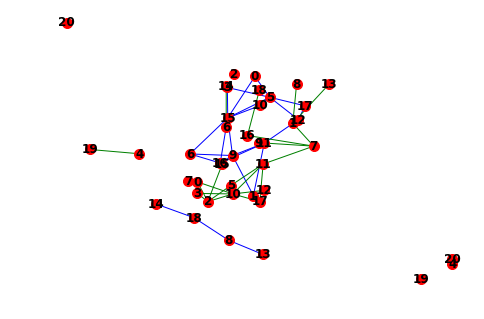

2018-12-04 01:40:40.840693


In [12]:
#Networkx
import datetime
G = nx.Graph()
# G.add_node(1)
# G.add_nodes_from([2, 3])

count = 0
print(datetime.datetime.now())

for index, row in df_dominant_topic.iterrows():
    G.add_node(count)
    G.node[count]["text"] = row["Text"]
    G.node[count]["topic"] = row["Dominant_Topic"]
    count += 1
    if count > 20: break;
print(datetime.datetime.now())
for i in range(19):
    for j in range(i+1,20):
        words = G.node[i]["text"]
        words2 = G.node[j]["text"]
        sum = 0
        avgSimilarity = 0
        for x in words:
            for y in words2:
                if (len(words) !=0 and len(words2) !=0):
                    sum += model.wv.similarity(w1=x, w2=y)
        if (len(words) !=0 and len(words2) !=0):     
            avg = sum /(len(words) * len(words2))
#             print(avg)
        
        for z in range(0,len(G.node[i]["topic"])):
            if G.node[i]["topic"][z] in G.node[j]["topic"]:
                G.add_edge(i, j, weight=avg)
print(datetime.datetime.now())
print(nx.number_of_edges(G))
print(nx.number_of_nodes(G))

# print(G.node[16]["text"])
# print(G.node[16]["topic"])
# print(G.get_edge_data(0,16))
# print(G.node[0]["text"])
# print(G.node[0]["topic"])

elarge = [(u, v) for (u, v, d) in G.edges(data=True) if d['weight'] > 0.3]
esmall = [(u, v) for (u, v, d) in G.edges(data=True) if d['weight'] <= 0.3]


nx.draw(G, with_labels=True, font_weight='bold', node_size=100, edgelist=elarge,
                       width=1, edge_color='b')
nx.draw(G, with_labels=True, font_weight='bold', node_size=100, edgelist=esmall,edge_color='g')
plt.show()
print(datetime.datetime.now())

In [27]:
print(G.node[5]["text"])
import math
def termFrequency(document):
    tfArray = []
    myset = set(document)
    for word in myset:
        tfArray.append(document.count(word)/len(document))
    return tfArray
        
print(termFrequency(G.node[5]["text"]))
sample = G.node[5]["text"]
def idf(document, allDocs):
    numberOfDocsWordIn = 0
    idfArray = []
    for word in document:
        numberOfDocsWordIn = 0
        for row in allDocs:
            if word in row:
                numberOfDocsWordIn += 1
        idfArray.append(1.0 + math.log(float(len(allDocs)) / numberOfDocsWordIn))
    return idfArray

print(idf(G.node[5]["text"], data_lemmatized))

x = idf(sample, data_lemmatized)
res = []
for index, value in enumerate(termFrequency(sample)):
    res.append(value * x[index])
    
print(res)


['legit', 'go', 'put', 'head', 'wall']
[0.2, 0.2, 0.2, 0.2, 0.2]
[8.410691035915558, 4.099497199650635, 6.060249921743877, 6.537381699723396, 7.538495623906628]
[1.6821382071831117, 0.819899439930127, 1.2120499843487755, 1.3074763399446792, 1.5076991247813256]


/home/matheesan_manokaran/.local/lib/python3.5/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


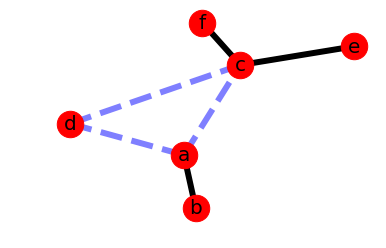

In [52]:
G = nx.Graph()

G.add_edge('a', 'b', weight=0.6)
G.add_edge('a', 'c', weight=0.2)
G.add_edge('c', 'd', weight=0.1)
G.add_edge('c', 'e', weight=0.7)
G.add_edge('c', 'f', weight=0.9)
G.add_edge('a', 'd', weight=0.3)

elarge = [(u, v) for (u, v, d) in G.edges(data=True) if d['weight'] > 0.5]
esmall = [(u, v) for (u, v, d) in G.edges(data=True) if d['weight'] <= 0.5]

pos = nx.spring_layout(G)  # positions for all nodes

# nodes
nx.draw_networkx_nodes(G, pos, node_size=700)

# edges
nx.draw_networkx_edges(G, pos, edgelist=elarge,
                       width=6)
nx.draw_networkx_edges(G, pos, edgelist=esmall,
                       width=6, alpha=0.5, edge_color='b', style='dashed')

# labels
nx.draw_networkx_labels(G, pos, font_size=20, font_family='sans-serif')

plt.axis('off')
plt.show()
        

In [87]:
print(nx.clustering(G))

{0: 0.6030769230769231, 1: 0.6608187134502924, 2: 0.5655172413793104, 3: 0.46, 4: 1.0, 5: 1.0, 6: 0.4276923076923077, 7: 0.5735294117647058, 8: 1.0, 9: 1.0, 10: 1.0, 11: 0.675, 12: 1.0, 13: 0.5947712418300654, 14: 1.0, 15: 1.0, 16: 0.5096774193548387, 17: 0.6923076923076923, 18: 1.0, 19: 0.4444444444444444, 20: 1.0, 21: 1.0, 22: 0.5666666666666667, 23: 0.5185185185185185, 24: 0.5714285714285714, 25: 0.6956521739130435, 26: 0.42857142857142855, 27: 0.5641025641025641, 28: 0.5669515669515669, 29: 0.509090909090909, 30: 0.672514619883041, 31: 1.0, 32: 0.5548387096774193, 33: 0.5423280423280423, 34: 0.696969696969697, 35: 1.0, 36: 0.5384615384615384, 37: 0.5578947368421052, 38: 0.4417989417989418, 39: 0.6184615384615385, 40: 0.6615384615384615, 41: 0.4727272727272727, 42: 0.7142857142857143, 43: 0.5641025641025641, 44: 0.5797101449275363, 45: 0.55, 46: 0.5357142857142857, 47: 1.0, 48: 0.5384615384615384, 49: 0.49523809523809526, 50: 1.0, 51: 1.0, 52: 0.8205128205128205, 53: 0.5507246376811